In [1]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import patches as patch
from scipy.signal import savgol_filter
import matplotlib.pyplot as plt
import luxpy as lx
import tensorflow as tf
%matplotlib inline 
import matplotlib.patches as patches

import keras
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout, Activation
from tensorflow.keras.optimizers import SGD
import os

Using TensorFlow backend.


In [2]:
#Harddrive
#path  = "F:/Neural Networks"
#Newton
#path = "C:/Users/Rene/Documents
#Darwin
path = "C:/Users/renep/Google Drive/Research/Dataset"

In [3]:
wavelength = np.arange(400,701,10)

cie = np.loadtxt(path + "/CIE1964.txt")
#x_, y_, z_ = cie[:,0], cie[:,1], cie[:,2], cie[:,3]
x_ = np.interp(wavelength, cie[:,0], cie[:,1])
y_ = np.interp(wavelength, cie[:,0], cie[:,2])
z_ = np.interp(wavelength, cie[:,0], cie[:,3])

'CAVE DATASET Sensitivity'

red = np.loadtxt(path + "/CAVE_RED.txt")
green = np.loadtxt(path + "/CAVE_GREEN.txt")
blue = np.loadtxt(path + "/CAVE_BLUE.txt")

r = savgol_filter(np.interp(wavelength, red[:,0], red[:,1]), 11, 2)
g = savgol_filter(np.interp(wavelength, green[:,0], green[:,1]), 11, 2)
b = savgol_filter(np.interp(wavelength, blue[:,0], blue[:,1]), 11, 2)

#plt.plot(wavelength, r, 'r-', wavelength, g, 'g-', wavelength, b, 'b-')

In [4]:
'D65 Illuminant'

D65 = lx._CIE_ILLUMINANTS['D65'] 
D65 = np.interp(wavelength, D65[0], D65[1])
D65 = D65/max(D65)
#plt.plot(D65)

Text(0.5, 0, 'Wavelength, nm')

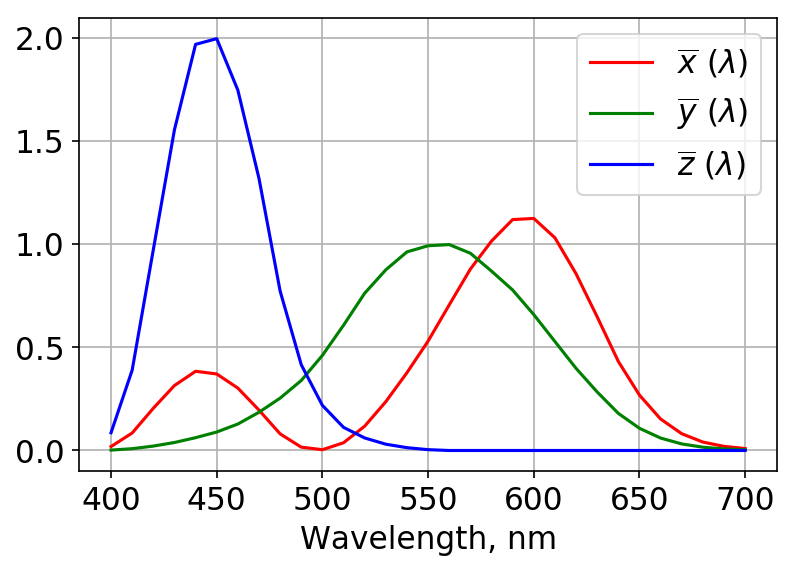

In [24]:
plt.figure(dpi = 150)
plt.plot(wavelength, x_, 'r',)
plt.plot(wavelength, y_, 'g')
plt.plot(wavelength, z_, 'b')
plt.legend(["$\overline {x}$ ($\lambda$)","$\overline {y}$ ($\lambda$)","$\overline {z}$ ($\lambda$)"])
plt.grid()
plt.xlabel("Wavelength, nm")


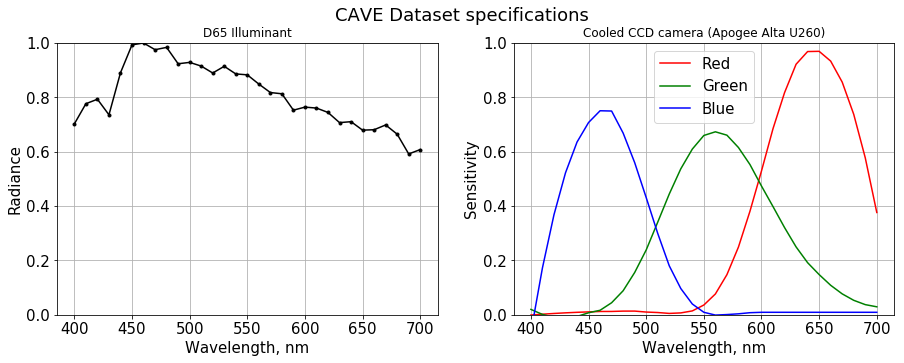

In [25]:

plt.figure(figsize=[15,5], facecolor = 'w')
plt.rcParams['axes.titlesize'] = 12
plt.rcParams.update({'font.size': 15})
# plt.rcParams["font.family"] = "cursive"

plt.suptitle("CAVE Dataset specifications")

plt.subplot(1,2,1)
plt.plot(wavelength, D65, 'k.-')
plt.ylim(0,1)
plt.xlabel("Wavelength, nm")
plt.ylabel("Radiance")
plt.title("D65 Illuminant")
plt.grid()
plt.subplot(1,2,2)
plt.plot(wavelength, r, 'r')
plt.plot(wavelength, g, 'g')
plt.plot(wavelength, b, 'b')


plt.ylim(0,1)
plt.xlabel("Wavelength, nm")
plt.ylabel("Sensitivity")
plt.title("Cooled CCD camera (Apogee Alta U260)")
plt.legend(["Red", "Green", "Blue"])
plt.grid()


In [89]:

# 'NIJI Sensitivity'
# red = np.loadtxt(path + "/red.txt")
# green = np.loadtxt(path + "/green.txt")
# blue = np.loadtxt(path + "/blue.txt")

# r = savgol_filter(np.interp(wavelength, red[:,0], red[:,1]), 11, 2)
# g = savgol_filter(np.interp(wavelength, green[:,0], green[:,1]), 11, 2)
# b = savgol_filter(np.interp(wavelength, blue[:,0], blue[:,1]), 11, 2)

'Radiance'

light = np.loadtxt(path + "/LED.txt")
source = np.interp(wavelength, light[:,0], light[:,1])

'Munsell ensemble'

munsell_wav = np.arange(380,801,1)
munsell = np.loadtxt(path + "/munsell.txt")
munsell_r = np.zeros(shape=[len(wavelength),1269])

for i in range(1,1269):
    munsell_r[:,i] = np.interp(wavelength, munsell_wav, munsell[:,i])

'Macbeth Ensemble'
    
macbeth = np.loadtxt(path + "/macbeth.txt")
macbeth_wav, macbeth_ref =  macbeth[4:64,0], macbeth[4:64,1:]
macbeth_r = np.zeros(shape=[len(wavelength),24])


for i in range(1,25):
    macbeth_r[:,i-1] = np.interp(wavelength, macbeth_wav, macbeth_ref[:,i-1])
    
    
'Filter transmittances'

filters = np.loadtxt(path + "/filter.txt")



In [192]:
"Augmentation using Filters"

munsell_ensemble = munsell_r
macbeth_ensemble = macbeth_r

for f in range(1,8):

    filter_wav, filter_t = filters[:,0], filters[:,f] 
    transmittance = np.zeros(shape=[len(wavelength)])
    transmittance = savgol_filter(np.interp(wavelength, filter_wav, filter_t),11,2)
    
    munsell_f = np.zeros(shape=[len(wavelength),1269])
    for i in range(1,1269):
        munsell_f[:,i] = np.multiply(transmittance, munsell_r[:,i])
    munsell_ensemble = (np.concatenate([munsell_ensemble.T, munsell_f.T])).T

    macbeth_f = np.zeros(shape=[len(wavelength),24])
    for i in range(1,25):
        macbeth_f[:,i-1] = np.multiply(transmittance, macbeth_r[:,i-1])
    macbeth_ensemble = (np.concatenate([macbeth_ensemble.T, macbeth_f.T])).T
    
macbeth_ensemble = munsell_ensemble/np.amax(munsell_ensemble)
munsell_ensemble = munsell_ensemble/np.amax(munsell_ensemble)

Text(0, 0.5, 'Transmittance')

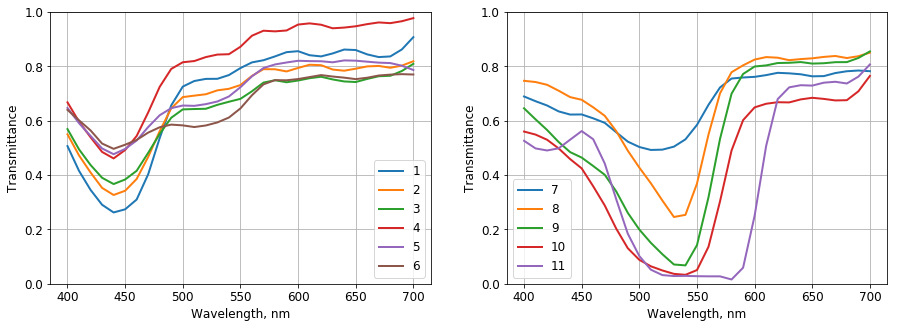

In [193]:
plt.figure(figsize=[15,5], facecolor = "white")
plt.subplot(121)
for f in range(1,7):
    filter_wav, filter_t = filters[:,0], filters[:,f] 
    transmittance = np.zeros(shape=[len(wavelength)])
    transmittance = savgol_filter(np.interp(wavelength, filter_wav, filter_t),5,2)
    plt.plot(wavelength, transmittance, lw = 2, label = str(f))
    plt.ylim(0,1)
    
plt.grid()
plt.legend()
plt.xlabel("Wavelength, nm")
plt.ylabel("Transmittance")

plt.subplot(122)
for f in range(7,12):
    filter_wav, filter_t = filters[:,0], filters[:,f] 
    transmittance = np.zeros(shape=[len(wavelength)])
    transmittance = savgol_filter(np.interp(wavelength, filter_wav, filter_t),5,2)
    plt.plot(wavelength, transmittance, lw = 2, label = str(f))
    plt.ylim(0,1)
    
plt.grid()
plt.legend()
plt.xlabel("Wavelength, nm")
plt.ylabel("Transmittance")

Text(0, 0.5, 'Transmittance')

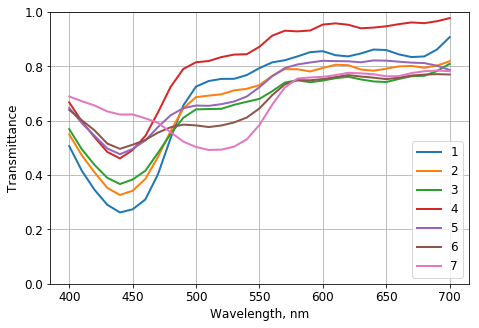

In [194]:
plt.figure(figsize=[7.5,5], facecolor = "white")
for f in range(1,8):
    filter_wav, filter_t = filters[:,0], filters[:,f] 
    transmittance = np.zeros(shape=[len(wavelength)])
    transmittance = savgol_filter(np.interp(wavelength, filter_wav, filter_t),5,2)
    plt.plot(wavelength, transmittance, lw = 2, label = str(f))
    plt.ylim(0,1)
    
plt.grid()
plt.legend()
plt.xlabel("Wavelength, nm")
plt.ylabel("Transmittance")

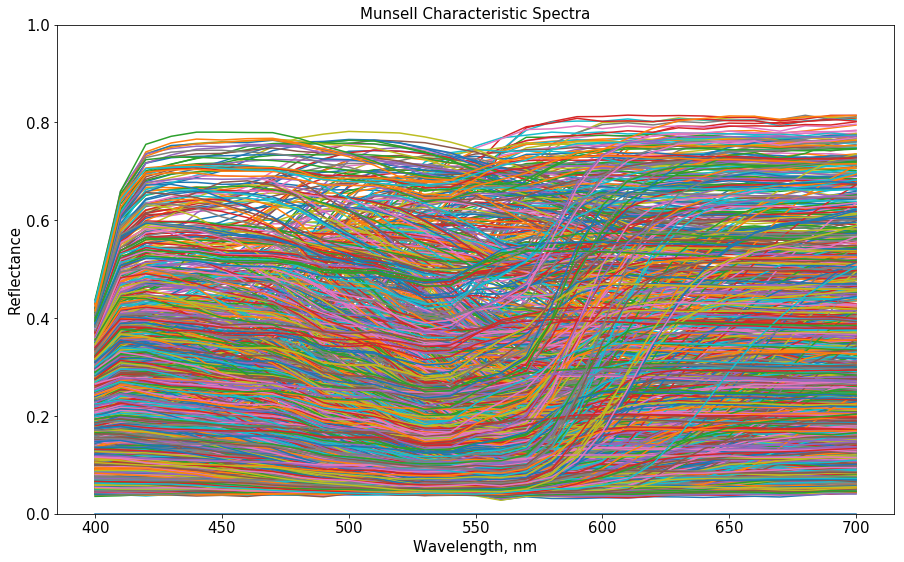

In [196]:
plt.figure(figsize=[15,9], facecolor = 'w')
plt.rcParams['axes.titlesize'] = 15
plt.rcParams.update({'font.size': 15})
plt.plot(wavelength, munsell_r)
plt.ylim(0,1)
plt.xlabel("Wavelength, nm")
plt.ylabel("Reflectance")
plt.title("Munsell Characteristic Spectra")
plt.show()

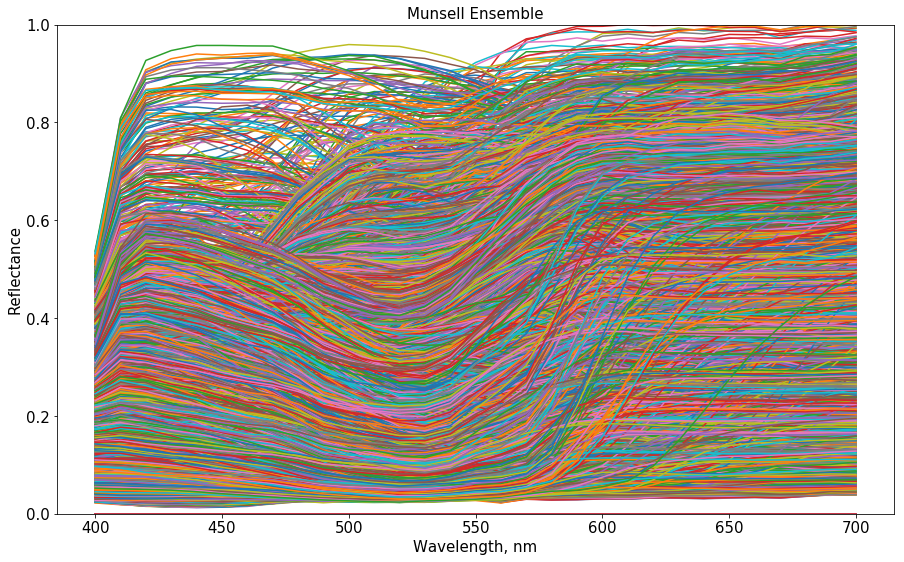

In [197]:
plt.figure(figsize=[15,9], facecolor = 'w')
plt.rcParams['axes.titlesize'] = 15
plt.rcParams.update({'font.size': 15})
plt.plot(wavelength, munsell_ensemble)
plt.ylim(0,1)
plt.xlabel("Wavelength, nm")
plt.ylabel("Reflectance")
plt.title("Munsell Ensemble")
plt.show()

In [198]:
def Color_Simulation(r_sensitivity,g_sensitivity,b_sensitivity, source, transmittance, ensemble):
    
    R_sim = []
    G_sim = []
    B_sim = []
    
    for i in range(0,len(ensemble.T)):

        R = np.trapz(ensemble[:,i]*r_sensitivity*source*transmittance)
        G = np.trapz(ensemble[:,i]*g_sensitivity*source*transmittance)
        B = np.trapz(ensemble[:,i]*b_sensitivity*source*transmittance)
        
        R_sim.append(R)
        G_sim.append(G)
        B_sim.append(B)
            
    RGB = np.array([np.round(255*(R_sim/max(R_sim))),
                    np.round(255*(G_sim/max(G_sim))),
                    np.round(255*(B_sim/max(B_sim)))])
            
    return RGB 

#R_sim, G_sim, B_sim = Color_Simulation(r,g,b,1, 1, munsell_r)
# R_sim, G_sim, B_sim

RGB_mac = Color_Simulation(r,g,b,D65, 1, macbeth_ensemble)
RGB_mun = Color_Simulation(r,g,b,D65, 1, munsell_ensemble)

#RGB_macbeth = Color_Simulation(r,g,b,D65, 1, macbeth_r)
#RGB_munsell = Color_Simulation(r,g,b,D65, 1, munsell_r)

In [199]:
#RGB_mac = Color_Simulation(r,g,b,D65, 1, macbeth_r)

In [200]:
"Entending the Ensemble even more"

RGB_mac_X = RGB_mac
RGB_mun_X = RGB_mun

munsell_X = munsell_ensemble
macbeth_X = macbeth_ensemble

for j in np.linspace(0.1,0.9,9):
    munsell_x = np.zeros(shape=[len(wavelength),np.shape(munsell_ensemble)[1]])
    for i in range(np.shape(munsell_ensemble)[1]):
          munsell_x[:,i] = munsell_ensemble[:,i]*j
    munsell_X = (np.concatenate([munsell_X.T, munsell_x.T])).T
    
#     RGB_mun_x = np.zeros(shape=[3,np.shape(RGB_mun)[1]])
#     for i in range(np.shape(RGB_mun)[1]):
#           RGB_mun_x[:,i] = RGB_mun[:,i]*j
#     RGB_mun_X = (np.concatenate([RGB_mun_X.T, RGB_mun_x.T])).T
    
    
    macbeth_x = np.zeros(shape=[len(wavelength),np.shape(macbeth_ensemble)[1]])
    for i in range(np.shape(macbeth_ensemble)[1]):
          macbeth_x[:,i] = macbeth_ensemble[:,i]*j
    macbeth_X = (np.concatenate([macbeth_X.T, macbeth_x.T])).T
    
#     RGB_mac_x = np.zeros(shape=[3,np.shape(RGB_mac)[1]])
#     for i in range(np.shape(RGB_mac)[1]):
#           RGB_mac_x[:,i] = RGB_mac[:,i]*j
#     RGB_mac_X = (np.concatenate([RGB_mac_X.T, RGB_mac_x.T])).T




In [202]:
np.linspace(0.1,0.9,9)

array([1.0000e-01, 2.0000e-01, 3.0000e-01, 4.0000e-01, 5.0000e-01,
       6.0000e-01, 7.0000e-01, 8.0000e-01, 9.0000e-01])

In [203]:
RGB_mun_X = Color_Simulation(r,g,b,D65, 1, munsell_X)
RGB_mac_X = Color_Simulation(r,g,b,D65, 1, macbeth_X)

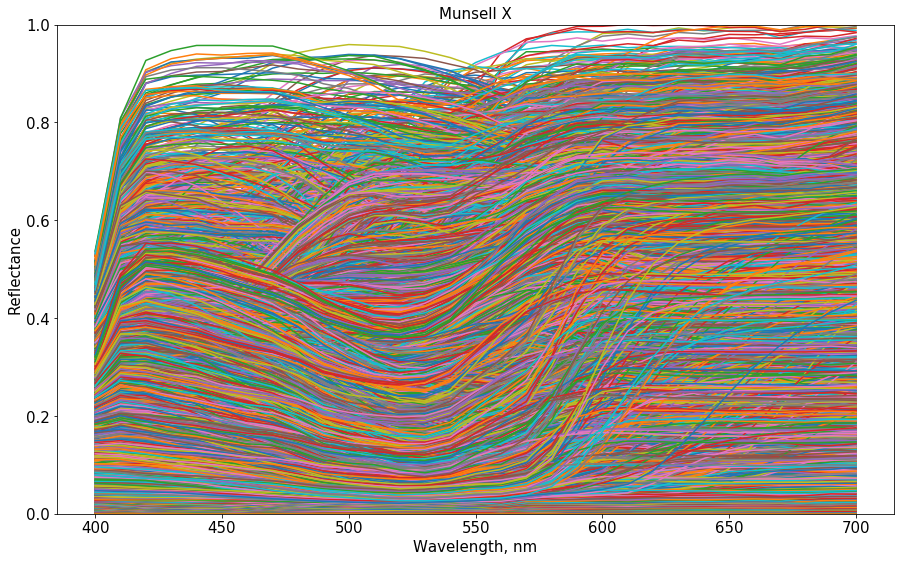

In [204]:
plt.figure(figsize=[15,9], facecolor = 'w')
plt.rcParams['axes.titlesize'] = 15
plt.rcParams.update({'font.size': 15})
plt.plot(wavelength, munsell_X)
plt.ylim(0,1)
plt.xlabel("Wavelength, nm")
plt.ylabel("Reflectance")
plt.title("Munsell X")
plt.show()

In [109]:
RGB_mun_X.shape

(3, 152280)

C:\Users\renep\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: VisibleDeprecationWarning: Passing `normed=True` on non-uniform bins has always been broken, and computes neither the probability density function nor the probability mass function. The result is only correct if the bins are uniform, when density=True will produce the same result anyway. The argument will be removed in a future version of numpy.
  
C:\Users\renep\Anaconda3\lib\site-packages\ipykernel_launcher.py:7: VisibleDeprecationWarning: Passing `normed=True` on non-uniform bins has always been broken, and computes neither the probability density function nor the probability mass function. The result is only correct if the bins are uniform, when density=True will produce the same result anyway. The argument will be removed in a future version of numpy.
  import sys
C:\Users\renep\Anaconda3\lib\site-packages\ipykernel_launcher.py:8: VisibleDeprecationWarning: Passing `normed=True` on non-uniform bins has always been

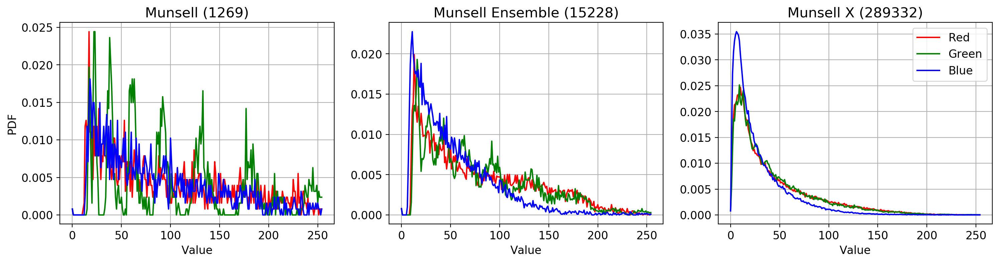

In [205]:
BINS = 255
plt.figure(figsize = [18,4], dpi = 200)
plt.rcParams.update({'font.size': 12})
plt.subplot(131)
plt.title("Munsell (1269)")
hist_r, bins_r = np.histogram(RGB_mun[0,:1269], bins = BINS, range = [0,255], normed = "False")  
hist_g, bins_g = np.histogram(RGB_mun[1,:1269], bins = BINS, range = [0,255], normed = "False")  
hist_b, bins_b = np.histogram(RGB_mun[2,:1269], bins = BINS, range = [0,255], normed = "False")  
plt.plot(bins_r[:-1], hist_r, 'r', lw = 1.5, alpha = 1)
plt.plot(bins_g[:-1], hist_g, 'g', lw = 1.5, alpha = 1)
plt.plot(bins_b[:-1], hist_b, 'b', lw = 1.5, alpha = 1)
plt.xlabel("Value")
plt.ylabel("PDF")
plt.grid()

plt.subplot(132)
plt.title("Munsell Ensemble (15228)")
hist_r, bins_r = np.histogram(RGB_mun[0], bins = BINS, range = [0,255], normed = "False")  
hist_g, bins_g = np.histogram(RGB_mun[1], bins = BINS, range = [0,255], normed = "False")  
hist_b, bins_b = np.histogram(RGB_mun[2], bins = BINS, range = [0,255], normed = "False")  
plt.plot(bins_r[:-1], hist_r, 'r', lw = 1.5, alpha = 1)
plt.plot(bins_g[:-1], hist_g, 'g', lw = 1.5, alpha = 1)
plt.plot(bins_b[:-1], hist_b, 'b', lw = 1.5, alpha = 1)
plt.xlabel("Value")
plt.grid()

plt.subplot(133)
plt.title("Munsell X (289332)")
hist_r, bins_r = np.histogram(RGB_mun_X[0], bins = BINS, range = [0,255], normed = "False")  
hist_g, bins_g = np.histogram(RGB_mun_X[1], bins = BINS, range = [0,255], normed = "False")  
hist_b, bins_b = np.histogram(RGB_mun_X[2], bins = BINS, range = [0,255], normed = "False")  
plt.plot(bins_r[:-1], hist_r, 'r', lw = 1.5, alpha = 1)
plt.plot(bins_g[:-1], hist_g, 'g', lw = 1.5, alpha = 1)
plt.plot(bins_b[:-1], hist_b, 'b', lw = 1.5, alpha = 1)
plt.grid()
plt.legend(["Red", "Green", "Blue"])
plt.xlabel("Value")
plt.show()

In [206]:
from skimage.color import rgb2lab, lab2rgb, lab2lch


In [207]:
def converter(ensemble):
    LAB = rgb2lab([[ensemble.T/255]])
    A = np.asarray(LAB[0,0,:,1])
    B = np.asarray(LAB[0,0,:,2])
    return A,B

Text(0.5, 0, 'a*')

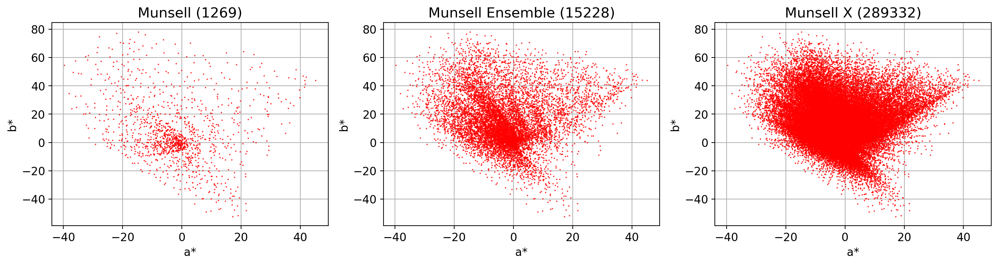

In [208]:
plt.figure(figsize = [18,4], dpi = 200)

plt.subplot(131)
plt.title("Munsell (1269)")
plt.grid()
A,B = converter(RGB_mun[:,:1269])
plt.plot(A,B, 'r.', ms = 0.8)
plt.ylabel("b*")
plt.xlabel("a*")

plt.subplot(132)
plt.grid()
plt.title("Munsell Ensemble (15228)")
A,B = converter(RGB_mun)
plt.plot(A,B, 'r.',  ms = 0.8)
plt.ylabel("b*")
plt.xlabel("a*")

plt.subplot(133)
plt.grid()
plt.title("Munsell X (289332)")
A,B = converter(RGB_mun_X)
plt.plot(A,B, 'r.',  ms = 0.8)
plt.ylabel("b*")
plt.xlabel("a*")

In [25]:
help(rgb2lab)

Help on function rgb2lab in module skimage.color.colorconv:

rgb2lab(rgb, illuminant='D65', observer='2')
    RGB to lab color space conversion.
    
    Parameters
    ----------
    rgb : array_like
        The image in RGB format, in a 3- or 4-D array of shape
        ``(.., ..,[ ..,] 3)``.
    illuminant : {"A", "D50", "D55", "D65", "D75", "E"}, optional
        The name of the illuminant (the function is NOT case sensitive).
    observer : {"2", "10"}, optional
        The aperture angle of the observer.
    
    Returns
    -------
    out : ndarray
        The image in Lab format, in a 3- or 4-D array of shape
        ``(.., ..,[ ..,] 3)``.
    
    Raises
    ------
    ValueError
        If `rgb` is not a 3- or 4-D array of shape ``(.., ..,[ ..,] 3)``.
    
    References
    ----------
    .. [1] https://en.wikipedia.org/wiki/Standard_illuminant
    
    Notes
    -----
    This function uses rgb2xyz and xyz2lab.
    By default Observer= 2A, Illuminant= D65. CIE XYZ tristimul

In [209]:
def Render_WB(model, r_sensitivity,g_sensitivity,b_sensitivity, source):
    RGB2REF = tf.keras.models.load_model(model)
    reflectances = RGB2REF.predict(RGB_mac.T)
    fig, axes = plt.subplots(4,6, figsize=(15,9), sharex=True, sharey=True, dpi=200, facecolor = 'w')

    R_w = np.trapz(reflectances[18,:]*r_sensitivity*source)
    G_w = np.trapz(reflectances[18,:]*g_sensitivity*source)
    B_w = np.trapz(reflectances[18,:]*b_sensitivity*source)


    R_m_w = np.trapz(macbeth_r[:,18]*r_sensitivity*source)
    G_m_w = np.trapz(macbeth_r[:,18]*g_sensitivity*source)
    B_m_w = np.trapz(macbeth_r[:,18]*b_sensitivity*source)

    RGB = []
    for i, ax in enumerate(axes.ravel()):
        
        #de_76 = del_E_76(CIELab(reflectances[i,:]),CIELab(macbeth_r[:,i]))

        R = 255/R_w*np.trapz(reflectances[i,:]*r_sensitivity*source)
        G = 255/G_w*np.trapz(reflectances[i,:]*g_sensitivity*source)
        B = 255/B_w*np.trapz(reflectances[i,:]*b_sensitivity*source)
        
        R_m = 255/R_m_w*np.trapz(macbeth_r[:,i]*r_sensitivity*source)
        G_m = 255/G_m_w*np.trapz(macbeth_r[:,i]*g_sensitivity*source)
        B_m = 255/B_m_w*np.trapz(macbeth_r[:,i]*b_sensitivity*source) 
        
        if R<0: R = 0
        if G<0: G = 0
        if B<0: B = 0
        if R>255: R = 255
        if G>255: G = 255
        if G>255: B = 255
        
        fig.suptitle(model)
        
        ax.plot(wavelength, macbeth_r[:,i], 'w-', lw = 5 )
        ax.plot(wavelength, macbeth_r[:,i], 'r--', lw = 3, label = 'Theoretical')
        ax.plot(wavelength, reflectances[i,:], 'w-', lw = 5 )
        ax.plot(wavelength, reflectances[i,:], 'b--', lw = 3, label = 'Predicted')
        #ax.set_xlabel("$\Delta$E = " + str(np.round(de_76,2)))

        rr,gg,bb = R/255,G/255,B/255
        rr_m,gg_m,bb_m = R_m/255,G_m/255,B_m/255

        ax.set_facecolor(([rr,gg,bb]))
             
        ax.set_xlim(400,700)
        ax.set_ylim(0,1)
        rect = patches.Rectangle((400,0),150,1,facecolor=([rr_m,gg_m,bb_m])) 
        ax.add_patch(rect)
        RGB.append([rr,gg,bb])
    
        
        #print(rr-rr_m, gg-gg_m, bb-bb_m)
    ax.legend()
    #fig.savefig("C:/Users/renep/Google Drive/Research/Progress Report/" + model + ".png")
    return RGB


In [210]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout, Activation
from tensorflow.keras.optimizers import SGD




In [211]:
def DataAug(RGB_rendition, ensemble, epoch, h1,h2):

    model = Sequential()
    model.add(Dense(h1, activation='sigmoid', input_dim=3))
    model.add(Dense(h2, activation='sigmoid'))
    model.add(Dense(31, activation='sigmoid'))
    model.compile(loss='mean_squared_error',
                  optimizer = 'adam',
                  metrics=['mse'])

    score = model.evaluate(RGB_rendition.T, ensemble.T)
    callback = tf.keras.callbacks.EarlyStopping(monitor='val_loss', min_delta=0.0005, patience=20, verbose=1, mode='auto', baseline=None, restore_best_weights=True)

    history = model.fit(RGB_rendition.T, ensemble.T, epochs=epoch, validation_split=0.2, callbacks = [callback], shuffle=True)

    #model.save(filename)
    mse_T = history.history['loss']
    mse_V = history.history['val_loss']
    RMSE_T = np.sqrt(mse_T)
    RMSE_V = np.sqrt(mse_V)
    
    return RMSE_T,RMSE_V

In [219]:
RMSE_T_1,RMSE_V_1 = DataAug(RGB_mun[:,:1269], munsell_ensemble[:,:1269], 50, 3,10)
RMSE_T_2,RMSE_V_2 = DataAug(RGB_mun, munsell_ensemble, 50, 3,10)
RMSE_T_3,RMSE_V_3 = DataAug(RGB_mun_X, munsell_X, 50, 3,10)

1269/1269 [==============================] - 0s 35us/sample - loss: 0.0943 - mse: 0.0943
Train on 1015 samples, validate on 254 samples
Epoch 1/50
1015/1015 [==============================] - 0s 139us/sample - loss: 0.0884 - mse: 0.0884 - val_loss: 0.0775 - val_mse: 0.0775
Epoch 2/50
1015/1015 [==============================] - 0s 31us/sample - loss: 0.0776 - mse: 0.0776 - val_loss: 0.0689 - val_mse: 0.0689
Epoch 3/50
1015/1015 [==============================] - 0s 34us/sample - loss: 0.0703 - mse: 0.0703 - val_loss: 0.0636 - val_mse: 0.0636
Epoch 4/50
1015/1015 [==============================] - 0s 44us/sample - loss: 0.0657 - mse: 0.0657 - val_loss: 0.0602 - val_mse: 0.0602
Epoch 5/50
1015/1015 [==============================] - 0s 34us/sample - loss: 0.0627 - mse: 0.0627 - val_loss: 0.0583 - val_mse: 0.0583
Epoch 6/50
1015/1015 [==============================] - 0s 37us/sample - loss: 0.0609 - mse: 0.0609 - val_loss: 0.0574 - val_mse: 0.0574
Epoch 7/50
1015/1015 [===================

Epoch 16/50
81216/81216 [==============================] - 2s 27us/sample - loss: 9.1334e-04 - mse: 9.1334e-04 - val_loss: 0.0020 - val_mse: 0.0020
Epoch 17/50
81216/81216 [==============================] - 2s 26us/sample - loss: 9.0934e-04 - mse: 9.0934e-04 - val_loss: 0.0020 - val_mse: 0.0020
Epoch 18/50
81216/81216 [==============================] - 2s 28us/sample - loss: 9.0325e-04 - mse: 9.0325e-04 - val_loss: 0.0020 - val_mse: 0.0020
Epoch 19/50
81216/81216 [==============================] - 2s 28us/sample - loss: 8.9268e-04 - mse: 8.9268e-04 - val_loss: 0.0023 - val_mse: 0.0023
Epoch 20/50
81216/81216 [==============================] - 2s 29us/sample - loss: 8.8672e-04 - mse: 8.8672e-04 - val_loss: 0.0020 - val_mse: 0.0020
Epoch 21/50
81216/81216 [==============================] - 2s 28us/sample - loss: 8.7670e-04 - mse: 8.7670e-04 - val_loss: 0.0020 - val_mse: 0.0020
Epoch 22/50
81216/81216 [==============================] - 2s 30us/sample - loss: 8.6844e-04 - mse: 8.6844e-04 -

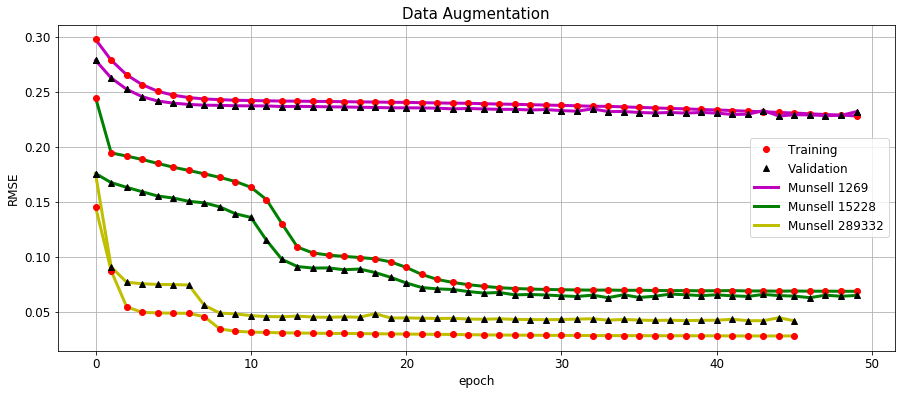

In [220]:
plt.figure(figsize=[15,6])

plt.plot(RMSE_T_1, 'm-', lw= 3)
plt.plot(RMSE_T_1, 'ro', label = "Training")
plt.plot(RMSE_V_1, 'k^', label = "Validation")
plt.plot(RMSE_V_1, 'm-', lw= 3, label = "Munsell 1269")
plt.plot(RMSE_V_1, 'k^')

plt.plot(RMSE_T_2, 'g-', lw= 3)
plt.plot(RMSE_V_2, 'g-', lw= 3, label = "Munsell 15228")
plt.plot(RMSE_T_2, 'ro')
plt.plot(RMSE_V_2, 'k^')

plt.plot(RMSE_T_3, 'y-', lw= 3)
plt.plot(RMSE_V_3, 'y-', lw= 3, label = "Munsell 289332")
plt.plot(RMSE_T_3, 'ro')
plt.plot(RMSE_V_3, 'k^')

plt.title('Data Augmentation')
plt.ylabel('RMSE')
plt.xlabel('epoch')
plt.legend()
plt.grid()
plt.show()


In [221]:
plt.rcParams['axes.titlesize'] = 15

def Create_Model(RGB_rendition, ensemble, epoch, h1,h2, filename):
    model = Sequential()
    model.add(Dense(h1, activation='sigmoid', input_dim=3))
    model.add(Dense(h2, activation='sigmoid'))
    model.add(Dense(31, activation='sigmoid'))
    model.compile(loss='mean_squared_error',
                  optimizer = 'adam',
                  metrics=['mse'])
    
    score = model.evaluate(RGB_rendition.T, ensemble.T)
    callback = tf.keras.callbacks.EarlyStopping(monitor='val_loss', min_delta=0.0005, patience=20, verbose=1, mode='auto', baseline=None, restore_best_weights=True)

    #score = model.evaluate(RGB_mun.T, munsell_r.T)
    history = model.fit(RGB_rendition.T, ensemble.T, epochs=epoch, validation_split=0.2, callbacks = [callback], shuffle=True)
    
    model.save(filename)
    mse_T = history.history['loss']
    mse_V = history.history['val_loss']
    RMSE_T = np.sqrt(mse_T)
    RMSE_V = np.sqrt(mse_V)
    
    return RMSE_T,RMSE_V



In [222]:
results_path = "C:/Users/renep/Google Drive/Research/Codes/Latest Models"

In [223]:
RMSE_T_1,RMSE_V_1 = Create_Model(RGB_mun_X, munsell_X, 50, 3, 10, "MODEL1.model")
RMSE_T_1.min(), RMSE_V_1.min()

101520/101520 [==============================] - 1s 12us/sample - loss: 0.1590 - mse: 0.1590
Train on 81216 samples, validate on 20304 samples
Epoch 1/50
81216/81216 [==============================] - 2s 28us/sample - loss: 0.0175 - mse: 0.0175 - val_loss: 0.0125 - val_mse: 0.0125
Epoch 2/50
81216/81216 [==============================] - 2s 27us/sample - loss: 0.0034 - mse: 0.0034 - val_loss: 0.0064 - val_mse: 0.0064
Epoch 3/50
81216/81216 [==============================] - 2s 27us/sample - loss: 0.0026 - mse: 0.0026 - val_loss: 0.0058 - val_mse: 0.0058
Epoch 4/50
81216/81216 [==============================] - 2s 27us/sample - loss: 0.0024 - mse: 0.0024 - val_loss: 0.0057 - val_mse: 0.0057
Epoch 5/50
81216/81216 [==============================] - 2s 27us/sample - loss: 0.0024 - mse: 0.0024 - val_loss: 0.0056 - val_mse: 0.0056
Epoch 6/50
81216/81216 [==============================] - 2s 27us/sample - loss: 0.0024 - mse: 0.0024 - val_loss: 0.0057 - val_mse: 0.0057
Epoch 7/50
81216/81216 

(0.028440844533038166, 0.042779753264089004)

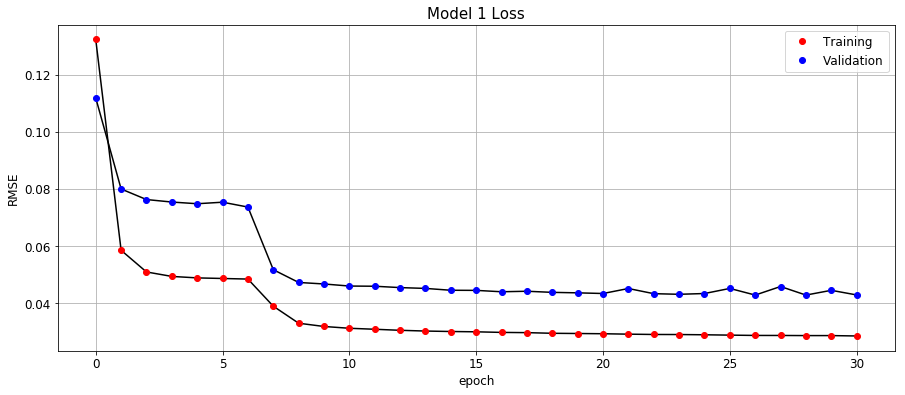

In [225]:
plt.figure(figsize=[15,6])
plt.plot(RMSE_T_1, 'k-')
plt.plot(RMSE_T_1, 'ro', label = "Training")
plt.plot(RMSE_V_1, 'k-')
plt.plot(RMSE_V_1, 'bo', label = "Validation")
plt.title('Model 1 Loss')
plt.ylabel('RMSE')
plt.xlabel('epoch')
# plt.ylim(0,0.2)
# plt.xlim(-5,25)
plt.legend()
plt.grid()
plt.show()


In [226]:
RMSE_T_2,RMSE_V_2 = Create_Model(RGB_mun_X, munsell_X, 50, 10, 20, "MODEL2.model")
RMSE_T_2.min(), RMSE_V_2.min()


101520/101520 [==============================] - 1s 12us/sample - loss: 0.1487 - mse: 0.1487
Train on 81216 samples, validate on 20304 samples
Epoch 1/50
81216/81216 [==============================] - 2s 29us/sample - loss: 0.0108 - mse: 0.0108 - val_loss: 0.0053 - val_mse: 0.0053
Epoch 2/50
81216/81216 [==============================] - 2s 30us/sample - loss: 0.0015 - mse: 0.0015 - val_loss: 0.0026 - val_mse: 0.0026
Epoch 3/50
81216/81216 [==============================] - 2s 27us/sample - loss: 0.0010 - mse: 0.0010 - val_loss: 0.0021 - val_mse: 0.0021
Epoch 4/50
81216/81216 [==============================] - 2s 27us/sample - loss: 7.1131e-04 - mse: 7.1131e-04 - val_loss: 0.0012 - val_mse: 0.0012
Epoch 5/50
81216/81216 [==============================] - 2s 28us/sample - loss: 4.2304e-04 - mse: 4.2304e-04 - val_loss: 8.0261e-04 - val_mse: 8.0261e-04
Epoch 6/50
81216/81216 [==============================] - 2s 27us/sample - loss: 3.0908e-04 - mse: 3.0908e-04 - val_loss: 5.5380e-04 - val

(0.012146491128393873, 0.016816895526640244)

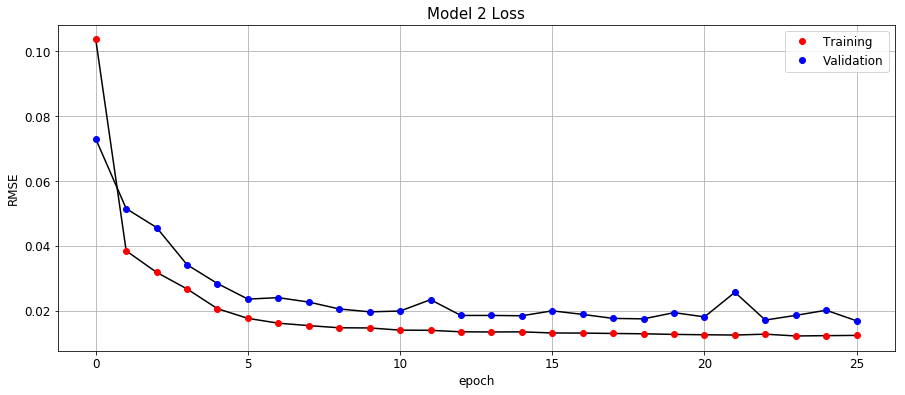

In [227]:
plt.figure(figsize=[15,6])
plt.plot(RMSE_T_2, 'k-')
plt.plot(RMSE_T_2, 'ro', label = "Training")
plt.plot(RMSE_V_2, 'k-')
plt.plot(RMSE_V_2, 'bo', label = "Validation")
plt.title('Model 2 Loss')
plt.ylabel('RMSE')
plt.xlabel('epoch')
# plt.ylim(0,0.2)
# plt.xlim(-5,25)
plt.legend()
plt.grid()
plt.show()

In [228]:
RMSE_T_3,RMSE_V_3 = Create_Model(RGB_mun_X, munsell_X, 50, 30, 100, "MODEL3.model")
RMSE_T_3.min(), RMSE_V_3.min()

101520/101520 [==============================] - 1s 13us/sample - loss: 0.1965 - mse: 0.1965
Train on 81216 samples, validate on 20304 samples
Epoch 1/50
81216/81216 [==============================] - 3s 36us/sample - loss: 0.0039 - mse: 0.0039 - val_loss: 8.1834e-04 - val_mse: 8.1834e-04
Epoch 2/50
81216/81216 [==============================] - 2s 29us/sample - loss: 2.9637e-04 - mse: 2.9637e-04 - val_loss: 5.0483e-04 - val_mse: 5.0483e-04
Epoch 3/50
81216/81216 [==============================] - 2s 28us/sample - loss: 2.0527e-04 - mse: 2.0527e-04 - val_loss: 3.5974e-04 - val_mse: 3.5974e-04
Epoch 4/50
81216/81216 [==============================] - 2s 29us/sample - loss: 1.8206e-04 - mse: 1.8206e-04 - val_loss: 3.9168e-04 - val_mse: 3.9168e-04
Epoch 5/50
81216/81216 [==============================] - 2s 30us/sample - loss: 1.8576e-04 - mse: 1.8576e-04 - val_loss: 2.8041e-04 - val_mse: 2.8041e-04
Epoch 6/50
81216/81216 [==============================] - 2s 27us/sample - loss: 1.5131e-0

(0.010477523947871232, 0.014652524035112373)

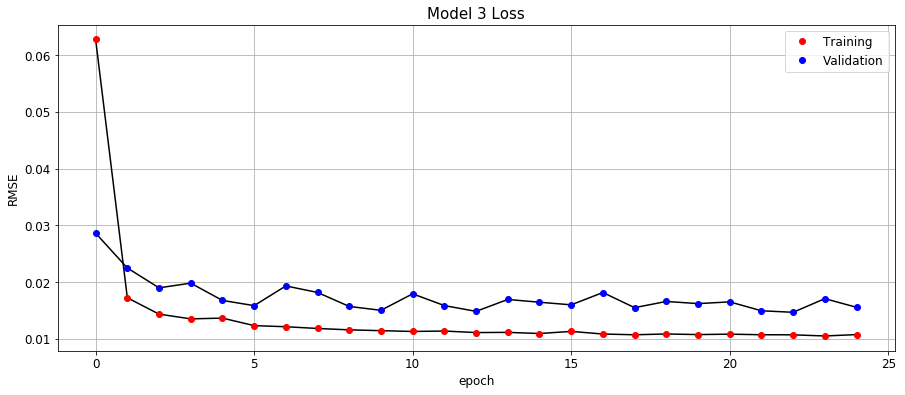

In [229]:
plt.figure(figsize=[15,6])
plt.plot(RMSE_T_3, 'k-')
plt.plot(RMSE_T_3, 'ro', label = "Training")
plt.plot(RMSE_V_3, 'k-')
plt.plot(RMSE_V_3, 'bo', label = "Validation")
plt.title('Model 3 Loss')
plt.ylabel('RMSE')
plt.xlabel('epoch')
# plt.ylim(0,0.1)
# plt.xlim(-5,25)
plt.legend()
plt.grid()
plt.show()

In [230]:
RMSE_T_4,RMSE_V_4 = Create_Model(RGB_mun_X, munsell_X, 50, 300, 1000, "MODEL4.model")
RMSE_T_4.min(), RMSE_V_4.min()

101520/101520 [==============================] - 3s 32us/sample - loss: 0.1748 - mse: 0.1748
Train on 81216 samples, validate on 20304 samples
Epoch 1/50
81216/81216 [==============================] - 8s 102us/sample - loss: 0.0011 - mse: 0.0011 - val_loss: 0.0010 - val_mse: 0.0010
Epoch 2/50
81216/81216 [==============================] - 8s 101us/sample - loss: 1.5982e-04 - mse: 1.5982e-04 - val_loss: 2.3939e-04 - val_mse: 2.3939e-04
Epoch 3/50
81216/81216 [==============================] - 8s 95us/sample - loss: 1.4213e-04 - mse: 1.4213e-04 - val_loss: 3.0792e-04 - val_mse: 3.0792e-04
Epoch 4/50
81216/81216 [==============================] - 7s 87us/sample - loss: 1.3351e-04 - mse: 1.3351e-04 - val_loss: 4.7552e-04 - val_mse: 4.7552e-04
Epoch 5/50
81216/81216 [==============================] - 7s 87us/sample - loss: 1.2840e-04 - mse: 1.2840e-04 - val_loss: 3.1019e-04 - val_mse: 3.1019e-04
Epoch 6/50
81216/81216 [==============================] - 7s 90us/sample - loss: 1.1632e-04 - ms

(0.009910300986912172, 0.014071712427170735)

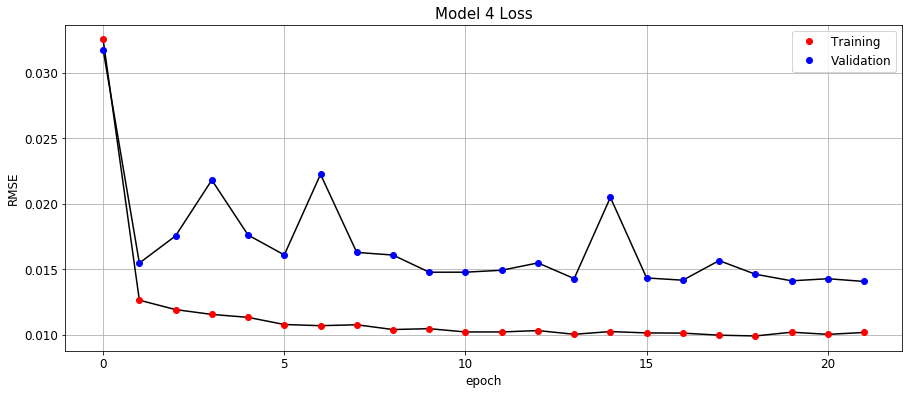

In [231]:
plt.figure(figsize=[15,6])
plt.plot(RMSE_T_4, 'k-')
plt.plot(RMSE_T_4, 'ro', label = "Training")
plt.plot(RMSE_V_4, 'k-')
plt.plot(RMSE_V_4, 'bo', label = "Validation")
plt.title('Model 4 Loss')
plt.ylabel('RMSE')
plt.xlabel('epoch')
# plt.ylim(0,0.1)
# plt.xlim(-5,25)
plt.legend()
plt.grid()
plt.show()

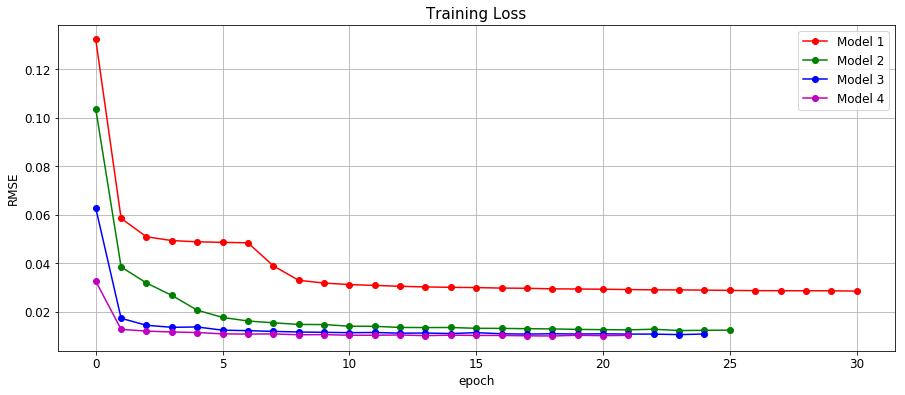

In [232]:
plt.figure(figsize=[15,6])
plt.plot(RMSE_T_1, 'ro-')
plt.plot(RMSE_T_2, 'go-')
plt.plot(RMSE_T_3, 'bo-')
plt.plot(RMSE_T_4, 'mo-')
plt.legend(["Model 1", "Model 2", "Model 3", "Model 4"])
plt.title('Training Loss')
plt.ylabel('RMSE')
plt.xlabel('epoch')
# plt.ylim(0,0.15)
# plt.xlim(-5,25)
plt.grid()
plt.show()

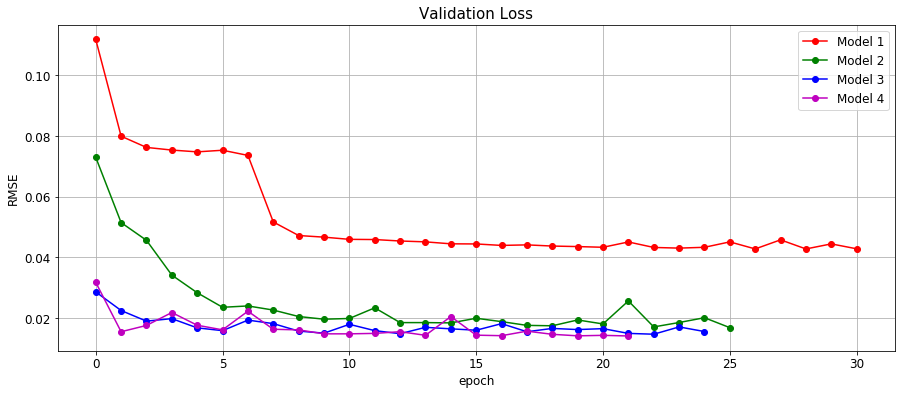

In [233]:
plt.figure(figsize=[15,6])
plt.plot(RMSE_V_1, 'ro-')
plt.plot(RMSE_V_2, 'go-')
plt.plot(RMSE_V_3, 'bo-')
plt.plot(RMSE_V_4, 'mo-')
plt.legend(["Model 1", "Model 2", "Model 3", "Model 4"])
plt.title('Validation Loss')
plt.ylabel('RMSE')
plt.xlabel('epoch')
# plt.ylim(0,0.15)
# plt.xlim(-5,25)
plt.grid()
plt.show()

125631/125631 [==============================] - 1s 11us/sample - loss: 0.1542 - mse: 0.1542
Train on 100504 samples, validate on 25127 samples
Epoch 1/50
100504/100504 [==============================] - 3s 29us/sample - loss: 0.0205 - mse: 0.0205 - val_loss: 0.0310 - val_mse: 0.0310
Epoch 2/50
100504/100504 [==============================] - 3s 27us/sample - loss: 0.0040 - mse: 0.0040 - val_loss: 0.0051 - val_mse: 0.0051
Epoch 3/50
100504/100504 [==============================] - 3s 27us/sample - loss: 0.0014 - mse: 0.0014 - val_loss: 0.0033 - val_mse: 0.0033
Epoch 4/50
100504/100504 [==============================] - 3s 27us/sample - loss: 0.0011 - mse: 0.0011 - val_loss: 0.0029 - val_mse: 0.0029
Epoch 5/50
100504/100504 [==============================] - 3s 28us/sample - loss: 7.6151e-04 - mse: 7.6151e-04 - val_loss: 0.0011 - val_mse: 0.0011
Epoch 6/50
100504/100504 [==============================] - 3s 28us/sample - loss: 3.4093e-04 - mse: 3.4093e-04 - val_loss: 9.9856e-04 - val_ms

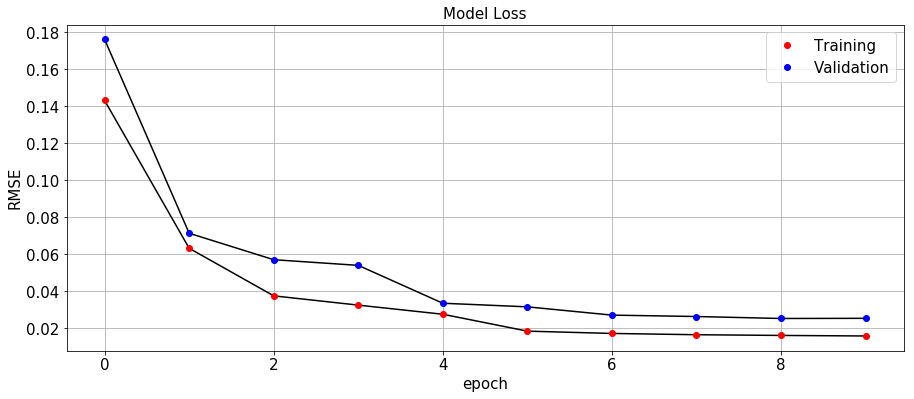

In [44]:
# RMSE_T,RMSE_V = Create_Model(RGB_mun_X, munsell_X, 50, 7, 10, "M_X_7_10.model")

11421/11421 [==============================] - 0s 34us/sample - loss: 0.1230 - mae: 0.3020
Train on 9136 samples, validate on 2285 samples
Epoch 1/50
9136/9136 [==============================] - 1s 93us/sample - loss: 0.0080 - mae: 0.0499 - val_loss: 0.0010 - val_mae: 0.0233
Epoch 2/50
9136/9136 [==============================] - 1s 84us/sample - loss: 7.9623e-04 - mae: 0.0194 - val_loss: 0.0015 - val_mae: 0.0286
Epoch 3/50
9136/9136 [==============================] - 1s 80us/sample - loss: 5.6884e-04 - mae: 0.0162 - val_loss: 0.0014 - val_mae: 0.0274
Epoch 4/50
9136/9136 [==============================] - 1s 78us/sample - loss: 5.0973e-04 - mae: 0.0153 - val_loss: 0.0010 - val_mae: 0.0224
Epoch 5/50
9136/9136 [==============================] - 1s 81us/sample - loss: 5.9021e-04 - mae: 0.0166 - val_loss: 0.0014 - val_mae: 0.0275
Epoch 6/50
9136/9136 [==============================] - 1s 76us/sample - loss: 4.6551e-04 - mae: 0.0146 - val_loss: 0.0011 - val_mae: 0.0240
Epoch 7/50
9136/913

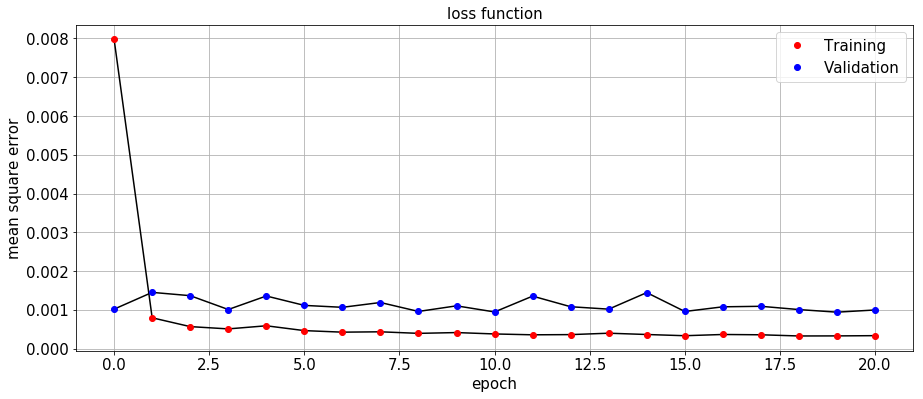

In [137]:
# Create_Model(RGB_mun, munsell_ensemble, 50, 300, 1000, "Munsell_300_1000.model")

125631/125631 [==============================] - 2s 13us/sample - loss: 0.1567 - mae: 0.3632
Train on 100504 samples, validate on 25127 samples
Epoch 1/50
100504/100504 [==============================] - 3s 29us/sample - loss: 0.0029 - mae: 0.0266 - val_loss: 8.7375e-04 - val_mae: 0.0187
Epoch 2/50
100504/100504 [==============================] - 3s 28us/sample - loss: 2.6518e-04 - mae: 0.0099 - val_loss: 5.7418e-04 - val_mae: 0.0152
Epoch 3/50
100504/100504 [==============================] - 3s 28us/sample - loss: 2.0845e-04 - mae: 0.0087 - val_loss: 4.9038e-04 - val_mae: 0.0147
Epoch 4/50
100504/100504 [==============================] - 3s 28us/sample - loss: 1.8788e-04 - mae: 0.0083 - val_loss: 5.1609e-04 - val_mae: 0.0154
Epoch 5/50
100504/100504 [==============================] - 3s 29us/sample - loss: 1.7597e-04 - mae: 0.0079 - val_loss: 4.5074e-04 - val_mae: 0.0143
Epoch 6/50
100504/100504 [==============================] - 3s 29us/sample - loss: 1.6612e-04 - mae: 0.0077 - val_l

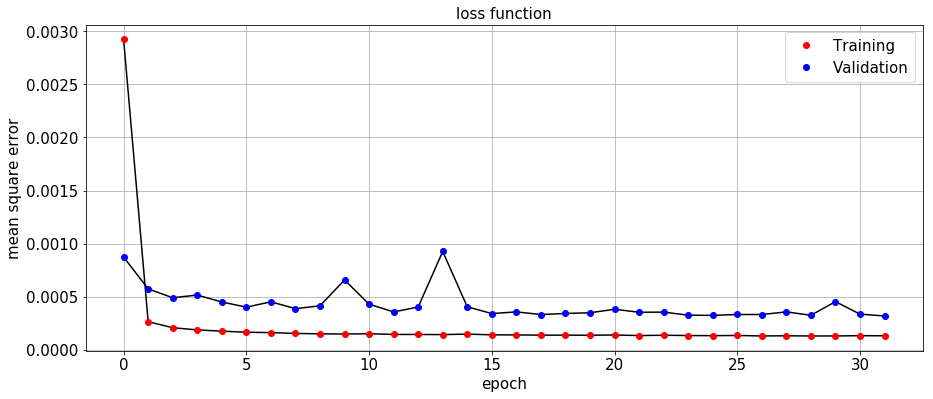

In [145]:
# Create_Model(RGB_mun_X, munsell_X, 50, 30, 100, "XXX.model")

In [152]:
def objects(path = "C:/Users/renep/Google Drive/Research/Codes/New Models"):
    object  = os.listdir(path)
    #names.append()
    return object

MODELS = objects()

def dataset_loader(datatype, imagetype):
    #datatype = "datatype"
    def loadImages(path = "C:/Users/renep/Google Drive/Research/Codes/New Models" +str(datatype)+"/"+ str(datatype)+"/"):

        return[os.path.join(path,f) for f in os.listdir(path) if f.endswith(imagetype)]

    filenames = loadImages()
    images = []
    for file in filenames:
        images.append(plt.imread(file))
        
    return images

In [153]:
MODELS

['Munsell_300_1000.model',
 'M_X_100_30.model',
 'M_X_10_20.model',
 'M_X_300_1000.model',
 'M_X_30_100.model',
 'M_X_3_10.model',
 'M_X_3_3.model']

In [162]:
for model in MODELS:
    RGB2REF = "C:/Users/renep/Google Drive/Research/Codes/New Models/" + str(model)
    print(RGB2REF)
    #RGB = Render_WB(RGB2REF, r,g,b, D65)

C:/Users/renep/Google Drive/Research/Codes/New Models/Munsell_300_1000.model
C:/Users/renep/Google Drive/Research/Codes/New Models/M_X_100_30.model
C:/Users/renep/Google Drive/Research/Codes/New Models/M_X_10_20.model
C:/Users/renep/Google Drive/Research/Codes/New Models/M_X_300_1000.model
C:/Users/renep/Google Drive/Research/Codes/New Models/M_X_30_100.model
C:/Users/renep/Google Drive/Research/Codes/New Models/M_X_3_10.model
C:/Users/renep/Google Drive/Research/Codes/New Models/M_X_3_3.model


In [155]:
for model in MODELS:
    print(model)


Munsell_300_1000.model
M_X_100_30.model
M_X_10_20.model
M_X_300_1000.model
M_X_30_100.model
M_X_3_10.model
M_X_3_3.model


In [156]:
RGB = Render_WB("M_ensemble.model", r,g,b, D65)

OSError: SavedModel file does not exist at: M_ensemble.model/{saved_model.pbtxt|saved_model.pb}

In [ ]:
Create_Model(RGB_mun, munsell_ensemble, 5000, "munsell_5000.model")

In [ ]:
Create_Model(RGB_mac_X, macbeth_X, 5000, "macbeth_X.model")

125631/125631 [==============================] - 4s 30us/sample - loss: 0.1957 - mae: 0.4139
Train on 125631 samples
Epoch 1/50
125631/125631 [==============================] - 10s 83us/sample - loss: 7.0207e-04 - mae: 0.0114
Epoch 2/50
125631/125631 [==============================] - 10s 79us/sample - loss: 1.4114e-04 - mae: 0.0073
Epoch 3/50
125631/125631 [==============================] - 11s 85us/sample - loss: 1.2910e-04 - mae: 0.0069
Epoch 4/50
125631/125631 [==============================] - 11s 84us/sample - loss: 1.2280e-04 - mae: 0.0066
Epoch 5/50
125631/125631 [==============================] - 10s 78us/sample - loss: 1.2097e-04 - mae: 0.0065
Epoch 6/50
125631/125631 [==============================] - 9s 73us/sample - loss: 1.1693e-04 - mae: 0.0064
Epoch 7/50
125631/125631 [==============================] - 10s 82us/sample - loss: 1.1398e-04 - mae: 0.0063
Epoch 8/50
125631/125631 [==============================] - 10s 76us/sample - loss: 1.1205e-04 - mae: 0.0062
Epoch 9/50
1

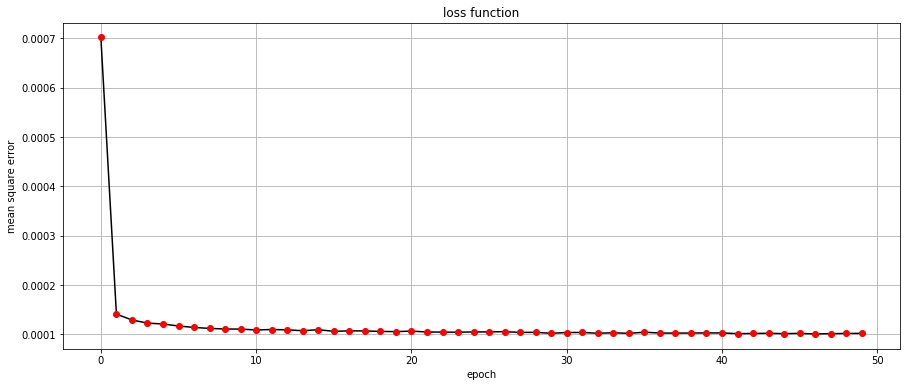

In [120]:
history_mun_X = Create_Model(RGB_mun_X, munsell_X, 50, "munsell_X.model")

2376/2376 [==============================] - 0s 46us/sample - loss: 0.1957 - mae: 0.3969
Train on 2376 samples
Epoch 1/10000
2376/2376 [==============================] - 0s 105us/sample - loss: 0.0208 - mae: 0.0909
Epoch 2/10000
2376/2376 [==============================] - 0s 77us/sample - loss: 0.0057 - mae: 0.0434
Epoch 3/10000
2376/2376 [==============================] - 0s 68us/sample - loss: 0.0027 - mae: 0.0280
Epoch 4/10000
2376/2376 [==============================] - 0s 67us/sample - loss: 0.0013 - mae: 0.0200
Epoch 5/10000
2376/2376 [==============================] - 0s 68us/sample - loss: 6.2740e-04 - mae: 0.0166
Epoch 6/10000
2376/2376 [==============================] - 0s 72us/sample - loss: 4.2980e-04 - mae: 0.0139
Epoch 7/10000
2376/2376 [==============================] - 0s 69us/sample - loss: 3.5433e-04 - mae: 0.0125
Epoch 8/10000
2376/2376 [==============================] - 0s 69us/sample - loss: 3.6642e-04 - mae: 0.0126
Epoch 9/10000
2376/2376 [=======================

2376/2376 [==============================] - 0s 73us/sample - loss: 1.4745e-04 - mae: 0.0078
Epoch 77/10000
2376/2376 [==============================] - 0s 68us/sample - loss: 1.7970e-04 - mae: 0.0085
Epoch 78/10000
2376/2376 [==============================] - 0s 65us/sample - loss: 1.4460e-04 - mae: 0.0076
Epoch 79/10000
2376/2376 [==============================] - 0s 65us/sample - loss: 1.3062e-04 - mae: 0.0073
Epoch 80/10000
2376/2376 [==============================] - 0s 67us/sample - loss: 1.1068e-04 - mae: 0.0065
Epoch 81/10000
2376/2376 [==============================] - 0s 81us/sample - loss: 1.2846e-04 - mae: 0.0073
Epoch 82/10000
2376/2376 [==============================] - 0s 78us/sample - loss: 1.4759e-04 - mae: 0.0078
Epoch 83/10000
2376/2376 [==============================] - 0s 85us/sample - loss: 1.2556e-04 - mae: 0.0071
Epoch 84/10000
2376/2376 [==============================] - 0s 79us/sample - loss: 1.1763e-04 - mae: 0.0068
Epoch 85/10000
2376/2376 [=================

2376/2376 [==============================] - ETA: 0s - loss: 1.0060e-04 - mae: 0.0062- ETA: 0s - loss: 1.0326e-04 - mae: 0.00 - 0s 71us/sample - loss: 9.8646e-05 - mae: 0.0061
Epoch 227/10000
2376/2376 [==============================] - 0s 68us/sample - loss: 7.0716e-05 - mae: 0.0051
Epoch 228/10000
2376/2376 [==============================] - 0s 71us/sample - loss: 6.9410e-05 - mae: 0.0050
Epoch 229/10000
2376/2376 [==============================] - 0s 68us/sample - loss: 5.8956e-05 - mae: 0.0045
Epoch 230/10000
2376/2376 [==============================] - 0s 71us/sample - loss: 6.1066e-05 - mae: 0.0046
Epoch 231/10000
2376/2376 [==============================] - 0s 69us/sample - loss: 5.6208e-05 - mae: 0.0043
Epoch 232/10000
2376/2376 [==============================] - 0s 66us/sample - loss: 5.4515e-05 - mae: 0.0043
Epoch 233/10000
2376/2376 [==============================] - 0s 64us/sample - loss: 8.1095e-05 - mae: 0.0053
Epoch 234/10000
2376/2376 [==============================] - 

2376/2376 [==============================] - 0s 70us/sample - loss: 3.7867e-05 - mae: 0.0035
Epoch 376/10000
2376/2376 [==============================] - 0s 65us/sample - loss: 3.3756e-05 - mae: 0.0033
Epoch 377/10000
2376/2376 [==============================] - 0s 64us/sample - loss: 4.0442e-05 - mae: 0.0038
Epoch 378/10000
2376/2376 [==============================] - 0s 73us/sample - loss: 3.6775e-05 - mae: 0.0035
Epoch 379/10000
2376/2376 [==============================] - 0s 65us/sample - loss: 4.2578e-05 - mae: 0.0039
Epoch 380/10000
2376/2376 [==============================] - 0s 64us/sample - loss: 3.9969e-05 - mae: 0.0037
Epoch 381/10000
2376/2376 [==============================] - 0s 64us/sample - loss: 3.8391e-05 - mae: 0.0036
Epoch 382/10000
2376/2376 [==============================] - 0s 68us/sample - loss: 3.7572e-05 - mae: 0.0035
Epoch 383/10000
2376/2376 [==============================] - 0s 66us/sample - loss: 5.4235e-05 - mae: 0.0045
Epoch 384/10000
2376/2376 [========

2376/2376 [==============================] - 0s 80us/sample - loss: 5.3824e-05 - mae: 0.0044
Epoch 524/10000
2376/2376 [==============================] - 0s 67us/sample - loss: 3.8147e-05 - mae: 0.0036
Epoch 525/10000
2376/2376 [==============================] - 0s 66us/sample - loss: 3.6813e-05 - mae: 0.0035
Epoch 526/10000
2376/2376 [==============================] - 0s 65us/sample - loss: 2.6436e-05 - mae: 0.0030
Epoch 527/10000
2376/2376 [==============================] - 0s 71us/sample - loss: 3.0108e-05 - mae: 0.0033
Epoch 528/10000
2376/2376 [==============================] - 0s 67us/sample - loss: 3.6137e-05 - mae: 0.0036
Epoch 529/10000
2376/2376 [==============================] - 0s 72us/sample - loss: 3.0679e-05 - mae: 0.0032
Epoch 530/10000
2376/2376 [==============================] - 0s 68us/sample - loss: 5.2495e-05 - mae: 0.0045
Epoch 531/10000
2376/2376 [==============================] - 0s 68us/sample - loss: 4.6877e-05 - mae: 0.0040
Epoch 532/10000
2376/2376 [========

2376/2376 [==============================] - 0s 69us/sample - loss: 2.9951e-05 - mae: 0.0032
Epoch 674/10000
2376/2376 [==============================] - 0s 66us/sample - loss: 2.3470e-05 - mae: 0.0029
Epoch 675/10000
2376/2376 [==============================] - 0s 71us/sample - loss: 3.7126e-05 - mae: 0.0033
Epoch 676/10000
2376/2376 [==============================] - 0s 71us/sample - loss: 3.7692e-05 - mae: 0.0036
Epoch 677/10000
2376/2376 [==============================] - 0s 68us/sample - loss: 2.8750e-05 - mae: 0.0033
Epoch 678/10000
2376/2376 [==============================] - 0s 73us/sample - loss: 2.6044e-05 - mae: 0.0029
Epoch 679/10000
2376/2376 [==============================] - 0s 68us/sample - loss: 2.2086e-05 - mae: 0.0027
Epoch 680/10000
2376/2376 [==============================] - 0s 67us/sample - loss: 2.4805e-05 - mae: 0.0029
Epoch 681/10000
2376/2376 [==============================] - 0s 68us/sample - loss: 7.1020e-05 - mae: 0.0049
Epoch 682/10000
2376/2376 [========

2376/2376 [==============================] - 0s 72us/sample - loss: 4.8754e-05 - mae: 0.0040
Epoch 749/10000
2376/2376 [==============================] - 0s 67us/sample - loss: 2.2778e-05 - mae: 0.0027
Epoch 750/10000
2376/2376 [==============================] - 0s 68us/sample - loss: 7.1968e-05 - mae: 0.0050
Epoch 751/10000
2376/2376 [==============================] - 0s 68us/sample - loss: 3.3405e-05 - mae: 0.0034
Epoch 752/10000
2376/2376 [==============================] - 0s 66us/sample - loss: 2.7493e-05 - mae: 0.0032
Epoch 753/10000
2376/2376 [==============================] - 0s 68us/sample - loss: 1.9540e-05 - mae: 0.0026
Epoch 754/10000
2376/2376 [==============================] - 0s 72us/sample - loss: 2.0639e-05 - mae: 0.0027
Epoch 755/10000
2376/2376 [==============================] - 0s 67us/sample - loss: 3.2650e-05 - mae: 0.0034
Epoch 756/10000
2376/2376 [==============================] - 0s 68us/sample - loss: 4.6488e-05 - mae: 0.0040
Epoch 757/10000
2376/2376 [========

2376/2376 [==============================] - 0s 71us/sample - loss: 1.6559e-05 - mae: 0.0023
Epoch 899/10000
2376/2376 [==============================] - 0s 68us/sample - loss: 1.8846e-05 - mae: 0.0025
Epoch 900/10000
2376/2376 [==============================] - 0s 65us/sample - loss: 2.6491e-05 - mae: 0.0031
Epoch 901/10000
2376/2376 [==============================] - 0s 64us/sample - loss: 2.6367e-05 - mae: 0.0028
Epoch 902/10000
2376/2376 [==============================] - 0s 65us/sample - loss: 1.9863e-05 - mae: 0.0026
Epoch 903/10000
2376/2376 [==============================] - 0s 67us/sample - loss: 2.0962e-05 - mae: 0.0026
Epoch 904/10000
2376/2376 [==============================] - 0s 65us/sample - loss: 1.6691e-05 - mae: 0.0024
Epoch 905/10000
2376/2376 [==============================] - 0s 69us/sample - loss: 1.7758e-05 - mae: 0.0024
Epoch 906/10000
2376/2376 [==============================] - 0s 73us/sample - loss: 2.9575e-05 - mae: 0.0031
Epoch 907/10000
2376/2376 [========

2376/2376 [==============================] - 0s 71us/sample - loss: 2.7724e-05 - mae: 0.0030
Epoch 1047/10000
2376/2376 [==============================] - 0s 68us/sample - loss: 1.7512e-05 - mae: 0.0024
Epoch 1048/10000
2376/2376 [==============================] - 0s 65us/sample - loss: 2.0711e-05 - mae: 0.0028
Epoch 1049/10000
2376/2376 [==============================] - 0s 64us/sample - loss: 2.5995e-05 - mae: 0.0030
Epoch 1050/10000
2376/2376 [==============================] - 0s 65us/sample - loss: 1.6998e-05 - mae: 0.0024
Epoch 1051/10000
2376/2376 [==============================] - 0s 67us/sample - loss: 5.8281e-05 - mae: 0.0046
Epoch 1052/10000
2376/2376 [==============================] - 0s 65us/sample - loss: 5.9204e-05 - mae: 0.0045
Epoch 1053/10000
2376/2376 [==============================] - 0s 65us/sample - loss: 3.1059e-05 - mae: 0.0033
Epoch 1054/10000
2376/2376 [==============================] - 0s 63us/sample - loss: 3.5693e-05 - mae: 0.0035
Epoch 1055/10000
2376/2376 

2376/2376 [==============================] - 0s 68us/sample - loss: 5.2736e-05 - mae: 0.0043
Epoch 1195/10000
2376/2376 [==============================] - 0s 70us/sample - loss: 2.2759e-05 - mae: 0.0028
Epoch 1196/10000
2376/2376 [==============================] - 0s 65us/sample - loss: 1.7415e-05 - mae: 0.0024
Epoch 1197/10000
2376/2376 [==============================] - 0s 67us/sample - loss: 1.5424e-05 - mae: 0.0022
Epoch 1198/10000
2376/2376 [==============================] - 0s 70us/sample - loss: 2.6080e-05 - mae: 0.0030
Epoch 1199/10000
2376/2376 [==============================] - 0s 71us/sample - loss: 5.5222e-05 - mae: 0.0043
Epoch 1200/10000
2376/2376 [==============================] - 0s 70us/sample - loss: 2.4582e-05 - mae: 0.0029
Epoch 1201/10000
2376/2376 [==============================] - 0s 68us/sample - loss: 1.4852e-05 - mae: 0.0022
Epoch 1202/10000
2376/2376 [==============================] - 0s 65us/sample - loss: 1.4730e-05 - mae: 0.0021
Epoch 1203/10000
2376/2376 

2376/2376 [==============================] - 0s 74us/sample - loss: 1.9161e-05 - mae: 0.0024
Epoch 1343/10000
2376/2376 [==============================] - 0s 65us/sample - loss: 1.4086e-05 - mae: 0.0022
Epoch 1344/10000
2376/2376 [==============================] - 0s 73us/sample - loss: 1.1489e-05 - mae: 0.0019
Epoch 1345/10000
2376/2376 [==============================] - 0s 70us/sample - loss: 2.1892e-05 - mae: 0.0027
Epoch 1346/10000
2376/2376 [==============================] - 0s 69us/sample - loss: 3.1042e-05 - mae: 0.0032
Epoch 1347/10000
2376/2376 [==============================] - 0s 70us/sample - loss: 2.8111e-05 - mae: 0.0030
Epoch 1348/10000
2376/2376 [==============================] - 0s 77us/sample - loss: 1.5783e-05 - mae: 0.0024
Epoch 1349/10000
2376/2376 [==============================] - 0s 68us/sample - loss: 3.4805e-05 - mae: 0.0035
Epoch 1350/10000
2376/2376 [==============================] - 0s 68us/sample - loss: 2.4983e-05 - mae: 0.0029
Epoch 1351/10000
2376/2376 

2376/2376 [==============================] - 0s 77us/sample - loss: 1.3703e-05 - mae: 0.0023
Epoch 1491/10000
2376/2376 [==============================] - 0s 73us/sample - loss: 4.3742e-05 - mae: 0.0039
Epoch 1492/10000
2376/2376 [==============================] - 0s 68us/sample - loss: 1.7117e-05 - mae: 0.0022
Epoch 1493/10000
2376/2376 [==============================] - 0s 68us/sample - loss: 1.5263e-05 - mae: 0.0022
Epoch 1494/10000
2376/2376 [==============================] - 0s 66us/sample - loss: 1.2479e-05 - mae: 0.0020
Epoch 1495/10000
2376/2376 [==============================] - 0s 71us/sample - loss: 1.5325e-05 - mae: 0.0022
Epoch 1496/10000
2376/2376 [==============================] - 0s 65us/sample - loss: 1.3222e-05 - mae: 0.0020
Epoch 1497/10000
2376/2376 [==============================] - 0s 64us/sample - loss: 1.2352e-05 - mae: 0.0020
Epoch 1498/10000
2376/2376 [==============================] - 0s 66us/sample - loss: 1.1935e-05 - mae: 0.0020
Epoch 1499/10000
2376/2376 

2376/2376 [==============================] - 0s 71us/sample - loss: 1.4320e-05 - mae: 0.0023
Epoch 1639/10000
2376/2376 [==============================] - 0s 71us/sample - loss: 4.8684e-05 - mae: 0.0040
Epoch 1640/10000
2376/2376 [==============================] - 0s 65us/sample - loss: 2.0399e-05 - mae: 0.0026
Epoch 1641/10000
2376/2376 [==============================] - 0s 64us/sample - loss: 1.7198e-05 - mae: 0.0024
Epoch 1642/10000
2376/2376 [==============================] - 0s 64us/sample - loss: 1.6361e-05 - mae: 0.0024
Epoch 1643/10000
2376/2376 [==============================] - 0s 68us/sample - loss: 2.0399e-05 - mae: 0.0025
Epoch 1644/10000
2376/2376 [==============================] - 0s 64us/sample - loss: 1.4848e-05 - mae: 0.0023
Epoch 1645/10000
2376/2376 [==============================] - 0s 66us/sample - loss: 1.3846e-05 - mae: 0.0023
Epoch 1646/10000
2376/2376 [==============================] - 0s 64us/sample - loss: 9.2595e-06 - mae: 0.0018
Epoch 1647/10000
2376/2376 

2376/2376 [==============================] - 0s 68us/sample - loss: 1.0649e-05 - mae: 0.0020
Epoch 1787/10000
2376/2376 [==============================] - 0s 68us/sample - loss: 2.0956e-05 - mae: 0.0026
Epoch 1788/10000
2376/2376 [==============================] - 0s 68us/sample - loss: 1.2045e-05 - mae: 0.0020
Epoch 1789/10000
2376/2376 [==============================] - 0s 65us/sample - loss: 1.4508e-05 - mae: 0.0021
Epoch 1790/10000
2376/2376 [==============================] - 0s 66us/sample - loss: 2.7019e-05 - mae: 0.0028
Epoch 1791/10000
2376/2376 [==============================] - 0s 66us/sample - loss: 2.8111e-05 - mae: 0.0031
Epoch 1792/10000
2376/2376 [==============================] - 0s 65us/sample - loss: 1.6355e-05 - mae: 0.0024
Epoch 1793/10000
2376/2376 [==============================] - 0s 68us/sample - loss: 6.9412e-05 - mae: 0.0050
Epoch 1794/10000
2376/2376 [==============================] - 0s 69us/sample - loss: 2.0298e-05 - mae: 0.0026
Epoch 1795/10000
2376/2376 

2376/2376 [==============================] - 0s 67us/sample - loss: 7.4697e-06 - mae: 0.0016
Epoch 1935/10000
2376/2376 [==============================] - 0s 65us/sample - loss: 1.5858e-05 - mae: 0.0021
Epoch 1936/10000
2376/2376 [==============================] - 0s 66us/sample - loss: 1.1058e-05 - mae: 0.0019
Epoch 1937/10000
2376/2376 [==============================] - 0s 66us/sample - loss: 1.1504e-05 - mae: 0.0019
Epoch 1938/10000
2376/2376 [==============================] - 0s 68us/sample - loss: 1.2058e-05 - mae: 0.0021
Epoch 1939/10000
2376/2376 [==============================] - 0s 68us/sample - loss: 1.1913e-05 - mae: 0.0021
Epoch 1940/10000
2376/2376 [==============================] - 0s 65us/sample - loss: 1.9747e-05 - mae: 0.0022
Epoch 1941/10000
2376/2376 [==============================] - 0s 68us/sample - loss: 1.0742e-05 - mae: 0.0018
Epoch 1942/10000
2376/2376 [==============================] - 0s 65us/sample - loss: 1.6222e-05 - mae: 0.0022
Epoch 1943/10000
2376/2376 

2376/2376 [==============================] - 0s 68us/sample - loss: 1.1086e-05 - mae: 0.0020
Epoch 2083/10000
2376/2376 [==============================] - 0s 65us/sample - loss: 8.5705e-06 - mae: 0.0017
Epoch 2084/10000
2376/2376 [==============================] - 0s 65us/sample - loss: 8.1082e-06 - mae: 0.0016
Epoch 2085/10000
2376/2376 [==============================] - 0s 65us/sample - loss: 3.2999e-05 - mae: 0.0032
Epoch 2086/10000
2376/2376 [==============================] - 0s 64us/sample - loss: 3.2945e-05 - mae: 0.0031
Epoch 2087/10000
2376/2376 [==============================] - 0s 63us/sample - loss: 1.1249e-05 - mae: 0.0019
Epoch 2088/10000
2376/2376 [==============================] - 0s 65us/sample - loss: 1.3283e-05 - mae: 0.0021
Epoch 2089/10000
2376/2376 [==============================] - 0s 67us/sample - loss: 7.7278e-06 - mae: 0.0016
Epoch 2090/10000
2376/2376 [==============================] - 0s 69us/sample - loss: 9.5714e-06 - mae: 0.0018
Epoch 2091/10000
2376/2376 

2376/2376 [==============================] - 0s 74us/sample - loss: 1.9901e-05 - mae: 0.0026
Epoch 2231/10000
2376/2376 [==============================] - 0s 68us/sample - loss: 1.2354e-05 - mae: 0.0020
Epoch 2232/10000
2376/2376 [==============================] - 0s 74us/sample - loss: 1.3513e-05 - mae: 0.0022
Epoch 2233/10000
2376/2376 [==============================] - 0s 65us/sample - loss: 1.3027e-05 - mae: 0.0020
Epoch 2234/10000
2376/2376 [==============================] - 0s 67us/sample - loss: 1.5149e-05 - mae: 0.0021
Epoch 2235/10000
2376/2376 [==============================] - 0s 68us/sample - loss: 1.5827e-05 - mae: 0.0021
Epoch 2236/10000
2376/2376 [==============================] - 0s 67us/sample - loss: 1.0404e-05 - mae: 0.0018
Epoch 2237/10000
2376/2376 [==============================] - 0s 69us/sample - loss: 9.7332e-06 - mae: 0.0017
Epoch 2238/10000
2376/2376 [==============================] - 0s 65us/sample - loss: 1.5162e-05 - mae: 0.0022
Epoch 2239/10000
2376/2376 

2376/2376 [==============================] - 0s 68us/sample - loss: 6.8080e-06 - mae: 0.0016
Epoch 2379/10000
2376/2376 [==============================] - 0s 68us/sample - loss: 1.4246e-05 - mae: 0.0022
Epoch 2380/10000
2376/2376 [==============================] - 0s 76us/sample - loss: 1.1179e-05 - mae: 0.0021
Epoch 2381/10000
2376/2376 [==============================] - 0s 66us/sample - loss: 7.1914e-06 - mae: 0.0016
Epoch 2382/10000
2376/2376 [==============================] - 0s 64us/sample - loss: 1.4005e-05 - mae: 0.0019
Epoch 2383/10000
2376/2376 [==============================] - 0s 65us/sample - loss: 1.4508e-05 - mae: 0.0022
Epoch 2384/10000
2376/2376 [==============================] - 0s 65us/sample - loss: 2.1297e-05 - mae: 0.0026
Epoch 2385/10000
2376/2376 [==============================] - 0s 66us/sample - loss: 3.9863e-05 - mae: 0.0036
Epoch 2386/10000
2376/2376 [==============================] - 0s 65us/sample - loss: 1.5165e-05 - mae: 0.0023
Epoch 2387/10000
2376/2376 

2376/2376 [==============================] - 0s 78us/sample - loss: 2.9927e-05 - mae: 0.0030
Epoch 2527/10000
2376/2376 [==============================] - 0s 65us/sample - loss: 3.1890e-05 - mae: 0.0031
Epoch 2528/10000
2376/2376 [==============================] - 0s 63us/sample - loss: 1.0082e-05 - mae: 0.0018
Epoch 2529/10000
2376/2376 [==============================] - 0s 74us/sample - loss: 7.5047e-06 - mae: 0.0016
Epoch 2530/10000
2376/2376 [==============================] - 0s 66us/sample - loss: 6.2861e-06 - mae: 0.0015
Epoch 2531/10000
2376/2376 [==============================] - 0s 65us/sample - loss: 6.5252e-06 - mae: 0.0015
Epoch 2532/10000
2376/2376 [==============================] - 0s 65us/sample - loss: 6.3539e-06 - mae: 0.0015
Epoch 2533/10000
2376/2376 [==============================] - 0s 66us/sample - loss: 7.4173e-06 - mae: 0.0016
Epoch 2534/10000
2376/2376 [==============================] - 0s 65us/sample - loss: 7.7774e-06 - mae: 0.0017
Epoch 2535/10000
2376/2376 

2376/2376 [==============================] - 0s 73us/sample - loss: 9.2046e-06 - mae: 0.0019
Epoch 2675/10000
2376/2376 [==============================] - 0s 68us/sample - loss: 7.2476e-06 - mae: 0.0016
Epoch 2676/10000
2376/2376 [==============================] - 0s 69us/sample - loss: 1.4596e-05 - mae: 0.0021
Epoch 2677/10000
2376/2376 [==============================] - 0s 64us/sample - loss: 1.4340e-05 - mae: 0.0021
Epoch 2678/10000
2376/2376 [==============================] - 0s 64us/sample - loss: 3.8646e-05 - mae: 0.0036
Epoch 2679/10000
2376/2376 [==============================] - 0s 68us/sample - loss: 4.1382e-05 - mae: 0.0038
Epoch 2680/10000
2376/2376 [==============================] - 0s 69us/sample - loss: 2.1204e-05 - mae: 0.0024
Epoch 2681/10000
2376/2376 [==============================] - 0s 70us/sample - loss: 1.0051e-05 - mae: 0.0018
Epoch 2682/10000
2376/2376 [==============================] - 0s 65us/sample - loss: 2.7564e-05 - mae: 0.0028
Epoch 2683/10000
2376/2376 

2376/2376 [==============================] - 0s 71us/sample - loss: 1.5071e-05 - mae: 0.0023
Epoch 2823/10000
2376/2376 [==============================] - 0s 64us/sample - loss: 8.0442e-06 - mae: 0.0016
Epoch 2824/10000
2376/2376 [==============================] - 0s 65us/sample - loss: 1.7891e-05 - mae: 0.0025
Epoch 2825/10000
2376/2376 [==============================] - 0s 65us/sample - loss: 5.9242e-06 - mae: 0.0014
Epoch 2826/10000
2376/2376 [==============================] - 0s 66us/sample - loss: 1.3851e-05 - mae: 0.0022
Epoch 2827/10000
2376/2376 [==============================] - 0s 67us/sample - loss: 1.3465e-05 - mae: 0.0021
Epoch 2828/10000
2376/2376 [==============================] - 0s 70us/sample - loss: 2.6492e-05 - mae: 0.0028
Epoch 2829/10000
2376/2376 [==============================] - 0s 65us/sample - loss: 1.9751e-05 - mae: 0.0027
Epoch 2830/10000
2376/2376 [==============================] - 0s 66us/sample - loss: 9.7831e-06 - mae: 0.0018
Epoch 2831/10000
2376/2376 

2376/2376 [==============================] - 0s 68us/sample - loss: 1.1556e-05 - mae: 0.0020
Epoch 2971/10000
2376/2376 [==============================] - 0s 65us/sample - loss: 7.1815e-06 - mae: 0.0016
Epoch 2972/10000
2376/2376 [==============================] - 0s 72us/sample - loss: 7.2091e-06 - mae: 0.0016
Epoch 2973/10000
2376/2376 [==============================] - 0s 67us/sample - loss: 6.2421e-06 - mae: 0.0015
Epoch 2974/10000
2376/2376 [==============================] - 0s 65us/sample - loss: 8.1573e-06 - mae: 0.0017
Epoch 2975/10000
2376/2376 [==============================] - 0s 71us/sample - loss: 5.6093e-06 - mae: 0.0014
Epoch 2976/10000
2376/2376 [==============================] - 0s 65us/sample - loss: 6.8540e-06 - mae: 0.0015
Epoch 2977/10000
2376/2376 [==============================] - 0s 72us/sample - loss: 5.4327e-06 - mae: 0.0014
Epoch 2978/10000
2376/2376 [==============================] - 0s 67us/sample - loss: 8.3016e-06 - mae: 0.0016
Epoch 2979/10000
2376/2376 

2376/2376 [==============================] - 0s 79us/sample - loss: 3.3845e-05 - mae: 0.0036
Epoch 3119/10000
2376/2376 [==============================] - 0s 67us/sample - loss: 2.9465e-05 - mae: 0.0032
Epoch 3120/10000
2376/2376 [==============================] - 0s 65us/sample - loss: 2.6983e-05 - mae: 0.0030
Epoch 3121/10000
2376/2376 [==============================] - 0s 65us/sample - loss: 8.9299e-06 - mae: 0.0018
Epoch 3122/10000
2376/2376 [==============================] - 0s 64us/sample - loss: 4.9544e-06 - mae: 0.0013
Epoch 3123/10000
2376/2376 [==============================] - 0s 76us/sample - loss: 5.2094e-06 - mae: 0.0013
Epoch 3124/10000
2376/2376 [==============================] - 0s 67us/sample - loss: 5.5704e-06 - mae: 0.0014
Epoch 3125/10000
2376/2376 [==============================] - 0s 65us/sample - loss: 4.9996e-06 - mae: 0.0013
Epoch 3126/10000
2376/2376 [==============================] - 0s 64us/sample - loss: 5.2996e-06 - mae: 0.0013
Epoch 3127/10000
2376/2376 

2376/2376 [==============================] - 0s 68us/sample - loss: 7.9119e-06 - mae: 0.0015
Epoch 3267/10000
2376/2376 [==============================] - 0s 68us/sample - loss: 7.6717e-06 - mae: 0.0016
Epoch 3268/10000
2376/2376 [==============================] - 0s 72us/sample - loss: 6.0646e-06 - mae: 0.0014
Epoch 3269/10000
2376/2376 [==============================] - 0s 72us/sample - loss: 7.7787e-06 - mae: 0.0015
Epoch 3270/10000
2376/2376 [==============================] - 0s 72us/sample - loss: 1.2359e-05 - mae: 0.0020
Epoch 3271/10000
2376/2376 [==============================] - 0s 72us/sample - loss: 3.0510e-05 - mae: 0.0030
Epoch 3272/10000
2376/2376 [==============================] - 0s 76us/sample - loss: 1.6804e-05 - mae: 0.0024
Epoch 3273/10000
2376/2376 [==============================] - 0s 73us/sample - loss: 1.0958e-05 - mae: 0.0019
Epoch 3274/10000
2376/2376 [==============================] - 0s 73us/sample - loss: 8.1147e-06 - mae: 0.0017
Epoch 3275/10000
2376/2376 

Epoch 3340/10000
2376/2376 [==============================] - 0s 69us/sample - loss: 1.3108e-05 - mae: 0.0021
Epoch 3341/10000
2376/2376 [==============================] - 0s 66us/sample - loss: 6.4510e-06 - mae: 0.0015
Epoch 3342/10000
2376/2376 [==============================] - 0s 67us/sample - loss: 5.7035e-06 - mae: 0.0014
Epoch 3343/10000
2376/2376 [==============================] - 0s 65us/sample - loss: 5.9646e-06 - mae: 0.0014
Epoch 3344/10000
2376/2376 [==============================] - 0s 65us/sample - loss: 1.1441e-05 - mae: 0.0020
Epoch 3345/10000
2376/2376 [==============================] - 0s 67us/sample - loss: 2.2507e-05 - mae: 0.0022
Epoch 3346/10000
2376/2376 [==============================] - 0s 68us/sample - loss: 2.5371e-05 - mae: 0.0027
Epoch 3347/10000
2376/2376 [==============================] - 0s 65us/sample - loss: 1.1908e-05 - mae: 0.0020
Epoch 3348/10000
2376/2376 [==============================] - 0s 70us/sample - loss: 7.3165e-06 - mae: 0.0016
Epoch 3349

2376/2376 [==============================] - 0s 70us/sample - loss: 7.1107e-06 - mae: 0.0016
Epoch 3489/10000
2376/2376 [==============================] - 0s 64us/sample - loss: 5.4273e-06 - mae: 0.0014
Epoch 3490/10000
2376/2376 [==============================] - 0s 64us/sample - loss: 1.0847e-05 - mae: 0.0019
Epoch 3491/10000
2376/2376 [==============================] - 0s 70us/sample - loss: 8.1566e-06 - mae: 0.0017
Epoch 3492/10000
2376/2376 [==============================] - 0s 65us/sample - loss: 2.3069e-05 - mae: 0.0027
Epoch 3493/10000
2376/2376 [==============================] - 0s 65us/sample - loss: 9.5753e-06 - mae: 0.0019
Epoch 3494/10000
2376/2376 [==============================] - 0s 66us/sample - loss: 7.1601e-06 - mae: 0.0016
Epoch 3495/10000
2376/2376 [==============================] - 0s 68us/sample - loss: 1.0288e-05 - mae: 0.0019
Epoch 3496/10000
2376/2376 [==============================] - 0s 66us/sample - loss: 9.0342e-06 - mae: 0.0018
Epoch 3497/10000
2376/2376 

2376/2376 [==============================] - 0s 69us/sample - loss: 1.0326e-05 - mae: 0.0019
Epoch 3637/10000
2376/2376 [==============================] - 0s 66us/sample - loss: 1.1658e-05 - mae: 0.0020
Epoch 3638/10000
2376/2376 [==============================] - 0s 67us/sample - loss: 6.5194e-06 - mae: 0.0015
Epoch 3639/10000
2376/2376 [==============================] - 0s 73us/sample - loss: 8.7698e-06 - mae: 0.0018
Epoch 3640/10000
2376/2376 [==============================] - 0s 67us/sample - loss: 6.0295e-06 - mae: 0.0014
Epoch 3641/10000
2376/2376 [==============================] - 0s 68us/sample - loss: 7.5173e-06 - mae: 0.0016
Epoch 3642/10000
2376/2376 [==============================] - 0s 67us/sample - loss: 5.2204e-06 - mae: 0.0013
Epoch 3643/10000
2376/2376 [==============================] - 0s 66us/sample - loss: 4.7011e-06 - mae: 0.0013
Epoch 3644/10000
2376/2376 [==============================] - 0s 70us/sample - loss: 4.9263e-06 - mae: 0.0013
Epoch 3645/10000
2376/2376 

2376/2376 [==============================] - 0s 71us/sample - loss: 6.2522e-06 - mae: 0.0014
Epoch 3785/10000
2376/2376 [==============================] - 0s 65us/sample - loss: 7.4236e-06 - mae: 0.0015
Epoch 3786/10000
2376/2376 [==============================] - 0s 66us/sample - loss: 8.8158e-06 - mae: 0.0017
Epoch 3787/10000
2376/2376 [==============================] - 0s 67us/sample - loss: 7.3350e-06 - mae: 0.0016
Epoch 3788/10000
2376/2376 [==============================] - 0s 69us/sample - loss: 7.9223e-06 - mae: 0.0015
Epoch 3789/10000
2376/2376 [==============================] - 0s 69us/sample - loss: 1.0945e-05 - mae: 0.0017
Epoch 3790/10000
2376/2376 [==============================] - 0s 65us/sample - loss: 9.2958e-06 - mae: 0.0018
Epoch 3791/10000
2376/2376 [==============================] - 0s 65us/sample - loss: 7.1717e-06 - mae: 0.0015
Epoch 3792/10000
2376/2376 [==============================] - 0s 81us/sample - loss: 8.3610e-06 - mae: 0.0017
Epoch 3793/10000
2376/2376 

2376/2376 [==============================] - 0s 70us/sample - loss: 8.2333e-06 - mae: 0.0016
Epoch 3933/10000
2376/2376 [==============================] - 0s 68us/sample - loss: 1.0280e-05 - mae: 0.0018
Epoch 3934/10000
2376/2376 [==============================] - 0s 66us/sample - loss: 5.6791e-06 - mae: 0.0013
Epoch 3935/10000
2376/2376 [==============================] - 0s 65us/sample - loss: 6.9448e-06 - mae: 0.0016
Epoch 3936/10000
2376/2376 [==============================] - 0s 65us/sample - loss: 8.0949e-06 - mae: 0.0016
Epoch 3937/10000
2376/2376 [==============================] - 0s 67us/sample - loss: 1.7866e-05 - mae: 0.0025
Epoch 3938/10000
2376/2376 [==============================] - 0s 65us/sample - loss: 9.9529e-06 - mae: 0.0019
Epoch 3939/10000
2376/2376 [==============================] - 0s 68us/sample - loss: 8.3529e-06 - mae: 0.0016
Epoch 3940/10000
2376/2376 [==============================] - 0s 67us/sample - loss: 2.4626e-05 - mae: 0.0023
Epoch 3941/10000
2376/2376 

2376/2376 [==============================] - 0s 66us/sample - loss: 6.5791e-06 - mae: 0.0015
Epoch 4081/10000
2376/2376 [==============================] - 0s 64us/sample - loss: 6.0932e-06 - mae: 0.0014
Epoch 4082/10000
2376/2376 [==============================] - 0s 69us/sample - loss: 1.5031e-05 - mae: 0.0024
Epoch 4083/10000
2376/2376 [==============================] - 0s 65us/sample - loss: 7.0948e-06 - mae: 0.0016
Epoch 4084/10000
2376/2376 [==============================] - 0s 72us/sample - loss: 2.0003e-05 - mae: 0.0026
Epoch 4085/10000
2376/2376 [==============================] - 0s 68us/sample - loss: 1.6685e-05 - mae: 0.0023
Epoch 4086/10000
2376/2376 [==============================] - 0s 65us/sample - loss: 1.6401e-05 - mae: 0.0023
Epoch 4087/10000
2376/2376 [==============================] - 0s 65us/sample - loss: 1.7593e-05 - mae: 0.0026
Epoch 4088/10000
2376/2376 [==============================] - 0s 67us/sample - loss: 5.7465e-06 - mae: 0.0014
Epoch 4089/10000
2376/2376 

2376/2376 [==============================] - 0s 68us/sample - loss: 4.5052e-06 - mae: 0.0012
Epoch 4229/10000
2376/2376 [==============================] - 0s 67us/sample - loss: 4.8715e-06 - mae: 0.0013
Epoch 4230/10000
2376/2376 [==============================] - 0s 67us/sample - loss: 5.0285e-06 - mae: 0.0013
Epoch 4231/10000
2376/2376 [==============================] - 0s 66us/sample - loss: 5.6374e-06 - mae: 0.0014
Epoch 4232/10000
2376/2376 [==============================] - 0s 68us/sample - loss: 5.3501e-06 - mae: 0.0014
Epoch 4233/10000
2376/2376 [==============================] - 0s 74us/sample - loss: 4.2898e-06 - mae: 0.0011
Epoch 4234/10000
2376/2376 [==============================] - 0s 65us/sample - loss: 6.0750e-06 - mae: 0.0015
Epoch 4235/10000
2376/2376 [==============================] - 0s 67us/sample - loss: 7.4538e-06 - mae: 0.0016
Epoch 4236/10000
2376/2376 [==============================] - 0s 66us/sample - loss: 5.8300e-06 - mae: 0.0015
Epoch 4237/10000
2376/2376 

2376/2376 [==============================] - 0s 68us/sample - loss: 7.3257e-06 - mae: 0.0015
Epoch 4377/10000
2376/2376 [==============================] - 0s 65us/sample - loss: 6.1620e-06 - mae: 0.0014
Epoch 4378/10000
2376/2376 [==============================] - 0s 65us/sample - loss: 6.7200e-06 - mae: 0.0015
Epoch 4379/10000
2376/2376 [==============================] - 0s 66us/sample - loss: 5.7671e-06 - mae: 0.0014
Epoch 4380/10000
2376/2376 [==============================] - 0s 69us/sample - loss: 6.4206e-06 - mae: 0.0015
Epoch 4381/10000
2376/2376 [==============================] - 0s 69us/sample - loss: 1.5188e-05 - mae: 0.0023
Epoch 4382/10000
2376/2376 [==============================] - 0s 68us/sample - loss: 7.6906e-06 - mae: 0.0016
Epoch 4383/10000
2376/2376 [==============================] - 0s 67us/sample - loss: 1.2384e-05 - mae: 0.0021
Epoch 4384/10000
2376/2376 [==============================] - 0s 66us/sample - loss: 4.6991e-06 - mae: 0.0013
Epoch 4385/10000
2376/2376 

2376/2376 [==============================] - 0s 71us/sample - loss: 9.1400e-06 - mae: 0.0018
Epoch 4525/10000
2376/2376 [==============================] - 0s 66us/sample - loss: 7.8451e-06 - mae: 0.0017
Epoch 4526/10000
2376/2376 [==============================] - 0s 65us/sample - loss: 9.6929e-06 - mae: 0.0018
Epoch 4527/10000
2376/2376 [==============================] - 0s 66us/sample - loss: 1.3141e-05 - mae: 0.0021
Epoch 4528/10000
2376/2376 [==============================] - 0s 68us/sample - loss: 9.1113e-06 - mae: 0.0018
Epoch 4529/10000
2376/2376 [==============================] - 0s 68us/sample - loss: 3.9131e-05 - mae: 0.0034
Epoch 4530/10000
2376/2376 [==============================] - 0s 66us/sample - loss: 8.2559e-05 - mae: 0.0051
Epoch 4531/10000
2376/2376 [==============================] - 0s 67us/sample - loss: 2.8533e-05 - mae: 0.0031
Epoch 4532/10000
2376/2376 [==============================] - 0s 67us/sample - loss: 8.5301e-06 - mae: 0.0017
Epoch 4533/10000
2376/2376 

2376/2376 [==============================] - 0s 69us/sample - loss: 4.8857e-06 - mae: 0.0013
Epoch 4673/10000
2376/2376 [==============================] - 0s 68us/sample - loss: 5.0094e-06 - mae: 0.0013
Epoch 4674/10000
2376/2376 [==============================] - 0s 69us/sample - loss: 4.9858e-06 - mae: 0.0013
Epoch 4675/10000
2376/2376 [==============================] - 0s 66us/sample - loss: 8.7033e-06 - mae: 0.0018
Epoch 4676/10000
2376/2376 [==============================] - 0s 66us/sample - loss: 2.3091e-05 - mae: 0.0028
Epoch 4677/10000
2376/2376 [==============================] - 0s 65us/sample - loss: 2.0839e-05 - mae: 0.0025
Epoch 4678/10000
2376/2376 [==============================] - 0s 64us/sample - loss: 8.2165e-06 - mae: 0.0017
Epoch 4679/10000
2376/2376 [==============================] - 0s 69us/sample - loss: 5.0530e-06 - mae: 0.0013
Epoch 4680/10000
2376/2376 [==============================] - 0s 68us/sample - loss: 9.0715e-06 - mae: 0.0017
Epoch 4681/10000
2376/2376 

2376/2376 [==============================] - 0s 69us/sample - loss: 5.5530e-06 - mae: 0.0014
Epoch 4821/10000
2376/2376 [==============================] - 0s 67us/sample - loss: 1.0973e-05 - mae: 0.0020
Epoch 4822/10000
2376/2376 [==============================] - 0s 68us/sample - loss: 8.1368e-06 - mae: 0.0018
Epoch 4823/10000
2376/2376 [==============================] - 0s 68us/sample - loss: 6.6638e-06 - mae: 0.0015
Epoch 4824/10000
2376/2376 [==============================] - 0s 67us/sample - loss: 4.1742e-06 - mae: 0.0012
Epoch 4825/10000
2376/2376 [==============================] - 0s 65us/sample - loss: 3.5802e-06 - mae: 0.0011
Epoch 4826/10000
2376/2376 [==============================] - 0s 68us/sample - loss: 9.4538e-06 - mae: 0.0016
Epoch 4827/10000
2376/2376 [==============================] - 0s 68us/sample - loss: 1.0423e-05 - mae: 0.0019
Epoch 4828/10000
2376/2376 [==============================] - 0s 65us/sample - loss: 2.2318e-05 - mae: 0.0028
Epoch 4829/10000
2376/2376 

2376/2376 [==============================] - 0s 68us/sample - loss: 7.2128e-06 - mae: 0.0016
Epoch 4969/10000
2376/2376 [==============================] - 0s 69us/sample - loss: 6.4425e-06 - mae: 0.0015
Epoch 4970/10000
2376/2376 [==============================] - 0s 67us/sample - loss: 7.4029e-06 - mae: 0.0017
Epoch 4971/10000
2376/2376 [==============================] - 0s 68us/sample - loss: 4.2794e-06 - mae: 0.0012
Epoch 4972/10000
2376/2376 [==============================] - 0s 70us/sample - loss: 3.7369e-06 - mae: 0.0011
Epoch 4973/10000
2376/2376 [==============================] - 0s 68us/sample - loss: 4.4083e-06 - mae: 0.0012
Epoch 4974/10000
2376/2376 [==============================] - 0s 65us/sample - loss: 6.1731e-06 - mae: 0.0014
Epoch 4975/10000
2376/2376 [==============================] - 0s 67us/sample - loss: 2.2425e-05 - mae: 0.0023
Epoch 4976/10000
2376/2376 [==============================] - 0s 67us/sample - loss: 1.8650e-05 - mae: 0.0022
Epoch 4977/10000
2376/2376 

2376/2376 [==============================] - 0s 71us/sample - loss: 6.8186e-06 - mae: 0.0015
Epoch 5117/10000
2376/2376 [==============================] - 0s 69us/sample - loss: 5.7244e-06 - mae: 0.0014
Epoch 5118/10000
2376/2376 [==============================] - 0s 69us/sample - loss: 3.9700e-06 - mae: 0.0011
Epoch 5119/10000
2376/2376 [==============================] - 0s 68us/sample - loss: 5.0004e-06 - mae: 0.0013
Epoch 5120/10000
2376/2376 [==============================] - 0s 68us/sample - loss: 5.1433e-06 - mae: 0.0012
Epoch 5121/10000
2376/2376 [==============================] - 0s 69us/sample - loss: 1.5262e-05 - mae: 0.0023
Epoch 5122/10000
2376/2376 [==============================] - 0s 68us/sample - loss: 4.0839e-06 - mae: 0.0012
Epoch 5123/10000
2376/2376 [==============================] - 0s 67us/sample - loss: 5.4880e-06 - mae: 0.0014
Epoch 5124/10000
2376/2376 [==============================] - 0s 67us/sample - loss: 6.3433e-06 - mae: 0.0015
Epoch 5125/10000
2376/2376 

2376/2376 [==============================] - 0s 71us/sample - loss: 6.8552e-06 - mae: 0.0016
Epoch 5265/10000
2376/2376 [==============================] - 0s 68us/sample - loss: 4.2123e-06 - mae: 0.0012
Epoch 5266/10000
2376/2376 [==============================] - 0s 66us/sample - loss: 3.3774e-05 - mae: 0.0030
Epoch 5267/10000
2376/2376 [==============================] - 0s 66us/sample - loss: 4.3239e-05 - mae: 0.0034
Epoch 5268/10000
2376/2376 [==============================] - 0s 65us/sample - loss: 1.0526e-05 - mae: 0.0019
Epoch 5269/10000
2376/2376 [==============================] - 0s 66us/sample - loss: 4.4403e-06 - mae: 0.0012
Epoch 5270/10000
2376/2376 [==============================] - 0s 68us/sample - loss: 6.2271e-06 - mae: 0.0014
Epoch 5271/10000
2376/2376 [==============================] - 0s 71us/sample - loss: 6.6675e-06 - mae: 0.0015
Epoch 5272/10000
2376/2376 [==============================] - 0s 68us/sample - loss: 4.2138e-06 - mae: 0.0012
Epoch 5273/10000
2376/2376 

2376/2376 [==============================] - 0s 68us/sample - loss: 4.1864e-06 - mae: 0.0012
Epoch 5413/10000
2376/2376 [==============================] - 0s 68us/sample - loss: 4.8289e-06 - mae: 0.0013
Epoch 5414/10000
2376/2376 [==============================] - 0s 67us/sample - loss: 2.0467e-05 - mae: 0.0027
Epoch 5415/10000
2376/2376 [==============================] - 0s 66us/sample - loss: 6.8670e-06 - mae: 0.0015
Epoch 5416/10000
2376/2376 [==============================] - 0s 65us/sample - loss: 2.1559e-05 - mae: 0.0025
Epoch 5417/10000
2376/2376 [==============================] - 0s 65us/sample - loss: 7.9401e-05 - mae: 0.0054
Epoch 5418/10000
2376/2376 [==============================] - 0s 68us/sample - loss: 1.3838e-05 - mae: 0.0022
Epoch 5419/10000
2376/2376 [==============================] - 0s 72us/sample - loss: 7.8754e-06 - mae: 0.0016
Epoch 5420/10000
2376/2376 [==============================] - 0s 67us/sample - loss: 5.6476e-06 - mae: 0.0014
Epoch 5421/10000
2376/2376 

2376/2376 [==============================] - 0s 69us/sample - loss: 5.1664e-06 - mae: 0.0013
Epoch 5561/10000
2376/2376 [==============================] - 0s 65us/sample - loss: 4.9475e-06 - mae: 0.0013
Epoch 5562/10000
2376/2376 [==============================] - 0s 66us/sample - loss: 7.9791e-06 - mae: 0.0016
Epoch 5563/10000
2376/2376 [==============================] - 0s 68us/sample - loss: 8.1574e-06 - mae: 0.0016
Epoch 5564/10000
2376/2376 [==============================] - 0s 70us/sample - loss: 6.0180e-06 - mae: 0.0014
Epoch 5565/10000
2376/2376 [==============================] - 0s 65us/sample - loss: 4.9204e-06 - mae: 0.0013
Epoch 5566/10000
2376/2376 [==============================] - 0s 68us/sample - loss: 3.8109e-06 - mae: 0.0011
Epoch 5567/10000
2376/2376 [==============================] - 0s 66us/sample - loss: 5.6324e-06 - mae: 0.0014
Epoch 5568/10000
2376/2376 [==============================] - 0s 70us/sample - loss: 1.1525e-05 - mae: 0.0020
Epoch 5569/10000
2376/2376 

2376/2376 [==============================] - 0s 68us/sample - loss: 2.8518e-06 - mae: 9.5840e-04
Epoch 5709/10000
2376/2376 [==============================] - 0s 68us/sample - loss: 4.5953e-06 - mae: 0.0013
Epoch 5710/10000
2376/2376 [==============================] - 0s 69us/sample - loss: 3.5068e-06 - mae: 0.0011
Epoch 5711/10000
2376/2376 [==============================] - 0s 71us/sample - loss: 3.3438e-06 - mae: 0.0010
Epoch 5712/10000
2376/2376 [==============================] - 0s 68us/sample - loss: 4.4810e-06 - mae: 0.0013
Epoch 5713/10000
2376/2376 [==============================] - 0s 70us/sample - loss: 3.6147e-06 - mae: 0.0011
Epoch 5714/10000
2376/2376 [==============================] - 0s 71us/sample - loss: 4.9284e-06 - mae: 0.0013
Epoch 5715/10000
2376/2376 [==============================] - 0s 68us/sample - loss: 8.7567e-06 - mae: 0.0018
Epoch 5716/10000
2376/2376 [==============================] - 0s 67us/sample - loss: 2.5246e-05 - mae: 0.0028
Epoch 5717/10000
2376/2

2376/2376 [==============================] - 0s 75us/sample - loss: 9.0166e-06 - mae: 0.0015
Epoch 5857/10000
2376/2376 [==============================] - 0s 67us/sample - loss: 7.1191e-06 - mae: 0.0014
Epoch 5858/10000
2376/2376 [==============================] - 0s 68us/sample - loss: 8.8704e-06 - mae: 0.0017
Epoch 5859/10000
2376/2376 [==============================] - 0s 69us/sample - loss: 2.4573e-05 - mae: 0.0027
Epoch 5860/10000
2376/2376 [==============================] - 0s 68us/sample - loss: 1.0078e-05 - mae: 0.0018
Epoch 5861/10000
2376/2376 [==============================] - 0s 65us/sample - loss: 7.4238e-06 - mae: 0.0014
Epoch 5862/10000
2376/2376 [==============================] - 0s 75us/sample - loss: 1.0566e-05 - mae: 0.0017
Epoch 5863/10000
2376/2376 [==============================] - 0s 66us/sample - loss: 6.4880e-06 - mae: 0.0014
Epoch 5864/10000
2376/2376 [==============================] - 0s 68us/sample - loss: 7.5285e-06 - mae: 0.0015
Epoch 5865/10000
2376/2376 

2376/2376 [==============================] - 0s 70us/sample - loss: 2.0345e-05 - mae: 0.0027
Epoch 6005/10000
2376/2376 [==============================] - 0s 68us/sample - loss: 4.1625e-05 - mae: 0.0035
Epoch 6006/10000
2376/2376 [==============================] - 0s 67us/sample - loss: 2.5150e-05 - mae: 0.0027
Epoch 6007/10000
2376/2376 [==============================] - 0s 70us/sample - loss: 3.0424e-05 - mae: 0.0031
Epoch 6008/10000
2376/2376 [==============================] - 0s 66us/sample - loss: 1.4476e-04 - mae: 0.0063
Epoch 6009/10000
2376/2376 [==============================] - 0s 68us/sample - loss: 1.5299e-05 - mae: 0.0022
Epoch 6010/10000
2376/2376 [==============================] - 0s 67us/sample - loss: 1.2726e-05 - mae: 0.0019
Epoch 6011/10000
2376/2376 [==============================] - 0s 68us/sample - loss: 6.6240e-06 - mae: 0.0014
Epoch 6012/10000
2376/2376 [==============================] - 0s 67us/sample - loss: 8.4907e-06 - mae: 0.0015
Epoch 6013/10000
2376/2376 

2376/2376 [==============================] - 0s 81us/sample - loss: 7.4592e-06 - mae: 0.0015
Epoch 6153/10000
2376/2376 [==============================] - 0s 80us/sample - loss: 8.3220e-06 - mae: 0.0017
Epoch 6154/10000
2376/2376 [==============================] - 0s 79us/sample - loss: 4.5030e-06 - mae: 0.0012
Epoch 6155/10000
2376/2376 [==============================] - 0s 80us/sample - loss: 4.0169e-06 - mae: 0.0012
Epoch 6156/10000
2376/2376 [==============================] - 0s 73us/sample - loss: 5.1431e-06 - mae: 0.0014
Epoch 6157/10000
2376/2376 [==============================] - 0s 74us/sample - loss: 3.6512e-06 - mae: 0.0011
Epoch 6158/10000
2376/2376 [==============================] - 0s 71us/sample - loss: 3.9007e-06 - mae: 0.0011
Epoch 6159/10000
2376/2376 [==============================] - 0s 69us/sample - loss: 4.7026e-06 - mae: 0.0013
Epoch 6160/10000
2376/2376 [==============================] - 0s 69us/sample - loss: 6.5923e-06 - mae: 0.0015
Epoch 6161/10000
2376/2376 

2376/2376 [==============================] - 0s 73us/sample - loss: 4.2810e-06 - mae: 0.0012
Epoch 6301/10000
2376/2376 [==============================] - 0s 69us/sample - loss: 3.3590e-06 - mae: 0.0011
Epoch 6302/10000
2376/2376 [==============================] - 0s 70us/sample - loss: 7.8285e-06 - mae: 0.0016
Epoch 6303/10000
2376/2376 [==============================] - 0s 69us/sample - loss: 4.3691e-06 - mae: 0.0012
Epoch 6304/10000
2376/2376 [==============================] - 0s 68us/sample - loss: 4.5869e-06 - mae: 0.0013
Epoch 6305/10000
2376/2376 [==============================] - 0s 68us/sample - loss: 5.3518e-06 - mae: 0.0013
Epoch 6306/10000
2376/2376 [==============================] - 0s 68us/sample - loss: 3.6547e-06 - mae: 0.0011
Epoch 6307/10000
2376/2376 [==============================] - 0s 71us/sample - loss: 5.2251e-06 - mae: 0.0013
Epoch 6308/10000
2376/2376 [==============================] - 0s 70us/sample - loss: 6.7067e-06 - mae: 0.0015
Epoch 6309/10000
2376/2376 

2376/2376 [==============================] - 0s 71us/sample - loss: 4.1897e-06 - mae: 0.0012
Epoch 6449/10000
2376/2376 [==============================] - 0s 76us/sample - loss: 4.4979e-06 - mae: 0.0012
Epoch 6450/10000
2376/2376 [==============================] - 0s 69us/sample - loss: 4.8952e-06 - mae: 0.0011
Epoch 6451/10000
2376/2376 [==============================] - 0s 69us/sample - loss: 1.3194e-05 - mae: 0.0019
Epoch 6452/10000
2376/2376 [==============================] - 0s 67us/sample - loss: 6.6310e-06 - mae: 0.0015
Epoch 6453/10000
2376/2376 [==============================] - 0s 67us/sample - loss: 4.9590e-06 - mae: 0.0013
Epoch 6454/10000
2376/2376 [==============================] - 0s 68us/sample - loss: 9.5625e-06 - mae: 0.0018
Epoch 6455/10000
2376/2376 [==============================] - 0s 102us/sample - loss: 1.9834e-05 - mae: 0.0024
Epoch 6456/10000
2376/2376 [==============================] - 0s 103us/sample - loss: 7.7497e-06 - mae: 0.0015
Epoch 6457/10000
2376/237

2376/2376 [==============================] - 0s 76us/sample - loss: 1.5742e-05 - mae: 0.0023
Epoch 6597/10000
2376/2376 [==============================] - 0s 69us/sample - loss: 5.5842e-06 - mae: 0.0014
Epoch 6598/10000
2376/2376 [==============================] - 0s 70us/sample - loss: 6.0277e-06 - mae: 0.0015
Epoch 6599/10000
2376/2376 [==============================] - 0s 70us/sample - loss: 1.0264e-05 - mae: 0.0017
Epoch 6600/10000
2376/2376 [==============================] - 0s 74us/sample - loss: 5.7924e-05 - mae: 0.0047
Epoch 6601/10000
2376/2376 [==============================] - 0s 69us/sample - loss: 1.7638e-05 - mae: 0.0023
Epoch 6602/10000
2376/2376 [==============================] - 0s 79us/sample - loss: 2.3772e-05 - mae: 0.0025
Epoch 6603/10000
2376/2376 [==============================] - 0s 68us/sample - loss: 1.5821e-05 - mae: 0.0020
Epoch 6604/10000
2376/2376 [==============================] - 0s 68us/sample - loss: 8.4886e-06 - mae: 0.0017
Epoch 6605/10000
2376/2376 

2376/2376 [==============================] - 0s 73us/sample - loss: 7.2048e-05 - mae: 0.0044
Epoch 6745/10000
2376/2376 [==============================] - 0s 71us/sample - loss: 4.6918e-05 - mae: 0.0038
Epoch 6746/10000
2376/2376 [==============================] - 0s 70us/sample - loss: 6.6630e-06 - mae: 0.0016
Epoch 6747/10000
2376/2376 [==============================] - 0s 70us/sample - loss: 4.4268e-06 - mae: 0.0012
Epoch 6748/10000
2376/2376 [==============================] - 0s 73us/sample - loss: 9.3259e-06 - mae: 0.0019
Epoch 6749/10000
2376/2376 [==============================] - 0s 72us/sample - loss: 1.6266e-05 - mae: 0.0022
Epoch 6750/10000
2376/2376 [==============================] - 0s 70us/sample - loss: 8.9318e-06 - mae: 0.0016
Epoch 6751/10000
2376/2376 [==============================] - 0s 71us/sample - loss: 7.3032e-06 - mae: 0.0016
Epoch 6752/10000
2376/2376 [==============================] - 0s 69us/sample - loss: 2.8641e-06 - mae: 9.7806e-04
Epoch 6753/10000
2376/2

2376/2376 [==============================] - 0s 71us/sample - loss: 5.4174e-06 - mae: 0.0013
Epoch 6892/10000
2376/2376 [==============================] - 0s 69us/sample - loss: 1.2348e-05 - mae: 0.0017
Epoch 6893/10000
2376/2376 [==============================] - 0s 77us/sample - loss: 1.7077e-05 - mae: 0.0020
Epoch 6894/10000
2376/2376 [==============================] - 0s 73us/sample - loss: 2.3275e-05 - mae: 0.0022
Epoch 6895/10000
2376/2376 [==============================] - 0s 71us/sample - loss: 1.8056e-05 - mae: 0.0018
Epoch 6896/10000
2376/2376 [==============================] - 0s 73us/sample - loss: 1.9197e-05 - mae: 0.0021
Epoch 6897/10000
2376/2376 [==============================] - 0s 71us/sample - loss: 1.4290e-05 - mae: 0.0019
Epoch 6898/10000
2376/2376 [==============================] - 0s 70us/sample - loss: 6.4136e-06 - mae: 0.0013
Epoch 6899/10000
2376/2376 [==============================] - 0s 73us/sample - loss: 8.2596e-06 - mae: 0.0016
Epoch 6900/10000
2376/2376 

Epoch 7039/10000
2376/2376 [==============================] - 0s 78us/sample - loss: 2.8445e-06 - mae: 9.7000e-04
Epoch 7040/10000
2376/2376 [==============================] - 0s 71us/sample - loss: 3.3179e-06 - mae: 0.0011
Epoch 7041/10000
2376/2376 [==============================] - 0s 70us/sample - loss: 5.0841e-06 - mae: 0.0013
Epoch 7042/10000
2376/2376 [==============================] - 0s 71us/sample - loss: 4.3635e-06 - mae: 0.0012
Epoch 7043/10000
2376/2376 [==============================] - 0s 71us/sample - loss: 6.2559e-06 - mae: 0.0015
Epoch 7044/10000
2376/2376 [==============================] - 0s 71us/sample - loss: 7.4946e-06 - mae: 0.0016
Epoch 7045/10000
2376/2376 [==============================] - 0s 68us/sample - loss: 5.6437e-06 - mae: 0.0014
Epoch 7046/10000
2376/2376 [==============================] - 0s 68us/sample - loss: 3.9757e-06 - mae: 0.0012
Epoch 7047/10000
2376/2376 [==============================] - 0s 69us/sample - loss: 4.7361e-06 - mae: 0.0013
Epoch 

2376/2376 [==============================] - 0s 73us/sample - loss: 3.5804e-06 - mae: 0.0011
Epoch 7188/10000
2376/2376 [==============================] - 0s 69us/sample - loss: 6.7290e-06 - mae: 0.0015
Epoch 7189/10000
2376/2376 [==============================] - 0s 73us/sample - loss: 9.7055e-06 - mae: 0.0018
Epoch 7190/10000
2376/2376 [==============================] - 0s 69us/sample - loss: 1.1901e-05 - mae: 0.0020
Epoch 7191/10000
2376/2376 [==============================] - 0s 71us/sample - loss: 6.0699e-06 - mae: 0.0015
Epoch 7192/10000
2376/2376 [==============================] - 0s 66us/sample - loss: 3.6989e-06 - mae: 0.0011
Epoch 7193/10000
2376/2376 [==============================] - 0s 70us/sample - loss: 3.5054e-06 - mae: 0.0011
Epoch 7194/10000
2376/2376 [==============================] - 0s 69us/sample - loss: 9.0833e-06 - mae: 0.0017
Epoch 7195/10000
2376/2376 [==============================] - 0s 69us/sample - loss: 6.0032e-06 - mae: 0.0014
Epoch 7196/10000
2376/2376 

2376/2376 [==============================] - 0s 76us/sample - loss: 3.0886e-06 - mae: 0.0011
Epoch 7336/10000
2376/2376 [==============================] - 0s 68us/sample - loss: 3.3034e-06 - mae: 0.0011
Epoch 7337/10000
2376/2376 [==============================] - 0s 67us/sample - loss: 5.5148e-06 - mae: 0.0014
Epoch 7338/10000
2376/2376 [==============================] - 0s 67us/sample - loss: 5.1719e-06 - mae: 0.0013
Epoch 7339/10000
2376/2376 [==============================] - 0s 70us/sample - loss: 5.1504e-06 - mae: 0.0013
Epoch 7340/10000
2376/2376 [==============================] - 0s 66us/sample - loss: 4.9468e-06 - mae: 0.0013
Epoch 7341/10000
2376/2376 [==============================] - 0s 66us/sample - loss: 1.3476e-05 - mae: 0.0020
Epoch 7342/10000
2376/2376 [==============================] - 0s 71us/sample - loss: 9.2730e-06 - mae: 0.0018
Epoch 7343/10000
2376/2376 [==============================] - 0s 68us/sample - loss: 4.4938e-06 - mae: 0.0012
Epoch 7344/10000
2376/2376 

2376/2376 [==============================] - 0s 69us/sample - loss: 6.8830e-06 - mae: 0.0016
Epoch 7484/10000
2376/2376 [==============================] - 0s 70us/sample - loss: 6.1191e-06 - mae: 0.0015
Epoch 7485/10000
2376/2376 [==============================] - 0s 77us/sample - loss: 6.4326e-06 - mae: 0.0015
Epoch 7486/10000
2376/2376 [==============================] - 0s 72us/sample - loss: 5.3626e-06 - mae: 0.0014
Epoch 7487/10000
2376/2376 [==============================] - 0s 72us/sample - loss: 4.2437e-06 - mae: 0.0012
Epoch 7488/10000
2376/2376 [==============================] - 0s 71us/sample - loss: 8.0869e-06 - mae: 0.0017
Epoch 7489/10000
2376/2376 [==============================] - 0s 69us/sample - loss: 5.2870e-06 - mae: 0.0014
Epoch 7490/10000
2376/2376 [==============================] - 0s 68us/sample - loss: 5.3552e-06 - mae: 0.0014
Epoch 7491/10000
2376/2376 [==============================] - 0s 70us/sample - loss: 4.3305e-06 - mae: 0.0012
Epoch 7492/10000
2376/2376 

2376/2376 [==============================] - 0s 76us/sample - loss: 8.2461e-06 - mae: 0.0017
Epoch 7632/10000
2376/2376 [==============================] - 0s 71us/sample - loss: 5.3903e-06 - mae: 0.0013
Epoch 7633/10000
2376/2376 [==============================] - 0s 74us/sample - loss: 1.4617e-05 - mae: 0.0016
Epoch 7634/10000
2376/2376 [==============================] - 0s 73us/sample - loss: 3.7096e-05 - mae: 0.0033
Epoch 7635/10000
2376/2376 [==============================] - 0s 71us/sample - loss: 3.4866e-05 - mae: 0.0034
Epoch 7636/10000
2376/2376 [==============================] - 0s 70us/sample - loss: 2.1157e-05 - mae: 0.0027
Epoch 7637/10000
2376/2376 [==============================] - ETA: 0s - loss: 8.5384e-06 - mae: 0.001 - 0s 69us/sample - loss: 8.5678e-06 - mae: 0.0017
Epoch 7638/10000
2376/2376 [==============================] - 0s 74us/sample - loss: 7.4769e-06 - mae: 0.0016
Epoch 7639/10000
2376/2376 [==============================] - 0s 70us/sample - loss: 7.2544e-06

2376/2376 [==============================] - 0s 75us/sample - loss: 4.0862e-06 - mae: 0.0012
Epoch 7780/10000
2376/2376 [==============================] - 0s 69us/sample - loss: 3.8466e-06 - mae: 0.0011
Epoch 7781/10000
2376/2376 [==============================] - 0s 71us/sample - loss: 3.9986e-06 - mae: 0.0012
Epoch 7782/10000
2376/2376 [==============================] - 0s 71us/sample - loss: 3.6767e-06 - mae: 0.0011
Epoch 7783/10000
2376/2376 [==============================] - 0s 73us/sample - loss: 3.9036e-06 - mae: 0.0012
Epoch 7784/10000
2376/2376 [==============================] - 0s 70us/sample - loss: 7.0062e-06 - mae: 0.0016
Epoch 7785/10000
2376/2376 [==============================] - 0s 71us/sample - loss: 5.2354e-06 - mae: 0.0014
Epoch 7786/10000
2376/2376 [==============================] - 0s 71us/sample - loss: 4.0586e-06 - mae: 0.0012
Epoch 7787/10000
2376/2376 [==============================] - 0s 79us/sample - loss: 3.2130e-06 - mae: 0.0011
Epoch 7788/10000
2376/2376 

2376/2376 [==============================] - 0s 74us/sample - loss: 3.8922e-06 - mae: 0.0012
Epoch 7928/10000
2376/2376 [==============================] - 0s 71us/sample - loss: 4.8646e-06 - mae: 0.0013
Epoch 7929/10000
2376/2376 [==============================] - 0s 70us/sample - loss: 3.8746e-06 - mae: 0.0012
Epoch 7930/10000
2376/2376 [==============================] - 0s 69us/sample - loss: 3.6650e-05 - mae: 0.0034
Epoch 7931/10000
2376/2376 [==============================] - 0s 69us/sample - loss: 7.6149e-06 - mae: 0.0016
Epoch 7932/10000
2376/2376 [==============================] - 0s 70us/sample - loss: 1.2424e-05 - mae: 0.0019
Epoch 7933/10000
2376/2376 [==============================] - 0s 68us/sample - loss: 1.2646e-05 - mae: 0.0017
Epoch 7934/10000
2376/2376 [==============================] - 0s 69us/sample - loss: 6.6375e-06 - mae: 0.0013
Epoch 7935/10000
2376/2376 [==============================] - 0s 75us/sample - loss: 5.1105e-06 - mae: 0.0013
Epoch 7936/10000
2376/2376 

2376/2376 [==============================] - 0s 71us/sample - loss: 7.5096e-06 - mae: 0.0017
Epoch 8076/10000
2376/2376 [==============================] - 0s 70us/sample - loss: 1.0500e-05 - mae: 0.0018
Epoch 8077/10000
2376/2376 [==============================] - 0s 71us/sample - loss: 1.4531e-05 - mae: 0.0022
Epoch 8078/10000
2376/2376 [==============================] - 0s 70us/sample - loss: 8.3357e-06 - mae: 0.0017
Epoch 8079/10000
2376/2376 [==============================] - 0s 71us/sample - loss: 6.8984e-06 - mae: 0.0015
Epoch 8080/10000
2376/2376 [==============================] - 0s 68us/sample - loss: 3.4113e-06 - mae: 0.0011
Epoch 8081/10000
2376/2376 [==============================] - 0s 69us/sample - loss: 2.9261e-06 - mae: 9.8769e-04
Epoch 8082/10000
2376/2376 [==============================] - 0s 74us/sample - loss: 3.6001e-06 - mae: 0.0011
Epoch 8083/10000
2376/2376 [==============================] - 0s 72us/sample - loss: 4.7639e-06 - mae: 0.0013
Epoch 8084/10000
2376/2

2376/2376 [==============================] - 0s 69us/sample - loss: 3.4526e-05 - mae: 0.0033
Epoch 8224/10000
2376/2376 [==============================] - 0s 68us/sample - loss: 1.3070e-05 - mae: 0.0022
Epoch 8225/10000
2376/2376 [==============================] - 0s 70us/sample - loss: 9.6453e-06 - mae: 0.0019
Epoch 8226/10000
2376/2376 [==============================] - 0s 70us/sample - loss: 9.3133e-06 - mae: 0.0018
Epoch 8227/10000
2376/2376 [==============================] - 0s 69us/sample - loss: 4.1785e-06 - mae: 0.0012
Epoch 8228/10000
2376/2376 [==============================] - 0s 68us/sample - loss: 3.3296e-06 - mae: 0.0011
Epoch 8229/10000
2376/2376 [==============================] - 0s 69us/sample - loss: 4.5126e-06 - mae: 0.0013
Epoch 8230/10000
2376/2376 [==============================] - 0s 71us/sample - loss: 4.0041e-06 - mae: 0.0012
Epoch 8231/10000
2376/2376 [==============================] - 0s 69us/sample - loss: 1.1559e-05 - mae: 0.0018
Epoch 8232/10000
2376/2376 

Epoch 8371/10000
2376/2376 [==============================] - 0s 68us/sample - loss: 2.7800e-06 - mae: 9.7165e-04
Epoch 8372/10000
2376/2376 [==============================] - 0s 68us/sample - loss: 4.9073e-06 - mae: 0.0013
Epoch 8373/10000
2376/2376 [==============================] - 0s 68us/sample - loss: 5.3552e-06 - mae: 0.0014
Epoch 8374/10000
2376/2376 [==============================] - 0s 69us/sample - loss: 1.1235e-05 - mae: 0.0020
Epoch 8375/10000
2376/2376 [==============================] - 0s 69us/sample - loss: 7.0507e-06 - mae: 0.0015
Epoch 8376/10000
2376/2376 [==============================] - 0s 72us/sample - loss: 3.9237e-06 - mae: 0.0011
Epoch 8377/10000
2376/2376 [==============================] - 0s 69us/sample - loss: 1.3187e-05 - mae: 0.0018
Epoch 8378/10000
2376/2376 [==============================] - 0s 67us/sample - loss: 4.2536e-05 - mae: 0.0037
Epoch 8379/10000
2376/2376 [==============================] - 0s 68us/sample - loss: 1.8161e-05 - mae: 0.0020
Epoch 

Epoch 8445/10000
2376/2376 [==============================] - 0s 70us/sample - loss: 3.4508e-06 - mae: 0.0011
Epoch 8446/10000
2376/2376 [==============================] - 0s 68us/sample - loss: 3.7640e-06 - mae: 0.0011
Epoch 8447/10000
2376/2376 [==============================] - 0s 68us/sample - loss: 1.1477e-05 - mae: 0.0020
Epoch 8448/10000
2376/2376 [==============================] - 0s 68us/sample - loss: 5.2060e-06 - mae: 0.0013
Epoch 8449/10000
2376/2376 [==============================] - 0s 67us/sample - loss: 6.8412e-06 - mae: 0.0015
Epoch 8450/10000
2376/2376 [==============================] - 0s 67us/sample - loss: 4.9292e-06 - mae: 0.0013
Epoch 8451/10000
2376/2376 [==============================] - 0s 70us/sample - loss: 3.1579e-06 - mae: 0.0011
Epoch 8452/10000
2376/2376 [==============================] - 0s 70us/sample - loss: 3.1797e-06 - mae: 0.0010
Epoch 8453/10000
2376/2376 [==============================] - 0s 68us/sample - loss: 3.0591e-06 - mae: 9.9651e-04
Epoch 

2376/2376 [==============================] - 0s 68us/sample - loss: 1.5494e-05 - mae: 0.0018
Epoch 8594/10000
2376/2376 [==============================] - 0s 68us/sample - loss: 2.4200e-05 - mae: 0.0028
Epoch 8595/10000
2376/2376 [==============================] - 0s 71us/sample - loss: 5.4891e-06 - mae: 0.0014
Epoch 8596/10000
2376/2376 [==============================] - 0s 69us/sample - loss: 3.6334e-06 - mae: 0.0011
Epoch 8597/10000
2376/2376 [==============================] - 0s 67us/sample - loss: 6.5519e-06 - mae: 0.0012
Epoch 8598/10000
2376/2376 [==============================] - 0s 69us/sample - loss: 4.1181e-06 - mae: 0.0012
Epoch 8599/10000
2376/2376 [==============================] - 0s 72us/sample - loss: 4.6271e-06 - mae: 0.0012
Epoch 8600/10000
2376/2376 [==============================] - 0s 69us/sample - loss: 4.9098e-06 - mae: 0.0012
Epoch 8601/10000
2376/2376 [==============================] - 0s 70us/sample - loss: 7.0441e-06 - mae: 0.0016
Epoch 8602/10000
2376/2376 

2376/2376 [==============================] - 0s 72us/sample - loss: 2.9647e-06 - mae: 0.0010
Epoch 8742/10000
2376/2376 [==============================] - 0s 69us/sample - loss: 3.2068e-06 - mae: 0.0011
Epoch 8743/10000
2376/2376 [==============================] - 0s 69us/sample - loss: 3.0445e-06 - mae: 0.0010
Epoch 8744/10000
2376/2376 [==============================] - 0s 68us/sample - loss: 4.1430e-06 - mae: 0.0012
Epoch 8745/10000
2376/2376 [==============================] - 0s 68us/sample - loss: 6.1974e-06 - mae: 0.0015
Epoch 8746/10000
2376/2376 [==============================] - 0s 68us/sample - loss: 4.3766e-06 - mae: 0.0013
Epoch 8747/10000
2376/2376 [==============================] - 0s 70us/sample - loss: 7.7383e-06 - mae: 0.0017
Epoch 8748/10000
2376/2376 [==============================] - 0s 72us/sample - loss: 3.5297e-06 - mae: 0.0011
Epoch 8749/10000
2376/2376 [==============================] - 0s 68us/sample - loss: 2.7250e-06 - mae: 9.5726e-04
Epoch 8750/10000
2376/2

2376/2376 [==============================] - 0s 72us/sample - loss: 3.4260e-05 - mae: 0.0034
Epoch 8816/10000
2376/2376 [==============================] - 0s 67us/sample - loss: 1.9378e-05 - mae: 0.0026
Epoch 8817/10000
2376/2376 [==============================] - 0s 67us/sample - loss: 5.0352e-06 - mae: 0.0013
Epoch 8818/10000
2376/2376 [==============================] - 0s 67us/sample - loss: 4.9515e-06 - mae: 0.0013
Epoch 8819/10000
2376/2376 [==============================] - 0s 67us/sample - loss: 5.3335e-06 - mae: 0.0012
Epoch 8820/10000
2376/2376 [==============================] - 0s 68us/sample - loss: 5.2131e-06 - mae: 0.0013
Epoch 8821/10000
2376/2376 [==============================] - 0s 69us/sample - loss: 2.6958e-06 - mae: 9.3382e-04
Epoch 8822/10000
2376/2376 [==============================] - 0s 69us/sample - loss: 2.3638e-06 - mae: 8.5644e-04
Epoch 8823/10000
2376/2376 [==============================] - 0s 73us/sample - loss: 2.4230e-06 - mae: 8.7533e-04
Epoch 8824/1000

2376/2376 [==============================] - 0s 70us/sample - loss: 1.5378e-05 - mae: 0.0022
Epoch 8964/10000
2376/2376 [==============================] - 0s 68us/sample - loss: 1.8260e-05 - mae: 0.0024
Epoch 8965/10000
2376/2376 [==============================] - 0s 72us/sample - loss: 5.2967e-06 - mae: 0.0013
Epoch 8966/10000
2376/2376 [==============================] - 0s 68us/sample - loss: 5.2171e-06 - mae: 0.0013
Epoch 8967/10000
2376/2376 [==============================] - 0s 69us/sample - loss: 5.5390e-06 - mae: 0.0013
Epoch 8968/10000
2376/2376 [==============================] - 0s 68us/sample - loss: 3.1712e-06 - mae: 0.0010
Epoch 8969/10000
2376/2376 [==============================] - 0s 67us/sample - loss: 5.3753e-06 - mae: 0.0014
Epoch 8970/10000
2376/2376 [==============================] - 0s 69us/sample - loss: 7.3946e-06 - mae: 0.0016
Epoch 8971/10000
2376/2376 [==============================] - 0s 72us/sample - loss: 3.2872e-06 - mae: 0.0011
Epoch 8972/10000
2376/2376 

2376/2376 [==============================] - 0s 71us/sample - loss: 2.2761e-06 - mae: 8.8863e-04
Epoch 9112/10000
2376/2376 [==============================] - 0s 68us/sample - loss: 2.5534e-06 - mae: 8.6687e-04
Epoch 9113/10000
2376/2376 [==============================] - 0s 71us/sample - loss: 3.3878e-06 - mae: 0.0011
Epoch 9114/10000
2376/2376 [==============================] - 0s 69us/sample - loss: 1.6391e-05 - mae: 0.0020
Epoch 9115/10000
2376/2376 [==============================] - 0s 69us/sample - loss: 1.0530e-05 - mae: 0.0019
Epoch 9116/10000
2376/2376 [==============================] - 0s 68us/sample - loss: 7.7115e-06 - mae: 0.0016
Epoch 9117/10000
2376/2376 [==============================] - 0s 68us/sample - loss: 9.3966e-06 - mae: 0.0018
Epoch 9118/10000
2376/2376 [==============================] - 0s 70us/sample - loss: 5.7076e-05 - mae: 0.0041
Epoch 9119/10000
2376/2376 [==============================] - 0s 71us/sample - loss: 7.7387e-05 - mae: 0.0050
Epoch 9120/10000
23

Epoch 9185/10000
2376/2376 [==============================] - 0s 71us/sample - loss: 3.8226e-06 - mae: 0.0011
Epoch 9186/10000
2376/2376 [==============================] - 0s 66us/sample - loss: 2.8458e-05 - mae: 0.0026
Epoch 9187/10000
2376/2376 [==============================] - 0s 67us/sample - loss: 5.7290e-05 - mae: 0.0040
Epoch 9188/10000
2376/2376 [==============================] - 0s 75us/sample - loss: 1.8450e-05 - mae: 0.0024
Epoch 9189/10000
2376/2376 [==============================] - 0s 67us/sample - loss: 5.1349e-06 - mae: 0.0013
Epoch 9190/10000
2376/2376 [==============================] - 0s 69us/sample - loss: 3.9145e-06 - mae: 0.0011
Epoch 9191/10000
2376/2376 [==============================] - 0s 70us/sample - loss: 3.6817e-06 - mae: 0.0011
Epoch 9192/10000
2376/2376 [==============================] - ETA: 0s - loss: 2.6502e-06 - mae: 9.3600e-0 - 0s 76us/sample - loss: 2.7456e-06 - mae: 9.5504e-04
Epoch 9193/10000
2376/2376 [==============================] - 0s 68us/

2376/2376 [==============================] - 0s 73us/sample - loss: 2.4310e-06 - mae: 8.8839e-04
Epoch 9332/10000
2376/2376 [==============================] - 0s 77us/sample - loss: 2.3899e-06 - mae: 8.7975e-04
Epoch 9333/10000
2376/2376 [==============================] - 0s 69us/sample - loss: 2.7788e-06 - mae: 9.5980e-04
Epoch 9334/10000
2376/2376 [==============================] - 0s 68us/sample - loss: 2.9273e-06 - mae: 9.7407e-04
Epoch 9335/10000
2376/2376 [==============================] - 0s 72us/sample - loss: 4.6676e-06 - mae: 0.0013
Epoch 9336/10000
2376/2376 [==============================] - 0s 69us/sample - loss: 9.1456e-06 - mae: 0.0018
Epoch 9337/10000
2376/2376 [==============================] - 0s 68us/sample - loss: 5.4601e-06 - mae: 0.0014
Epoch 9338/10000
2376/2376 [==============================] - 0s 69us/sample - loss: 1.8595e-05 - mae: 0.0025
Epoch 9339/10000
2376/2376 [==============================] - 0s 69us/sample - loss: 1.1148e-05 - mae: 0.0020
Epoch 9340/

2376/2376 [==============================] - 0s 71us/sample - loss: 2.7390e-06 - mae: 9.5045e-04
Epoch 9479/10000
2376/2376 [==============================] - 0s 70us/sample - loss: 5.3342e-06 - mae: 0.0013
Epoch 9480/10000
2376/2376 [==============================] - 0s 69us/sample - loss: 2.9326e-06 - mae: 9.9400e-04
Epoch 9481/10000
2376/2376 [==============================] - 0s 76us/sample - loss: 3.0505e-06 - mae: 0.0010
Epoch 9482/10000
2376/2376 [==============================] - 0s 69us/sample - loss: 3.4398e-06 - mae: 0.0011
Epoch 9483/10000
2376/2376 [==============================] - 0s 71us/sample - loss: 5.6276e-06 - mae: 0.0015
Epoch 9484/10000
2376/2376 [==============================] - 0s 70us/sample - loss: 4.5418e-06 - mae: 0.0013
Epoch 9485/10000
2376/2376 [==============================] - 0s 70us/sample - loss: 6.6257e-06 - mae: 0.0015
Epoch 9486/10000
2376/2376 [==============================] - 0s 70us/sample - loss: 1.3746e-05 - mae: 0.0021
Epoch 9487/10000
23

2376/2376 [==============================] - 0s 74us/sample - loss: 2.9290e-06 - mae: 9.9005e-04
Epoch 9553/10000
2376/2376 [==============================] - 0s 70us/sample - loss: 2.7724e-06 - mae: 9.8161e-04
Epoch 9554/10000
2376/2376 [==============================] - 0s 68us/sample - loss: 2.9903e-06 - mae: 9.9302e-04
Epoch 9555/10000
2376/2376 [==============================] - 0s 71us/sample - loss: 2.4221e-06 - mae: 8.9687e-04
Epoch 9556/10000
2376/2376 [==============================] - 0s 69us/sample - loss: 2.8871e-06 - mae: 9.6861e-04
Epoch 9557/10000
2376/2376 [==============================] - 0s 71us/sample - loss: 3.2955e-06 - mae: 0.0010
Epoch 9558/10000
2376/2376 [==============================] - 0s 70us/sample - loss: 4.9054e-06 - mae: 0.0013
Epoch 9559/10000
2376/2376 [==============================] - 0s 71us/sample - loss: 1.0728e-05 - mae: 0.0019
Epoch 9560/10000
2376/2376 [==============================] - 0s 69us/sample - loss: 1.4919e-05 - mae: 0.0022
Epoch 9

Epoch 9626/10000
2376/2376 [==============================] - 0s 72us/sample - loss: 3.7476e-06 - mae: 0.0011
Epoch 9627/10000
2376/2376 [==============================] - 0s 70us/sample - loss: 4.1049e-06 - mae: 0.0012
Epoch 9628/10000
2376/2376 [==============================] - 0s 71us/sample - loss: 1.0945e-05 - mae: 0.0020
Epoch 9629/10000
2376/2376 [==============================] - 0s 72us/sample - loss: 9.8770e-06 - mae: 0.0019
Epoch 9630/10000
2376/2376 [==============================] - 0s 73us/sample - loss: 5.8784e-06 - mae: 0.0014
Epoch 9631/10000
2376/2376 [==============================] - 0s 71us/sample - loss: 8.1147e-06 - mae: 0.0016
Epoch 9632/10000
2376/2376 [==============================] - 0s 71us/sample - loss: 1.5691e-05 - mae: 0.0024
Epoch 9633/10000
2376/2376 [==============================] - 0s 70us/sample - loss: 4.6794e-06 - mae: 0.0012
Epoch 9634/10000
2376/2376 [==============================] - 0s 75us/sample - loss: 6.4495e-06 - mae: 0.0015
Epoch 9635

2376/2376 [==============================] - 0s 69us/sample - loss: 3.4625e-06 - mae: 0.0011
Epoch 9701/10000
2376/2376 [==============================] - 0s 73us/sample - loss: 6.5169e-06 - mae: 0.0015
Epoch 9702/10000
2376/2376 [==============================] - 0s 69us/sample - loss: 6.5311e-06 - mae: 0.0015
Epoch 9703/10000
2376/2376 [==============================] - 0s 68us/sample - loss: 9.7787e-06 - mae: 0.0019
Epoch 9704/10000
2376/2376 [==============================] - 0s 76us/sample - loss: 1.1933e-05 - mae: 0.0021
Epoch 9705/10000
2376/2376 [==============================] - 0s 74us/sample - loss: 4.5227e-06 - mae: 0.0013
Epoch 9706/10000
2376/2376 [==============================] - 0s 69us/sample - loss: 2.7939e-06 - mae: 9.6687e-04
Epoch 9707/10000
2376/2376 [==============================] - 0s 70us/sample - loss: 4.3293e-06 - mae: 0.0012
Epoch 9708/10000
2376/2376 [==============================] - 0s 70us/sample - loss: 2.8762e-06 - mae: 9.7622e-04
Epoch 9709/10000
23

Epoch 9774/10000
2376/2376 [==============================] - 0s 72us/sample - loss: 3.5378e-06 - mae: 0.0011
Epoch 9775/10000
2376/2376 [==============================] - 0s 68us/sample - loss: 4.0679e-06 - mae: 0.0012
Epoch 9776/10000
2376/2376 [==============================] - 0s 70us/sample - loss: 3.4850e-06 - mae: 0.0011
Epoch 9777/10000
2376/2376 [==============================] - 0s 71us/sample - loss: 5.0818e-06 - mae: 0.0013
Epoch 9778/10000
2376/2376 [==============================] - 0s 69us/sample - loss: 5.4048e-06 - mae: 0.0014
Epoch 9779/10000
2376/2376 [==============================] - 0s 70us/sample - loss: 9.2981e-06 - mae: 0.0017
Epoch 9780/10000
2376/2376 [==============================] - 0s 72us/sample - loss: 7.1875e-05 - mae: 0.0046
Epoch 9781/10000
2376/2376 [==============================] - 0s 70us/sample - loss: 4.0296e-05 - mae: 0.0037
Epoch 9782/10000
2376/2376 [==============================] - 0s 71us/sample - loss: 1.1611e-05 - mae: 0.0019
Epoch 9783

2376/2376 [==============================] - 0s 73us/sample - loss: 7.6899e-06 - mae: 0.0016
Epoch 9923/10000
2376/2376 [==============================] - 0s 69us/sample - loss: 4.7170e-06 - mae: 0.0012
Epoch 9924/10000
2376/2376 [==============================] - 0s 73us/sample - loss: 3.1969e-06 - mae: 0.0010
Epoch 9925/10000
2376/2376 [==============================] - 0s 69us/sample - loss: 2.8045e-06 - mae: 9.6510e-04
Epoch 9926/10000
2376/2376 [==============================] - 0s 69us/sample - loss: 2.3113e-06 - mae: 8.7795e-04
Epoch 9927/10000
2376/2376 [==============================] - 0s 70us/sample - loss: 4.1579e-06 - mae: 0.0011
Epoch 9928/10000
2376/2376 [==============================] - 0s 77us/sample - loss: 4.2418e-06 - mae: 0.0012
Epoch 9929/10000
2376/2376 [==============================] - 0s 76us/sample - loss: 4.0427e-06 - mae: 0.0011
Epoch 9930/10000
2376/2376 [==============================] - 0s 75us/sample - loss: 5.0167e-06 - mae: 0.0012
Epoch 9931/10000
23

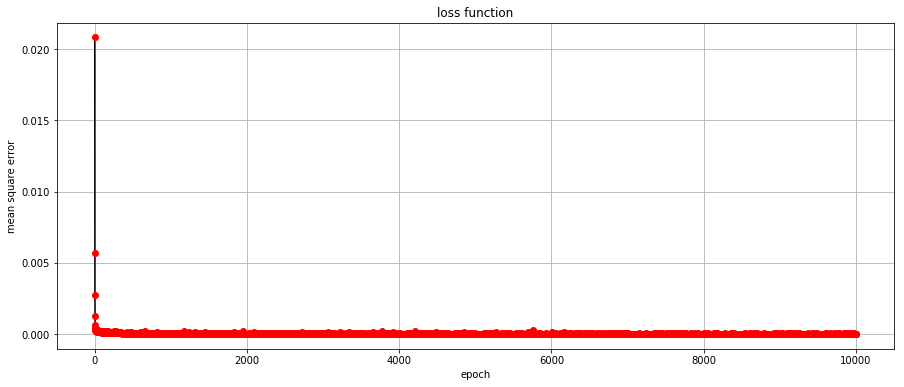

In [122]:
history_mun_X = Create_Model(RGB_mac_X, macbeth_X, 10000, "macbeth_X_10000.model")

125631/125631 [==============================] - 3s 27us/sample - loss: 0.1736 - mae: 0.3841
Train on 125631 samples
Epoch 1/100
125631/125631 [==============================] - 9s 71us/sample - loss: 7.5609e-04 - mae: 0.0117
Epoch 2/100
125631/125631 [==============================] - 9s 68us/sample - loss: 1.4472e-04 - mae: 0.0074
Epoch 3/100
125631/125631 [==============================] - 8s 66us/sample - loss: 1.3393e-04 - mae: 0.0070
Epoch 4/100
125631/125631 [==============================] - 8s 65us/sample - loss: 1.2530e-04 - mae: 0.0067
Epoch 5/100
125631/125631 [==============================] - 8s 66us/sample - loss: 1.2067e-04 - mae: 0.0065
Epoch 6/100
125631/125631 [==============================] - 8s 66us/sample - loss: 1.1777e-04 - mae: 0.0064
Epoch 7/100
125631/125631 [==============================] - 9s 68us/sample - loss: 1.1815e-04 - mae: 0.0064
Epoch 8/100
125631/125631 [==============================] - 8s 65us/sample - loss: 1.1358e-04 - mae: 0.0063
Epoch 9/100

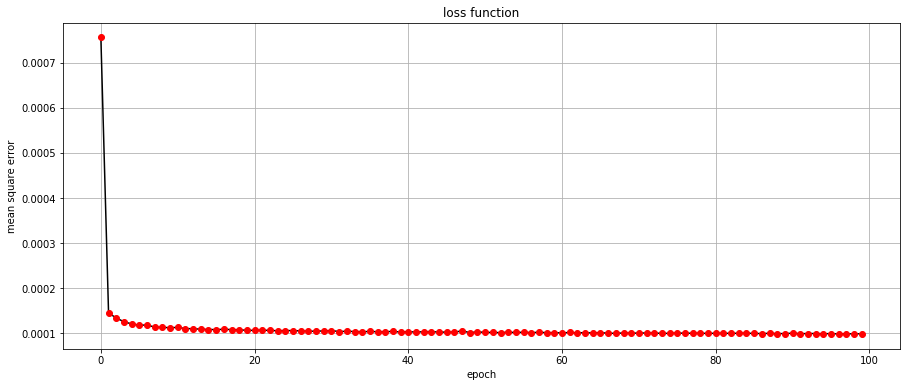

In [123]:
history_mun_X = Create_Model(RGB_mun_X, munsell_X, 100, "munsell_X_100.model")

11421/11421 [==============================] - 0s 30us/sample - loss: 0.1220 - mae: 0.2987
Train on 11421 samples
Epoch 1/1000
11421/11421 [==============================] - 1s 73us/sample - loss: 0.0055 - mae: 0.0406
Epoch 2/1000
11421/11421 [==============================] - 1s 73us/sample - loss: 4.5492e-04 - mae: 0.0147
Epoch 3/1000
11421/11421 [==============================] - 1s 84us/sample - loss: 3.7047e-04 - mae: 0.0132
Epoch 4/1000
11421/11421 [==============================] - 1s 75us/sample - loss: 4.0182e-04 - mae: 0.0134
Epoch 5/1000
11421/11421 [==============================] - 1s 70us/sample - loss: 3.1593e-04 - mae: 0.0120
Epoch 6/1000
11421/11421 [==============================] - 1s 75us/sample - loss: 2.9332e-04 - mae: 0.0115
Epoch 7/1000
11421/11421 [==============================] - 1s 77us/sample - loss: 3.0974e-04 - mae: 0.0118
Epoch 8/1000
11421/11421 [==============================] - 1s 75us/sample - loss: 2.9924e-04 - mae: 0.0116
Epoch 9/1000
11421/11421 [

11421/11421 [==============================] - 1s 70us/sample - loss: 2.0575e-04 - mae: 0.0090
Epoch 150/1000
11421/11421 [==============================] - 1s 76us/sample - loss: 2.0278e-04 - mae: 0.0090
Epoch 151/1000
11421/11421 [==============================] - 1s 76us/sample - loss: 2.0590e-04 - mae: 0.0091
Epoch 152/1000
11421/11421 [==============================] - 1s 75us/sample - loss: 2.0896e-04 - mae: 0.0092
Epoch 153/1000
11421/11421 [==============================] - 1s 76us/sample - loss: 2.0360e-04 - mae: 0.0090
Epoch 154/1000
11421/11421 [==============================] - 1s 72us/sample - loss: 2.0329e-04 - mae: 0.0090
Epoch 155/1000
11421/11421 [==============================] - 1s 74us/sample - loss: 2.0741e-04 - mae: 0.0091
Epoch 156/1000
11421/11421 [==============================] - 1s 76us/sample - loss: 2.0476e-04 - mae: 0.0090
Epoch 157/1000
11421/11421 [==============================] - 1s 74us/sample - loss: 2.0447e-04 - mae: 0.0090
Epoch 158/1000
11421/1142

11421/11421 [==============================] - 1s 68us/sample - loss: 1.9543e-04 - mae: 0.0088
Epoch 298/1000
11421/11421 [==============================] - 1s 70us/sample - loss: 2.0401e-04 - mae: 0.0090
Epoch 299/1000
11421/11421 [==============================] - 1s 69us/sample - loss: 1.9373e-04 - mae: 0.0087
Epoch 300/1000
11421/11421 [==============================] - 1s 68us/sample - loss: 1.9410e-04 - mae: 0.0087
Epoch 301/1000
11421/11421 [==============================] - 1s 72us/sample - loss: 2.0066e-04 - mae: 0.0090
Epoch 302/1000
11421/11421 [==============================] - 1s 74us/sample - loss: 1.9293e-04 - mae: 0.0087
Epoch 303/1000
11421/11421 [==============================] - 1s 75us/sample - loss: 1.9040e-04 - mae: 0.0086
Epoch 304/1000
11421/11421 [==============================] - 1s 70us/sample - loss: 1.9545e-04 - mae: 0.0088
Epoch 305/1000
11421/11421 [==============================] - 1s 72us/sample - loss: 1.9223e-04 - mae: 0.0087
Epoch 306/1000
11421/1142

11421/11421 [==============================] - 1s 67us/sample - loss: 1.8660e-04 - mae: 0.0086
Epoch 446/1000
11421/11421 [==============================] - 1s 71us/sample - loss: 1.8708e-04 - mae: 0.0086
Epoch 447/1000
11421/11421 [==============================] - 1s 72us/sample - loss: 1.8468e-04 - mae: 0.0085
Epoch 448/1000
11421/11421 [==============================] - 1s 73us/sample - loss: 1.9001e-04 - mae: 0.0087
Epoch 449/1000
11421/11421 [==============================] - 1s 68us/sample - loss: 1.8668e-04 - mae: 0.0086
Epoch 450/1000
11421/11421 [==============================] - 1s 62us/sample - loss: 1.8706e-04 - mae: 0.0086
Epoch 451/1000
11421/11421 [==============================] - 1s 65us/sample - loss: 1.8475e-04 - mae: 0.0085
Epoch 452/1000
11421/11421 [==============================] - 1s 67us/sample - loss: 1.8899e-04 - mae: 0.0087
Epoch 453/1000
11421/11421 [==============================] - 1s 80us/sample - loss: 1.8782e-04 - mae: 0.0086
Epoch 454/1000
11421/1142

11421/11421 [==============================] - 1s 75us/sample - loss: 1.7524e-04 - mae: 0.0083
Epoch 594/1000
11421/11421 [==============================] - 1s 75us/sample - loss: 1.7647e-04 - mae: 0.0083
Epoch 595/1000
11421/11421 [==============================] - 1s 78us/sample - loss: 1.7777e-04 - mae: 0.0084
Epoch 596/1000
11421/11421 [==============================] - 1s 81us/sample - loss: 1.7912e-04 - mae: 0.0085
Epoch 597/1000
11421/11421 [==============================] - 1s 74us/sample - loss: 1.7719e-04 - mae: 0.0084
Epoch 598/1000
11421/11421 [==============================] - 1s 74us/sample - loss: 1.7909e-04 - mae: 0.0084
Epoch 599/1000
11421/11421 [==============================] - 1s 74us/sample - loss: 1.7769e-04 - mae: 0.0084
Epoch 600/1000
11421/11421 [==============================] - 1s 68us/sample - loss: 1.7349e-04 - mae: 0.0083
Epoch 601/1000
11421/11421 [==============================] - 1s 78us/sample - loss: 1.7963e-04 - mae: 0.0084
Epoch 602/1000
11421/1142

11421/11421 [==============================] - 1s 68us/sample - loss: 1.6709e-04 - mae: 0.0081
Epoch 742/1000
11421/11421 [==============================] - 1s 66us/sample - loss: 1.6594e-04 - mae: 0.0081
Epoch 743/1000
11421/11421 [==============================] - 1s 68us/sample - loss: 1.7014e-04 - mae: 0.0082
Epoch 744/1000
11421/11421 [==============================] - 1s 69us/sample - loss: 1.6479e-04 - mae: 0.0080
Epoch 745/1000
11421/11421 [==============================] - 1s 67us/sample - loss: 1.6852e-04 - mae: 0.0082
Epoch 746/1000
11421/11421 [==============================] - 1s 69us/sample - loss: 1.7009e-04 - mae: 0.0082
Epoch 747/1000
11421/11421 [==============================] - 1s 67us/sample - loss: 1.7436e-04 - mae: 0.0084
Epoch 748/1000
11421/11421 [==============================] - 1s 67us/sample - loss: 1.6567e-04 - mae: 0.0081
Epoch 749/1000
11421/11421 [==============================] - 1s 67us/sample - loss: 1.6737e-04 - mae: 0.0081
Epoch 750/1000
11421/1142

11421/11421 [==============================] - ETA: 0s - loss: 1.6042e-04 - mae: 0.008 - 1s 74us/sample - loss: 1.6079e-04 - mae: 0.0080
Epoch 890/1000
11421/11421 [==============================] - 1s 74us/sample - loss: 1.5964e-04 - mae: 0.0080
Epoch 891/1000
11421/11421 [==============================] - 1s 77us/sample - loss: 1.5757e-04 - mae: 0.0079
Epoch 892/1000
11421/11421 [==============================] - 1s 81us/sample - loss: 1.6185e-04 - mae: 0.0080
Epoch 893/1000
11421/11421 [==============================] - 1s 79us/sample - loss: 1.6175e-04 - mae: 0.0080
Epoch 894/1000
11421/11421 [==============================] - 1s 76us/sample - loss: 1.5795e-04 - mae: 0.0079
Epoch 895/1000
11421/11421 [==============================] - 1s 73us/sample - loss: 1.5792e-04 - mae: 0.0079
Epoch 896/1000
11421/11421 [==============================] - 1s 73us/sample - loss: 1.5709e-04 - mae: 0.0079
Epoch 897/1000
11421/11421 [==============================] - 1s 78us/sample - loss: 1.6049e-

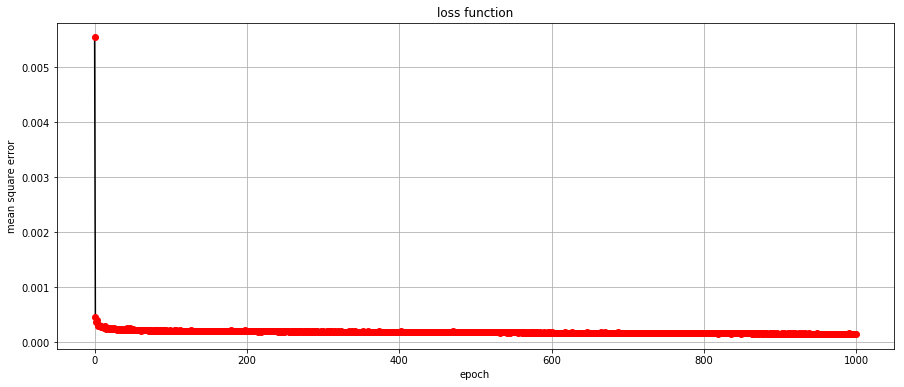

In [131]:
Create_Model(RGB_mun, munsell_ensemble, 1000, "munsell_1000.model")

216/216 [==============================] - 0s 143us/sample - loss: 0.1216 - mae: 0.2968
Train on 216 samples
Epoch 1/1000
216/216 [==============================] - 0s 457us/sample - loss: 0.0538 - mae: 0.1741
Epoch 2/1000
216/216 [==============================] - 0s 83us/sample - loss: 0.0355 - mae: 0.1401
Epoch 3/1000
216/216 [==============================] - 0s 88us/sample - loss: 0.0282 - mae: 0.1250
Epoch 4/1000
216/216 [==============================] - 0s 97us/sample - loss: 0.0224 - mae: 0.1101
Epoch 5/1000
216/216 [==============================] - 0s 102us/sample - loss: 0.0187 - mae: 0.0981
Epoch 6/1000
216/216 [==============================] - 0s 102us/sample - loss: 0.0158 - mae: 0.0883
Epoch 7/1000
216/216 [==============================] - 0s 97us/sample - loss: 0.0138 - mae: 0.0814
Epoch 8/1000
216/216 [==============================] - 0s 92us/sample - loss: 0.0121 - mae: 0.0744
Epoch 9/1000
216/216 [==============================] - 0s 97us/sample - loss: 0.0107 - 

216/216 [==============================] - 0s 78us/sample - loss: 5.3456e-04 - mae: 0.0161
Epoch 80/1000
216/216 [==============================] - 0s 88us/sample - loss: 5.3909e-04 - mae: 0.0162
Epoch 81/1000
216/216 [==============================] - 0s 74us/sample - loss: 4.8718e-04 - mae: 0.0151
Epoch 82/1000
216/216 [==============================] - 0s 92us/sample - loss: 4.7444e-04 - mae: 0.0152
Epoch 83/1000
216/216 [==============================] - 0s 74us/sample - loss: 4.4630e-04 - mae: 0.0147
Epoch 84/1000
216/216 [==============================] - 0s 83us/sample - loss: 4.4672e-04 - mae: 0.0148
Epoch 85/1000
216/216 [==============================] - 0s 78us/sample - loss: 4.3412e-04 - mae: 0.0143
Epoch 86/1000
216/216 [==============================] - 0s 69us/sample - loss: 4.5807e-04 - mae: 0.0150
Epoch 87/1000
216/216 [==============================] - 0s 106us/sample - loss: 4.5512e-04 - mae: 0.0148
Epoch 88/1000
216/216 [==============================] - 0s 92us/sam

216/216 [==============================] - 0s 74us/sample - loss: 3.0251e-04 - mae: 0.0119
Epoch 234/1000
216/216 [==============================] - 0s 88us/sample - loss: 2.7945e-04 - mae: 0.0113
Epoch 235/1000
216/216 [==============================] - 0s 88us/sample - loss: 2.9422e-04 - mae: 0.0119
Epoch 236/1000
216/216 [==============================] - 0s 78us/sample - loss: 2.7134e-04 - mae: 0.0111
Epoch 237/1000
216/216 [==============================] - 0s 79us/sample - loss: 2.7419e-04 - mae: 0.0113
Epoch 238/1000
216/216 [==============================] - 0s 88us/sample - loss: 2.8820e-04 - mae: 0.0116
Epoch 239/1000
216/216 [==============================] - 0s 88us/sample - loss: 2.6420e-04 - mae: 0.0112
Epoch 240/1000
216/216 [==============================] - 0s 88us/sample - loss: 2.8167e-04 - mae: 0.0112
Epoch 241/1000
216/216 [==============================] - 0s 74us/sample - loss: 2.7467e-04 - mae: 0.0110
Epoch 242/1000
216/216 [==============================] - 0s 

216/216 [==============================] - 0s 78us/sample - loss: 2.0277e-04 - mae: 0.0095
Epoch 388/1000
216/216 [==============================] - 0s 83us/sample - loss: 2.2145e-04 - mae: 0.0099
Epoch 389/1000
216/216 [==============================] - 0s 78us/sample - loss: 2.4760e-04 - mae: 0.0109
Epoch 390/1000
216/216 [==============================] - 0s 83us/sample - loss: 2.2352e-04 - mae: 0.0103
Epoch 391/1000
216/216 [==============================] - 0s 79us/sample - loss: 2.0675e-04 - mae: 0.0097
Epoch 392/1000
216/216 [==============================] - 0s 78us/sample - loss: 1.9707e-04 - mae: 0.0092
Epoch 393/1000
216/216 [==============================] - 0s 74us/sample - loss: 2.0038e-04 - mae: 0.0094
Epoch 394/1000
216/216 [==============================] - 0s 78us/sample - loss: 2.3015e-04 - mae: 0.0100
Epoch 395/1000
216/216 [==============================] - 0s 88us/sample - loss: 2.1679e-04 - mae: 0.0099
Epoch 396/1000
216/216 [==============================] - 0s 

216/216 [==============================] - 0s 78us/sample - loss: 2.6287e-04 - mae: 0.0107
Epoch 542/1000
216/216 [==============================] - 0s 78us/sample - loss: 2.5524e-04 - mae: 0.0109
Epoch 543/1000
216/216 [==============================] - 0s 78us/sample - loss: 2.3776e-04 - mae: 0.0105
Epoch 544/1000
216/216 [==============================] - 0s 78us/sample - loss: 2.4580e-04 - mae: 0.0111
Epoch 545/1000
216/216 [==============================] - 0s 78us/sample - loss: 2.7537e-04 - mae: 0.0115
Epoch 546/1000
216/216 [==============================] - 0s 92us/sample - loss: 2.0608e-04 - mae: 0.0097
Epoch 547/1000
216/216 [==============================] - 0s 92us/sample - loss: 2.0748e-04 - mae: 0.0097
Epoch 548/1000
216/216 [==============================] - 0s 92us/sample - loss: 2.0519e-04 - mae: 0.0095
Epoch 549/1000
216/216 [==============================] - 0s 78us/sample - loss: 2.6525e-04 - mae: 0.0114
Epoch 550/1000
216/216 [==============================] - 0s 

216/216 [==============================] - 0s 78us/sample - loss: 2.6256e-04 - mae: 0.0112
Epoch 696/1000
216/216 [==============================] - 0s 78us/sample - loss: 2.0928e-04 - mae: 0.0097
Epoch 697/1000
216/216 [==============================] - 0s 74us/sample - loss: 2.0374e-04 - mae: 0.0094
Epoch 698/1000
216/216 [==============================] - 0s 74us/sample - loss: 2.4059e-04 - mae: 0.0105
Epoch 699/1000
216/216 [==============================] - 0s 83us/sample - loss: 2.3038e-04 - mae: 0.0105
Epoch 700/1000
216/216 [==============================] - 0s 134us/sample - loss: 1.9413e-04 - mae: 0.0095
Epoch 701/1000
216/216 [==============================] - 0s 78us/sample - loss: 1.8001e-04 - mae: 0.0089
Epoch 702/1000
216/216 [==============================] - 0s 102us/sample - loss: 1.6663e-04 - mae: 0.0086
Epoch 703/1000
216/216 [==============================] - 0s 92us/sample - loss: 1.7021e-04 - mae: 0.0089
Epoch 704/1000
216/216 [==============================] - 0

216/216 [==============================] - 0s 74us/sample - loss: 1.5149e-04 - mae: 0.0084
Epoch 850/1000
216/216 [==============================] - 0s 74us/sample - loss: 1.6730e-04 - mae: 0.0083
Epoch 851/1000
216/216 [==============================] - 0s 74us/sample - loss: 1.4590e-04 - mae: 0.0081
Epoch 852/1000
216/216 [==============================] - 0s 78us/sample - loss: 1.9780e-04 - mae: 0.0095
Epoch 853/1000
216/216 [==============================] - 0s 83us/sample - loss: 2.3134e-04 - mae: 0.0106
Epoch 854/1000
216/216 [==============================] - 0s 83us/sample - loss: 2.3424e-04 - mae: 0.0102
Epoch 855/1000
216/216 [==============================] - 0s 139us/sample - loss: 1.9931e-04 - mae: 0.0100
Epoch 856/1000
216/216 [==============================] - 0s 88us/sample - loss: 2.7897e-04 - mae: 0.0120
Epoch 857/1000
216/216 [==============================] - 0s 83us/sample - loss: 1.9953e-04 - mae: 0.0096
Epoch 858/1000
216/216 [==============================] - 0s

Epoch 926/1000
216/216 [==============================] - 0s 78us/sample - loss: 1.5644e-04 - mae: 0.0084
Epoch 927/1000
216/216 [==============================] - 0s 74us/sample - loss: 1.5334e-04 - mae: 0.0081
Epoch 928/1000
216/216 [==============================] - 0s 78us/sample - loss: 1.5164e-04 - mae: 0.0081
Epoch 929/1000
216/216 [==============================] - 0s 74us/sample - loss: 1.7769e-04 - mae: 0.0089
Epoch 930/1000
216/216 [==============================] - 0s 97us/sample - loss: 1.7186e-04 - mae: 0.0089
Epoch 931/1000
216/216 [==============================] - 0s 88us/sample - loss: 1.7617e-04 - mae: 0.0089
Epoch 932/1000
216/216 [==============================] - 0s 83us/sample - loss: 1.4318e-04 - mae: 0.0078
Epoch 933/1000
216/216 [==============================] - 0s 78us/sample - loss: 1.5486e-04 - mae: 0.0081
Epoch 934/1000
216/216 [==============================] - 0s 83us/sample - loss: 1.3082e-04 - mae: 0.0073
Epoch 935/1000
216/216 [======================

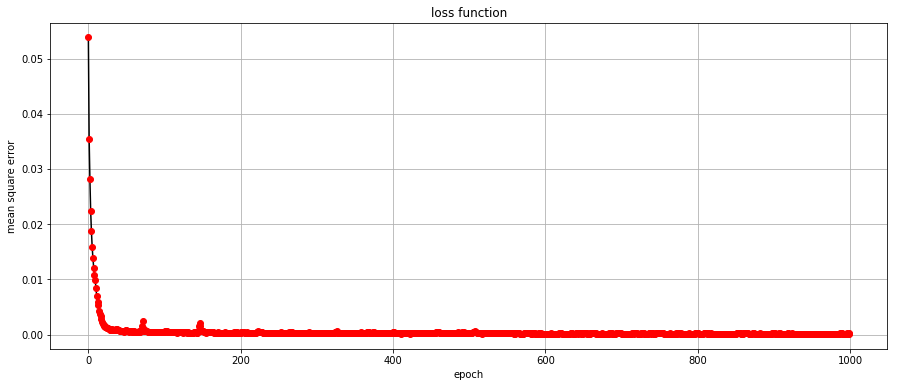

In [134]:
Create_Model(RGB_mac, macbeth_ensemble, 1000, "macbeth_1000.model")

216/216 [==============================] - 0s 138us/sample - loss: 0.1306 - mae: 0.3129
Train on 216 samples
Epoch 1/5000
216/216 [==============================] - 0s 466us/sample - loss: 0.0548 - mae: 0.1793
Epoch 2/5000
216/216 [==============================] - 0s 83us/sample - loss: 0.0353 - mae: 0.1393
Epoch 3/5000
216/216 [==============================] - 0s 92us/sample - loss: 0.0292 - mae: 0.1282
Epoch 4/5000
216/216 [==============================] - 0s 83us/sample - loss: 0.0248 - mae: 0.1152
Epoch 5/5000
216/216 [==============================] - 0s 97us/sample - loss: 0.0214 - mae: 0.1021
Epoch 6/5000
216/216 [==============================] - 0s 97us/sample - loss: 0.0177 - mae: 0.0929
Epoch 7/5000
216/216 [==============================] - 0s 111us/sample - loss: 0.0153 - mae: 0.0863
Epoch 8/5000
216/216 [==============================] - 0s 97us/sample - loss: 0.0134 - mae: 0.0779
Epoch 9/5000
216/216 [==============================] - 0s 92us/sample - loss: 0.0117 - m

216/216 [==============================] - 0s 79us/sample - loss: 3.4023e-04 - mae: 0.0124
Epoch 156/5000
216/216 [==============================] - 0s 88us/sample - loss: 3.3898e-04 - mae: 0.0127
Epoch 157/5000
216/216 [==============================] - 0s 74us/sample - loss: 3.5588e-04 - mae: 0.0131
Epoch 158/5000
216/216 [==============================] - 0s 97us/sample - loss: 3.8950e-04 - mae: 0.0137
Epoch 159/5000
216/216 [==============================] - 0s 97us/sample - loss: 4.5282e-04 - mae: 0.0150
Epoch 160/5000
216/216 [==============================] - 0s 92us/sample - loss: 6.7509e-04 - mae: 0.0180
Epoch 161/5000
216/216 [==============================] - 0s 88us/sample - loss: 8.0782e-04 - mae: 0.0200
Epoch 162/5000
216/216 [==============================] - 0s 83us/sample - loss: 5.8110e-04 - mae: 0.0168
Epoch 163/5000
216/216 [==============================] - 0s 88us/sample - loss: 6.1337e-04 - mae: 0.0176
Epoch 164/5000
216/216 [==============================] - 0s 

216/216 [==============================] - 0s 88us/sample - loss: 2.5750e-04 - mae: 0.0108
Epoch 310/5000
216/216 [==============================] - 0s 157us/sample - loss: 2.3718e-04 - mae: 0.0104
Epoch 311/5000
216/216 [==============================] - 0s 106us/sample - loss: 3.2561e-04 - mae: 0.0126
Epoch 312/5000
216/216 [==============================] - 0s 88us/sample - loss: 4.1445e-04 - mae: 0.0134
Epoch 313/5000
216/216 [==============================] - 0s 92us/sample - loss: 2.4869e-04 - mae: 0.0109
Epoch 314/5000
216/216 [==============================] - 0s 92us/sample - loss: 2.7188e-04 - mae: 0.0111
Epoch 315/5000
216/216 [==============================] - 0s 88us/sample - loss: 3.1941e-04 - mae: 0.0127
Epoch 316/5000
216/216 [==============================] - 0s 78us/sample - loss: 3.3912e-04 - mae: 0.0127
Epoch 317/5000
216/216 [==============================] - 0s 88us/sample - loss: 2.9538e-04 - mae: 0.0116
Epoch 318/5000
216/216 [==============================] - 0

216/216 [==============================] - 0s 88us/sample - loss: 2.7740e-04 - mae: 0.0115
Epoch 464/5000
216/216 [==============================] - 0s 83us/sample - loss: 2.5358e-04 - mae: 0.0107
Epoch 465/5000
216/216 [==============================] - 0s 74us/sample - loss: 2.1968e-04 - mae: 0.0100
Epoch 466/5000
216/216 [==============================] - 0s 78us/sample - loss: 2.2290e-04 - mae: 0.0100
Epoch 467/5000
216/216 [==============================] - 0s 79us/sample - loss: 1.8057e-04 - mae: 0.0088
Epoch 468/5000
216/216 [==============================] - 0s 78us/sample - loss: 1.7795e-04 - mae: 0.0088
Epoch 469/5000
216/216 [==============================] - 0s 78us/sample - loss: 2.0971e-04 - mae: 0.0098
Epoch 470/5000
216/216 [==============================] - 0s 78us/sample - loss: 2.0189e-04 - mae: 0.0098
Epoch 471/5000
216/216 [==============================] - 0s 74us/sample - loss: 2.2933e-04 - mae: 0.0104
Epoch 472/5000
216/216 [==============================] - 0s 

216/216 [==============================] - 0s 83us/sample - loss: 2.3500e-04 - mae: 0.0107
Epoch 618/5000
216/216 [==============================] - 0s 78us/sample - loss: 2.5958e-04 - mae: 0.0111
Epoch 619/5000
216/216 [==============================] - 0s 78us/sample - loss: 3.6606e-04 - mae: 0.0130
Epoch 620/5000
216/216 [==============================] - 0s 88us/sample - loss: 2.2482e-04 - mae: 0.0100
Epoch 621/5000
216/216 [==============================] - 0s 88us/sample - loss: 2.0530e-04 - mae: 0.0098
Epoch 622/5000
216/216 [==============================] - 0s 92us/sample - loss: 1.9819e-04 - mae: 0.0095
Epoch 623/5000
216/216 [==============================] - 0s 83us/sample - loss: 1.6087e-04 - mae: 0.0085
Epoch 624/5000
216/216 [==============================] - 0s 83us/sample - loss: 1.5835e-04 - mae: 0.0082
Epoch 625/5000
216/216 [==============================] - 0s 97us/sample - loss: 1.7710e-04 - mae: 0.0089
Epoch 626/5000
216/216 [==============================] - 0s 

216/216 [==============================] - 0s 88us/sample - loss: 1.4030e-04 - mae: 0.0078
Epoch 771/5000
216/216 [==============================] - 0s 88us/sample - loss: 1.4369e-04 - mae: 0.0079
Epoch 772/5000
216/216 [==============================] - 0s 88us/sample - loss: 1.9329e-04 - mae: 0.0094
Epoch 773/5000
216/216 [==============================] - 0s 92us/sample - loss: 2.3982e-04 - mae: 0.0108
Epoch 774/5000
216/216 [==============================] - 0s 97us/sample - loss: 1.7747e-04 - mae: 0.0091
Epoch 775/5000
216/216 [==============================] - 0s 88us/sample - loss: 1.5597e-04 - mae: 0.0084
Epoch 776/5000
216/216 [==============================] - 0s 83us/sample - loss: 1.8903e-04 - mae: 0.0093
Epoch 777/5000
216/216 [==============================] - 0s 83us/sample - loss: 2.3190e-04 - mae: 0.0102
Epoch 778/5000
216/216 [==============================] - 0s 88us/sample - loss: 1.8128e-04 - mae: 0.0090
Epoch 779/5000
216/216 [==============================] - 0s 

216/216 [==============================] - 0s 106us/sample - loss: 1.3101e-04 - mae: 0.0075
Epoch 925/5000
216/216 [==============================] - 0s 78us/sample - loss: 1.1906e-04 - mae: 0.0071
Epoch 926/5000
216/216 [==============================] - 0s 83us/sample - loss: 1.1423e-04 - mae: 0.0068
Epoch 927/5000
216/216 [==============================] - 0s 78us/sample - loss: 1.0540e-04 - mae: 0.0066
Epoch 928/5000
216/216 [==============================] - 0s 78us/sample - loss: 1.1210e-04 - mae: 0.0067
Epoch 929/5000
216/216 [==============================] - 0s 74us/sample - loss: 1.2405e-04 - mae: 0.0073
Epoch 930/5000
216/216 [==============================] - 0s 83us/sample - loss: 1.6448e-04 - mae: 0.0085
Epoch 931/5000
216/216 [==============================] - 0s 83us/sample - loss: 1.1750e-04 - mae: 0.0071
Epoch 932/5000
216/216 [==============================] - 0s 83us/sample - loss: 1.1733e-04 - mae: 0.0068
Epoch 933/5000
216/216 [==============================] - 0s

216/216 [==============================] - 0s 88us/sample - loss: 1.2881e-04 - mae: 0.0075
Epoch 1078/5000
216/216 [==============================] - 0s 88us/sample - loss: 1.1799e-04 - mae: 0.0073
Epoch 1079/5000
216/216 [==============================] - 0s 83us/sample - loss: 1.3734e-04 - mae: 0.0078
Epoch 1080/5000
216/216 [==============================] - 0s 92us/sample - loss: 1.3697e-04 - mae: 0.0078
Epoch 1081/5000
216/216 [==============================] - 0s 88us/sample - loss: 1.1425e-04 - mae: 0.0070
Epoch 1082/5000
216/216 [==============================] - 0s 88us/sample - loss: 1.2765e-04 - mae: 0.0074
Epoch 1083/5000
216/216 [==============================] - 0s 88us/sample - loss: 1.4617e-04 - mae: 0.0081
Epoch 1084/5000
216/216 [==============================] - 0s 78us/sample - loss: 1.1543e-04 - mae: 0.0071
Epoch 1085/5000
216/216 [==============================] - 0s 88us/sample - loss: 1.5294e-04 - mae: 0.0081
Epoch 1086/5000
216/216 [============================

216/216 [==============================] - 0s 88us/sample - loss: 2.1051e-04 - mae: 0.0101
Epoch 1230/5000
216/216 [==============================] - 0s 83us/sample - loss: 1.2660e-04 - mae: 0.0074
Epoch 1231/5000
216/216 [==============================] - 0s 78us/sample - loss: 1.0510e-04 - mae: 0.0068
Epoch 1232/5000
216/216 [==============================] - 0s 92us/sample - loss: 9.3540e-05 - mae: 0.0062
Epoch 1233/5000
216/216 [==============================] - 0s 92us/sample - loss: 1.1194e-04 - mae: 0.0069
Epoch 1234/5000
216/216 [==============================] - 0s 92us/sample - loss: 1.0630e-04 - mae: 0.0068
Epoch 1235/5000
216/216 [==============================] - 0s 88us/sample - loss: 1.1201e-04 - mae: 0.0069
Epoch 1236/5000
216/216 [==============================] - 0s 88us/sample - loss: 1.1319e-04 - mae: 0.0070
Epoch 1237/5000
216/216 [==============================] - 0s 88us/sample - loss: 1.0878e-04 - mae: 0.0070
Epoch 1238/5000
216/216 [============================

216/216 [==============================] - 0s 74us/sample - loss: 1.0455e-04 - mae: 0.0067
Epoch 1382/5000
216/216 [==============================] - 0s 69us/sample - loss: 8.8602e-05 - mae: 0.0059
Epoch 1383/5000
216/216 [==============================] - 0s 106us/sample - loss: 8.4142e-05 - mae: 0.0057
Epoch 1384/5000
216/216 [==============================] - 0s 69us/sample - loss: 8.1465e-05 - mae: 0.0056
Epoch 1385/5000
216/216 [==============================] - 0s 74us/sample - loss: 7.8657e-05 - mae: 0.0056
Epoch 1386/5000
216/216 [==============================] - 0s 78us/sample - loss: 8.6611e-05 - mae: 0.0058
Epoch 1387/5000
216/216 [==============================] - 0s 74us/sample - loss: 7.8250e-05 - mae: 0.0054
Epoch 1388/5000
216/216 [==============================] - 0s 78us/sample - loss: 7.8602e-05 - mae: 0.0053
Epoch 1389/5000
216/216 [==============================] - 0s 74us/sample - loss: 8.6634e-05 - mae: 0.0058
Epoch 1390/5000
216/216 [===========================

216/216 [==============================] - 0s 74us/sample - loss: 7.3100e-05 - mae: 0.0053
Epoch 1534/5000
216/216 [==============================] - 0s 69us/sample - loss: 8.2690e-05 - mae: 0.0058
Epoch 1535/5000
216/216 [==============================] - 0s 74us/sample - loss: 7.5249e-05 - mae: 0.0054
Epoch 1536/5000
216/216 [==============================] - 0s 78us/sample - loss: 8.8248e-05 - mae: 0.0063
Epoch 1537/5000
216/216 [==============================] - 0s 83us/sample - loss: 8.2947e-05 - mae: 0.0059
Epoch 1538/5000
216/216 [==============================] - 0s 78us/sample - loss: 1.1063e-04 - mae: 0.0070
Epoch 1539/5000
216/216 [==============================] - 0s 79us/sample - loss: 8.7539e-05 - mae: 0.0061
Epoch 1540/5000
216/216 [==============================] - 0s 88us/sample - loss: 8.1790e-05 - mae: 0.0057
Epoch 1541/5000
216/216 [==============================] - 0s 78us/sample - loss: 7.4918e-05 - mae: 0.0053
Epoch 1542/5000
216/216 [============================

216/216 [==============================] - 0s 78us/sample - loss: 7.1741e-05 - mae: 0.0053
Epoch 1686/5000
216/216 [==============================] - 0s 83us/sample - loss: 8.4770e-05 - mae: 0.0061
Epoch 1687/5000
216/216 [==============================] - 0s 79us/sample - loss: 8.3718e-05 - mae: 0.0058
Epoch 1688/5000
216/216 [==============================] - 0s 74us/sample - loss: 7.9755e-05 - mae: 0.0058
Epoch 1689/5000
216/216 [==============================] - 0s 74us/sample - loss: 8.6862e-05 - mae: 0.0062
Epoch 1690/5000
216/216 [==============================] - 0s 74us/sample - loss: 8.3462e-05 - mae: 0.0061
Epoch 1691/5000
216/216 [==============================] - 0s 78us/sample - loss: 8.4588e-05 - mae: 0.0059
Epoch 1692/5000
216/216 [==============================] - 0s 78us/sample - loss: 7.5823e-05 - mae: 0.0056
Epoch 1693/5000
216/216 [==============================] - 0s 78us/sample - loss: 7.3649e-05 - mae: 0.0055
Epoch 1694/5000
216/216 [============================

216/216 [==============================] - 0s 78us/sample - loss: 7.8628e-05 - mae: 0.0058
Epoch 1838/5000
216/216 [==============================] - 0s 74us/sample - loss: 6.8363e-05 - mae: 0.0054
Epoch 1839/5000
216/216 [==============================] - 0s 69us/sample - loss: 6.9952e-05 - mae: 0.0053
Epoch 1840/5000
216/216 [==============================] - 0s 69us/sample - loss: 8.5135e-05 - mae: 0.0060
Epoch 1841/5000
216/216 [==============================] - 0s 74us/sample - loss: 1.4110e-04 - mae: 0.0083
Epoch 1842/5000
216/216 [==============================] - 0s 78us/sample - loss: 1.2277e-04 - mae: 0.0075
Epoch 1843/5000
216/216 [==============================] - 0s 74us/sample - loss: 1.0882e-04 - mae: 0.0069
Epoch 1844/5000
216/216 [==============================] - 0s 69us/sample - loss: 1.2682e-04 - mae: 0.0077
Epoch 1845/5000
216/216 [==============================] - 0s 74us/sample - loss: 1.0908e-04 - mae: 0.0072
Epoch 1846/5000
216/216 [============================

216/216 [==============================] - 0s 88us/sample - loss: 6.7816e-05 - mae: 0.0052
Epoch 1990/5000
216/216 [==============================] - 0s 74us/sample - loss: 5.8841e-05 - mae: 0.0049
Epoch 1991/5000
216/216 [==============================] - 0s 74us/sample - loss: 5.9638e-05 - mae: 0.0048
Epoch 1992/5000
216/216 [==============================] - 0s 78us/sample - loss: 5.5047e-05 - mae: 0.0046
Epoch 1993/5000
216/216 [==============================] - 0s 78us/sample - loss: 5.2150e-05 - mae: 0.0045
Epoch 1994/5000
216/216 [==============================] - 0s 83us/sample - loss: 5.4722e-05 - mae: 0.0046
Epoch 1995/5000
216/216 [==============================] - 0s 78us/sample - loss: 7.0310e-05 - mae: 0.0054
Epoch 1996/5000
216/216 [==============================] - 0s 78us/sample - loss: 6.4326e-05 - mae: 0.0053
Epoch 1997/5000
216/216 [==============================] - 0s 78us/sample - loss: 8.1375e-05 - mae: 0.0059
Epoch 1998/5000
216/216 [============================

216/216 [==============================] - 0s 111us/sample - loss: 4.9148e-05 - mae: 0.0044
Epoch 2142/5000
216/216 [==============================] - 0s 120us/sample - loss: 5.2928e-05 - mae: 0.0046
Epoch 2143/5000
216/216 [==============================] - 0s 102us/sample - loss: 5.0865e-05 - mae: 0.0044
Epoch 2144/5000
216/216 [==============================] - 0s 102us/sample - loss: 4.6760e-05 - mae: 0.0042
Epoch 2145/5000
216/216 [==============================] - 0s 106us/sample - loss: 4.6428e-05 - mae: 0.0041
Epoch 2146/5000
216/216 [==============================] - 0s 102us/sample - loss: 4.8328e-05 - mae: 0.0042
Epoch 2147/5000
216/216 [==============================] - 0s 106us/sample - loss: 4.2167e-05 - mae: 0.0039
Epoch 2148/5000
216/216 [==============================] - 0s 125us/sample - loss: 4.7121e-05 - mae: 0.0040
Epoch 2149/5000
216/216 [==============================] - 0s 97us/sample - loss: 4.8206e-05 - mae: 0.0041
Epoch 2150/5000
216/216 [====================

216/216 [==============================] - 0s 102us/sample - loss: 4.3010e-05 - mae: 0.0039
Epoch 2218/5000
216/216 [==============================] - 0s 106us/sample - loss: 5.1158e-05 - mae: 0.0044
Epoch 2219/5000
216/216 [==============================] - 0s 106us/sample - loss: 4.8433e-05 - mae: 0.0045
Epoch 2220/5000
216/216 [==============================] - 0s 111us/sample - loss: 6.1326e-05 - mae: 0.0051
Epoch 2221/5000
216/216 [==============================] - ETA: 0s - loss: 4.6745e-05 - mae: 0.004 - 0s 115us/sample - loss: 5.7705e-05 - mae: 0.0049
Epoch 2222/5000
216/216 [==============================] - 0s 111us/sample - loss: 8.4983e-05 - mae: 0.0061
Epoch 2223/5000
216/216 [==============================] - 0s 106us/sample - loss: 5.9958e-05 - mae: 0.0051
Epoch 2224/5000
216/216 [==============================] - 0s 115us/sample - loss: 4.6726e-05 - mae: 0.0043
Epoch 2225/5000
216/216 [==============================] - 0s 139us/sample - loss: 4.6588e-05 - mae: 0.0043
Ep

216/216 [==============================] - 0s 106us/sample - loss: 5.0471e-05 - mae: 0.0047
Epoch 2369/5000
216/216 [==============================] - 0s 111us/sample - loss: 4.8743e-05 - mae: 0.0046
Epoch 2370/5000
216/216 [==============================] - 0s 106us/sample - loss: 4.7072e-05 - mae: 0.0045
Epoch 2371/5000
216/216 [==============================] - 0s 120us/sample - loss: 4.2697e-05 - mae: 0.0040
Epoch 2372/5000
216/216 [==============================] - 0s 134us/sample - loss: 5.8392e-05 - mae: 0.0050
Epoch 2373/5000
216/216 [==============================] - 0s 106us/sample - loss: 4.4157e-05 - mae: 0.0044
Epoch 2374/5000
216/216 [==============================] - 0s 102us/sample - loss: 5.3330e-05 - mae: 0.0048
Epoch 2375/5000
216/216 [==============================] - 0s 129us/sample - loss: 5.6240e-05 - mae: 0.0049
Epoch 2376/5000
216/216 [==============================] - 0s 115us/sample - loss: 5.4773e-05 - mae: 0.0048
Epoch 2377/5000
216/216 [===================

216/216 [==============================] - 0s 92us/sample - loss: 7.9771e-05 - mae: 0.0060
Epoch 2519/5000
216/216 [==============================] - 0s 92us/sample - loss: 6.7333e-05 - mae: 0.0055
Epoch 2520/5000
216/216 [==============================] - 0s 106us/sample - loss: 6.3768e-05 - mae: 0.0053
Epoch 2521/5000
216/216 [==============================] - 0s 106us/sample - loss: 6.4208e-05 - mae: 0.0054
Epoch 2522/5000
216/216 [==============================] - 0s 106us/sample - loss: 5.9146e-05 - mae: 0.0048
Epoch 2523/5000
216/216 [==============================] - 0s 92us/sample - loss: 6.3897e-05 - mae: 0.0053
Epoch 2524/5000
216/216 [==============================] - 0s 97us/sample - loss: 4.9729e-05 - mae: 0.0047
Epoch 2525/5000
216/216 [==============================] - 0s 88us/sample - loss: 5.0571e-05 - mae: 0.0046
Epoch 2526/5000
216/216 [==============================] - 0s 92us/sample - loss: 3.7536e-05 - mae: 0.0041
Epoch 2527/5000
216/216 [=========================

216/216 [==============================] - 0s 88us/sample - loss: 8.1073e-05 - mae: 0.0063
Epoch 2670/5000
216/216 [==============================] - 0s 83us/sample - loss: 6.0586e-05 - mae: 0.0054
Epoch 2671/5000
216/216 [==============================] - 0s 106us/sample - loss: 5.2438e-05 - mae: 0.0048
Epoch 2672/5000
216/216 [==============================] - 0s 106us/sample - loss: 4.1575e-05 - mae: 0.0042
Epoch 2673/5000
216/216 [==============================] - 0s 111us/sample - loss: 5.0199e-05 - mae: 0.0049
Epoch 2674/5000
216/216 [==============================] - 0s 97us/sample - loss: 4.4012e-05 - mae: 0.0043
Epoch 2675/5000
216/216 [==============================] - 0s 97us/sample - loss: 5.6897e-05 - mae: 0.0051
Epoch 2676/5000
216/216 [==============================] - 0s 106us/sample - loss: 4.1919e-05 - mae: 0.0043
Epoch 2677/5000
216/216 [==============================] - 0s 106us/sample - loss: 4.8132e-05 - mae: 0.0046
Epoch 2678/5000
216/216 [=======================

216/216 [==============================] - 0s 102us/sample - loss: 9.1546e-05 - mae: 0.0066
Epoch 2822/5000
216/216 [==============================] - 0s 102us/sample - loss: 6.0427e-05 - mae: 0.0053
Epoch 2823/5000
216/216 [==============================] - 0s 129us/sample - loss: 1.1157e-04 - mae: 0.0073
Epoch 2824/5000
216/216 [==============================] - 0s 185us/sample - loss: 2.0234e-04 - mae: 0.0094
Epoch 2825/5000
216/216 [==============================] - 0s 125us/sample - loss: 1.3597e-04 - mae: 0.0078
Epoch 2826/5000
216/216 [==============================] - 0s 102us/sample - loss: 8.6601e-05 - mae: 0.0067
Epoch 2827/5000
216/216 [==============================] - 0s 102us/sample - loss: 8.4009e-05 - mae: 0.0067
Epoch 2828/5000
216/216 [==============================] - 0s 111us/sample - loss: 6.6417e-05 - mae: 0.0056
Epoch 2829/5000
216/216 [==============================] - 0s 111us/sample - loss: 4.3048e-05 - mae: 0.0045
Epoch 2830/5000
216/216 [===================

216/216 [==============================] - 0s 83us/sample - loss: 2.8956e-05 - mae: 0.0035
Epoch 2974/5000
216/216 [==============================] - 0s 88us/sample - loss: 2.8203e-05 - mae: 0.0035
Epoch 2975/5000
216/216 [==============================] - 0s 92us/sample - loss: 2.5680e-05 - mae: 0.0033
Epoch 2976/5000
216/216 [==============================] - 0s 92us/sample - loss: 3.1857e-05 - mae: 0.0037
Epoch 2977/5000
216/216 [==============================] - 0s 97us/sample - loss: 3.0392e-05 - mae: 0.0035
Epoch 2978/5000
216/216 [==============================] - 0s 102us/sample - loss: 3.5017e-05 - mae: 0.0040
Epoch 2979/5000
216/216 [==============================] - 0s 111us/sample - loss: 3.7332e-05 - mae: 0.0039
Epoch 2980/5000
216/216 [==============================] - 0s 102us/sample - loss: 2.9454e-05 - mae: 0.0036
Epoch 2981/5000
216/216 [==============================] - 0s 102us/sample - loss: 2.2330e-05 - mae: 0.0031
Epoch 2982/5000
216/216 [========================

216/216 [==============================] - 0s 88us/sample - loss: 4.7634e-05 - mae: 0.0045
Epoch 3126/5000
216/216 [==============================] - 0s 88us/sample - loss: 7.6038e-05 - mae: 0.0061
Epoch 3127/5000
216/216 [==============================] - 0s 83us/sample - loss: 4.9260e-05 - mae: 0.0044
Epoch 3128/5000
216/216 [==============================] - 0s 88us/sample - loss: 3.6738e-05 - mae: 0.0042
Epoch 3129/5000
216/216 [==============================] - 0s 92us/sample - loss: 3.6871e-05 - mae: 0.0042
Epoch 3130/5000
216/216 [==============================] - 0s 102us/sample - loss: 4.0527e-05 - mae: 0.0043
Epoch 3131/5000
216/216 [==============================] - 0s 97us/sample - loss: 3.6124e-05 - mae: 0.0042
Epoch 3132/5000
216/216 [==============================] - 0s 88us/sample - loss: 5.3172e-05 - mae: 0.0050
Epoch 3133/5000
216/216 [==============================] - 0s 92us/sample - loss: 3.8593e-05 - mae: 0.0042
Epoch 3134/5000
216/216 [===========================

216/216 [==============================] - 0s 97us/sample - loss: 2.2808e-05 - mae: 0.0032
Epoch 3278/5000
216/216 [==============================] - 0s 78us/sample - loss: 2.9802e-05 - mae: 0.0037
Epoch 3279/5000
216/216 [==============================] - 0s 78us/sample - loss: 2.1273e-05 - mae: 0.0031
Epoch 3280/5000
216/216 [==============================] - 0s 88us/sample - loss: 2.6122e-05 - mae: 0.0034
Epoch 3281/5000
216/216 [==============================] - 0s 83us/sample - loss: 2.7150e-05 - mae: 0.0036
Epoch 3282/5000
216/216 [==============================] - 0s 88us/sample - loss: 3.0137e-05 - mae: 0.0037
Epoch 3283/5000
216/216 [==============================] - 0s 88us/sample - loss: 3.8186e-05 - mae: 0.0042
Epoch 3284/5000
216/216 [==============================] - 0s 92us/sample - loss: 2.2661e-05 - mae: 0.0032
Epoch 3285/5000
216/216 [==============================] - 0s 111us/sample - loss: 2.7049e-05 - mae: 0.0035
Epoch 3286/5000
216/216 [===========================

216/216 [==============================] - 0s 97us/sample - loss: 8.5650e-05 - mae: 0.0063
Epoch 3430/5000
216/216 [==============================] - 0s 115us/sample - loss: 4.1853e-05 - mae: 0.0044
Epoch 3431/5000
216/216 [==============================] - 0s 88us/sample - loss: 3.1860e-05 - mae: 0.0041
Epoch 3432/5000
216/216 [==============================] - 0s 92us/sample - loss: 3.3354e-05 - mae: 0.0040
Epoch 3433/5000
216/216 [==============================] - 0s 111us/sample - loss: 2.7722e-05 - mae: 0.0037
Epoch 3434/5000
216/216 [==============================] - 0s 92us/sample - loss: 2.4871e-05 - mae: 0.0034
Epoch 3435/5000
216/216 [==============================] - 0s 143us/sample - loss: 2.1367e-05 - mae: 0.0032
Epoch 3436/5000
216/216 [==============================] - 0s 83us/sample - loss: 2.2180e-05 - mae: 0.0032
Epoch 3437/5000
216/216 [==============================] - 0s 92us/sample - loss: 2.9354e-05 - mae: 0.0037
Epoch 3438/5000
216/216 [=========================

216/216 [==============================] - 0s 83us/sample - loss: 1.9368e-05 - mae: 0.0031
Epoch 3582/5000
216/216 [==============================] - 0s 88us/sample - loss: 1.9807e-05 - mae: 0.0031
Epoch 3583/5000
216/216 [==============================] - 0s 78us/sample - loss: 2.2123e-05 - mae: 0.0032
Epoch 3584/5000
216/216 [==============================] - 0s 74us/sample - loss: 2.2718e-05 - mae: 0.0033
Epoch 3585/5000
216/216 [==============================] - 0s 78us/sample - loss: 2.0583e-05 - mae: 0.0031
Epoch 3586/5000
216/216 [==============================] - 0s 78us/sample - loss: 2.8485e-05 - mae: 0.0036
Epoch 3587/5000
216/216 [==============================] - 0s 78us/sample - loss: 2.2966e-05 - mae: 0.0034
Epoch 3588/5000
216/216 [==============================] - 0s 69us/sample - loss: 1.7682e-05 - mae: 0.0029
Epoch 3589/5000
216/216 [==============================] - 0s 74us/sample - loss: 1.8685e-05 - mae: 0.0031
Epoch 3590/5000
216/216 [============================

216/216 [==============================] - 0s 79us/sample - loss: 1.1422e-05 - mae: 0.0023
Epoch 3734/5000
216/216 [==============================] - 0s 74us/sample - loss: 1.0220e-05 - mae: 0.0022
Epoch 3735/5000
216/216 [==============================] - 0s 74us/sample - loss: 1.0670e-05 - mae: 0.0022
Epoch 3736/5000
216/216 [==============================] - 0s 78us/sample - loss: 1.0870e-05 - mae: 0.0022
Epoch 3737/5000
216/216 [==============================] - 0s 92us/sample - loss: 1.0658e-05 - mae: 0.0022
Epoch 3738/5000
216/216 [==============================] - 0s 74us/sample - loss: 1.2244e-05 - mae: 0.0024
Epoch 3739/5000
216/216 [==============================] - 0s 78us/sample - loss: 1.3411e-05 - mae: 0.0025
Epoch 3740/5000
216/216 [==============================] - 0s 74us/sample - loss: 1.2491e-05 - mae: 0.0024
Epoch 3741/5000
216/216 [==============================] - 0s 74us/sample - loss: 1.2487e-05 - mae: 0.0024
Epoch 3742/5000
216/216 [============================

216/216 [==============================] - 0s 102us/sample - loss: 1.4821e-05 - mae: 0.0027
Epoch 3886/5000
216/216 [==============================] - 0s 74us/sample - loss: 1.2626e-05 - mae: 0.0025
Epoch 3887/5000
216/216 [==============================] - 0s 74us/sample - loss: 1.2109e-05 - mae: 0.0024
Epoch 3888/5000
216/216 [==============================] - 0s 83us/sample - loss: 1.0934e-05 - mae: 0.0023
Epoch 3889/5000
216/216 [==============================] - 0s 74us/sample - loss: 9.7176e-06 - mae: 0.0021
Epoch 3890/5000
216/216 [==============================] - 0s 74us/sample - loss: 1.0500e-05 - mae: 0.0022
Epoch 3891/5000
216/216 [==============================] - 0s 74us/sample - loss: 1.1679e-05 - mae: 0.0023
Epoch 3892/5000
216/216 [==============================] - 0s 79us/sample - loss: 1.1893e-05 - mae: 0.0024
Epoch 3893/5000
216/216 [==============================] - 0s 74us/sample - loss: 1.0011e-05 - mae: 0.0022
Epoch 3894/5000
216/216 [===========================

216/216 [==============================] - 0s 74us/sample - loss: 8.9501e-06 - mae: 0.0021
Epoch 4038/5000
216/216 [==============================] - 0s 74us/sample - loss: 1.0027e-05 - mae: 0.0022
Epoch 4039/5000
216/216 [==============================] - 0s 74us/sample - loss: 1.0981e-05 - mae: 0.0023
Epoch 4040/5000
216/216 [==============================] - 0s 74us/sample - loss: 1.2521e-05 - mae: 0.0025
Epoch 4041/5000
216/216 [==============================] - 0s 74us/sample - loss: 1.2006e-05 - mae: 0.0024
Epoch 4042/5000
216/216 [==============================] - 0s 74us/sample - loss: 1.1017e-05 - mae: 0.0023
Epoch 4043/5000
216/216 [==============================] - 0s 69us/sample - loss: 1.0262e-05 - mae: 0.0022
Epoch 4044/5000
216/216 [==============================] - 0s 74us/sample - loss: 1.2726e-05 - mae: 0.0025
Epoch 4045/5000
216/216 [==============================] - 0s 88us/sample - loss: 1.0680e-05 - mae: 0.0023
Epoch 4046/5000
216/216 [============================

216/216 [==============================] - 0s 83us/sample - loss: 1.4011e-05 - mae: 0.0026
Epoch 4190/5000
216/216 [==============================] - 0s 78us/sample - loss: 1.2424e-05 - mae: 0.0025
Epoch 4191/5000
216/216 [==============================] - 0s 102us/sample - loss: 1.0197e-05 - mae: 0.0023
Epoch 4192/5000
216/216 [==============================] - 0s 83us/sample - loss: 9.1856e-06 - mae: 0.0021
Epoch 4193/5000
216/216 [==============================] - 0s 78us/sample - loss: 1.1897e-05 - mae: 0.0024
Epoch 4194/5000
216/216 [==============================] - 0s 88us/sample - loss: 1.2167e-05 - mae: 0.0025
Epoch 4195/5000
216/216 [==============================] - 0s 88us/sample - loss: 1.0314e-05 - mae: 0.0023
Epoch 4196/5000
216/216 [==============================] - 0s 74us/sample - loss: 1.0851e-05 - mae: 0.0023
Epoch 4197/5000
216/216 [==============================] - 0s 74us/sample - loss: 9.3760e-06 - mae: 0.0021
Epoch 4198/5000
216/216 [===========================

216/216 [==============================] - 0s 74us/sample - loss: 7.0653e-05 - mae: 0.0060
Epoch 4342/5000
216/216 [==============================] - 0s 74us/sample - loss: 7.4186e-05 - mae: 0.0064
Epoch 4343/5000
216/216 [==============================] - 0s 74us/sample - loss: 5.8782e-05 - mae: 0.0054
Epoch 4344/5000
216/216 [==============================] - 0s 74us/sample - loss: 4.2610e-05 - mae: 0.0047
Epoch 4345/5000
216/216 [==============================] - 0s 69us/sample - loss: 4.4759e-05 - mae: 0.0049
Epoch 4346/5000
216/216 [==============================] - 0s 69us/sample - loss: 1.0758e-04 - mae: 0.0070
Epoch 4347/5000
216/216 [==============================] - 0s 65us/sample - loss: 8.5202e-05 - mae: 0.0063
Epoch 4348/5000
216/216 [==============================] - 0s 74us/sample - loss: 8.0790e-05 - mae: 0.0064
Epoch 4349/5000
216/216 [==============================] - 0s 69us/sample - loss: 4.1860e-05 - mae: 0.0044
Epoch 4350/5000
216/216 [============================

216/216 [==============================] - 0s 69us/sample - loss: 7.0601e-06 - mae: 0.0019
Epoch 4494/5000
216/216 [==============================] - 0s 74us/sample - loss: 7.8956e-06 - mae: 0.0019
Epoch 4495/5000
216/216 [==============================] - 0s 97us/sample - loss: 9.2646e-06 - mae: 0.0021
Epoch 4496/5000
216/216 [==============================] - 0s 83us/sample - loss: 1.4157e-05 - mae: 0.0026
Epoch 4497/5000
216/216 [==============================] - 0s 92us/sample - loss: 2.8718e-05 - mae: 0.0038
Epoch 4498/5000
216/216 [==============================] - 0s 78us/sample - loss: 1.6111e-05 - mae: 0.0027
Epoch 4499/5000
216/216 [==============================] - 0s 74us/sample - loss: 1.0673e-05 - mae: 0.0023
Epoch 4500/5000
216/216 [==============================] - 0s 74us/sample - loss: 1.1172e-05 - mae: 0.0024
Epoch 4501/5000
216/216 [==============================] - 0s 74us/sample - loss: 8.2603e-06 - mae: 0.0020
Epoch 4502/5000
216/216 [============================

216/216 [==============================] - 0s 74us/sample - loss: 6.7445e-06 - mae: 0.0018
Epoch 4645/5000
216/216 [==============================] - 0s 79us/sample - loss: 6.8422e-06 - mae: 0.0018
Epoch 4646/5000
216/216 [==============================] - 0s 69us/sample - loss: 6.9291e-06 - mae: 0.0019
Epoch 4647/5000
216/216 [==============================] - 0s 74us/sample - loss: 7.4016e-06 - mae: 0.0019
Epoch 4648/5000
216/216 [==============================] - 0s 69us/sample - loss: 8.4395e-06 - mae: 0.0021
Epoch 4649/5000
216/216 [==============================] - 0s 74us/sample - loss: 9.2809e-06 - mae: 0.0022
Epoch 4650/5000
216/216 [==============================] - 0s 69us/sample - loss: 7.2559e-06 - mae: 0.0018
Epoch 4651/5000
216/216 [==============================] - 0s 74us/sample - loss: 8.3573e-06 - mae: 0.0020
Epoch 4652/5000
216/216 [==============================] - 0s 74us/sample - loss: 7.3448e-06 - mae: 0.0019
Epoch 4653/5000
216/216 [============================

216/216 [==============================] - 0s 74us/sample - loss: 1.6743e-05 - mae: 0.0030
Epoch 4797/5000
216/216 [==============================] - 0s 88us/sample - loss: 1.1821e-05 - mae: 0.0025
Epoch 4798/5000
216/216 [==============================] - 0s 83us/sample - loss: 9.9110e-06 - mae: 0.0022
Epoch 4799/5000
216/216 [==============================] - 0s 83us/sample - loss: 9.6330e-06 - mae: 0.0023
Epoch 4800/5000
216/216 [==============================] - 0s 97us/sample - loss: 8.9331e-06 - mae: 0.0021
Epoch 4801/5000
216/216 [==============================] - 0s 92us/sample - loss: 1.1667e-05 - mae: 0.0024
Epoch 4802/5000
216/216 [==============================] - 0s 78us/sample - loss: 1.2836e-05 - mae: 0.0025
Epoch 4803/5000
216/216 [==============================] - 0s 79us/sample - loss: 1.0201e-05 - mae: 0.0023
Epoch 4804/5000
216/216 [==============================] - 0s 83us/sample - loss: 1.4824e-05 - mae: 0.0027
Epoch 4805/5000
216/216 [============================

216/216 [==============================] - 0s 69us/sample - loss: 8.9156e-05 - mae: 0.0064
Epoch 4949/5000
216/216 [==============================] - 0s 83us/sample - loss: 3.7862e-05 - mae: 0.0043
Epoch 4950/5000
216/216 [==============================] - 0s 69us/sample - loss: 4.4842e-05 - mae: 0.0044
Epoch 4951/5000
216/216 [==============================] - 0s 69us/sample - loss: 2.4778e-05 - mae: 0.0036
Epoch 4952/5000
216/216 [==============================] - 0s 69us/sample - loss: 2.1017e-05 - mae: 0.0033
Epoch 4953/5000
216/216 [==============================] - 0s 69us/sample - loss: 2.1551e-05 - mae: 0.0034
Epoch 4954/5000
216/216 [==============================] - 0s 69us/sample - loss: 1.6724e-05 - mae: 0.0030
Epoch 4955/5000
216/216 [==============================] - 0s 69us/sample - loss: 1.5236e-05 - mae: 0.0028
Epoch 4956/5000
216/216 [==============================] - 0s 78us/sample - loss: 1.5017e-05 - mae: 0.0028
Epoch 4957/5000
216/216 [============================

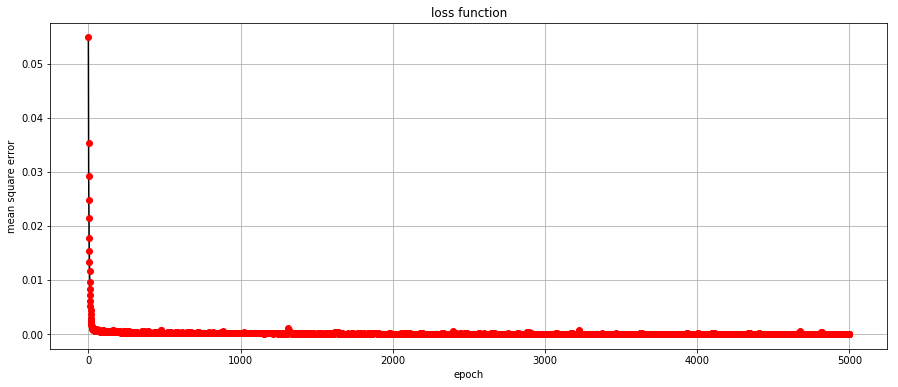

In [135]:
Create_Model(RGB_mac, macbeth_ensemble, 5000, "macbeth_5000.model")

216/216 [==============================] - 0s 65us/sample - loss: 1.3052e-04 - mae: 0.0075
Train on 216 samples
Epoch 1/5000
216/216 [==============================] - 0s 83us/sample - loss: 1.1091e-04 - mae: 0.0068
Epoch 2/5000
216/216 [==============================] - 0s 88us/sample - loss: 1.2891e-04 - mae: 0.0076
Epoch 3/5000
216/216 [==============================] - 0s 83us/sample - loss: 1.5266e-04 - mae: 0.0082
Epoch 4/5000
216/216 [==============================] - 0s 92us/sample - loss: 1.2247e-04 - mae: 0.0074
Epoch 5/5000
216/216 [==============================] - 0s 79us/sample - loss: 1.1379e-04 - mae: 0.0070
Epoch 6/5000
216/216 [==============================] - 0s 74us/sample - loss: 1.4621e-04 - mae: 0.0077
Epoch 7/5000
216/216 [==============================] - 0s 78us/sample - loss: 1.4864e-04 - mae: 0.0081
Epoch 8/5000
216/216 [==============================] - 0s 92us/sample - loss: 1.8025e-04 - mae: 0.0091
Epoch 9/5000
216/216 [==============================] - 

Epoch 78/5000
216/216 [==============================] - 0s 92us/sample - loss: 1.1619e-04 - mae: 0.0071
Epoch 79/5000
216/216 [==============================] - 0s 83us/sample - loss: 1.2680e-04 - mae: 0.0073
Epoch 80/5000
216/216 [==============================] - 0s 88us/sample - loss: 1.4078e-04 - mae: 0.0079
Epoch 81/5000
216/216 [==============================] - 0s 88us/sample - loss: 1.3438e-04 - mae: 0.0077
Epoch 82/5000
216/216 [==============================] - 0s 88us/sample - loss: 1.4959e-04 - mae: 0.0084
Epoch 83/5000
216/216 [==============================] - 0s 88us/sample - loss: 1.2884e-04 - mae: 0.0075
Epoch 84/5000
216/216 [==============================] - 0s 88us/sample - loss: 1.2547e-04 - mae: 0.0075
Epoch 85/5000
216/216 [==============================] - 0s 88us/sample - loss: 1.3109e-04 - mae: 0.0077
Epoch 86/5000
216/216 [==============================] - 0s 92us/sample - loss: 1.4298e-04 - mae: 0.0082
Epoch 87/5000
216/216 [==============================] 

216/216 [==============================] - 0s 111us/sample - loss: 1.0170e-04 - mae: 0.0067
Epoch 232/5000
216/216 [==============================] - 0s 111us/sample - loss: 9.1463e-05 - mae: 0.0061
Epoch 233/5000
216/216 [==============================] - 0s 129us/sample - loss: 9.0323e-05 - mae: 0.0060
Epoch 234/5000
216/216 [==============================] - 0s 115us/sample - loss: 8.9180e-05 - mae: 0.0059
Epoch 235/5000
216/216 [==============================] - 0s 102us/sample - loss: 9.5818e-05 - mae: 0.0062
Epoch 236/5000
216/216 [==============================] - 0s 106us/sample - loss: 9.0970e-05 - mae: 0.0062
Epoch 237/5000
216/216 [==============================] - 0s 102us/sample - loss: 8.7952e-05 - mae: 0.0058
Epoch 238/5000
216/216 [==============================] - 0s 111us/sample - loss: 8.8239e-05 - mae: 0.0058
Epoch 239/5000
216/216 [==============================] - 0s 97us/sample - loss: 9.4739e-05 - mae: 0.0061
Epoch 240/5000
216/216 [=============================

216/216 [==============================] - 0s 88us/sample - loss: 8.1506e-05 - mae: 0.0056
Epoch 386/5000
216/216 [==============================] - 0s 83us/sample - loss: 8.3834e-05 - mae: 0.0057
Epoch 387/5000
216/216 [==============================] - 0s 88us/sample - loss: 9.5997e-05 - mae: 0.0063
Epoch 388/5000
216/216 [==============================] - 0s 83us/sample - loss: 1.1047e-04 - mae: 0.0069
Epoch 389/5000
216/216 [==============================] - 0s 83us/sample - loss: 1.1631e-04 - mae: 0.0073
Epoch 390/5000
216/216 [==============================] - 0s 78us/sample - loss: 1.1438e-04 - mae: 0.0073
Epoch 391/5000
216/216 [==============================] - 0s 78us/sample - loss: 9.1867e-05 - mae: 0.0062
Epoch 392/5000
216/216 [==============================] - 0s 92us/sample - loss: 7.9634e-05 - mae: 0.0057
Epoch 393/5000
216/216 [==============================] - 0s 74us/sample - loss: 8.9679e-05 - mae: 0.0060
Epoch 394/5000
216/216 [==============================] - 0s 

216/216 [==============================] - 0s 97us/sample - loss: 9.0396e-05 - mae: 0.0060
Epoch 540/5000
216/216 [==============================] - 0s 97us/sample - loss: 1.0057e-04 - mae: 0.0068
Epoch 541/5000
216/216 [==============================] - 0s 97us/sample - loss: 1.1703e-04 - mae: 0.0073
Epoch 542/5000
216/216 [==============================] - 0s 102us/sample - loss: 1.3862e-04 - mae: 0.0082
Epoch 543/5000
216/216 [==============================] - 0s 97us/sample - loss: 1.9252e-04 - mae: 0.0100
Epoch 544/5000
216/216 [==============================] - 0s 171us/sample - loss: 1.2589e-04 - mae: 0.0075
Epoch 545/5000
216/216 [==============================] - 0s 83us/sample - loss: 9.9915e-05 - mae: 0.0066
Epoch 546/5000
216/216 [==============================] - 0s 114us/sample - loss: 1.0264e-04 - mae: 0.0067
Epoch 547/5000
216/216 [==============================] - 0s 109us/sample - loss: 1.2979e-04 - mae: 0.0078
Epoch 548/5000
216/216 [==============================] -

216/216 [==============================] - 0s 90us/sample - loss: 6.9038e-05 - mae: 0.0052
Epoch 617/5000
216/216 [==============================] - 0s 88us/sample - loss: 6.7222e-05 - mae: 0.0050
Epoch 618/5000
216/216 [==============================] - 0s 93us/sample - loss: 6.1557e-05 - mae: 0.0047
Epoch 619/5000
216/216 [==============================] - 0s 92us/sample - loss: 7.4875e-05 - mae: 0.0053
Epoch 620/5000
216/216 [==============================] - 0s 102us/sample - loss: 8.6316e-05 - mae: 0.0061
Epoch 621/5000
216/216 [==============================] - 0s 88us/sample - loss: 9.4028e-05 - mae: 0.0064
Epoch 622/5000
216/216 [==============================] - 0s 92us/sample - loss: 8.1530e-05 - mae: 0.0061
Epoch 623/5000
216/216 [==============================] - 0s 92us/sample - loss: 7.7545e-05 - mae: 0.0058
Epoch 624/5000
216/216 [==============================] - 0s 88us/sample - loss: 6.8196e-05 - mae: 0.0051
Epoch 625/5000
216/216 [==============================] - 0s

216/216 [==============================] - 0s 92us/sample - loss: 7.7262e-05 - mae: 0.0057
Epoch 694/5000
216/216 [==============================] - 0s 88us/sample - loss: 6.9332e-05 - mae: 0.0053
Epoch 695/5000
216/216 [==============================] - 0s 92us/sample - loss: 6.3349e-05 - mae: 0.0049
Epoch 696/5000
216/216 [==============================] - 0s 97us/sample - loss: 6.6600e-05 - mae: 0.0051
Epoch 697/5000
216/216 [==============================] - 0s 92us/sample - loss: 6.9090e-05 - mae: 0.0055
Epoch 698/5000
216/216 [==============================] - 0s 97us/sample - loss: 6.6994e-05 - mae: 0.0053
Epoch 699/5000
216/216 [==============================] - 0s 97us/sample - loss: 6.6898e-05 - mae: 0.0052
Epoch 700/5000
216/216 [==============================] - 0s 97us/sample - loss: 6.3092e-05 - mae: 0.0049
Epoch 701/5000
216/216 [==============================] - 0s 106us/sample - loss: 6.1997e-05 - mae: 0.0047
Epoch 702/5000
216/216 [==============================] - 0s

216/216 [==============================] - 0s 88us/sample - loss: 5.7681e-05 - mae: 0.0046
Epoch 848/5000
216/216 [==============================] - 0s 83us/sample - loss: 5.6298e-05 - mae: 0.0047
Epoch 849/5000
216/216 [==============================] - 0s 88us/sample - loss: 6.2722e-05 - mae: 0.0051
Epoch 850/5000
216/216 [==============================] - 0s 74us/sample - loss: 6.5654e-05 - mae: 0.0050
Epoch 851/5000
216/216 [==============================] - 0s 88us/sample - loss: 8.4731e-05 - mae: 0.0062
Epoch 852/5000
216/216 [==============================] - 0s 83us/sample - loss: 9.5693e-05 - mae: 0.0065
Epoch 853/5000
216/216 [==============================] - 0s 83us/sample - loss: 9.1866e-05 - mae: 0.0064
Epoch 854/5000
216/216 [==============================] - 0s 83us/sample - loss: 6.9537e-05 - mae: 0.0054
Epoch 855/5000
216/216 [==============================] - 0s 92us/sample - loss: 7.1919e-05 - mae: 0.0055
Epoch 856/5000
216/216 [==============================] - 0s 

216/216 [==============================] - 0s 83us/sample - loss: 4.7937e-05 - mae: 0.0042
Epoch 1002/5000
216/216 [==============================] - 0s 83us/sample - loss: 4.7673e-05 - mae: 0.0041
Epoch 1003/5000
216/216 [==============================] - 0s 92us/sample - loss: 4.7407e-05 - mae: 0.0040
Epoch 1004/5000
216/216 [==============================] - 0s 88us/sample - loss: 5.3041e-05 - mae: 0.0046
Epoch 1005/5000
216/216 [==============================] - 0s 92us/sample - loss: 5.0882e-05 - mae: 0.0045
Epoch 1006/5000
216/216 [==============================] - 0s 97us/sample - loss: 4.9681e-05 - mae: 0.0044
Epoch 1007/5000
216/216 [==============================] - 0s 102us/sample - loss: 5.0864e-05 - mae: 0.0044
Epoch 1008/5000
216/216 [==============================] - 0s 88us/sample - loss: 4.9015e-05 - mae: 0.0043
Epoch 1009/5000
216/216 [==============================] - 0s 97us/sample - loss: 4.3304e-05 - mae: 0.0039
Epoch 1010/5000
216/216 [===========================

216/216 [==============================] - 0s 83us/sample - loss: 1.3235e-04 - mae: 0.0080
Epoch 1154/5000
216/216 [==============================] - 0s 88us/sample - loss: 1.3292e-04 - mae: 0.0075
Epoch 1155/5000
216/216 [==============================] - 0s 83us/sample - loss: 1.3350e-04 - mae: 0.0074
Epoch 1156/5000
216/216 [==============================] - 0s 88us/sample - loss: 9.4526e-05 - mae: 0.0066
Epoch 1157/5000
216/216 [==============================] - 0s 88us/sample - loss: 8.4993e-05 - mae: 0.0063
Epoch 1158/5000
216/216 [==============================] - 0s 125us/sample - loss: 8.9778e-05 - mae: 0.0070
Epoch 1159/5000
216/216 [==============================] - 0s 92us/sample - loss: 1.0858e-04 - mae: 0.0069
Epoch 1160/5000
216/216 [==============================] - 0s 88us/sample - loss: 6.2556e-05 - mae: 0.0053
Epoch 1161/5000
216/216 [==============================] - 0s 88us/sample - loss: 5.4969e-05 - mae: 0.0049
Epoch 1162/5000
216/216 [===========================

216/216 [==============================] - 0s 92us/sample - loss: 4.0190e-05 - mae: 0.0040
Epoch 1306/5000
216/216 [==============================] - 0s 97us/sample - loss: 4.1612e-05 - mae: 0.0042
Epoch 1307/5000
216/216 [==============================] - 0s 125us/sample - loss: 4.1762e-05 - mae: 0.0041
Epoch 1308/5000
216/216 [==============================] - 0s 92us/sample - loss: 4.0963e-05 - mae: 0.0040
Epoch 1309/5000
216/216 [==============================] - 0s 92us/sample - loss: 4.5913e-05 - mae: 0.0043
Epoch 1310/5000
216/216 [==============================] - 0s 99us/sample - loss: 4.4789e-05 - mae: 0.0044
Epoch 1311/5000
216/216 [==============================] - 0s 107us/sample - loss: 4.3109e-05 - mae: 0.0042
Epoch 1312/5000
216/216 [==============================] - 0s 97us/sample - loss: 4.0325e-05 - mae: 0.0041
Epoch 1313/5000
216/216 [==============================] - 0s 88us/sample - loss: 4.5421e-05 - mae: 0.0041
Epoch 1314/5000
216/216 [==========================

216/216 [==============================] - 0s 88us/sample - loss: 4.1658e-05 - mae: 0.0042
Epoch 1458/5000
216/216 [==============================] - 0s 88us/sample - loss: 4.2391e-05 - mae: 0.0041
Epoch 1459/5000
216/216 [==============================] - 0s 92us/sample - loss: 4.2627e-05 - mae: 0.0042
Epoch 1460/5000
216/216 [==============================] - 0s 78us/sample - loss: 3.2752e-05 - mae: 0.0035
Epoch 1461/5000
216/216 [==============================] - 0s 83us/sample - loss: 3.2865e-05 - mae: 0.0034
Epoch 1462/5000
216/216 [==============================] - 0s 92us/sample - loss: 3.4798e-05 - mae: 0.0035
Epoch 1463/5000
216/216 [==============================] - 0s 97us/sample - loss: 3.4170e-05 - mae: 0.0035
Epoch 1464/5000
216/216 [==============================] - 0s 83us/sample - loss: 4.0791e-05 - mae: 0.0040
Epoch 1465/5000
216/216 [==============================] - 0s 74us/sample - loss: 3.9465e-05 - mae: 0.0038
Epoch 1466/5000
216/216 [============================

216/216 [==============================] - 0s 88us/sample - loss: 3.4475e-05 - mae: 0.0039
Epoch 1610/5000
216/216 [==============================] - 0s 88us/sample - loss: 4.5124e-05 - mae: 0.0046
Epoch 1611/5000
216/216 [==============================] - 0s 106us/sample - loss: 4.4936e-05 - mae: 0.0046
Epoch 1612/5000
216/216 [==============================] - 0s 88us/sample - loss: 5.3603e-05 - mae: 0.0049
Epoch 1613/5000
216/216 [==============================] - 0s 97us/sample - loss: 4.4638e-05 - mae: 0.0044
Epoch 1614/5000
216/216 [==============================] - 0s 88us/sample - loss: 4.0436e-05 - mae: 0.0044
Epoch 1615/5000
216/216 [==============================] - 0s 92us/sample - loss: 4.7006e-05 - mae: 0.0045
Epoch 1616/5000
216/216 [==============================] - 0s 92us/sample - loss: 5.2646e-05 - mae: 0.0049
Epoch 1617/5000
216/216 [==============================] - 0s 97us/sample - loss: 5.0930e-05 - mae: 0.0048
Epoch 1618/5000
216/216 [===========================

216/216 [==============================] - 0s 111us/sample - loss: 4.0795e-05 - mae: 0.0041
Epoch 1762/5000
216/216 [==============================] - 0s 88us/sample - loss: 4.1016e-05 - mae: 0.0045
Epoch 1763/5000
216/216 [==============================] - 0s 79us/sample - loss: 3.1721e-05 - mae: 0.0038
Epoch 1764/5000
216/216 [==============================] - 0s 106us/sample - loss: 2.8047e-05 - mae: 0.0034
Epoch 1765/5000
216/216 [==============================] - 0s 102us/sample - loss: 2.4018e-05 - mae: 0.0031
Epoch 1766/5000
216/216 [==============================] - 0s 83us/sample - loss: 2.8114e-05 - mae: 0.0035
Epoch 1767/5000
216/216 [==============================] - 0s 111us/sample - loss: 3.0895e-05 - mae: 0.0037
Epoch 1768/5000
216/216 [==============================] - 0s 97us/sample - loss: 3.4303e-05 - mae: 0.0040
Epoch 1769/5000
216/216 [==============================] - 0s 97us/sample - loss: 3.9288e-05 - mae: 0.0042
Epoch 1770/5000
216/216 [========================

216/216 [==============================] - 0s 83us/sample - loss: 2.7156e-05 - mae: 0.0035
Epoch 1914/5000
216/216 [==============================] - 0s 78us/sample - loss: 3.1141e-05 - mae: 0.0037
Epoch 1915/5000
216/216 [==============================] - 0s 97us/sample - loss: 2.9671e-05 - mae: 0.0037
Epoch 1916/5000
216/216 [==============================] - 0s 88us/sample - loss: 2.1793e-05 - mae: 0.0031
Epoch 1917/5000
216/216 [==============================] - 0s 88us/sample - loss: 2.4221e-05 - mae: 0.0032
Epoch 1918/5000
216/216 [==============================] - 0s 83us/sample - loss: 2.7550e-05 - mae: 0.0034
Epoch 1919/5000
216/216 [==============================] - 0s 83us/sample - loss: 2.6358e-05 - mae: 0.0035
Epoch 1920/5000
216/216 [==============================] - 0s 88us/sample - loss: 2.5748e-05 - mae: 0.0032
Epoch 1921/5000
216/216 [==============================] - 0s 97us/sample - loss: 3.2875e-05 - mae: 0.0035
Epoch 1922/5000
216/216 [============================

216/216 [==============================] - 0s 83us/sample - loss: 2.1169e-05 - mae: 0.0030
Epoch 2066/5000
216/216 [==============================] - 0s 78us/sample - loss: 1.9975e-05 - mae: 0.0031
Epoch 2067/5000
216/216 [==============================] - 0s 83us/sample - loss: 1.7383e-05 - mae: 0.0028
Epoch 2068/5000
216/216 [==============================] - 0s 102us/sample - loss: 1.7534e-05 - mae: 0.0028
Epoch 2069/5000
216/216 [==============================] - 0s 78us/sample - loss: 1.8002e-05 - mae: 0.0029
Epoch 2070/5000
216/216 [==============================] - 0s 83us/sample - loss: 1.6352e-05 - mae: 0.0026
Epoch 2071/5000
216/216 [==============================] - ETA: 0s - loss: 1.7701e-05 - mae: 0.002 - 0s 83us/sample - loss: 1.5591e-05 - mae: 0.0026
Epoch 2072/5000
216/216 [==============================] - 0s 88us/sample - loss: 1.5379e-05 - mae: 0.0026
Epoch 2073/5000
216/216 [==============================] - 0s 83us/sample - loss: 1.8693e-05 - mae: 0.0029
Epoch 2074

216/216 [==============================] - 0s 83us/sample - loss: 2.3726e-05 - mae: 0.0032
Epoch 2218/5000
216/216 [==============================] - 0s 83us/sample - loss: 2.3381e-05 - mae: 0.0032
Epoch 2219/5000
216/216 [==============================] - 0s 83us/sample - loss: 1.9746e-05 - mae: 0.0030
Epoch 2220/5000
216/216 [==============================] - 0s 78us/sample - loss: 2.0121e-05 - mae: 0.0030
Epoch 2221/5000
216/216 [==============================] - 0s 88us/sample - loss: 1.8837e-05 - mae: 0.0030
Epoch 2222/5000
216/216 [==============================] - 0s 83us/sample - loss: 2.0540e-05 - mae: 0.0031
Epoch 2223/5000
216/216 [==============================] - 0s 83us/sample - loss: 2.0763e-05 - mae: 0.0030
Epoch 2224/5000
216/216 [==============================] - 0s 83us/sample - loss: 2.3404e-05 - mae: 0.0033
Epoch 2225/5000
216/216 [==============================] - 0s 88us/sample - loss: 2.4918e-05 - mae: 0.0035
Epoch 2226/5000
216/216 [============================

216/216 [==============================] - 0s 102us/sample - loss: 4.9825e-05 - mae: 0.0048
Epoch 2370/5000
216/216 [==============================] - 0s 83us/sample - loss: 2.9457e-05 - mae: 0.0039
Epoch 2371/5000
216/216 [==============================] - 0s 74us/sample - loss: 2.4875e-05 - mae: 0.0035
Epoch 2372/5000
216/216 [==============================] - 0s 78us/sample - loss: 1.7662e-05 - mae: 0.0029
Epoch 2373/5000
216/216 [==============================] - 0s 139us/sample - loss: 1.6156e-05 - mae: 0.0028
Epoch 2374/5000
216/216 [==============================] - 0s 106us/sample - loss: 1.5669e-05 - mae: 0.0028
Epoch 2375/5000
216/216 [==============================] - 0s 83us/sample - loss: 1.4925e-05 - mae: 0.0027
Epoch 2376/5000
216/216 [==============================] - 0s 99us/sample - loss: 1.3641e-05 - mae: 0.0026
Epoch 2377/5000
216/216 [==============================] - 0s 92us/sample - loss: 1.3238e-05 - mae: 0.0025
Epoch 2378/5000
216/216 [=========================

216/216 [==============================] - 0s 78us/sample - loss: 3.2644e-04 - mae: 0.0118
Epoch 2522/5000
216/216 [==============================] - 0s 83us/sample - loss: 2.1401e-04 - mae: 0.0110
Epoch 2523/5000
216/216 [==============================] - 0s 88us/sample - loss: 1.6468e-04 - mae: 0.0086
Epoch 2524/5000
216/216 [==============================] - 0s 88us/sample - loss: 1.1624e-04 - mae: 0.0067
Epoch 2525/5000
216/216 [==============================] - 0s 102us/sample - loss: 6.6065e-05 - mae: 0.0057
Epoch 2526/5000
216/216 [==============================] - 0s 97us/sample - loss: 7.5662e-05 - mae: 0.0056
Epoch 2527/5000
216/216 [==============================] - 0s 102us/sample - loss: 6.3045e-05 - mae: 0.0056
Epoch 2528/5000
216/216 [==============================] - 0s 92us/sample - loss: 4.2641e-05 - mae: 0.0044
Epoch 2529/5000
216/216 [==============================] - 0s 97us/sample - loss: 3.5399e-05 - mae: 0.0040
Epoch 2530/5000
216/216 [==========================

216/216 [==============================] - 0s 96us/sample - loss: 1.6558e-05 - mae: 0.0028
Epoch 2674/5000
216/216 [==============================] - 0s 88us/sample - loss: 1.2653e-05 - mae: 0.0025
Epoch 2675/5000
216/216 [==============================] - 0s 78us/sample - loss: 1.1650e-05 - mae: 0.0024
Epoch 2676/5000
216/216 [==============================] - 0s 92us/sample - loss: 1.1561e-05 - mae: 0.0024
Epoch 2677/5000
216/216 [==============================] - 0s 97us/sample - loss: 1.0918e-05 - mae: 0.0023
Epoch 2678/5000
216/216 [==============================] - 0s 92us/sample - loss: 1.4303e-05 - mae: 0.0026
Epoch 2679/5000
216/216 [==============================] - 0s 92us/sample - loss: 1.7615e-05 - mae: 0.0028
Epoch 2680/5000
216/216 [==============================] - 0s 88us/sample - loss: 1.5267e-05 - mae: 0.0027
Epoch 2681/5000
216/216 [==============================] - 0s 83us/sample - loss: 1.2177e-05 - mae: 0.0024
Epoch 2682/5000
216/216 [============================

216/216 [==============================] - 0s 83us/sample - loss: 1.5019e-05 - mae: 0.0027
Epoch 2826/5000
216/216 [==============================] - 0s 83us/sample - loss: 1.2716e-05 - mae: 0.0025
Epoch 2827/5000
216/216 [==============================] - 0s 83us/sample - loss: 1.3910e-05 - mae: 0.0026
Epoch 2828/5000
216/216 [==============================] - 0s 92us/sample - loss: 1.2053e-05 - mae: 0.0024
Epoch 2829/5000
216/216 [==============================] - 0s 115us/sample - loss: 1.1255e-05 - mae: 0.0024
Epoch 2830/5000
216/216 [==============================] - 0s 88us/sample - loss: 1.2762e-05 - mae: 0.0025
Epoch 2831/5000
216/216 [==============================] - 0s 92us/sample - loss: 1.3313e-05 - mae: 0.0026
Epoch 2832/5000
216/216 [==============================] - 0s 92us/sample - loss: 1.2931e-05 - mae: 0.0025
Epoch 2833/5000
216/216 [==============================] - 0s 97us/sample - loss: 1.2552e-05 - mae: 0.0025
Epoch 2834/5000
216/216 [===========================

216/216 [==============================] - 0s 106us/sample - loss: 9.2854e-06 - mae: 0.0021
Epoch 2978/5000
216/216 [==============================] - 0s 88us/sample - loss: 1.0252e-05 - mae: 0.0022
Epoch 2979/5000
216/216 [==============================] - 0s 93us/sample - loss: 1.0652e-05 - mae: 0.0023
Epoch 2980/5000
216/216 [==============================] - 0s 95us/sample - loss: 8.8631e-06 - mae: 0.0021
Epoch 2981/5000
216/216 [==============================] - 0s 92us/sample - loss: 9.5686e-06 - mae: 0.0021
Epoch 2982/5000
216/216 [==============================] - 0s 88us/sample - loss: 8.4824e-06 - mae: 0.0020
Epoch 2983/5000
216/216 [==============================] - 0s 102us/sample - loss: 7.8764e-06 - mae: 0.0020
Epoch 2984/5000
216/216 [==============================] - 0s 95us/sample - loss: 7.9981e-06 - mae: 0.0019
Epoch 2985/5000
216/216 [==============================] - 0s 102us/sample - loss: 9.5983e-06 - mae: 0.0021
Epoch 2986/5000
216/216 [=========================

216/216 [==============================] - 0s 97us/sample - loss: 1.0116e-05 - mae: 0.0022
Epoch 3130/5000
216/216 [==============================] - 0s 79us/sample - loss: 1.3002e-05 - mae: 0.0024
Epoch 3131/5000
216/216 [==============================] - 0s 88us/sample - loss: 1.1582e-05 - mae: 0.0024
Epoch 3132/5000
216/216 [==============================] - 0s 92us/sample - loss: 1.7062e-05 - mae: 0.0029
Epoch 3133/5000
216/216 [==============================] - 0s 92us/sample - loss: 1.3494e-05 - mae: 0.0025
Epoch 3134/5000
216/216 [==============================] - 0s 88us/sample - loss: 1.2216e-05 - mae: 0.0025
Epoch 3135/5000
216/216 [==============================] - 0s 83us/sample - loss: 1.0894e-05 - mae: 0.0024
Epoch 3136/5000
216/216 [==============================] - 0s 88us/sample - loss: 9.5484e-06 - mae: 0.0022
Epoch 3137/5000
216/216 [==============================] - 0s 92us/sample - loss: 9.5712e-06 - mae: 0.0021
Epoch 3138/5000
216/216 [============================

216/216 [==============================] - 0s 217us/sample - loss: 9.6423e-06 - mae: 0.0022
Epoch 3282/5000
216/216 [==============================] - 0s 224us/sample - loss: 7.9494e-06 - mae: 0.0020
Epoch 3283/5000
216/216 [==============================] - 0s 152us/sample - loss: 7.8286e-06 - mae: 0.0019
Epoch 3284/5000
216/216 [==============================] - 0s 115us/sample - loss: 7.9793e-06 - mae: 0.0020
Epoch 3285/5000
216/216 [==============================] - 0s 106us/sample - loss: 7.0338e-06 - mae: 0.0018
Epoch 3286/5000
216/216 [==============================] - 0s 116us/sample - loss: 8.2217e-06 - mae: 0.0020
Epoch 3287/5000
216/216 [==============================] - 0s 134us/sample - loss: 7.3642e-06 - mae: 0.0019
Epoch 3288/5000
216/216 [==============================] - 0s 113us/sample - loss: 7.8574e-06 - mae: 0.0019
Epoch 3289/5000
216/216 [==============================] - 0s 100us/sample - loss: 8.0260e-06 - mae: 0.0019
Epoch 3290/5000
216/216 [===================

216/216 [==============================] - 0s 83us/sample - loss: 6.7858e-06 - mae: 0.0018
Epoch 3434/5000
216/216 [==============================] - 0s 92us/sample - loss: 7.6441e-06 - mae: 0.0019
Epoch 3435/5000
216/216 [==============================] - 0s 88us/sample - loss: 6.7282e-06 - mae: 0.0018
Epoch 3436/5000
216/216 [==============================] - 0s 88us/sample - loss: 6.3840e-06 - mae: 0.0017
Epoch 3437/5000
216/216 [==============================] - 0s 83us/sample - loss: 7.7421e-06 - mae: 0.0019
Epoch 3438/5000
216/216 [==============================] - 0s 92us/sample - loss: 7.3810e-06 - mae: 0.0019
Epoch 3439/5000
216/216 [==============================] - 0s 92us/sample - loss: 7.3879e-06 - mae: 0.0019
Epoch 3440/5000
216/216 [==============================] - 0s 102us/sample - loss: 8.2182e-06 - mae: 0.0020
Epoch 3441/5000
216/216 [==============================] - 0s 88us/sample - loss: 7.7451e-06 - mae: 0.0019
Epoch 3442/5000
216/216 [===========================

216/216 [==============================] - 0s 88us/sample - loss: 1.3775e-05 - mae: 0.0026
Epoch 3586/5000
216/216 [==============================] - 0s 97us/sample - loss: 1.2153e-05 - mae: 0.0025
Epoch 3587/5000
216/216 [==============================] - 0s 97us/sample - loss: 9.8527e-06 - mae: 0.0022
Epoch 3588/5000
216/216 [==============================] - 0s 92us/sample - loss: 8.3396e-06 - mae: 0.0020
Epoch 3589/5000
216/216 [==============================] - 0s 88us/sample - loss: 9.1068e-06 - mae: 0.0021
Epoch 3590/5000
216/216 [==============================] - 0s 97us/sample - loss: 9.1206e-06 - mae: 0.0022
Epoch 3591/5000
216/216 [==============================] - 0s 102us/sample - loss: 7.5420e-06 - mae: 0.0020
Epoch 3592/5000
216/216 [==============================] - 0s 102us/sample - loss: 8.3199e-06 - mae: 0.0021
Epoch 3593/5000
216/216 [==============================] - 0s 102us/sample - loss: 8.8142e-06 - mae: 0.0021
Epoch 3594/5000
216/216 [=========================

216/216 [==============================] - 0s 78us/sample - loss: 1.0601e-05 - mae: 0.0023
Epoch 3738/5000
216/216 [==============================] - 0s 106us/sample - loss: 1.0916e-05 - mae: 0.0023
Epoch 3739/5000
216/216 [==============================] - 0s 88us/sample - loss: 1.0277e-05 - mae: 0.0023
Epoch 3740/5000
216/216 [==============================] - 0s 78us/sample - loss: 1.4484e-05 - mae: 0.0028
Epoch 3741/5000
216/216 [==============================] - 0s 83us/sample - loss: 1.2134e-05 - mae: 0.0025
Epoch 3742/5000
216/216 [==============================] - 0s 88us/sample - loss: 1.0308e-05 - mae: 0.0023
Epoch 3743/5000
216/216 [==============================] - 0s 97us/sample - loss: 1.0136e-05 - mae: 0.0023
Epoch 3744/5000
216/216 [==============================] - 0s 92us/sample - loss: 8.0230e-06 - mae: 0.0020
Epoch 3745/5000
216/216 [==============================] - 0s 92us/sample - loss: 7.5966e-06 - mae: 0.0019
Epoch 3746/5000
216/216 [===========================

216/216 [==============================] - 0s 78us/sample - loss: 9.4290e-06 - mae: 0.0022
Epoch 3890/5000
216/216 [==============================] - 0s 78us/sample - loss: 6.4966e-06 - mae: 0.0018
Epoch 3891/5000
216/216 [==============================] - 0s 88us/sample - loss: 6.2481e-06 - mae: 0.0018
Epoch 3892/5000
216/216 [==============================] - 0s 92us/sample - loss: 8.1605e-06 - mae: 0.0020
Epoch 3893/5000
216/216 [==============================] - 0s 83us/sample - loss: 9.7008e-06 - mae: 0.0021
Epoch 3894/5000
216/216 [==============================] - 0s 92us/sample - loss: 7.4698e-06 - mae: 0.0019
Epoch 3895/5000
216/216 [==============================] - 0s 92us/sample - loss: 7.5386e-06 - mae: 0.0019
Epoch 3896/5000
216/216 [==============================] - 0s 97us/sample - loss: 8.2733e-06 - mae: 0.0020
Epoch 3897/5000
216/216 [==============================] - 0s 88us/sample - loss: 7.3576e-06 - mae: 0.0020
Epoch 3898/5000
216/216 [============================

216/216 [==============================] - 0s 78us/sample - loss: 7.5239e-06 - mae: 0.0019
Epoch 4042/5000
216/216 [==============================] - 0s 139us/sample - loss: 7.4409e-06 - mae: 0.0019
Epoch 4043/5000
216/216 [==============================] - 0s 88us/sample - loss: 7.0739e-06 - mae: 0.0019
Epoch 4044/5000
216/216 [==============================] - 0s 92us/sample - loss: 7.4483e-06 - mae: 0.0019
Epoch 4045/5000
216/216 [==============================] - 0s 78us/sample - loss: 1.4748e-05 - mae: 0.0027
Epoch 4046/5000
216/216 [==============================] - 0s 83us/sample - loss: 1.3940e-05 - mae: 0.0026
Epoch 4047/5000
216/216 [==============================] - 0s 83us/sample - loss: 1.1085e-05 - mae: 0.0022
Epoch 4048/5000
216/216 [==============================] - 0s 83us/sample - loss: 1.0858e-05 - mae: 0.0023
Epoch 4049/5000
216/216 [==============================] - 0s 120us/sample - loss: 1.0028e-05 - mae: 0.0022
Epoch 4050/5000
216/216 [==========================

216/216 [==============================] - 0s 92us/sample - loss: 4.5677e-06 - mae: 0.0015
Epoch 4194/5000
216/216 [==============================] - 0s 97us/sample - loss: 4.2328e-06 - mae: 0.0014
Epoch 4195/5000
216/216 [==============================] - 0s 78us/sample - loss: 4.4584e-06 - mae: 0.0015
Epoch 4196/5000
216/216 [==============================] - 0s 83us/sample - loss: 4.8674e-06 - mae: 0.0015
Epoch 4197/5000
216/216 [==============================] - 0s 92us/sample - loss: 5.1638e-06 - mae: 0.0016
Epoch 4198/5000
216/216 [==============================] - 0s 83us/sample - loss: 4.7886e-06 - mae: 0.0015
Epoch 4199/5000
216/216 [==============================] - 0s 88us/sample - loss: 7.2047e-06 - mae: 0.0019
Epoch 4200/5000
216/216 [==============================] - 0s 88us/sample - loss: 7.0461e-06 - mae: 0.0019
Epoch 4201/5000
216/216 [==============================] - 0s 97us/sample - loss: 6.6586e-06 - mae: 0.0018
Epoch 4202/5000
216/216 [============================

216/216 [==============================] - 0s 102us/sample - loss: 6.1003e-06 - mae: 0.0017
Epoch 4346/5000
216/216 [==============================] - 0s 92us/sample - loss: 8.0065e-06 - mae: 0.0019
Epoch 4347/5000
216/216 [==============================] - 0s 83us/sample - loss: 6.3572e-06 - mae: 0.0018
Epoch 4348/5000
216/216 [==============================] - 0s 83us/sample - loss: 6.0890e-06 - mae: 0.0018
Epoch 4349/5000
216/216 [==============================] - 0s 78us/sample - loss: 5.9739e-06 - mae: 0.0018
Epoch 4350/5000
216/216 [==============================] - 0s 69us/sample - loss: 7.1472e-06 - mae: 0.0020
Epoch 4351/5000
216/216 [==============================] - 0s 78us/sample - loss: 6.8607e-06 - mae: 0.0019
Epoch 4352/5000
216/216 [==============================] - 0s 88us/sample - loss: 5.9677e-06 - mae: 0.0017
Epoch 4353/5000
216/216 [==============================] - 0s 78us/sample - loss: 8.1442e-06 - mae: 0.0020
Epoch 4354/5000
216/216 [===========================

216/216 [==============================] - 0s 78us/sample - loss: 1.5253e-04 - mae: 0.0078
Epoch 4498/5000
216/216 [==============================] - 0s 83us/sample - loss: 1.1301e-04 - mae: 0.0067
Epoch 4499/5000
216/216 [==============================] - 0s 88us/sample - loss: 9.5819e-05 - mae: 0.0070
Epoch 4500/5000
216/216 [==============================] - 0s 88us/sample - loss: 7.6631e-05 - mae: 0.0065
Epoch 4501/5000
216/216 [==============================] - 0s 83us/sample - loss: 5.3451e-05 - mae: 0.0052
Epoch 4502/5000
216/216 [==============================] - 0s 83us/sample - loss: 7.0707e-05 - mae: 0.0058
Epoch 4503/5000
216/216 [==============================] - 0s 88us/sample - loss: 6.7023e-05 - mae: 0.0056
Epoch 4504/5000
216/216 [==============================] - 0s 83us/sample - loss: 6.1046e-05 - mae: 0.0057
Epoch 4505/5000
216/216 [==============================] - 0s 97us/sample - loss: 3.6590e-05 - mae: 0.0043
Epoch 4506/5000
216/216 [============================

216/216 [==============================] - 0s 88us/sample - loss: 6.5506e-06 - mae: 0.0018
Epoch 4650/5000
216/216 [==============================] - 0s 88us/sample - loss: 7.6984e-06 - mae: 0.0020
Epoch 4651/5000
216/216 [==============================] - 0s 88us/sample - loss: 6.8881e-06 - mae: 0.0019
Epoch 4652/5000
216/216 [==============================] - 0s 97us/sample - loss: 6.0017e-06 - mae: 0.0018
Epoch 4653/5000
216/216 [==============================] - 0s 88us/sample - loss: 5.3018e-06 - mae: 0.0017
Epoch 4654/5000
216/216 [==============================] - 0s 83us/sample - loss: 5.2920e-06 - mae: 0.0016
Epoch 4655/5000
216/216 [==============================] - 0s 88us/sample - loss: 4.8373e-06 - mae: 0.0016
Epoch 4656/5000
216/216 [==============================] - 0s 88us/sample - loss: 5.2951e-06 - mae: 0.0016
Epoch 4657/5000
216/216 [==============================] - 0s 83us/sample - loss: 1.3480e-05 - mae: 0.0025
Epoch 4658/5000
216/216 [============================

216/216 [==============================] - 0s 88us/sample - loss: 6.2622e-06 - mae: 0.0018
Epoch 4802/5000
216/216 [==============================] - 0s 83us/sample - loss: 5.9698e-06 - mae: 0.0018
Epoch 4803/5000
216/216 [==============================] - 0s 97us/sample - loss: 5.6668e-06 - mae: 0.0017
Epoch 4804/5000
216/216 [==============================] - 0s 88us/sample - loss: 4.6304e-06 - mae: 0.0015
Epoch 4805/5000
216/216 [==============================] - 0s 97us/sample - loss: 4.8437e-06 - mae: 0.0016
Epoch 4806/5000
216/216 [==============================] - 0s 92us/sample - loss: 4.3183e-06 - mae: 0.0015
Epoch 4807/5000
216/216 [==============================] - 0s 115us/sample - loss: 5.0905e-06 - mae: 0.0016
Epoch 4808/5000
216/216 [==============================] - 0s 152us/sample - loss: 5.1152e-06 - mae: 0.0016
Epoch 4809/5000
216/216 [==============================] - 0s 83us/sample - loss: 4.6860e-06 - mae: 0.0015
Epoch 4810/5000
216/216 [==========================

216/216 [==============================] - 0s 102us/sample - loss: 7.8915e-06 - mae: 0.0020
Epoch 4954/5000
216/216 [==============================] - 0s 97us/sample - loss: 8.1616e-06 - mae: 0.0021
Epoch 4955/5000
216/216 [==============================] - 0s 143us/sample - loss: 7.3070e-06 - mae: 0.0020
Epoch 4956/5000
216/216 [==============================] - 0s 106us/sample - loss: 6.7823e-06 - mae: 0.0019
Epoch 4957/5000
216/216 [==============================] - 0s 92us/sample - loss: 7.4764e-06 - mae: 0.0020
Epoch 4958/5000
216/216 [==============================] - 0s 88us/sample - loss: 8.3070e-06 - mae: 0.0021
Epoch 4959/5000
216/216 [==============================] - 0s 92us/sample - loss: 8.5650e-06 - mae: 0.0020
Epoch 4960/5000
216/216 [==============================] - 0s 83us/sample - loss: 1.0180e-05 - mae: 0.0023
Epoch 4961/5000
216/216 [==============================] - 0s 83us/sample - loss: 1.2305e-05 - mae: 0.0025
Epoch 4962/5000
216/216 [=========================

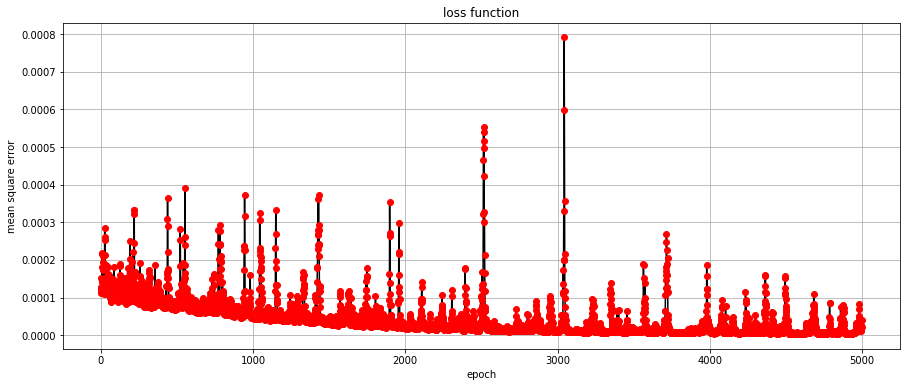

In [84]:
Create_Model(RGB_mac, macbeth_ensemble, 5000)

125631/125631 [==============================] - 3s 27us/sample - loss: 0.1638 - mae: 0.3588
Train on 125631 samples
Epoch 1/1000
125631/125631 [==============================] - 9s 72us/sample - loss: 6.6478e-04 - mae: 0.0115
Epoch 2/1000
125631/125631 [==============================] - 9s 68us/sample - loss: 1.4032e-04 - mae: 0.0073
Epoch 3/1000
125631/125631 [==============================] - 8s 66us/sample - loss: 1.2998e-04 - mae: 0.0069
Epoch 4/1000
125631/125631 [==============================] - 8s 67us/sample - loss: 1.2335e-04 - mae: 0.0066
Epoch 5/1000
125631/125631 [==============================] - 8s 67us/sample - loss: 1.1822e-04 - mae: 0.0064
Epoch 6/1000
125631/125631 [==============================] - 8s 67us/sample - loss: 1.1544e-04 - mae: 0.0063
Epoch 7/1000
125631/125631 [==============================] - 8s 67us/sample - loss: 1.1400e-04 - mae: 0.0063
Epoch 8/1000
125631/125631 [==============================] - 8s 67us/sample - loss: 1.1287e-04 - mae: 0.0062
Epo

125631/125631 [==============================] - 8s 64us/sample - loss: 9.4760e-05 - mae: 0.0056
Epoch 147/1000
125631/125631 [==============================] - 8s 64us/sample - loss: 9.5836e-05 - mae: 0.0056
Epoch 148/1000
125631/125631 [==============================] - 8s 64us/sample - loss: 9.5466e-05 - mae: 0.0056
Epoch 149/1000
125631/125631 [==============================] - 8s 64us/sample - loss: 9.5342e-05 - mae: 0.0056
Epoch 150/1000
125631/125631 [==============================] - 8s 64us/sample - loss: 9.5707e-05 - mae: 0.0056
Epoch 151/1000
125631/125631 [==============================] - 8s 64us/sample - loss: 9.4870e-05 - mae: 0.0056
Epoch 152/1000
125631/125631 [==============================] - 8s 65us/sample - loss: 9.5205e-05 - mae: 0.0056
Epoch 153/1000
125631/125631 [==============================] - 8s 66us/sample - loss: 9.5452e-05 - mae: 0.0056
Epoch 154/1000
125631/125631 [==============================] - 8s 65us/sample - loss: 9.4867e-05 - mae: 0.0056
Epoch 1

125631/125631 [==============================] - 9s 68us/sample - loss: 9.0337e-05 - mae: 0.0054
Epoch 293/1000
125631/125631 [==============================] - 9s 69us/sample - loss: 9.0441e-05 - mae: 0.0054
Epoch 294/1000
125631/125631 [==============================] - 9s 69us/sample - loss: 8.9941e-05 - mae: 0.0054
Epoch 295/1000
125631/125631 [==============================] - 8s 67us/sample - loss: 8.9983e-05 - mae: 0.0054
Epoch 296/1000
125631/125631 [==============================] - 8s 67us/sample - loss: 9.0044e-05 - mae: 0.0054
Epoch 297/1000
125631/125631 [==============================] - 8s 66us/sample - loss: 8.9978e-05 - mae: 0.0054
Epoch 298/1000
125631/125631 [==============================] - 8s 67us/sample - loss: 9.0354e-05 - mae: 0.0054
Epoch 299/1000
125631/125631 [==============================] - 8s 67us/sample - loss: 9.0002e-05 - mae: 0.0054
Epoch 300/1000
125631/125631 [==============================] - 8s 68us/sample - loss: 9.0205e-05 - mae: 0.0054
Epoch 3

125631/125631 [==============================] - 9s 69us/sample - loss: 8.5944e-05 - mae: 0.0053
Epoch 439/1000
125631/125631 [==============================] - 9s 68us/sample - loss: 8.5658e-05 - mae: 0.0053
Epoch 440/1000
125631/125631 [==============================] - 9s 70us/sample - loss: 8.5726e-05 - mae: 0.0053
Epoch 441/1000
125631/125631 [==============================] - 9s 71us/sample - loss: 8.5611e-05 - mae: 0.0053
Epoch 442/1000
125631/125631 [==============================] - 9s 74us/sample - loss: 8.5300e-05 - mae: 0.00531s - loss:
Epoch 443/1000
125631/125631 [==============================] - 9s 74us/sample - loss: 8.5675e-05 - mae: 0.0053
Epoch 444/1000
125631/125631 [==============================] - 9s 69us/sample - loss: 8.5674e-05 - mae: 0.0053
Epoch 445/1000
125631/125631 [==============================] - 9s 71us/sample - loss: 8.5691e-05 - mae: 0.0053
Epoch 446/1000
125631/125631 [==============================] - 9s 70us/sample - loss: 8.5497e-05 - mae: 0.00

125631/125631 [==============================] - 8s 66us/sample - loss: 8.3933e-05 - mae: 0.0052
Epoch 512/1000
125631/125631 [==============================] - 8s 67us/sample - loss: 8.3288e-05 - mae: 0.0052
Epoch 513/1000
125631/125631 [==============================] - 9s 73us/sample - loss: 8.3942e-05 - mae: 0.0053
Epoch 514/1000
125631/125631 [==============================] - 9s 72us/sample - loss: 8.4072e-05 - mae: 0.0053
Epoch 515/1000
125631/125631 [==============================] - 8s 64us/sample - loss: 8.4549e-05 - mae: 0.0053
Epoch 516/1000
125631/125631 [==============================] - 8s 64us/sample - loss: 8.4067e-05 - mae: 0.0052
Epoch 517/1000
125631/125631 [==============================] - 10s 78us/sample - loss: 8.4109e-05 - mae: 0.0053
Epoch 518/1000
125631/125631 [==============================] - 11s 86us/sample - loss: 8.3884e-05 - mae: 0.0052
Epoch 519/1000
125631/125631 [==============================] - 12s 98us/sample - loss: 8.3795e-05 - mae: 0.0052
Epoc

125631/125631 [==============================] - 9s 70us/sample - loss: 8.8915e-05 - mae: 0.0055
Epoch 658/1000
125631/125631 [==============================] - 8s 66us/sample - loss: 8.8210e-05 - mae: 0.0055
Epoch 659/1000
125631/125631 [==============================] - 8s 66us/sample - loss: 8.8425e-05 - mae: 0.0055
Epoch 660/1000
125631/125631 [==============================] - 9s 68us/sample - loss: 8.8667e-05 - mae: 0.0055
Epoch 661/1000
125631/125631 [==============================] - 8s 66us/sample - loss: 9.0692e-05 - mae: 0.0055
Epoch 662/1000
125631/125631 [==============================] - 8s 66us/sample - loss: 8.9804e-05 - mae: 0.0055
Epoch 663/1000
125631/125631 [==============================] - 8s 65us/sample - loss: 8.8439e-05 - mae: 0.0055
Epoch 664/1000
125631/125631 [==============================] - 9s 70us/sample - loss: 8.9173e-05 - mae: 0.0055
Epoch 665/1000
125631/125631 [==============================] - 9s 69us/sample - loss: 9.1446e-05 - mae: 0.0056
Epoch 6

125631/125631 [==============================] - 8s 66us/sample - loss: 8.7739e-05 - mae: 0.0055
Epoch 804/1000
125631/125631 [==============================] - 8s 67us/sample - loss: 8.7193e-05 - mae: 0.0055
Epoch 805/1000
125631/125631 [==============================] - 9s 71us/sample - loss: 8.7314e-05 - mae: 0.0055
Epoch 806/1000
125631/125631 [==============================] - 8s 66us/sample - loss: 8.7096e-05 - mae: 0.0055
Epoch 807/1000
125631/125631 [==============================] - 8s 65us/sample - loss: 8.7987e-05 - mae: 0.0055
Epoch 808/1000
125631/125631 [==============================] - 8s 66us/sample - loss: 8.6852e-05 - mae: 0.0055
Epoch 809/1000
125631/125631 [==============================] - 9s 71us/sample - loss: 8.7961e-05 - mae: 0.0055
Epoch 810/1000
125631/125631 [==============================] - 8s 66us/sample - loss: 8.8129e-05 - mae: 0.0055
Epoch 811/1000
125631/125631 [==============================] - 9s 71us/sample - loss: 8.8450e-05 - mae: 0.0055
Epoch 8

125631/125631 [==============================] - 9s 71us/sample - loss: 8.7161e-05 - mae: 0.0055
Epoch 949/1000
125631/125631 [==============================] - 9s 71us/sample - loss: 8.6317e-05 - mae: 0.0055
Epoch 950/1000
125631/125631 [==============================] - 9s 71us/sample - loss: 8.6392e-05 - mae: 0.0054
Epoch 951/1000
125631/125631 [==============================] - 9s 71us/sample - loss: 8.5642e-05 - mae: 0.0054
Epoch 952/1000
125631/125631 [==============================] - 9s 75us/sample - loss: 8.6247e-05 - mae: 0.0055
Epoch 953/1000
125631/125631 [==============================] - 9s 73us/sample - loss: 8.6838e-05 - mae: 0.0055
Epoch 954/1000
125631/125631 [==============================] - 9s 68us/sample - loss: 8.6803e-05 - mae: 0.0055
Epoch 955/1000
125631/125631 [==============================] - 8s 68us/sample - loss: 8.6210e-05 - mae: 0.0055
Epoch 956/1000
125631/125631 [==============================] - 8s 67us/sample - loss: 8.6914e-05 - mae: 0.0055
Epoch 9

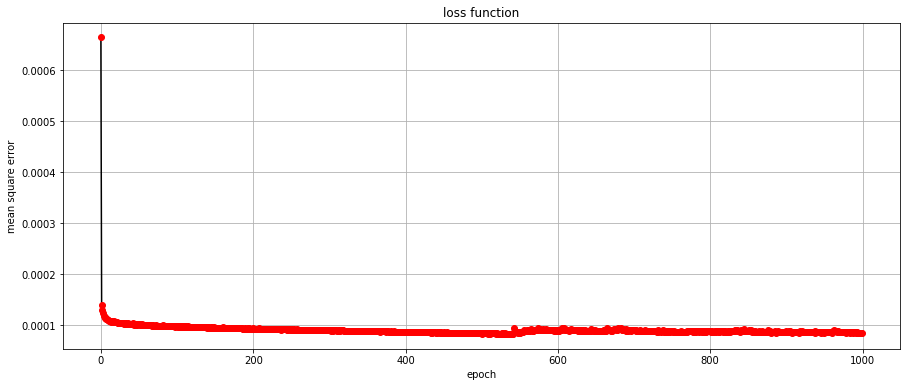

In [37]:
Create_Model(RGB_mun_X, munsell_X, 1000, "munsell_X_1000.model")

125631/125631 [==============================] - 3s 25us/sample - loss: 0.2159 - mae: 0.4227
Train on 125631 samples
Epoch 1/5000
125631/125631 [==============================] - 8s 64us/sample - loss: 7.8034e-04 - mae: 0.0119
Epoch 2/5000
125631/125631 [==============================] - 8s 63us/sample - loss: 1.4269e-04 - mae: 0.0074
Epoch 3/5000
125631/125631 [==============================] - 8s 63us/sample - loss: 1.2822e-04 - mae: 0.0068
Epoch 4/5000
125631/125631 [==============================] - 8s 64us/sample - loss: 1.2104e-04 - mae: 0.0066
Epoch 5/5000
125631/125631 [==============================] - 8s 64us/sample - loss: 1.2246e-04 - mae: 0.0065
Epoch 6/5000
125631/125631 [==============================] - 8s 64us/sample - loss: 1.1479e-04 - mae: 0.0063
Epoch 7/5000
125631/125631 [==============================] - 8s 64us/sample - loss: 1.1419e-04 - mae: 0.0063
Epoch 8/5000
125631/125631 [==============================] - 8s 63us/sample - loss: 1.1095e-04 - mae: 0.0062
Epo

125631/125631 [==============================] - 8s 64us/sample - loss: 9.6122e-05 - mae: 0.0056
Epoch 147/5000
125631/125631 [==============================] - 8s 63us/sample - loss: 9.5659e-05 - mae: 0.0056
Epoch 148/5000
125631/125631 [==============================] - 8s 64us/sample - loss: 9.5389e-05 - mae: 0.0056
Epoch 149/5000
125631/125631 [==============================] - 8s 64us/sample - loss: 9.6399e-05 - mae: 0.0056
Epoch 150/5000
125631/125631 [==============================] - 8s 64us/sample - loss: 9.6049e-05 - mae: 0.0056
Epoch 151/5000
125631/125631 [==============================] - 8s 64us/sample - loss: 9.5632e-05 - mae: 0.0056
Epoch 152/5000
125631/125631 [==============================] - 8s 65us/sample - loss: 9.5924e-05 - mae: 0.0056
Epoch 153/5000
125631/125631 [==============================] - 8s 63us/sample - loss: 9.5472e-05 - mae: 0.0056
Epoch 154/5000
125631/125631 [==============================] - 8s 64us/sample - loss: 9.5820e-05 - mae: 0.0056
Epoch 1

125631/125631 [==============================] - 8s 63us/sample - loss: 9.0360e-05 - mae: 0.0054
Epoch 293/5000
125631/125631 [==============================] - 8s 63us/sample - loss: 9.0877e-05 - mae: 0.0054
Epoch 294/5000
125631/125631 [==============================] - 8s 64us/sample - loss: 9.1038e-05 - mae: 0.0054
Epoch 295/5000
125631/125631 [==============================] - 8s 63us/sample - loss: 9.0572e-05 - mae: 0.0054
Epoch 296/5000
125631/125631 [==============================] - 8s 64us/sample - loss: 9.0492e-05 - mae: 0.0054
Epoch 297/5000
125631/125631 [==============================] - 8s 63us/sample - loss: 8.9924e-05 - mae: 0.0054
Epoch 298/5000
125631/125631 [==============================] - 8s 64us/sample - loss: 9.1585e-05 - mae: 0.0055
Epoch 299/5000
125631/125631 [==============================] - 8s 63us/sample - loss: 8.9650e-05 - mae: 0.0054
Epoch 300/5000
125631/125631 [==============================] - 8s 65us/sample - loss: 8.9918e-05 - mae: 0.0054
Epoch 3

125631/125631 [==============================] - 9s 71us/sample - loss: 8.6684e-05 - mae: 0.0053
Epoch 439/5000
125631/125631 [==============================] - 9s 71us/sample - loss: 8.6143e-05 - mae: 0.0053
Epoch 440/5000
125631/125631 [==============================] - 8s 63us/sample - loss: 8.7016e-05 - mae: 0.0053
Epoch 441/5000
125631/125631 [==============================] - 8s 63us/sample - loss: 8.5971e-05 - mae: 0.0053
Epoch 442/5000
125631/125631 [==============================] - 9s 71us/sample - loss: 8.6357e-05 - mae: 0.0053
Epoch 443/5000
125631/125631 [==============================] - 9s 72us/sample - loss: 8.5767e-05 - mae: 0.0053
Epoch 444/5000
125631/125631 [==============================] - 9s 71us/sample - loss: 8.5494e-05 - mae: 0.0053
Epoch 445/5000
125631/125631 [==============================] - 9s 71us/sample - loss: 8.6434e-05 - mae: 0.0053
Epoch 446/5000
125631/125631 [==============================] - 9s 70us/sample - loss: 8.6335e-05 - mae: 0.0053
Epoch 4

125631/125631 [==============================] - 8s 63us/sample - loss: 9.4479e-05 - mae: 0.0057
Epoch 585/5000
125631/125631 [==============================] - 8s 64us/sample - loss: 9.4081e-05 - mae: 0.0056
Epoch 586/5000
125631/125631 [==============================] - 8s 63us/sample - loss: 9.3566e-05 - mae: 0.0056
Epoch 587/5000
125631/125631 [==============================] - 8s 64us/sample - loss: 9.3602e-05 - mae: 0.0056
Epoch 588/5000
125631/125631 [==============================] - 8s 64us/sample - loss: 9.4587e-05 - mae: 0.0057
Epoch 589/5000
125631/125631 [==============================] - 8s 64us/sample - loss: 9.3664e-05 - mae: 0.0057
Epoch 590/5000
125631/125631 [==============================] - 8s 63us/sample - loss: 9.4375e-05 - mae: 0.0057
Epoch 591/5000
125631/125631 [==============================] - 8s 63us/sample - loss: 9.4242e-05 - mae: 0.0057
Epoch 592/5000
125631/125631 [==============================] - 8s 63us/sample - loss: 9.3009e-05 - mae: 0.0056
Epoch 5

125631/125631 [==============================] - 8s 64us/sample - loss: 9.1349e-05 - mae: 0.0056
Epoch 731/5000
125631/125631 [==============================] - 8s 64us/sample - loss: 9.0977e-05 - mae: 0.0056
Epoch 732/5000
125631/125631 [==============================] - 8s 64us/sample - loss: 9.0506e-05 - mae: 0.0056
Epoch 733/5000
125631/125631 [==============================] - 8s 64us/sample - loss: 9.0927e-05 - mae: 0.0056
Epoch 734/5000
125631/125631 [==============================] - 8s 64us/sample - loss: 9.1510e-05 - mae: 0.0056
Epoch 735/5000
125631/125631 [==============================] - 8s 64us/sample - loss: 9.0803e-05 - mae: 0.0056
Epoch 736/5000
125631/125631 [==============================] - 8s 64us/sample - loss: 9.1765e-05 - mae: 0.0056
Epoch 737/5000
125631/125631 [==============================] - 8s 64us/sample - loss: 9.0837e-05 - mae: 0.0056
Epoch 738/5000
125631/125631 [==============================] - 8s 64us/sample - loss: 9.0494e-05 - mae: 0.0056
Epoch 7

125631/125631 [==============================] - 8s 63us/sample - loss: 8.8536e-05 - mae: 0.0055
Epoch 876/5000
125631/125631 [==============================] - 8s 63us/sample - loss: 8.8901e-05 - mae: 0.0055
Epoch 877/5000
125631/125631 [==============================] - 8s 64us/sample - loss: 8.8076e-05 - mae: 0.0055
Epoch 878/5000
125631/125631 [==============================] - 8s 64us/sample - loss: 8.9651e-05 - mae: 0.0056
Epoch 879/5000
125631/125631 [==============================] - 8s 63us/sample - loss: 8.8534e-05 - mae: 0.0055
Epoch 880/5000
125631/125631 [==============================] - 8s 63us/sample - loss: 8.9254e-05 - mae: 0.0055
Epoch 881/5000
125631/125631 [==============================] - 8s 63us/sample - loss: 8.8840e-05 - mae: 0.0055
Epoch 882/5000
125631/125631 [==============================] - 8s 63us/sample - loss: 8.9380e-05 - mae: 0.0056
Epoch 883/5000
125631/125631 [==============================] - 8s 63us/sample - loss: 8.8856e-05 - mae: 0.0055
Epoch 8

125631/125631 [==============================] - 8s 64us/sample - loss: 8.7415e-05 - mae: 0.0055
Epoch 1022/5000
125631/125631 [==============================] - 8s 63us/sample - loss: 8.7309e-05 - mae: 0.0055
Epoch 1023/5000
125631/125631 [==============================] - 8s 64us/sample - loss: 8.6967e-05 - mae: 0.0055
Epoch 1024/5000
125631/125631 [==============================] - 8s 63us/sample - loss: 8.7085e-05 - mae: 0.0055
Epoch 1025/5000
125631/125631 [==============================] - 8s 63us/sample - loss: 8.7386e-05 - mae: 0.0055
Epoch 1026/5000
125631/125631 [==============================] - 8s 63us/sample - loss: 8.5988e-05 - mae: 0.0054
Epoch 1027/5000
125631/125631 [==============================] - 8s 64us/sample - loss: 8.8419e-05 - mae: 0.0055
Epoch 1028/5000
125631/125631 [==============================] - 8s 64us/sample - loss: 8.6309e-05 - mae: 0.0055
Epoch 1029/5000
125631/125631 [==============================] - 8s 63us/sample - loss: 8.7064e-05 - mae: 0.0055

125631/125631 [==============================] - 8s 64us/sample - loss: 8.7487e-05 - mae: 0.0055
Epoch 1166/5000
125631/125631 [==============================] - 8s 63us/sample - loss: 8.6872e-05 - mae: 0.0055
Epoch 1167/5000
125631/125631 [==============================] - 8s 63us/sample - loss: 8.6762e-05 - mae: 0.0055
Epoch 1168/5000
125631/125631 [==============================] - 8s 64us/sample - loss: 8.8030e-05 - mae: 0.0055
Epoch 1169/5000
125631/125631 [==============================] - 8s 65us/sample - loss: 8.6165e-05 - mae: 0.0055
Epoch 1170/5000
125631/125631 [==============================] - 8s 64us/sample - loss: 8.7109e-05 - mae: 0.0055
Epoch 1171/5000
125631/125631 [==============================] - 8s 64us/sample - loss: 8.6921e-05 - mae: 0.0055
Epoch 1172/5000
125631/125631 [==============================] - 8s 63us/sample - loss: 8.6690e-05 - mae: 0.0055
Epoch 1173/5000
125631/125631 [==============================] - 8s 63us/sample - loss: 8.6211e-05 - mae: 0.0055

125631/125631 [==============================] - 8s 64us/sample - loss: 9.3889e-05 - mae: 0.0058
Epoch 1310/5000
125631/125631 [==============================] - 8s 63us/sample - loss: 9.2384e-05 - mae: 0.0057
Epoch 1311/5000
125631/125631 [==============================] - 8s 63us/sample - loss: 9.2093e-05 - mae: 0.0057
Epoch 1312/5000
125631/125631 [==============================] - 8s 64us/sample - loss: 9.0249e-05 - mae: 0.0057
Epoch 1313/5000
125631/125631 [==============================] - 8s 64us/sample - loss: 9.1887e-05 - mae: 0.0057
Epoch 1314/5000
125631/125631 [==============================] - 8s 63us/sample - loss: 8.9140e-05 - mae: 0.0056
Epoch 1315/5000
125631/125631 [==============================] - 8s 64us/sample - loss: 9.0697e-05 - mae: 0.0056
Epoch 1316/5000
125631/125631 [==============================] - 8s 63us/sample - loss: 8.8635e-05 - mae: 0.0056
Epoch 1317/5000
125631/125631 [==============================] - 8s 64us/sample - loss: 8.9275e-05 - mae: 0.0056

125631/125631 [==============================] - 8s 64us/sample - loss: 8.5121e-05 - mae: 0.0055
Epoch 1454/5000
125631/125631 [==============================] - 8s 63us/sample - loss: 8.3951e-05 - mae: 0.0054
Epoch 1455/5000
125631/125631 [==============================] - 8s 63us/sample - loss: 8.3973e-05 - mae: 0.0054
Epoch 1456/5000
125631/125631 [==============================] - 8s 63us/sample - loss: 8.4527e-05 - mae: 0.0054
Epoch 1457/5000
125631/125631 [==============================] - 8s 64us/sample - loss: 8.4911e-05 - mae: 0.0054
Epoch 1458/5000
125631/125631 [==============================] - 8s 63us/sample - loss: 8.4849e-05 - mae: 0.0054
Epoch 1459/5000
125631/125631 [==============================] - 8s 63us/sample - loss: 8.3985e-05 - mae: 0.0054
Epoch 1460/5000
125631/125631 [==============================] - 8s 63us/sample - loss: 8.4131e-05 - mae: 0.0054
Epoch 1461/5000
125631/125631 [==============================] - 8s 64us/sample - loss: 8.3544e-05 - mae: 0.0054

125631/125631 [==============================] - 8s 63us/sample - loss: 8.1725e-05 - mae: 0.0053
Epoch 1598/5000
125631/125631 [==============================] - ETA: 0s - loss: 8.3495e-05 - mae: 0.005 - 8s 63us/sample - loss: 8.3491e-05 - mae: 0.0054
Epoch 1599/5000
125631/125631 [==============================] - 8s 64us/sample - loss: 8.3105e-05 - mae: 0.0054
Epoch 1600/5000
125631/125631 [==============================] - 8s 63us/sample - loss: 8.2253e-05 - mae: 0.0054
Epoch 1601/5000
125631/125631 [==============================] - 8s 64us/sample - loss: 8.2038e-05 - mae: 0.0054
Epoch 1602/5000
125631/125631 [==============================] - 8s 65us/sample - loss: 8.2545e-05 - mae: 0.0054
Epoch 1603/5000
125631/125631 [==============================] - 8s 64us/sample - loss: 8.3219e-05 - mae: 0.0054
Epoch 1604/5000
125631/125631 [==============================] - 8s 63us/sample - loss: 8.2219e-05 - mae: 0.0054
Epoch 1605/5000
125631/125631 [==============================] - 8s 64

125631/125631 [==============================] - 8s 63us/sample - loss: 8.4005e-05 - mae: 0.0054
Epoch 1742/5000
125631/125631 [==============================] - 8s 63us/sample - loss: 8.4791e-05 - mae: 0.0055
Epoch 1743/5000
125631/125631 [==============================] - 8s 63us/sample - loss: 8.3436e-05 - mae: 0.0054
Epoch 1744/5000
125631/125631 [==============================] - 8s 64us/sample - loss: 8.5592e-05 - mae: 0.0055
Epoch 1745/5000
125631/125631 [==============================] - 8s 64us/sample - loss: 8.3882e-05 - mae: 0.0054
Epoch 1746/5000
125631/125631 [==============================] - 8s 64us/sample - loss: 8.3642e-05 - mae: 0.0054
Epoch 1747/5000
125631/125631 [==============================] - 8s 63us/sample - loss: 8.3503e-05 - mae: 0.0054
Epoch 1748/5000
125631/125631 [==============================] - 8s 63us/sample - loss: 8.2347e-05 - mae: 0.0054
Epoch 1749/5000
125631/125631 [==============================] - 8s 63us/sample - loss: 8.4331e-05 - mae: 0.0054

125631/125631 [==============================] - 8s 64us/sample - loss: 8.0982e-05 - mae: 0.0053
Epoch 1886/5000
125631/125631 [==============================] - 8s 64us/sample - loss: 8.1352e-05 - mae: 0.0053
Epoch 1887/5000
125631/125631 [==============================] - 8s 64us/sample - loss: 8.1162e-05 - mae: 0.0053
Epoch 1888/5000
125631/125631 [==============================] - 8s 64us/sample - loss: 8.1722e-05 - mae: 0.0054
Epoch 1889/5000
125631/125631 [==============================] - 8s 63us/sample - loss: 8.1480e-05 - mae: 0.0053
Epoch 1890/5000
125631/125631 [==============================] - 8s 63us/sample - loss: 8.1780e-05 - mae: 0.0054
Epoch 1891/5000
125631/125631 [==============================] - 8s 63us/sample - loss: 8.1645e-05 - mae: 0.0053
Epoch 1892/5000
125631/125631 [==============================] - 8s 64us/sample - loss: 8.1022e-05 - mae: 0.0053
Epoch 1893/5000
125631/125631 [==============================] - 8s 64us/sample - loss: 8.2603e-05 - mae: 0.0054

125631/125631 [==============================] - 8s 63us/sample - loss: 7.9582e-05 - mae: 0.0053
Epoch 2030/5000
125631/125631 [==============================] - 8s 63us/sample - loss: 8.1008e-05 - mae: 0.0053
Epoch 2031/5000
125631/125631 [==============================] - 8s 63us/sample - loss: 7.9914e-05 - mae: 0.0053
Epoch 2032/5000
125631/125631 [==============================] - 8s 64us/sample - loss: 8.1818e-05 - mae: 0.0054
Epoch 2033/5000
125631/125631 [==============================] - 8s 64us/sample - loss: 8.5156e-05 - mae: 0.0055
Epoch 2034/5000
125631/125631 [==============================] - 8s 64us/sample - loss: 8.4437e-05 - mae: 0.0055
Epoch 2035/5000
125631/125631 [==============================] - 8s 63us/sample - loss: 8.4602e-05 - mae: 0.0055
Epoch 2036/5000
125631/125631 [==============================] - 8s 63us/sample - loss: 8.4493e-05 - mae: 0.0055
Epoch 2037/5000
125631/125631 [==============================] - 8s 63us/sample - loss: 8.3136e-05 - mae: 0.0054

125631/125631 [==============================] - 8s 63us/sample - loss: 8.1037e-05 - mae: 0.0053
Epoch 2174/5000
125631/125631 [==============================] - 8s 63us/sample - loss: 8.0446e-05 - mae: 0.0053
Epoch 2175/5000
125631/125631 [==============================] - 8s 63us/sample - loss: 8.0134e-05 - mae: 0.0053
Epoch 2176/5000
125631/125631 [==============================] - 8s 63us/sample - loss: 7.9478e-05 - mae: 0.0053
Epoch 2177/5000
125631/125631 [==============================] - 8s 63us/sample - loss: 8.0047e-05 - mae: 0.0053
Epoch 2178/5000
125631/125631 [==============================] - 8s 64us/sample - loss: 7.9938e-05 - mae: 0.0053
Epoch 2179/5000
125631/125631 [==============================] - 8s 63us/sample - loss: 7.9161e-05 - mae: 0.0053
Epoch 2180/5000
125631/125631 [==============================] - 8s 63us/sample - loss: 7.9580e-05 - mae: 0.0053
Epoch 2181/5000
125631/125631 [==============================] - 8s 63us/sample - loss: 8.1413e-05 - mae: 0.0054

125631/125631 [==============================] - 8s 63us/sample - loss: 7.7828e-05 - mae: 0.0052
Epoch 2318/5000
125631/125631 [==============================] - 8s 64us/sample - loss: 7.7820e-05 - mae: 0.0052
Epoch 2319/5000
125631/125631 [==============================] - 8s 63us/sample - loss: 7.7274e-05 - mae: 0.0052
Epoch 2320/5000
125631/125631 [==============================] - 8s 63us/sample - loss: 7.8101e-05 - mae: 0.0052
Epoch 2321/5000
125631/125631 [==============================] - 8s 64us/sample - loss: 7.7812e-05 - mae: 0.0052
Epoch 2322/5000
125631/125631 [==============================] - 8s 63us/sample - loss: 7.7526e-05 - mae: 0.0052
Epoch 2323/5000
125631/125631 [==============================] - 8s 64us/sample - loss: 7.7863e-05 - mae: 0.0052
Epoch 2324/5000
125631/125631 [==============================] - 8s 64us/sample - loss: 7.7046e-05 - mae: 0.0052
Epoch 2325/5000
125631/125631 [==============================] - 8s 63us/sample - loss: 7.7676e-05 - mae: 0.0052

125631/125631 [==============================] - 8s 63us/sample - loss: 7.7492e-05 - mae: 0.0052
Epoch 2462/5000
125631/125631 [==============================] - 8s 63us/sample - loss: 7.6352e-05 - mae: 0.0052
Epoch 2463/5000
125631/125631 [==============================] - 8s 63us/sample - loss: 7.6916e-05 - mae: 0.0052
Epoch 2464/5000
125631/125631 [==============================] - 8s 63us/sample - loss: 7.7859e-05 - mae: 0.0052
Epoch 2465/5000
125631/125631 [==============================] - 8s 63us/sample - loss: 7.7215e-05 - mae: 0.0052
Epoch 2466/5000
125631/125631 [==============================] - 8s 63us/sample - loss: 7.8697e-05 - mae: 0.0052
Epoch 2467/5000
125631/125631 [==============================] - 8s 65us/sample - loss: 7.6527e-05 - mae: 0.0052
Epoch 2468/5000
125631/125631 [==============================] - 8s 64us/sample - loss: 7.7130e-05 - mae: 0.0052
Epoch 2469/5000
125631/125631 [==============================] - 8s 64us/sample - loss: 7.7945e-05 - mae: 0.0052

125631/125631 [==============================] - 8s 64us/sample - loss: 8.1303e-05 - mae: 0.0054
Epoch 2606/5000
125631/125631 [==============================] - 8s 63us/sample - loss: 7.9171e-05 - mae: 0.0053
Epoch 2607/5000
125631/125631 [==============================] - 8s 63us/sample - loss: 7.9000e-05 - mae: 0.0053
Epoch 2608/5000
125631/125631 [==============================] - 8s 63us/sample - loss: 7.9202e-05 - mae: 0.0053
Epoch 2609/5000
125631/125631 [==============================] - 8s 63us/sample - loss: 7.8260e-05 - mae: 0.0053
Epoch 2610/5000
125631/125631 [==============================] - 8s 63us/sample - loss: 7.9313e-05 - mae: 0.0053
Epoch 2611/5000
125631/125631 [==============================] - 8s 63us/sample - loss: 7.8407e-05 - mae: 0.0053
Epoch 2612/5000
125631/125631 [==============================] - 8s 64us/sample - loss: 7.8285e-05 - mae: 0.0053
Epoch 2613/5000
125631/125631 [==============================] - 8s 63us/sample - loss: 7.9383e-05 - mae: 0.0053

125631/125631 [==============================] - 8s 63us/sample - loss: 7.7195e-05 - mae: 0.0052
Epoch 2750/5000
125631/125631 [==============================] - 8s 64us/sample - loss: 7.7681e-05 - mae: 0.0052
Epoch 2751/5000
125631/125631 [==============================] - 8s 65us/sample - loss: 7.7781e-05 - mae: 0.0052
Epoch 2752/5000
125631/125631 [==============================] - 8s 64us/sample - loss: 7.6997e-05 - mae: 0.0052
Epoch 2753/5000
125631/125631 [==============================] - 8s 63us/sample - loss: 7.7313e-05 - mae: 0.0052
Epoch 2754/5000
125631/125631 [==============================] - 8s 63us/sample - loss: 7.8098e-05 - mae: 0.0052
Epoch 2755/5000
125631/125631 [==============================] - 8s 64us/sample - loss: 7.7164e-05 - mae: 0.0052
Epoch 2756/5000
125631/125631 [==============================] - 8s 63us/sample - loss: 7.7962e-05 - mae: 0.0052
Epoch 2757/5000
125631/125631 [==============================] - 8s 64us/sample - loss: 7.7013e-05 - mae: 0.0052

125631/125631 [==============================] - 8s 63us/sample - loss: 7.9428e-05 - mae: 0.0053
Epoch 2894/5000
125631/125631 [==============================] - 8s 63us/sample - loss: 7.8388e-05 - mae: 0.0053
Epoch 2895/5000
125631/125631 [==============================] - 8s 63us/sample - loss: 7.8454e-05 - mae: 0.0053
Epoch 2896/5000
125631/125631 [==============================] - 8s 63us/sample - loss: 7.8891e-05 - mae: 0.0053
Epoch 2897/5000
125631/125631 [==============================] - 8s 64us/sample - loss: 7.7984e-05 - mae: 0.0053
Epoch 2898/5000
125631/125631 [==============================] - 8s 63us/sample - loss: 7.7734e-05 - mae: 0.0053
Epoch 2899/5000
125631/125631 [==============================] - 8s 64us/sample - loss: 7.8374e-05 - mae: 0.0053
Epoch 2900/5000
125631/125631 [==============================] - 8s 64us/sample - loss: 7.8614e-05 - mae: 0.0053
Epoch 2901/5000
125631/125631 [==============================] - 8s 65us/sample - loss: 7.7472e-05 - mae: 0.0052

125631/125631 [==============================] - 8s 63us/sample - loss: 7.5753e-05 - mae: 0.0052
Epoch 3038/5000
125631/125631 [==============================] - 8s 63us/sample - loss: 7.6298e-05 - mae: 0.0052
Epoch 3039/5000
125631/125631 [==============================] - 8s 63us/sample - loss: 7.6092e-05 - mae: 0.0052
Epoch 3040/5000
125631/125631 [==============================] - 8s 64us/sample - loss: 7.5753e-05 - mae: 0.0052
Epoch 3041/5000
125631/125631 [==============================] - 8s 64us/sample - loss: 7.7347e-05 - mae: 0.0052
Epoch 3042/5000
125631/125631 [==============================] - 8s 63us/sample - loss: 7.5269e-05 - mae: 0.0052
Epoch 3043/5000
125631/125631 [==============================] - 8s 63us/sample - loss: 7.5308e-05 - mae: 0.0052
Epoch 3044/5000
125631/125631 [==============================] - 8s 63us/sample - loss: 7.5512e-05 - mae: 0.0052
Epoch 3045/5000
125631/125631 [==============================] - 8s 64us/sample - loss: 7.6925e-05 - mae: 0.0052

125631/125631 [==============================] - 8s 63us/sample - loss: 7.4443e-05 - mae: 0.0051
Epoch 3182/5000
125631/125631 [==============================] - 8s 63us/sample - loss: 7.5221e-05 - mae: 0.0052
Epoch 3183/5000
125631/125631 [==============================] - 8s 63us/sample - loss: 7.4228e-05 - mae: 0.0051
Epoch 3184/5000
125631/125631 [==============================] - 8s 64us/sample - loss: 7.5520e-05 - mae: 0.0052
Epoch 3185/5000
125631/125631 [==============================] - 8s 64us/sample - loss: 7.5193e-05 - mae: 0.0052
Epoch 3186/5000
125631/125631 [==============================] - 8s 63us/sample - loss: 7.4009e-05 - mae: 0.0051
Epoch 3187/5000
125631/125631 [==============================] - 8s 63us/sample - loss: 7.4156e-05 - mae: 0.0051
Epoch 3188/5000
125631/125631 [==============================] - 8s 63us/sample - loss: 7.6741e-05 - mae: 0.0052
Epoch 3189/5000
125631/125631 [==============================] - ETA: 0s - loss: 7.4388e-05 - mae: 0.005 - 8s 63

125631/125631 [==============================] - 8s 63us/sample - loss: 7.5677e-05 - mae: 0.0052
Epoch 3326/5000
125631/125631 [==============================] - 8s 63us/sample - loss: 7.4114e-05 - mae: 0.0051
Epoch 3327/5000
125631/125631 [==============================] - 8s 63us/sample - loss: 7.4461e-05 - mae: 0.0051
Epoch 3328/5000
125631/125631 [==============================] - 8s 63us/sample - loss: 7.5448e-05 - mae: 0.0052
Epoch 3329/5000
125631/125631 [==============================] - 8s 64us/sample - loss: 7.5884e-05 - mae: 0.0052
Epoch 3330/5000
125631/125631 [==============================] - 8s 63us/sample - loss: 7.6798e-05 - mae: 0.0052
Epoch 3331/5000
125631/125631 [==============================] - 8s 63us/sample - loss: 7.5571e-05 - mae: 0.0052
Epoch 3332/5000
125631/125631 [==============================] - 8s 63us/sample - loss: 7.6042e-05 - mae: 0.0052
Epoch 3333/5000
125631/125631 [==============================] - 8s 64us/sample - loss: 7.4867e-05 - mae: 0.0052

125631/125631 [==============================] - 8s 63us/sample - loss: 7.4790e-05 - mae: 0.0051
Epoch 3470/5000
125631/125631 [==============================] - 8s 63us/sample - loss: 7.4196e-05 - mae: 0.0051
Epoch 3471/5000
125631/125631 [==============================] - 8s 63us/sample - loss: 7.6216e-05 - mae: 0.0052
Epoch 3472/5000
125631/125631 [==============================] - 8s 64us/sample - loss: 7.5224e-05 - mae: 0.0052
Epoch 3473/5000
125631/125631 [==============================] - 8s 64us/sample - loss: 7.3740e-05 - mae: 0.0051
Epoch 3474/5000
125631/125631 [==============================] - 8s 65us/sample - loss: 7.3854e-05 - mae: 0.0051
Epoch 3475/5000
125631/125631 [==============================] - 8s 63us/sample - loss: 7.4902e-05 - mae: 0.0052
Epoch 3476/5000
125631/125631 [==============================] - 8s 63us/sample - loss: 7.4269e-05 - mae: 0.0051
Epoch 3477/5000
125631/125631 [==============================] - 8s 63us/sample - loss: 7.5226e-05 - mae: 0.0051

125631/125631 [==============================] - 8s 63us/sample - loss: 7.5119e-05 - mae: 0.0052
Epoch 3614/5000
125631/125631 [==============================] - 8s 63us/sample - loss: 7.3191e-05 - mae: 0.0051
Epoch 3615/5000
125631/125631 [==============================] - 8s 64us/sample - loss: 7.4551e-05 - mae: 0.0052
Epoch 3616/5000
125631/125631 [==============================] - 8s 64us/sample - loss: 7.3568e-05 - mae: 0.0051
Epoch 3617/5000
125631/125631 [==============================] - 8s 64us/sample - loss: 7.3069e-05 - mae: 0.0051
Epoch 3618/5000
125631/125631 [==============================] - 8s 64us/sample - loss: 7.4077e-05 - mae: 0.0051
Epoch 3619/5000
125631/125631 [==============================] - 8s 63us/sample - loss: 7.3253e-05 - mae: 0.0051
Epoch 3620/5000
125631/125631 [==============================] - 8s 64us/sample - loss: 7.4946e-05 - mae: 0.0051
Epoch 3621/5000
125631/125631 [==============================] - 8s 63us/sample - loss: 7.4819e-05 - mae: 0.0051

125631/125631 [==============================] - 8s 64us/sample - loss: 7.4669e-05 - mae: 0.0052
Epoch 3758/5000
125631/125631 [==============================] - 8s 64us/sample - loss: 7.4312e-05 - mae: 0.0052
Epoch 3759/5000
125631/125631 [==============================] - 8s 64us/sample - loss: 7.3635e-05 - mae: 0.0051
Epoch 3760/5000
125631/125631 [==============================] - 8s 63us/sample - loss: 7.3976e-05 - mae: 0.0051
Epoch 3761/5000
125631/125631 [==============================] - 8s 64us/sample - loss: 7.3382e-05 - mae: 0.0051
Epoch 3762/5000
125631/125631 [==============================] - 8s 64us/sample - loss: 7.4029e-05 - mae: 0.0051
Epoch 3763/5000
125631/125631 [==============================] - 8s 63us/sample - loss: 7.4159e-05 - mae: 0.0051
Epoch 3764/5000
125631/125631 [==============================] - 8s 64us/sample - loss: 7.4096e-05 - mae: 0.0051
Epoch 3765/5000
125631/125631 [==============================] - 8s 64us/sample - loss: 7.3934e-05 - mae: 0.0051

125631/125631 [==============================] - 8s 64us/sample - loss: 7.1869e-05 - mae: 0.0051
Epoch 3902/5000
125631/125631 [==============================] - 8s 65us/sample - loss: 7.2489e-05 - mae: 0.0051
Epoch 3903/5000
125631/125631 [==============================] - 8s 63us/sample - loss: 7.2730e-05 - mae: 0.0051
Epoch 3904/5000
125631/125631 [==============================] - 8s 63us/sample - loss: 7.3114e-05 - mae: 0.0051
Epoch 3905/5000
125631/125631 [==============================] - 8s 64us/sample - loss: 7.1957e-05 - mae: 0.0051
Epoch 3906/5000
125631/125631 [==============================] - 8s 63us/sample - loss: 7.3131e-05 - mae: 0.0051
Epoch 3907/5000
125631/125631 [==============================] - 8s 64us/sample - loss: 7.3405e-05 - mae: 0.0051
Epoch 3908/5000
125631/125631 [==============================] - 8s 63us/sample - loss: 7.2514e-05 - mae: 0.0051
Epoch 3909/5000
125631/125631 [==============================] - 8s 63us/sample - loss: 7.2379e-05 - mae: 0.0051

125631/125631 [==============================] - 8s 64us/sample - loss: 7.1550e-05 - mae: 0.0050
Epoch 4046/5000
125631/125631 [==============================] - 8s 63us/sample - loss: 7.4166e-05 - mae: 0.0051
Epoch 4047/5000
125631/125631 [==============================] - 8s 63us/sample - loss: 7.3279e-05 - mae: 0.0051
Epoch 4048/5000
125631/125631 [==============================] - 8s 64us/sample - loss: 7.2767e-05 - mae: 0.0051
Epoch 4049/5000
125631/125631 [==============================] - 8s 65us/sample - loss: 7.1889e-05 - mae: 0.0051
Epoch 4050/5000
125631/125631 [==============================] - 8s 64us/sample - loss: 7.2498e-05 - mae: 0.0051
Epoch 4051/5000
125631/125631 [==============================] - 8s 63us/sample - loss: 7.2469e-05 - mae: 0.0051
Epoch 4052/5000
125631/125631 [==============================] - 8s 63us/sample - loss: 7.2625e-05 - mae: 0.0051
Epoch 4053/5000
125631/125631 [==============================] - 8s 64us/sample - loss: 7.2131e-05 - mae: 0.0051

125631/125631 [==============================] - 8s 64us/sample - loss: 7.2521e-05 - mae: 0.0051
Epoch 4190/5000
125631/125631 [==============================] - 8s 63us/sample - loss: 7.2677e-05 - mae: 0.0051
Epoch 4191/5000
125631/125631 [==============================] - 8s 63us/sample - loss: 7.2940e-05 - mae: 0.0051
Epoch 4192/5000
125631/125631 [==============================] - 8s 63us/sample - loss: 7.1787e-05 - mae: 0.0051
Epoch 4193/5000
125631/125631 [==============================] - 8s 63us/sample - loss: 7.2266e-05 - mae: 0.0051
Epoch 4194/5000
125631/125631 [==============================] - 8s 63us/sample - loss: 7.1918e-05 - mae: 0.0051
Epoch 4195/5000
125631/125631 [==============================] - 8s 64us/sample - loss: 7.2506e-05 - mae: 0.0051
Epoch 4196/5000
125631/125631 [==============================] - 8s 64us/sample - loss: 7.2860e-05 - mae: 0.0051
Epoch 4197/5000
125631/125631 [==============================] - 8s 65us/sample - loss: 7.3015e-05 - mae: 0.0051

125631/125631 [==============================] - 8s 64us/sample - loss: 7.1348e-05 - mae: 0.0051
Epoch 4334/5000
125631/125631 [==============================] - 8s 64us/sample - loss: 7.3841e-05 - mae: 0.0051
Epoch 4335/5000
125631/125631 [==============================] - 8s 64us/sample - loss: 7.2203e-05 - mae: 0.0051
Epoch 4336/5000
125631/125631 [==============================] - 8s 64us/sample - loss: 7.2582e-05 - mae: 0.0051
Epoch 4337/5000
125631/125631 [==============================] - 8s 64us/sample - loss: 7.1879e-05 - mae: 0.0051
Epoch 4338/5000
125631/125631 [==============================] - 8s 63us/sample - loss: 7.2424e-05 - mae: 0.0051
Epoch 4339/5000
125631/125631 [==============================] - 8s 64us/sample - loss: 7.1808e-05 - mae: 0.0051
Epoch 4340/5000
125631/125631 [==============================] - 8s 64us/sample - loss: 7.1405e-05 - mae: 0.0050
Epoch 4341/5000
125631/125631 [==============================] - 8s 63us/sample - loss: 7.2327e-05 - mae: 0.0051

125631/125631 [==============================] - 8s 64us/sample - loss: 7.1751e-05 - mae: 0.0050
Epoch 4478/5000
125631/125631 [==============================] - 8s 64us/sample - loss: 7.0545e-05 - mae: 0.0050
Epoch 4479/5000
125631/125631 [==============================] - 8s 64us/sample - loss: 7.1178e-05 - mae: 0.0050
Epoch 4480/5000
125631/125631 [==============================] - 8s 65us/sample - loss: 7.0695e-05 - mae: 0.0050
Epoch 4481/5000
125631/125631 [==============================] - 8s 64us/sample - loss: 7.0461e-05 - mae: 0.0050
Epoch 4482/5000
125631/125631 [==============================] - 8s 65us/sample - loss: 7.2182e-05 - mae: 0.0051
Epoch 4483/5000
125631/125631 [==============================] - 8s 65us/sample - loss: 7.3389e-05 - mae: 0.0051
Epoch 4484/5000
125631/125631 [==============================] - 8s 64us/sample - loss: 7.0780e-05 - mae: 0.0050
Epoch 4485/5000
125631/125631 [==============================] - 8s 63us/sample - loss: 7.1253e-05 - mae: 0.0050

125631/125631 [==============================] - 8s 64us/sample - loss: 7.2154e-05 - mae: 0.0051
Epoch 4622/5000
125631/125631 [==============================] - 8s 63us/sample - loss: 7.1785e-05 - mae: 0.0051
Epoch 4623/5000
125631/125631 [==============================] - 8s 63us/sample - loss: 7.0811e-05 - mae: 0.0050
Epoch 4624/5000
125631/125631 [==============================] - 8s 64us/sample - loss: 7.2429e-05 - mae: 0.0051
Epoch 4625/5000
125631/125631 [==============================] - 8s 63us/sample - loss: 7.0554e-05 - mae: 0.0050
Epoch 4626/5000
125631/125631 [==============================] - 8s 63us/sample - loss: 7.1320e-05 - mae: 0.0051
Epoch 4627/5000
125631/125631 [==============================] - 8s 63us/sample - loss: 7.1557e-05 - mae: 0.0050
Epoch 4628/5000
125631/125631 [==============================] - 8s 64us/sample - loss: 7.2081e-05 - mae: 0.0051
Epoch 4629/5000
125631/125631 [==============================] - 8s 65us/sample - loss: 6.9962e-05 - mae: 0.0050

125631/125631 [==============================] - 8s 64us/sample - loss: 7.2165e-05 - mae: 0.0051
Epoch 4766/5000
125631/125631 [==============================] - 8s 68us/sample - loss: 7.1233e-05 - mae: 0.0051
Epoch 4767/5000
125631/125631 [==============================] - 8s 67us/sample - loss: 7.1702e-05 - mae: 0.0051
Epoch 4768/5000
125631/125631 [==============================] - 9s 70us/sample - loss: 7.3823e-05 - mae: 0.0052
Epoch 4769/5000
125631/125631 [==============================] - 8s 66us/sample - loss: 7.1694e-05 - mae: 0.0051
Epoch 4770/5000
125631/125631 [==============================] - 8s 63us/sample - loss: 7.2962e-05 - mae: 0.0051
Epoch 4771/5000
125631/125631 [==============================] - 8s 63us/sample - loss: 7.1125e-05 - mae: 0.0051
Epoch 4772/5000
125631/125631 [==============================] - 8s 64us/sample - loss: 7.1059e-05 - mae: 0.0051
Epoch 4773/5000
125631/125631 [==============================] - 8s 63us/sample - loss: 7.0264e-05 - mae: 0.0050

125631/125631 [==============================] - 8s 64us/sample - loss: 7.0244e-05 - mae: 0.0050
Epoch 4910/5000
125631/125631 [==============================] - 8s 64us/sample - loss: 7.0791e-05 - mae: 0.0050
Epoch 4911/5000
125631/125631 [==============================] - 8s 64us/sample - loss: 7.0195e-05 - mae: 0.0050
Epoch 4912/5000
125631/125631 [==============================] - 8s 63us/sample - loss: 6.9353e-05 - mae: 0.0050
Epoch 4913/5000
125631/125631 [==============================] - 8s 64us/sample - loss: 7.0757e-05 - mae: 0.0050
Epoch 4914/5000
125631/125631 [==============================] - 8s 64us/sample - loss: 7.0411e-05 - mae: 0.0050
Epoch 4915/5000
125631/125631 [==============================] - 8s 64us/sample - loss: 6.9989e-05 - mae: 0.0050
Epoch 4916/5000
125631/125631 [==============================] - 8s 63us/sample - loss: 6.9576e-05 - mae: 0.0050
Epoch 4917/5000
125631/125631 [==============================] - 8s 64us/sample - loss: 7.0129e-05 - mae: 0.0050

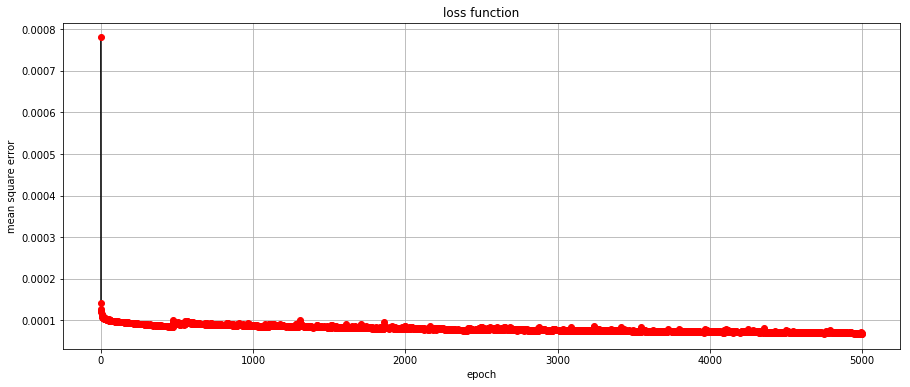

In [44]:
Create_Model(RGB_mun_X, munsell_X, 5000, "munsell_X_5000.model")

125631/125631 [==============================] - 3s 26us/sample - loss: 0.1856 - mae: 0.3893
Train on 125631 samples
Epoch 1/10000
125631/125631 [==============================] - 8s 65us/sample - loss: 7.4474e-04 - mae: 0.0116
Epoch 2/10000
125631/125631 [==============================] - 8s 64us/sample - loss: 1.4057e-04 - mae: 0.0073
Epoch 3/10000
125631/125631 [==============================] - 8s 63us/sample - loss: 1.2857e-04 - mae: 0.0068
Epoch 4/10000
125631/125631 [==============================] - 8s 62us/sample - loss: 1.2206e-04 - mae: 0.0066
Epoch 5/10000
125631/125631 [==============================] - 8s 63us/sample - loss: 1.1769e-04 - mae: 0.0064
Epoch 6/10000
125631/125631 [==============================] - 8s 63us/sample - loss: 1.1500e-04 - mae: 0.0063
Epoch 7/10000
125631/125631 [==============================] - 8s 62us/sample - loss: 1.1359e-04 - mae: 0.0062
Epoch 8/10000
125631/125631 [==============================] - 8s 62us/sample - loss: 1.1099e-04 - mae: 0.

125631/125631 [==============================] - 8s 63us/sample - loss: 9.4836e-05 - mae: 0.0056
Epoch 146/10000
125631/125631 [==============================] - 8s 63us/sample - loss: 9.4887e-05 - mae: 0.0056
Epoch 147/10000
125631/125631 [==============================] - 8s 63us/sample - loss: 9.5626e-05 - mae: 0.0056
Epoch 148/10000
125631/125631 [==============================] - 8s 63us/sample - loss: 9.5799e-05 - mae: 0.0056
Epoch 149/10000
125631/125631 [==============================] - 8s 63us/sample - loss: 9.5207e-05 - mae: 0.0056
Epoch 150/10000
125631/125631 [==============================] - 8s 64us/sample - loss: 9.5964e-05 - mae: 0.0056
Epoch 151/10000
125631/125631 [==============================] - 8s 64us/sample - loss: 9.4311e-05 - mae: 0.0055
Epoch 152/10000
125631/125631 [==============================] - 8s 64us/sample - loss: 9.5018e-05 - mae: 0.0056
Epoch 153/10000
125631/125631 [==============================] - 8s 64us/sample - loss: 9.4856e-05 - mae: 0.0056

125631/125631 [==============================] - 8s 64us/sample - loss: 9.0408e-05 - mae: 0.0054
Epoch 290/10000
125631/125631 [==============================] - 8s 66us/sample - loss: 9.0794e-05 - mae: 0.0054
Epoch 291/10000
125631/125631 [==============================] - 8s 65us/sample - loss: 9.0018e-05 - mae: 0.0054
Epoch 292/10000
125631/125631 [==============================] - 8s 67us/sample - loss: 9.0538e-05 - mae: 0.0054
Epoch 293/10000
125631/125631 [==============================] - 8s 66us/sample - loss: 9.0107e-05 - mae: 0.0054
Epoch 294/10000
125631/125631 [==============================] - 9s 70us/sample - loss: 9.0433e-05 - mae: 0.0054
Epoch 295/10000
125631/125631 [==============================] - 8s 65us/sample - loss: 8.9756e-05 - mae: 0.0054
Epoch 296/10000
125631/125631 [==============================] - 8s 62us/sample - loss: 9.0395e-05 - mae: 0.0054
Epoch 297/10000
125631/125631 [==============================] - 8s 63us/sample - loss: 8.9831e-05 - mae: 0.0054

125631/125631 [==============================] - 8s 63us/sample - loss: 8.6342e-05 - mae: 0.0053
Epoch 434/10000
125631/125631 [==============================] - 8s 63us/sample - loss: 8.6116e-05 - mae: 0.0053
Epoch 435/10000
125631/125631 [==============================] - 8s 63us/sample - loss: 8.5514e-05 - mae: 0.0053
Epoch 436/10000
125631/125631 [==============================] - 8s 64us/sample - loss: 8.6243e-05 - mae: 0.0053
Epoch 437/10000
125631/125631 [==============================] - 8s 62us/sample - loss: 8.6285e-05 - mae: 0.0053
Epoch 438/10000
125631/125631 [==============================] - 8s 63us/sample - loss: 8.5798e-05 - mae: 0.0053
Epoch 439/10000
125631/125631 [==============================] - 8s 63us/sample - loss: 8.5290e-05 - mae: 0.0053
Epoch 440/10000
125631/125631 [==============================] - 8s 63us/sample - loss: 8.6272e-05 - mae: 0.0053
Epoch 441/10000
125631/125631 [==============================] - 8s 63us/sample - loss: 8.5977e-05 - mae: 0.0053

125631/125631 [==============================] - 8s 63us/sample - loss: 8.9444e-05 - mae: 0.0055
Epoch 578/10000
125631/125631 [==============================] - 8s 63us/sample - loss: 8.9916e-05 - mae: 0.0055
Epoch 579/10000
125631/125631 [==============================] - 8s 63us/sample - loss: 8.9334e-05 - mae: 0.0055
Epoch 580/10000
125631/125631 [==============================] - 8s 63us/sample - loss: 9.0044e-05 - mae: 0.0055
Epoch 581/10000
125631/125631 [==============================] - 8s 63us/sample - loss: 8.8976e-05 - mae: 0.0055
Epoch 582/10000
125631/125631 [==============================] - 8s 63us/sample - loss: 8.9218e-05 - mae: 0.0055
Epoch 583/10000
125631/125631 [==============================] - 8s 63us/sample - loss: 8.8512e-05 - mae: 0.0054
Epoch 584/10000
125631/125631 [==============================] - 8s 63us/sample - loss: 8.8792e-05 - mae: 0.0055
Epoch 585/10000
125631/125631 [==============================] - 8s 64us/sample - loss: 8.9484e-05 - mae: 0.0055

125631/125631 [==============================] - 8s 64us/sample - loss: 8.9599e-05 - mae: 0.0055
Epoch 722/10000
125631/125631 [==============================] - 8s 63us/sample - loss: 8.8398e-05 - mae: 0.0055
Epoch 723/10000
125631/125631 [==============================] - 8s 63us/sample - loss: 8.9330e-05 - mae: 0.0055
Epoch 724/10000
125631/125631 [==============================] - 8s 63us/sample - loss: 8.9709e-05 - mae: 0.0055
Epoch 725/10000
125631/125631 [==============================] - 8s 63us/sample - loss: 9.0555e-05 - mae: 0.0056
Epoch 726/10000
125631/125631 [==============================] - 8s 63us/sample - loss: 9.0029e-05 - mae: 0.0055
Epoch 727/10000
125631/125631 [==============================] - 8s 63us/sample - loss: 9.8030e-05 - mae: 0.0057
Epoch 728/10000
125631/125631 [==============================] - 8s 63us/sample - loss: 9.0518e-05 - mae: 0.0056
Epoch 729/10000
125631/125631 [==============================] - 8s 63us/sample - loss: 9.0578e-05 - mae: 0.0056

125631/125631 [==============================] - 8s 63us/sample - loss: 9.0040e-05 - mae: 0.0056
Epoch 866/10000
125631/125631 [==============================] - 8s 65us/sample - loss: 9.0081e-05 - mae: 0.0056
Epoch 867/10000
125631/125631 [==============================] - 8s 63us/sample - loss: 9.0453e-05 - mae: 0.0056
Epoch 868/10000
125631/125631 [==============================] - 8s 63us/sample - loss: 8.9110e-05 - mae: 0.0055
Epoch 869/10000
125631/125631 [==============================] - 8s 63us/sample - loss: 9.1175e-05 - mae: 0.0056
Epoch 870/10000
125631/125631 [==============================] - 8s 63us/sample - loss: 8.9751e-05 - mae: 0.0056
Epoch 871/10000
125631/125631 [==============================] - 8s 64us/sample - loss: 8.9421e-05 - mae: 0.0056
Epoch 872/10000
125631/125631 [==============================] - 8s 63us/sample - loss: 9.0903e-05 - mae: 0.0056
Epoch 873/10000
125631/125631 [==============================] - 8s 63us/sample - loss: 9.1100e-05 - mae: 0.0056

125631/125631 [==============================] - 8s 63us/sample - loss: 8.7588e-05 - mae: 0.0055
Epoch 1010/10000
125631/125631 [==============================] - 8s 63us/sample - loss: 8.6530e-05 - mae: 0.0055
Epoch 1011/10000
125631/125631 [==============================] - 8s 64us/sample - loss: 8.7847e-05 - mae: 0.0055
Epoch 1012/10000
125631/125631 [==============================] - 8s 63us/sample - loss: 8.6070e-05 - mae: 0.0055
Epoch 1013/10000
125631/125631 [==============================] - 8s 63us/sample - loss: 8.6294e-05 - mae: 0.0055
Epoch 1014/10000
125631/125631 [==============================] - 8s 63us/sample - loss: 8.6976e-05 - mae: 0.0055
Epoch 1015/10000
125631/125631 [==============================] - 8s 63us/sample - loss: 8.5837e-05 - mae: 0.0054
Epoch 1016/10000
125631/125631 [==============================] - 8s 64us/sample - loss: 8.9836e-05 - mae: 0.0056
Epoch 1017/10000
125631/125631 [==============================] - 8s 64us/sample - loss: 8.8282e-05 - mae

125631/125631 [==============================] - 8s 65us/sample - loss: 8.6428e-05 - mae: 0.0055
Epoch 1082/10000
125631/125631 [==============================] - 8s 63us/sample - loss: 8.5403e-05 - mae: 0.0054
Epoch 1083/10000
125631/125631 [==============================] - 8s 64us/sample - loss: 8.7830e-05 - mae: 0.0055
Epoch 1084/10000
125631/125631 [==============================] - 8s 63us/sample - loss: 8.6397e-05 - mae: 0.0055
Epoch 1085/10000
125631/125631 [==============================] - 8s 64us/sample - loss: 8.5916e-05 - mae: 0.0055
Epoch 1086/10000
125631/125631 [==============================] - 8s 66us/sample - loss: 8.5572e-05 - mae: 0.0054
Epoch 1087/10000
125631/125631 [==============================] - 8s 63us/sample - loss: 8.6760e-05 - mae: 0.0055
Epoch 1088/10000
125631/125631 [==============================] - 8s 64us/sample - loss: 8.5164e-05 - mae: 0.0054
Epoch 1089/10000
125631/125631 [==============================] - 8s 64us/sample - loss: 8.9702e-05 - mae

125631/125631 [==============================] - 8s 63us/sample - loss: 8.6768e-05 - mae: 0.0055
Epoch 1154/10000
125631/125631 [==============================] - 8s 64us/sample - loss: 8.6605e-05 - mae: 0.0055
Epoch 1155/10000
125631/125631 [==============================] - 8s 63us/sample - loss: 8.5402e-05 - mae: 0.0054
Epoch 1156/10000
125631/125631 [==============================] - 8s 64us/sample - loss: 8.6737e-05 - mae: 0.0055
Epoch 1157/10000
125631/125631 [==============================] - 8s 63us/sample - loss: 8.5940e-05 - mae: 0.0055
Epoch 1158/10000
125631/125631 [==============================] - 8s 63us/sample - loss: 8.5438e-05 - mae: 0.0055
Epoch 1159/10000
125631/125631 [==============================] - 8s 64us/sample - loss: 8.6612e-05 - mae: 0.0055
Epoch 1160/10000
125631/125631 [==============================] - 8s 63us/sample - loss: 8.8488e-05 - mae: 0.0055
Epoch 1161/10000
125631/125631 [==============================] - 8s 63us/sample - loss: 8.7286e-05 - mae

125631/125631 [==============================] - 8s 63us/sample - loss: 8.4606e-05 - mae: 0.0054
Epoch 1226/10000
125631/125631 [==============================] - 8s 64us/sample - loss: 8.4513e-05 - mae: 0.0054
Epoch 1227/10000
125631/125631 [==============================] - 8s 63us/sample - loss: 8.5220e-05 - mae: 0.0054
Epoch 1228/10000
125631/125631 [==============================] - 8s 63us/sample - loss: 8.4709e-05 - mae: 0.0054
Epoch 1229/10000
125631/125631 [==============================] - 8s 63us/sample - loss: 8.4667e-05 - mae: 0.0054
Epoch 1230/10000
125631/125631 [==============================] - 8s 64us/sample - loss: 8.4700e-05 - mae: 0.0054
Epoch 1231/10000
125631/125631 [==============================] - 8s 65us/sample - loss: 8.4437e-05 - mae: 0.0054
Epoch 1232/10000
125631/125631 [==============================] - 8s 63us/sample - loss: 8.4811e-05 - mae: 0.0054
Epoch 1233/10000
125631/125631 [==============================] - 8s 63us/sample - loss: 8.4863e-05 - mae

125631/125631 [==============================] - 8s 63us/sample - loss: 8.6084e-05 - mae: 0.0055
Epoch 1298/10000
125631/125631 [==============================] - 8s 63us/sample - loss: 8.6108e-05 - mae: 0.0055
Epoch 1299/10000
125631/125631 [==============================] - 8s 63us/sample - loss: 8.5679e-05 - mae: 0.0055
Epoch 1300/10000
125631/125631 [==============================] - 8s 63us/sample - loss: 8.4471e-05 - mae: 0.0054
Epoch 1301/10000
125631/125631 [==============================] - 8s 63us/sample - loss: 8.5724e-05 - mae: 0.0055
Epoch 1302/10000
125631/125631 [==============================] - 8s 63us/sample - loss: 8.5213e-05 - mae: 0.0055
Epoch 1303/10000
125631/125631 [==============================] - 8s 63us/sample - loss: 8.5583e-05 - mae: 0.0055
Epoch 1304/10000
125631/125631 [==============================] - 8s 63us/sample - loss: 8.4965e-05 - mae: 0.0055
Epoch 1305/10000
125631/125631 [==============================] - 8s 64us/sample - loss: 8.6412e-05 - mae

125631/125631 [==============================] - 8s 63us/sample - loss: 8.4383e-05 - mae: 0.0054
Epoch 1370/10000
125631/125631 [==============================] - 8s 63us/sample - loss: 8.3340e-05 - mae: 0.0054
Epoch 1371/10000
125631/125631 [==============================] - 8s 63us/sample - loss: 8.3311e-05 - mae: 0.0054
Epoch 1372/10000
125631/125631 [==============================] - 8s 63us/sample - loss: 8.4037e-05 - mae: 0.0054
Epoch 1373/10000
125631/125631 [==============================] - 8s 63us/sample - loss: 8.3888e-05 - mae: 0.0054
Epoch 1374/10000
125631/125631 [==============================] - 8s 63us/sample - loss: 8.4199e-05 - mae: 0.0054
Epoch 1375/10000
125631/125631 [==============================] - 8s 63us/sample - loss: 8.4017e-05 - mae: 0.0054
Epoch 1376/10000
125631/125631 [==============================] - 8s 63us/sample - loss: 8.2699e-05 - mae: 0.0054
Epoch 1377/10000
125631/125631 [==============================] - 8s 63us/sample - loss: 8.4261e-05 - mae

125631/125631 [==============================] - 9s 70us/sample - loss: 8.4839e-05 - mae: 0.0055
Epoch 1442/10000
125631/125631 [==============================] - 8s 65us/sample - loss: 8.4380e-05 - mae: 0.0054
Epoch 1443/10000
125631/125631 [==============================] - 8s 63us/sample - loss: 8.4571e-05 - mae: 0.0054
Epoch 1444/10000
125631/125631 [==============================] - 8s 63us/sample - loss: 8.2983e-05 - mae: 0.0054
Epoch 1445/10000
125631/125631 [==============================] - 8s 63us/sample - loss: 8.4806e-05 - mae: 0.0054
Epoch 1446/10000
125631/125631 [==============================] - 8s 63us/sample - loss: 8.3647e-05 - mae: 0.0054
Epoch 1447/10000
125631/125631 [==============================] - 8s 63us/sample - loss: 8.4229e-05 - mae: 0.0054
Epoch 1448/10000
125631/125631 [==============================] - 8s 63us/sample - loss: 8.5413e-05 - mae: 0.0055
Epoch 1449/10000
125631/125631 [==============================] - 8s 63us/sample - loss: 8.4302e-05 - mae

125631/125631 [==============================] - 8s 63us/sample - loss: 8.5466e-05 - mae: 0.0055
Epoch 1514/10000
125631/125631 [==============================] - 8s 63us/sample - loss: 8.5193e-05 - mae: 0.0055
Epoch 1515/10000
125631/125631 [==============================] - 8s 64us/sample - loss: 8.5547e-05 - mae: 0.0055
Epoch 1516/10000
125631/125631 [==============================] - 8s 64us/sample - loss: 8.3725e-05 - mae: 0.0054
Epoch 1517/10000
125631/125631 [==============================] - 8s 63us/sample - loss: 8.5119e-05 - mae: 0.0055
Epoch 1518/10000
125631/125631 [==============================] - 8s 63us/sample - loss: 8.6130e-05 - mae: 0.0055
Epoch 1519/10000
125631/125631 [==============================] - 8s 63us/sample - loss: 8.4526e-05 - mae: 0.0055
Epoch 1520/10000
125631/125631 [==============================] - 8s 63us/sample - loss: 8.4310e-05 - mae: 0.0054
Epoch 1521/10000
125631/125631 [==============================] - 8s 63us/sample - loss: 8.4500e-05 - mae

125631/125631 [==============================] - 8s 63us/sample - loss: 8.2200e-05 - mae: 0.0054
Epoch 1586/10000
125631/125631 [==============================] - 8s 63us/sample - loss: 8.1841e-05 - mae: 0.0054
Epoch 1587/10000
125631/125631 [==============================] - 8s 63us/sample - loss: 8.2102e-05 - mae: 0.0054
Epoch 1588/10000
125631/125631 [==============================] - 8s 63us/sample - loss: 8.1965e-05 - mae: 0.0054
Epoch 1589/10000
125631/125631 [==============================] - 8s 63us/sample - loss: 8.2544e-05 - mae: 0.0054
Epoch 1590/10000
125631/125631 [==============================] - 8s 64us/sample - loss: 8.2422e-05 - mae: 0.0054
Epoch 1591/10000
125631/125631 [==============================] - 8s 64us/sample - loss: 8.3108e-05 - mae: 0.0054
Epoch 1592/10000
125631/125631 [==============================] - 8s 63us/sample - loss: 8.3477e-05 - mae: 0.0054
Epoch 1593/10000
125631/125631 [==============================] - 8s 63us/sample - loss: 8.1282e-05 - mae

125631/125631 [==============================] - 8s 64us/sample - loss: 8.4803e-05 - mae: 0.0055
Epoch 1658/10000
125631/125631 [==============================] - 8s 63us/sample - loss: 8.4210e-05 - mae: 0.0055
Epoch 1659/10000
125631/125631 [==============================] - 8s 64us/sample - loss: 8.3985e-05 - mae: 0.0055
Epoch 1660/10000
125631/125631 [==============================] - 8s 63us/sample - loss: 8.4808e-05 - mae: 0.0055
Epoch 1661/10000
125631/125631 [==============================] - 8s 63us/sample - loss: 8.3604e-05 - mae: 0.0054
Epoch 1662/10000
125631/125631 [==============================] - 8s 64us/sample - loss: 8.4822e-05 - mae: 0.0055
Epoch 1663/10000
125631/125631 [==============================] - 8s 63us/sample - loss: 8.4831e-05 - mae: 0.0055
Epoch 1664/10000
125631/125631 [==============================] - 8s 63us/sample - loss: 8.4477e-05 - mae: 0.0055
Epoch 1665/10000
125631/125631 [==============================] - 8s 63us/sample - loss: 8.5110e-05 - mae

Epoch 1729/10000
125631/125631 [==============================] - 8s 63us/sample - loss: 8.2982e-05 - mae: 0.0054
Epoch 1730/10000
125631/125631 [==============================] - 8s 63us/sample - loss: 8.3248e-05 - mae: 0.0054
Epoch 1731/10000
125631/125631 [==============================] - 8s 64us/sample - loss: 8.2129e-05 - mae: 0.0054
Epoch 1732/10000
125631/125631 [==============================] - 8s 62us/sample - loss: 8.2689e-05 - mae: 0.0054
Epoch 1733/10000
125631/125631 [==============================] - 8s 63us/sample - loss: 8.2370e-05 - mae: 0.0054
Epoch 1734/10000
125631/125631 [==============================] - 8s 63us/sample - loss: 8.3718e-05 - mae: 0.0054
Epoch 1735/10000
125631/125631 [==============================] - 8s 63us/sample - loss: 8.1744e-05 - mae: 0.0054
Epoch 1736/10000
125631/125631 [==============================] - 8s 63us/sample - loss: 8.3401e-05 - mae: 0.0054
Epoch 1737/10000
125631/125631 [==============================] - 8s 64us/sample - loss:

125631/125631 [==============================] - 8s 64us/sample - loss: 8.2224e-05 - mae: 0.0054
Epoch 1873/10000
125631/125631 [==============================] - 8s 63us/sample - loss: 8.2961e-05 - mae: 0.0054
Epoch 1874/10000
125631/125631 [==============================] - 8s 63us/sample - loss: 8.0968e-05 - mae: 0.0054
Epoch 1875/10000
125631/125631 [==============================] - 8s 63us/sample - loss: 8.3421e-05 - mae: 0.0054
Epoch 1876/10000
125631/125631 [==============================] - 8s 63us/sample - loss: 8.3384e-05 - mae: 0.0054
Epoch 1877/10000
125631/125631 [==============================] - 8s 63us/sample - loss: 8.7017e-05 - mae: 0.0056
Epoch 1878/10000
125631/125631 [==============================] - 8s 63us/sample - loss: 8.5106e-05 - mae: 0.0055
Epoch 1879/10000
125631/125631 [==============================] - 8s 63us/sample - loss: 8.4150e-05 - mae: 0.0054
Epoch 1880/10000
125631/125631 [==============================] - 8s 64us/sample - loss: 8.5907e-05 - mae

125631/125631 [==============================] - 8s 63us/sample - loss: 8.5940e-05 - mae: 0.0055
Epoch 1945/10000
125631/125631 [==============================] - 8s 63us/sample - loss: 8.3038e-05 - mae: 0.0054
Epoch 1946/10000
125631/125631 [==============================] - 8s 63us/sample - loss: 8.4291e-05 - mae: 0.0055
Epoch 1947/10000
125631/125631 [==============================] - 8s 64us/sample - loss: 8.2800e-05 - mae: 0.0054
Epoch 1948/10000
125631/125631 [==============================] - 8s 63us/sample - loss: 8.3191e-05 - mae: 0.0054
Epoch 1949/10000
125631/125631 [==============================] - 8s 63us/sample - loss: 8.2585e-05 - mae: 0.0054
Epoch 1950/10000
125631/125631 [==============================] - 8s 63us/sample - loss: 8.3707e-05 - mae: 0.0054
Epoch 1951/10000
125631/125631 [==============================] - 8s 63us/sample - loss: 8.2344e-05 - mae: 0.0054
Epoch 1952/10000
125631/125631 [==============================] - 8s 63us/sample - loss: 8.3008e-05 - mae

125631/125631 [==============================] - 8s 63us/sample - loss: 8.1152e-05 - mae: 0.0054
Epoch 2017/10000
125631/125631 [==============================] - 8s 63us/sample - loss: 8.2002e-05 - mae: 0.0054
Epoch 2018/10000
125631/125631 [==============================] - 8s 63us/sample - loss: 8.1070e-05 - mae: 0.0054
Epoch 2019/10000
125631/125631 [==============================] - 8s 63us/sample - loss: 8.1992e-05 - mae: 0.0054
Epoch 2020/10000
125631/125631 [==============================] - 8s 63us/sample - loss: 8.0854e-05 - mae: 0.0053
Epoch 2021/10000
125631/125631 [==============================] - 8s 64us/sample - loss: 8.0437e-05 - mae: 0.0053
Epoch 2022/10000
125631/125631 [==============================] - 8s 64us/sample - loss: 8.2102e-05 - mae: 0.0054
Epoch 2023/10000
125631/125631 [==============================] - 8s 63us/sample - loss: 8.1415e-05 - mae: 0.0054
Epoch 2024/10000
125631/125631 [==============================] - 8s 63us/sample - loss: 8.1393e-05 - mae

125631/125631 [==============================] - 8s 63us/sample - loss: 8.0314e-05 - mae: 0.0053
Epoch 2089/10000
125631/125631 [==============================] - 8s 63us/sample - loss: 8.0136e-05 - mae: 0.0053
Epoch 2090/10000
125631/125631 [==============================] - 8s 63us/sample - loss: 7.9710e-05 - mae: 0.0053
Epoch 2091/10000
125631/125631 [==============================] - 8s 62us/sample - loss: 8.0298e-05 - mae: 0.0053
Epoch 2092/10000
125631/125631 [==============================] - 8s 63us/sample - loss: 8.0271e-05 - mae: 0.0053
Epoch 2093/10000
125631/125631 [==============================] - 8s 63us/sample - loss: 7.9641e-05 - mae: 0.0053
Epoch 2094/10000
125631/125631 [==============================] - 8s 63us/sample - loss: 8.0279e-05 - mae: 0.0053
Epoch 2095/10000
125631/125631 [==============================] - 8s 63us/sample - loss: 8.1645e-05 - mae: 0.0054
Epoch 2096/10000
125631/125631 [==============================] - 8s 63us/sample - loss: 8.0185e-05 - mae

125631/125631 [==============================] - 8s 63us/sample - loss: 8.2178e-05 - mae: 0.0054
Epoch 2161/10000
125631/125631 [==============================] - 8s 63us/sample - loss: 7.9996e-05 - mae: 0.0053
Epoch 2162/10000
125631/125631 [==============================] - 8s 63us/sample - loss: 7.9565e-05 - mae: 0.0053
Epoch 2163/10000
125631/125631 [==============================] - 8s 63us/sample - loss: 8.3004e-05 - mae: 0.0054
Epoch 2164/10000
125631/125631 [==============================] - 8s 63us/sample - loss: 8.2064e-05 - mae: 0.0054
Epoch 2165/10000
125631/125631 [==============================] - 8s 63us/sample - loss: 8.3323e-05 - mae: 0.0054
Epoch 2166/10000
125631/125631 [==============================] - 8s 63us/sample - loss: 8.5075e-05 - mae: 0.0055
Epoch 2167/10000
125631/125631 [==============================] - 8s 63us/sample - loss: 8.2131e-05 - mae: 0.0054
Epoch 2168/10000
125631/125631 [==============================] - 8s 63us/sample - loss: 8.1541e-05 - mae

125631/125631 [==============================] - 8s 64us/sample - loss: 8.0264e-05 - mae: 0.0053
Epoch 2233/10000
125631/125631 [==============================] - 8s 63us/sample - loss: 7.8703e-05 - mae: 0.0053
Epoch 2234/10000
125631/125631 [==============================] - 8s 62us/sample - loss: 7.8651e-05 - mae: 0.0053
Epoch 2235/10000
125631/125631 [==============================] - 8s 63us/sample - loss: 8.1300e-05 - mae: 0.0054
Epoch 2236/10000
125631/125631 [==============================] - 8s 63us/sample - loss: 7.8463e-05 - mae: 0.0053
Epoch 2237/10000
125631/125631 [==============================] - 8s 63us/sample - loss: 8.0193e-05 - mae: 0.0053
Epoch 2238/10000
125631/125631 [==============================] - 8s 63us/sample - loss: 7.9033e-05 - mae: 0.0053
Epoch 2239/10000
125631/125631 [==============================] - 8s 63us/sample - loss: 7.8679e-05 - mae: 0.0053
Epoch 2240/10000
125631/125631 [==============================] - 8s 63us/sample - loss: 8.0197e-05 - mae

125631/125631 [==============================] - 8s 63us/sample - loss: 7.8692e-05 - mae: 0.0053
Epoch 2305/10000
125631/125631 [==============================] - 8s 63us/sample - loss: 7.8625e-05 - mae: 0.0053
Epoch 2306/10000
125631/125631 [==============================] - 8s 63us/sample - loss: 7.9099e-05 - mae: 0.0053
Epoch 2307/10000
125631/125631 [==============================] - 8s 64us/sample - loss: 8.0246e-05 - mae: 0.0053
Epoch 2308/10000
125631/125631 [==============================] - 8s 63us/sample - loss: 7.9651e-05 - mae: 0.0053
Epoch 2309/10000
125631/125631 [==============================] - 8s 63us/sample - loss: 7.8766e-05 - mae: 0.0053
Epoch 2310/10000
125631/125631 [==============================] - 8s 63us/sample - loss: 7.8237e-05 - mae: 0.0053
Epoch 2311/10000
125631/125631 [==============================] - 8s 63us/sample - loss: 7.9357e-05 - mae: 0.0053
Epoch 2312/10000
125631/125631 [==============================] - 8s 63us/sample - loss: 7.8851e-05 - mae

125631/125631 [==============================] - 8s 63us/sample - loss: 8.1416e-05 - mae: 0.0054
Epoch 2377/10000
125631/125631 [==============================] - 8s 63us/sample - loss: 8.1038e-05 - mae: 0.0054
Epoch 2378/10000
125631/125631 [==============================] - 8s 63us/sample - loss: 8.0156e-05 - mae: 0.0053
Epoch 2379/10000
125631/125631 [==============================] - 8s 64us/sample - loss: 7.9638e-05 - mae: 0.0053
Epoch 2380/10000
125631/125631 [==============================] - 8s 63us/sample - loss: 7.9877e-05 - mae: 0.0053
Epoch 2381/10000
125631/125631 [==============================] - 8s 63us/sample - loss: 8.0694e-05 - mae: 0.0053
Epoch 2382/10000
125631/125631 [==============================] - 8s 64us/sample - loss: 7.9143e-05 - mae: 0.0053
Epoch 2383/10000
125631/125631 [==============================] - 8s 65us/sample - loss: 8.0992e-05 - mae: 0.0054
Epoch 2384/10000
125631/125631 [==============================] - 8s 63us/sample - loss: 7.8970e-05 - mae

125631/125631 [==============================] - 8s 63us/sample - loss: 7.7046e-05 - mae: 0.0052
Epoch 2449/10000
125631/125631 [==============================] - 8s 63us/sample - loss: 7.8576e-05 - mae: 0.0053
Epoch 2450/10000
125631/125631 [==============================] - 8s 63us/sample - loss: 7.7257e-05 - mae: 0.0052
Epoch 2451/10000
125631/125631 [==============================] - 8s 63us/sample - loss: 7.6902e-05 - mae: 0.0052
Epoch 2452/10000
125631/125631 [==============================] - 8s 63us/sample - loss: 7.8742e-05 - mae: 0.0053
Epoch 2453/10000
125631/125631 [==============================] - 8s 63us/sample - loss: 7.7122e-05 - mae: 0.0052
Epoch 2454/10000
125631/125631 [==============================] - 8s 63us/sample - loss: 7.7966e-05 - mae: 0.0053
Epoch 2455/10000
125631/125631 [==============================] - 8s 63us/sample - loss: 7.7990e-05 - mae: 0.0053
Epoch 2456/10000
125631/125631 [==============================] - 8s 63us/sample - loss: 7.6654e-05 - mae

125631/125631 [==============================] - 8s 63us/sample - loss: 7.6669e-05 - mae: 0.0052
Epoch 2521/10000
125631/125631 [==============================] - 8s 63us/sample - loss: 7.6658e-05 - mae: 0.0052
Epoch 2522/10000
125631/125631 [==============================] - 8s 63us/sample - loss: 7.7431e-05 - mae: 0.0052
Epoch 2523/10000
125631/125631 [==============================] - 8s 63us/sample - loss: 7.7252e-05 - mae: 0.0052
Epoch 2524/10000
125631/125631 [==============================] - 8s 63us/sample - loss: 7.7653e-05 - mae: 0.0052
Epoch 2525/10000
125631/125631 [==============================] - 8s 64us/sample - loss: 7.7673e-05 - mae: 0.0052
Epoch 2526/10000
125631/125631 [==============================] - 8s 63us/sample - loss: 7.7680e-05 - mae: 0.0053
Epoch 2527/10000
125631/125631 [==============================] - 8s 63us/sample - loss: 7.7764e-05 - mae: 0.0053
Epoch 2528/10000
125631/125631 [==============================] - 8s 63us/sample - loss: 7.7171e-05 - mae

125631/125631 [==============================] - 8s 64us/sample - loss: 8.0778e-05 - mae: 0.0054
Epoch 2593/10000
125631/125631 [==============================] - 8s 64us/sample - loss: 8.1202e-05 - mae: 0.0054
Epoch 2594/10000
125631/125631 [==============================] - 8s 63us/sample - loss: 7.9882e-05 - mae: 0.0053
Epoch 2595/10000
125631/125631 [==============================] - 8s 63us/sample - loss: 8.1346e-05 - mae: 0.0054
Epoch 2596/10000
125631/125631 [==============================] - 8s 63us/sample - loss: 8.0844e-05 - mae: 0.0054
Epoch 2597/10000
125631/125631 [==============================] - 8s 63us/sample - loss: 8.0310e-05 - mae: 0.0053
Epoch 2598/10000
125631/125631 [==============================] - 8s 63us/sample - loss: 8.0750e-05 - mae: 0.0054
Epoch 2599/10000
125631/125631 [==============================] - 8s 64us/sample - loss: 8.0963e-05 - mae: 0.0054
Epoch 2600/10000
125631/125631 [==============================] - 8s 63us/sample - loss: 8.0527e-05 - mae

125631/125631 [==============================] - 8s 63us/sample - loss: 7.7827e-05 - mae: 0.0053
Epoch 2665/10000
125631/125631 [==============================] - 8s 63us/sample - loss: 7.7198e-05 - mae: 0.0052
Epoch 2666/10000
125631/125631 [==============================] - 8s 63us/sample - loss: 7.8862e-05 - mae: 0.0053
Epoch 2667/10000
125631/125631 [==============================] - 8s 65us/sample - loss: 7.8404e-05 - mae: 0.0053
Epoch 2668/10000
125631/125631 [==============================] - 8s 64us/sample - loss: 7.7508e-05 - mae: 0.0053
Epoch 2669/10000
125631/125631 [==============================] - 8s 64us/sample - loss: 7.8297e-05 - mae: 0.0053
Epoch 2670/10000
125631/125631 [==============================] - 8s 64us/sample - loss: 7.8748e-05 - mae: 0.0053
Epoch 2671/10000
125631/125631 [==============================] - 8s 63us/sample - loss: 7.8098e-05 - mae: 0.0053
Epoch 2672/10000
125631/125631 [==============================] - 8s 63us/sample - loss: 7.8304e-05 - mae

125631/125631 [==============================] - 8s 63us/sample - loss: 7.6890e-05 - mae: 0.0052
Epoch 2737/10000
125631/125631 [==============================] - 8s 63us/sample - loss: 7.6491e-05 - mae: 0.0052
Epoch 2738/10000
125631/125631 [==============================] - 8s 63us/sample - loss: 7.6991e-05 - mae: 0.0052
Epoch 2739/10000
125631/125631 [==============================] - 8s 63us/sample - loss: 7.6625e-05 - mae: 0.0052
Epoch 2740/10000
125631/125631 [==============================] - 8s 63us/sample - loss: 7.7199e-05 - mae: 0.0052
Epoch 2741/10000
125631/125631 [==============================] - 8s 63us/sample - loss: 7.7255e-05 - mae: 0.0053
Epoch 2742/10000
125631/125631 [==============================] - 8s 64us/sample - loss: 7.7411e-05 - mae: 0.0052
Epoch 2743/10000
125631/125631 [==============================] - 8s 64us/sample - loss: 7.6762e-05 - mae: 0.0052
Epoch 2744/10000
125631/125631 [==============================] - 8s 64us/sample - loss: 7.6597e-05 - mae

125631/125631 [==============================] - 8s 64us/sample - loss: 7.6711e-05 - mae: 0.0052
Epoch 2809/10000
125631/125631 [==============================] - 8s 63us/sample - loss: 7.5711e-05 - mae: 0.0052
Epoch 2810/10000
125631/125631 [==============================] - 8s 63us/sample - loss: 7.6842e-05 - mae: 0.0052
Epoch 2811/10000
125631/125631 [==============================] - 8s 63us/sample - loss: 7.5491e-05 - mae: 0.0052
Epoch 2812/10000
125631/125631 [==============================] - 8s 63us/sample - loss: 7.6677e-05 - mae: 0.0052
Epoch 2813/10000
125631/125631 [==============================] - 8s 63us/sample - loss: 7.6261e-05 - mae: 0.0052
Epoch 2814/10000
125631/125631 [==============================] - 8s 63us/sample - loss: 7.6519e-05 - mae: 0.0052
Epoch 2815/10000
125631/125631 [==============================] - 8s 63us/sample - loss: 7.5993e-05 - mae: 0.0052
Epoch 2816/10000
125631/125631 [==============================] - 8s 63us/sample - loss: 7.7427e-05 - mae

125631/125631 [==============================] - 8s 63us/sample - loss: 7.6312e-05 - mae: 0.0052
Epoch 2952/10000
125631/125631 [==============================] - 8s 65us/sample - loss: 7.6438e-05 - mae: 0.0052
Epoch 2953/10000
125631/125631 [==============================] - 8s 64us/sample - loss: 7.5745e-05 - mae: 0.0052
Epoch 2954/10000
125631/125631 [==============================] - 8s 63us/sample - loss: 7.6009e-05 - mae: 0.0052
Epoch 2955/10000
125631/125631 [==============================] - 8s 63us/sample - loss: 7.5673e-05 - mae: 0.0052
Epoch 2956/10000
125631/125631 [==============================] - 8s 63us/sample - loss: 7.6025e-05 - mae: 0.0052
Epoch 2957/10000
125631/125631 [==============================] - 8s 63us/sample - loss: 7.7289e-05 - mae: 0.0052
Epoch 2958/10000
125631/125631 [==============================] - 8s 63us/sample - loss: 7.6116e-05 - mae: 0.0052
Epoch 2959/10000
125631/125631 [==============================] - 8s 63us/sample - loss: 7.5700e-05 - mae

125631/125631 [==============================] - 8s 63us/sample - loss: 7.8344e-05 - mae: 0.0053
Epoch 3024/10000
125631/125631 [==============================] - 8s 62us/sample - loss: 7.7205e-05 - mae: 0.0053
Epoch 3025/10000
125631/125631 [==============================] - 8s 64us/sample - loss: 7.6612e-05 - mae: 0.0052
Epoch 3026/10000
125631/125631 [==============================] - 8s 63us/sample - loss: 7.7106e-05 - mae: 0.0053
Epoch 3027/10000
125631/125631 [==============================] - 8s 64us/sample - loss: 7.7199e-05 - mae: 0.0053
Epoch 3028/10000
125631/125631 [==============================] - 8s 64us/sample - loss: 7.6416e-05 - mae: 0.0052
Epoch 3029/10000
125631/125631 [==============================] - 8s 63us/sample - loss: 7.6244e-05 - mae: 0.0052
Epoch 3030/10000
125631/125631 [==============================] - 8s 64us/sample - loss: 7.7056e-05 - mae: 0.0052
Epoch 3031/10000
125631/125631 [==============================] - 8s 63us/sample - loss: 7.6859e-05 - mae

125631/125631 [==============================] - 8s 63us/sample - loss: 7.7207e-05 - mae: 0.0052
Epoch 3096/10000
125631/125631 [==============================] - 8s 63us/sample - loss: 7.7804e-05 - mae: 0.0053
Epoch 3097/10000
125631/125631 [==============================] - 8s 64us/sample - loss: 7.8176e-05 - mae: 0.0053
Epoch 3098/10000
125631/125631 [==============================] - 8s 63us/sample - loss: 7.9687e-05 - mae: 0.0054
Epoch 3099/10000
125631/125631 [==============================] - 8s 63us/sample - loss: 8.1188e-05 - mae: 0.0054
Epoch 3100/10000
125631/125631 [==============================] - 8s 62us/sample - loss: 8.3070e-05 - mae: 0.0055
Epoch 3101/10000
125631/125631 [==============================] - 8s 63us/sample - loss: 8.1198e-05 - mae: 0.0055
Epoch 3102/10000
125631/125631 [==============================] - 8s 64us/sample - loss: 8.0083e-05 - mae: 0.0054
Epoch 3103/10000
125631/125631 [==============================] - 8s 64us/sample - loss: 7.9269e-05 - mae

125631/125631 [==============================] - 8s 64us/sample - loss: 7.5423e-05 - mae: 0.0052
Epoch 3168/10000
125631/125631 [==============================] - 8s 65us/sample - loss: 7.6275e-05 - mae: 0.0052
Epoch 3169/10000
125631/125631 [==============================] - 8s 64us/sample - loss: 7.5347e-05 - mae: 0.0052
Epoch 3170/10000
125631/125631 [==============================] - 8s 63us/sample - loss: 7.5421e-05 - mae: 0.0052
Epoch 3171/10000
125631/125631 [==============================] - 8s 63us/sample - loss: 7.6045e-05 - mae: 0.0052
Epoch 3172/10000
125631/125631 [==============================] - 8s 63us/sample - loss: 7.5951e-05 - mae: 0.0052
Epoch 3173/10000
125631/125631 [==============================] - 8s 63us/sample - loss: 7.5800e-05 - mae: 0.0052
Epoch 3174/10000
125631/125631 [==============================] - 8s 63us/sample - loss: 7.6439e-05 - mae: 0.0052
Epoch 3175/10000
125631/125631 [==============================] - 8s 63us/sample - loss: 7.5264e-05 - mae

125631/125631 [==============================] - 8s 63us/sample - loss: 7.5358e-05 - mae: 0.0052
Epoch 3311/10000
125631/125631 [==============================] - 8s 63us/sample - loss: 7.3287e-05 - mae: 0.0051
Epoch 3312/10000
125631/125631 [==============================] - 8s 63us/sample - loss: 7.5416e-05 - mae: 0.0052
Epoch 3313/10000
125631/125631 [==============================] - 8s 63us/sample - loss: 7.4211e-05 - mae: 0.0051
Epoch 3314/10000
125631/125631 [==============================] - 8s 63us/sample - loss: 7.3610e-05 - mae: 0.0051
Epoch 3315/10000
125631/125631 [==============================] - 8s 63us/sample - loss: 7.4558e-05 - mae: 0.0052
Epoch 3316/10000
125631/125631 [==============================] - 8s 63us/sample - loss: 7.4897e-05 - mae: 0.0052
Epoch 3317/10000
125631/125631 [==============================] - 8s 63us/sample - loss: 7.3351e-05 - mae: 0.0051
Epoch 3318/10000
125631/125631 [==============================] - 8s 63us/sample - loss: 7.3884e-05 - mae

125631/125631 [==============================] - 8s 63us/sample - loss: 7.3714e-05 - mae: 0.0051
Epoch 3383/10000
125631/125631 [==============================] - 8s 63us/sample - loss: 7.3041e-05 - mae: 0.0051
Epoch 3384/10000
125631/125631 [==============================] - 8s 63us/sample - loss: 7.4414e-05 - mae: 0.0052
Epoch 3385/10000
125631/125631 [==============================] - 8s 63us/sample - loss: 7.3933e-05 - mae: 0.0051
Epoch 3386/10000
125631/125631 [==============================] - 8s 63us/sample - loss: 7.3731e-05 - mae: 0.0051
Epoch 3387/10000
125631/125631 [==============================] - 8s 63us/sample - loss: 7.3524e-05 - mae: 0.0051
Epoch 3388/10000
125631/125631 [==============================] - 8s 63us/sample - loss: 7.4431e-05 - mae: 0.0051
Epoch 3389/10000
125631/125631 [==============================] - 8s 63us/sample - loss: 7.3037e-05 - mae: 0.0051
Epoch 3390/10000
125631/125631 [==============================] - 8s 63us/sample - loss: 7.3556e-05 - mae

125631/125631 [==============================] - 8s 63us/sample - loss: 7.3564e-05 - mae: 0.0051
Epoch 3455/10000
125631/125631 [==============================] - 8s 63us/sample - loss: 7.3299e-05 - mae: 0.0051
Epoch 3456/10000
125631/125631 [==============================] - 8s 63us/sample - loss: 7.2711e-05 - mae: 0.0051
Epoch 3457/10000
125631/125631 [==============================] - 8s 63us/sample - loss: 7.3703e-05 - mae: 0.0051
Epoch 3458/10000
125631/125631 [==============================] - 8s 63us/sample - loss: 7.3250e-05 - mae: 0.0051
Epoch 3459/10000
125631/125631 [==============================] - 8s 63us/sample - loss: 7.2742e-05 - mae: 0.0051
Epoch 3460/10000
125631/125631 [==============================] - 8s 63us/sample - loss: 7.2692e-05 - mae: 0.0051
Epoch 3461/10000
125631/125631 [==============================] - 8s 63us/sample - loss: 7.2867e-05 - mae: 0.0051
Epoch 3462/10000
125631/125631 [==============================] - 8s 64us/sample - loss: 7.2938e-05 - mae

125631/125631 [==============================] - 8s 64us/sample - loss: 7.5080e-05 - mae: 0.0052
Epoch 3598/10000
125631/125631 [==============================] - 8s 64us/sample - loss: 7.4102e-05 - mae: 0.0051
Epoch 3599/10000
125631/125631 [==============================] - 8s 63us/sample - loss: 7.4919e-05 - mae: 0.0052
Epoch 3600/10000
125631/125631 [==============================] - 8s 63us/sample - loss: 7.3032e-05 - mae: 0.0051
Epoch 3601/10000
125631/125631 [==============================] - 8s 63us/sample - loss: 7.4116e-05 - mae: 0.0051
Epoch 3602/10000
125631/125631 [==============================] - 8s 63us/sample - loss: 7.3900e-05 - mae: 0.0051
Epoch 3603/10000
125631/125631 [==============================] - 8s 63us/sample - loss: 7.2904e-05 - mae: 0.0051
Epoch 3604/10000
125631/125631 [==============================] - 8s 63us/sample - loss: 7.3605e-05 - mae: 0.0051
Epoch 3605/10000
125631/125631 [==============================] - 8s 63us/sample - loss: 7.4360e-05 - mae

125631/125631 [==============================] - 8s 63us/sample - loss: 7.1887e-05 - mae: 0.0051
Epoch 3670/10000
125631/125631 [==============================] - 8s 63us/sample - loss: 7.2998e-05 - mae: 0.0051
Epoch 3671/10000
125631/125631 [==============================] - 8s 63us/sample - loss: 7.3231e-05 - mae: 0.0051
Epoch 3672/10000
125631/125631 [==============================] - 8s 63us/sample - loss: 7.3552e-05 - mae: 0.0051
Epoch 3673/10000
125631/125631 [==============================] - 8s 63us/sample - loss: 7.3484e-05 - mae: 0.0051
Epoch 3674/10000
125631/125631 [==============================] - 8s 63us/sample - loss: 7.3378e-05 - mae: 0.0051
Epoch 3675/10000
125631/125631 [==============================] - 8s 63us/sample - loss: 7.2252e-05 - mae: 0.0051
Epoch 3676/10000
125631/125631 [==============================] - 8s 63us/sample - loss: 7.1900e-05 - mae: 0.0051
Epoch 3677/10000
125631/125631 [==============================] - 8s 63us/sample - loss: 7.2538e-05 - mae

125631/125631 [==============================] - 8s 63us/sample - loss: 7.5544e-05 - mae: 0.0052
Epoch 3742/10000
125631/125631 [==============================] - 8s 63us/sample - loss: 7.4325e-05 - mae: 0.0052
Epoch 3743/10000
125631/125631 [==============================] - 8s 63us/sample - loss: 7.4944e-05 - mae: 0.0052
Epoch 3744/10000
125631/125631 [==============================] - 8s 63us/sample - loss: 7.3868e-05 - mae: 0.0052
Epoch 3745/10000
125631/125631 [==============================] - 8s 64us/sample - loss: 7.3940e-05 - mae: 0.0052
Epoch 3746/10000
125631/125631 [==============================] - 8s 63us/sample - loss: 7.3771e-05 - mae: 0.0052
Epoch 3747/10000
125631/125631 [==============================] - 8s 63us/sample - loss: 7.4313e-05 - mae: 0.0052
Epoch 3748/10000
125631/125631 [==============================] - 8s 64us/sample - loss: 7.3379e-05 - mae: 0.0051
Epoch 3749/10000
125631/125631 [==============================] - 8s 63us/sample - loss: 7.5418e-05 - mae

125631/125631 [==============================] - 8s 63us/sample - loss: 7.4155e-05 - mae: 0.0051
Epoch 3814/10000
125631/125631 [==============================] - 8s 63us/sample - loss: 7.2573e-05 - mae: 0.0051
Epoch 3815/10000
125631/125631 [==============================] - 8s 63us/sample - loss: 7.2943e-05 - mae: 0.0051
Epoch 3816/10000
125631/125631 [==============================] - 8s 63us/sample - loss: 7.3409e-05 - mae: 0.0051
Epoch 3817/10000
125631/125631 [==============================] - 8s 63us/sample - loss: 7.1902e-05 - mae: 0.0051
Epoch 3818/10000
125631/125631 [==============================] - 8s 63us/sample - loss: 7.3879e-05 - mae: 0.0051
Epoch 3819/10000
125631/125631 [==============================] - 8s 63us/sample - loss: 7.3847e-05 - mae: 0.0051
Epoch 3820/10000
125631/125631 [==============================] - 8s 63us/sample - loss: 7.3463e-05 - mae: 0.0051
Epoch 3821/10000
125631/125631 [==============================] - 8s 63us/sample - loss: 7.3269e-05 - mae

125631/125631 [==============================] - 8s 63us/sample - loss: 7.3677e-05 - mae: 0.0051
Epoch 3886/10000
125631/125631 [==============================] - 8s 63us/sample - loss: 7.3103e-05 - mae: 0.0051
Epoch 3887/10000
125631/125631 [==============================] - 8s 63us/sample - loss: 7.4389e-05 - mae: 0.0051
Epoch 3888/10000
125631/125631 [==============================] - 8s 63us/sample - loss: 7.3466e-05 - mae: 0.0051
Epoch 3889/10000
125631/125631 [==============================] - 8s 63us/sample - loss: 7.3173e-05 - mae: 0.0051
Epoch 3890/10000
125631/125631 [==============================] - 8s 63us/sample - loss: 7.3679e-05 - mae: 0.0051
Epoch 3891/10000
125631/125631 [==============================] - 8s 63us/sample - loss: 7.3015e-05 - mae: 0.0051
Epoch 3892/10000
125631/125631 [==============================] - 8s 64us/sample - loss: 7.3359e-05 - mae: 0.0051
Epoch 3893/10000
125631/125631 [==============================] - 8s 63us/sample - loss: 7.3154e-05 - mae

125631/125631 [==============================] - 7s 59us/sample - loss: 7.6359e-05 - mae: 0.0053
Epoch 3958/10000
125631/125631 [==============================] - 8s 60us/sample - loss: 7.5784e-05 - mae: 0.0053
Epoch 3959/10000
125631/125631 [==============================] - 7s 59us/sample - loss: 7.4778e-05 - mae: 0.0052
Epoch 3960/10000
125631/125631 [==============================] - 7s 59us/sample - loss: 7.5518e-05 - mae: 0.0052
Epoch 3961/10000
125631/125631 [==============================] - 7s 60us/sample - loss: 7.5327e-05 - mae: 0.0052
Epoch 3962/10000
125631/125631 [==============================] - 7s 59us/sample - loss: 7.5177e-05 - mae: 0.0052
Epoch 3963/10000
125631/125631 [==============================] - 7s 59us/sample - loss: 7.4819e-05 - mae: 0.0052
Epoch 3964/10000
125631/125631 [==============================] - 7s 59us/sample - loss: 7.5408e-05 - mae: 0.0052
Epoch 3965/10000
125631/125631 [==============================] - 7s 59us/sample - loss: 7.3546e-05 - mae

Epoch 4100/10000
125631/125631 [==============================] - 9s 73us/sample - loss: 7.0972e-05 - mae: 0.0050
Epoch 4101/10000
125631/125631 [==============================] - 8s 67us/sample - loss: 7.1128e-05 - mae: 0.0051
Epoch 4102/10000
125631/125631 [==============================] - 8s 68us/sample - loss: 7.1503e-05 - mae: 0.0051
Epoch 4103/10000
125631/125631 [==============================] - 8s 66us/sample - loss: 7.2127e-05 - mae: 0.0051
Epoch 4104/10000
125631/125631 [==============================] - 8s 66us/sample - loss: 7.1408e-05 - mae: 0.0051
Epoch 4105/10000
125631/125631 [==============================] - 9s 71us/sample - loss: 7.2116e-05 - mae: 0.0051
Epoch 4106/10000
125631/125631 [==============================] - 8s 66us/sample - loss: 7.0325e-05 - mae: 0.0050
Epoch 4107/10000
125631/125631 [==============================] - 9s 74us/sample - loss: 7.1607e-05 - mae: 0.0051
Epoch 4108/10000
125631/125631 [==============================] - 9s 71us/sample - loss:

Epoch 4243/10000
125631/125631 [==============================] - 8s 67us/sample - loss: 7.0783e-05 - mae: 0.0050
Epoch 4244/10000
125631/125631 [==============================] - 9s 70us/sample - loss: 7.1559e-05 - mae: 0.0051
Epoch 4245/10000
125631/125631 [==============================] - 9s 71us/sample - loss: 7.0455e-05 - mae: 0.0050
Epoch 4246/10000
125631/125631 [==============================] - 9s 73us/sample - loss: 7.0645e-05 - mae: 0.0050
Epoch 4247/10000
125631/125631 [==============================] - 9s 68us/sample - loss: 7.1617e-05 - mae: 0.0051
Epoch 4248/10000
125631/125631 [==============================] - 8s 67us/sample - loss: 7.1875e-05 - mae: 0.0051
Epoch 4249/10000
125631/125631 [==============================] - 8s 65us/sample - loss: 7.1502e-05 - mae: 0.0051
Epoch 4250/10000
125631/125631 [==============================] - 8s 64us/sample - loss: 7.2289e-05 - mae: 0.0051
Epoch 4251/10000
125631/125631 [==============================] - 8s 64us/sample - loss:

125631/125631 [==============================] - 8s 62us/sample - loss: 7.1296e-05 - mae: 0.0050
Epoch 4386/10000
125631/125631 [==============================] - 8s 62us/sample - loss: 7.1106e-05 - mae: 0.0051
Epoch 4387/10000
125631/125631 [==============================] - 8s 62us/sample - loss: 7.0488e-05 - mae: 0.0050
Epoch 4388/10000
125631/125631 [==============================] - 8s 61us/sample - loss: 7.1210e-05 - mae: 0.0051
Epoch 4389/10000
125631/125631 [==============================] - 8s 61us/sample - loss: 7.0280e-05 - mae: 0.0050
Epoch 4390/10000
125631/125631 [==============================] - 8s 62us/sample - loss: 7.0578e-05 - mae: 0.0050
Epoch 4391/10000
125631/125631 [==============================] - 8s 61us/sample - loss: 7.0856e-05 - mae: 0.0050
Epoch 4392/10000
125631/125631 [==============================] - 8s 61us/sample - loss: 7.2086e-05 - mae: 0.0051
Epoch 4393/10000
125631/125631 [==============================] - 8s 61us/sample - loss: 7.1548e-05 - mae

125631/125631 [==============================] - 8s 64us/sample - loss: 7.0282e-05 - mae: 0.0050
Epoch 4458/10000
125631/125631 [==============================] - 8s 64us/sample - loss: 7.1554e-05 - mae: 0.0051
Epoch 4459/10000
125631/125631 [==============================] - 8s 64us/sample - loss: 7.0365e-05 - mae: 0.0050
Epoch 4460/10000
125631/125631 [==============================] - 8s 64us/sample - loss: 7.1394e-05 - mae: 0.0051
Epoch 4461/10000
125631/125631 [==============================] - 8s 63us/sample - loss: 7.1415e-05 - mae: 0.0050
Epoch 4462/10000
125631/125631 [==============================] - 8s 63us/sample - loss: 7.0124e-05 - mae: 0.0050
Epoch 4463/10000
125631/125631 [==============================] - 8s 63us/sample - loss: 7.2229e-05 - mae: 0.0051
Epoch 4464/10000
125631/125631 [==============================] - 8s 63us/sample - loss: 6.9221e-05 - mae: 0.0050
Epoch 4465/10000
125631/125631 [==============================] - 8s 63us/sample - loss: 7.1298e-05 - mae

Epoch 4529/10000
125631/125631 [==============================] - 8s 65us/sample - loss: 7.0799e-05 - mae: 0.0050
Epoch 4530/10000
125631/125631 [==============================] - 8s 67us/sample - loss: 7.0260e-05 - mae: 0.0050
Epoch 4531/10000
125631/125631 [==============================] - 8s 67us/sample - loss: 7.0329e-05 - mae: 0.0050
Epoch 4532/10000
125631/125631 [==============================] - 8s 65us/sample - loss: 7.0765e-05 - mae: 0.0050
Epoch 4533/10000
125631/125631 [==============================] - 8s 63us/sample - loss: 7.0200e-05 - mae: 0.0050
Epoch 4534/10000
125631/125631 [==============================] - 8s 66us/sample - loss: 7.0736e-05 - mae: 0.0050
Epoch 4535/10000
125631/125631 [==============================] - 9s 73us/sample - loss: 7.0029e-05 - mae: 0.0050
Epoch 4536/10000
125631/125631 [==============================] - 8s 67us/sample - loss: 7.1453e-05 - mae: 0.0051
Epoch 4537/10000
125631/125631 [==============================] - 9s 68us/sample - loss:

125631/125631 [==============================] - 9s 73us/sample - loss: 7.1380e-05 - mae: 0.0051
Epoch 4672/10000
125631/125631 [==============================] - 9s 73us/sample - loss: 7.0456e-05 - mae: 0.0050
Epoch 4673/10000
125631/125631 [==============================] - 9s 74us/sample - loss: 7.1493e-05 - mae: 0.0051
Epoch 4674/10000
125631/125631 [==============================] - 10s 82us/sample - loss: 6.9794e-05 - mae: 0.0050
Epoch 4675/10000
125631/125631 [==============================] - 10s 80us/sample - loss: 7.1356e-05 - mae: 0.0051
Epoch 4676/10000
125631/125631 [==============================] - 10s 78us/sample - loss: 7.1057e-05 - mae: 0.0050
Epoch 4677/10000
125631/125631 [==============================] - 9s 73us/sample - loss: 6.9644e-05 - mae: 0.0050
Epoch 4678/10000
125631/125631 [==============================] - 9s 73us/sample - loss: 7.1361e-05 - mae: 0.0050
Epoch 4679/10000
125631/125631 [==============================] - 9s 73us/sample - loss: 7.2448e-05 - 

Epoch 4743/10000
125631/125631 [==============================] - 8s 65us/sample - loss: 7.1703e-05 - mae: 0.0051
Epoch 4744/10000
125631/125631 [==============================] - 9s 68us/sample - loss: 7.0273e-05 - mae: 0.0050
Epoch 4745/10000
125631/125631 [==============================] - 8s 67us/sample - loss: 7.0957e-05 - mae: 0.0051
Epoch 4746/10000
125631/125631 [==============================] - 8s 65us/sample - loss: 6.9679e-05 - mae: 0.0050
Epoch 4747/10000
125631/125631 [==============================] - 8s 64us/sample - loss: 7.2911e-05 - mae: 0.0051
Epoch 4748/10000
125631/125631 [==============================] - 8s 66us/sample - loss: 7.0402e-05 - mae: 0.0050
Epoch 4749/10000
125631/125631 [==============================] - 8s 66us/sample - loss: 7.1480e-05 - mae: 0.0051
Epoch 4750/10000
125631/125631 [==============================] - 8s 68us/sample - loss: 7.0629e-05 - mae: 0.0050
Epoch 4751/10000
125631/125631 [==============================] - 8s 67us/sample - loss:

Epoch 4886/10000
125631/125631 [==============================] - 8s 65us/sample - loss: 7.0214e-05 - mae: 0.0050
Epoch 4887/10000
125631/125631 [==============================] - 8s 63us/sample - loss: 7.1105e-05 - mae: 0.0051
Epoch 4888/10000
125631/125631 [==============================] - 8s 66us/sample - loss: 7.1241e-05 - mae: 0.0051
Epoch 4889/10000
125631/125631 [==============================] - 8s 67us/sample - loss: 6.9935e-05 - mae: 0.0050
Epoch 4890/10000
125631/125631 [==============================] - 8s 64us/sample - loss: 7.1622e-05 - mae: 0.0051
Epoch 4891/10000
125631/125631 [==============================] - 8s 64us/sample - loss: 7.0927e-05 - mae: 0.0051
Epoch 4892/10000
125631/125631 [==============================] - 8s 65us/sample - loss: 7.1396e-05 - mae: 0.0051
Epoch 4893/10000
125631/125631 [==============================] - 8s 66us/sample - loss: 7.0563e-05 - mae: 0.0051
Epoch 4894/10000
125631/125631 [==============================] - 8s 64us/sample - loss:

Epoch 5029/10000
125631/125631 [==============================] - 9s 68us/sample - loss: 7.0958e-05 - mae: 0.0051
Epoch 5030/10000
125631/125631 [==============================] - 9s 71us/sample - loss: 7.0678e-05 - mae: 0.0050
Epoch 5031/10000
125631/125631 [==============================] - 9s 71us/sample - loss: 7.1276e-05 - mae: 0.0051
Epoch 5032/10000
125631/125631 [==============================] - 9s 71us/sample - loss: 7.0378e-05 - mae: 0.0050
Epoch 5033/10000
125631/125631 [==============================] - 9s 69us/sample - loss: 6.9304e-05 - mae: 0.0050
Epoch 5034/10000
125631/125631 [==============================] - 8s 66us/sample - loss: 7.0442e-05 - mae: 0.0050
Epoch 5035/10000
125631/125631 [==============================] - 9s 70us/sample - loss: 7.0427e-05 - mae: 0.0050
Epoch 5036/10000
125631/125631 [==============================] - 8s 66us/sample - loss: 7.0840e-05 - mae: 0.0051
Epoch 5037/10000
125631/125631 [==============================] - 8s 67us/sample - loss:

125631/125631 [==============================] - 9s 68us/sample - loss: 7.1448e-05 - mae: 0.0051
Epoch 5173/10000
125631/125631 [==============================] - 8s 64us/sample - loss: 7.0270e-05 - mae: 0.0050
Epoch 5174/10000
125631/125631 [==============================] - 8s 65us/sample - loss: 6.9504e-05 - mae: 0.0050
Epoch 5175/10000
125631/125631 [==============================] - 8s 64us/sample - loss: 7.1339e-05 - mae: 0.0051
Epoch 5176/10000
125631/125631 [==============================] - 8s 64us/sample - loss: 6.9641e-05 - mae: 0.0050
Epoch 5177/10000
125631/125631 [==============================] - 8s 64us/sample - loss: 7.1252e-05 - mae: 0.0051
Epoch 5178/10000
125631/125631 [==============================] - 8s 66us/sample - loss: 7.0170e-05 - mae: 0.0050
Epoch 5179/10000
125631/125631 [==============================] - 8s 64us/sample - loss: 7.0818e-05 - mae: 0.0051
Epoch 5180/10000
125631/125631 [==============================] - 8s 67us/sample - loss: 7.1525e-05 - mae

125631/125631 [==============================] - 9s 74us/sample - loss: 6.8780e-05 - mae: 0.0050
Epoch 5315/10000
125631/125631 [==============================] - 10s 76us/sample - loss: 7.0593e-05 - mae: 0.0050
Epoch 5316/10000
125631/125631 [==============================] - 10s 79us/sample - loss: 7.0700e-05 - mae: 0.0050
Epoch 5317/10000
125631/125631 [==============================] - 10s 77us/sample - loss: 6.9687e-05 - mae: 0.0050
Epoch 5318/10000
125631/125631 [==============================] - 9s 75us/sample - loss: 6.9352e-05 - mae: 0.0050
Epoch 5319/10000
125631/125631 [==============================] - 9s 69us/sample - loss: 7.0653e-05 - mae: 0.0051
Epoch 5320/10000
125631/125631 [==============================] - 9s 71us/sample - loss: 6.9102e-05 - mae: 0.0050
Epoch 5321/10000
125631/125631 [==============================] - 9s 71us/sample - loss: 7.0015e-05 - mae: 0.0050
Epoch 5322/10000
125631/125631 [==============================] - 9s 73us/sample - loss: 6.9398e-05 - 

Epoch 5386/10000
125631/125631 [==============================] - 9s 68us/sample - loss: 6.8368e-05 - mae: 0.0050
Epoch 5387/10000
125631/125631 [==============================] - 9s 70us/sample - loss: 6.8551e-05 - mae: 0.0050
Epoch 5388/10000
125631/125631 [==============================] - 9s 69us/sample - loss: 6.9540e-05 - mae: 0.0050
Epoch 5389/10000
125631/125631 [==============================] - 8s 67us/sample - loss: 6.8592e-05 - mae: 0.0050
Epoch 5390/10000
125631/125631 [==============================] - 9s 74us/sample - loss: 7.0172e-05 - mae: 0.0050
Epoch 5391/10000
125631/125631 [==============================] - 9s 69us/sample - loss: 6.8441e-05 - mae: 0.0050
Epoch 5392/10000
125631/125631 [==============================] - 9s 71us/sample - loss: 6.8437e-05 - mae: 0.0050
Epoch 5393/10000
125631/125631 [==============================] - 9s 70us/sample - loss: 7.0207e-05 - mae: 0.0050
Epoch 5394/10000
125631/125631 [==============================] - 9s 69us/sample - loss:

125631/125631 [==============================] - 8s 63us/sample - loss: 6.8444e-05 - mae: 0.0050
Epoch 5529/10000
125631/125631 [==============================] - 8s 62us/sample - loss: 6.7973e-05 - mae: 0.0049
Epoch 5530/10000
125631/125631 [==============================] - 8s 63us/sample - loss: 6.7381e-05 - mae: 0.0049
Epoch 5531/10000
125631/125631 [==============================] - 8s 65us/sample - loss: 6.7172e-05 - mae: 0.0049
Epoch 5532/10000
125631/125631 [==============================] - 8s 64us/sample - loss: 6.7651e-05 - mae: 0.0049
Epoch 5533/10000
125631/125631 [==============================] - 8s 65us/sample - loss: 6.7590e-05 - mae: 0.0049
Epoch 5534/10000
125631/125631 [==============================] - 8s 67us/sample - loss: 6.8729e-05 - mae: 0.0050
Epoch 5535/10000
125631/125631 [==============================] - 8s 67us/sample - loss: 6.8177e-05 - mae: 0.0049
Epoch 5536/10000
125631/125631 [==============================] - 9s 68us/sample - loss: 6.8140e-05 - mae

125631/125631 [==============================] - 8s 64us/sample - loss: 6.8934e-05 - mae: 0.0050
Epoch 5601/10000
125631/125631 [==============================] - 8s 63us/sample - loss: 7.0096e-05 - mae: 0.0050
Epoch 5602/10000
125631/125631 [==============================] - 8s 63us/sample - loss: 6.9029e-05 - mae: 0.0050
Epoch 5603/10000
125631/125631 [==============================] - 8s 63us/sample - loss: 6.9694e-05 - mae: 0.0050
Epoch 5604/10000
125631/125631 [==============================] - 8s 63us/sample - loss: 6.7537e-05 - mae: 0.0049
Epoch 5605/10000
125631/125631 [==============================] - 8s 63us/sample - loss: 6.9865e-05 - mae: 0.0050
Epoch 5606/10000
125631/125631 [==============================] - 8s 65us/sample - loss: 7.0328e-05 - mae: 0.0050
Epoch 5607/10000
125631/125631 [==============================] - 8s 63us/sample - loss: 6.9145e-05 - mae: 0.0050
Epoch 5608/10000
125631/125631 [==============================] - 8s 63us/sample - loss: 7.0191e-05 - mae

Epoch 5672/10000
125631/125631 [==============================] - 9s 68us/sample - loss: 6.8024e-05 - mae: 0.0050
Epoch 5673/10000
125631/125631 [==============================] - 9s 69us/sample - loss: 6.9130e-05 - mae: 0.0050
Epoch 5674/10000
125631/125631 [==============================] - 9s 68us/sample - loss: 6.8311e-05 - mae: 0.0050
Epoch 5675/10000
125631/125631 [==============================] - 8s 67us/sample - loss: 6.8693e-05 - mae: 0.0050
Epoch 5676/10000
125631/125631 [==============================] - 9s 71us/sample - loss: 7.0184e-05 - mae: 0.0050
Epoch 5677/10000
125631/125631 [==============================] - 9s 68us/sample - loss: 6.7703e-05 - mae: 0.0049
Epoch 5678/10000
125631/125631 [==============================] - 9s 69us/sample - loss: 6.9142e-05 - mae: 0.0050
Epoch 5679/10000
125631/125631 [==============================] - 9s 69us/sample - loss: 6.8398e-05 - mae: 0.0050
Epoch 5680/10000
125631/125631 [==============================] - 9s 69us/sample - loss:

125631/125631 [==============================] - 8s 67us/sample - loss: 6.8432e-05 - mae: 0.0049
Epoch 5816/10000
125631/125631 [==============================] - 9s 68us/sample - loss: 6.6877e-05 - mae: 0.0049
Epoch 5817/10000
125631/125631 [==============================] - 9s 69us/sample - loss: 6.8687e-05 - mae: 0.0049
Epoch 5818/10000
125631/125631 [==============================] - 9s 69us/sample - loss: 6.7197e-05 - mae: 0.0049
Epoch 5819/10000
125631/125631 [==============================] - 9s 69us/sample - loss: 6.7587e-05 - mae: 0.0049
Epoch 5820/10000
125631/125631 [==============================] - 9s 68us/sample - loss: 6.7823e-05 - mae: 0.0049
Epoch 5821/10000
125631/125631 [==============================] - 9s 70us/sample - loss: 6.8496e-05 - mae: 0.0049
Epoch 5822/10000
125631/125631 [==============================] - 9s 68us/sample - loss: 6.7441e-05 - mae: 0.0049
Epoch 5823/10000
125631/125631 [==============================] - 9s 69us/sample - loss: 6.7365e-05 - mae

125631/125631 [==============================] - 9s 69us/sample - loss: 6.8942e-05 - mae: 0.0050
Epoch 5888/10000
125631/125631 [==============================] - 9s 69us/sample - loss: 6.8489e-05 - mae: 0.0049
Epoch 5889/10000
125631/125631 [==============================] - 9s 68us/sample - loss: 6.8399e-05 - mae: 0.0050
Epoch 5890/10000
125631/125631 [==============================] - 9s 69us/sample - loss: 6.8473e-05 - mae: 0.0050
Epoch 5891/10000
125631/125631 [==============================] - 9s 69us/sample - loss: 6.7076e-05 - mae: 0.0049
Epoch 5892/10000
125631/125631 [==============================] - 8s 68us/sample - loss: 6.7507e-05 - mae: 0.0049
Epoch 5893/10000
125631/125631 [==============================] - 8s 67us/sample - loss: 6.8341e-05 - mae: 0.0050
Epoch 5894/10000
125631/125631 [==============================] - 9s 69us/sample - loss: 6.7862e-05 - mae: 0.0049
Epoch 5895/10000
125631/125631 [==============================] - 8s 66us/sample - loss: 6.7214e-05 - mae

125631/125631 [==============================] - 8s 65us/sample - loss: 6.8039e-05 - mae: 0.0049
Epoch 5960/10000
125631/125631 [==============================] - 8s 65us/sample - loss: 6.8848e-05 - mae: 0.0050
Epoch 5961/10000
125631/125631 [==============================] - 8s 64us/sample - loss: 6.7162e-05 - mae: 0.0049
Epoch 5962/10000
125631/125631 [==============================] - 8s 64us/sample - loss: 6.8473e-05 - mae: 0.0050
Epoch 5963/10000
125631/125631 [==============================] - 8s 64us/sample - loss: 6.8008e-05 - mae: 0.0049
Epoch 5964/10000
125631/125631 [==============================] - 8s 67us/sample - loss: 6.7636e-05 - mae: 0.0049
Epoch 5965/10000
125631/125631 [==============================] - 9s 70us/sample - loss: 6.8878e-05 - mae: 0.0050
Epoch 5966/10000
125631/125631 [==============================] - 9s 72us/sample - loss: 6.7792e-05 - mae: 0.0049
Epoch 5967/10000
125631/125631 [==============================] - 9s 69us/sample - loss: 6.8915e-05 - mae

125631/125631 [==============================] - 9s 68us/sample - loss: 6.8015e-05 - mae: 0.0049
Epoch 6103/10000
125631/125631 [==============================] - 8s 67us/sample - loss: 6.8017e-05 - mae: 0.0049
Epoch 6104/10000
125631/125631 [==============================] - 8s 67us/sample - loss: 6.8142e-05 - mae: 0.0050
Epoch 6105/10000
125631/125631 [==============================] - 9s 68us/sample - loss: 6.7907e-05 - mae: 0.0050
Epoch 6106/10000
125631/125631 [==============================] - 8s 67us/sample - loss: 6.8468e-05 - mae: 0.0050
Epoch 6107/10000
125631/125631 [==============================] - 8s 68us/sample - loss: 6.7150e-05 - mae: 0.0049
Epoch 6108/10000
125631/125631 [==============================] - 9s 68us/sample - loss: 6.9104e-05 - mae: 0.0050
Epoch 6109/10000
125631/125631 [==============================] - 8s 67us/sample - loss: 6.7618e-05 - mae: 0.0049
Epoch 6110/10000
125631/125631 [==============================] - 9s 70us/sample - loss: 6.8376e-05 - mae

125631/125631 [==============================] - 9s 69us/sample - loss: 6.8381e-05 - mae: 0.0050
Epoch 6175/10000
125631/125631 [==============================] - 9s 69us/sample - loss: 6.7416e-05 - mae: 0.0049
Epoch 6176/10000
125631/125631 [==============================] - 9s 68us/sample - loss: 6.7384e-05 - mae: 0.0049
Epoch 6177/10000
125631/125631 [==============================] - 9s 68us/sample - loss: 6.7672e-05 - mae: 0.0049
Epoch 6178/10000
125631/125631 [==============================] - 9s 68us/sample - loss: 6.8698e-05 - mae: 0.0050
Epoch 6179/10000
125631/125631 [==============================] - 9s 68us/sample - loss: 6.8458e-05 - mae: 0.0050
Epoch 6180/10000
125631/125631 [==============================] - 9s 71us/sample - loss: 6.7045e-05 - mae: 0.0049
Epoch 6181/10000
125631/125631 [==============================] - 9s 68us/sample - loss: 6.7732e-05 - mae: 0.0049
Epoch 6182/10000
125631/125631 [==============================] - 9s 68us/sample - loss: 6.7219e-05 - mae

125631/125631 [==============================] - 9s 69us/sample - loss: 6.9732e-05 - mae: 0.0050
Epoch 6247/10000
125631/125631 [==============================] - 8s 67us/sample - loss: 6.7778e-05 - mae: 0.0049
Epoch 6248/10000
125631/125631 [==============================] - 9s 68us/sample - loss: 6.8039e-05 - mae: 0.0050
Epoch 6249/10000
125631/125631 [==============================] - 8s 67us/sample - loss: 6.9122e-05 - mae: 0.0050
Epoch 6250/10000
125631/125631 [==============================] - 9s 69us/sample - loss: 6.8357e-05 - mae: 0.0050
Epoch 6251/10000
125631/125631 [==============================] - 9s 70us/sample - loss: 6.8561e-05 - mae: 0.0050
Epoch 6252/10000
125631/125631 [==============================] - 9s 71us/sample - loss: 6.7202e-05 - mae: 0.0049
Epoch 6253/10000
125631/125631 [==============================] - 9s 69us/sample - loss: 6.8209e-05 - mae: 0.0050
Epoch 6254/10000
125631/125631 [==============================] - 9s 68us/sample - loss: 6.7388e-05 - mae

125631/125631 [==============================] - 9s 69us/sample - loss: 6.7688e-05 - mae: 0.0049
Epoch 6319/10000
125631/125631 [==============================] - 9s 69us/sample - loss: 6.8787e-05 - mae: 0.0050
Epoch 6320/10000
125631/125631 [==============================] - 9s 69us/sample - loss: 6.8253e-05 - mae: 0.0050
Epoch 6321/10000
125631/125631 [==============================] - 8s 66us/sample - loss: 6.7948e-05 - mae: 0.0050
Epoch 6322/10000
125631/125631 [==============================] - 9s 68us/sample - loss: 6.7806e-05 - mae: 0.0049
Epoch 6323/10000
125631/125631 [==============================] - 9s 69us/sample - loss: 6.8948e-05 - mae: 0.0050
Epoch 6324/10000
125631/125631 [==============================] - 9s 69us/sample - loss: 6.6934e-05 - mae: 0.0049
Epoch 6325/10000
125631/125631 [==============================] - 9s 70us/sample - loss: 6.7422e-05 - mae: 0.0049
Epoch 6326/10000
125631/125631 [==============================] - 9s 70us/sample - loss: 6.6610e-05 - mae

125631/125631 [==============================] - 9s 70us/sample - loss: 6.8187e-05 - mae: 0.0050
Epoch 6391/10000
125631/125631 [==============================] - 9s 70us/sample - loss: 6.7778e-05 - mae: 0.0049
Epoch 6392/10000
125631/125631 [==============================] - 9s 69us/sample - loss: 6.7125e-05 - mae: 0.0049
Epoch 6393/10000
125631/125631 [==============================] - 9s 71us/sample - loss: 6.7736e-05 - mae: 0.0049
Epoch 6394/10000
125631/125631 [==============================] - 9s 72us/sample - loss: 6.8793e-05 - mae: 0.0050
Epoch 6395/10000
125631/125631 [==============================] - 9s 73us/sample - loss: 6.8171e-05 - mae: 0.0049
Epoch 6396/10000
125631/125631 [==============================] - 9s 72us/sample - loss: 6.7165e-05 - mae: 0.0049
Epoch 6397/10000
125631/125631 [==============================] - 9s 71us/sample - loss: 6.7443e-05 - mae: 0.0049
Epoch 6398/10000
125631/125631 [==============================] - 9s 70us/sample - loss: 6.6669e-05 - mae

125631/125631 [==============================] - 8s 65us/sample - loss: 6.7560e-05 - mae: 0.0049
Epoch 6463/10000
125631/125631 [==============================] - 8s 67us/sample - loss: 6.7048e-05 - mae: 0.0049
Epoch 6464/10000
125631/125631 [==============================] - 9s 69us/sample - loss: 6.6054e-05 - mae: 0.0049
Epoch 6465/10000
125631/125631 [==============================] - 9s 70us/sample - loss: 6.8027e-05 - mae: 0.0049
Epoch 6466/10000
125631/125631 [==============================] - 9s 69us/sample - loss: 6.7084e-05 - mae: 0.0049
Epoch 6467/10000
125631/125631 [==============================] - 9s 68us/sample - loss: 6.6012e-05 - mae: 0.0049
Epoch 6468/10000
125631/125631 [==============================] - 9s 68us/sample - loss: 6.7693e-05 - mae: 0.0049
Epoch 6469/10000
125631/125631 [==============================] - 9s 70us/sample - loss: 6.6569e-05 - mae: 0.0049
Epoch 6470/10000
125631/125631 [==============================] - 9s 71us/sample - loss: 6.7919e-05 - mae

125631/125631 [==============================] - 9s 71us/sample - loss: 6.8479e-05 - mae: 0.0049
Epoch 6535/10000
125631/125631 [==============================] - 9s 70us/sample - loss: 6.7126e-05 - mae: 0.0049
Epoch 6536/10000
125631/125631 [==============================] - 9s 69us/sample - loss: 6.6535e-05 - mae: 0.0049
Epoch 6537/10000
125631/125631 [==============================] - 9s 70us/sample - loss: 6.6626e-05 - mae: 0.0049
Epoch 6538/10000
125631/125631 [==============================] - 9s 69us/sample - loss: 6.8032e-05 - mae: 0.0049
Epoch 6539/10000
125631/125631 [==============================] - 9s 69us/sample - loss: 6.8170e-05 - mae: 0.0050
Epoch 6540/10000
125631/125631 [==============================] - 9s 69us/sample - loss: 6.8806e-05 - mae: 0.0050
Epoch 6541/10000
125631/125631 [==============================] - 9s 70us/sample - loss: 6.9636e-05 - mae: 0.0050
Epoch 6542/10000
125631/125631 [==============================] - 9s 70us/sample - loss: 6.7823e-05 - mae

125631/125631 [==============================] - 8s 66us/sample - loss: 6.7909e-05 - mae: 0.0050
Epoch 6607/10000
125631/125631 [==============================] - 8s 67us/sample - loss: 6.8971e-05 - mae: 0.0050
Epoch 6608/10000
125631/125631 [==============================] - 9s 69us/sample - loss: 6.9289e-05 - mae: 0.0050
Epoch 6609/10000
125631/125631 [==============================] - 8s 67us/sample - loss: 6.7802e-05 - mae: 0.0049
Epoch 6610/10000
125631/125631 [==============================] - 8s 66us/sample - loss: 6.7450e-05 - mae: 0.0049
Epoch 6611/10000
125631/125631 [==============================] - 8s 66us/sample - loss: 6.8571e-05 - mae: 0.0050
Epoch 6612/10000
125631/125631 [==============================] - 8s 66us/sample - loss: 6.7794e-05 - mae: 0.0049
Epoch 6613/10000
125631/125631 [==============================] - 9s 69us/sample - loss: 6.7936e-05 - mae: 0.0050
Epoch 6614/10000
125631/125631 [==============================] - 9s 68us/sample - loss: 6.9155e-05 - mae

125631/125631 [==============================] - 9s 68us/sample - loss: 6.6695e-05 - mae: 0.0049
Epoch 6679/10000
125631/125631 [==============================] - 9s 70us/sample - loss: 7.0560e-05 - mae: 0.0050
Epoch 6680/10000
125631/125631 [==============================] - 9s 70us/sample - loss: 6.8072e-05 - mae: 0.0050
Epoch 6681/10000
125631/125631 [==============================] - 9s 71us/sample - loss: 6.7440e-05 - mae: 0.0049
Epoch 6682/10000
125631/125631 [==============================] - 9s 70us/sample - loss: 6.8392e-05 - mae: 0.0050
Epoch 6683/10000
125631/125631 [==============================] - 9s 69us/sample - loss: 6.7291e-05 - mae: 0.0049
Epoch 6684/10000
125631/125631 [==============================] - 9s 70us/sample - loss: 6.8180e-05 - mae: 0.0049
Epoch 6685/10000
125631/125631 [==============================] - 8s 67us/sample - loss: 6.7120e-05 - mae: 0.0049
Epoch 6686/10000
125631/125631 [==============================] - 8s 66us/sample - loss: 6.7522e-05 - mae

125631/125631 [==============================] - 9s 69us/sample - loss: 6.7815e-05 - mae: 0.0049
Epoch 6751/10000
125631/125631 [==============================] - 9s 70us/sample - loss: 6.7741e-05 - mae: 0.0049
Epoch 6752/10000
125631/125631 [==============================] - 9s 69us/sample - loss: 6.9345e-05 - mae: 0.0050
Epoch 6753/10000
125631/125631 [==============================] - 9s 68us/sample - loss: 6.9176e-05 - mae: 0.0050
Epoch 6754/10000
125631/125631 [==============================] - 9s 69us/sample - loss: 6.8045e-05 - mae: 0.0050
Epoch 6755/10000
125631/125631 [==============================] - 9s 68us/sample - loss: 6.7888e-05 - mae: 0.0050
Epoch 6756/10000
125631/125631 [==============================] - 9s 69us/sample - loss: 6.8230e-05 - mae: 0.0050
Epoch 6757/10000
125631/125631 [==============================] - 8s 67us/sample - loss: 6.8462e-05 - mae: 0.0050
Epoch 6758/10000
125631/125631 [==============================] - 9s 68us/sample - loss: 6.8245e-05 - mae

125631/125631 [==============================] - 9s 69us/sample - loss: 6.7655e-05 - mae: 0.0049
Epoch 6823/10000
125631/125631 [==============================] - 9s 68us/sample - loss: 6.6114e-05 - mae: 0.0049
Epoch 6824/10000
125631/125631 [==============================] - 9s 70us/sample - loss: 7.0247e-05 - mae: 0.0050
Epoch 6825/10000
125631/125631 [==============================] - 8s 66us/sample - loss: 6.7159e-05 - mae: 0.0049
Epoch 6826/10000
125631/125631 [==============================] - 8s 66us/sample - loss: 6.7200e-05 - mae: 0.0049
Epoch 6827/10000
125631/125631 [==============================] - 9s 68us/sample - loss: 6.7011e-05 - mae: 0.0049
Epoch 6828/10000
125631/125631 [==============================] - 9s 70us/sample - loss: 6.7004e-05 - mae: 0.0049
Epoch 6829/10000
125631/125631 [==============================] - 9s 70us/sample - loss: 6.8168e-05 - mae: 0.0050
Epoch 6830/10000
125631/125631 [==============================] - 9s 71us/sample - loss: 6.7009e-05 - mae

125631/125631 [==============================] - 8s 65us/sample - loss: 6.6821e-05 - mae: 0.0049
Epoch 6895/10000
125631/125631 [==============================] - 8s 64us/sample - loss: 6.7734e-05 - mae: 0.0049
Epoch 6896/10000
125631/125631 [==============================] - 9s 68us/sample - loss: 6.6252e-05 - mae: 0.0049
Epoch 6897/10000
125631/125631 [==============================] - 9s 70us/sample - loss: 6.6482e-05 - mae: 0.0049
Epoch 6898/10000
125631/125631 [==============================] - 9s 70us/sample - loss: 6.5754e-05 - mae: 0.0049
Epoch 6899/10000
125631/125631 [==============================] - 9s 70us/sample - loss: 6.7570e-05 - mae: 0.0049
Epoch 6900/10000
125631/125631 [==============================] - 9s 71us/sample - loss: 6.8390e-05 - mae: 0.0049
Epoch 6901/10000
125631/125631 [==============================] - 9s 70us/sample - loss: 6.7367e-05 - mae: 0.0049
Epoch 6902/10000
125631/125631 [==============================] - 9s 68us/sample - loss: 6.7655e-05 - mae

125631/125631 [==============================] - 8s 64us/sample - loss: 6.6610e-05 - mae: 0.0049
Epoch 6967/10000
125631/125631 [==============================] - 8s 64us/sample - loss: 6.8386e-05 - mae: 0.0050
Epoch 6968/10000
125631/125631 [==============================] - 8s 64us/sample - loss: 6.8739e-05 - mae: 0.0050
Epoch 6969/10000
125631/125631 [==============================] - 8s 64us/sample - loss: 6.8180e-05 - mae: 0.0050
Epoch 6970/10000
125631/125631 [==============================] - 8s 64us/sample - loss: 6.7783e-05 - mae: 0.0050
Epoch 6971/10000
125631/125631 [==============================] - 8s 65us/sample - loss: 6.7480e-05 - mae: 0.0049
Epoch 6972/10000
125631/125631 [==============================] - 8s 64us/sample - loss: 6.6808e-05 - mae: 0.0049
Epoch 6973/10000
125631/125631 [==============================] - 8s 66us/sample - loss: 6.7855e-05 - mae: 0.0050
Epoch 6974/10000
125631/125631 [==============================] - 8s 65us/sample - loss: 6.6761e-05 - mae

125631/125631 [==============================] - 9s 71us/sample - loss: 6.7609e-05 - mae: 0.0049
Epoch 7039/10000
125631/125631 [==============================] - 9s 72us/sample - loss: 6.6359e-05 - mae: 0.0049
Epoch 7040/10000
125631/125631 [==============================] - 9s 71us/sample - loss: 6.7553e-05 - mae: 0.0050
Epoch 7041/10000
125631/125631 [==============================] - 9s 71us/sample - loss: 6.7434e-05 - mae: 0.0049
Epoch 7042/10000
125631/125631 [==============================] - 9s 71us/sample - loss: 6.6465e-05 - mae: 0.0049
Epoch 7043/10000
125631/125631 [==============================] - 9s 71us/sample - loss: 6.8047e-05 - mae: 0.0050
Epoch 7044/10000
125631/125631 [==============================] - 9s 72us/sample - loss: 6.8887e-05 - mae: 0.0050
Epoch 7045/10000
125631/125631 [==============================] - 9s 72us/sample - loss: 6.7370e-05 - mae: 0.0049
Epoch 7046/10000
125631/125631 [==============================] - 9s 71us/sample - loss: 6.8252e-05 - mae

125631/125631 [==============================] - 8s 64us/sample - loss: 6.7352e-05 - mae: 0.0049
Epoch 7111/10000
125631/125631 [==============================] - 8s 64us/sample - loss: 6.6878e-05 - mae: 0.0049
Epoch 7112/10000
125631/125631 [==============================] - 8s 64us/sample - loss: 6.5965e-05 - mae: 0.0049
Epoch 7113/10000
125631/125631 [==============================] - 8s 64us/sample - loss: 6.7388e-05 - mae: 0.0049
Epoch 7114/10000
125631/125631 [==============================] - 8s 65us/sample - loss: 6.5818e-05 - mae: 0.0049
Epoch 7115/10000
125631/125631 [==============================] - 8s 64us/sample - loss: 6.7270e-05 - mae: 0.0049
Epoch 7116/10000
125631/125631 [==============================] - 8s 64us/sample - loss: 6.6550e-05 - mae: 0.0049
Epoch 7117/10000
125631/125631 [==============================] - 8s 65us/sample - loss: 6.7454e-05 - mae: 0.0049
Epoch 7118/10000
125631/125631 [==============================] - 8s 64us/sample - loss: 6.6157e-05 - mae

125631/125631 [==============================] - 8s 63us/sample - loss: 6.7744e-05 - mae: 0.0049
Epoch 7183/10000
125631/125631 [==============================] - 8s 63us/sample - loss: 6.6735e-05 - mae: 0.0049
Epoch 7184/10000
125631/125631 [==============================] - 8s 64us/sample - loss: 6.7499e-05 - mae: 0.0049
Epoch 7185/10000
125631/125631 [==============================] - 8s 64us/sample - loss: 6.6628e-05 - mae: 0.0049
Epoch 7186/10000
125631/125631 [==============================] - 8s 64us/sample - loss: 6.6719e-05 - mae: 0.0049
Epoch 7187/10000
125631/125631 [==============================] - 8s 64us/sample - loss: 6.6566e-05 - mae: 0.0049
Epoch 7188/10000
125631/125631 [==============================] - 8s 66us/sample - loss: 6.5973e-05 - mae: 0.0049
Epoch 7189/10000
125631/125631 [==============================] - 8s 65us/sample - loss: 6.6717e-05 - mae: 0.0049
Epoch 7190/10000
125631/125631 [==============================] - 8s 65us/sample - loss: 7.2811e-05 - mae

125631/125631 [==============================] - 8s 65us/sample - loss: 6.7694e-05 - mae: 0.0049
Epoch 7255/10000
125631/125631 [==============================] - 8s 64us/sample - loss: 6.6847e-05 - mae: 0.0049
Epoch 7256/10000
125631/125631 [==============================] - 8s 64us/sample - loss: 6.7310e-05 - mae: 0.0049
Epoch 7257/10000
125631/125631 [==============================] - 8s 64us/sample - loss: 6.7304e-05 - mae: 0.0049
Epoch 7258/10000
125631/125631 [==============================] - 8s 64us/sample - loss: 6.8323e-05 - mae: 0.0050
Epoch 7259/10000
125631/125631 [==============================] - 8s 64us/sample - loss: 6.6842e-05 - mae: 0.0049
Epoch 7260/10000
125631/125631 [==============================] - 8s 64us/sample - loss: 6.6869e-05 - mae: 0.0049
Epoch 7261/10000
125631/125631 [==============================] - 8s 64us/sample - loss: 6.6876e-05 - mae: 0.0049
Epoch 7262/10000
125631/125631 [==============================] - 8s 65us/sample - loss: 6.7918e-05 - mae

125631/125631 [==============================] - 8s 63us/sample - loss: 6.8210e-05 - mae: 0.0050
Epoch 7327/10000
125631/125631 [==============================] - 8s 64us/sample - loss: 6.7966e-05 - mae: 0.0050
Epoch 7328/10000
125631/125631 [==============================] - 8s 64us/sample - loss: 6.7940e-05 - mae: 0.0050
Epoch 7329/10000
125631/125631 [==============================] - 8s 64us/sample - loss: 6.7194e-05 - mae: 0.0049
Epoch 7330/10000
125631/125631 [==============================] - 8s 64us/sample - loss: 6.7354e-05 - mae: 0.0049
Epoch 7331/10000
125631/125631 [==============================] - 8s 64us/sample - loss: 6.7605e-05 - mae: 0.0049
Epoch 7332/10000
125631/125631 [==============================] - 8s 64us/sample - loss: 6.7316e-05 - mae: 0.0049
Epoch 7333/10000
125631/125631 [==============================] - 8s 64us/sample - loss: 6.7792e-05 - mae: 0.0049
Epoch 7334/10000
125631/125631 [==============================] - 8s 64us/sample - loss: 6.8016e-05 - mae

125631/125631 [==============================] - 8s 65us/sample - loss: 7.1154e-05 - mae: 0.0051
Epoch 7399/10000
125631/125631 [==============================] - 8s 65us/sample - loss: 6.8646e-05 - mae: 0.0050
Epoch 7400/10000
125631/125631 [==============================] - 8s 65us/sample - loss: 6.8510e-05 - mae: 0.0050
Epoch 7401/10000
125631/125631 [==============================] - 8s 64us/sample - loss: 6.7394e-05 - mae: 0.0049
Epoch 7402/10000
125631/125631 [==============================] - 8s 64us/sample - loss: 6.9043e-05 - mae: 0.0050
Epoch 7403/10000
125631/125631 [==============================] - 8s 64us/sample - loss: 6.7773e-05 - mae: 0.0049
Epoch 7404/10000
125631/125631 [==============================] - 8s 65us/sample - loss: 6.7192e-05 - mae: 0.0049
Epoch 7405/10000
125631/125631 [==============================] - 8s 64us/sample - loss: 6.8118e-05 - mae: 0.0050
Epoch 7406/10000
125631/125631 [==============================] - 8s 64us/sample - loss: 6.7790e-05 - mae

125631/125631 [==============================] - 8s 64us/sample - loss: 6.9292e-05 - mae: 0.0050
Epoch 7471/10000
125631/125631 [==============================] - 8s 64us/sample - loss: 6.9251e-05 - mae: 0.0050
Epoch 7472/10000
125631/125631 [==============================] - 8s 65us/sample - loss: 6.9094e-05 - mae: 0.0050
Epoch 7473/10000
125631/125631 [==============================] - 8s 64us/sample - loss: 6.8947e-05 - mae: 0.0050
Epoch 7474/10000
125631/125631 [==============================] - 8s 64us/sample - loss: 6.9127e-05 - mae: 0.0050
Epoch 7475/10000
125631/125631 [==============================] - 8s 65us/sample - loss: 6.9913e-05 - mae: 0.0050
Epoch 7476/10000
125631/125631 [==============================] - 8s 66us/sample - loss: 6.8679e-05 - mae: 0.0050
Epoch 7477/10000
125631/125631 [==============================] - 8s 66us/sample - loss: 6.8427e-05 - mae: 0.0050
Epoch 7478/10000
125631/125631 [==============================] - 8s 65us/sample - loss: 6.8247e-05 - mae

125631/125631 [==============================] - 8s 65us/sample - loss: 6.8653e-05 - mae: 0.0050
Epoch 7543/10000
125631/125631 [==============================] - 8s 65us/sample - loss: 6.8342e-05 - mae: 0.0050
Epoch 7544/10000
125631/125631 [==============================] - 8s 65us/sample - loss: 6.8445e-05 - mae: 0.0050
Epoch 7545/10000
125631/125631 [==============================] - 8s 65us/sample - loss: 6.6659e-05 - mae: 0.0049
Epoch 7546/10000
125631/125631 [==============================] - 8s 64us/sample - loss: 7.1073e-05 - mae: 0.0051
Epoch 7547/10000
125631/125631 [==============================] - 8s 64us/sample - loss: 6.8285e-05 - mae: 0.0050
Epoch 7548/10000
125631/125631 [==============================] - 8s 64us/sample - loss: 6.9245e-05 - mae: 0.0050
Epoch 7549/10000
125631/125631 [==============================] - 8s 64us/sample - loss: 6.9342e-05 - mae: 0.0050
Epoch 7550/10000
125631/125631 [==============================] - 8s 64us/sample - loss: 6.8055e-05 - mae

125631/125631 [==============================] - 8s 64us/sample - loss: 6.6597e-05 - mae: 0.0049
Epoch 7615/10000
125631/125631 [==============================] - 8s 64us/sample - loss: 6.8050e-05 - mae: 0.0050
Epoch 7616/10000
125631/125631 [==============================] - 8s 66us/sample - loss: 6.8208e-05 - mae: 0.0050
Epoch 7617/10000
125631/125631 [==============================] - 8s 65us/sample - loss: 6.7439e-05 - mae: 0.0049
Epoch 7618/10000
125631/125631 [==============================] - 8s 64us/sample - loss: 6.8450e-05 - mae: 0.0050
Epoch 7619/10000
125631/125631 [==============================] - 8s 64us/sample - loss: 6.8942e-05 - mae: 0.0050
Epoch 7620/10000
125631/125631 [==============================] - 8s 64us/sample - loss: 6.7709e-05 - mae: 0.0050
Epoch 7621/10000
125631/125631 [==============================] - 8s 65us/sample - loss: 6.7112e-05 - mae: 0.0049
Epoch 7622/10000
125631/125631 [==============================] - 8s 64us/sample - loss: 6.8427e-05 - mae

125631/125631 [==============================] - 8s 64us/sample - loss: 6.7248e-05 - mae: 0.0050
Epoch 7758/10000
125631/125631 [==============================] - 8s 64us/sample - loss: 6.8065e-05 - mae: 0.0050
Epoch 7759/10000
125631/125631 [==============================] - 8s 63us/sample - loss: 6.7861e-05 - mae: 0.0050
Epoch 7760/10000
125631/125631 [==============================] - 8s 64us/sample - loss: 6.7967e-05 - mae: 0.0050
Epoch 7761/10000
125631/125631 [==============================] - 8s 64us/sample - loss: 6.8320e-05 - mae: 0.0050
Epoch 7762/10000
125631/125631 [==============================] - 8s 64us/sample - loss: 6.7331e-05 - mae: 0.0050
Epoch 7763/10000
125631/125631 [==============================] - 8s 64us/sample - loss: 6.8385e-05 - mae: 0.0050
Epoch 7764/10000
125631/125631 [==============================] - 8s 65us/sample - loss: 6.6778e-05 - mae: 0.0049
Epoch 7765/10000
125631/125631 [==============================] - 8s 65us/sample - loss: 6.7685e-05 - mae

125631/125631 [==============================] - 8s 66us/sample - loss: 6.6958e-05 - mae: 0.0049
Epoch 7830/10000
125631/125631 [==============================] - 8s 63us/sample - loss: 6.6052e-05 - mae: 0.0049
Epoch 7831/10000
125631/125631 [==============================] - 8s 64us/sample - loss: 6.7704e-05 - mae: 0.0049
Epoch 7832/10000
125631/125631 [==============================] - 8s 64us/sample - loss: 6.6716e-05 - mae: 0.0049
Epoch 7833/10000
125631/125631 [==============================] - 8s 64us/sample - loss: 6.6973e-05 - mae: 0.0049
Epoch 7834/10000
125631/125631 [==============================] - 8s 64us/sample - loss: 6.6766e-05 - mae: 0.0049
Epoch 7835/10000
125631/125631 [==============================] - 8s 64us/sample - loss: 6.7161e-05 - mae: 0.0049
Epoch 7836/10000
125631/125631 [==============================] - 8s 63us/sample - loss: 6.6191e-05 - mae: 0.0049
Epoch 7837/10000
125631/125631 [==============================] - 8s 64us/sample - loss: 6.7266e-05 - mae

125631/125631 [==============================] - 8s 65us/sample - loss: 6.6821e-05 - mae: 0.0049
Epoch 7902/10000
125631/125631 [==============================] - 8s 65us/sample - loss: 6.6695e-05 - mae: 0.0049
Epoch 7903/10000
125631/125631 [==============================] - 8s 65us/sample - loss: 6.5224e-05 - mae: 0.0049
Epoch 7904/10000
125631/125631 [==============================] - 8s 64us/sample - loss: 6.7009e-05 - mae: 0.0049
Epoch 7905/10000
125631/125631 [==============================] - 8s 65us/sample - loss: 6.6515e-05 - mae: 0.0049
Epoch 7906/10000
125631/125631 [==============================] - 8s 64us/sample - loss: 6.5564e-05 - mae: 0.0048
Epoch 7907/10000
125631/125631 [==============================] - 8s 64us/sample - loss: 6.7075e-05 - mae: 0.0049
Epoch 7908/10000
125631/125631 [==============================] - 8s 64us/sample - loss: 6.6056e-05 - mae: 0.0049
Epoch 7909/10000
125631/125631 [==============================] - 8s 64us/sample - loss: 6.9059e-05 - mae

125631/125631 [==============================] - 8s 65us/sample - loss: 6.5871e-05 - mae: 0.0049
Epoch 7974/10000
125631/125631 [==============================] - 8s 65us/sample - loss: 6.6921e-05 - mae: 0.0049
Epoch 7975/10000
125631/125631 [==============================] - 8s 66us/sample - loss: 6.5124e-05 - mae: 0.0049
Epoch 7976/10000
125631/125631 [==============================] - 8s 66us/sample - loss: 6.8407e-05 - mae: 0.0050
Epoch 7977/10000
125631/125631 [==============================] - 8s 68us/sample - loss: 6.6198e-05 - mae: 0.0049
Epoch 7978/10000
125631/125631 [==============================] - 8s 67us/sample - loss: 6.6044e-05 - mae: 0.0049
Epoch 7979/10000
125631/125631 [==============================] - 8s 66us/sample - loss: 6.5953e-05 - mae: 0.0049
Epoch 7980/10000
125631/125631 [==============================] - 8s 66us/sample - loss: 6.6717e-05 - mae: 0.0049
Epoch 7981/10000
125631/125631 [==============================] - 8s 65us/sample - loss: 6.6180e-05 - mae

125631/125631 [==============================] - 8s 64us/sample - loss: 6.7022e-05 - mae: 0.0049
Epoch 8046/10000
125631/125631 [==============================] - 8s 65us/sample - loss: 6.6459e-05 - mae: 0.0049
Epoch 8047/10000
125631/125631 [==============================] - 8s 64us/sample - loss: 6.6946e-05 - mae: 0.0049
Epoch 8048/10000
125631/125631 [==============================] - 8s 65us/sample - loss: 6.5958e-05 - mae: 0.0049
Epoch 8049/10000
125631/125631 [==============================] - 8s 65us/sample - loss: 6.5639e-05 - mae: 0.0049
Epoch 8050/10000
125631/125631 [==============================] - 8s 64us/sample - loss: 6.5130e-05 - mae: 0.0049
Epoch 8051/10000
125631/125631 [==============================] - 8s 65us/sample - loss: 6.5395e-05 - mae: 0.0049
Epoch 8052/10000
125631/125631 [==============================] - 8s 64us/sample - loss: 6.5878e-05 - mae: 0.0049
Epoch 8053/10000
125631/125631 [==============================] - 8s 64us/sample - loss: 6.5683e-05 - mae

125631/125631 [==============================] - 8s 64us/sample - loss: 6.9439e-05 - mae: 0.0050
Epoch 8118/10000
125631/125631 [==============================] - 8s 64us/sample - loss: 6.5324e-05 - mae: 0.0049
Epoch 8119/10000
125631/125631 [==============================] - 8s 66us/sample - loss: 6.7957e-05 - mae: 0.0050
Epoch 8120/10000
125631/125631 [==============================] - 8s 64us/sample - loss: 6.8087e-05 - mae: 0.0049
Epoch 8121/10000
125631/125631 [==============================] - 8s 64us/sample - loss: 6.9446e-05 - mae: 0.0050
Epoch 8122/10000
125631/125631 [==============================] - 8s 65us/sample - loss: 6.6943e-05 - mae: 0.0049
Epoch 8123/10000
125631/125631 [==============================] - 8s 64us/sample - loss: 6.8130e-05 - mae: 0.0049
Epoch 8124/10000
125631/125631 [==============================] - 8s 64us/sample - loss: 6.6807e-05 - mae: 0.0049
Epoch 8125/10000
125631/125631 [==============================] - 8s 66us/sample - loss: 6.7280e-05 - mae

125631/125631 [==============================] - 8s 65us/sample - loss: 6.6389e-05 - mae: 0.0049
Epoch 8190/10000
125631/125631 [==============================] - 8s 65us/sample - loss: 6.4466e-05 - mae: 0.0049
Epoch 8191/10000
125631/125631 [==============================] - 8s 65us/sample - loss: 6.5137e-05 - mae: 0.0049
Epoch 8192/10000
125631/125631 [==============================] - 8s 65us/sample - loss: 6.6083e-05 - mae: 0.0049
Epoch 8193/10000
125631/125631 [==============================] - 8s 66us/sample - loss: 6.4903e-05 - mae: 0.0049
Epoch 8194/10000
125631/125631 [==============================] - 8s 64us/sample - loss: 6.5532e-05 - mae: 0.0049
Epoch 8195/10000
125631/125631 [==============================] - 8s 65us/sample - loss: 6.5827e-05 - mae: 0.0049
Epoch 8196/10000
125631/125631 [==============================] - 8s 65us/sample - loss: 6.4895e-05 - mae: 0.0049
Epoch 8197/10000
125631/125631 [==============================] - 8s 65us/sample - loss: 6.5592e-05 - mae

125631/125631 [==============================] - 8s 64us/sample - loss: 6.5849e-05 - mae: 0.0049
Epoch 8262/10000
125631/125631 [==============================] - 8s 63us/sample - loss: 6.3847e-05 - mae: 0.0048
Epoch 8263/10000
125631/125631 [==============================] - 8s 64us/sample - loss: 6.4814e-05 - mae: 0.0048
Epoch 8264/10000
125631/125631 [==============================] - 8s 64us/sample - loss: 6.4649e-05 - mae: 0.0048
Epoch 8265/10000
125631/125631 [==============================] - 8s 64us/sample - loss: 6.4719e-05 - mae: 0.0048
Epoch 8266/10000
125631/125631 [==============================] - 8s 65us/sample - loss: 6.5298e-05 - mae: 0.0049
Epoch 8267/10000
125631/125631 [==============================] - 8s 64us/sample - loss: 6.4827e-05 - mae: 0.0048
Epoch 8268/10000
125631/125631 [==============================] - 8s 64us/sample - loss: 6.5205e-05 - mae: 0.0049
Epoch 8269/10000
125631/125631 [==============================] - 8s 63us/sample - loss: 6.5043e-05 - mae

125631/125631 [==============================] - 8s 64us/sample - loss: 6.4929e-05 - mae: 0.0048
Epoch 8334/10000
125631/125631 [==============================] - 8s 64us/sample - loss: 6.4581e-05 - mae: 0.0048
Epoch 8335/10000
125631/125631 [==============================] - 8s 64us/sample - loss: 6.5673e-05 - mae: 0.0049
Epoch 8336/10000
125631/125631 [==============================] - 8s 64us/sample - loss: 6.5089e-05 - mae: 0.0049
Epoch 8337/10000
125631/125631 [==============================] - 8s 63us/sample - loss: 6.6044e-05 - mae: 0.0049
Epoch 8338/10000
125631/125631 [==============================] - 8s 64us/sample - loss: 6.3706e-05 - mae: 0.0048
Epoch 8339/10000
125631/125631 [==============================] - 8s 64us/sample - loss: 6.4127e-05 - mae: 0.0048
Epoch 8340/10000
125631/125631 [==============================] - 8s 65us/sample - loss: 6.5308e-05 - mae: 0.0048
Epoch 8341/10000
125631/125631 [==============================] - 8s 66us/sample - loss: 6.3674e-05 - mae

125631/125631 [==============================] - 8s 63us/sample - loss: 6.4545e-05 - mae: 0.0048
Epoch 8406/10000
125631/125631 [==============================] - 8s 64us/sample - loss: 6.5266e-05 - mae: 0.0048
Epoch 8407/10000
125631/125631 [==============================] - 8s 64us/sample - loss: 6.5025e-05 - mae: 0.0048
Epoch 8408/10000
125631/125631 [==============================] - 8s 63us/sample - loss: 6.3831e-05 - mae: 0.0048
Epoch 8409/10000
125631/125631 [==============================] - 8s 64us/sample - loss: 6.5168e-05 - mae: 0.0048
Epoch 8410/10000
125631/125631 [==============================] - 8s 64us/sample - loss: 6.4486e-05 - mae: 0.0048
Epoch 8411/10000
125631/125631 [==============================] - 8s 64us/sample - loss: 6.4333e-05 - mae: 0.0048
Epoch 8412/10000
125631/125631 [==============================] - 8s 64us/sample - loss: 6.4023e-05 - mae: 0.0048
Epoch 8413/10000
125631/125631 [==============================] - 8s 64us/sample - loss: 6.4223e-05 - mae

125631/125631 [==============================] - 8s 64us/sample - loss: 6.3687e-05 - mae: 0.0048
Epoch 8478/10000
125631/125631 [==============================] - 8s 65us/sample - loss: 6.5921e-05 - mae: 0.0049
Epoch 8479/10000
125631/125631 [==============================] - 8s 65us/sample - loss: 6.5510e-05 - mae: 0.0048
Epoch 8480/10000
125631/125631 [==============================] - 8s 65us/sample - loss: 6.4782e-05 - mae: 0.0048
Epoch 8481/10000
125631/125631 [==============================] - 8s 64us/sample - loss: 6.5159e-05 - mae: 0.0048
Epoch 8482/10000
125631/125631 [==============================] - 8s 64us/sample - loss: 6.5822e-05 - mae: 0.0049
Epoch 8483/10000
125631/125631 [==============================] - 8s 65us/sample - loss: 6.4467e-05 - mae: 0.0048
Epoch 8484/10000
125631/125631 [==============================] - 8s 65us/sample - loss: 6.5116e-05 - mae: 0.0048
Epoch 8485/10000
125631/125631 [==============================] - 8s 64us/sample - loss: 6.5611e-05 - mae

125631/125631 [==============================] - 8s 64us/sample - loss: 6.5458e-05 - mae: 0.0049
Epoch 8550/10000
125631/125631 [==============================] - 8s 64us/sample - loss: 6.4761e-05 - mae: 0.0048
Epoch 8551/10000
125631/125631 [==============================] - 8s 64us/sample - loss: 6.4967e-05 - mae: 0.0048
Epoch 8552/10000
125631/125631 [==============================] - 8s 64us/sample - loss: 6.5648e-05 - mae: 0.0049
Epoch 8553/10000
125631/125631 [==============================] - 8s 64us/sample - loss: 6.4340e-05 - mae: 0.0048
Epoch 8554/10000
125631/125631 [==============================] - 8s 64us/sample - loss: 6.4584e-05 - mae: 0.0048
Epoch 8555/10000
125631/125631 [==============================] - 8s 64us/sample - loss: 6.5917e-05 - mae: 0.0049
Epoch 8556/10000
125631/125631 [==============================] - 8s 64us/sample - loss: 6.5425e-05 - mae: 0.0049
Epoch 8557/10000
125631/125631 [==============================] - 8s 64us/sample - loss: 6.4946e-05 - mae

125631/125631 [==============================] - 8s 65us/sample - loss: 6.3774e-05 - mae: 0.0048
Epoch 8622/10000
125631/125631 [==============================] - 8s 66us/sample - loss: 6.4516e-05 - mae: 0.0048
Epoch 8623/10000
125631/125631 [==============================] - 8s 64us/sample - loss: 6.3571e-05 - mae: 0.0048
Epoch 8624/10000
125631/125631 [==============================] - 8s 64us/sample - loss: 6.3948e-05 - mae: 0.0048
Epoch 8625/10000
125631/125631 [==============================] - 8s 64us/sample - loss: 6.3210e-05 - mae: 0.0048
Epoch 8626/10000
125631/125631 [==============================] - 8s 64us/sample - loss: 6.5492e-05 - mae: 0.0048
Epoch 8627/10000
125631/125631 [==============================] - 8s 63us/sample - loss: 6.3585e-05 - mae: 0.0048
Epoch 8628/10000
125631/125631 [==============================] - 8s 64us/sample - loss: 6.3888e-05 - mae: 0.0048
Epoch 8629/10000
125631/125631 [==============================] - 8s 64us/sample - loss: 6.5110e-05 - mae

125631/125631 [==============================] - 8s 65us/sample - loss: 6.2761e-05 - mae: 0.0047
Epoch 8694/10000
125631/125631 [==============================] - 8s 64us/sample - loss: 6.2789e-05 - mae: 0.0047
Epoch 8695/10000
125631/125631 [==============================] - 8s 65us/sample - loss: 6.2590e-05 - mae: 0.0047
Epoch 8696/10000
125631/125631 [==============================] - 8s 65us/sample - loss: 6.4078e-05 - mae: 0.0048
Epoch 8697/10000
125631/125631 [==============================] - 8s 64us/sample - loss: 6.3601e-05 - mae: 0.0048
Epoch 8698/10000
125631/125631 [==============================] - 8s 65us/sample - loss: 6.3716e-05 - mae: 0.0048
Epoch 8699/10000
125631/125631 [==============================] - 8s 64us/sample - loss: 6.2935e-05 - mae: 0.0048
Epoch 8700/10000
125631/125631 [==============================] - 8s 64us/sample - loss: 6.2027e-05 - mae: 0.0047
Epoch 8701/10000
125631/125631 [==============================] - 8s 64us/sample - loss: 6.3810e-05 - mae

125631/125631 [==============================] - 8s 65us/sample - loss: 6.3761e-05 - mae: 0.0048
Epoch 8766/10000
125631/125631 [==============================] - 8s 64us/sample - loss: 6.2341e-05 - mae: 0.0047
Epoch 8767/10000
125631/125631 [==============================] - 8s 64us/sample - loss: 6.4161e-05 - mae: 0.0048
Epoch 8768/10000
125631/125631 [==============================] - 8s 64us/sample - loss: 6.2576e-05 - mae: 0.0047
Epoch 8769/10000
125631/125631 [==============================] - 8s 66us/sample - loss: 6.4363e-05 - mae: 0.0048
Epoch 8770/10000
125631/125631 [==============================] - 8s 64us/sample - loss: 6.2679e-05 - mae: 0.0047
Epoch 8771/10000
125631/125631 [==============================] - 8s 64us/sample - loss: 6.2074e-05 - mae: 0.0047
Epoch 8772/10000
125631/125631 [==============================] - 8s 64us/sample - loss: 6.3390e-05 - mae: 0.0048
Epoch 8773/10000
125631/125631 [==============================] - 8s 64us/sample - loss: 6.2938e-05 - mae

125631/125631 [==============================] - 8s 67us/sample - loss: 6.1778e-05 - mae: 0.0047
Epoch 8909/10000
125631/125631 [==============================] - 8s 65us/sample - loss: 6.2922e-05 - mae: 0.0048
Epoch 8910/10000
125631/125631 [==============================] - 8s 64us/sample - loss: 6.2307e-05 - mae: 0.0047
Epoch 8911/10000
125631/125631 [==============================] - 8s 64us/sample - loss: 6.2683e-05 - mae: 0.0047
Epoch 8912/10000
125631/125631 [==============================] - 8s 64us/sample - loss: 6.4191e-05 - mae: 0.0048
Epoch 8913/10000
125631/125631 [==============================] - 8s 64us/sample - loss: 6.3129e-05 - mae: 0.0047
Epoch 8914/10000
125631/125631 [==============================] - 8s 64us/sample - loss: 6.2574e-05 - mae: 0.0047
Epoch 8915/10000
125631/125631 [==============================] - 8s 64us/sample - loss: 6.3710e-05 - mae: 0.0048
Epoch 8916/10000
125631/125631 [==============================] - 8s 64us/sample - loss: 6.2068e-05 - mae

125631/125631 [==============================] - 8s 64us/sample - loss: 6.5045e-05 - mae: 0.0048
Epoch 8981/10000
125631/125631 [==============================] - 8s 64us/sample - loss: 6.3222e-05 - mae: 0.0048
Epoch 8982/10000
125631/125631 [==============================] - 8s 64us/sample - loss: 6.4387e-05 - mae: 0.0048
Epoch 8983/10000
125631/125631 [==============================] - 8s 64us/sample - loss: 6.7122e-05 - mae: 0.0049
Epoch 8984/10000
125631/125631 [==============================] - 8s 64us/sample - loss: 6.6267e-05 - mae: 0.0049
Epoch 8985/10000
125631/125631 [==============================] - 8s 63us/sample - loss: 6.6330e-05 - mae: 0.0049
Epoch 8986/10000
125631/125631 [==============================] - 8s 64us/sample - loss: 6.4424e-05 - mae: 0.0048
Epoch 8987/10000
125631/125631 [==============================] - 8s 64us/sample - loss: 6.5165e-05 - mae: 0.0049
Epoch 8988/10000
125631/125631 [==============================] - 8s 64us/sample - loss: 6.5478e-05 - mae

125631/125631 [==============================] - 8s 64us/sample - loss: 6.5462e-05 - mae: 0.0048
Epoch 9053/10000
125631/125631 [==============================] - 8s 64us/sample - loss: 6.3676e-05 - mae: 0.0048
Epoch 9054/10000
125631/125631 [==============================] - 8s 64us/sample - loss: 6.3368e-05 - mae: 0.0048
Epoch 9055/10000
125631/125631 [==============================] - 8s 64us/sample - loss: 6.5215e-05 - mae: 0.0049
Epoch 9056/10000
125631/125631 [==============================] - 8s 64us/sample - loss: 6.4804e-05 - mae: 0.0048
Epoch 9057/10000
125631/125631 [==============================] - 8s 64us/sample - loss: 6.2845e-05 - mae: 0.0048
Epoch 9058/10000
125631/125631 [==============================] - 8s 64us/sample - loss: 6.3630e-05 - mae: 0.0048
Epoch 9059/10000
125631/125631 [==============================] - 8s 65us/sample - loss: 6.4627e-05 - mae: 0.0048
Epoch 9060/10000
125631/125631 [==============================] - 8s 64us/sample - loss: 6.4757e-05 - mae

125631/125631 [==============================] - 8s 64us/sample - loss: 6.5518e-05 - mae: 0.0048
Epoch 9125/10000
125631/125631 [==============================] - 8s 65us/sample - loss: 6.3670e-05 - mae: 0.0048
Epoch 9126/10000
125631/125631 [==============================] - 8s 64us/sample - loss: 6.3300e-05 - mae: 0.0048
Epoch 9127/10000
125631/125631 [==============================] - 8s 64us/sample - loss: 6.3622e-05 - mae: 0.0048
Epoch 9128/10000
125631/125631 [==============================] - 8s 64us/sample - loss: 6.4117e-05 - mae: 0.0048
Epoch 9129/10000
125631/125631 [==============================] - 8s 64us/sample - loss: 6.3926e-05 - mae: 0.0048
Epoch 9130/10000
125631/125631 [==============================] - 8s 64us/sample - loss: 6.4440e-05 - mae: 0.0048
Epoch 9131/10000
125631/125631 [==============================] - 8s 64us/sample - loss: 6.3916e-05 - mae: 0.0048
Epoch 9132/10000
125631/125631 [==============================] - 8s 65us/sample - loss: 6.4435e-05 - mae

Epoch 9196/10000
125631/125631 [==============================] - 8s 64us/sample - loss: 6.3021e-05 - mae: 0.0048
Epoch 9197/10000
125631/125631 [==============================] - 8s 64us/sample - loss: 6.2333e-05 - mae: 0.0047
Epoch 9198/10000
125631/125631 [==============================] - 8s 65us/sample - loss: 6.2658e-05 - mae: 0.0048
Epoch 9199/10000
125631/125631 [==============================] - 8s 65us/sample - loss: 6.3063e-05 - mae: 0.0048
Epoch 9200/10000
125631/125631 [==============================] - 8s 63us/sample - loss: 6.2488e-05 - mae: 0.0047
Epoch 9201/10000
125631/125631 [==============================] - 8s 64us/sample - loss: 6.2740e-05 - mae: 0.0048
Epoch 9202/10000
125631/125631 [==============================] - 8s 64us/sample - loss: 6.2678e-05 - mae: 0.0047
Epoch 9203/10000
125631/125631 [==============================] - 8s 64us/sample - loss: 6.3099e-05 - mae: 0.0048
Epoch 9204/10000
125631/125631 [==============================] - 8s 64us/sample - loss:

125631/125631 [==============================] - 8s 63us/sample - loss: 6.3362e-05 - mae: 0.0048
Epoch 9340/10000
125631/125631 [==============================] - 8s 64us/sample - loss: 6.2761e-05 - mae: 0.0047
Epoch 9341/10000
125631/125631 [==============================] - 8s 64us/sample - loss: 6.2730e-05 - mae: 0.0047
Epoch 9342/10000
125631/125631 [==============================] - 8s 64us/sample - loss: 6.2574e-05 - mae: 0.0047
Epoch 9343/10000
125631/125631 [==============================] - 8s 64us/sample - loss: 6.2722e-05 - mae: 0.0047
Epoch 9344/10000
125631/125631 [==============================] - 8s 64us/sample - loss: 6.2356e-05 - mae: 0.0047
Epoch 9345/10000
125631/125631 [==============================] - 8s 64us/sample - loss: 6.1580e-05 - mae: 0.0047
Epoch 9346/10000
125631/125631 [==============================] - 8s 64us/sample - loss: 6.2622e-05 - mae: 0.0047
Epoch 9347/10000
125631/125631 [==============================] - 8s 66us/sample - loss: 6.1929e-05 - mae

125631/125631 [==============================] - 8s 64us/sample - loss: 6.1759e-05 - mae: 0.0047
Epoch 9412/10000
125631/125631 [==============================] - 8s 64us/sample - loss: 6.3227e-05 - mae: 0.0048
Epoch 9413/10000
125631/125631 [==============================] - 8s 64us/sample - loss: 6.1670e-05 - mae: 0.0047
Epoch 9414/10000
125631/125631 [==============================] - 8s 64us/sample - loss: 6.2201e-05 - mae: 0.0047
Epoch 9415/10000
125631/125631 [==============================] - 8s 65us/sample - loss: 6.2133e-05 - mae: 0.0047
Epoch 9416/10000
125631/125631 [==============================] - 8s 64us/sample - loss: 6.1526e-05 - mae: 0.0047
Epoch 9417/10000
125631/125631 [==============================] - 8s 64us/sample - loss: 6.2462e-05 - mae: 0.0047
Epoch 9418/10000
125631/125631 [==============================] - 8s 64us/sample - loss: 6.3411e-05 - mae: 0.0048
Epoch 9419/10000
125631/125631 [==============================] - 8s 65us/sample - loss: 6.1664e-05 - mae

125631/125631 [==============================] - 8s 64us/sample - loss: 6.3731e-05 - mae: 0.0048
Epoch 9484/10000
125631/125631 [==============================] - 8s 65us/sample - loss: 6.2049e-05 - mae: 0.0047
Epoch 9485/10000
125631/125631 [==============================] - 8s 64us/sample - loss: 6.3884e-05 - mae: 0.0048
Epoch 9486/10000
125631/125631 [==============================] - 8s 64us/sample - loss: 6.3029e-05 - mae: 0.0048
Epoch 9487/10000
125631/125631 [==============================] - 8s 65us/sample - loss: 6.3698e-05 - mae: 0.0048
Epoch 9488/10000
125631/125631 [==============================] - 8s 63us/sample - loss: 6.2866e-05 - mae: 0.0047
Epoch 9489/10000
125631/125631 [==============================] - 8s 64us/sample - loss: 6.2696e-05 - mae: 0.0048
Epoch 9490/10000
125631/125631 [==============================] - 8s 64us/sample - loss: 6.3311e-05 - mae: 0.0047
Epoch 9491/10000
125631/125631 [==============================] - 8s 65us/sample - loss: 6.3164e-05 - mae

125631/125631 [==============================] - 8s 65us/sample - loss: 6.2850e-05 - mae: 0.0048
Epoch 9556/10000
125631/125631 [==============================] - 8s 64us/sample - loss: 6.3271e-05 - mae: 0.0048
Epoch 9557/10000
125631/125631 [==============================] - 8s 64us/sample - loss: 6.2491e-05 - mae: 0.0047
Epoch 9558/10000
125631/125631 [==============================] - 8s 64us/sample - loss: 6.2814e-05 - mae: 0.0048
Epoch 9559/10000
125631/125631 [==============================] - 8s 64us/sample - loss: 6.2391e-05 - mae: 0.0047
Epoch 9560/10000
125631/125631 [==============================] - 8s 64us/sample - loss: 6.4119e-05 - mae: 0.0048
Epoch 9561/10000
125631/125631 [==============================] - 8s 64us/sample - loss: 6.2308e-05 - mae: 0.0047
Epoch 9562/10000
125631/125631 [==============================] - 8s 64us/sample - loss: 6.2680e-05 - mae: 0.0047
Epoch 9563/10000
125631/125631 [==============================] - 8s 63us/sample - loss: 6.4349e-05 - mae

125631/125631 [==============================] - 8s 64us/sample - loss: 6.2371e-05 - mae: 0.0047
Epoch 9628/10000
125631/125631 [==============================] - 8s 64us/sample - loss: 6.2531e-05 - mae: 0.0048
Epoch 9629/10000
125631/125631 [==============================] - 8s 65us/sample - loss: 6.3168e-05 - mae: 0.0048
Epoch 9630/10000
125631/125631 [==============================] - 8s 65us/sample - loss: 6.2924e-05 - mae: 0.0048
Epoch 9631/10000
125631/125631 [==============================] - 8s 64us/sample - loss: 6.4403e-05 - mae: 0.0048
Epoch 9632/10000
125631/125631 [==============================] - 8s 64us/sample - loss: 6.3611e-05 - mae: 0.0048
Epoch 9633/10000
125631/125631 [==============================] - 8s 64us/sample - loss: 6.3257e-05 - mae: 0.0048
Epoch 9634/10000
125631/125631 [==============================] - 8s 64us/sample - loss: 6.3478e-05 - mae: 0.0048
Epoch 9635/10000
125631/125631 [==============================] - 8s 64us/sample - loss: 6.3001e-05 - mae

125631/125631 [==============================] - 8s 65us/sample - loss: 6.2965e-05 - mae: 0.0048
Epoch 9700/10000
125631/125631 [==============================] - 8s 64us/sample - loss: 6.2123e-05 - mae: 0.0047
Epoch 9701/10000
125631/125631 [==============================] - 8s 64us/sample - loss: 6.2897e-05 - mae: 0.0048
Epoch 9702/10000
125631/125631 [==============================] - 8s 65us/sample - loss: 6.4383e-05 - mae: 0.0048
Epoch 9703/10000
125631/125631 [==============================] - 8s 65us/sample - loss: 6.1961e-05 - mae: 0.0047
Epoch 9704/10000
125631/125631 [==============================] - 8s 64us/sample - loss: 6.3332e-05 - mae: 0.0048
Epoch 9705/10000
125631/125631 [==============================] - 8s 64us/sample - loss: 6.2229e-05 - mae: 0.0047
Epoch 9706/10000
125631/125631 [==============================] - 8s 64us/sample - loss: 6.2717e-05 - mae: 0.0048
Epoch 9707/10000
125631/125631 [==============================] - 8s 63us/sample - loss: 6.3119e-05 - mae

125631/125631 [==============================] - 8s 64us/sample - loss: 6.3044e-05 - mae: 0.0048
Epoch 9772/10000
125631/125631 [==============================] - 8s 63us/sample - loss: 6.3128e-05 - mae: 0.0048
Epoch 9773/10000
125631/125631 [==============================] - 8s 65us/sample - loss: 6.2237e-05 - mae: 0.0047
Epoch 9774/10000
125631/125631 [==============================] - 8s 64us/sample - loss: 6.2755e-05 - mae: 0.0047
Epoch 9775/10000
125631/125631 [==============================] - 8s 64us/sample - loss: 6.3284e-05 - mae: 0.0048
Epoch 9776/10000
125631/125631 [==============================] - 8s 64us/sample - loss: 6.2268e-05 - mae: 0.0047
Epoch 9777/10000
125631/125631 [==============================] - 8s 65us/sample - loss: 6.2899e-05 - mae: 0.0048
Epoch 9778/10000
125631/125631 [==============================] - 8s 64us/sample - loss: 6.2359e-05 - mae: 0.0047
Epoch 9779/10000
125631/125631 [==============================] - 8s 64us/sample - loss: 6.2605e-05 - mae

125631/125631 [==============================] - 8s 63us/sample - loss: 6.2379e-05 - mae: 0.0047
Epoch 9844/10000
125631/125631 [==============================] - 8s 63us/sample - loss: 6.2852e-05 - mae: 0.0048
Epoch 9845/10000
125631/125631 [==============================] - 8s 64us/sample - loss: 6.2238e-05 - mae: 0.0047
Epoch 9846/10000
125631/125631 [==============================] - 8s 64us/sample - loss: 6.1489e-05 - mae: 0.0047
Epoch 9847/10000
125631/125631 [==============================] - 8s 64us/sample - loss: 6.4067e-05 - mae: 0.0048
Epoch 9848/10000
125631/125631 [==============================] - 8s 64us/sample - loss: 6.3438e-05 - mae: 0.0048
Epoch 9849/10000
125631/125631 [==============================] - 8s 64us/sample - loss: 6.1759e-05 - mae: 0.0047
Epoch 9850/10000
125631/125631 [==============================] - 8s 65us/sample - loss: 6.1934e-05 - mae: 0.0047
Epoch 9851/10000
125631/125631 [==============================] - 8s 65us/sample - loss: 6.2737e-05 - mae

125631/125631 [==============================] - 8s 64us/sample - loss: 6.2503e-05 - mae: 0.0047
Epoch 9987/10000
125631/125631 [==============================] - 8s 63us/sample - loss: 6.2279e-05 - mae: 0.0047
Epoch 9988/10000
125631/125631 [==============================] - 8s 63us/sample - loss: 6.1717e-05 - mae: 0.0047
Epoch 9989/10000
125631/125631 [==============================] - 8s 64us/sample - loss: 6.2048e-05 - mae: 0.0047
Epoch 9990/10000
125631/125631 [==============================] - 8s 64us/sample - loss: 6.2051e-05 - mae: 0.0047
Epoch 9991/10000
125631/125631 [==============================] - 8s 64us/sample - loss: 6.2265e-05 - mae: 0.0047
Epoch 9992/10000
125631/125631 [==============================] - 8s 64us/sample - loss: 6.1952e-05 - mae: 0.0047
Epoch 9993/10000
125631/125631 [==============================] - 8s 64us/sample - loss: 6.2218e-05 - mae: 0.0047
Epoch 9994/10000
125631/125631 [==============================] - 8s 64us/sample - loss: 6.1411e-05 - mae

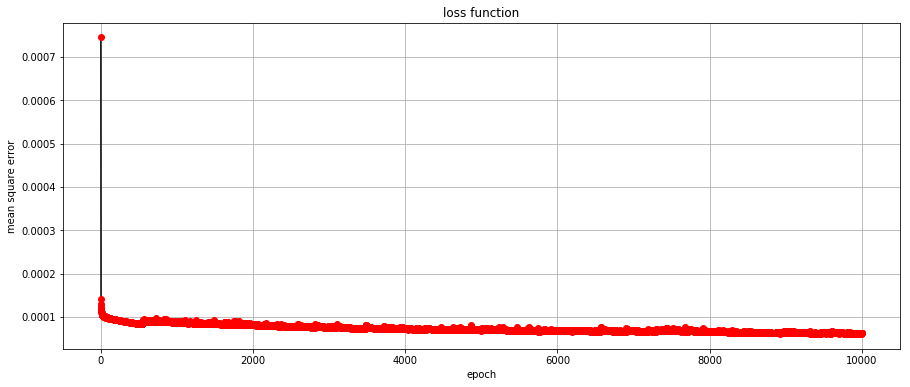

In [45]:
Create_Model(RGB_mun_X, munsell_X, 10000, "munsell_X_10000.model")

In [ ]:
Create_Model(RGB_mac_X, macbeth_X, 100000, "macbeth_X_100000.model")

2376/2376 [==============================] - 0s 41us/sample - loss: 0.1633 - mae: 0.3596
Train on 2376 samples
Epoch 1/100000
2376/2376 [==============================] - 0s 115us/sample - loss: 0.0194 - mae: 0.0881
Epoch 2/100000
2376/2376 [==============================] - 0s 67us/sample - loss: 0.0058 - mae: 0.0435
Epoch 3/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 0.0024 - mae: 0.0272
Epoch 4/100000
2376/2376 [==============================] - 0s 69us/sample - loss: 9.2242e-04 - mae: 0.0190
Epoch 5/100000
2376/2376 [==============================] - 0s 70us/sample - loss: 5.6788e-04 - mae: 0.0159
Epoch 6/100000
2376/2376 [==============================] - 0s 71us/sample - loss: 5.6175e-04 - mae: 0.0156
Epoch 7/100000
2376/2376 [==============================] - 0s 71us/sample - loss: 4.5966e-04 - mae: 0.0141
Epoch 8/100000
2376/2376 [==============================] - 0s 74us/sample - loss: 3.7805e-04 - mae: 0.0128
Epoch 9/100000
2376/2376 [==========

2376/2376 [==============================] - 0s 69us/sample - loss: 8.3820e-05 - mae: 0.0056
Epoch 150/100000
2376/2376 [==============================] - 0s 68us/sample - loss: 7.2862e-05 - mae: 0.0051
Epoch 151/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 9.9785e-05 - mae: 0.0063
Epoch 152/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 1.6672e-04 - mae: 0.0076
Epoch 153/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 1.6567e-04 - mae: 0.0082
Epoch 154/100000
2376/2376 [==============================] - 0s 64us/sample - loss: 1.0781e-04 - mae: 0.0063
Epoch 155/100000
2376/2376 [==============================] - 0s 73us/sample - loss: 8.9510e-05 - mae: 0.0057
Epoch 156/100000
2376/2376 [==============================] - 0s 67us/sample - loss: 9.2555e-05 - mae: 0.0057
Epoch 157/100000
2376/2376 [==============================] - 0s 69us/sample - loss: 7.2690e-05 - mae: 0.0050
Epoch 158/100000
2376/2376 

2376/2376 [==============================] - 0s 75us/sample - loss: 5.4842e-05 - mae: 0.0043
Epoch 298/100000
2376/2376 [==============================] - 0s 68us/sample - loss: 6.5202e-05 - mae: 0.0049
Epoch 299/100000
2376/2376 [==============================] - 0s 69us/sample - loss: 4.9795e-05 - mae: 0.0043
Epoch 300/100000
2376/2376 [==============================] - 0s 69us/sample - loss: 4.7435e-05 - mae: 0.0041
Epoch 301/100000
2376/2376 [==============================] - 0s 64us/sample - loss: 5.6176e-05 - mae: 0.0046
Epoch 302/100000
2376/2376 [==============================] - 0s 66us/sample - loss: 4.7783e-05 - mae: 0.0041
Epoch 303/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 7.4584e-05 - mae: 0.0052
Epoch 304/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 4.7967e-05 - mae: 0.0041
Epoch 305/100000
2376/2376 [==============================] - 0s 77us/sample - loss: 4.3468e-05 - mae: 0.0039
Epoch 306/100000
2376/2376 

2376/2376 [==============================] - 0s 67us/sample - loss: 2.8124e-05 - mae: 0.0031
Epoch 446/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 3.1478e-05 - mae: 0.0032
Epoch 447/100000
2376/2376 [==============================] - 0s 71us/sample - loss: 3.7064e-05 - mae: 0.0036
Epoch 448/100000
2376/2376 [==============================] - 0s 71us/sample - loss: 3.6926e-05 - mae: 0.0035
Epoch 449/100000
2376/2376 [==============================] - 0s 69us/sample - loss: 3.5655e-05 - mae: 0.0035
Epoch 450/100000
2376/2376 [==============================] - 0s 69us/sample - loss: 5.5546e-05 - mae: 0.0043
Epoch 451/100000
2376/2376 [==============================] - 0s 66us/sample - loss: 5.0333e-05 - mae: 0.0042
Epoch 452/100000
2376/2376 [==============================] - 0s 64us/sample - loss: 2.4717e-04 - mae: 0.0093
Epoch 453/100000
2376/2376 [==============================] - 0s 63us/sample - loss: 4.0758e-05 - mae: 0.0038
Epoch 454/100000
2376/2376 

2376/2376 [==============================] - 0s 62us/sample - loss: 3.0162e-05 - mae: 0.0032
Epoch 594/100000
2376/2376 [==============================] - 0s 64us/sample - loss: 2.3728e-05 - mae: 0.0028
Epoch 595/100000
2376/2376 [==============================] - 0s 69us/sample - loss: 2.7514e-05 - mae: 0.0030
Epoch 596/100000
2376/2376 [==============================] - 0s 84us/sample - loss: 3.3386e-05 - mae: 0.0032
Epoch 597/100000
2376/2376 [==============================] - 0s 69us/sample - loss: 6.5783e-05 - mae: 0.0049
Epoch 598/100000
2376/2376 [==============================] - 0s 72us/sample - loss: 3.7612e-05 - mae: 0.0036
Epoch 599/100000
2376/2376 [==============================] - 0s 68us/sample - loss: 2.1335e-05 - mae: 0.0026
Epoch 600/100000
2376/2376 [==============================] - 0s 81us/sample - loss: 6.2087e-05 - mae: 0.0045
Epoch 601/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 4.1860e-05 - mae: 0.0038
Epoch 602/100000
2376/2376 

2376/2376 [==============================] - 0s 56us/sample - loss: 2.4627e-05 - mae: 0.0029
Epoch 742/100000
2376/2376 [==============================] - 0s 59us/sample - loss: 2.2237e-05 - mae: 0.0028
Epoch 743/100000
2376/2376 [==============================] - 0s 72us/sample - loss: 2.6502e-05 - mae: 0.0032
Epoch 744/100000
2376/2376 [==============================] - 0s 67us/sample - loss: 2.9296e-05 - mae: 0.0032
Epoch 745/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 2.8338e-05 - mae: 0.0030
Epoch 746/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 3.0415e-05 - mae: 0.0032
Epoch 747/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 2.1272e-05 - mae: 0.0027
Epoch 748/100000
2376/2376 [==============================] - 0s 64us/sample - loss: 2.0518e-05 - mae: 0.0027
Epoch 749/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 2.1642e-05 - mae: 0.0028
Epoch 750/100000
2376/2376 

2376/2376 [==============================] - 0s 68us/sample - loss: 2.2743e-05 - mae: 0.0028
Epoch 890/100000
2376/2376 [==============================] - 0s 64us/sample - loss: 2.8546e-05 - mae: 0.0032
Epoch 891/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 5.1035e-05 - mae: 0.0044
Epoch 892/100000
2376/2376 [==============================] - 0s 58us/sample - loss: 1.9884e-05 - mae: 0.0026
Epoch 893/100000
2376/2376 [==============================] - 0s 70us/sample - loss: 1.6382e-05 - mae: 0.0024
Epoch 894/100000
2376/2376 [==============================] - 0s 67us/sample - loss: 3.9932e-05 - mae: 0.0037
Epoch 895/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 4.0381e-05 - mae: 0.0038
Epoch 896/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 2.1623e-05 - mae: 0.0028
Epoch 897/100000
2376/2376 [==============================] - 0s 71us/sample - loss: 1.8782e-05 - mae: 0.0025
Epoch 898/100000
2376/2376 

2376/2376 [==============================] - 0s 68us/sample - loss: 1.4267e-05 - mae: 0.0022
Epoch 1038/100000
2376/2376 [==============================] - 0s 74us/sample - loss: 1.0604e-04 - mae: 0.0062
Epoch 1039/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 4.2130e-05 - mae: 0.0036
Epoch 1040/100000
2376/2376 [==============================] - 0s 67us/sample - loss: 1.6833e-05 - mae: 0.0024
Epoch 1041/100000
2376/2376 [==============================] - 0s 68us/sample - loss: 2.9829e-05 - mae: 0.0032
Epoch 1042/100000
2376/2376 [==============================] - 0s 68us/sample - loss: 1.7241e-05 - mae: 0.0023
Epoch 1043/100000
2376/2376 [==============================] - 0s 68us/sample - loss: 2.1703e-05 - mae: 0.0028
Epoch 1044/100000
2376/2376 [==============================] - 0s 67us/sample - loss: 2.2177e-05 - mae: 0.0026
Epoch 1045/100000
2376/2376 [==============================] - 0s 68us/sample - loss: 3.0375e-05 - mae: 0.0032
Epoch 1046/100000
2

Epoch 1111/100000
2376/2376 [==============================] - 0s 63us/sample - loss: 2.8944e-05 - mae: 0.0032
Epoch 1112/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 7.2544e-05 - mae: 0.0049
Epoch 1113/100000
2376/2376 [==============================] - 0s 64us/sample - loss: 1.7312e-05 - mae: 0.0024
Epoch 1114/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 1.4549e-05 - mae: 0.0022
Epoch 1115/100000
2376/2376 [==============================] - 0s 66us/sample - loss: 1.8741e-05 - mae: 0.0026
Epoch 1116/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 1.6271e-05 - mae: 0.0023
Epoch 1117/100000
2376/2376 [==============================] - 0s 73us/sample - loss: 1.3477e-05 - mae: 0.0021
Epoch 1118/100000
2376/2376 [==============================] - 0s 68us/sample - loss: 4.2666e-05 - mae: 0.0040
Epoch 1119/100000
2376/2376 [==============================] - 0s 79us/sample - loss: 2.3062e-05 - mae: 0.0028
E

Epoch 1258/100000
2376/2376 [==============================] - 0s 71us/sample - loss: 1.3407e-05 - mae: 0.0022
Epoch 1259/100000
2376/2376 [==============================] - 0s 64us/sample - loss: 2.2927e-05 - mae: 0.0029
Epoch 1260/100000
2376/2376 [==============================] - 0s 61us/sample - loss: 2.1898e-05 - mae: 0.0027
Epoch 1261/100000
2376/2376 [==============================] - 0s 68us/sample - loss: 1.9076e-04 - mae: 0.0068
Epoch 1262/100000
2376/2376 [==============================] - 0s 64us/sample - loss: 3.1000e-05 - mae: 0.0032
Epoch 1263/100000
2376/2376 [==============================] - 0s 71us/sample - loss: 2.6579e-05 - mae: 0.0029
Epoch 1264/100000
2376/2376 [==============================] - 0s 64us/sample - loss: 1.7501e-05 - mae: 0.0024
Epoch 1265/100000
2376/2376 [==============================] - 0s 64us/sample - loss: 1.3782e-05 - mae: 0.0021
Epoch 1266/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 1.4310e-05 - mae: 0.0021
E

Epoch 1405/100000
2376/2376 [==============================] - 0s 68us/sample - loss: 1.2859e-05 - mae: 0.0021
Epoch 1406/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 1.3801e-05 - mae: 0.0022
Epoch 1407/100000
2376/2376 [==============================] - 0s 68us/sample - loss: 1.2505e-05 - mae: 0.0020
Epoch 1408/100000
2376/2376 [==============================] - 0s 69us/sample - loss: 9.6061e-06 - mae: 0.0018
Epoch 1409/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 1.4356e-05 - mae: 0.0023
Epoch 1410/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 1.1441e-05 - mae: 0.0020
Epoch 1411/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 1.9452e-05 - mae: 0.0027
Epoch 1412/100000
2376/2376 [==============================] - 0s 64us/sample - loss: 1.7468e-05 - mae: 0.0025
Epoch 1413/100000
2376/2376 [==============================] - 0s 69us/sample - loss: 1.3945e-05 - mae: 0.0022
E

Epoch 1552/100000
2376/2376 [==============================] - 0s 66us/sample - loss: 1.3782e-05 - mae: 0.0022
Epoch 1553/100000
2376/2376 [==============================] - 0s 67us/sample - loss: 9.6352e-06 - mae: 0.0018
Epoch 1554/100000
2376/2376 [==============================] - 0s 75us/sample - loss: 9.5008e-06 - mae: 0.0018
Epoch 1555/100000
2376/2376 [==============================] - 0s 67us/sample - loss: 1.1899e-05 - mae: 0.0020
Epoch 1556/100000
2376/2376 [==============================] - 0s 61us/sample - loss: 2.5492e-05 - mae: 0.0030
Epoch 1557/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 1.3543e-05 - mae: 0.0022
Epoch 1558/100000
2376/2376 [==============================] - 0s 70us/sample - loss: 1.6476e-05 - mae: 0.0023
Epoch 1559/100000
2376/2376 [==============================] - 0s 63us/sample - loss: 3.9055e-05 - mae: 0.0035
Epoch 1560/100000
2376/2376 [==============================] - 0s 74us/sample - loss: 1.6723e-05 - mae: 0.0024
E

Epoch 1699/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 1.0350e-05 - mae: 0.0019
Epoch 1700/100000
2376/2376 [==============================] - 0s 68us/sample - loss: 1.0119e-05 - mae: 0.0018
Epoch 1701/100000
2376/2376 [==============================] - 0s 64us/sample - loss: 2.8791e-05 - mae: 0.0032
Epoch 1702/100000
2376/2376 [==============================] - 0s 64us/sample - loss: 7.2979e-05 - mae: 0.0049
Epoch 1703/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 3.3742e-05 - mae: 0.0031
Epoch 1704/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 1.7500e-05 - mae: 0.0024
Epoch 1705/100000
2376/2376 [==============================] - 0s 68us/sample - loss: 1.8978e-05 - mae: 0.0022
Epoch 1706/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 1.5309e-05 - mae: 0.0022
Epoch 1707/100000
2376/2376 [==============================] - 0s 68us/sample - loss: 1.1655e-05 - mae: 0.0020
E

Epoch 1846/100000
2376/2376 [==============================] - 0s 71us/sample - loss: 9.5233e-06 - mae: 0.0018
Epoch 1847/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 1.2483e-05 - mae: 0.0021
Epoch 1848/100000
2376/2376 [==============================] - 0s 71us/sample - loss: 9.4902e-06 - mae: 0.0018
Epoch 1849/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 1.5374e-05 - mae: 0.0023
Epoch 1850/100000
2376/2376 [==============================] - 0s 68us/sample - loss: 1.5437e-05 - mae: 0.0024
Epoch 1851/100000
2376/2376 [==============================] - 0s 66us/sample - loss: 1.0147e-05 - mae: 0.0019
Epoch 1852/100000
2376/2376 [==============================] - 0s 68us/sample - loss: 1.4427e-05 - mae: 0.0021
Epoch 1853/100000
2376/2376 [==============================] - 0s 69us/sample - loss: 1.8688e-05 - mae: 0.0023
Epoch 1854/100000
2376/2376 [==============================] - 0s 68us/sample - loss: 2.8043e-05 - mae: 0.0031
E

2376/2376 [==============================] - 0s 72us/sample - loss: 1.6146e-05 - mae: 0.0023
Epoch 1993/100000
2376/2376 [==============================] - 0s 60us/sample - loss: 2.0944e-05 - mae: 0.0028
Epoch 1994/100000
2376/2376 [==============================] - 0s 70us/sample - loss: 1.1419e-05 - mae: 0.0020
Epoch 1995/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 2.1849e-05 - mae: 0.0025
Epoch 1996/100000
2376/2376 [==============================] - 0s 64us/sample - loss: 6.9493e-05 - mae: 0.0048
Epoch 1997/100000
2376/2376 [==============================] - 0s 71us/sample - loss: 1.6554e-05 - mae: 0.0025
Epoch 1998/100000
2376/2376 [==============================] - 0s 66us/sample - loss: 2.0113e-05 - mae: 0.0025
Epoch 1999/100000
2376/2376 [==============================] - 0s 64us/sample - loss: 2.0425e-05 - mae: 0.0026
Epoch 2000/100000
2376/2376 [==============================] - 0s 72us/sample - loss: 1.5060e-05 - mae: 0.0023
Epoch 2001/100000
2

Epoch 2066/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 1.9373e-05 - mae: 0.0026
Epoch 2067/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 1.3102e-05 - mae: 0.0020
Epoch 2068/100000
2376/2376 [==============================] - 0s 69us/sample - loss: 1.0785e-05 - mae: 0.0020
Epoch 2069/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 1.9511e-05 - mae: 0.0023
Epoch 2070/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 1.3293e-05 - mae: 0.0022
Epoch 2071/100000
2376/2376 [==============================] - 0s 77us/sample - loss: 1.9010e-05 - mae: 0.0026
Epoch 2072/100000
2376/2376 [==============================] - 0s 72us/sample - loss: 1.0895e-05 - mae: 0.0019
Epoch 2073/100000
2376/2376 [==============================] - 0s 78us/sample - loss: 1.2916e-05 - mae: 0.0020
Epoch 2074/100000
2376/2376 [==============================] - 0s 79us/sample - loss: 2.4350e-05 - mae: 0.0030
E

2376/2376 [==============================] - 0s 76us/sample - loss: 1.0420e-05 - mae: 0.0020
Epoch 2213/100000
2376/2376 [==============================] - 0s 73us/sample - loss: 9.5227e-06 - mae: 0.0018
Epoch 2214/100000
2376/2376 [==============================] - 0s 77us/sample - loss: 4.3780e-05 - mae: 0.0038
Epoch 2215/100000
2376/2376 [==============================] - 0s 74us/sample - loss: 2.6054e-05 - mae: 0.0030
Epoch 2216/100000
2376/2376 [==============================] - 0s 74us/sample - loss: 1.0025e-05 - mae: 0.0018
Epoch 2217/100000
2376/2376 [==============================] - 0s 79us/sample - loss: 8.1254e-06 - mae: 0.0017
Epoch 2218/100000
2376/2376 [==============================] - 0s 76us/sample - loss: 7.9303e-06 - mae: 0.0016
Epoch 2219/100000
2376/2376 [==============================] - 0s 75us/sample - loss: 8.7310e-06 - mae: 0.0018
Epoch 2220/100000
2376/2376 [==============================] - 0s 77us/sample - loss: 1.0627e-05 - mae: 0.0019
Epoch 2221/100000
2

Epoch 2286/100000
2376/2376 [==============================] - 0s 72us/sample - loss: 1.4962e-05 - mae: 0.0020
Epoch 2287/100000
2376/2376 [==============================] - 0s 75us/sample - loss: 1.4043e-05 - mae: 0.0023
Epoch 2288/100000
2376/2376 [==============================] - 0s 78us/sample - loss: 8.7196e-06 - mae: 0.0018
Epoch 2289/100000
2376/2376 [==============================] - 0s 70us/sample - loss: 9.2481e-06 - mae: 0.0018
Epoch 2290/100000
2376/2376 [==============================] - 0s 69us/sample - loss: 1.2212e-05 - mae: 0.0020
Epoch 2291/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 9.4843e-06 - mae: 0.0019
Epoch 2292/100000
2376/2376 [==============================] - 0s 63us/sample - loss: 8.1315e-06 - mae: 0.0017
Epoch 2293/100000
2376/2376 [==============================] - 0s 70us/sample - loss: 9.6933e-06 - mae: 0.0018
Epoch 2294/100000
2376/2376 [==============================] - 0s 66us/sample - loss: 3.0812e-05 - mae: 0.0034
E

2376/2376 [==============================] - 0s 84us/sample - loss: 1.3833e-05 - mae: 0.0021
Epoch 2433/100000
2376/2376 [==============================] - 0s 80us/sample - loss: 1.1310e-05 - mae: 0.0020
Epoch 2434/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 2.2348e-05 - mae: 0.0028
Epoch 2435/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 1.4241e-05 - mae: 0.0022
Epoch 2436/100000
2376/2376 [==============================] - 0s 66us/sample - loss: 9.2408e-06 - mae: 0.0018
Epoch 2437/100000
2376/2376 [==============================] - 0s 66us/sample - loss: 2.7622e-05 - mae: 0.0030
Epoch 2438/100000
2376/2376 [==============================] - 0s 66us/sample - loss: 1.5980e-05 - mae: 0.0025
Epoch 2439/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 1.0415e-05 - mae: 0.0019
Epoch 2440/100000
2376/2376 [==============================] - 0s 68us/sample - loss: 1.0811e-05 - mae: 0.0019
Epoch 2441/100000
2

Epoch 2506/100000
2376/2376 [==============================] - 0s 68us/sample - loss: 1.2918e-05 - mae: 0.0020
Epoch 2507/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 1.0775e-05 - mae: 0.0019
Epoch 2508/100000
2376/2376 [==============================] - 0s 73us/sample - loss: 1.1016e-05 - mae: 0.0020
Epoch 2509/100000
2376/2376 [==============================] - 0s 67us/sample - loss: 2.3345e-05 - mae: 0.0025
Epoch 2510/100000
2376/2376 [==============================] - 0s 71us/sample - loss: 1.5186e-05 - mae: 0.0023
Epoch 2511/100000
2376/2376 [==============================] - 0s 68us/sample - loss: 1.2949e-05 - mae: 0.0020
Epoch 2512/100000
2376/2376 [==============================] - 0s 67us/sample - loss: 1.8925e-05 - mae: 0.0026
Epoch 2513/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 1.3360e-05 - mae: 0.0021
Epoch 2514/100000
2376/2376 [==============================] - 0s 67us/sample - loss: 2.4814e-05 - mae: 0.0028
E

Epoch 2653/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 1.7456e-05 - mae: 0.0025
Epoch 2654/100000
2376/2376 [==============================] - 0s 68us/sample - loss: 1.1445e-05 - mae: 0.0021
Epoch 2655/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 1.2148e-05 - mae: 0.0019
Epoch 2656/100000
2376/2376 [==============================] - 0s 77us/sample - loss: 1.2341e-05 - mae: 0.0021
Epoch 2657/100000
2376/2376 [==============================] - 0s 73us/sample - loss: 2.5920e-05 - mae: 0.0028
Epoch 2658/100000
2376/2376 [==============================] - 0s 78us/sample - loss: 1.0777e-04 - mae: 0.0054
Epoch 2659/100000
2376/2376 [==============================] - 0s 76us/sample - loss: 2.9682e-05 - mae: 0.0029
Epoch 2660/100000
2376/2376 [==============================] - 0s 73us/sample - loss: 1.9337e-05 - mae: 0.0023
Epoch 2661/100000
2376/2376 [==============================] - 0s 78us/sample - loss: 2.1068e-05 - mae: 0.0023
E

Epoch 2800/100000
2376/2376 [==============================] - 0s 71us/sample - loss: 1.2295e-05 - mae: 0.0021
Epoch 2801/100000
2376/2376 [==============================] - 0s 66us/sample - loss: 1.1054e-05 - mae: 0.0019
Epoch 2802/100000
2376/2376 [==============================] - 0s 70us/sample - loss: 9.0673e-06 - mae: 0.0017
Epoch 2803/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 8.3003e-06 - mae: 0.0016
Epoch 2804/100000
2376/2376 [==============================] - 0s 78us/sample - loss: 8.6970e-06 - mae: 0.0018
Epoch 2805/100000
2376/2376 [==============================] - 0s 68us/sample - loss: 1.7125e-05 - mae: 0.0025
Epoch 2806/100000
2376/2376 [==============================] - 0s 71us/sample - loss: 8.3023e-06 - mae: 0.0017
Epoch 2807/100000
2376/2376 [==============================] - 0s 66us/sample - loss: 7.8014e-06 - mae: 0.0017
Epoch 2808/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 1.0233e-05 - mae: 0.0017
E

Epoch 2947/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 2.2168e-05 - mae: 0.0027
Epoch 2948/100000
2376/2376 [==============================] - 0s 67us/sample - loss: 2.0750e-05 - mae: 0.0026
Epoch 2949/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 4.3965e-05 - mae: 0.0038
Epoch 2950/100000
2376/2376 [==============================] - 0s 67us/sample - loss: 5.7961e-05 - mae: 0.0043
Epoch 2951/100000
2376/2376 [==============================] - 0s 68us/sample - loss: 1.6295e-05 - mae: 0.0022
Epoch 2952/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 1.5229e-05 - mae: 0.0021
Epoch 2953/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 1.2942e-05 - mae: 0.0019
Epoch 2954/100000
2376/2376 [==============================] - 0s 69us/sample - loss: 1.5991e-05 - mae: 0.0022
Epoch 2955/100000
2376/2376 [==============================] - 0s 64us/sample - loss: 1.1837e-05 - mae: 0.0018
E

Epoch 3094/100000
2376/2376 [==============================] - 0s 68us/sample - loss: 6.1712e-06 - mae: 0.0015
Epoch 3095/100000
2376/2376 [==============================] - 0s 73us/sample - loss: 6.6488e-06 - mae: 0.0015
Epoch 3096/100000
2376/2376 [==============================] - 0s 67us/sample - loss: 1.2211e-05 - mae: 0.0021
Epoch 3097/100000
2376/2376 [==============================] - 0s 70us/sample - loss: 1.3608e-05 - mae: 0.0023
Epoch 3098/100000
2376/2376 [==============================] - 0s 63us/sample - loss: 2.1798e-05 - mae: 0.0024
Epoch 3099/100000
2376/2376 [==============================] - 0s 66us/sample - loss: 2.4096e-05 - mae: 0.0026
Epoch 3100/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 1.3308e-05 - mae: 0.0022
Epoch 3101/100000
2376/2376 [==============================] - 0s 61us/sample - loss: 1.2001e-05 - mae: 0.0021
Epoch 3102/100000
2376/2376 [==============================] - 0s 68us/sample - loss: 1.1443e-05 - mae: 0.0018
E

Epoch 3241/100000
2376/2376 [==============================] - 0s 67us/sample - loss: 1.0033e-05 - mae: 0.0019
Epoch 3242/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 6.9339e-06 - mae: 0.0015
Epoch 3243/100000
2376/2376 [==============================] - 0s 70us/sample - loss: 9.2539e-06 - mae: 0.0019
Epoch 3244/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 1.4345e-05 - mae: 0.0023
Epoch 3245/100000
2376/2376 [==============================] - 0s 67us/sample - loss: 1.0219e-05 - mae: 0.0018
Epoch 3246/100000
2376/2376 [==============================] - 0s 71us/sample - loss: 9.7972e-06 - mae: 0.0018
Epoch 3247/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 9.8904e-06 - mae: 0.0019
Epoch 3248/100000
2376/2376 [==============================] - 0s 69us/sample - loss: 1.1635e-05 - mae: 0.0021
Epoch 3249/100000
2376/2376 [==============================] - 0s 59us/sample - loss: 2.4530e-05 - mae: 0.0029
E

Epoch 3388/100000
2376/2376 [==============================] - 0s 67us/sample - loss: 6.5852e-06 - mae: 0.0015
Epoch 3389/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 1.0814e-05 - mae: 0.0018
Epoch 3390/100000
2376/2376 [==============================] - 0s 73us/sample - loss: 1.8158e-05 - mae: 0.0027
Epoch 3391/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 1.5323e-05 - mae: 0.0023
Epoch 3392/100000
2376/2376 [==============================] - 0s 69us/sample - loss: 8.9332e-06 - mae: 0.0018
Epoch 3393/100000
2376/2376 [==============================] - 0s 67us/sample - loss: 9.1060e-06 - mae: 0.0018
Epoch 3394/100000
2376/2376 [==============================] - 0s 62us/sample - loss: 6.0113e-06 - mae: 0.0014
Epoch 3395/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 6.5394e-06 - mae: 0.0015
Epoch 3396/100000
2376/2376 [==============================] - 0s 64us/sample - loss: 6.6174e-06 - mae: 0.0014
E

Epoch 3535/100000
2376/2376 [==============================] - 0s 75us/sample - loss: 9.3747e-06 - mae: 0.0017
Epoch 3536/100000
2376/2376 [==============================] - 0s 76us/sample - loss: 2.1714e-05 - mae: 0.0024
Epoch 3537/100000
2376/2376 [==============================] - 0s 67us/sample - loss: 4.9131e-05 - mae: 0.0036
Epoch 3538/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 8.1632e-05 - mae: 0.0051
Epoch 3539/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 1.4140e-05 - mae: 0.0022
Epoch 3540/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 1.2800e-05 - mae: 0.0019
Epoch 3541/100000
2376/2376 [==============================] - 0s 64us/sample - loss: 1.1443e-05 - mae: 0.0018
Epoch 3542/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 8.1662e-06 - mae: 0.0017
Epoch 3543/100000
2376/2376 [==============================] - 0s 67us/sample - loss: 1.3940e-05 - mae: 0.0023
E

Epoch 3682/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 5.3258e-06 - mae: 0.0014
Epoch 3683/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 6.6013e-06 - mae: 0.0015
Epoch 3684/100000
2376/2376 [==============================] - 0s 68us/sample - loss: 5.8016e-06 - mae: 0.0014
Epoch 3685/100000
2376/2376 [==============================] - 0s 64us/sample - loss: 8.5819e-06 - mae: 0.0018
Epoch 3686/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 7.0837e-06 - mae: 0.0016
Epoch 3687/100000
2376/2376 [==============================] - 0s 68us/sample - loss: 1.5029e-05 - mae: 0.0023
Epoch 3688/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 9.7527e-06 - mae: 0.0019
Epoch 3689/100000
2376/2376 [==============================] - 0s 68us/sample - loss: 9.9466e-06 - mae: 0.0019
Epoch 3690/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 9.2825e-06 - mae: 0.0018
E

Epoch 3829/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 9.5787e-06 - mae: 0.0018
Epoch 3830/100000
2376/2376 [==============================] - 0s 69us/sample - loss: 5.9526e-06 - mae: 0.0014
Epoch 3831/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 7.4081e-06 - mae: 0.0015
Epoch 3832/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 3.4659e-05 - mae: 0.0031
Epoch 3833/100000
2376/2376 [==============================] - 0s 72us/sample - loss: 7.2244e-06 - mae: 0.0016
Epoch 3834/100000
2376/2376 [==============================] - 0s 67us/sample - loss: 6.4680e-06 - mae: 0.0015
Epoch 3835/100000
2376/2376 [==============================] - 0s 67us/sample - loss: 5.1140e-06 - mae: 0.0013
Epoch 3836/100000
2376/2376 [==============================] - 0s 64us/sample - loss: 6.0824e-06 - mae: 0.0015
Epoch 3837/100000
2376/2376 [==============================] - 0s 64us/sample - loss: 5.9809e-06 - mae: 0.0013
E

Epoch 3976/100000
2376/2376 [==============================] - 0s 72us/sample - loss: 1.3417e-05 - mae: 0.0021
Epoch 3977/100000
2376/2376 [==============================] - 0s 68us/sample - loss: 8.8986e-06 - mae: 0.0018
Epoch 3978/100000
2376/2376 [==============================] - 0s 60us/sample - loss: 8.6947e-06 - mae: 0.0018
Epoch 3979/100000
2376/2376 [==============================] - 0s 71us/sample - loss: 8.7769e-06 - mae: 0.0017
Epoch 3980/100000
2376/2376 [==============================] - 0s 63us/sample - loss: 2.6888e-05 - mae: 0.0029
Epoch 3981/100000
2376/2376 [==============================] - 0s 75us/sample - loss: 8.5243e-06 - mae: 0.0017
Epoch 3982/100000
2376/2376 [==============================] - 0s 68us/sample - loss: 6.2802e-06 - mae: 0.0015
Epoch 3983/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 1.5286e-05 - mae: 0.0023
Epoch 3984/100000
2376/2376 [==============================] - 0s 71us/sample - loss: 7.9994e-06 - mae: 0.0017
E

Epoch 4123/100000
2376/2376 [==============================] - 0s 68us/sample - loss: 5.8602e-06 - mae: 0.0014
Epoch 4124/100000
2376/2376 [==============================] - 0s 66us/sample - loss: 9.7405e-06 - mae: 0.0019
Epoch 4125/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 5.3685e-06 - mae: 0.0014
Epoch 4126/100000
2376/2376 [==============================] - 0s 74us/sample - loss: 6.4702e-06 - mae: 0.0015
Epoch 4127/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 1.0652e-05 - mae: 0.0019
Epoch 4128/100000
2376/2376 [==============================] - 0s 69us/sample - loss: 5.5063e-06 - mae: 0.0014
Epoch 4129/100000
2376/2376 [==============================] - 0s 67us/sample - loss: 4.4129e-06 - mae: 0.0012
Epoch 4130/100000
2376/2376 [==============================] - 0s 66us/sample - loss: 1.1794e-05 - mae: 0.0020
Epoch 4131/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 1.5285e-05 - mae: 0.0023
E

2376/2376 [==============================] - 0s 66us/sample - loss: 5.2553e-06 - mae: 0.0014
Epoch 4270/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 4.3642e-06 - mae: 0.0012
Epoch 4271/100000
2376/2376 [==============================] - 0s 70us/sample - loss: 4.7284e-06 - mae: 0.0013
Epoch 4272/100000
2376/2376 [==============================] - 0s 64us/sample - loss: 4.8982e-06 - mae: 0.0013
Epoch 4273/100000
2376/2376 [==============================] - 0s 64us/sample - loss: 4.2526e-06 - mae: 0.0012
Epoch 4274/100000
2376/2376 [==============================] - 0s 64us/sample - loss: 7.3430e-06 - mae: 0.0017
Epoch 4275/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 7.8911e-06 - mae: 0.0017
Epoch 4276/100000
2376/2376 [==============================] - 0s 76us/sample - loss: 4.8847e-05 - mae: 0.0041
Epoch 4277/100000
2376/2376 [==============================] - 0s 80us/sample - loss: 2.1336e-05 - mae: 0.0027
Epoch 4278/100000
2

Epoch 4343/100000
2376/2376 [==============================] - 0s 58us/sample - loss: 4.3173e-06 - mae: 0.0012
Epoch 4344/100000
2376/2376 [==============================] - 0s 66us/sample - loss: 1.1906e-05 - mae: 0.0021
Epoch 4345/100000
2376/2376 [==============================] - 0s 66us/sample - loss: 6.2391e-06 - mae: 0.0015
Epoch 4346/100000
2376/2376 [==============================] - 0s 63us/sample - loss: 1.2853e-05 - mae: 0.0020
Epoch 4347/100000
2376/2376 [==============================] - 0s 64us/sample - loss: 6.6995e-06 - mae: 0.0016
Epoch 4348/100000
2376/2376 [==============================] - 0s 71us/sample - loss: 5.0310e-06 - mae: 0.0013
Epoch 4349/100000
2376/2376 [==============================] - 0s 66us/sample - loss: 4.4187e-06 - mae: 0.0012
Epoch 4350/100000
2376/2376 [==============================] - 0s 69us/sample - loss: 5.1101e-06 - mae: 0.0013
Epoch 4351/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 8.7308e-05 - mae: 0.0054
E

Epoch 4490/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 5.0646e-06 - mae: 0.0014
Epoch 4491/100000
2376/2376 [==============================] - 0s 67us/sample - loss: 1.3701e-05 - mae: 0.0021
Epoch 4492/100000
2376/2376 [==============================] - 0s 67us/sample - loss: 7.4972e-06 - mae: 0.0016
Epoch 4493/100000
2376/2376 [==============================] - 0s 70us/sample - loss: 9.8670e-06 - mae: 0.0019
Epoch 4494/100000
2376/2376 [==============================] - 0s 70us/sample - loss: 2.3550e-05 - mae: 0.0027
Epoch 4495/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 8.3883e-05 - mae: 0.0051
Epoch 4496/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 2.3180e-05 - mae: 0.0026
Epoch 4497/100000
2376/2376 [==============================] - 0s 68us/sample - loss: 7.8156e-06 - mae: 0.0016
Epoch 4498/100000
2376/2376 [==============================] - 0s 66us/sample - loss: 7.2075e-06 - mae: 0.0016
E

Epoch 4637/100000
2376/2376 [==============================] - 0s 73us/sample - loss: 5.3979e-06 - mae: 0.0013
Epoch 4638/100000
2376/2376 [==============================] - 0s 61us/sample - loss: 7.5497e-06 - mae: 0.0016
Epoch 4639/100000
2376/2376 [==============================] - 0s 63us/sample - loss: 5.7413e-06 - mae: 0.0013
Epoch 4640/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 8.1803e-06 - mae: 0.0016
Epoch 4641/100000
2376/2376 [==============================] - 0s 68us/sample - loss: 7.8798e-06 - mae: 0.0016
Epoch 4642/100000
2376/2376 [==============================] - 0s 66us/sample - loss: 6.3193e-06 - mae: 0.0014
Epoch 4643/100000
2376/2376 [==============================] - 0s 68us/sample - loss: 6.2995e-06 - mae: 0.0015
Epoch 4644/100000
2376/2376 [==============================] - 0s 77us/sample - loss: 6.7673e-06 - mae: 0.0015
Epoch 4645/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 6.8503e-06 - mae: 0.0015
E

Epoch 4784/100000
2376/2376 [==============================] - 0s 67us/sample - loss: 9.6696e-06 - mae: 0.0018
Epoch 4785/100000
2376/2376 [==============================] - 0s 68us/sample - loss: 9.6698e-06 - mae: 0.0018
Epoch 4786/100000
2376/2376 [==============================] - 0s 71us/sample - loss: 1.1526e-05 - mae: 0.0021
Epoch 4787/100000
2376/2376 [==============================] - 0s 66us/sample - loss: 9.0865e-06 - mae: 0.0018
Epoch 4788/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 5.1017e-06 - mae: 0.0013
Epoch 4789/100000
2376/2376 [==============================] - 0s 58us/sample - loss: 9.8966e-06 - mae: 0.0019
Epoch 4790/100000
2376/2376 [==============================] - 0s 72us/sample - loss: 7.1746e-06 - mae: 0.0016
Epoch 4791/100000
2376/2376 [==============================] - 0s 61us/sample - loss: 4.1282e-06 - mae: 0.0012
Epoch 4792/100000
2376/2376 [==============================] - 0s 64us/sample - loss: 4.9988e-06 - mae: 0.0013
E

Epoch 4931/100000
2376/2376 [==============================] - 0s 66us/sample - loss: 6.9375e-06 - mae: 0.0015
Epoch 4932/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 1.6582e-05 - mae: 0.0024
Epoch 4933/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 2.2824e-05 - mae: 0.0024
Epoch 4934/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 7.4444e-06 - mae: 0.0016
Epoch 4935/100000
2376/2376 [==============================] - 0s 64us/sample - loss: 6.5380e-06 - mae: 0.0014
Epoch 4936/100000
2376/2376 [==============================] - 0s 64us/sample - loss: 1.0305e-05 - mae: 0.0017
Epoch 4937/100000
2376/2376 [==============================] - 0s 68us/sample - loss: 5.0608e-05 - mae: 0.0033
Epoch 4938/100000
2376/2376 [==============================] - 0s 64us/sample - loss: 3.2078e-05 - mae: 0.0032
Epoch 4939/100000
2376/2376 [==============================] - 0s 67us/sample - loss: 7.2546e-06 - mae: 0.0016
E

Epoch 5078/100000
2376/2376 [==============================] - 0s 64us/sample - loss: 5.8089e-06 - mae: 0.0014
Epoch 5079/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 4.2578e-06 - mae: 0.0012
Epoch 5080/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 6.1355e-06 - mae: 0.0014
Epoch 5081/100000
2376/2376 [==============================] - 0s 68us/sample - loss: 8.0991e-06 - mae: 0.0017
Epoch 5082/100000
2376/2376 [==============================] - 0s 68us/sample - loss: 6.8575e-06 - mae: 0.0016
Epoch 5083/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 7.7490e-06 - mae: 0.0016
Epoch 5084/100000
2376/2376 [==============================] - 0s 67us/sample - loss: 1.1942e-05 - mae: 0.0020
Epoch 5085/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 1.6276e-05 - mae: 0.0024
Epoch 5086/100000
2376/2376 [==============================] - 0s 64us/sample - loss: 1.5449e-05 - mae: 0.0023
E

Epoch 5225/100000
2376/2376 [==============================] - 0s 66us/sample - loss: 4.0988e-06 - mae: 0.0012
Epoch 5226/100000
2376/2376 [==============================] - 0s 67us/sample - loss: 5.1504e-06 - mae: 0.0014
Epoch 5227/100000
2376/2376 [==============================] - 0s 63us/sample - loss: 4.9641e-06 - mae: 0.0013
Epoch 5228/100000
2376/2376 [==============================] - 0s 61us/sample - loss: 5.9729e-06 - mae: 0.0014
Epoch 5229/100000
2376/2376 [==============================] - 0s 72us/sample - loss: 6.8529e-06 - mae: 0.0015
Epoch 5230/100000
2376/2376 [==============================] - 0s 71us/sample - loss: 7.7689e-06 - mae: 0.0017
Epoch 5231/100000
2376/2376 [==============================] - 0s 66us/sample - loss: 6.4994e-06 - mae: 0.0016
Epoch 5232/100000
2376/2376 [==============================] - 0s 67us/sample - loss: 2.8451e-05 - mae: 0.0030
Epoch 5233/100000
2376/2376 [==============================] - 0s 67us/sample - loss: 3.2483e-05 - mae: 0.0030
E

Epoch 5372/100000
2376/2376 [==============================] - 0s 68us/sample - loss: 2.4596e-05 - mae: 0.0024
Epoch 5373/100000
2376/2376 [==============================] - 0s 68us/sample - loss: 1.0450e-05 - mae: 0.0020
Epoch 5374/100000
2376/2376 [==============================] - 0s 64us/sample - loss: 1.0718e-05 - mae: 0.0019
Epoch 5375/100000
2376/2376 [==============================] - 0s 67us/sample - loss: 2.6187e-05 - mae: 0.0027
Epoch 5376/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 4.8204e-06 - mae: 0.0013
Epoch 5377/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 1.1810e-05 - mae: 0.0021
Epoch 5378/100000
2376/2376 [==============================] - 0s 73us/sample - loss: 2.0042e-05 - mae: 0.0025
Epoch 5379/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 6.5231e-06 - mae: 0.0015
Epoch 5380/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 4.7332e-06 - mae: 0.0013
E

Epoch 5519/100000
2376/2376 [==============================] - 0s 74us/sample - loss: 1.1337e-05 - mae: 0.0018
Epoch 5520/100000
2376/2376 [==============================] - 0s 66us/sample - loss: 4.7915e-06 - mae: 0.0013
Epoch 5521/100000
2376/2376 [==============================] - 0s 70us/sample - loss: 7.4831e-06 - mae: 0.0016
Epoch 5522/100000
2376/2376 [==============================] - 0s 67us/sample - loss: 4.9825e-06 - mae: 0.0013
Epoch 5523/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 3.6982e-06 - mae: 0.0011
Epoch 5524/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 3.6829e-06 - mae: 0.0011
Epoch 5525/100000
2376/2376 [==============================] - 0s 67us/sample - loss: 4.6033e-06 - mae: 0.0012
Epoch 5526/100000
2376/2376 [==============================] - 0s 67us/sample - loss: 5.9589e-06 - mae: 0.0014
Epoch 5527/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 9.2967e-06 - mae: 0.0018
E

Epoch 5666/100000
2376/2376 [==============================] - 0s 70us/sample - loss: 5.4535e-06 - mae: 0.0013
Epoch 5667/100000
2376/2376 [==============================] - 0s 66us/sample - loss: 5.9083e-06 - mae: 0.0014
Epoch 5668/100000
2376/2376 [==============================] - 0s 66us/sample - loss: 4.5817e-06 - mae: 0.0012
Epoch 5669/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 8.9605e-06 - mae: 0.0016
Epoch 5670/100000
2376/2376 [==============================] - 0s 68us/sample - loss: 7.1214e-06 - mae: 0.0016
Epoch 5671/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 1.1121e-05 - mae: 0.0020
Epoch 5672/100000
2376/2376 [==============================] - 0s 67us/sample - loss: 9.3094e-06 - mae: 0.0018
Epoch 5673/100000
2376/2376 [==============================] - 0s 76us/sample - loss: 6.8136e-06 - mae: 0.0015
Epoch 5674/100000
2376/2376 [==============================] - 0s 68us/sample - loss: 7.4195e-06 - mae: 0.0016
E

Epoch 5813/100000
2376/2376 [==============================] - 0s 67us/sample - loss: 5.1591e-06 - mae: 0.0013
Epoch 5814/100000
2376/2376 [==============================] - 0s 59us/sample - loss: 5.7206e-06 - mae: 0.0014
Epoch 5815/100000
2376/2376 [==============================] - 0s 66us/sample - loss: 5.7662e-06 - mae: 0.0013
Epoch 5816/100000
2376/2376 [==============================] - 0s 67us/sample - loss: 1.3211e-05 - mae: 0.0022
Epoch 5817/100000
2376/2376 [==============================] - 0s 64us/sample - loss: 6.8417e-06 - mae: 0.0015
Epoch 5818/100000
2376/2376 [==============================] - 0s 74us/sample - loss: 7.3651e-06 - mae: 0.0016
Epoch 5819/100000
2376/2376 [==============================] - 0s 66us/sample - loss: 5.6427e-06 - mae: 0.0014
Epoch 5820/100000
2376/2376 [==============================] - 0s 71us/sample - loss: 7.0269e-06 - mae: 0.0016
Epoch 5821/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 8.7891e-06 - mae: 0.0017
E

Epoch 5960/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 1.0300e-05 - mae: 0.0018
Epoch 5961/100000
2376/2376 [==============================] - 0s 62us/sample - loss: 5.3566e-06 - mae: 0.0013
Epoch 5962/100000
2376/2376 [==============================] - 0s 70us/sample - loss: 5.0792e-06 - mae: 0.0012
Epoch 5963/100000
2376/2376 [==============================] - 0s 64us/sample - loss: 6.0006e-06 - mae: 0.0014
Epoch 5964/100000
2376/2376 [==============================] - 0s 69us/sample - loss: 4.1871e-06 - mae: 0.0012
Epoch 5965/100000
2376/2376 [==============================] - 0s 68us/sample - loss: 4.3437e-06 - mae: 0.0012
Epoch 5966/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 6.7723e-06 - mae: 0.0015
Epoch 5967/100000
2376/2376 [==============================] - 0s 68us/sample - loss: 1.2954e-05 - mae: 0.0018
Epoch 5968/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 7.0879e-06 - mae: 0.0016
E

2376/2376 [==============================] - 0s 67us/sample - loss: 1.7546e-05 - mae: 0.0023
Epoch 6107/100000
2376/2376 [==============================] - 0s 73us/sample - loss: 1.3823e-05 - mae: 0.0022
Epoch 6108/100000
2376/2376 [==============================] - 0s 68us/sample - loss: 9.9585e-06 - mae: 0.0018
Epoch 6109/100000
2376/2376 [==============================] - 0s 68us/sample - loss: 7.8411e-06 - mae: 0.0017
Epoch 6110/100000
2376/2376 [==============================] - 0s 69us/sample - loss: 5.0521e-06 - mae: 0.0013
Epoch 6111/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 7.9518e-06 - mae: 0.0016
Epoch 6112/100000
2376/2376 [==============================] - 0s 68us/sample - loss: 6.9820e-06 - mae: 0.0015
Epoch 6113/100000
2376/2376 [==============================] - 0s 70us/sample - loss: 2.5943e-05 - mae: 0.0027
Epoch 6114/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 4.2350e-05 - mae: 0.0036
Epoch 6115/100000
2

Epoch 6180/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 1.8294e-05 - mae: 0.0025
Epoch 6181/100000
2376/2376 [==============================] - 0s 64us/sample - loss: 1.6691e-05 - mae: 0.0024
Epoch 6182/100000
2376/2376 [==============================] - 0s 64us/sample - loss: 1.0541e-05 - mae: 0.0018
Epoch 6183/100000
2376/2376 [==============================] - 0s 70us/sample - loss: 1.0477e-05 - mae: 0.0019
Epoch 6184/100000
2376/2376 [==============================] - 0s 68us/sample - loss: 8.0820e-06 - mae: 0.0017
Epoch 6185/100000
2376/2376 [==============================] - 0s 70us/sample - loss: 6.9355e-06 - mae: 0.0014
Epoch 6186/100000
2376/2376 [==============================] - 0s 68us/sample - loss: 9.6424e-06 - mae: 0.0018
Epoch 6187/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 1.5764e-05 - mae: 0.0022
Epoch 6188/100000
2376/2376 [==============================] - 0s 67us/sample - loss: 7.0922e-06 - mae: 0.0016
E

2376/2376 [==============================] - 0s 67us/sample - loss: 6.9836e-06 - mae: 0.00150s - loss: 6.6184e-06 - mae: 0.00
Epoch 6327/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 1.1110e-05 - mae: 0.0020
Epoch 6328/100000
2376/2376 [==============================] - 0s 61us/sample - loss: 5.5741e-06 - mae: 0.0014
Epoch 6329/100000
2376/2376 [==============================] - 0s 71us/sample - loss: 6.6522e-06 - mae: 0.0015
Epoch 6330/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 4.6467e-06 - mae: 0.0012
Epoch 6331/100000
2376/2376 [==============================] - 0s 82us/sample - loss: 5.2557e-06 - mae: 0.0013
Epoch 6332/100000
2376/2376 [==============================] - 0s 61us/sample - loss: 5.7319e-06 - mae: 0.0013
Epoch 6333/100000
2376/2376 [==============================] - 0s 80us/sample - loss: 4.2802e-06 - mae: 0.0012
Epoch 6334/100000
2376/2376 [==============================] - 0s 70us/sample - loss: 4.4160e-06 

Epoch 6473/100000
2376/2376 [==============================] - 0s 66us/sample - loss: 1.2399e-05 - mae: 0.0021
Epoch 6474/100000
2376/2376 [==============================] - 0s 67us/sample - loss: 7.8682e-06 - mae: 0.0017
Epoch 6475/100000
2376/2376 [==============================] - 0s 78us/sample - loss: 5.9630e-06 - mae: 0.0015
Epoch 6476/100000
2376/2376 [==============================] - 0s 66us/sample - loss: 1.6017e-05 - mae: 0.0021
Epoch 6477/100000
2376/2376 [==============================] - 0s 64us/sample - loss: 8.0436e-05 - mae: 0.0049
Epoch 6478/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 1.1271e-05 - mae: 0.0019
Epoch 6479/100000
2376/2376 [==============================] - 0s 70us/sample - loss: 1.8944e-05 - mae: 0.0025
Epoch 6480/100000
2376/2376 [==============================] - 0s 66us/sample - loss: 7.8671e-06 - mae: 0.0015
Epoch 6481/100000
2376/2376 [==============================] - 0s 67us/sample - loss: 1.0491e-05 - mae: 0.0019
E

Epoch 6620/100000
2376/2376 [==============================] - 0s 69us/sample - loss: 4.4414e-06 - mae: 0.0012
Epoch 6621/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 4.7070e-06 - mae: 0.0013
Epoch 6622/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 4.4392e-06 - mae: 0.0012
Epoch 6623/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 1.2040e-05 - mae: 0.0021
Epoch 6624/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 5.2370e-06 - mae: 0.0013
Epoch 6625/100000
2376/2376 [==============================] - 0s 67us/sample - loss: 4.9520e-06 - mae: 0.0013
Epoch 6626/100000
2376/2376 [==============================] - 0s 64us/sample - loss: 4.7464e-06 - mae: 0.0013
Epoch 6627/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 4.7439e-06 - mae: 0.0012
Epoch 6628/100000
2376/2376 [==============================] - 0s 71us/sample - loss: 6.2173e-06 - mae: 0.0014
E

Epoch 6767/100000
2376/2376 [==============================] - 0s 67us/sample - loss: 1.4261e-05 - mae: 0.0022
Epoch 6768/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 6.1720e-06 - mae: 0.0015
Epoch 6769/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 4.5344e-06 - mae: 0.0013
Epoch 6770/100000
2376/2376 [==============================] - 0s 67us/sample - loss: 4.2919e-06 - mae: 0.0012
Epoch 6771/100000
2376/2376 [==============================] - 0s 59us/sample - loss: 1.3538e-05 - mae: 0.0021
Epoch 6772/100000
2376/2376 [==============================] - 0s 69us/sample - loss: 1.2993e-05 - mae: 0.0021
Epoch 6773/100000
2376/2376 [==============================] - 0s 61us/sample - loss: 9.0325e-06 - mae: 0.0018
Epoch 6774/100000
2376/2376 [==============================] - 0s 64us/sample - loss: 1.1949e-05 - mae: 0.0018
Epoch 6775/100000
2376/2376 [==============================] - 0s 60us/sample - loss: 1.5466e-05 - mae: 0.0024
E

Epoch 6914/100000
2376/2376 [==============================] - 0s 69us/sample - loss: 1.0318e-05 - mae: 0.0019
Epoch 6915/100000
2376/2376 [==============================] - 0s 66us/sample - loss: 8.0651e-06 - mae: 0.0017
Epoch 6916/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 6.1495e-06 - mae: 0.0015
Epoch 6917/100000
2376/2376 [==============================] - 0s 68us/sample - loss: 5.9206e-06 - mae: 0.0014
Epoch 6918/100000
2376/2376 [==============================] - 0s 66us/sample - loss: 4.3462e-06 - mae: 0.0013
Epoch 6919/100000
2376/2376 [==============================] - 0s 69us/sample - loss: 3.6293e-06 - mae: 0.0011
Epoch 6920/100000
2376/2376 [==============================] - 0s 67us/sample - loss: 3.7270e-06 - mae: 0.0011
Epoch 6921/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 4.9437e-06 - mae: 0.0013
Epoch 6922/100000
2376/2376 [==============================] - 0s 69us/sample - loss: 3.5638e-06 - mae: 0.0011
E

Epoch 7061/100000
2376/2376 [==============================] - 0s 66us/sample - loss: 3.5298e-06 - mae: 0.0011
Epoch 7062/100000
2376/2376 [==============================] - 0s 66us/sample - loss: 3.3758e-06 - mae: 0.0011
Epoch 7063/100000
2376/2376 [==============================] - 0s 64us/sample - loss: 4.7933e-06 - mae: 0.0013
Epoch 7064/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 6.8859e-06 - mae: 0.0016
Epoch 7065/100000
2376/2376 [==============================] - 0s 70us/sample - loss: 5.4410e-06 - mae: 0.0014
Epoch 7066/100000
2376/2376 [==============================] - 0s 62us/sample - loss: 4.1732e-06 - mae: 0.0012
Epoch 7067/100000
2376/2376 [==============================] - 0s 67us/sample - loss: 4.8448e-06 - mae: 0.0013
Epoch 7068/100000
2376/2376 [==============================] - 0s 66us/sample - loss: 9.9676e-06 - mae: 0.0018
Epoch 7069/100000
2376/2376 [==============================] - 0s 70us/sample - loss: 8.1742e-06 - mae: 0.0017
E

Epoch 7208/100000
2376/2376 [==============================] - 0s 68us/sample - loss: 3.9524e-06 - mae: 0.0012
Epoch 7209/100000
2376/2376 [==============================] - 0s 58us/sample - loss: 3.4748e-06 - mae: 0.0011
Epoch 7210/100000
2376/2376 [==============================] - 0s 62us/sample - loss: 3.3899e-06 - mae: 0.0011
Epoch 7211/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 4.0014e-06 - mae: 0.0012
Epoch 7212/100000
2376/2376 [==============================] - 0s 68us/sample - loss: 3.8147e-06 - mae: 0.0012
Epoch 7213/100000
2376/2376 [==============================] - 0s 68us/sample - loss: 3.7216e-06 - mae: 0.0011
Epoch 7214/100000
2376/2376 [==============================] - 0s 66us/sample - loss: 3.1817e-06 - mae: 0.0010
Epoch 7215/100000
2376/2376 [==============================] - 0s 60us/sample - loss: 3.0704e-06 - mae: 0.0010
Epoch 7216/100000
2376/2376 [==============================] - 0s 64us/sample - loss: 3.9094e-06 - mae: 0.0012
E

Epoch 7355/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 2.0435e-05 - mae: 0.0027
Epoch 7356/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 4.4378e-06 - mae: 0.0012
Epoch 7357/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 1.8289e-05 - mae: 0.0025
Epoch 7358/100000
2376/2376 [==============================] - 0s 67us/sample - loss: 7.9587e-06 - mae: 0.0017
Epoch 7359/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 3.8788e-06 - mae: 0.0011
Epoch 7360/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 3.7848e-06 - mae: 0.0012
Epoch 7361/100000
2376/2376 [==============================] - 0s 64us/sample - loss: 2.9583e-06 - mae: 0.0010
Epoch 7362/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 5.8222e-06 - mae: 0.0014
Epoch 7363/100000
2376/2376 [==============================] - 0s 69us/sample - loss: 6.5002e-06 - mae: 0.0014
E

2376/2376 [==============================] - 0s 69us/sample - loss: 4.1114e-06 - mae: 0.0012
Epoch 7502/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 5.1857e-06 - mae: 0.0014
Epoch 7503/100000
2376/2376 [==============================] - 0s 68us/sample - loss: 1.2706e-05 - mae: 0.0020
Epoch 7504/100000
2376/2376 [==============================] - 0s 70us/sample - loss: 8.8954e-06 - mae: 0.0018
Epoch 7505/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 2.0408e-05 - mae: 0.0025
Epoch 7506/100000
2376/2376 [==============================] - 0s 73us/sample - loss: 8.1799e-05 - mae: 0.0047
Epoch 7507/100000
2376/2376 [==============================] - 0s 67us/sample - loss: 1.2286e-05 - mae: 0.0021
Epoch 7508/100000
2376/2376 [==============================] - 0s 68us/sample - loss: 6.5654e-06 - mae: 0.0015
Epoch 7509/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 4.0980e-06 - mae: 0.0012
Epoch 7510/100000
2

Epoch 7648/100000
2376/2376 [==============================] - 0s 74us/sample - loss: 6.2977e-06 - mae: 0.0014
Epoch 7649/100000
2376/2376 [==============================] - 0s 69us/sample - loss: 6.8376e-06 - mae: 0.0016
Epoch 7650/100000
2376/2376 [==============================] - 0s 66us/sample - loss: 3.6338e-06 - mae: 0.0011
Epoch 7651/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 3.6904e-06 - mae: 0.0011
Epoch 7652/100000
2376/2376 [==============================] - 0s 77us/sample - loss: 2.8612e-06 - mae: 9.7774e-04
Epoch 7653/100000
2376/2376 [==============================] - 0s 92us/sample - loss: 3.1129e-06 - mae: 0.0010
Epoch 7654/100000
2376/2376 [==============================] - 0s 86us/sample - loss: 2.9571e-06 - mae: 9.7362e-04
Epoch 7655/100000
2376/2376 [==============================] - 0s 74us/sample - loss: 3.1096e-06 - mae: 0.0010
Epoch 7656/100000
2376/2376 [==============================] - 0s 64us/sample - loss: 4.8037e-06 - mae: 

2376/2376 [==============================] - 0s 71us/sample - loss: 3.9918e-06 - mae: 0.0012
Epoch 7795/100000
2376/2376 [==============================] - 0s 60us/sample - loss: 3.8588e-06 - mae: 0.0012
Epoch 7796/100000
2376/2376 [==============================] - 0s 66us/sample - loss: 4.6463e-06 - mae: 0.0013
Epoch 7797/100000
2376/2376 [==============================] - 0s 66us/sample - loss: 8.8996e-06 - mae: 0.0017
Epoch 7798/100000
2376/2376 [==============================] - 0s 69us/sample - loss: 1.3914e-05 - mae: 0.0023
Epoch 7799/100000
2376/2376 [==============================] - 0s 66us/sample - loss: 6.4031e-06 - mae: 0.0015
Epoch 7800/100000
2376/2376 [==============================] - 0s 66us/sample - loss: 4.5245e-06 - mae: 0.0013
Epoch 7801/100000
2376/2376 [==============================] - 0s 67us/sample - loss: 4.2743e-06 - mae: 0.0012
Epoch 7802/100000
2376/2376 [==============================] - 0s 73us/sample - loss: 4.1996e-06 - mae: 0.0012
Epoch 7803/100000
2

2376/2376 [==============================] - 0s 68us/sample - loss: 3.2705e-06 - mae: 0.0010
Epoch 7941/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 3.2752e-06 - mae: 0.0010
Epoch 7942/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 6.9813e-06 - mae: 0.0014
Epoch 7943/100000
2376/2376 [==============================] - 0s 67us/sample - loss: 1.5092e-05 - mae: 0.0022
Epoch 7944/100000
2376/2376 [==============================] - 0s 68us/sample - loss: 2.2004e-05 - mae: 0.0024
Epoch 7945/100000
2376/2376 [==============================] - 0s 71us/sample - loss: 4.6119e-06 - mae: 0.0012
Epoch 7946/100000
2376/2376 [==============================] - 0s 66us/sample - loss: 4.6720e-06 - mae: 0.0013
Epoch 7947/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 5.3356e-06 - mae: 0.0014
Epoch 7948/100000
2376/2376 [==============================] - 0s 70us/sample - loss: 4.1757e-06 - mae: 0.0012
Epoch 7949/100000
2

Epoch 8014/100000
2376/2376 [==============================] - 0s 78us/sample - loss: 9.0427e-06 - mae: 0.0018
Epoch 8015/100000
2376/2376 [==============================] - 0s 74us/sample - loss: 4.6151e-06 - mae: 0.0013
Epoch 8016/100000
2376/2376 [==============================] - 0s 79us/sample - loss: 4.4495e-06 - mae: 0.0012
Epoch 8017/100000
2376/2376 [==============================] - 0s 72us/sample - loss: 3.8887e-06 - mae: 0.0011
Epoch 8018/100000
2376/2376 [==============================] - 0s 73us/sample - loss: 3.4877e-06 - mae: 0.0011
Epoch 8019/100000
2376/2376 [==============================] - 0s 73us/sample - loss: 2.8823e-06 - mae: 9.8954e-04
Epoch 8020/100000
2376/2376 [==============================] - 0s 73us/sample - loss: 5.1962e-06 - mae: 0.0014
Epoch 8021/100000
2376/2376 [==============================] - 0s 69us/sample - loss: 8.2558e-06 - mae: 0.0017
Epoch 8022/100000
2376/2376 [==============================] - 0s 68us/sample - loss: 4.1827e-06 - mae: 0.00

2376/2376 [==============================] - 0s 71us/sample - loss: 3.3157e-06 - mae: 0.0011
Epoch 8161/100000
2376/2376 [==============================] - 0s 66us/sample - loss: 2.9980e-06 - mae: 9.8886e-04
Epoch 8162/100000
2376/2376 [==============================] - 0s 69us/sample - loss: 3.0104e-06 - mae: 0.0010
Epoch 8163/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 5.0750e-06 - mae: 0.0013
Epoch 8164/100000
2376/2376 [==============================] - 0s 66us/sample - loss: 3.2176e-06 - mae: 0.0010
Epoch 8165/100000
2376/2376 [==============================] - 0s 70us/sample - loss: 4.0850e-06 - mae: 0.0012
Epoch 8166/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 3.2834e-06 - mae: 0.0011
Epoch 8167/100000
2376/2376 [==============================] - 0s 66us/sample - loss: 4.7104e-06 - mae: 0.0013
Epoch 8168/100000
2376/2376 [==============================] - 0s 66us/sample - loss: 3.8295e-06 - mae: 0.0011
Epoch 8169/1000

2376/2376 [==============================] - 0s 71us/sample - loss: 9.1921e-06 - mae: 0.0019
Epoch 8307/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 1.2196e-05 - mae: 0.0019
Epoch 8308/100000
2376/2376 [==============================] - 0s 73us/sample - loss: 8.5633e-06 - mae: 0.0018
Epoch 8309/100000
2376/2376 [==============================] - 0s 66us/sample - loss: 6.0440e-06 - mae: 0.0014
Epoch 8310/100000
2376/2376 [==============================] - 0s 71us/sample - loss: 9.2276e-06 - mae: 0.0017
Epoch 8311/100000
2376/2376 [==============================] - 0s 68us/sample - loss: 1.1184e-05 - mae: 0.0020
Epoch 8312/100000
2376/2376 [==============================] - 0s 67us/sample - loss: 1.0852e-05 - mae: 0.0019
Epoch 8313/100000
2376/2376 [==============================] - 0s 67us/sample - loss: 1.1243e-05 - mae: 0.0019
Epoch 8314/100000
2376/2376 [==============================] - 0s 74us/sample - loss: 7.0746e-06 - mae: 0.0015
Epoch 8315/100000
2

2376/2376 [==============================] - 0s 67us/sample - loss: 3.9809e-06 - mae: 0.0012
Epoch 8453/100000
2376/2376 [==============================] - 0s 68us/sample - loss: 3.6884e-06 - mae: 0.0011
Epoch 8454/100000
2376/2376 [==============================] - 0s 70us/sample - loss: 5.4171e-06 - mae: 0.0014
Epoch 8455/100000
2376/2376 [==============================] - 0s 68us/sample - loss: 5.6004e-06 - mae: 0.0015
Epoch 8456/100000
2376/2376 [==============================] - 0s 74us/sample - loss: 4.4785e-06 - mae: 0.0012
Epoch 8457/100000
2376/2376 [==============================] - 0s 70us/sample - loss: 1.2022e-05 - mae: 0.0018
Epoch 8458/100000
2376/2376 [==============================] - 0s 69us/sample - loss: 1.5741e-05 - mae: 0.0023
Epoch 8459/100000
2376/2376 [==============================] - 0s 68us/sample - loss: 7.8867e-06 - mae: 0.0017
Epoch 8460/100000
2376/2376 [==============================] - 0s 61us/sample - loss: 2.0972e-05 - mae: 0.0027
Epoch 8461/100000
2

2376/2376 [==============================] - 0s 66us/sample - loss: 1.2286e-05 - mae: 0.0020
Epoch 8599/100000
2376/2376 [==============================] - 0s 71us/sample - loss: 5.1435e-06 - mae: 0.0014
Epoch 8600/100000
2376/2376 [==============================] - 0s 71us/sample - loss: 4.5635e-06 - mae: 0.0013
Epoch 8601/100000
2376/2376 [==============================] - 0s 69us/sample - loss: 4.5275e-06 - mae: 0.0013
Epoch 8602/100000
2376/2376 [==============================] - 0s 67us/sample - loss: 5.7736e-06 - mae: 0.0014
Epoch 8603/100000
2376/2376 [==============================] - 0s 70us/sample - loss: 1.3828e-05 - mae: 0.0022
Epoch 8604/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 2.7935e-05 - mae: 0.0032
Epoch 8605/100000
2376/2376 [==============================] - 0s 71us/sample - loss: 4.4061e-05 - mae: 0.0033
Epoch 8606/100000
2376/2376 [==============================] - 0s 68us/sample - loss: 3.4212e-05 - mae: 0.0032
Epoch 8607/100000
2

Epoch 8672/100000
2376/2376 [==============================] - 0s 66us/sample - loss: 1.3172e-05 - mae: 0.0018
Epoch 8673/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 2.4615e-05 - mae: 0.0028
Epoch 8674/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 6.6722e-06 - mae: 0.0016
Epoch 8675/100000
2376/2376 [==============================] - 0s 69us/sample - loss: 4.3572e-06 - mae: 0.0012
Epoch 8676/100000
2376/2376 [==============================] - 0s 68us/sample - loss: 8.4819e-06 - mae: 0.0016
Epoch 8677/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 8.2463e-06 - mae: 0.0017
Epoch 8678/100000
2376/2376 [==============================] - 0s 68us/sample - loss: 1.0420e-05 - mae: 0.0017
Epoch 8679/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 1.6482e-05 - mae: 0.0023
Epoch 8680/100000
2376/2376 [==============================] - 0s 66us/sample - loss: 8.2437e-06 - mae: 0.0015
E

2376/2376 [==============================] - 0s 67us/sample - loss: 2.9860e-06 - mae: 9.9139e-04
Epoch 8819/100000
2376/2376 [==============================] - 0s 71us/sample - loss: 4.9746e-06 - mae: 0.0013
Epoch 8820/100000
2376/2376 [==============================] - 0s 67us/sample - loss: 4.6132e-06 - mae: 0.0013
Epoch 8821/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 3.5990e-06 - mae: 0.0011
Epoch 8822/100000
2376/2376 [==============================] - 0s 66us/sample - loss: 2.8432e-06 - mae: 9.5987e-04
Epoch 8823/100000
2376/2376 [==============================] - 0s 66us/sample - loss: 2.6556e-06 - mae: 9.4823e-04
Epoch 8824/100000
2376/2376 [==============================] - 0s 67us/sample - loss: 2.6801e-06 - mae: 9.8161e-04
Epoch 8825/100000
2376/2376 [==============================] - 0s 68us/sample - loss: 3.2562e-06 - mae: 0.0011
Epoch 8826/100000
2376/2376 [==============================] - 0s 68us/sample - loss: 2.8957e-06 - mae: 0.0010
Epo

2376/2376 [==============================] - 0s 68us/sample - loss: 4.2824e-06 - mae: 0.0012
Epoch 8965/100000
2376/2376 [==============================] - 0s 66us/sample - loss: 3.6698e-06 - mae: 0.0011
Epoch 8966/100000
2376/2376 [==============================] - 0s 68us/sample - loss: 4.4414e-06 - mae: 0.0012
Epoch 8967/100000
2376/2376 [==============================] - 0s 67us/sample - loss: 5.0705e-06 - mae: 0.0014
Epoch 8968/100000
2376/2376 [==============================] - 0s 68us/sample - loss: 7.9236e-06 - mae: 0.0017
Epoch 8969/100000
2376/2376 [==============================] - 0s 71us/sample - loss: 3.7393e-06 - mae: 0.0011
Epoch 8970/100000
2376/2376 [==============================] - 0s 72us/sample - loss: 4.8363e-06 - mae: 0.0011
Epoch 8971/100000
2376/2376 [==============================] - 0s 67us/sample - loss: 7.4041e-06 - mae: 0.0014
Epoch 8972/100000
2376/2376 [==============================] - 0s 67us/sample - loss: 4.6801e-06 - mae: 0.0012
Epoch 8973/100000
2

2376/2376 [==============================] - 0s 67us/sample - loss: 1.1032e-05 - mae: 0.0018
Epoch 9111/100000
2376/2376 [==============================] - 0s 67us/sample - loss: 7.8693e-06 - mae: 0.0017
Epoch 9112/100000
2376/2376 [==============================] - 0s 73us/sample - loss: 6.0744e-06 - mae: 0.0015
Epoch 9113/100000
2376/2376 [==============================] - 0s 66us/sample - loss: 3.8215e-06 - mae: 0.0012
Epoch 9114/100000
2376/2376 [==============================] - 0s 71us/sample - loss: 6.2472e-06 - mae: 0.0014
Epoch 9115/100000
2376/2376 [==============================] - 0s 68us/sample - loss: 7.0414e-06 - mae: 0.0016
Epoch 9116/100000
2376/2376 [==============================] - 0s 71us/sample - loss: 8.1933e-06 - mae: 0.0017
Epoch 9117/100000
2376/2376 [==============================] - 0s 67us/sample - loss: 9.6422e-06 - mae: 0.0018
Epoch 9118/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 8.8290e-06 - mae: 0.0017
Epoch 9119/100000
2

2376/2376 [==============================] - 0s 68us/sample - loss: 3.4991e-06 - mae: 0.0011
Epoch 9257/100000
2376/2376 [==============================] - 0s 69us/sample - loss: 2.7982e-05 - mae: 0.0028
Epoch 9258/100000
2376/2376 [==============================] - 0s 68us/sample - loss: 6.1075e-06 - mae: 0.0015
Epoch 9259/100000
2376/2376 [==============================] - 0s 70us/sample - loss: 4.9524e-06 - mae: 0.0013
Epoch 9260/100000
2376/2376 [==============================] - 0s 69us/sample - loss: 4.1003e-06 - mae: 0.0012
Epoch 9261/100000
2376/2376 [==============================] - 0s 69us/sample - loss: 3.5351e-06 - mae: 0.0011
Epoch 9262/100000
2376/2376 [==============================] - 0s 69us/sample - loss: 3.0371e-06 - mae: 0.0010
Epoch 9263/100000
2376/2376 [==============================] - 0s 61us/sample - loss: 6.1339e-06 - mae: 0.0015
Epoch 9264/100000
2376/2376 [==============================] - 0s 66us/sample - loss: 1.3328e-05 - mae: 0.0022
Epoch 9265/100000
2

2376/2376 [==============================] - 0s 74us/sample - loss: 1.8318e-05 - mae: 0.0025
Epoch 9403/100000
2376/2376 [==============================] - 0s 71us/sample - loss: 3.8591e-05 - mae: 0.0034
Epoch 9404/100000
2376/2376 [==============================] - 0s 66us/sample - loss: 5.8141e-06 - mae: 0.0014
Epoch 9405/100000
2376/2376 [==============================] - 0s 68us/sample - loss: 7.2079e-06 - mae: 0.0016
Epoch 9406/100000
2376/2376 [==============================] - 0s 70us/sample - loss: 4.8529e-06 - mae: 0.0013
Epoch 9407/100000
2376/2376 [==============================] - 0s 72us/sample - loss: 4.0949e-06 - mae: 0.0012
Epoch 9408/100000
2376/2376 [==============================] - 0s 67us/sample - loss: 3.2963e-06 - mae: 0.0011
Epoch 9409/100000
2376/2376 [==============================] - 0s 67us/sample - loss: 3.3725e-06 - mae: 0.0011
Epoch 9410/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 3.0195e-06 - mae: 9.8720e-04
Epoch 9411/1000

2376/2376 [==============================] - 0s 67us/sample - loss: 8.6330e-06 - mae: 0.0016
Epoch 9549/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 5.0596e-06 - mae: 0.0013
Epoch 9550/100000
2376/2376 [==============================] - 0s 66us/sample - loss: 3.1410e-06 - mae: 0.0010
Epoch 9551/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 4.1637e-06 - mae: 0.0012
Epoch 9552/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 3.6562e-06 - mae: 0.0011
Epoch 9553/100000
2376/2376 [==============================] - 0s 62us/sample - loss: 3.1762e-06 - mae: 0.0011
Epoch 9554/100000
2376/2376 [==============================] - 0s 66us/sample - loss: 3.5815e-06 - mae: 0.0011
Epoch 9555/100000
2376/2376 [==============================] - 0s 80us/sample - loss: 2.8186e-06 - mae: 9.5185e-04
Epoch 9556/100000
2376/2376 [==============================] - 0s 74us/sample - loss: 4.5839e-06 - mae: 0.0012
Epoch 9557/1000

2376/2376 [==============================] - 0s 67us/sample - loss: 5.9233e-06 - mae: 0.0014
Epoch 9695/100000
2376/2376 [==============================] - 0s 71us/sample - loss: 5.4113e-06 - mae: 0.0014
Epoch 9696/100000
2376/2376 [==============================] - 0s 69us/sample - loss: 3.4936e-06 - mae: 0.0011
Epoch 9697/100000
2376/2376 [==============================] - 0s 66us/sample - loss: 3.1396e-06 - mae: 0.0010
Epoch 9698/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 5.3030e-06 - mae: 0.0013
Epoch 9699/100000
2376/2376 [==============================] - 0s 68us/sample - loss: 4.7156e-06 - mae: 0.0013
Epoch 9700/100000
2376/2376 [==============================] - 0s 71us/sample - loss: 3.3121e-06 - mae: 0.0011
Epoch 9701/100000
2376/2376 [==============================] - 0s 61us/sample - loss: 3.1485e-06 - mae: 0.0010
Epoch 9702/100000
2376/2376 [==============================] - 0s 70us/sample - loss: 1.1310e-05 - mae: 0.0018
Epoch 9703/100000
2

2376/2376 [==============================] - 0s 71us/sample - loss: 4.6163e-06 - mae: 0.0012
Epoch 9841/100000
2376/2376 [==============================] - 0s 72us/sample - loss: 7.8145e-06 - mae: 0.0015
Epoch 9842/100000
2376/2376 [==============================] - 0s 71us/sample - loss: 4.4221e-06 - mae: 0.0011
Epoch 9843/100000
2376/2376 [==============================] - 0s 68us/sample - loss: 3.0722e-06 - mae: 0.0010
Epoch 9844/100000
2376/2376 [==============================] - 0s 69us/sample - loss: 5.0521e-06 - mae: 0.0013
Epoch 9845/100000
2376/2376 [==============================] - 0s 66us/sample - loss: 4.4567e-06 - mae: 0.0013
Epoch 9846/100000
2376/2376 [==============================] - 0s 68us/sample - loss: 7.3139e-06 - mae: 0.0016
Epoch 9847/100000
2376/2376 [==============================] - 0s 68us/sample - loss: 5.9494e-06 - mae: 0.0015
Epoch 9848/100000
2376/2376 [==============================] - 0s 69us/sample - loss: 2.7691e-06 - mae: 9.7230e-04
Epoch 9849/1000

2376/2376 [==============================] - 0s 68us/sample - loss: 1.3143e-05 - mae: 0.0021
Epoch 9987/100000
2376/2376 [==============================] - 0s 68us/sample - loss: 1.0176e-05 - mae: 0.0019
Epoch 9988/100000
2376/2376 [==============================] - 0s 66us/sample - loss: 6.5829e-06 - mae: 0.0015
Epoch 9989/100000
2376/2376 [==============================] - 0s 67us/sample - loss: 3.2229e-05 - mae: 0.0032
Epoch 9990/100000
2376/2376 [==============================] - 0s 68us/sample - loss: 3.0766e-05 - mae: 0.0032
Epoch 9991/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 3.1751e-05 - mae: 0.0025
Epoch 9992/100000
2376/2376 [==============================] - 0s 66us/sample - loss: 1.3402e-05 - mae: 0.0017
Epoch 9993/100000
2376/2376 [==============================] - 0s 70us/sample - loss: 6.8092e-06 - mae: 0.0014
Epoch 9994/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 8.3111e-06 - mae: 0.0017
Epoch 9995/100000
2

Epoch 10059/100000
2376/2376 [==============================] - 0s 68us/sample - loss: 4.9026e-06 - mae: 0.0013
Epoch 10060/100000
2376/2376 [==============================] - 0s 67us/sample - loss: 3.0841e-06 - mae: 0.0010
Epoch 10061/100000
2376/2376 [==============================] - 0s 67us/sample - loss: 3.2638e-06 - mae: 0.0011
Epoch 10062/100000
2376/2376 [==============================] - 0s 67us/sample - loss: 1.1395e-05 - mae: 0.0019
Epoch 10063/100000
2376/2376 [==============================] - 0s 71us/sample - loss: 4.2827e-05 - mae: 0.0039
Epoch 10064/100000
2376/2376 [==============================] - 0s 68us/sample - loss: 1.5558e-05 - mae: 0.0023
Epoch 10065/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 1.2249e-05 - mae: 0.0020
Epoch 10066/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 6.7475e-06 - mae: 0.0015
Epoch 10067/100000
2376/2376 [==============================] - 0s 61us/sample - loss: 5.0219e-06 - mae:

2376/2376 [==============================] - 0s 67us/sample - loss: 3.2474e-06 - mae: 0.0011
Epoch 10133/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 3.0055e-06 - mae: 0.0010
Epoch 10134/100000
2376/2376 [==============================] - 0s 66us/sample - loss: 2.3263e-06 - mae: 8.6898e-04
Epoch 10135/100000
2376/2376 [==============================] - 0s 70us/sample - loss: 3.8737e-06 - mae: 0.0011
Epoch 10136/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 2.0441e-06 - mae: 8.2045e-04
Epoch 10137/100000
2376/2376 [==============================] - 0s 63us/sample - loss: 2.3098e-06 - mae: 8.6332e-04
Epoch 10138/100000
2376/2376 [==============================] - 0s 64us/sample - loss: 3.9687e-06 - mae: 0.0011
Epoch 10139/100000
2376/2376 [==============================] - 0s 62us/sample - loss: 4.3739e-06 - mae: 0.0011
Epoch 10140/100000
2376/2376 [==============================] - 0s 67us/sample - loss: 1.4830e-05 - mae: 0.0023

2376/2376 [==============================] - 0s 65us/sample - loss: 9.9471e-06 - mae: 0.0017
Epoch 10278/100000
2376/2376 [==============================] - 0s 66us/sample - loss: 1.3729e-05 - mae: 0.0020
Epoch 10279/100000
2376/2376 [==============================] - 0s 69us/sample - loss: 1.3542e-05 - mae: 0.0021
Epoch 10280/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 3.0027e-05 - mae: 0.0029
Epoch 10281/100000
2376/2376 [==============================] - 0s 68us/sample - loss: 8.1118e-06 - mae: 0.0016
Epoch 10282/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 3.7070e-06 - mae: 0.0010
Epoch 10283/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 3.4274e-06 - mae: 0.0011
Epoch 10284/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 5.6740e-06 - mae: 0.0014
Epoch 10285/100000
2376/2376 [==============================] - 0s 67us/sample - loss: 2.8567e-06 - mae: 9.8555e-04
Epoch 1

2376/2376 [==============================] - 0s 66us/sample - loss: 3.5106e-06 - mae: 0.0011
Epoch 10422/100000
2376/2376 [==============================] - 0s 66us/sample - loss: 2.8097e-06 - mae: 9.8949e-04
Epoch 10423/100000
2376/2376 [==============================] - 0s 64us/sample - loss: 4.5154e-06 - mae: 0.0013
Epoch 10424/100000
2376/2376 [==============================] - 0s 74us/sample - loss: 5.2913e-06 - mae: 0.0014
Epoch 10425/100000
2376/2376 [==============================] - 0s 70us/sample - loss: 4.2929e-06 - mae: 0.0013
Epoch 10426/100000
2376/2376 [==============================] - 0s 64us/sample - loss: 3.8633e-06 - mae: 0.0012
Epoch 10427/100000
2376/2376 [==============================] - 0s 68us/sample - loss: 8.2453e-06 - mae: 0.0017
Epoch 10428/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 1.1254e-05 - mae: 0.0020
Epoch 10429/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 1.9564e-05 - mae: 0.0025
Epoch 1

2376/2376 [==============================] - 0s 69us/sample - loss: 7.3160e-06 - mae: 0.0015
Epoch 10567/100000
2376/2376 [==============================] - 0s 71us/sample - loss: 5.1833e-06 - mae: 0.0014
Epoch 10568/100000
2376/2376 [==============================] - 0s 79us/sample - loss: 4.6177e-06 - mae: 0.0013
Epoch 10569/100000
2376/2376 [==============================] - 0s 73us/sample - loss: 4.3504e-06 - mae: 0.0012
Epoch 10570/100000
2376/2376 [==============================] - 0s 69us/sample - loss: 5.5177e-06 - mae: 0.0014
Epoch 10571/100000
2376/2376 [==============================] - 0s 70us/sample - loss: 1.1302e-05 - mae: 0.0020
Epoch 10572/100000
2376/2376 [==============================] - 0s 75us/sample - loss: 1.2740e-05 - mae: 0.0021
Epoch 10573/100000
2376/2376 [==============================] - 0s 74us/sample - loss: 1.2744e-05 - mae: 0.0019
Epoch 10574/100000
2376/2376 [==============================] - 0s 73us/sample - loss: 8.6890e-05 - mae: 0.0049
Epoch 10575

Epoch 10639/100000
2376/2376 [==============================] - 0s 70us/sample - loss: 2.9131e-06 - mae: 9.7600e-04
Epoch 10640/100000
2376/2376 [==============================] - 0s 68us/sample - loss: 2.9630e-06 - mae: 0.0010
Epoch 10641/100000
2376/2376 [==============================] - 0s 68us/sample - loss: 3.0750e-06 - mae: 0.0010
Epoch 10642/100000
2376/2376 [==============================] - 0s 66us/sample - loss: 3.7086e-06 - mae: 0.0011
Epoch 10643/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 3.6169e-06 - mae: 0.0011
Epoch 10644/100000
2376/2376 [==============================] - 0s 68us/sample - loss: 3.6542e-06 - mae: 0.0011
Epoch 10645/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 5.2671e-06 - mae: 0.0014
Epoch 10646/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 4.0929e-06 - mae: 0.0012
Epoch 10647/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 8.7373e-06 - 

2376/2376 [==============================] - 0s 68us/sample - loss: 6.8021e-06 - mae: 0.0016
Epoch 10713/100000
2376/2376 [==============================] - 0s 62us/sample - loss: 3.9487e-06 - mae: 0.0012
Epoch 10714/100000
2376/2376 [==============================] - 0s 76us/sample - loss: 2.9916e-06 - mae: 0.0010
Epoch 10715/100000
2376/2376 [==============================] - 0s 76us/sample - loss: 3.2942e-06 - mae: 0.0011
Epoch 10716/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 5.6311e-06 - mae: 0.0013
Epoch 10717/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 4.9816e-05 - mae: 0.0038
Epoch 10718/100000
2376/2376 [==============================] - 0s 69us/sample - loss: 3.8288e-05 - mae: 0.0036
Epoch 10719/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 1.5729e-05 - mae: 0.0021
Epoch 10720/100000
2376/2376 [==============================] - 0s 66us/sample - loss: 9.1227e-06 - mae: 0.0017
Epoch 10721

2376/2376 [==============================] - 0s 67us/sample - loss: 3.2583e-06 - mae: 0.0010
Epoch 10786/100000
2376/2376 [==============================] - 0s 73us/sample - loss: 3.4276e-06 - mae: 0.0011
Epoch 10787/100000
2376/2376 [==============================] - 0s 66us/sample - loss: 6.9994e-06 - mae: 0.0015
Epoch 10788/100000
2376/2376 [==============================] - 0s 68us/sample - loss: 1.1917e-05 - mae: 0.0020
Epoch 10789/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 6.6192e-06 - mae: 0.0015
Epoch 10790/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 3.8149e-06 - mae: 0.0011
Epoch 10791/100000
2376/2376 [==============================] - 0s 66us/sample - loss: 7.9716e-06 - mae: 0.0016
Epoch 10792/100000
2376/2376 [==============================] - 0s 66us/sample - loss: 6.1996e-06 - mae: 0.0014
Epoch 10793/100000
2376/2376 [==============================] - 0s 68us/sample - loss: 3.8241e-06 - mae: 0.0011
Epoch 10794

2376/2376 [==============================] - 0s 70us/sample - loss: 3.2472e-06 - mae: 0.0010
Epoch 10859/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 3.3302e-06 - mae: 0.0010
Epoch 10860/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 3.2137e-06 - mae: 0.0011
Epoch 10861/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 5.2880e-06 - mae: 0.0013
Epoch 10862/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 7.6040e-06 - mae: 0.0016
Epoch 10863/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 5.2029e-06 - mae: 0.0013
Epoch 10864/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 4.7401e-06 - mae: 0.0013
Epoch 10865/100000
2376/2376 [==============================] - 0s 66us/sample - loss: 5.2690e-06 - mae: 0.0013
Epoch 10866/100000
2376/2376 [==============================] - 0s 69us/sample - loss: 5.0285e-06 - mae: 0.0014
Epoch 10867

2376/2376 [==============================] - 0s 68us/sample - loss: 3.3734e-06 - mae: 0.0011
Epoch 11005/100000
2376/2376 [==============================] - 0s 66us/sample - loss: 3.1036e-06 - mae: 0.0010
Epoch 11006/100000
2376/2376 [==============================] - 0s 64us/sample - loss: 3.2135e-06 - mae: 0.0010
Epoch 11007/100000
2376/2376 [==============================] - 0s 67us/sample - loss: 3.6167e-06 - mae: 0.0011
Epoch 11008/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 3.0404e-06 - mae: 9.8321e-04
Epoch 11009/100000
2376/2376 [==============================] - 0s 70us/sample - loss: 3.6842e-06 - mae: 0.0011
Epoch 11010/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 4.9451e-06 - mae: 0.0013
Epoch 11011/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 4.6175e-06 - mae: 0.0012
Epoch 11012/100000
2376/2376 [==============================] - 0s 59us/sample - loss: 3.0686e-06 - mae: 0.0010
Epoch 1

2376/2376 [==============================] - 0s 72us/sample - loss: 1.0540e-04 - mae: 0.0049
Epoch 11151/100000
2376/2376 [==============================] - 0s 73us/sample - loss: 1.3541e-05 - mae: 0.0021
Epoch 11152/100000
2376/2376 [==============================] - 0s 72us/sample - loss: 6.8793e-06 - mae: 0.0015
Epoch 11153/100000
2376/2376 [==============================] - 0s 64us/sample - loss: 5.7830e-06 - mae: 0.0013
Epoch 11154/100000
2376/2376 [==============================] - 0s 76us/sample - loss: 4.3537e-06 - mae: 0.0011
Epoch 11155/100000
2376/2376 [==============================] - 0s 63us/sample - loss: 3.4608e-06 - mae: 0.0010
Epoch 11156/100000
2376/2376 [==============================] - 0s 67us/sample - loss: 3.6527e-06 - mae: 0.0011
Epoch 11157/100000
2376/2376 [==============================] - 0s 69us/sample - loss: 3.1759e-06 - mae: 0.0010
Epoch 11158/100000
2376/2376 [==============================] - 0s 68us/sample - loss: 3.2886e-06 - mae: 0.0010
Epoch 11159

2376/2376 [==============================] - 0s 69us/sample - loss: 6.0522e-06 - mae: 0.0014
Epoch 11224/100000
2376/2376 [==============================] - 0s 66us/sample - loss: 5.9537e-06 - mae: 0.0015
Epoch 11225/100000
2376/2376 [==============================] - 0s 62us/sample - loss: 5.0281e-06 - mae: 0.0013
Epoch 11226/100000
2376/2376 [==============================] - 0s 68us/sample - loss: 3.8289e-05 - mae: 0.0036
Epoch 11227/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 2.9444e-05 - mae: 0.0031
Epoch 11228/100000
2376/2376 [==============================] - 0s 66us/sample - loss: 7.9599e-06 - mae: 0.0017
Epoch 11229/100000
2376/2376 [==============================] - 0s 71us/sample - loss: 3.9865e-06 - mae: 0.0011
Epoch 11230/100000
2376/2376 [==============================] - 0s 67us/sample - loss: 3.1527e-06 - mae: 0.0010
Epoch 11231/100000
2376/2376 [==============================] - 0s 76us/sample - loss: 3.1015e-06 - mae: 0.0010
Epoch 11232

2376/2376 [==============================] - 0s 66us/sample - loss: 4.0432e-06 - mae: 0.0012
Epoch 11297/100000
2376/2376 [==============================] - 0s 67us/sample - loss: 3.9715e-06 - mae: 0.0012
Epoch 11298/100000
2376/2376 [==============================] - 0s 67us/sample - loss: 3.2150e-06 - mae: 0.0010
Epoch 11299/100000
2376/2376 [==============================] - 0s 68us/sample - loss: 1.2618e-05 - mae: 0.0017
Epoch 11300/100000
2376/2376 [==============================] - 0s 68us/sample - loss: 3.4968e-05 - mae: 0.0030
Epoch 11301/100000
2376/2376 [==============================] - 0s 70us/sample - loss: 8.4460e-06 - mae: 0.0016
Epoch 11302/100000
2376/2376 [==============================] - 0s 67us/sample - loss: 8.6018e-06 - mae: 0.0017
Epoch 11303/100000
2376/2376 [==============================] - 0s 69us/sample - loss: 6.1082e-06 - mae: 0.0014
Epoch 11304/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 4.9360e-06 - mae: 0.0013
Epoch 11305

2376/2376 [==============================] - 0s 62us/sample - loss: 3.8843e-06 - mae: 0.0012
Epoch 11441/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 3.6325e-06 - mae: 0.0011
Epoch 11442/100000
2376/2376 [==============================] - 0s 61us/sample - loss: 7.0804e-06 - mae: 0.0016
Epoch 11443/100000
2376/2376 [==============================] - 0s 69us/sample - loss: 3.6825e-06 - mae: 0.0011
Epoch 11444/100000
2376/2376 [==============================] - 0s 68us/sample - loss: 4.0870e-06 - mae: 0.0012
Epoch 11445/100000
2376/2376 [==============================] - 0s 80us/sample - loss: 3.5228e-06 - mae: 0.0011
Epoch 11446/100000
2376/2376 [==============================] - 0s 67us/sample - loss: 2.6804e-06 - mae: 9.4563e-04
Epoch 11447/100000
2376/2376 [==============================] - 0s 67us/sample - loss: 3.6700e-06 - mae: 0.0011
Epoch 11448/100000
2376/2376 [==============================] - 0s 64us/sample - loss: 8.5758e-05 - mae: 0.0047
Epoch 1

Epoch 11585/100000
2376/2376 [==============================] - 0s 84us/sample - loss: 5.1615e-06 - mae: 0.0013
Epoch 11586/100000
2376/2376 [==============================] - 0s 66us/sample - loss: 6.9266e-06 - mae: 0.0015
Epoch 11587/100000
2376/2376 [==============================] - 0s 71us/sample - loss: 3.1633e-06 - mae: 0.0011
Epoch 11588/100000
2376/2376 [==============================] - 0s 68us/sample - loss: 3.5664e-06 - mae: 0.0011
Epoch 11589/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 3.1752e-06 - mae: 0.0011
Epoch 11590/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 3.3647e-06 - mae: 0.0010
Epoch 11591/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 1.4733e-05 - mae: 0.0021
Epoch 11592/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 1.5414e-05 - mae: 0.0022
Epoch 11593/100000
2376/2376 [==============================] - 0s 67us/sample - loss: 7.7918e-06 - mae:

Epoch 11658/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 3.4867e-06 - mae: 0.0011
Epoch 11659/100000
2376/2376 [==============================] - 0s 70us/sample - loss: 4.4922e-06 - mae: 0.0012
Epoch 11660/100000
2376/2376 [==============================] - 0s 67us/sample - loss: 6.6635e-06 - mae: 0.0014
Epoch 11661/100000
2376/2376 [==============================] - 0s 68us/sample - loss: 8.1232e-06 - mae: 0.0016
Epoch 11662/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 2.6859e-06 - mae: 9.4578e-04
Epoch 11663/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 2.7897e-06 - mae: 9.6693e-04
Epoch 11664/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 2.6454e-06 - mae: 9.3644e-04
Epoch 11665/100000
2376/2376 [==============================] - 0s 66us/sample - loss: 2.9760e-06 - mae: 0.0010
Epoch 11666/100000
2376/2376 [==============================] - 0s 66us/sample - loss: 2.499

2376/2376 [==============================] - 0s 69us/sample - loss: 3.6340e-05 - mae: 0.0032
Epoch 11803/100000
2376/2376 [==============================] - 0s 69us/sample - loss: 2.2115e-05 - mae: 0.0025
Epoch 11804/100000
2376/2376 [==============================] - 0s 66us/sample - loss: 2.0217e-05 - mae: 0.0025
Epoch 11805/100000
2376/2376 [==============================] - 0s 68us/sample - loss: 7.1973e-06 - mae: 0.0016
Epoch 11806/100000
2376/2376 [==============================] - 0s 70us/sample - loss: 4.0297e-06 - mae: 0.0011
Epoch 11807/100000
2376/2376 [==============================] - 0s 68us/sample - loss: 4.2343e-06 - mae: 0.0012
Epoch 11808/100000
2376/2376 [==============================] - 0s 71us/sample - loss: 3.5276e-06 - mae: 0.0011
Epoch 11809/100000
2376/2376 [==============================] - 0s 66us/sample - loss: 1.0915e-05 - mae: 0.0019
Epoch 11810/100000
2376/2376 [==============================] - 0s 67us/sample - loss: 7.8090e-06 - mae: 0.0017
Epoch 11811

2376/2376 [==============================] - 0s 73us/sample - loss: 6.2925e-06 - mae: 0.0015
Epoch 11947/100000
2376/2376 [==============================] - 0s 63us/sample - loss: 1.6505e-05 - mae: 0.0023
Epoch 11948/100000
2376/2376 [==============================] - 0s 72us/sample - loss: 8.2469e-06 - mae: 0.0016
Epoch 11949/100000
2376/2376 [==============================] - 0s 66us/sample - loss: 3.7707e-05 - mae: 0.0035
Epoch 11950/100000
2376/2376 [==============================] - 0s 72us/sample - loss: 6.3022e-06 - mae: 0.0014
Epoch 11951/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 7.2358e-06 - mae: 0.0015
Epoch 11952/100000
2376/2376 [==============================] - 0s 60us/sample - loss: 6.3561e-06 - mae: 0.0015
Epoch 11953/100000
2376/2376 [==============================] - 0s 68us/sample - loss: 3.0928e-06 - mae: 9.8010e-04
Epoch 11954/100000
2376/2376 [==============================] - 0s 76us/sample - loss: 8.2754e-06 - mae: 0.0016
Epoch 1

Epoch 12019/100000
2376/2376 [==============================] - 0s 68us/sample - loss: 6.7183e-05 - mae: 0.0034
Epoch 12020/100000
2376/2376 [==============================] - 0s 70us/sample - loss: 8.6421e-05 - mae: 0.0052
Epoch 12021/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 7.9182e-05 - mae: 0.0049
Epoch 12022/100000
2376/2376 [==============================] - 0s 66us/sample - loss: 2.7797e-05 - mae: 0.0028
Epoch 12023/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 8.8616e-06 - mae: 0.0016
Epoch 12024/100000
2376/2376 [==============================] - 0s 67us/sample - loss: 5.2692e-06 - mae: 0.0013
Epoch 12025/100000
2376/2376 [==============================] - 0s 68us/sample - loss: 7.3756e-06 - mae: 0.0015
Epoch 12026/100000
2376/2376 [==============================] - 0s 67us/sample - loss: 5.5343e-06 - mae: 0.0014
Epoch 12027/100000
2376/2376 [==============================] - 0s 66us/sample - loss: 3.8146e-06 - mae:

2376/2376 [==============================] - 0s 73us/sample - loss: 3.2690e-06 - mae: 0.0010
Epoch 12164/100000
2376/2376 [==============================] - 0s 68us/sample - loss: 3.2098e-06 - mae: 9.9416e-04
Epoch 12165/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 3.2097e-06 - mae: 9.0902e-04
Epoch 12166/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 2.6366e-06 - mae: 9.2190e-04
Epoch 12167/100000
2376/2376 [==============================] - 0s 73us/sample - loss: 3.2676e-06 - mae: 0.0010
Epoch 12168/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 4.0386e-06 - mae: 0.0011
Epoch 12169/100000
2376/2376 [==============================] - 0s 68us/sample - loss: 3.0722e-06 - mae: 0.0010
Epoch 12170/100000
2376/2376 [==============================] - 0s 79us/sample - loss: 2.9096e-06 - mae: 9.7501e-04
Epoch 12171/100000
2376/2376 [==============================] - 0s 69us/sample - loss: 3.2926e-06 - mae: 0.

2376/2376 [==============================] - 0s 67us/sample - loss: 4.9810e-06 - mae: 0.0013
Epoch 12307/100000
2376/2376 [==============================] - 0s 72us/sample - loss: 3.2996e-06 - mae: 0.0011
Epoch 12308/100000
2376/2376 [==============================] - 0s 73us/sample - loss: 4.5254e-06 - mae: 0.0012
Epoch 12309/100000
2376/2376 [==============================] - 0s 67us/sample - loss: 4.6634e-06 - mae: 0.0013
Epoch 12310/100000
2376/2376 [==============================] - 0s 71us/sample - loss: 4.5468e-06 - mae: 0.0013
Epoch 12311/100000
2376/2376 [==============================] - 0s 66us/sample - loss: 4.7943e-06 - mae: 0.0013
Epoch 12312/100000
2376/2376 [==============================] - 0s 66us/sample - loss: 3.7986e-06 - mae: 0.0012
Epoch 12313/100000
2376/2376 [==============================] - 0s 70us/sample - loss: 1.9857e-05 - mae: 0.0025
Epoch 12314/100000
2376/2376 [==============================] - 0s 69us/sample - loss: 5.8517e-05 - mae: 0.0042
Epoch 12315

2376/2376 [==============================] - 0s 70us/sample - loss: 3.5277e-06 - mae: 0.0011
Epoch 12451/100000
2376/2376 [==============================] - 0s 69us/sample - loss: 4.5907e-06 - mae: 0.0013
Epoch 12452/100000
2376/2376 [==============================] - 0s 68us/sample - loss: 5.9235e-06 - mae: 0.0014
Epoch 12453/100000
2376/2376 [==============================] - 0s 67us/sample - loss: 5.8323e-06 - mae: 0.0014
Epoch 12454/100000
2376/2376 [==============================] - 0s 67us/sample - loss: 4.1432e-06 - mae: 0.0012
Epoch 12455/100000
2376/2376 [==============================] - 0s 64us/sample - loss: 2.8065e-06 - mae: 9.9027e-04
Epoch 12456/100000
2376/2376 [==============================] - 0s 63us/sample - loss: 8.3199e-06 - mae: 0.0016
Epoch 12457/100000
2376/2376 [==============================] - 0s 71us/sample - loss: 5.3539e-06 - mae: 0.0014
Epoch 12458/100000
2376/2376 [==============================] - 0s 61us/sample - loss: 8.4197e-06 - mae: 0.0015
Epoch 1

2376/2376 [==============================] - 0s 68us/sample - loss: 3.5943e-06 - mae: 0.0011
Epoch 12524/100000
2376/2376 [==============================] - 0s 66us/sample - loss: 3.6590e-06 - mae: 0.0011
Epoch 12525/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 2.4903e-06 - mae: 9.1401e-04
Epoch 12526/100000
2376/2376 [==============================] - 0s 63us/sample - loss: 3.5218e-05 - mae: 0.0025
Epoch 12527/100000
2376/2376 [==============================] - 0s 61us/sample - loss: 5.1895e-05 - mae: 0.0032
Epoch 12528/100000
2376/2376 [==============================] - 0s 68us/sample - loss: 1.3449e-05 - mae: 0.0018
Epoch 12529/100000
2376/2376 [==============================] - 0s 76us/sample - loss: 1.2309e-05 - mae: 0.0021
Epoch 12530/100000
2376/2376 [==============================] - 0s 63us/sample - loss: 3.6467e-06 - mae: 0.0011
Epoch 12531/100000
2376/2376 [==============================] - 0s 74us/sample - loss: 3.9748e-06 - mae: 0.0012
Epoch 1

2376/2376 [==============================] - 0s 67us/sample - loss: 4.8072e-06 - mae: 0.0013
Epoch 12669/100000
2376/2376 [==============================] - 0s 66us/sample - loss: 4.6256e-06 - mae: 0.0013
Epoch 12670/100000
2376/2376 [==============================] - 0s 70us/sample - loss: 5.3559e-06 - mae: 0.0013
Epoch 12671/100000
2376/2376 [==============================] - 0s 73us/sample - loss: 3.0650e-06 - mae: 0.0010
Epoch 12672/100000
2376/2376 [==============================] - 0s 67us/sample - loss: 3.4314e-06 - mae: 0.0011
Epoch 12673/100000
2376/2376 [==============================] - 0s 72us/sample - loss: 6.1672e-06 - mae: 0.0013
Epoch 12674/100000
2376/2376 [==============================] - 0s 71us/sample - loss: 1.2423e-05 - mae: 0.0021
Epoch 12675/100000
2376/2376 [==============================] - 0s 72us/sample - loss: 5.7747e-06 - mae: 0.0014
Epoch 12676/100000
2376/2376 [==============================] - 0s 68us/sample - loss: 1.2961e-05 - mae: 0.0019
Epoch 12677

2376/2376 [==============================] - 0s 77us/sample - loss: 4.2733e-06 - mae: 0.0012
Epoch 12815/100000
2376/2376 [==============================] - 0s 71us/sample - loss: 5.3426e-06 - mae: 0.0014
Epoch 12816/100000
2376/2376 [==============================] - 0s 69us/sample - loss: 3.0645e-06 - mae: 0.0010
Epoch 12817/100000
2376/2376 [==============================] - 0s 72us/sample - loss: 5.8411e-06 - mae: 0.0014
Epoch 12818/100000
2376/2376 [==============================] - 0s 72us/sample - loss: 1.1467e-05 - mae: 0.0019
Epoch 12819/100000
2376/2376 [==============================] - 0s 68us/sample - loss: 2.5210e-05 - mae: 0.0027
Epoch 12820/100000
2376/2376 [==============================] - 0s 68us/sample - loss: 1.6548e-05 - mae: 0.0024
Epoch 12821/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 1.9492e-05 - mae: 0.0024
Epoch 12822/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 2.0309e-05 - mae: 0.0025
Epoch 12823

2376/2376 [==============================] - 0s 73us/sample - loss: 5.7680e-06 - mae: 0.0014
Epoch 12959/100000
2376/2376 [==============================] - 0s 69us/sample - loss: 2.9813e-06 - mae: 0.0010
Epoch 12960/100000
2376/2376 [==============================] - 0s 76us/sample - loss: 3.8154e-06 - mae: 0.0012
Epoch 12961/100000
2376/2376 [==============================] - 0s 67us/sample - loss: 2.5608e-06 - mae: 9.5984e-04
Epoch 12962/100000
2376/2376 [==============================] - 0s 66us/sample - loss: 2.4367e-06 - mae: 8.7866e-04
Epoch 12963/100000
2376/2376 [==============================] - 0s 69us/sample - loss: 9.0238e-06 - mae: 0.0018
Epoch 12964/100000
2376/2376 [==============================] - 0s 69us/sample - loss: 2.1018e-05 - mae: 0.0026
Epoch 12965/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 1.9610e-05 - mae: 0.0025
Epoch 12966/100000
2376/2376 [==============================] - 0s 66us/sample - loss: 3.8616e-06 - mae: 0.0012
Epo

2376/2376 [==============================] - 0s 83us/sample - loss: 8.5848e-06 - mae: 0.0017
Epoch 13032/100000
2376/2376 [==============================] - 0s 61us/sample - loss: 4.8376e-06 - mae: 0.0013
Epoch 13033/100000
2376/2376 [==============================] - 0s 63us/sample - loss: 6.2458e-06 - mae: 0.0014
Epoch 13034/100000
2376/2376 [==============================] - 0s 69us/sample - loss: 6.6993e-06 - mae: 0.0015
Epoch 13035/100000
2376/2376 [==============================] - 0s 59us/sample - loss: 3.2835e-06 - mae: 0.0010
Epoch 13036/100000
2376/2376 [==============================] - 0s 71us/sample - loss: 2.8189e-06 - mae: 9.6279e-04
Epoch 13037/100000
2376/2376 [==============================] - 0s 63us/sample - loss: 5.1543e-06 - mae: 0.0012
Epoch 13038/100000
2376/2376 [==============================] - 0s 66us/sample - loss: 5.7049e-06 - mae: 0.0014
Epoch 13039/100000
2376/2376 [==============================] - 0s 73us/sample - loss: 2.5430e-06 - mae: 8.7307e-04
Epo

Epoch 13104/100000
2376/2376 [==============================] - 0s 64us/sample - loss: 2.8699e-06 - mae: 9.7398e-04
Epoch 13105/100000
2376/2376 [==============================] - 0s 68us/sample - loss: 4.7437e-06 - mae: 0.0012
Epoch 13106/100000
2376/2376 [==============================] - 0s 71us/sample - loss: 6.9328e-06 - mae: 0.0015
Epoch 13107/100000
2376/2376 [==============================] - 0s 59us/sample - loss: 1.0142e-05 - mae: 0.0018
Epoch 13108/100000
2376/2376 [==============================] - 0s 66us/sample - loss: 6.4437e-06 - mae: 0.0015
Epoch 13109/100000
2376/2376 [==============================] - 0s 71us/sample - loss: 9.4358e-06 - mae: 0.0019
Epoch 13110/100000
2376/2376 [==============================] - 0s 68us/sample - loss: 9.3559e-06 - mae: 0.0018
Epoch 13111/100000
2376/2376 [==============================] - 0s 58us/sample - loss: 5.5869e-06 - mae: 0.0013
Epoch 13112/100000
2376/2376 [==============================] - 0s 64us/sample - loss: 1.0396e-05 - 

2376/2376 [==============================] - 0s 62us/sample - loss: 4.2874e-06 - mae: 0.0012
Epoch 13249/100000
2376/2376 [==============================] - 0s 64us/sample - loss: 2.9685e-06 - mae: 9.7544e-04
Epoch 13250/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 2.9221e-06 - mae: 0.0010
Epoch 13251/100000
2376/2376 [==============================] - 0s 67us/sample - loss: 3.3710e-06 - mae: 0.0010
Epoch 13252/100000
2376/2376 [==============================] - 0s 71us/sample - loss: 4.1811e-06 - mae: 0.0012
Epoch 13253/100000
2376/2376 [==============================] - 0s 68us/sample - loss: 2.9227e-06 - mae: 9.4982e-04
Epoch 13254/100000
2376/2376 [==============================] - 0s 63us/sample - loss: 6.5914e-06 - mae: 0.0015
Epoch 13255/100000
2376/2376 [==============================] - 0s 77us/sample - loss: 3.5154e-06 - mae: 0.0011
Epoch 13256/100000
2376/2376 [==============================] - 0s 66us/sample - loss: 3.6299e-06 - mae: 0.0011
Epo

2376/2376 [==============================] - 0s 67us/sample - loss: 2.5891e-06 - mae: 8.9767e-04
Epoch 13393/100000
2376/2376 [==============================] - 0s 69us/sample - loss: 2.6994e-06 - mae: 9.5564e-04
Epoch 13394/100000
2376/2376 [==============================] - 0s 66us/sample - loss: 2.9333e-06 - mae: 9.6519e-04
Epoch 13395/100000
2376/2376 [==============================] - 0s 69us/sample - loss: 2.2498e-06 - mae: 8.3762e-04
Epoch 13396/100000
2376/2376 [==============================] - 0s 66us/sample - loss: 2.5776e-06 - mae: 8.5184e-04
Epoch 13397/100000
2376/2376 [==============================] - 0s 66us/sample - loss: 2.0486e-06 - mae: 7.8685e-04
Epoch 13398/100000
2376/2376 [==============================] - 0s 66us/sample - loss: 2.0400e-06 - mae: 8.1454e-04
Epoch 13399/100000
2376/2376 [==============================] - 0s 67us/sample - loss: 2.1114e-06 - mae: 8.2979e-04
Epoch 13400/100000
2376/2376 [==============================] - 0s 67us/sample - loss: 6.59

2376/2376 [==============================] - 0s 74us/sample - loss: 1.8862e-05 - mae: 0.0024
Epoch 13536/100000
2376/2376 [==============================] - 0s 68us/sample - loss: 6.1969e-06 - mae: 0.0015
Epoch 13537/100000
2376/2376 [==============================] - 0s 67us/sample - loss: 1.2410e-05 - mae: 0.0019
Epoch 13538/100000
2376/2376 [==============================] - 0s 73us/sample - loss: 4.9051e-06 - mae: 0.0013
Epoch 13539/100000
2376/2376 [==============================] - 0s 73us/sample - loss: 3.9620e-06 - mae: 0.0011
Epoch 13540/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 3.0793e-06 - mae: 9.6277e-04
Epoch 13541/100000
2376/2376 [==============================] - 0s 63us/sample - loss: 3.5313e-06 - mae: 0.0010
Epoch 13542/100000
2376/2376 [==============================] - 0s 64us/sample - loss: 3.0787e-06 - mae: 0.0010
Epoch 13543/100000
2376/2376 [==============================] - 0s 64us/sample - loss: 3.9250e-06 - mae: 0.0011
Epoch 1

2376/2376 [==============================] - 0s 72us/sample - loss: 6.8298e-06 - mae: 0.0016
Epoch 13681/100000
2376/2376 [==============================] - 0s 69us/sample - loss: 4.1642e-06 - mae: 0.0013
Epoch 13682/100000
2376/2376 [==============================] - 0s 69us/sample - loss: 7.5183e-06 - mae: 0.0017
Epoch 13683/100000
2376/2376 [==============================] - 0s 66us/sample - loss: 2.6328e-05 - mae: 0.0029
Epoch 13684/100000
2376/2376 [==============================] - 0s 68us/sample - loss: 1.1244e-05 - mae: 0.0018
Epoch 13685/100000
2376/2376 [==============================] - 0s 63us/sample - loss: 1.2841e-05 - mae: 0.0018
Epoch 13686/100000
2376/2376 [==============================] - 0s 60us/sample - loss: 6.2107e-06 - mae: 0.0015
Epoch 13687/100000
2376/2376 [==============================] - 0s 61us/sample - loss: 5.6585e-06 - mae: 0.0013
Epoch 13688/100000
2376/2376 [==============================] - 0s 72us/sample - loss: 3.2767e-06 - mae: 0.0011
Epoch 13689

2376/2376 [==============================] - 0s 66us/sample - loss: 3.7813e-06 - mae: 0.0011
Epoch 13827/100000
2376/2376 [==============================] - 0s 67us/sample - loss: 5.5990e-06 - mae: 0.0014
Epoch 13828/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 1.2667e-05 - mae: 0.0018
Epoch 13829/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 9.5081e-06 - mae: 0.0018
Epoch 13830/100000
2376/2376 [==============================] - 0s 68us/sample - loss: 5.4169e-06 - mae: 0.0013
Epoch 13831/100000
2376/2376 [==============================] - 0s 69us/sample - loss: 7.7762e-06 - mae: 0.0016
Epoch 13832/100000
2376/2376 [==============================] - 0s 68us/sample - loss: 7.1844e-06 - mae: 0.0016
Epoch 13833/100000
2376/2376 [==============================] - 0s 66us/sample - loss: 4.9715e-06 - mae: 0.0013
Epoch 13834/100000
2376/2376 [==============================] - 0s 70us/sample - loss: 3.8401e-06 - mae: 0.0011
Epoch 13835

2376/2376 [==============================] - 0s 71us/sample - loss: 4.5207e-06 - mae: 0.0012
Epoch 13973/100000
2376/2376 [==============================] - 0s 71us/sample - loss: 4.2263e-06 - mae: 0.0013
Epoch 13974/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 1.4362e-05 - mae: 0.0022
Epoch 13975/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 1.0021e-05 - mae: 0.0018
Epoch 13976/100000
2376/2376 [==============================] - 0s 66us/sample - loss: 1.0169e-05 - mae: 0.0018
Epoch 13977/100000
2376/2376 [==============================] - 0s 71us/sample - loss: 4.3473e-05 - mae: 0.0037
Epoch 13978/100000
2376/2376 [==============================] - 0s 63us/sample - loss: 1.1819e-05 - mae: 0.0020
Epoch 13979/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 5.8143e-06 - mae: 0.0014
Epoch 13980/100000
2376/2376 [==============================] - 0s 68us/sample - loss: 7.5037e-06 - mae: 0.0015
Epoch 13981

2376/2376 [==============================] - 0s 71us/sample - loss: 9.5251e-06 - mae: 0.0017
Epoch 14119/100000
2376/2376 [==============================] - 0s 66us/sample - loss: 1.8262e-05 - mae: 0.0024
Epoch 14120/100000
2376/2376 [==============================] - 0s 66us/sample - loss: 1.1985e-05 - mae: 0.0019
Epoch 14121/100000
2376/2376 [==============================] - 0s 67us/sample - loss: 1.2172e-05 - mae: 0.0020
Epoch 14122/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 4.1299e-06 - mae: 0.0012
Epoch 14123/100000
2376/2376 [==============================] - 0s 69us/sample - loss: 3.3426e-06 - mae: 0.0011
Epoch 14124/100000
2376/2376 [==============================] - 0s 70us/sample - loss: 4.0509e-06 - mae: 0.0011
Epoch 14125/100000
2376/2376 [==============================] - 0s 71us/sample - loss: 7.9329e-06 - mae: 0.0017
Epoch 14126/100000
2376/2376 [==============================] - 0s 61us/sample - loss: 4.1670e-06 - mae: 0.0012
Epoch 14127

2376/2376 [==============================] - 0s 68us/sample - loss: 2.7980e-06 - mae: 9.7874e-04
Epoch 14265/100000
2376/2376 [==============================] - 0s 68us/sample - loss: 4.3735e-06 - mae: 0.0012
Epoch 14266/100000
2376/2376 [==============================] - 0s 72us/sample - loss: 3.9998e-06 - mae: 0.0012
Epoch 14267/100000
2376/2376 [==============================] - 0s 68us/sample - loss: 5.1650e-06 - mae: 0.0013
Epoch 14268/100000
2376/2376 [==============================] - 0s 68us/sample - loss: 9.4499e-05 - mae: 0.0045
Epoch 14269/100000
2376/2376 [==============================] - 0s 70us/sample - loss: 2.9772e-05 - mae: 0.0032
Epoch 14270/100000
2376/2376 [==============================] - 0s 58us/sample - loss: 1.2041e-05 - mae: 0.0020
Epoch 14271/100000
2376/2376 [==============================] - 0s 88us/sample - loss: 5.9498e-06 - mae: 0.0014
Epoch 14272/100000
2376/2376 [==============================] - 0s 76us/sample - loss: 5.7941e-06 - mae: 0.0014
Epoch 1

2376/2376 [==============================] - 0s 71us/sample - loss: 2.7767e-05 - mae: 0.0028
Epoch 14411/100000
2376/2376 [==============================] - 0s 71us/sample - loss: 1.4617e-05 - mae: 0.0022
Epoch 14412/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 4.1926e-05 - mae: 0.0033
Epoch 14413/100000
2376/2376 [==============================] - 0s 66us/sample - loss: 7.8392e-06 - mae: 0.0016
Epoch 14414/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 7.2792e-06 - mae: 0.0015
Epoch 14415/100000
2376/2376 [==============================] - 0s 63us/sample - loss: 8.0982e-06 - mae: 0.0015
Epoch 14416/100000
2376/2376 [==============================] - 0s 70us/sample - loss: 5.1838e-06 - mae: 0.0013
Epoch 14417/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 4.4839e-06 - mae: 0.0011
Epoch 14418/100000
2376/2376 [==============================] - 0s 71us/sample - loss: 8.0279e-06 - mae: 0.0016
Epoch 14419

2376/2376 [==============================] - 0s 67us/sample - loss: 7.6519e-06 - mae: 0.0017
Epoch 14557/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 3.7978e-06 - mae: 0.0011
Epoch 14558/100000
2376/2376 [==============================] - 0s 68us/sample - loss: 3.5424e-06 - mae: 0.0011
Epoch 14559/100000
2376/2376 [==============================] - 0s 76us/sample - loss: 5.6088e-06 - mae: 0.0013
Epoch 14560/100000
2376/2376 [==============================] - 0s 75us/sample - loss: 4.4596e-06 - mae: 0.0012
Epoch 14561/100000
2376/2376 [==============================] - 0s 67us/sample - loss: 7.3098e-06 - mae: 0.0015
Epoch 14562/100000
2376/2376 [==============================] - 0s 63us/sample - loss: 8.5182e-06 - mae: 0.0017
Epoch 14563/100000
2376/2376 [==============================] - 0s 77us/sample - loss: 1.3280e-05 - mae: 0.0020
Epoch 14564/100000
2376/2376 [==============================] - 0s 72us/sample - loss: 5.9099e-06 - mae: 0.0015
Epoch 14565

2376/2376 [==============================] - 0s 68us/sample - loss: 7.7082e-06 - mae: 0.0016
Epoch 14703/100000
2376/2376 [==============================] - 0s 70us/sample - loss: 3.4698e-06 - mae: 0.0011
Epoch 14704/100000
2376/2376 [==============================] - 0s 66us/sample - loss: 4.4792e-06 - mae: 0.0012
Epoch 14705/100000
2376/2376 [==============================] - 0s 67us/sample - loss: 9.4982e-06 - mae: 0.0017
Epoch 14706/100000
2376/2376 [==============================] - 0s 68us/sample - loss: 6.1007e-06 - mae: 0.0014
Epoch 14707/100000
2376/2376 [==============================] - 0s 66us/sample - loss: 7.0643e-06 - mae: 0.0016
Epoch 14708/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 4.6858e-06 - mae: 0.0012
Epoch 14709/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 6.7179e-06 - mae: 0.0016
Epoch 14710/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 1.7093e-05 - mae: 0.0021
Epoch 14711

2376/2376 [==============================] - 0s 68us/sample - loss: 1.8583e-05 - mae: 0.0024
Epoch 14849/100000
2376/2376 [==============================] - 0s 66us/sample - loss: 1.4625e-05 - mae: 0.0021
Epoch 14850/100000
2376/2376 [==============================] - 0s 64us/sample - loss: 5.4340e-06 - mae: 0.0014
Epoch 14851/100000
2376/2376 [==============================] - 0s 64us/sample - loss: 4.2757e-06 - mae: 0.0013
Epoch 14852/100000
2376/2376 [==============================] - 0s 66us/sample - loss: 4.9298e-06 - mae: 0.0013
Epoch 14853/100000
2376/2376 [==============================] - 0s 67us/sample - loss: 4.6877e-06 - mae: 0.0013
Epoch 14854/100000
2376/2376 [==============================] - 0s 72us/sample - loss: 3.8798e-06 - mae: 0.0012
Epoch 14855/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 3.0136e-05 - mae: 0.0027
Epoch 14856/100000
2376/2376 [==============================] - 0s 60us/sample - loss: 1.9015e-05 - mae: 0.0026
Epoch 14857

Epoch 14994/100000
2376/2376 [==============================] - 0s 71us/sample - loss: 9.6204e-06 - mae: 0.0017
Epoch 14995/100000
2376/2376 [==============================] - 0s 63us/sample - loss: 5.0798e-06 - mae: 0.0013
Epoch 14996/100000
2376/2376 [==============================] - 0s 74us/sample - loss: 9.3705e-06 - mae: 0.0017
Epoch 14997/100000
2376/2376 [==============================] - 0s 68us/sample - loss: 5.2744e-06 - mae: 0.0013
Epoch 14998/100000
2376/2376 [==============================] - 0s 69us/sample - loss: 6.9969e-06 - mae: 0.0015
Epoch 14999/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 5.0582e-06 - mae: 0.0013
Epoch 15000/100000
2376/2376 [==============================] - 0s 70us/sample - loss: 3.5387e-06 - mae: 0.0011
Epoch 15001/100000
2376/2376 [==============================] - 0s 66us/sample - loss: 4.9366e-06 - mae: 0.0013
Epoch 15002/100000
2376/2376 [==============================] - 0s 63us/sample - loss: 4.4257e-06 - mae:

2376/2376 [==============================] - 0s 71us/sample - loss: 5.1962e-06 - mae: 0.0012
Epoch 15068/100000
2376/2376 [==============================] - 0s 68us/sample - loss: 1.5287e-05 - mae: 0.0023
Epoch 15069/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 1.1429e-04 - mae: 0.0060
Epoch 15070/100000
2376/2376 [==============================] - 0s 68us/sample - loss: 2.9597e-05 - mae: 0.0027
Epoch 15071/100000
2376/2376 [==============================] - 0s 70us/sample - loss: 3.4764e-05 - mae: 0.0030
Epoch 15072/100000
2376/2376 [==============================] - 0s 71us/sample - loss: 6.0203e-06 - mae: 0.0014
Epoch 15073/100000
2376/2376 [==============================] - 0s 71us/sample - loss: 4.6364e-06 - mae: 0.0012
Epoch 15074/100000
2376/2376 [==============================] - 0s 67us/sample - loss: 7.4843e-06 - mae: 0.0016
Epoch 15075/100000
2376/2376 [==============================] - 0s 67us/sample - loss: 6.2843e-06 - mae: 0.0015
Epoch 15076

2376/2376 [==============================] - 0s 68us/sample - loss: 6.9366e-06 - mae: 0.0016
Epoch 15214/100000
2376/2376 [==============================] - 0s 67us/sample - loss: 7.5210e-06 - mae: 0.0015
Epoch 15215/100000
2376/2376 [==============================] - 0s 67us/sample - loss: 6.0906e-06 - mae: 0.0014
Epoch 15216/100000
2376/2376 [==============================] - 0s 66us/sample - loss: 9.5619e-06 - mae: 0.0019
Epoch 15217/100000
2376/2376 [==============================] - 0s 73us/sample - loss: 6.4100e-06 - mae: 0.0016
Epoch 15218/100000
2376/2376 [==============================] - 0s 68us/sample - loss: 7.5825e-06 - mae: 0.0016
Epoch 15219/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 1.2466e-05 - mae: 0.0020
Epoch 15220/100000
2376/2376 [==============================] - 0s 68us/sample - loss: 1.1012e-05 - mae: 0.0019
Epoch 15221/100000
2376/2376 [==============================] - 0s 72us/sample - loss: 2.3539e-05 - mae: 0.0028
Epoch 15222

2376/2376 [==============================] - 0s 73us/sample - loss: 1.9940e-05 - mae: 0.0027
Epoch 15360/100000
2376/2376 [==============================] - 0s 67us/sample - loss: 5.6729e-06 - mae: 0.0013
Epoch 15361/100000
2376/2376 [==============================] - 0s 67us/sample - loss: 3.1761e-06 - mae: 0.0010
Epoch 15362/100000
2376/2376 [==============================] - 0s 71us/sample - loss: 6.4566e-06 - mae: 0.0015
Epoch 15363/100000
2376/2376 [==============================] - 0s 67us/sample - loss: 2.7422e-05 - mae: 0.0028
Epoch 15364/100000
2376/2376 [==============================] - 0s 72us/sample - loss: 1.3902e-05 - mae: 0.0021
Epoch 15365/100000
2376/2376 [==============================] - 0s 61us/sample - loss: 6.2781e-06 - mae: 0.0014
Epoch 15366/100000
2376/2376 [==============================] - 0s 70us/sample - loss: 1.0158e-05 - mae: 0.0018
Epoch 15367/100000
2376/2376 [==============================] - 0s 73us/sample - loss: 7.5759e-06 - mae: 0.0016
Epoch 15368

2376/2376 [==============================] - 0s 67us/sample - loss: 6.9107e-06 - mae: 0.0015
Epoch 15505/100000
2376/2376 [==============================] - 0s 69us/sample - loss: 4.5808e-06 - mae: 0.0013
Epoch 15506/100000
2376/2376 [==============================] - 0s 67us/sample - loss: 4.2907e-06 - mae: 0.0012
Epoch 15507/100000
2376/2376 [==============================] - 0s 69us/sample - loss: 2.9795e-06 - mae: 0.0010
Epoch 15508/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 2.8283e-06 - mae: 9.8358e-04
Epoch 15509/100000
2376/2376 [==============================] - 0s 68us/sample - loss: 4.1105e-06 - mae: 0.0012
Epoch 15510/100000
2376/2376 [==============================] - 0s 67us/sample - loss: 3.3458e-06 - mae: 0.0011
Epoch 15511/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 3.7791e-06 - mae: 0.0012
Epoch 15512/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 2.5226e-06 - mae: 9.5542e-04
Epo

2376/2376 [==============================] - 0s 71us/sample - loss: 3.6102e-06 - mae: 0.0011
Epoch 15651/100000
2376/2376 [==============================] - 0s 73us/sample - loss: 9.8398e-06 - mae: 0.0018
Epoch 15652/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 1.4952e-05 - mae: 0.0022
Epoch 15653/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 7.1324e-06 - mae: 0.0016
Epoch 15654/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 5.0408e-06 - mae: 0.0013
Epoch 15655/100000
2376/2376 [==============================] - 0s 71us/sample - loss: 4.2147e-06 - mae: 0.0012
Epoch 15656/100000
2376/2376 [==============================] - 0s 68us/sample - loss: 8.2949e-06 - mae: 0.0016
Epoch 15657/100000
2376/2376 [==============================] - 0s 66us/sample - loss: 3.4533e-06 - mae: 0.0011
Epoch 15658/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 5.1143e-06 - mae: 0.0011
Epoch 15659

2376/2376 [==============================] - 0s 69us/sample - loss: 8.2644e-06 - mae: 0.0017
Epoch 15796/100000
2376/2376 [==============================] - 0s 66us/sample - loss: 4.1850e-06 - mae: 0.0012
Epoch 15797/100000
2376/2376 [==============================] - 0s 64us/sample - loss: 6.5466e-06 - mae: 0.0015
Epoch 15798/100000
2376/2376 [==============================] - 0s 67us/sample - loss: 4.2266e-06 - mae: 0.0012
Epoch 15799/100000
2376/2376 [==============================] - 0s 72us/sample - loss: 2.3135e-05 - mae: 0.0027
Epoch 15800/100000
2376/2376 [==============================] - 0s 68us/sample - loss: 7.7930e-06 - mae: 0.0015
Epoch 15801/100000
2376/2376 [==============================] - 0s 69us/sample - loss: 3.1560e-05 - mae: 0.0031
Epoch 15802/100000
2376/2376 [==============================] - 0s 71us/sample - loss: 8.8785e-06 - mae: 0.0017
Epoch 15803/100000
2376/2376 [==============================] - 0s 68us/sample - loss: 1.5065e-05 - mae: 0.0021
Epoch 15804

2376/2376 [==============================] - 0s 68us/sample - loss: 3.5731e-06 - mae: 0.0011
Epoch 15869/100000
2376/2376 [==============================] - 0s 67us/sample - loss: 3.3582e-06 - mae: 0.0011
Epoch 15870/100000
2376/2376 [==============================] - 0s 73us/sample - loss: 2.5661e-06 - mae: 9.6450e-04
Epoch 15871/100000
2376/2376 [==============================] - 0s 70us/sample - loss: 4.1894e-06 - mae: 0.0012
Epoch 15872/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 4.0627e-06 - mae: 0.0012
Epoch 15873/100000
2376/2376 [==============================] - 0s 66us/sample - loss: 9.8104e-05 - mae: 0.0049
Epoch 15874/100000
2376/2376 [==============================] - 0s 76us/sample - loss: 4.6715e-05 - mae: 0.0037
Epoch 15875/100000
2376/2376 [==============================] - 0s 60us/sample - loss: 7.9246e-06 - mae: 0.0016
Epoch 15876/100000
2376/2376 [==============================] - 0s 61us/sample - loss: 6.5533e-06 - mae: 0.0015
Epoch 1

Epoch 16014/100000
2376/2376 [==============================] - 0s 67us/sample - loss: 5.8455e-06 - mae: 0.0014
Epoch 16015/100000
2376/2376 [==============================] - 0s 76us/sample - loss: 3.3612e-06 - mae: 0.0011
Epoch 16016/100000
2376/2376 [==============================] - 0s 67us/sample - loss: 8.4642e-06 - mae: 0.0013
Epoch 16017/100000
2376/2376 [==============================] - 0s 66us/sample - loss: 1.4792e-05 - mae: 0.0024
Epoch 16018/100000
2376/2376 [==============================] - 0s 71us/sample - loss: 1.2456e-05 - mae: 0.0021
Epoch 16019/100000
2376/2376 [==============================] - 0s 68us/sample - loss: 7.2627e-06 - mae: 0.0015
Epoch 16020/100000
2376/2376 [==============================] - 0s 67us/sample - loss: 7.6962e-06 - mae: 0.0017
Epoch 16021/100000
2376/2376 [==============================] - 0s 67us/sample - loss: 6.0067e-06 - mae: 0.0013
Epoch 16022/100000
2376/2376 [==============================] - 0s 66us/sample - loss: 5.7078e-05 - mae:

2376/2376 [==============================] - 0s 66us/sample - loss: 1.7637e-05 - mae: 0.0026
Epoch 16088/100000
2376/2376 [==============================] - 0s 71us/sample - loss: 6.1187e-06 - mae: 0.0015
Epoch 16089/100000
2376/2376 [==============================] - 0s 67us/sample - loss: 1.7077e-05 - mae: 0.0021
Epoch 16090/100000
2376/2376 [==============================] - 0s 67us/sample - loss: 1.6780e-05 - mae: 0.0025
Epoch 16091/100000
2376/2376 [==============================] - 0s 68us/sample - loss: 8.3344e-06 - mae: 0.0017
Epoch 16092/100000
2376/2376 [==============================] - 0s 71us/sample - loss: 4.7879e-06 - mae: 0.0013
Epoch 16093/100000
2376/2376 [==============================] - 0s 68us/sample - loss: 5.1958e-06 - mae: 0.0013
Epoch 16094/100000
2376/2376 [==============================] - 0s 67us/sample - loss: 9.3556e-06 - mae: 0.0017
Epoch 16095/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 2.7054e-05 - mae: 0.0028
Epoch 16096

2376/2376 [==============================] - 0s 82us/sample - loss: 2.0071e-05 - mae: 0.0027
Epoch 16234/100000
2376/2376 [==============================] - 0s 67us/sample - loss: 1.6744e-05 - mae: 0.0025
Epoch 16235/100000
2376/2376 [==============================] - 0s 68us/sample - loss: 1.2183e-05 - mae: 0.0020
Epoch 16236/100000
2376/2376 [==============================] - 0s 69us/sample - loss: 4.9769e-06 - mae: 0.0013
Epoch 16237/100000
2376/2376 [==============================] - 0s 67us/sample - loss: 3.7039e-06 - mae: 0.0011
Epoch 16238/100000
2376/2376 [==============================] - 0s 73us/sample - loss: 4.8740e-06 - mae: 0.0012
Epoch 16239/100000
2376/2376 [==============================] - 0s 73us/sample - loss: 9.8848e-06 - mae: 0.0019
Epoch 16240/100000
2376/2376 [==============================] - 0s 68us/sample - loss: 1.6879e-05 - mae: 0.0025
Epoch 16241/100000
2376/2376 [==============================] - 0s 67us/sample - loss: 7.4505e-06 - mae: 0.0016
Epoch 16242

2376/2376 [==============================] - 0s 67us/sample - loss: 2.5958e-05 - mae: 0.0030
Epoch 16380/100000
2376/2376 [==============================] - 0s 67us/sample - loss: 8.3397e-05 - mae: 0.0044
Epoch 16381/100000
2376/2376 [==============================] - 0s 68us/sample - loss: 4.0272e-05 - mae: 0.0039
Epoch 16382/100000
2376/2376 [==============================] - 0s 68us/sample - loss: 1.4711e-05 - mae: 0.0021
Epoch 16383/100000
2376/2376 [==============================] - 0s 66us/sample - loss: 1.2811e-05 - mae: 0.0020
Epoch 16384/100000
2376/2376 [==============================] - 0s 72us/sample - loss: 2.2871e-05 - mae: 0.0024
Epoch 16385/100000
2376/2376 [==============================] - 0s 67us/sample - loss: 6.1007e-06 - mae: 0.0014
Epoch 16386/100000
2376/2376 [==============================] - 0s 72us/sample - loss: 4.0039e-06 - mae: 0.0012
Epoch 16387/100000
2376/2376 [==============================] - 0s 69us/sample - loss: 4.4676e-06 - mae: 0.0012
Epoch 16388

2376/2376 [==============================] - 0s 71us/sample - loss: 1.2612e-05 - mae: 0.0020
Epoch 16526/100000
2376/2376 [==============================] - 0s 66us/sample - loss: 4.8970e-06 - mae: 0.0013
Epoch 16527/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 6.5893e-06 - mae: 0.0015
Epoch 16528/100000
2376/2376 [==============================] - 0s 67us/sample - loss: 1.3920e-05 - mae: 0.0023
Epoch 16529/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 5.4020e-06 - mae: 0.0014
Epoch 16530/100000
2376/2376 [==============================] - 0s 66us/sample - loss: 3.7374e-06 - mae: 0.0012
Epoch 16531/100000
2376/2376 [==============================] - 0s 68us/sample - loss: 1.1738e-05 - mae: 0.0020
Epoch 16532/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 1.2127e-05 - mae: 0.0020
Epoch 16533/100000
2376/2376 [==============================] - 0s 70us/sample - loss: 2.2852e-05 - mae: 0.0027
Epoch 16534

2376/2376 [==============================] - 0s 65us/sample - loss: 5.9828e-06 - mae: 0.0015
Epoch 16672/100000
2376/2376 [==============================] - 0s 61us/sample - loss: 6.5260e-06 - mae: 0.0016
Epoch 16673/100000
2376/2376 [==============================] - 0s 67us/sample - loss: 5.6185e-06 - mae: 0.0014
Epoch 16674/100000
2376/2376 [==============================] - 0s 72us/sample - loss: 1.0233e-05 - mae: 0.0019
Epoch 16675/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 1.2947e-05 - mae: 0.0021
Epoch 16676/100000
2376/2376 [==============================] - 0s 64us/sample - loss: 7.7301e-06 - mae: 0.0016
Epoch 16677/100000
2376/2376 [==============================] - 0s 67us/sample - loss: 7.3067e-06 - mae: 0.0015
Epoch 16678/100000
2376/2376 [==============================] - 0s 69us/sample - loss: 2.0706e-05 - mae: 0.0027
Epoch 16679/100000
2376/2376 [==============================] - 0s 74us/sample - loss: 1.0919e-05 - mae: 0.0020
Epoch 16680

2376/2376 [==============================] - 0s 65us/sample - loss: 2.6414e-05 - mae: 0.0028
Epoch 16745/100000
2376/2376 [==============================] - 0s 69us/sample - loss: 9.3192e-05 - mae: 0.0057
Epoch 16746/100000
2376/2376 [==============================] - 0s 66us/sample - loss: 2.3954e-05 - mae: 0.0026
Epoch 16747/100000
2376/2376 [==============================] - 0s 66us/sample - loss: 2.4247e-05 - mae: 0.0025
Epoch 16748/100000
2376/2376 [==============================] - 0s 66us/sample - loss: 6.5318e-06 - mae: 0.0015
Epoch 16749/100000
2376/2376 [==============================] - 0s 66us/sample - loss: 4.1910e-06 - mae: 0.0012
Epoch 16750/100000
2376/2376 [==============================] - 0s 71us/sample - loss: 5.8016e-06 - mae: 0.0014
Epoch 16751/100000
2376/2376 [==============================] - 0s 68us/sample - loss: 5.2843e-06 - mae: 0.0013
Epoch 16752/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 3.6219e-06 - mae: 0.0012
Epoch 16753

2376/2376 [==============================] - 0s 69us/sample - loss: 5.7854e-06 - mae: 0.0014
Epoch 16891/100000
2376/2376 [==============================] - 0s 68us/sample - loss: 6.4466e-06 - mae: 0.0015
Epoch 16892/100000
2376/2376 [==============================] - 0s 68us/sample - loss: 4.2054e-06 - mae: 0.0012
Epoch 16893/100000
2376/2376 [==============================] - 0s 68us/sample - loss: 3.8530e-06 - mae: 0.0012
Epoch 16894/100000
2376/2376 [==============================] - 0s 68us/sample - loss: 3.6142e-06 - mae: 0.0011
Epoch 16895/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 7.5557e-06 - mae: 0.0016
Epoch 16896/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 8.4618e-06 - mae: 0.0017
Epoch 16897/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 1.6571e-05 - mae: 0.0022
Epoch 16898/100000
2376/2376 [==============================] - 0s 64us/sample - loss: 2.9999e-05 - mae: 0.0033
Epoch 16899

2376/2376 [==============================] - 0s 73us/sample - loss: 7.6647e-06 - mae: 0.0016
Epoch 17036/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 1.5092e-05 - mae: 0.0022
Epoch 17037/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 8.2395e-06 - mae: 0.0018
Epoch 17038/100000
2376/2376 [==============================] - 0s 64us/sample - loss: 9.7752e-06 - mae: 0.0019
Epoch 17039/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 1.1929e-05 - mae: 0.0021
Epoch 17040/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 1.0115e-05 - mae: 0.0019
Epoch 17041/100000
2376/2376 [==============================] - 0s 71us/sample - loss: 6.6802e-06 - mae: 0.0016
Epoch 17042/100000
2376/2376 [==============================] - 0s 74us/sample - loss: 3.7870e-05 - mae: 0.0035
Epoch 17043/100000
2376/2376 [==============================] - 0s 67us/sample - loss: 2.3530e-05 - mae: 0.0026
Epoch 17044

2376/2376 [==============================] - 0s 60us/sample - loss: 5.8126e-06 - mae: 0.0014
Epoch 17109/100000
2376/2376 [==============================] - 0s 66us/sample - loss: 1.1505e-05 - mae: 0.0020
Epoch 17110/100000
2376/2376 [==============================] - 0s 60us/sample - loss: 6.2060e-06 - mae: 0.0015
Epoch 17111/100000
2376/2376 [==============================] - 0s 66us/sample - loss: 7.8984e-06 - mae: 0.0017
Epoch 17112/100000
2376/2376 [==============================] - 0s 66us/sample - loss: 2.1619e-05 - mae: 0.0027
Epoch 17113/100000
2376/2376 [==============================] - 0s 83us/sample - loss: 1.4941e-05 - mae: 0.0022
Epoch 17114/100000
2376/2376 [==============================] - 0s 63us/sample - loss: 4.0389e-05 - mae: 0.0037
Epoch 17115/100000
2376/2376 [==============================] - 0s 73us/sample - loss: 2.0535e-05 - mae: 0.0027
Epoch 17116/100000
2376/2376 [==============================] - 0s 67us/sample - loss: 8.0336e-06 - mae: 0.0017
Epoch 17117

2376/2376 [==============================] - 0s 73us/sample - loss: 2.7562e-05 - mae: 0.0032
Epoch 17255/100000
2376/2376 [==============================] - 0s 68us/sample - loss: 2.3658e-05 - mae: 0.0029
Epoch 17256/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 1.0024e-05 - mae: 0.0019
Epoch 17257/100000
2376/2376 [==============================] - 0s 63us/sample - loss: 7.7615e-06 - mae: 0.0016
Epoch 17258/100000
2376/2376 [==============================] - 0s 70us/sample - loss: 9.3965e-06 - mae: 0.0019
Epoch 17259/100000
2376/2376 [==============================] - 0s 67us/sample - loss: 1.4245e-05 - mae: 0.0022
Epoch 17260/100000
2376/2376 [==============================] - 0s 59us/sample - loss: 7.7955e-06 - mae: 0.0016
Epoch 17261/100000
2376/2376 [==============================] - 0s 71us/sample - loss: 8.6743e-06 - mae: 0.0017
Epoch 17262/100000
2376/2376 [==============================] - 0s 67us/sample - loss: 3.2052e-05 - mae: 0.0033
Epoch 17263

2376/2376 [==============================] - 0s 67us/sample - loss: 2.6427e-06 - mae: 9.9294e-04
Epoch 17401/100000
2376/2376 [==============================] - 0s 71us/sample - loss: 3.1141e-06 - mae: 0.0011
Epoch 17402/100000
2376/2376 [==============================] - 0s 66us/sample - loss: 3.1127e-06 - mae: 0.0011
Epoch 17403/100000
2376/2376 [==============================] - 0s 60us/sample - loss: 5.8578e-06 - mae: 0.0014
Epoch 17404/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 7.8878e-06 - mae: 0.0017
Epoch 17405/100000
2376/2376 [==============================] - 0s 66us/sample - loss: 4.0751e-06 - mae: 0.0012
Epoch 17406/100000
2376/2376 [==============================] - 0s 77us/sample - loss: 1.1044e-05 - mae: 0.0019
Epoch 17407/100000
2376/2376 [==============================] - 0s 63us/sample - loss: 1.5818e-05 - mae: 0.0024
Epoch 17408/100000
2376/2376 [==============================] - 0s 72us/sample - loss: 4.7677e-05 - mae: 0.0040
Epoch 1

2376/2376 [==============================] - 0s 69us/sample - loss: 2.4031e-05 - mae: 0.0028
Epoch 17547/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 1.3602e-05 - mae: 0.0022
Epoch 17548/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 1.0543e-05 - mae: 0.0019
Epoch 17549/100000
2376/2376 [==============================] - 0s 59us/sample - loss: 7.1889e-06 - mae: 0.0016
Epoch 17550/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 5.5087e-06 - mae: 0.0014
Epoch 17551/100000
2376/2376 [==============================] - 0s 68us/sample - loss: 1.3246e-05 - mae: 0.0022
Epoch 17552/100000
2376/2376 [==============================] - 0s 66us/sample - loss: 8.0002e-06 - mae: 0.0017
Epoch 17553/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 8.2115e-06 - mae: 0.0017
Epoch 17554/100000
2376/2376 [==============================] - 0s 66us/sample - loss: 1.2798e-05 - mae: 0.0021
Epoch 17555

2376/2376 [==============================] - 0s 65us/sample - loss: 3.5294e-06 - mae: 0.0011
Epoch 17693/100000
2376/2376 [==============================] - 0s 59us/sample - loss: 4.7709e-06 - mae: 0.0013
Epoch 17694/100000
2376/2376 [==============================] - 0s 74us/sample - loss: 6.6113e-06 - mae: 0.0015
Epoch 17695/100000
2376/2376 [==============================] - 0s 67us/sample - loss: 3.9996e-06 - mae: 0.0012
Epoch 17696/100000
2376/2376 [==============================] - 0s 63us/sample - loss: 3.2427e-06 - mae: 0.0011
Epoch 17697/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 1.8852e-05 - mae: 0.0021
Epoch 17698/100000
2376/2376 [==============================] - 0s 71us/sample - loss: 1.2636e-05 - mae: 0.0021
Epoch 17699/100000
2376/2376 [==============================] - 0s 69us/sample - loss: 5.6626e-06 - mae: 0.0014
Epoch 17700/100000
2376/2376 [==============================] - 0s 69us/sample - loss: 6.5629e-06 - mae: 0.0016
Epoch 17701

2376/2376 [==============================] - 0s 67us/sample - loss: 5.1985e-06 - mae: 0.0014
Epoch 17839/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 4.9640e-06 - mae: 0.0014
Epoch 17840/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 3.3412e-06 - mae: 0.0011
Epoch 17841/100000
2376/2376 [==============================] - 0s 69us/sample - loss: 2.3859e-06 - mae: 9.3280e-04
Epoch 17842/100000
2376/2376 [==============================] - 0s 69us/sample - loss: 4.3158e-06 - mae: 0.0013
Epoch 17843/100000
2376/2376 [==============================] - 0s 67us/sample - loss: 3.9237e-06 - mae: 0.0012
Epoch 17844/100000
2376/2376 [==============================] - 0s 64us/sample - loss: 1.4174e-05 - mae: 0.0022
Epoch 17845/100000
2376/2376 [==============================] - 0s 83us/sample - loss: 1.4999e-05 - mae: 0.0023
Epoch 17846/100000
2376/2376 [==============================] - 0s 63us/sample - loss: 8.6730e-06 - mae: 0.0018
Epoch 1

2376/2376 [==============================] - 0s 68us/sample - loss: 4.0920e-05 - mae: 0.0039
Epoch 17985/100000
2376/2376 [==============================] - 0s 69us/sample - loss: 1.5405e-05 - mae: 0.0024
Epoch 17986/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 9.1479e-06 - mae: 0.0017
Epoch 17987/100000
2376/2376 [==============================] - 0s 68us/sample - loss: 1.0225e-05 - mae: 0.0018
Epoch 17988/100000
2376/2376 [==============================] - 0s 63us/sample - loss: 1.0696e-05 - mae: 0.0019
Epoch 17989/100000
2376/2376 [==============================] - 0s 69us/sample - loss: 8.7960e-06 - mae: 0.0018
Epoch 17990/100000
2376/2376 [==============================] - 0s 67us/sample - loss: 4.6754e-06 - mae: 0.0013
Epoch 17991/100000
2376/2376 [==============================] - 0s 59us/sample - loss: 3.5535e-06 - mae: 0.0012
Epoch 17992/100000
2376/2376 [==============================] - 0s 68us/sample - loss: 2.8634e-06 - mae: 0.0010
Epoch 17993

2376/2376 [==============================] - 0s 70us/sample - loss: 3.7744e-06 - mae: 0.0012
Epoch 18131/100000
2376/2376 [==============================] - 0s 70us/sample - loss: 6.9013e-06 - mae: 0.0015
Epoch 18132/100000
2376/2376 [==============================] - 0s 67us/sample - loss: 1.7602e-05 - mae: 0.0025
Epoch 18133/100000
2376/2376 [==============================] - 0s 68us/sample - loss: 1.7720e-05 - mae: 0.0022
Epoch 18134/100000
2376/2376 [==============================] - 0s 73us/sample - loss: 7.0535e-05 - mae: 0.0044
Epoch 18135/100000
2376/2376 [==============================] - 0s 75us/sample - loss: 4.1406e-05 - mae: 0.0037
Epoch 18136/100000
2376/2376 [==============================] - 0s 69us/sample - loss: 1.4961e-04 - mae: 0.0060
Epoch 18137/100000
2376/2376 [==============================] - 0s 69us/sample - loss: 4.0824e-05 - mae: 0.0038
Epoch 18138/100000
2376/2376 [==============================] - 0s 62us/sample - loss: 1.5516e-05 - mae: 0.0023
Epoch 18139

2376/2376 [==============================] - 0s 64us/sample - loss: 5.5288e-06 - mae: 0.0014
Epoch 18276/100000
2376/2376 [==============================] - 0s 63us/sample - loss: 3.1314e-06 - mae: 0.0011
Epoch 18277/100000
2376/2376 [==============================] - 0s 63us/sample - loss: 1.5944e-05 - mae: 0.0022
Epoch 18278/100000
2376/2376 [==============================] - 0s 66us/sample - loss: 2.5910e-05 - mae: 0.0024
Epoch 18279/100000
2376/2376 [==============================] - 0s 72us/sample - loss: 2.0882e-05 - mae: 0.0022
Epoch 18280/100000
2376/2376 [==============================] - 0s 69us/sample - loss: 1.2226e-05 - mae: 0.0018
Epoch 18281/100000
2376/2376 [==============================] - 0s 78us/sample - loss: 1.5363e-05 - mae: 0.0022
Epoch 18282/100000
2376/2376 [==============================] - 0s 68us/sample - loss: 1.3521e-04 - mae: 0.0064
Epoch 18283/100000
2376/2376 [==============================] - 0s 66us/sample - loss: 3.0244e-05 - mae: 0.0031
Epoch 18284

2376/2376 [==============================] - 0s 61us/sample - loss: 5.1516e-06 - mae: 0.0013
Epoch 18422/100000
2376/2376 [==============================] - 0s 74us/sample - loss: 6.7928e-06 - mae: 0.0015
Epoch 18423/100000
2376/2376 [==============================] - 0s 71us/sample - loss: 4.6202e-06 - mae: 0.0013
Epoch 18424/100000
2376/2376 [==============================] - 0s 66us/sample - loss: 6.7169e-06 - mae: 0.0015
Epoch 18425/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 1.2166e-05 - mae: 0.0020
Epoch 18426/100000
2376/2376 [==============================] - 0s 64us/sample - loss: 8.9842e-06 - mae: 0.0018
Epoch 18427/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 1.5139e-05 - mae: 0.0023
Epoch 18428/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 3.0815e-05 - mae: 0.0031
Epoch 18429/100000
2376/2376 [==============================] - 0s 69us/sample - loss: 1.6285e-05 - mae: 0.0022
Epoch 18430

2376/2376 [==============================] - 0s 64us/sample - loss: 9.9924e-06 - mae: 0.0019
Epoch 18568/100000
2376/2376 [==============================] - 0s 60us/sample - loss: 1.2689e-05 - mae: 0.0023
Epoch 18569/100000
2376/2376 [==============================] - 0s 66us/sample - loss: 9.8697e-05 - mae: 0.0054
Epoch 18570/100000
2376/2376 [==============================] - 0s 66us/sample - loss: 3.3945e-05 - mae: 0.0034
Epoch 18571/100000
2376/2376 [==============================] - 0s 70us/sample - loss: 1.8922e-05 - mae: 0.0026
Epoch 18572/100000
2376/2376 [==============================] - 0s 69us/sample - loss: 6.9849e-06 - mae: 0.0016
Epoch 18573/100000
2376/2376 [==============================] - 0s 71us/sample - loss: 6.2496e-06 - mae: 0.0015
Epoch 18574/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 3.7244e-06 - mae: 0.0012
Epoch 18575/100000
2376/2376 [==============================] - 0s 68us/sample - loss: 5.3921e-06 - mae: 0.0014
Epoch 18576

2376/2376 [==============================] - 0s 68us/sample - loss: 6.3456e-06 - mae: 0.0014
Epoch 18714/100000
2376/2376 [==============================] - 0s 69us/sample - loss: 1.9509e-05 - mae: 0.0025
Epoch 18715/100000
2376/2376 [==============================] - 0s 66us/sample - loss: 3.2164e-05 - mae: 0.0034
Epoch 18716/100000
2376/2376 [==============================] - 0s 68us/sample - loss: 9.7756e-06 - mae: 0.0019
Epoch 18717/100000
2376/2376 [==============================] - 0s 66us/sample - loss: 9.0733e-06 - mae: 0.0017
Epoch 18718/100000
2376/2376 [==============================] - 0s 70us/sample - loss: 8.1810e-06 - mae: 0.0017
Epoch 18719/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 5.1114e-06 - mae: 0.0014
Epoch 18720/100000
2376/2376 [==============================] - 0s 67us/sample - loss: 1.3079e-05 - mae: 0.0022
Epoch 18721/100000
2376/2376 [==============================] - 0s 64us/sample - loss: 4.0445e-05 - mae: 0.0036
Epoch 18722

2376/2376 [==============================] - 0s 73us/sample - loss: 7.0148e-06 - mae: 0.0016
Epoch 18860/100000
2376/2376 [==============================] - 0s 61us/sample - loss: 8.0767e-06 - mae: 0.0017
Epoch 18861/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 6.1304e-06 - mae: 0.0015
Epoch 18862/100000
2376/2376 [==============================] - 0s 69us/sample - loss: 1.2345e-05 - mae: 0.0021
Epoch 18863/100000
2376/2376 [==============================] - 0s 71us/sample - loss: 1.0410e-05 - mae: 0.0019
Epoch 18864/100000
2376/2376 [==============================] - 0s 66us/sample - loss: 1.9870e-05 - mae: 0.0025
Epoch 18865/100000
2376/2376 [==============================] - 0s 66us/sample - loss: 4.3264e-06 - mae: 0.0013
Epoch 18866/100000
2376/2376 [==============================] - 0s 62us/sample - loss: 6.0664e-06 - mae: 0.0015
Epoch 18867/100000
2376/2376 [==============================] - 0s 67us/sample - loss: 5.1193e-06 - mae: 0.0014
Epoch 18868

2376/2376 [==============================] - 0s 71us/sample - loss: 4.6700e-05 - mae: 0.0037
Epoch 19006/100000
2376/2376 [==============================] - 0s 77us/sample - loss: 4.7161e-05 - mae: 0.0038
Epoch 19007/100000
2376/2376 [==============================] - 0s 73us/sample - loss: 9.6873e-05 - mae: 0.0056
Epoch 19008/100000
2376/2376 [==============================] - 0s 66us/sample - loss: 1.4579e-05 - mae: 0.0023
Epoch 19009/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 4.6626e-06 - mae: 0.0013
Epoch 19010/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 3.7708e-06 - mae: 0.0012
Epoch 19011/100000
2376/2376 [==============================] - 0s 63us/sample - loss: 3.8577e-06 - mae: 0.0012
Epoch 19012/100000
2376/2376 [==============================] - 0s 67us/sample - loss: 2.9472e-06 - mae: 0.0010
Epoch 19013/100000
2376/2376 [==============================] - 0s 69us/sample - loss: 2.6254e-06 - mae: 9.8501e-04
Epoch 1

2376/2376 [==============================] - 0s 69us/sample - loss: 3.2450e-06 - mae: 0.0011
Epoch 19152/100000
2376/2376 [==============================] - 0s 68us/sample - loss: 4.3012e-06 - mae: 0.0011
Epoch 19153/100000
2376/2376 [==============================] - 0s 66us/sample - loss: 7.3366e-06 - mae: 0.0017
Epoch 19154/100000
2376/2376 [==============================] - 0s 62us/sample - loss: 2.1549e-05 - mae: 0.0027
Epoch 19155/100000
2376/2376 [==============================] - 0s 70us/sample - loss: 1.1026e-05 - mae: 0.0020
Epoch 19156/100000
2376/2376 [==============================] - 0s 64us/sample - loss: 9.0521e-06 - mae: 0.0018
Epoch 19157/100000
2376/2376 [==============================] - 0s 73us/sample - loss: 6.4808e-06 - mae: 0.0016
Epoch 19158/100000
2376/2376 [==============================] - 0s 68us/sample - loss: 4.4067e-06 - mae: 0.0013
Epoch 19159/100000
2376/2376 [==============================] - 0s 67us/sample - loss: 4.4380e-06 - mae: 0.0013
Epoch 19160

2376/2376 [==============================] - 0s 65us/sample - loss: 4.4416e-06 - mae: 0.0012
Epoch 19297/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 6.1315e-06 - mae: 0.0015
Epoch 19298/100000
2376/2376 [==============================] - 0s 70us/sample - loss: 6.4360e-06 - mae: 0.0015
Epoch 19299/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 4.4463e-06 - mae: 0.0012
Epoch 19300/100000
2376/2376 [==============================] - 0s 68us/sample - loss: 6.6965e-06 - mae: 0.0016
Epoch 19301/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 5.5498e-06 - mae: 0.0014
Epoch 19302/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 4.0253e-06 - mae: 0.0012
Epoch 19303/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 4.3580e-06 - mae: 0.0012
Epoch 19304/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 2.1164e-05 - mae: 0.0022
Epoch 19305

Epoch 19369/100000
2376/2376 [==============================] - 0s 69us/sample - loss: 3.1994e-06 - mae: 0.0011
Epoch 19370/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 7.3935e-06 - mae: 0.0015
Epoch 19371/100000
2376/2376 [==============================] - 0s 69us/sample - loss: 5.2510e-06 - mae: 0.0013
Epoch 19372/100000
2376/2376 [==============================] - 0s 74us/sample - loss: 4.7046e-06 - mae: 0.0013
Epoch 19373/100000
2376/2376 [==============================] - 0s 70us/sample - loss: 8.6593e-06 - mae: 0.0018
Epoch 19374/100000
2376/2376 [==============================] - 0s 76us/sample - loss: 8.5191e-06 - mae: 0.0018
Epoch 19375/100000
2376/2376 [==============================] - 0s 68us/sample - loss: 4.4868e-06 - mae: 0.0013
Epoch 19376/100000
2376/2376 [==============================] - 0s 68us/sample - loss: 4.5721e-06 - mae: 0.0013
Epoch 19377/100000
2376/2376 [==============================] - 0s 71us/sample - loss: 3.5520e-06 - mae:

2376/2376 [==============================] - 0s 71us/sample - loss: 7.6983e-06 - mae: 0.0017
Epoch 19443/100000
2376/2376 [==============================] - 0s 71us/sample - loss: 5.5847e-06 - mae: 0.0014
Epoch 19444/100000
2376/2376 [==============================] - 0s 74us/sample - loss: 1.5099e-05 - mae: 0.0022
Epoch 19445/100000
2376/2376 [==============================] - 0s 68us/sample - loss: 2.3703e-05 - mae: 0.0025
Epoch 19446/100000
2376/2376 [==============================] - 0s 68us/sample - loss: 1.3959e-05 - mae: 0.0022
Epoch 19447/100000
2376/2376 [==============================] - 0s 66us/sample - loss: 9.7105e-06 - mae: 0.0019
Epoch 19448/100000
2376/2376 [==============================] - 0s 67us/sample - loss: 2.7143e-05 - mae: 0.0030
Epoch 19449/100000
2376/2376 [==============================] - 0s 66us/sample - loss: 1.0107e-05 - mae: 0.0019
Epoch 19450/100000
2376/2376 [==============================] - 0s 67us/sample - loss: 1.4768e-05 - mae: 0.0022
Epoch 19451

2376/2376 [==============================] - 0s 67us/sample - loss: 1.6911e-05 - mae: 0.0023
Epoch 19589/100000
2376/2376 [==============================] - 0s 67us/sample - loss: 4.7075e-06 - mae: 0.0013
Epoch 19590/100000
2376/2376 [==============================] - 0s 66us/sample - loss: 3.8875e-06 - mae: 0.0012
Epoch 19591/100000
2376/2376 [==============================] - 0s 67us/sample - loss: 9.5034e-06 - mae: 0.0017
Epoch 19592/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 1.2658e-05 - mae: 0.0021
Epoch 19593/100000
2376/2376 [==============================] - 0s 69us/sample - loss: 1.4603e-05 - mae: 0.0023
Epoch 19594/100000
2376/2376 [==============================] - 0s 73us/sample - loss: 6.9270e-06 - mae: 0.0016
Epoch 19595/100000
2376/2376 [==============================] - 0s 68us/sample - loss: 3.9131e-06 - mae: 0.0012
Epoch 19596/100000
2376/2376 [==============================] - 0s 68us/sample - loss: 4.6018e-06 - mae: 0.0013
Epoch 19597

2376/2376 [==============================] - 0s 68us/sample - loss: 5.6170e-06 - mae: 0.0015
Epoch 19662/100000
2376/2376 [==============================] - 0s 68us/sample - loss: 2.2691e-05 - mae: 0.0029
Epoch 19663/100000
2376/2376 [==============================] - 0s 66us/sample - loss: 9.5160e-06 - mae: 0.0019
Epoch 19664/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 1.2795e-05 - mae: 0.0021
Epoch 19665/100000
2376/2376 [==============================] - 0s 73us/sample - loss: 1.0127e-05 - mae: 0.0018
Epoch 19666/100000
2376/2376 [==============================] - 0s 66us/sample - loss: 7.2204e-06 - mae: 0.0016
Epoch 19667/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 5.8386e-06 - mae: 0.0014
Epoch 19668/100000
2376/2376 [==============================] - 0s 73us/sample - loss: 3.7513e-06 - mae: 0.0012
Epoch 19669/100000
2376/2376 [==============================] - 0s 61us/sample - loss: 4.3222e-06 - mae: 0.0013
Epoch 19670

2376/2376 [==============================] - 0s 64us/sample - loss: 3.4712e-05 - mae: 0.0034
Epoch 19808/100000
2376/2376 [==============================] - 0s 72us/sample - loss: 1.3328e-05 - mae: 0.0022
Epoch 19809/100000
2376/2376 [==============================] - 0s 68us/sample - loss: 1.3840e-05 - mae: 0.0020
Epoch 19810/100000
2376/2376 [==============================] - 0s 68us/sample - loss: 3.1020e-05 - mae: 0.0032
Epoch 19811/100000
2376/2376 [==============================] - 0s 67us/sample - loss: 1.5351e-05 - mae: 0.0023
Epoch 19812/100000
2376/2376 [==============================] - 0s 67us/sample - loss: 9.2854e-06 - mae: 0.0017
Epoch 19813/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 7.1364e-06 - mae: 0.0015
Epoch 19814/100000
2376/2376 [==============================] - 0s 68us/sample - loss: 3.6551e-06 - mae: 0.0011
Epoch 19815/100000
2376/2376 [==============================] - 0s 62us/sample - loss: 2.5630e-06 - mae: 9.2617e-04
Epoch 1

2376/2376 [==============================] - 0s 69us/sample - loss: 3.4611e-06 - mae: 0.0011
Epoch 19953/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 4.1764e-06 - mae: 0.0012
Epoch 19954/100000
2376/2376 [==============================] - 0s 69us/sample - loss: 4.3845e-06 - mae: 0.0013
Epoch 19955/100000
2376/2376 [==============================] - 0s 69us/sample - loss: 2.8545e-06 - mae: 9.7551e-04
Epoch 19956/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 2.3820e-06 - mae: 9.2817e-04
Epoch 19957/100000
2376/2376 [==============================] - 0s 66us/sample - loss: 4.5226e-06 - mae: 0.0013
Epoch 19958/100000
2376/2376 [==============================] - 0s 68us/sample - loss: 3.4028e-06 - mae: 0.0011
Epoch 19959/100000
2376/2376 [==============================] - 0s 70us/sample - loss: 1.4085e-05 - mae: 0.0021
Epoch 19960/100000
2376/2376 [==============================] - 0s 66us/sample - loss: 2.9104e-05 - mae: 0.0030
Epo

2376/2376 [==============================] - 0s 72us/sample - loss: 5.8452e-06 - mae: 0.0014
Epoch 20026/100000
2376/2376 [==============================] - 0s 72us/sample - loss: 3.1658e-06 - mae: 0.0010
Epoch 20027/100000
2376/2376 [==============================] - 0s 79us/sample - loss: 2.5708e-06 - mae: 9.6079e-04
Epoch 20028/100000
2376/2376 [==============================] - 0s 68us/sample - loss: 5.3620e-06 - mae: 0.0014
Epoch 20029/100000
2376/2376 [==============================] - 0s 73us/sample - loss: 9.9745e-06 - mae: 0.0019
Epoch 20030/100000
2376/2376 [==============================] - 0s 67us/sample - loss: 1.2244e-05 - mae: 0.0020
Epoch 20031/100000
2376/2376 [==============================] - 0s 70us/sample - loss: 2.5807e-05 - mae: 0.0030
Epoch 20032/100000
2376/2376 [==============================] - 0s 70us/sample - loss: 1.6539e-05 - mae: 0.0023
Epoch 20033/100000
2376/2376 [==============================] - 0s 68us/sample - loss: 1.7655e-05 - mae: 0.0023
Epoch 2

2376/2376 [==============================] - 0s 67us/sample - loss: 1.3470e-05 - mae: 0.0023
Epoch 20170/100000
2376/2376 [==============================] - 0s 68us/sample - loss: 1.0928e-05 - mae: 0.0020
Epoch 20171/100000
2376/2376 [==============================] - 0s 66us/sample - loss: 1.8694e-05 - mae: 0.0027
Epoch 20172/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 1.9451e-05 - mae: 0.0027
Epoch 20173/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 1.2770e-05 - mae: 0.0021
Epoch 20174/100000
2376/2376 [==============================] - 0s 66us/sample - loss: 4.5070e-06 - mae: 0.0013
Epoch 20175/100000
2376/2376 [==============================] - 0s 69us/sample - loss: 4.0887e-06 - mae: 0.0012
Epoch 20176/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 3.5906e-06 - mae: 0.0011
Epoch 20177/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 5.7977e-06 - mae: 0.0015
Epoch 20178

2376/2376 [==============================] - 0s 67us/sample - loss: 4.7028e-05 - mae: 0.0039
Epoch 20316/100000
2376/2376 [==============================] - 0s 66us/sample - loss: 3.8843e-05 - mae: 0.0035
Epoch 20317/100000
2376/2376 [==============================] - 0s 68us/sample - loss: 2.7795e-05 - mae: 0.0027
Epoch 20318/100000
2376/2376 [==============================] - 0s 67us/sample - loss: 1.5747e-05 - mae: 0.0017
Epoch 20319/100000
2376/2376 [==============================] - 0s 71us/sample - loss: 1.1616e-05 - mae: 0.0017
Epoch 20320/100000
2376/2376 [==============================] - 0s 66us/sample - loss: 6.0538e-06 - mae: 0.0015
Epoch 20321/100000
2376/2376 [==============================] - 0s 66us/sample - loss: 5.1033e-06 - mae: 0.0014
Epoch 20322/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 3.3155e-06 - mae: 0.0011
Epoch 20323/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 3.4814e-05 - mae: 0.0033
Epoch 20324

2376/2376 [==============================] - 0s 66us/sample - loss: 2.7854e-06 - mae: 9.7666e-04
Epoch 20462/100000
2376/2376 [==============================] - 0s 70us/sample - loss: 2.7153e-06 - mae: 9.9541e-04
Epoch 20463/100000
2376/2376 [==============================] - 0s 73us/sample - loss: 4.9424e-06 - mae: 0.0013
Epoch 20464/100000
2376/2376 [==============================] - 0s 67us/sample - loss: 2.8851e-06 - mae: 0.0011
Epoch 20465/100000
2376/2376 [==============================] - 0s 69us/sample - loss: 2.1767e-06 - mae: 8.7589e-04
Epoch 20466/100000
2376/2376 [==============================] - 0s 68us/sample - loss: 2.4019e-06 - mae: 9.3001e-04
Epoch 20467/100000
2376/2376 [==============================] - 0s 70us/sample - loss: 2.4018e-06 - mae: 9.4021e-04
Epoch 20468/100000
2376/2376 [==============================] - 0s 69us/sample - loss: 2.0777e-06 - mae: 8.7346e-04
Epoch 20469/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 2.7655e-06 -

2376/2376 [==============================] - 0s 71us/sample - loss: 4.1821e-06 - mae: 0.0012
Epoch 20607/100000
2376/2376 [==============================] - 0s 71us/sample - loss: 4.6793e-06 - mae: 0.0014
Epoch 20608/100000
2376/2376 [==============================] - 0s 71us/sample - loss: 4.3175e-06 - mae: 0.0013
Epoch 20609/100000
2376/2376 [==============================] - 0s 67us/sample - loss: 4.8436e-06 - mae: 0.0014
Epoch 20610/100000
2376/2376 [==============================] - 0s 66us/sample - loss: 4.7102e-06 - mae: 0.0013
Epoch 20611/100000
2376/2376 [==============================] - 0s 66us/sample - loss: 9.8122e-06 - mae: 0.0018
Epoch 20612/100000
2376/2376 [==============================] - 0s 62us/sample - loss: 2.3385e-05 - mae: 0.0028
Epoch 20613/100000
2376/2376 [==============================] - 0s 69us/sample - loss: 3.2880e-05 - mae: 0.0035
Epoch 20614/100000
2376/2376 [==============================] - 0s 64us/sample - loss: 2.5443e-05 - mae: 0.0031
Epoch 20615

2376/2376 [==============================] - 0s 63us/sample - loss: 2.5831e-06 - mae: 9.4394e-04
Epoch 20753/100000
2376/2376 [==============================] - 0s 73us/sample - loss: 3.5547e-06 - mae: 0.0011
Epoch 20754/100000
2376/2376 [==============================] - 0s 63us/sample - loss: 3.9800e-06 - mae: 0.0012
Epoch 20755/100000
2376/2376 [==============================] - 0s 67us/sample - loss: 4.2696e-06 - mae: 0.0013
Epoch 20756/100000
2376/2376 [==============================] - 0s 66us/sample - loss: 2.9689e-06 - mae: 0.0011
Epoch 20757/100000
2376/2376 [==============================] - 0s 59us/sample - loss: 3.1968e-06 - mae: 0.0011
Epoch 20758/100000
2376/2376 [==============================] - 0s 66us/sample - loss: 1.0681e-05 - mae: 0.0020
Epoch 20759/100000
2376/2376 [==============================] - 0s 71us/sample - loss: 2.1187e-05 - mae: 0.0027
Epoch 20760/100000
2376/2376 [==============================] - 0s 67us/sample - loss: 3.3963e-05 - mae: 0.0036
Epoch 2

2376/2376 [==============================] - 0s 69us/sample - loss: 3.1130e-06 - mae: 0.0011
Epoch 20898/100000
2376/2376 [==============================] - 0s 78us/sample - loss: 2.3848e-06 - mae: 9.3413e-04
Epoch 20899/100000
2376/2376 [==============================] - 0s 80us/sample - loss: 3.2488e-06 - mae: 0.0011
Epoch 20900/100000
2376/2376 [==============================] - 0s 77us/sample - loss: 3.5853e-06 - mae: 0.0011
Epoch 20901/100000
2376/2376 [==============================] - 0s 66us/sample - loss: 3.4701e-06 - mae: 0.0011
Epoch 20902/100000
2376/2376 [==============================] - 0s 70us/sample - loss: 4.8214e-06 - mae: 0.0013
Epoch 20903/100000
2376/2376 [==============================] - 0s 61us/sample - loss: 3.8072e-06 - mae: 0.0012
Epoch 20904/100000
2376/2376 [==============================] - 0s 86us/sample - loss: 2.4946e-06 - mae: 9.4839e-04
Epoch 20905/100000
2376/2376 [==============================] - 0s 70us/sample - loss: 4.6077e-06 - mae: 0.0013
Epo

Epoch 21042/100000
2376/2376 [==============================] - 0s 67us/sample - loss: 6.3975e-06 - mae: 0.0015
Epoch 21043/100000
2376/2376 [==============================] - 0s 66us/sample - loss: 5.5148e-05 - mae: 0.0041
Epoch 21044/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 2.0738e-05 - mae: 0.0026
Epoch 21045/100000
2376/2376 [==============================] - 0s 71us/sample - loss: 4.6514e-06 - mae: 0.0013
Epoch 21046/100000
2376/2376 [==============================] - 0s 70us/sample - loss: 2.5025e-05 - mae: 0.0026
Epoch 21047/100000
2376/2376 [==============================] - 0s 59us/sample - loss: 3.8199e-06 - mae: 0.0012
Epoch 21048/100000
2376/2376 [==============================] - 0s 75us/sample - loss: 2.7148e-06 - mae: 9.7532e-04
Epoch 21049/100000
2376/2376 [==============================] - 0s 59us/sample - loss: 3.6664e-06 - mae: 0.0011
Epoch 21050/100000
2376/2376 [==============================] - 0s 62us/sample - loss: 7.7693e-06 - 

2376/2376 [==============================] - 0s 65us/sample - loss: 7.0220e-05 - mae: 0.0049
Epoch 21187/100000
2376/2376 [==============================] - 0s 66us/sample - loss: 1.5236e-05 - mae: 0.0022
Epoch 21188/100000
2376/2376 [==============================] - 0s 67us/sample - loss: 8.1109e-06 - mae: 0.0017
Epoch 21189/100000
2376/2376 [==============================] - 0s 63us/sample - loss: 9.1162e-06 - mae: 0.0017
Epoch 21190/100000
2376/2376 [==============================] - 0s 73us/sample - loss: 7.6334e-06 - mae: 0.0016
Epoch 21191/100000
2376/2376 [==============================] - 0s 75us/sample - loss: 4.2909e-06 - mae: 0.0012
Epoch 21192/100000
2376/2376 [==============================] - 0s 68us/sample - loss: 2.3707e-06 - mae: 9.1379e-04
Epoch 21193/100000
2376/2376 [==============================] - 0s 66us/sample - loss: 2.3478e-06 - mae: 9.3792e-04
Epoch 21194/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 4.3877e-06 - mae: 0.0013
Epo

2376/2376 [==============================] - 0s 67us/sample - loss: 1.6067e-05 - mae: 0.0024
Epoch 21331/100000
2376/2376 [==============================] - 0s 72us/sample - loss: 7.7769e-06 - mae: 0.0017
Epoch 21332/100000
2376/2376 [==============================] - 0s 71us/sample - loss: 2.8021e-06 - mae: 0.0010
Epoch 21333/100000
2376/2376 [==============================] - 0s 73us/sample - loss: 6.4993e-06 - mae: 0.0016
Epoch 21334/100000
2376/2376 [==============================] - 0s 69us/sample - loss: 3.4632e-06 - mae: 0.0011
Epoch 21335/100000
2376/2376 [==============================] - 0s 66us/sample - loss: 3.6312e-06 - mae: 0.0012
Epoch 21336/100000
2376/2376 [==============================] - 0s 68us/sample - loss: 2.6974e-06 - mae: 9.7539e-04
Epoch 21337/100000
2376/2376 [==============================] - 0s 66us/sample - loss: 1.1232e-05 - mae: 0.0017
Epoch 21338/100000
2376/2376 [==============================] - 0s 78us/sample - loss: 5.7505e-05 - mae: 0.0041
Epoch 2

Epoch 21403/100000
2376/2376 [==============================] - 0s 71us/sample - loss: 4.4308e-06 - mae: 0.0013
Epoch 21404/100000
2376/2376 [==============================] - 0s 68us/sample - loss: 1.4081e-05 - mae: 0.0022
Epoch 21405/100000
2376/2376 [==============================] - 0s 73us/sample - loss: 9.7464e-06 - mae: 0.0019
Epoch 21406/100000
2376/2376 [==============================] - 0s 67us/sample - loss: 4.1937e-06 - mae: 0.0012
Epoch 21407/100000
2376/2376 [==============================] - 0s 66us/sample - loss: 1.5273e-05 - mae: 0.0022
Epoch 21408/100000
2376/2376 [==============================] - 0s 69us/sample - loss: 1.4309e-05 - mae: 0.0021
Epoch 21409/100000
2376/2376 [==============================] - 0s 69us/sample - loss: 3.8392e-05 - mae: 0.0030
Epoch 21410/100000
2376/2376 [==============================] - 0s 69us/sample - loss: 6.1626e-05 - mae: 0.0042
Epoch 21411/100000
2376/2376 [==============================] - 0s 69us/sample - loss: 2.6797e-05 - mae:

2376/2376 [==============================] - 0s 69us/sample - loss: 3.5569e-06 - mae: 0.0011
Epoch 21477/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 3.0067e-06 - mae: 0.0010
Epoch 21478/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 3.3216e-06 - mae: 0.0011
Epoch 21479/100000
2376/2376 [==============================] - 0s 68us/sample - loss: 6.4974e-06 - mae: 0.0016
Epoch 21480/100000
2376/2376 [==============================] - 0s 66us/sample - loss: 4.5252e-06 - mae: 0.0013
Epoch 21481/100000
2376/2376 [==============================] - 0s 71us/sample - loss: 3.1068e-06 - mae: 0.0011
Epoch 21482/100000
2376/2376 [==============================] - 0s 66us/sample - loss: 2.4801e-06 - mae: 9.4441e-04
Epoch 21483/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 7.8546e-06 - mae: 0.0017
Epoch 21484/100000
2376/2376 [==============================] - 0s 68us/sample - loss: 6.5884e-06 - mae: 0.0015
Epoch 2

Epoch 21621/100000
2376/2376 [==============================] - 0s 67us/sample - loss: 3.0336e-06 - mae: 0.0011
Epoch 21622/100000
2376/2376 [==============================] - 0s 59us/sample - loss: 5.4247e-06 - mae: 0.0014
Epoch 21623/100000
2376/2376 [==============================] - 0s 69us/sample - loss: 2.2454e-05 - mae: 0.0027
Epoch 21624/100000
2376/2376 [==============================] - 0s 70us/sample - loss: 5.1563e-05 - mae: 0.0039
Epoch 21625/100000
2376/2376 [==============================] - 0s 73us/sample - loss: 1.9762e-05 - mae: 0.0026
Epoch 21626/100000
2376/2376 [==============================] - 0s 72us/sample - loss: 2.9162e-05 - mae: 0.0031
Epoch 21627/100000
2376/2376 [==============================] - 0s 69us/sample - loss: 6.9089e-06 - mae: 0.0016
Epoch 21628/100000
2376/2376 [==============================] - 0s 72us/sample - loss: 1.3984e-05 - mae: 0.0022
Epoch 21629/100000
2376/2376 [==============================] - 0s 63us/sample - loss: 1.8317e-05 - mae:

2376/2376 [==============================] - 0s 78us/sample - loss: 1.3650e-05 - mae: 0.0020
Epoch 21766/100000
2376/2376 [==============================] - 0s 68us/sample - loss: 7.1308e-06 - mae: 0.0015
Epoch 21767/100000
2376/2376 [==============================] - 0s 69us/sample - loss: 3.7754e-06 - mae: 0.0011
Epoch 21768/100000
2376/2376 [==============================] - 0s 68us/sample - loss: 2.9651e-06 - mae: 0.0010
Epoch 21769/100000
2376/2376 [==============================] - 0s 66us/sample - loss: 3.4959e-06 - mae: 0.0011
Epoch 21770/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 3.4108e-06 - mae: 0.0011
Epoch 21771/100000
2376/2376 [==============================] - 0s 71us/sample - loss: 2.8085e-06 - mae: 0.0010
Epoch 21772/100000
2376/2376 [==============================] - 0s 68us/sample - loss: 1.8744e-05 - mae: 0.0021
Epoch 21773/100000
2376/2376 [==============================] - 0s 66us/sample - loss: 8.4312e-06 - mae: 0.0017
Epoch 21774

2376/2376 [==============================] - 0s 68us/sample - loss: 7.9222e-06 - mae: 0.0017
Epoch 21911/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 9.9711e-06 - mae: 0.0018
Epoch 21912/100000
2376/2376 [==============================] - 0s 62us/sample - loss: 6.7066e-06 - mae: 0.0016
Epoch 21913/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 5.1486e-06 - mae: 0.0014
Epoch 21914/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 4.0846e-06 - mae: 0.0011
Epoch 21915/100000
2376/2376 [==============================] - 0s 69us/sample - loss: 5.4690e-06 - mae: 0.0014
Epoch 21916/100000
2376/2376 [==============================] - 0s 71us/sample - loss: 6.8923e-06 - mae: 0.0015
Epoch 21917/100000
2376/2376 [==============================] - 0s 67us/sample - loss: 7.5329e-06 - mae: 0.0017
Epoch 21918/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 2.6921e-06 - mae: 9.9811e-04
Epoch 2

2376/2376 [==============================] - 0s 68us/sample - loss: 3.6472e-06 - mae: 0.0012
Epoch 22055/100000
2376/2376 [==============================] - 0s 67us/sample - loss: 3.0167e-06 - mae: 0.0010
Epoch 22056/100000
2376/2376 [==============================] - 0s 68us/sample - loss: 4.6943e-06 - mae: 0.0013
Epoch 22057/100000
2376/2376 [==============================] - 0s 66us/sample - loss: 2.3561e-06 - mae: 9.3433e-04
Epoch 22058/100000
2376/2376 [==============================] - 0s 68us/sample - loss: 1.9079e-06 - mae: 8.4963e-04
Epoch 22059/100000
2376/2376 [==============================] - 0s 71us/sample - loss: 4.5533e-06 - mae: 0.0013
Epoch 22060/100000
2376/2376 [==============================] - 0s 68us/sample - loss: 2.0544e-05 - mae: 0.0024
Epoch 22061/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 1.2272e-05 - mae: 0.0021
Epoch 22062/100000
2376/2376 [==============================] - 0s 60us/sample - loss: 2.5505e-05 - mae: 0.0023
Epo

2376/2376 [==============================] - 0s 67us/sample - loss: 3.3781e-06 - mae: 0.0011
Epoch 22200/100000
2376/2376 [==============================] - 0s 75us/sample - loss: 3.1291e-05 - mae: 0.0029
Epoch 22201/100000
2376/2376 [==============================] - 0s 70us/sample - loss: 6.0665e-05 - mae: 0.0044
Epoch 22202/100000
2376/2376 [==============================] - 0s 71us/sample - loss: 1.9554e-05 - mae: 0.0025
Epoch 22203/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 7.8210e-05 - mae: 0.0036
Epoch 22204/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 6.0248e-05 - mae: 0.0043
Epoch 22205/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 9.5739e-06 - mae: 0.0018
Epoch 22206/100000
2376/2376 [==============================] - 0s 64us/sample - loss: 9.6369e-06 - mae: 0.0018
Epoch 22207/100000
2376/2376 [==============================] - 0s 68us/sample - loss: 3.4288e-06 - mae: 0.0011
Epoch 22208

2376/2376 [==============================] - 0s 70us/sample - loss: 2.2326e-06 - mae: 8.9064e-04
Epoch 22344/100000
2376/2376 [==============================] - 0s 74us/sample - loss: 2.0212e-06 - mae: 8.7016e-04
Epoch 22345/100000
2376/2376 [==============================] - 0s 66us/sample - loss: 2.6164e-06 - mae: 9.9090e-04
Epoch 22346/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 1.2635e-05 - mae: 0.0021
Epoch 22347/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 6.9982e-06 - mae: 0.0016
Epoch 22348/100000
2376/2376 [==============================] - 0s 71us/sample - loss: 6.6579e-06 - mae: 0.0015
Epoch 22349/100000
2376/2376 [==============================] - 0s 66us/sample - loss: 8.2441e-06 - mae: 0.0018
Epoch 22350/100000
2376/2376 [==============================] - 0s 70us/sample - loss: 3.6189e-06 - mae: 0.0012
Epoch 22351/100000
2376/2376 [==============================] - 0s 73us/sample - loss: 2.3672e-06 - mae: 9.3505

2376/2376 [==============================] - 0s 76us/sample - loss: 3.3925e-06 - mae: 0.0011
Epoch 22488/100000
2376/2376 [==============================] - 0s 68us/sample - loss: 7.3859e-06 - mae: 0.0017
Epoch 22489/100000
2376/2376 [==============================] - 0s 69us/sample - loss: 4.3054e-06 - mae: 0.0013
Epoch 22490/100000
2376/2376 [==============================] - 0s 68us/sample - loss: 4.2247e-06 - mae: 0.0013
Epoch 22491/100000
2376/2376 [==============================] - 0s 69us/sample - loss: 5.1306e-06 - mae: 0.0014
Epoch 22492/100000
2376/2376 [==============================] - 0s 68us/sample - loss: 4.4962e-05 - mae: 0.0036
Epoch 22493/100000
2376/2376 [==============================] - 0s 75us/sample - loss: 4.4307e-05 - mae: 0.0037
Epoch 22494/100000
2376/2376 [==============================] - 0s 69us/sample - loss: 8.7547e-06 - mae: 0.0018
Epoch 22495/100000
2376/2376 [==============================] - 0s 67us/sample - loss: 3.6460e-06 - mae: 0.0011
Epoch 22496

2376/2376 [==============================] - 0s 67us/sample - loss: 1.6666e-05 - mae: 0.0024
Epoch 22633/100000
2376/2376 [==============================] - 0s 74us/sample - loss: 4.3095e-05 - mae: 0.0038
Epoch 22634/100000
2376/2376 [==============================] - 0s 67us/sample - loss: 3.8318e-05 - mae: 0.0035
Epoch 22635/100000
2376/2376 [==============================] - 0s 69us/sample - loss: 1.3211e-05 - mae: 0.0022
Epoch 22636/100000
2376/2376 [==============================] - 0s 72us/sample - loss: 9.9576e-06 - mae: 0.0019
Epoch 22637/100000
2376/2376 [==============================] - 0s 68us/sample - loss: 5.6605e-06 - mae: 0.0014
Epoch 22638/100000
2376/2376 [==============================] - 0s 66us/sample - loss: 3.6002e-06 - mae: 0.0011
Epoch 22639/100000
2376/2376 [==============================] - 0s 68us/sample - loss: 4.0757e-06 - mae: 0.0012
Epoch 22640/100000
2376/2376 [==============================] - 0s 68us/sample - loss: 3.3402e-06 - mae: 0.0011
Epoch 22641

2376/2376 [==============================] - 0s 64us/sample - loss: 5.2288e-06 - mae: 0.0014
Epoch 22779/100000
2376/2376 [==============================] - 0s 71us/sample - loss: 5.0835e-06 - mae: 0.0014
Epoch 22780/100000
2376/2376 [==============================] - 0s 81us/sample - loss: 3.0557e-06 - mae: 0.0011
Epoch 22781/100000
2376/2376 [==============================] - 0s 73us/sample - loss: 2.9054e-06 - mae: 0.0011
Epoch 22782/100000
2376/2376 [==============================] - 0s 69us/sample - loss: 2.5863e-06 - mae: 9.9421e-04
Epoch 22783/100000
2376/2376 [==============================] - 0s 67us/sample - loss: 4.2214e-06 - mae: 0.0012
Epoch 22784/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 5.9543e-06 - mae: 0.0015
Epoch 22785/100000
2376/2376 [==============================] - 0s 68us/sample - loss: 4.6846e-06 - mae: 0.0013
Epoch 22786/100000
2376/2376 [==============================] - 0s 68us/sample - loss: 5.3356e-06 - mae: 0.0014
Epoch 2

Epoch 22851/100000
2376/2376 [==============================] - 0s 71us/sample - loss: 2.6994e-06 - mae: 0.0010
Epoch 22852/100000
2376/2376 [==============================] - 0s 87us/sample - loss: 3.5470e-06 - mae: 0.0012
Epoch 22853/100000
2376/2376 [==============================] - 0s 68us/sample - loss: 4.7145e-06 - mae: 0.0013
Epoch 22854/100000
2376/2376 [==============================] - 0s 68us/sample - loss: 5.7378e-06 - mae: 0.0015
Epoch 22855/100000
2376/2376 [==============================] - 0s 68us/sample - loss: 3.2166e-06 - mae: 0.0011
Epoch 22856/100000
2376/2376 [==============================] - 0s 67us/sample - loss: 1.4260e-05 - mae: 0.0022
Epoch 22857/100000
2376/2376 [==============================] - 0s 68us/sample - loss: 7.0452e-06 - mae: 0.0016
Epoch 22858/100000
2376/2376 [==============================] - 0s 66us/sample - loss: 9.3833e-06 - mae: 0.0018
Epoch 22859/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 4.6202e-05 - mae:

Epoch 22924/100000
2376/2376 [==============================] - 0s 73us/sample - loss: 3.5431e-06 - mae: 0.0011
Epoch 22925/100000
2376/2376 [==============================] - 0s 70us/sample - loss: 2.8025e-06 - mae: 0.0010
Epoch 22926/100000
2376/2376 [==============================] - 0s 67us/sample - loss: 2.8720e-06 - mae: 0.0010
Epoch 22927/100000
2376/2376 [==============================] - 0s 71us/sample - loss: 3.2949e-06 - mae: 0.0010
Epoch 22928/100000
2376/2376 [==============================] - 0s 66us/sample - loss: 1.1233e-05 - mae: 0.0020
Epoch 22929/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 7.3730e-06 - mae: 0.0016
Epoch 22930/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 7.4200e-06 - mae: 0.0016
Epoch 22931/100000
2376/2376 [==============================] - 0s 73us/sample - loss: 9.3249e-06 - mae: 0.0018
Epoch 22932/100000
2376/2376 [==============================] - 0s 66us/sample - loss: 1.0518e-05 - mae:

2376/2376 [==============================] - 0s 71us/sample - loss: 3.3309e-06 - mae: 0.0011
Epoch 22998/100000
2376/2376 [==============================] - 0s 70us/sample - loss: 3.4239e-06 - mae: 0.0011
Epoch 22999/100000
2376/2376 [==============================] - 0s 66us/sample - loss: 2.6793e-06 - mae: 0.0010
Epoch 23000/100000
2376/2376 [==============================] - 0s 66us/sample - loss: 2.8318e-06 - mae: 0.0010
Epoch 23001/100000
2376/2376 [==============================] - 0s 67us/sample - loss: 3.6902e-06 - mae: 0.0011
Epoch 23002/100000
2376/2376 [==============================] - 0s 71us/sample - loss: 4.4212e-06 - mae: 0.0013
Epoch 23003/100000
2376/2376 [==============================] - 0s 71us/sample - loss: 8.6250e-06 - mae: 0.0017
Epoch 23004/100000
2376/2376 [==============================] - 0s 74us/sample - loss: 8.1954e-06 - mae: 0.0019
Epoch 23005/100000
2376/2376 [==============================] - 0s 70us/sample - loss: 8.4518e-06 - mae: 0.0018
Epoch 23006

2376/2376 [==============================] - 0s 73us/sample - loss: 4.9601e-06 - mae: 0.0013
Epoch 23143/100000
2376/2376 [==============================] - 0s 67us/sample - loss: 1.0077e-05 - mae: 0.0019
Epoch 23144/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 3.2936e-05 - mae: 0.0030
Epoch 23145/100000
2376/2376 [==============================] - 0s 66us/sample - loss: 6.3518e-05 - mae: 0.0045
Epoch 23146/100000
2376/2376 [==============================] - 0s 66us/sample - loss: 2.9375e-05 - mae: 0.0032
Epoch 23147/100000
2376/2376 [==============================] - 0s 74us/sample - loss: 6.6604e-05 - mae: 0.0047
Epoch 23148/100000
2376/2376 [==============================] - 0s 68us/sample - loss: 1.4380e-05 - mae: 0.0021
Epoch 23149/100000
2376/2376 [==============================] - 0s 69us/sample - loss: 1.2245e-05 - mae: 0.0019
Epoch 23150/100000
2376/2376 [==============================] - 0s 67us/sample - loss: 3.9025e-06 - mae: 0.0011
Epoch 23151

Epoch 23288/100000
2376/2376 [==============================] - 0s 78us/sample - loss: 3.3357e-06 - mae: 0.0010
Epoch 23289/100000
2376/2376 [==============================] - 0s 68us/sample - loss: 5.0687e-06 - mae: 0.0014
Epoch 23290/100000
2376/2376 [==============================] - 0s 70us/sample - loss: 3.3542e-06 - mae: 0.0011
Epoch 23291/100000
2376/2376 [==============================] - 0s 66us/sample - loss: 3.6889e-06 - mae: 0.0012
Epoch 23292/100000
2376/2376 [==============================] - 0s 61us/sample - loss: 3.6621e-06 - mae: 0.0012
Epoch 23293/100000
2376/2376 [==============================] - 0s 69us/sample - loss: 3.6416e-06 - mae: 0.0012
Epoch 23294/100000
2376/2376 [==============================] - 0s 73us/sample - loss: 8.1447e-06 - mae: 0.0017
Epoch 23295/100000
2376/2376 [==============================] - 0s 66us/sample - loss: 4.2132e-05 - mae: 0.0033
Epoch 23296/100000
2376/2376 [==============================] - 0s 68us/sample - loss: 9.8748e-05 - mae:

2376/2376 [==============================] - 0s 67us/sample - loss: 5.4575e-06 - mae: 0.0014
Epoch 23362/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 5.3195e-06 - mae: 0.0014
Epoch 23363/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 6.5354e-06 - mae: 0.0015
Epoch 23364/100000
2376/2376 [==============================] - 0s 68us/sample - loss: 9.4586e-05 - mae: 0.0051
Epoch 23365/100000
2376/2376 [==============================] - 0s 63us/sample - loss: 5.9832e-05 - mae: 0.0045
Epoch 23366/100000
2376/2376 [==============================] - 0s 68us/sample - loss: 4.6105e-05 - mae: 0.0041
Epoch 23367/100000
2376/2376 [==============================] - 0s 72us/sample - loss: 1.6877e-05 - mae: 0.0023
Epoch 23368/100000
2376/2376 [==============================] - 0s 61us/sample - loss: 5.9816e-06 - mae: 0.0014
Epoch 23369/100000
2376/2376 [==============================] - 0s 77us/sample - loss: 3.4926e-06 - mae: 0.0011
Epoch 23370

2376/2376 [==============================] - 0s 63us/sample - loss: 1.7876e-05 - mae: 0.0025
Epoch 23506/100000
2376/2376 [==============================] - 0s 72us/sample - loss: 3.5766e-06 - mae: 0.0012
Epoch 23507/100000
2376/2376 [==============================] - 0s 75us/sample - loss: 7.2879e-06 - mae: 0.0016
Epoch 23508/100000
2376/2376 [==============================] - 0s 70us/sample - loss: 4.8404e-06 - mae: 0.0013
Epoch 23509/100000
2376/2376 [==============================] - 0s 62us/sample - loss: 1.2958e-04 - mae: 0.0060
Epoch 23510/100000
2376/2376 [==============================] - 0s 64us/sample - loss: 4.6962e-05 - mae: 0.0040
Epoch 23511/100000
2376/2376 [==============================] - 0s 69us/sample - loss: 3.3259e-05 - mae: 0.0032
Epoch 23512/100000
2376/2376 [==============================] - 0s 69us/sample - loss: 2.5324e-05 - mae: 0.0030
Epoch 23513/100000
2376/2376 [==============================] - 0s 67us/sample - loss: 1.6010e-05 - mae: 0.0024
Epoch 23514

2376/2376 [==============================] - 0s 74us/sample - loss: 3.9884e-06 - mae: 0.0013
Epoch 23652/100000
2376/2376 [==============================] - 0s 64us/sample - loss: 7.8603e-06 - mae: 0.0016
Epoch 23653/100000
2376/2376 [==============================] - 0s 61us/sample - loss: 2.3672e-05 - mae: 0.0027
Epoch 23654/100000
2376/2376 [==============================] - 0s 73us/sample - loss: 4.6630e-05 - mae: 0.0039
Epoch 23655/100000
2376/2376 [==============================] - 0s 68us/sample - loss: 3.5916e-05 - mae: 0.0034
Epoch 23656/100000
2376/2376 [==============================] - 0s 62us/sample - loss: 1.2076e-05 - mae: 0.0020
Epoch 23657/100000
2376/2376 [==============================] - 0s 73us/sample - loss: 1.2837e-05 - mae: 0.0022
Epoch 23658/100000
2376/2376 [==============================] - 0s 70us/sample - loss: 1.7857e-05 - mae: 0.0025
Epoch 23659/100000
2376/2376 [==============================] - 0s 74us/sample - loss: 9.5944e-06 - mae: 0.0018
Epoch 23660

2376/2376 [==============================] - 0s 68us/sample - loss: 3.8676e-06 - mae: 0.0012
Epoch 23798/100000
2376/2376 [==============================] - 0s 68us/sample - loss: 1.1155e-05 - mae: 0.0019
Epoch 23799/100000
2376/2376 [==============================] - 0s 68us/sample - loss: 3.6301e-06 - mae: 0.0012
Epoch 23800/100000
2376/2376 [==============================] - 0s 74us/sample - loss: 2.2903e-06 - mae: 9.1306e-04
Epoch 23801/100000
2376/2376 [==============================] - 0s 72us/sample - loss: 4.7021e-06 - mae: 0.0013
Epoch 23802/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 3.4032e-06 - mae: 0.0011
Epoch 23803/100000
2376/2376 [==============================] - 0s 73us/sample - loss: 2.3440e-05 - mae: 0.0028
Epoch 23804/100000
2376/2376 [==============================] - 0s 66us/sample - loss: 1.4262e-05 - mae: 0.0023
Epoch 23805/100000
2376/2376 [==============================] - 0s 62us/sample - loss: 2.5944e-05 - mae: 0.0026
Epoch 2

2376/2376 [==============================] - 0s 68us/sample - loss: 2.4876e-05 - mae: 0.0028
Epoch 23871/100000
2376/2376 [==============================] - 0s 69us/sample - loss: 7.8299e-06 - mae: 0.0016
Epoch 23872/100000
2376/2376 [==============================] - ETA: 0s - loss: 4.6524e-06 - mae: 0.001 - 0s 71us/sample - loss: 4.5700e-06 - mae: 0.0012
Epoch 23873/100000
2376/2376 [==============================] - 0s 70us/sample - loss: 2.9307e-06 - mae: 0.0010
Epoch 23874/100000
2376/2376 [==============================] - 0s 66us/sample - loss: 2.7503e-06 - mae: 9.8194e-04
Epoch 23875/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 2.5072e-06 - mae: 9.2895e-04
Epoch 23876/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 2.3762e-06 - mae: 9.1393e-04
Epoch 23877/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 4.7002e-06 - mae: 0.0013
Epoch 23878/100000
2376/2376 [==============================] - 0s 73

2376/2376 [==============================] - 0s 82us/sample - loss: 7.1683e-06 - mae: 0.0016
Epoch 24016/100000
2376/2376 [==============================] - 0s 69us/sample - loss: 5.8980e-06 - mae: 0.0014
Epoch 24017/100000
2376/2376 [==============================] - 0s 72us/sample - loss: 3.3020e-05 - mae: 0.0032
Epoch 24018/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 4.5865e-05 - mae: 0.0040
Epoch 24019/100000
2376/2376 [==============================] - 0s 72us/sample - loss: 3.0090e-05 - mae: 0.0031
Epoch 24020/100000
2376/2376 [==============================] - 0s 66us/sample - loss: 3.2383e-05 - mae: 0.0031
Epoch 24021/100000
2376/2376 [==============================] - 0s 71us/sample - loss: 2.9610e-05 - mae: 0.0033
Epoch 24022/100000
2376/2376 [==============================] - 0s 67us/sample - loss: 1.7393e-05 - mae: 0.0023
Epoch 24023/100000
2376/2376 [==============================] - 0s 66us/sample - loss: 6.4639e-06 - mae: 0.0015
Epoch 24024

2376/2376 [==============================] - 0s 64us/sample - loss: 1.2461e-05 - mae: 0.0021
Epoch 24161/100000
2376/2376 [==============================] - 0s 64us/sample - loss: 8.1063e-06 - mae: 0.0017
Epoch 24162/100000
2376/2376 [==============================] - 0s 73us/sample - loss: 1.8114e-05 - mae: 0.0025
Epoch 24163/100000
2376/2376 [==============================] - 0s 63us/sample - loss: 1.3423e-05 - mae: 0.0022
Epoch 24164/100000
2376/2376 [==============================] - 0s 70us/sample - loss: 8.2817e-06 - mae: 0.0017
Epoch 24165/100000
2376/2376 [==============================] - 0s 61us/sample - loss: 1.5073e-05 - mae: 0.0023
Epoch 24166/100000
2376/2376 [==============================] - 0s 76us/sample - loss: 4.1544e-06 - mae: 0.0012
Epoch 24167/100000
2376/2376 [==============================] - 0s 71us/sample - loss: 2.1472e-05 - mae: 0.0023
Epoch 24168/100000
2376/2376 [==============================] - 0s 71us/sample - loss: 1.0695e-05 - mae: 0.0020
Epoch 24169

2376/2376 [==============================] - 0s 73us/sample - loss: 2.2400e-06 - mae: 8.9301e-04
Epoch 24306/100000
2376/2376 [==============================] - 0s 73us/sample - loss: 4.3348e-06 - mae: 0.0013
Epoch 24307/100000
2376/2376 [==============================] - 0s 69us/sample - loss: 5.5045e-06 - mae: 0.0014
Epoch 24308/100000
2376/2376 [==============================] - 0s 70us/sample - loss: 2.3560e-06 - mae: 9.0823e-04
Epoch 24309/100000
2376/2376 [==============================] - 0s 67us/sample - loss: 3.6208e-06 - mae: 0.0011
Epoch 24310/100000
2376/2376 [==============================] - 0s 66us/sample - loss: 5.2161e-06 - mae: 0.0014
Epoch 24311/100000
2376/2376 [==============================] - 0s 66us/sample - loss: 2.5883e-05 - mae: 0.0029
Epoch 24312/100000
2376/2376 [==============================] - 0s 69us/sample - loss: 1.0777e-05 - mae: 0.0020
Epoch 24313/100000
2376/2376 [==============================] - 0s 69us/sample - loss: 7.6455e-06 - mae: 0.0016
Epo

2376/2376 [==============================] - 0s 68us/sample - loss: 2.3722e-06 - mae: 9.2825e-04
Epoch 24451/100000
2376/2376 [==============================] - 0s 68us/sample - loss: 3.0295e-06 - mae: 0.0010
Epoch 24452/100000
2376/2376 [==============================] - 0s 68us/sample - loss: 3.9160e-06 - mae: 0.0012
Epoch 24453/100000
2376/2376 [==============================] - 0s 66us/sample - loss: 3.5548e-06 - mae: 0.0012
Epoch 24454/100000
2376/2376 [==============================] - 0s 67us/sample - loss: 2.6048e-06 - mae: 9.9800e-04
Epoch 24455/100000
2376/2376 [==============================] - 0s 60us/sample - loss: 3.6075e-06 - mae: 0.0012
Epoch 24456/100000
2376/2376 [==============================] - 0s 68us/sample - loss: 2.9219e-06 - mae: 0.0010
Epoch 24457/100000
2376/2376 [==============================] - 0s 68us/sample - loss: 3.2502e-06 - mae: 0.0011
Epoch 24458/100000
2376/2376 [==============================] - 0s 62us/sample - loss: 1.6524e-05 - mae: 0.0025
Epo

Epoch 24523/100000
2376/2376 [==============================] - 0s 76us/sample - loss: 3.6779e-06 - mae: 0.0012
Epoch 24524/100000
2376/2376 [==============================] - 0s 67us/sample - loss: 5.0750e-06 - mae: 0.0014
Epoch 24525/100000
2376/2376 [==============================] - 0s 72us/sample - loss: 7.1733e-06 - mae: 0.0017
Epoch 24526/100000
2376/2376 [==============================] - 0s 68us/sample - loss: 3.0241e-06 - mae: 0.0011
Epoch 24527/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 4.4483e-06 - mae: 0.0013
Epoch 24528/100000
2376/2376 [==============================] - 0s 71us/sample - loss: 1.0867e-05 - mae: 0.0017
Epoch 24529/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 8.9625e-06 - mae: 0.0019
Epoch 24530/100000
2376/2376 [==============================] - 0s 68us/sample - loss: 3.1472e-06 - mae: 0.0010
Epoch 24531/100000
2376/2376 [==============================] - 0s 68us/sample - loss: 3.9204e-06 - mae:

2376/2376 [==============================] - 0s 65us/sample - loss: 6.9356e-06 - mae: 0.0014
Epoch 24669/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 4.0554e-06 - mae: 0.0012
Epoch 24670/100000
2376/2376 [==============================] - 0s 73us/sample - loss: 3.0638e-06 - mae: 0.0011
Epoch 24671/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 3.5510e-06 - mae: 0.0011
Epoch 24672/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 2.3510e-05 - mae: 0.0030
Epoch 24673/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 6.7346e-06 - mae: 0.0016
Epoch 24674/100000
2376/2376 [==============================] - 0s 68us/sample - loss: 4.4914e-06 - mae: 0.0013
Epoch 24675/100000
2376/2376 [==============================] - 0s 73us/sample - loss: 3.6913e-06 - mae: 0.0011
Epoch 24676/100000
2376/2376 [==============================] - 0s 70us/sample - loss: 2.6923e-06 - mae: 0.0010
Epoch 24677

2376/2376 [==============================] - 0s 72us/sample - loss: 8.9712e-06 - mae: 0.0018
Epoch 24814/100000
2376/2376 [==============================] - 0s 67us/sample - loss: 7.9999e-06 - mae: 0.0017
Epoch 24815/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 3.6640e-06 - mae: 0.0012
Epoch 24816/100000
2376/2376 [==============================] - 0s 60us/sample - loss: 2.8626e-06 - mae: 0.0010
Epoch 24817/100000
2376/2376 [==============================] - 0s 70us/sample - loss: 2.8684e-06 - mae: 0.0010
Epoch 24818/100000
2376/2376 [==============================] - 0s 64us/sample - loss: 2.6081e-06 - mae: 9.7306e-04
Epoch 24819/100000
2376/2376 [==============================] - 0s 70us/sample - loss: 2.2006e-06 - mae: 9.1047e-04
Epoch 24820/100000
2376/2376 [==============================] - 0s 67us/sample - loss: 3.7289e-06 - mae: 0.0011
Epoch 24821/100000
2376/2376 [==============================] - 0s 69us/sample - loss: 2.5862e-06 - mae: 9.8579e-04

2376/2376 [==============================] - 0s 68us/sample - loss: 2.8905e-06 - mae: 0.0011
Epoch 24958/100000
2376/2376 [==============================] - 0s 66us/sample - loss: 2.8277e-06 - mae: 9.4438e-04
Epoch 24959/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 7.9749e-06 - mae: 0.0017
Epoch 24960/100000
2376/2376 [==============================] - 0s 66us/sample - loss: 7.7301e-06 - mae: 0.0016
Epoch 24961/100000
2376/2376 [==============================] - 0s 64us/sample - loss: 5.0621e-05 - mae: 0.0042
Epoch 24962/100000
2376/2376 [==============================] - 0s 67us/sample - loss: 6.3824e-05 - mae: 0.0047
Epoch 24963/100000
2376/2376 [==============================] - 0s 64us/sample - loss: 1.4616e-05 - mae: 0.0022
Epoch 24964/100000
2376/2376 [==============================] - 0s 63us/sample - loss: 6.2064e-06 - mae: 0.0015
Epoch 24965/100000
2376/2376 [==============================] - 0s 60us/sample - loss: 1.0795e-05 - mae: 0.0018
Epoch 2

Epoch 25030/100000
2376/2376 [==============================] - 0s 66us/sample - loss: 4.5508e-06 - mae: 0.0013
Epoch 25031/100000
2376/2376 [==============================] - 0s 67us/sample - loss: 2.7532e-06 - mae: 0.0010
Epoch 25032/100000
2376/2376 [==============================] - 0s 71us/sample - loss: 7.0070e-06 - mae: 0.0016
Epoch 25033/100000
2376/2376 [==============================] - 0s 67us/sample - loss: 6.6704e-06 - mae: 0.0016
Epoch 25034/100000
2376/2376 [==============================] - 0s 69us/sample - loss: 5.3666e-05 - mae: 0.0041
Epoch 25035/100000
2376/2376 [==============================] - 0s 66us/sample - loss: 1.0709e-04 - mae: 0.0056
Epoch 25036/100000
2376/2376 [==============================] - 0s 66us/sample - loss: 4.5801e-05 - mae: 0.0039
Epoch 25037/100000
2376/2376 [==============================] - 0s 64us/sample - loss: 1.2271e-05 - mae: 0.0020
Epoch 25038/100000
2376/2376 [==============================] - 0s 67us/sample - loss: 1.0150e-05 - mae:

2376/2376 [==============================] - 0s 74us/sample - loss: 6.1097e-05 - mae: 0.0043
Epoch 25175/100000
2376/2376 [==============================] - 0s 70us/sample - loss: 4.1113e-05 - mae: 0.0037
Epoch 25176/100000
2376/2376 [==============================] - 0s 64us/sample - loss: 9.5993e-06 - mae: 0.0018
Epoch 25177/100000
2376/2376 [==============================] - 0s 67us/sample - loss: 4.3591e-06 - mae: 0.0013
Epoch 25178/100000
2376/2376 [==============================] - 0s 66us/sample - loss: 3.9642e-06 - mae: 0.0012
Epoch 25179/100000
2376/2376 [==============================] - 0s 69us/sample - loss: 3.9737e-06 - mae: 0.0013
Epoch 25180/100000
2376/2376 [==============================] - 0s 76us/sample - loss: 3.0960e-06 - mae: 0.0011
Epoch 25181/100000
2376/2376 [==============================] - 0s 71us/sample - loss: 3.0798e-06 - mae: 0.0011
Epoch 25182/100000
2376/2376 [==============================] - 0s 60us/sample - loss: 4.0914e-06 - mae: 0.0012
Epoch 25183

2376/2376 [==============================] - 0s 70us/sample - loss: 3.4974e-06 - mae: 0.0012
Epoch 25321/100000
2376/2376 [==============================] - 0s 71us/sample - loss: 6.5002e-06 - mae: 0.0015
Epoch 25322/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 3.1219e-05 - mae: 0.0030
Epoch 25323/100000
2376/2376 [==============================] - 0s 66us/sample - loss: 1.1339e-05 - mae: 0.0020
Epoch 25324/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 7.9404e-06 - mae: 0.0015
Epoch 25325/100000
2376/2376 [==============================] - 0s 68us/sample - loss: 1.2814e-05 - mae: 0.0022
Epoch 25326/100000
2376/2376 [==============================] - 0s 67us/sample - loss: 1.6002e-05 - mae: 0.0025
Epoch 25327/100000
2376/2376 [==============================] - 0s 67us/sample - loss: 5.2245e-06 - mae: 0.0014
Epoch 25328/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 2.9842e-06 - mae: 0.0010
Epoch 25329

2376/2376 [==============================] - 0s 68us/sample - loss: 3.6121e-06 - mae: 0.0011
Epoch 25394/100000
2376/2376 [==============================] - 0s 66us/sample - loss: 1.5484e-05 - mae: 0.0024
Epoch 25395/100000
2376/2376 [==============================] - 0s 66us/sample - loss: 5.7978e-06 - mae: 0.0014
Epoch 25396/100000
2376/2376 [==============================] - 0s 67us/sample - loss: 2.8764e-06 - mae: 0.0011
Epoch 25397/100000
2376/2376 [==============================] - 0s 66us/sample - loss: 7.0653e-06 - mae: 0.0013
Epoch 25398/100000
2376/2376 [==============================] - 0s 68us/sample - loss: 2.6556e-05 - mae: 0.0031
Epoch 25399/100000
2376/2376 [==============================] - 0s 69us/sample - loss: 1.9229e-05 - mae: 0.0026
Epoch 25400/100000
2376/2376 [==============================] - 0s 71us/sample - loss: 1.2344e-05 - mae: 0.0021
Epoch 25401/100000
2376/2376 [==============================] - 0s 71us/sample - loss: 7.5049e-06 - mae: 0.0016
Epoch 25402

2376/2376 [==============================] - 0s 70us/sample - loss: 3.0383e-06 - mae: 0.0011
Epoch 25539/100000
2376/2376 [==============================] - 0s 64us/sample - loss: 3.5925e-06 - mae: 0.0012
Epoch 25540/100000
2376/2376 [==============================] - 0s 69us/sample - loss: 4.3183e-06 - mae: 0.0012
Epoch 25541/100000
2376/2376 [==============================] - 0s 70us/sample - loss: 2.5525e-05 - mae: 0.0031
Epoch 25542/100000
2376/2376 [==============================] - 0s 74us/sample - loss: 1.0226e-05 - mae: 0.0020
Epoch 25543/100000
2376/2376 [==============================] - 0s 66us/sample - loss: 5.8790e-06 - mae: 0.0015
Epoch 25544/100000
2376/2376 [==============================] - 0s 70us/sample - loss: 1.0803e-05 - mae: 0.0018
Epoch 25545/100000
2376/2376 [==============================] - 0s 60us/sample - loss: 1.7481e-05 - mae: 0.0025
Epoch 25546/100000
2376/2376 [==============================] - 0s 72us/sample - loss: 7.7638e-06 - mae: 0.0017
Epoch 25547

2376/2376 [==============================] - 0s 68us/sample - loss: 3.0085e-05 - mae: 0.0030
Epoch 25684/100000
2376/2376 [==============================] - 0s 68us/sample - loss: 2.3253e-05 - mae: 0.0023
Epoch 25685/100000
2376/2376 [==============================] - 0s 66us/sample - loss: 2.4657e-05 - mae: 0.0030
Epoch 25686/100000
2376/2376 [==============================] - 0s 71us/sample - loss: 3.0601e-05 - mae: 0.0031
Epoch 25687/100000
2376/2376 [==============================] - 0s 58us/sample - loss: 1.2219e-05 - mae: 0.0022
Epoch 25688/100000
2376/2376 [==============================] - 0s 73us/sample - loss: 5.5134e-06 - mae: 0.0015
Epoch 25689/100000
2376/2376 [==============================] - 0s 70us/sample - loss: 6.7440e-06 - mae: 0.0016
Epoch 25690/100000
2376/2376 [==============================] - 0s 60us/sample - loss: 3.9156e-06 - mae: 0.0012
Epoch 25691/100000
2376/2376 [==============================] - 0s 74us/sample - loss: 6.0766e-06 - mae: 0.0015
Epoch 25692

2376/2376 [==============================] - 0s 72us/sample - loss: 2.9193e-06 - mae: 0.0011
Epoch 25830/100000
2376/2376 [==============================] - 0s 71us/sample - loss: 4.2127e-06 - mae: 0.0012
Epoch 25831/100000
2376/2376 [==============================] - 0s 68us/sample - loss: 3.8080e-06 - mae: 0.0012
Epoch 25832/100000
2376/2376 [==============================] - 0s 76us/sample - loss: 2.5420e-06 - mae: 9.7761e-04
Epoch 25833/100000
2376/2376 [==============================] - 0s 69us/sample - loss: 3.5216e-06 - mae: 0.0012
Epoch 25834/100000
2376/2376 [==============================] - 0s 67us/sample - loss: 3.1139e-06 - mae: 0.0011
Epoch 25835/100000
2376/2376 [==============================] - 0s 68us/sample - loss: 2.4395e-06 - mae: 9.8860e-04
Epoch 25836/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 2.1175e-06 - mae: 9.1014e-04
Epoch 25837/100000
2376/2376 [==============================] - 0s 70us/sample - loss: 5.4677e-06 - mae: 0.0015

2376/2376 [==============================] - 0s 61us/sample - loss: 1.7081e-05 - mae: 0.0025
Epoch 25975/100000
2376/2376 [==============================] - 0s 72us/sample - loss: 1.2024e-05 - mae: 0.0021
Epoch 25976/100000
2376/2376 [==============================] - 0s 62us/sample - loss: 1.1533e-05 - mae: 0.0020
Epoch 25977/100000
2376/2376 [==============================] - 0s 73us/sample - loss: 1.2607e-05 - mae: 0.0021
Epoch 25978/100000
2376/2376 [==============================] - 0s 76us/sample - loss: 8.6778e-06 - mae: 0.0018
Epoch 25979/100000
2376/2376 [==============================] - 0s 68us/sample - loss: 6.4658e-06 - mae: 0.0016
Epoch 25980/100000
2376/2376 [==============================] - 0s 68us/sample - loss: 3.0943e-06 - mae: 0.0011
Epoch 25981/100000
2376/2376 [==============================] - 0s 67us/sample - loss: 2.0090e-06 - mae: 8.8094e-04
Epoch 25982/100000
2376/2376 [==============================] - 0s 74us/sample - loss: 1.7392e-06 - mae: 8.1800e-04
Epo

2376/2376 [==============================] - 0s 68us/sample - loss: 9.8531e-06 - mae: 0.0018
Epoch 26120/100000
2376/2376 [==============================] - 0s 62us/sample - loss: 1.3469e-05 - mae: 0.0023
Epoch 26121/100000
2376/2376 [==============================] - 0s 69us/sample - loss: 6.8701e-06 - mae: 0.0016
Epoch 26122/100000
2376/2376 [==============================] - 0s 71us/sample - loss: 3.6857e-06 - mae: 0.0012
Epoch 26123/100000
2376/2376 [==============================] - 0s 68us/sample - loss: 2.4982e-06 - mae: 9.7828e-04
Epoch 26124/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 3.3395e-06 - mae: 0.0011
Epoch 26125/100000
2376/2376 [==============================] - 0s 70us/sample - loss: 4.3129e-06 - mae: 0.0013
Epoch 26126/100000
2376/2376 [==============================] - 0s 71us/sample - loss: 4.6125e-06 - mae: 0.0013
Epoch 26127/100000
2376/2376 [==============================] - 0s 66us/sample - loss: 6.2987e-06 - mae: 0.0016
Epoch 2

Epoch 26192/100000
2376/2376 [==============================] - 0s 67us/sample - loss: 7.6034e-06 - mae: 0.0017
Epoch 26193/100000
2376/2376 [==============================] - 0s 66us/sample - loss: 3.6292e-05 - mae: 0.0029
Epoch 26194/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 1.3022e-04 - mae: 0.0063
Epoch 26195/100000
2376/2376 [==============================] - 0s 66us/sample - loss: 3.9936e-05 - mae: 0.0036
Epoch 26196/100000
2376/2376 [==============================] - 0s 73us/sample - loss: 1.3437e-05 - mae: 0.0021
Epoch 26197/100000
2376/2376 [==============================] - 0s 70us/sample - loss: 7.9587e-06 - mae: 0.0016
Epoch 26198/100000
2376/2376 [==============================] - 0s 68us/sample - loss: 4.3520e-06 - mae: 0.0012
Epoch 26199/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 5.6214e-06 - mae: 0.0014
Epoch 26200/100000
2376/2376 [==============================] - 0s 66us/sample - loss: 3.3795e-06 - mae:

Epoch 26337/100000
2376/2376 [==============================] - 0s 68us/sample - loss: 4.3096e-06 - mae: 0.0012
Epoch 26338/100000
2376/2376 [==============================] - 0s 68us/sample - loss: 7.8295e-06 - mae: 0.0017
Epoch 26339/100000
2376/2376 [==============================] - 0s 67us/sample - loss: 4.5551e-05 - mae: 0.0040
Epoch 26340/100000
2376/2376 [==============================] - 0s 68us/sample - loss: 2.9201e-05 - mae: 0.0031
Epoch 26341/100000
2376/2376 [==============================] - 0s 73us/sample - loss: 9.9124e-05 - mae: 0.0042
Epoch 26342/100000
2376/2376 [==============================] - 0s 67us/sample - loss: 5.0565e-05 - mae: 0.0036
Epoch 26343/100000
2376/2376 [==============================] - 0s 69us/sample - loss: 1.7610e-05 - mae: 0.0023
Epoch 26344/100000
2376/2376 [==============================] - 0s 71us/sample - loss: 9.9540e-06 - mae: 0.0019
Epoch 26345/100000
2376/2376 [==============================] - 0s 66us/sample - loss: 6.2260e-06 - mae:

2376/2376 [==============================] - 0s 67us/sample - loss: 3.3464e-06 - mae: 0.0011
Epoch 26482/100000
2376/2376 [==============================] - 0s 69us/sample - loss: 3.0468e-06 - mae: 0.0011
Epoch 26483/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 2.6363e-06 - mae: 0.0010
Epoch 26484/100000
2376/2376 [==============================] - 0s 70us/sample - loss: 3.3143e-06 - mae: 0.0011
Epoch 26485/100000
2376/2376 [==============================] - 0s 67us/sample - loss: 6.3738e-06 - mae: 0.0015
Epoch 26486/100000
2376/2376 [==============================] - 0s 71us/sample - loss: 4.4469e-06 - mae: 0.0013
Epoch 26487/100000
2376/2376 [==============================] - 0s 67us/sample - loss: 3.3118e-06 - mae: 0.0011
Epoch 26488/100000
2376/2376 [==============================] - 0s 66us/sample - loss: 3.0942e-06 - mae: 0.0011
Epoch 26489/100000
2376/2376 [==============================] - 0s 68us/sample - loss: 1.4299e-05 - mae: 0.0023
Epoch 26490

2376/2376 [==============================] - 0s 71us/sample - loss: 8.1312e-06 - mae: 0.0017
Epoch 26555/100000
2376/2376 [==============================] - 0s 71us/sample - loss: 7.7993e-06 - mae: 0.0017
Epoch 26556/100000
2376/2376 [==============================] - 0s 68us/sample - loss: 5.6328e-06 - mae: 0.0014
Epoch 26557/100000
2376/2376 [==============================] - 0s 68us/sample - loss: 9.9225e-06 - mae: 0.0019
Epoch 26558/100000
2376/2376 [==============================] - 0s 64us/sample - loss: 4.2424e-06 - mae: 0.0013
Epoch 26559/100000
2376/2376 [==============================] - 0s 59us/sample - loss: 1.1679e-05 - mae: 0.0019
Epoch 26560/100000
2376/2376 [==============================] - 0s 66us/sample - loss: 4.0544e-05 - mae: 0.0038
Epoch 26561/100000
2376/2376 [==============================] - 0s 67us/sample - loss: 4.9699e-05 - mae: 0.0040
Epoch 26562/100000
2376/2376 [==============================] - 0s 70us/sample - loss: 3.0292e-05 - mae: 0.0033
Epoch 26563

2376/2376 [==============================] - 0s 63us/sample - loss: 1.9453e-06 - mae: 8.5833e-04
Epoch 26627/100000
2376/2376 [==============================] - 0s 66us/sample - loss: 2.3126e-06 - mae: 9.0533e-04
Epoch 26628/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 2.3082e-06 - mae: 9.1318e-04
Epoch 26629/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 2.3920e-06 - mae: 9.1714e-04
Epoch 26630/100000
2376/2376 [==============================] - 0s 66us/sample - loss: 2.2991e-06 - mae: 9.5513e-04
Epoch 26631/100000
2376/2376 [==============================] - 0s 71us/sample - loss: 3.0526e-06 - mae: 0.0011
Epoch 26632/100000
2376/2376 [==============================] - 0s 69us/sample - loss: 4.9938e-06 - mae: 0.0014
Epoch 26633/100000
2376/2376 [==============================] - 0s 66us/sample - loss: 4.7870e-06 - mae: 0.0013
Epoch 26634/100000
2376/2376 [==============================] - 0s 66us/sample - loss: 2.1198e-06 - mae

2376/2376 [==============================] - 0s 67us/sample - loss: 1.6806e-05 - mae: 0.0020
Epoch 26771/100000
2376/2376 [==============================] - 0s 73us/sample - loss: 2.6736e-05 - mae: 0.0031
Epoch 26772/100000
2376/2376 [==============================] - 0s 66us/sample - loss: 2.8514e-05 - mae: 0.0028
Epoch 26773/100000
2376/2376 [==============================] - 0s 67us/sample - loss: 3.3263e-05 - mae: 0.0033
Epoch 26774/100000
2376/2376 [==============================] - 0s 66us/sample - loss: 2.1673e-05 - mae: 0.0027
Epoch 26775/100000
2376/2376 [==============================] - 0s 71us/sample - loss: 9.6440e-06 - mae: 0.0019
Epoch 26776/100000
2376/2376 [==============================] - 0s 68us/sample - loss: 7.7604e-06 - mae: 0.0017
Epoch 26777/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 4.8651e-06 - mae: 0.0013
Epoch 26778/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 5.5851e-06 - mae: 0.0015
Epoch 26779

2376/2376 [==============================] - 0s 69us/sample - loss: 2.1045e-06 - mae: 8.9764e-04
Epoch 26915/100000
2376/2376 [==============================] - 0s 69us/sample - loss: 3.0173e-06 - mae: 0.0010
Epoch 26916/100000
2376/2376 [==============================] - 0s 66us/sample - loss: 2.3626e-06 - mae: 9.4684e-04
Epoch 26917/100000
2376/2376 [==============================] - 0s 72us/sample - loss: 2.7704e-06 - mae: 0.0010
Epoch 26918/100000
2376/2376 [==============================] - 0s 73us/sample - loss: 1.9714e-06 - mae: 8.4732e-04
Epoch 26919/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 2.8176e-06 - mae: 0.0010
Epoch 26920/100000
2376/2376 [==============================] - 0s 68us/sample - loss: 3.5131e-06 - mae: 0.0011
Epoch 26921/100000
2376/2376 [==============================] - 0s 62us/sample - loss: 3.8777e-06 - mae: 0.0012
Epoch 26922/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 2.9662e-06 - mae: 0.0011

2376/2376 [==============================] - 0s 66us/sample - loss: 2.6404e-06 - mae: 9.6673e-04
Epoch 27059/100000
2376/2376 [==============================] - 0s 70us/sample - loss: 3.7503e-06 - mae: 0.0012
Epoch 27060/100000
2376/2376 [==============================] - 0s 72us/sample - loss: 6.1803e-06 - mae: 0.0015
Epoch 27061/100000
2376/2376 [==============================] - 0s 68us/sample - loss: 1.1762e-05 - mae: 0.0020
Epoch 27062/100000
2376/2376 [==============================] - 0s 68us/sample - loss: 1.6688e-05 - mae: 0.0025
Epoch 27063/100000
2376/2376 [==============================] - 0s 70us/sample - loss: 6.8627e-06 - mae: 0.0016
Epoch 27064/100000
2376/2376 [==============================] - 0s 66us/sample - loss: 6.1849e-06 - mae: 0.0015
Epoch 27065/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 5.4239e-06 - mae: 0.0014
Epoch 27066/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 4.9078e-06 - mae: 0.0013
Epoch 2

2376/2376 [==============================] - 0s 70us/sample - loss: 8.5382e-06 - mae: 0.0018
Epoch 27204/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 5.4784e-06 - mae: 0.0013
Epoch 27205/100000
2376/2376 [==============================] - 0s 67us/sample - loss: 4.3768e-06 - mae: 0.0013
Epoch 27206/100000
2376/2376 [==============================] - 0s 68us/sample - loss: 4.8262e-06 - mae: 0.0013
Epoch 27207/100000
2376/2376 [==============================] - 0s 67us/sample - loss: 3.7517e-06 - mae: 0.0011
Epoch 27208/100000
2376/2376 [==============================] - 0s 68us/sample - loss: 5.8076e-06 - mae: 0.0015
Epoch 27209/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 4.4543e-06 - mae: 0.0013
Epoch 27210/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 4.3278e-06 - mae: 0.0013
Epoch 27211/100000
2376/2376 [==============================] - 0s 72us/sample - loss: 4.9771e-06 - mae: 0.0014
Epoch 27212

2376/2376 [==============================] - 0s 66us/sample - loss: 5.5105e-06 - mae: 0.0015
Epoch 27349/100000
2376/2376 [==============================] - 0s 59us/sample - loss: 4.0188e-05 - mae: 0.0032
Epoch 27350/100000
2376/2376 [==============================] - 0s 66us/sample - loss: 6.9870e-05 - mae: 0.0047
Epoch 27351/100000
2376/2376 [==============================] - 0s 72us/sample - loss: 6.0204e-05 - mae: 0.0044
Epoch 27352/100000
2376/2376 [==============================] - 0s 69us/sample - loss: 1.9654e-04 - mae: 0.0073
Epoch 27353/100000
2376/2376 [==============================] - 0s 75us/sample - loss: 4.6644e-05 - mae: 0.0038
Epoch 27354/100000
2376/2376 [==============================] - 0s 85us/sample - loss: 5.0040e-05 - mae: 0.0042
Epoch 27355/100000
2376/2376 [==============================] - 0s 78us/sample - loss: 2.1404e-05 - mae: 0.0025
Epoch 27356/100000
2376/2376 [==============================] - 0s 69us/sample - loss: 2.1690e-05 - mae: 0.0027
Epoch 27357

Epoch 27421/100000
2376/2376 [==============================] - 0s 70us/sample - loss: 4.0443e-06 - mae: 0.0012
Epoch 27422/100000
2376/2376 [==============================] - 0s 77us/sample - loss: 2.3642e-05 - mae: 0.0029
Epoch 27423/100000
2376/2376 [==============================] - 0s 69us/sample - loss: 1.0010e-05 - mae: 0.0019
Epoch 27424/100000
2376/2376 [==============================] - 0s 67us/sample - loss: 3.9653e-06 - mae: 0.0012
Epoch 27425/100000
2376/2376 [==============================] - 0s 70us/sample - loss: 4.0262e-06 - mae: 0.0013
Epoch 27426/100000
2376/2376 [==============================] - 0s 68us/sample - loss: 4.8510e-06 - mae: 0.0013
Epoch 27427/100000
2376/2376 [==============================] - 0s 68us/sample - loss: 7.3771e-06 - mae: 0.0016
Epoch 27428/100000
2376/2376 [==============================] - 0s 76us/sample - loss: 1.5920e-05 - mae: 0.0022
Epoch 27429/100000
2376/2376 [==============================] - 0s 63us/sample - loss: 2.5094e-05 - mae:

2376/2376 [==============================] - 0s 74us/sample - loss: 4.8701e-05 - mae: 0.0042
Epoch 27495/100000
2376/2376 [==============================] - 0s 63us/sample - loss: 1.2324e-05 - mae: 0.0021
Epoch 27496/100000
2376/2376 [==============================] - 0s 72us/sample - loss: 5.2357e-06 - mae: 0.0013
Epoch 27497/100000
2376/2376 [==============================] - 0s 70us/sample - loss: 7.8662e-06 - mae: 0.0017
Epoch 27498/100000
2376/2376 [==============================] - 0s 71us/sample - loss: 3.5008e-06 - mae: 0.0011
Epoch 27499/100000
2376/2376 [==============================] - 0s 71us/sample - loss: 3.2587e-06 - mae: 0.0011
Epoch 27500/100000
2376/2376 [==============================] - 0s 68us/sample - loss: 4.1953e-06 - mae: 0.0012
Epoch 27501/100000
2376/2376 [==============================] - 0s 66us/sample - loss: 5.6406e-06 - mae: 0.0014
Epoch 27502/100000
2376/2376 [==============================] - 0s 70us/sample - loss: 1.8436e-05 - mae: 0.0027
Epoch 27503

2376/2376 [==============================] - 0s 70us/sample - loss: 2.6801e-06 - mae: 9.8997e-04
Epoch 27568/100000
2376/2376 [==============================] - 0s 69us/sample - loss: 4.9073e-06 - mae: 0.0014
Epoch 27569/100000
2376/2376 [==============================] - 0s 68us/sample - loss: 5.7237e-06 - mae: 0.0015
Epoch 27570/100000
2376/2376 [==============================] - 0s 67us/sample - loss: 5.5956e-06 - mae: 0.0015
Epoch 27571/100000
2376/2376 [==============================] - 0s 68us/sample - loss: 4.1699e-05 - mae: 0.0037
Epoch 27572/100000
2376/2376 [==============================] - 0s 68us/sample - loss: 7.8434e-06 - mae: 0.0017
Epoch 27573/100000
2376/2376 [==============================] - 0s 64us/sample - loss: 3.7496e-06 - mae: 0.0012
Epoch 27574/100000
2376/2376 [==============================] - 0s 69us/sample - loss: 3.5845e-06 - mae: 0.0012
Epoch 27575/100000
2376/2376 [==============================] - 0s 66us/sample - loss: 3.6778e-06 - mae: 0.0012
Epoch 2

2376/2376 [==============================] - 0s 68us/sample - loss: 5.4593e-06 - mae: 0.0015
Epoch 27712/100000
2376/2376 [==============================] - 0s 71us/sample - loss: 5.0828e-06 - mae: 0.0014
Epoch 27713/100000
2376/2376 [==============================] - 0s 68us/sample - loss: 6.8620e-06 - mae: 0.0016
Epoch 27714/100000
2376/2376 [==============================] - 0s 76us/sample - loss: 9.4872e-06 - mae: 0.0019
Epoch 27715/100000
2376/2376 [==============================] - 0s 69us/sample - loss: 3.6836e-06 - mae: 0.0012
Epoch 27716/100000
2376/2376 [==============================] - 0s 71us/sample - loss: 5.3868e-06 - mae: 0.0014
Epoch 27717/100000
2376/2376 [==============================] - 0s 69us/sample - loss: 1.0705e-05 - mae: 0.0020
Epoch 27718/100000
2376/2376 [==============================] - 0s 67us/sample - loss: 6.0372e-05 - mae: 0.0044
Epoch 27719/100000
2376/2376 [==============================] - 0s 69us/sample - loss: 1.4230e-05 - mae: 0.0022
Epoch 27720

2376/2376 [==============================] - 0s 70us/sample - loss: 5.7310e-06 - mae: 0.0015
Epoch 27857/100000
2376/2376 [==============================] - 0s 67us/sample - loss: 2.2007e-05 - mae: 0.0027
Epoch 27858/100000
2376/2376 [==============================] - 0s 68us/sample - loss: 2.4528e-05 - mae: 0.0030
Epoch 27859/100000
2376/2376 [==============================] - 0s 69us/sample - loss: 2.4469e-05 - mae: 0.0030
Epoch 27860/100000
2376/2376 [==============================] - 0s 67us/sample - loss: 4.6003e-06 - mae: 0.0013
Epoch 27861/100000
2376/2376 [==============================] - 0s 66us/sample - loss: 5.2622e-06 - mae: 0.0014
Epoch 27862/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 2.2611e-06 - mae: 9.0607e-04
Epoch 27863/100000
2376/2376 [==============================] - 0s 73us/sample - loss: 3.3004e-06 - mae: 0.0011
Epoch 27864/100000
2376/2376 [==============================] - 0s 68us/sample - loss: 2.7706e-06 - mae: 0.0011
Epoch 2

2376/2376 [==============================] - 0s 67us/sample - loss: 3.4675e-05 - mae: 0.0034
Epoch 28002/100000
2376/2376 [==============================] - 0s 66us/sample - loss: 1.8316e-05 - mae: 0.0025
Epoch 28003/100000
2376/2376 [==============================] - 0s 71us/sample - loss: 6.9026e-06 - mae: 0.0016
Epoch 28004/100000
2376/2376 [==============================] - 0s 69us/sample - loss: 3.7483e-06 - mae: 0.0012
Epoch 28005/100000
2376/2376 [==============================] - 0s 69us/sample - loss: 3.0914e-06 - mae: 0.0011
Epoch 28006/100000
2376/2376 [==============================] - 0s 67us/sample - loss: 2.7692e-06 - mae: 0.0010
Epoch 28007/100000
2376/2376 [==============================] - 0s 69us/sample - loss: 3.6974e-06 - mae: 0.0012
Epoch 28008/100000
2376/2376 [==============================] - 0s 68us/sample - loss: 8.8704e-06 - mae: 0.0016
Epoch 28009/100000
2376/2376 [==============================] - 0s 67us/sample - loss: 3.9659e-05 - mae: 0.0038
Epoch 28010

2376/2376 [==============================] - 0s 68us/sample - loss: 1.6530e-05 - mae: 0.0022
Epoch 28146/100000
2376/2376 [==============================] - 0s 73us/sample - loss: 7.4348e-06 - mae: 0.0017
Epoch 28147/100000
2376/2376 [==============================] - 0s 68us/sample - loss: 3.0773e-06 - mae: 0.0011
Epoch 28148/100000
2376/2376 [==============================] - 0s 69us/sample - loss: 2.0735e-06 - mae: 9.0622e-04
Epoch 28149/100000
2376/2376 [==============================] - 0s 70us/sample - loss: 2.4253e-06 - mae: 9.5943e-04
Epoch 28150/100000
2376/2376 [==============================] - 0s 69us/sample - loss: 1.9009e-06 - mae: 8.5699e-04
Epoch 28151/100000
2376/2376 [==============================] - 0s 70us/sample - loss: 1.6505e-06 - mae: 7.9005e-04
Epoch 28152/100000
2376/2376 [==============================] - 0s 64us/sample - loss: 2.5449e-06 - mae: 9.9671e-04
Epoch 28153/100000
2376/2376 [==============================] - 0s 69us/sample - loss: 2.9429e-06 - mae

2376/2376 [==============================] - 0s 66us/sample - loss: 4.5046e-06 - mae: 0.0013
Epoch 28218/100000
2376/2376 [==============================] - 0s 75us/sample - loss: 1.7508e-05 - mae: 0.0024
Epoch 28219/100000
2376/2376 [==============================] - 0s 71us/sample - loss: 5.0735e-06 - mae: 0.0013
Epoch 28220/100000
2376/2376 [==============================] - 0s 79us/sample - loss: 5.1185e-06 - mae: 0.0014
Epoch 28221/100000
2376/2376 [==============================] - 0s 72us/sample - loss: 3.6333e-06 - mae: 0.0012
Epoch 28222/100000
2376/2376 [==============================] - 0s 63us/sample - loss: 2.1113e-06 - mae: 8.9544e-04
Epoch 28223/100000
2376/2376 [==============================] - 0s 72us/sample - loss: 2.0691e-06 - mae: 9.0387e-04
Epoch 28224/100000
2376/2376 [==============================] - 0s 57us/sample - loss: 3.6722e-06 - mae: 0.0012
Epoch 28225/100000
2376/2376 [==============================] - 0s 76us/sample - loss: 3.7609e-06 - mae: 0.0012
Epo

2376/2376 [==============================] - 0s 67us/sample - loss: 4.4479e-06 - mae: 0.0013
Epoch 28362/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 2.1173e-06 - mae: 8.7944e-04
Epoch 28363/100000
2376/2376 [==============================] - 0s 81us/sample - loss: 2.8415e-06 - mae: 0.0010
Epoch 28364/100000
2376/2376 [==============================] - 0s 67us/sample - loss: 2.8754e-06 - mae: 0.0011
Epoch 28365/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 3.4901e-06 - mae: 0.0011
Epoch 28366/100000
2376/2376 [==============================] - 0s 67us/sample - loss: 1.2152e-05 - mae: 0.0020
Epoch 28367/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 2.3742e-05 - mae: 0.0028
Epoch 28368/100000
2376/2376 [==============================] - 0s 77us/sample - loss: 1.0345e-05 - mae: 0.0020
Epoch 28369/100000
2376/2376 [==============================] - 0s 68us/sample - loss: 4.6891e-06 - mae: 0.0014
Epoch 2

2376/2376 [==============================] - 0s 63us/sample - loss: 1.5128e-05 - mae: 0.0025
Epoch 28506/100000
2376/2376 [==============================] - 0s 71us/sample - loss: 7.1615e-06 - mae: 0.0016
Epoch 28507/100000
2376/2376 [==============================] - 0s 59us/sample - loss: 2.0513e-06 - mae: 8.9896e-04
Epoch 28508/100000
2376/2376 [==============================] - 0s 62us/sample - loss: 2.6561e-06 - mae: 0.0010
Epoch 28509/100000
2376/2376 [==============================] - 0s 77us/sample - loss: 1.0269e-05 - mae: 0.0020
Epoch 28510/100000
2376/2376 [==============================] - 0s 68us/sample - loss: 4.5301e-06 - mae: 0.0013
Epoch 28511/100000
2376/2376 [==============================] - 0s 68us/sample - loss: 3.5462e-05 - mae: 0.0035
Epoch 28512/100000
2376/2376 [==============================] - 0s 67us/sample - loss: 3.8526e-05 - mae: 0.0031
Epoch 28513/100000
2376/2376 [==============================] - 0s 68us/sample - loss: 1.1210e-05 - mae: 0.0020
Epoch 2

2376/2376 [==============================] - 0s 67us/sample - loss: 3.7574e-06 - mae: 0.0012
Epoch 28650/100000
2376/2376 [==============================] - 0s 72us/sample - loss: 2.5582e-06 - mae: 0.0010
Epoch 28651/100000
2376/2376 [==============================] - 0s 67us/sample - loss: 3.0671e-06 - mae: 0.0011
Epoch 28652/100000
2376/2376 [==============================] - 0s 69us/sample - loss: 5.3193e-06 - mae: 0.0014
Epoch 28653/100000
2376/2376 [==============================] - 0s 69us/sample - loss: 6.8948e-06 - mae: 0.0016
Epoch 28654/100000
2376/2376 [==============================] - 0s 71us/sample - loss: 1.0686e-05 - mae: 0.0020
Epoch 28655/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 9.6935e-06 - mae: 0.0019
Epoch 28656/100000
2376/2376 [==============================] - 0s 71us/sample - loss: 3.4233e-06 - mae: 0.0012
Epoch 28657/100000
2376/2376 [==============================] - 0s 66us/sample - loss: 4.3493e-05 - mae: 0.0037
Epoch 28658

2376/2376 [==============================] - 0s 66us/sample - loss: 3.1949e-06 - mae: 0.0011
Epoch 28793/100000
2376/2376 [==============================] - 0s 68us/sample - loss: 2.2453e-05 - mae: 0.0023
Epoch 28794/100000
2376/2376 [==============================] - 0s 66us/sample - loss: 7.8361e-05 - mae: 0.0051
Epoch 28795/100000
2376/2376 [==============================] - 0s 70us/sample - loss: 9.3223e-05 - mae: 0.0055
Epoch 28796/100000
2376/2376 [==============================] - 0s 74us/sample - loss: 4.1880e-05 - mae: 0.0034
Epoch 28797/100000
2376/2376 [==============================] - 0s 69us/sample - loss: 1.7252e-05 - mae: 0.0023
Epoch 28798/100000
2376/2376 [==============================] - 0s 70us/sample - loss: 1.3323e-05 - mae: 0.0021
Epoch 28799/100000
2376/2376 [==============================] - 0s 74us/sample - loss: 1.8889e-05 - mae: 0.0024
Epoch 28800/100000
2376/2376 [==============================] - 0s 75us/sample - loss: 8.1036e-06 - mae: 0.0017
Epoch 28801

2376/2376 [==============================] - 0s 71us/sample - loss: 2.5331e-06 - mae: 9.9542e-04
Epoch 28937/100000
2376/2376 [==============================] - 0s 70us/sample - loss: 5.0298e-06 - mae: 0.0014
Epoch 28938/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 8.1364e-06 - mae: 0.0018
Epoch 28939/100000
2376/2376 [==============================] - 0s 69us/sample - loss: 1.9636e-06 - mae: 8.4799e-04
Epoch 28940/100000
2376/2376 [==============================] - 0s 67us/sample - loss: 3.7723e-06 - mae: 0.0012
Epoch 28941/100000
2376/2376 [==============================] - 0s 67us/sample - loss: 8.2899e-06 - mae: 0.0017
Epoch 28942/100000
2376/2376 [==============================] - 0s 69us/sample - loss: 4.5842e-05 - mae: 0.0041
Epoch 28943/100000
2376/2376 [==============================] - 0s 75us/sample - loss: 8.5955e-05 - mae: 0.0052
Epoch 28944/100000
2376/2376 [==============================] - 0s 68us/sample - loss: 2.5292e-05 - mae: 0.0027
Epo

2376/2376 [==============================] - 0s 64us/sample - loss: 3.7862e-06 - mae: 0.0012
Epoch 29081/100000
2376/2376 [==============================] - 0s 73us/sample - loss: 3.1741e-06 - mae: 0.0011
Epoch 29082/100000
2376/2376 [==============================] - 0s 66us/sample - loss: 2.8800e-06 - mae: 0.0010
Epoch 29083/100000
2376/2376 [==============================] - 0s 73us/sample - loss: 2.8100e-06 - mae: 0.0011
Epoch 29084/100000
2376/2376 [==============================] - 0s 63us/sample - loss: 2.6809e-06 - mae: 0.0010
Epoch 29085/100000
2376/2376 [==============================] - 0s 73us/sample - loss: 2.4918e-06 - mae: 9.8713e-04
Epoch 29086/100000
2376/2376 [==============================] - 0s 61us/sample - loss: 2.9923e-06 - mae: 0.0011
Epoch 29087/100000
2376/2376 [==============================] - 0s 74us/sample - loss: 6.7194e-06 - mae: 0.0016
Epoch 29088/100000
2376/2376 [==============================] - 0s 73us/sample - loss: 2.0815e-05 - mae: 0.0026
Epoch 2

2376/2376 [==============================] - 0s 68us/sample - loss: 5.3737e-06 - mae: 0.0014
Epoch 29224/100000
2376/2376 [==============================] - 0s 67us/sample - loss: 1.5640e-05 - mae: 0.0019
Epoch 29225/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 1.3297e-05 - mae: 0.0023
Epoch 29226/100000
2376/2376 [==============================] - 0s 74us/sample - loss: 2.0873e-05 - mae: 0.0026
Epoch 29227/100000
2376/2376 [==============================] - 0s 68us/sample - loss: 5.8672e-06 - mae: 0.0015
Epoch 29228/100000
2376/2376 [==============================] - 0s 74us/sample - loss: 3.6874e-06 - mae: 0.0012
Epoch 29229/100000
2376/2376 [==============================] - 0s 74us/sample - loss: 2.3360e-06 - mae: 9.7595e-04
Epoch 29230/100000
2376/2376 [==============================] - 0s 82us/sample - loss: 1.7673e-06 - mae: 8.4194e-04
Epoch 29231/100000
2376/2376 [==============================] - 0s 74us/sample - loss: 1.8861e-06 - mae: 8.6854e-04

2376/2376 [==============================] - 0s 75us/sample - loss: 7.9506e-05 - mae: 0.0053
Epoch 29368/100000
2376/2376 [==============================] - 0s 74us/sample - loss: 2.3183e-05 - mae: 0.0027
Epoch 29369/100000
2376/2376 [==============================] - 0s 73us/sample - loss: 5.5608e-06 - mae: 0.0015
Epoch 29370/100000
2376/2376 [==============================] - ETA: 0s - loss: 3.3556e-06 - mae: 0.0010    - 0s 68us/sample - loss: 3.4087e-06 - mae: 0.0011
Epoch 29371/100000
2376/2376 [==============================] - 0s 68us/sample - loss: 3.2525e-06 - mae: 0.0012
Epoch 29372/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 2.4289e-06 - mae: 9.6971e-04
Epoch 29373/100000
2376/2376 [==============================] - 0s 69us/sample - loss: 2.4655e-06 - mae: 9.8630e-04
Epoch 29374/100000
2376/2376 [==============================] - 0s 71us/sample - loss: 1.9722e-06 - mae: 8.6554e-04
Epoch 29375/100000
2376/2376 [==============================] - 0

Epoch 29510/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 1.9604e-05 - mae: 0.0026
Epoch 29511/100000
2376/2376 [==============================] - 0s 70us/sample - loss: 9.9225e-06 - mae: 0.0019
Epoch 29512/100000
2376/2376 [==============================] - 0s 64us/sample - loss: 8.9172e-06 - mae: 0.0017
Epoch 29513/100000
2376/2376 [==============================] - 0s 66us/sample - loss: 1.1219e-05 - mae: 0.0020
Epoch 29514/100000
2376/2376 [==============================] - 0s 69us/sample - loss: 4.5302e-06 - mae: 0.0013
Epoch 29515/100000
2376/2376 [==============================] - 0s 75us/sample - loss: 5.2070e-06 - mae: 0.0014
Epoch 29516/100000
2376/2376 [==============================] - 0s 70us/sample - loss: 2.8571e-06 - mae: 0.0010
Epoch 29517/100000
2376/2376 [==============================] - 0s 68us/sample - loss: 2.5874e-06 - mae: 9.7864e-04
Epoch 29518/100000
2376/2376 [==============================] - 0s 68us/sample - loss: 7.2946e-06 - 

Epoch 29583/100000
2376/2376 [==============================] - 0s 68us/sample - loss: 4.3689e-06 - mae: 0.0013
Epoch 29584/100000
2376/2376 [==============================] - 0s 70us/sample - loss: 4.1830e-06 - mae: 0.0013
Epoch 29585/100000
2376/2376 [==============================] - 0s 70us/sample - loss: 3.5931e-06 - mae: 0.0011
Epoch 29586/100000
2376/2376 [==============================] - 0s 68us/sample - loss: 8.5519e-06 - mae: 0.0017
Epoch 29587/100000
2376/2376 [==============================] - 0s 70us/sample - loss: 4.3467e-06 - mae: 0.0013
Epoch 29588/100000
2376/2376 [==============================] - 0s 67us/sample - loss: 3.9338e-06 - mae: 0.0012
Epoch 29589/100000
2376/2376 [==============================] - 0s 71us/sample - loss: 9.7492e-06 - mae: 0.0018
Epoch 29590/100000
2376/2376 [==============================] - 0s 62us/sample - loss: 1.2155e-05 - mae: 0.0021
Epoch 29591/100000
2376/2376 [==============================] - 0s 71us/sample - loss: 3.7097e-05 - mae:

2376/2376 [==============================] - 0s 68us/sample - loss: 2.8553e-05 - mae: 0.0032
Epoch 29657/100000
2376/2376 [==============================] - 0s 63us/sample - loss: 8.4928e-06 - mae: 0.0017
Epoch 29658/100000
2376/2376 [==============================] - 0s 70us/sample - loss: 4.5836e-06 - mae: 0.0013
Epoch 29659/100000
2376/2376 [==============================] - 0s 73us/sample - loss: 3.4840e-06 - mae: 0.0012
Epoch 29660/100000
2376/2376 [==============================] - 0s 70us/sample - loss: 3.4576e-06 - mae: 0.0011
Epoch 29661/100000
2376/2376 [==============================] - 0s 71us/sample - loss: 4.1185e-06 - mae: 0.0012
Epoch 29662/100000
2376/2376 [==============================] - 0s 75us/sample - loss: 3.4686e-06 - mae: 0.0011
Epoch 29663/100000
2376/2376 [==============================] - 0s 69us/sample - loss: 3.8175e-06 - mae: 0.0012
Epoch 29664/100000
2376/2376 [==============================] - 0s 69us/sample - loss: 2.5376e-06 - mae: 0.0010
Epoch 29665

2376/2376 [==============================] - 0s 69us/sample - loss: 2.0554e-06 - mae: 8.8145e-04
Epoch 29801/100000
2376/2376 [==============================] - 0s 68us/sample - loss: 1.2084e-05 - mae: 0.0020
Epoch 29802/100000
2376/2376 [==============================] - 0s 74us/sample - loss: 9.3438e-06 - mae: 0.0019
Epoch 29803/100000
2376/2376 [==============================] - 0s 59us/sample - loss: 3.4470e-06 - mae: 0.0011
Epoch 29804/100000
2376/2376 [==============================] - 0s 70us/sample - loss: 3.5249e-05 - mae: 0.0034
Epoch 29805/100000
2376/2376 [==============================] - 0s 68us/sample - loss: 7.0568e-06 - mae: 0.0017
Epoch 29806/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 1.0511e-05 - mae: 0.0018
Epoch 29807/100000
2376/2376 [==============================] - 0s 66us/sample - loss: 9.3990e-06 - mae: 0.0019
Epoch 29808/100000
2376/2376 [==============================] - 0s 64us/sample - loss: 1.0217e-05 - mae: 0.0019
Epoch 2

2376/2376 [==============================] - 0s 71us/sample - loss: 1.6512e-06 - mae: 8.1172e-04
Epoch 29945/100000
2376/2376 [==============================] - 0s 66us/sample - loss: 1.4945e-06 - mae: 7.6457e-04
Epoch 29946/100000
2376/2376 [==============================] - 0s 70us/sample - loss: 4.2041e-06 - mae: 0.0011
Epoch 29947/100000
2376/2376 [==============================] - 0s 68us/sample - loss: 1.7028e-05 - mae: 0.0025
Epoch 29948/100000
2376/2376 [==============================] - 0s 69us/sample - loss: 1.2909e-05 - mae: 0.0020
Epoch 29949/100000
2376/2376 [==============================] - 0s 70us/sample - loss: 3.0582e-05 - mae: 0.0031
Epoch 29950/100000
2376/2376 [==============================] - 0s 68us/sample - loss: 2.6228e-05 - mae: 0.0027
Epoch 29951/100000
2376/2376 [==============================] - 0s 75us/sample - loss: 1.8857e-05 - mae: 0.0025
Epoch 29952/100000
2376/2376 [==============================] - 0s 69us/sample - loss: 1.0627e-05 - mae: 0.0019
Epo

2376/2376 [==============================] - 0s 69us/sample - loss: 3.3184e-06 - mae: 0.0011
Epoch 30089/100000
2376/2376 [==============================] - 0s 69us/sample - loss: 6.2087e-06 - mae: 0.0016
Epoch 30090/100000
2376/2376 [==============================] - 0s 67us/sample - loss: 7.3812e-06 - mae: 0.0016
Epoch 30091/100000
2376/2376 [==============================] - 0s 73us/sample - loss: 6.8934e-06 - mae: 0.0016
Epoch 30092/100000
2376/2376 [==============================] - 0s 68us/sample - loss: 4.1738e-06 - mae: 0.0012
Epoch 30093/100000
2376/2376 [==============================] - 0s 68us/sample - loss: 1.4915e-05 - mae: 0.0019
Epoch 30094/100000
2376/2376 [==============================] - 0s 67us/sample - loss: 4.8343e-05 - mae: 0.0043
Epoch 30095/100000
2376/2376 [==============================] - 0s 66us/sample - loss: 5.2919e-05 - mae: 0.0042
Epoch 30096/100000
2376/2376 [==============================] - 0s 68us/sample - loss: 2.1715e-05 - mae: 0.0027
Epoch 30097

Epoch 30232/100000
2376/2376 [==============================] - 0s 77us/sample - loss: 2.8335e-06 - mae: 9.9461e-04
Epoch 30233/100000
2376/2376 [==============================] - 0s 64us/sample - loss: 2.4552e-06 - mae: 0.0010
Epoch 30234/100000
2376/2376 [==============================] - 0s 77us/sample - loss: 1.7955e-06 - mae: 7.9327e-04
Epoch 30235/100000
2376/2376 [==============================] - 0s 67us/sample - loss: 1.8389e-06 - mae: 8.2984e-04
Epoch 30236/100000
2376/2376 [==============================] - 0s 73us/sample - loss: 2.6618e-06 - mae: 0.0010
Epoch 30237/100000
2376/2376 [==============================] - 0s 64us/sample - loss: 2.3678e-06 - mae: 9.5824e-04
Epoch 30238/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 1.8564e-06 - mae: 8.4799e-04
Epoch 30239/100000
2376/2376 [==============================] - 0s 64us/sample - loss: 1.9932e-06 - mae: 8.8725e-04
Epoch 30240/100000
2376/2376 [==============================] - 0s 78us/sample -

2376/2376 [==============================] - 0s 68us/sample - loss: 3.2121e-06 - mae: 0.0011
Epoch 30377/100000
2376/2376 [==============================] - 0s 68us/sample - loss: 3.7343e-06 - mae: 0.0012
Epoch 30378/100000
2376/2376 [==============================] - 0s 69us/sample - loss: 2.1025e-06 - mae: 8.8677e-04
Epoch 30379/100000
2376/2376 [==============================] - 0s 62us/sample - loss: 2.8156e-06 - mae: 9.8579e-04
Epoch 30380/100000
2376/2376 [==============================] - 0s 76us/sample - loss: 6.2609e-06 - mae: 0.0015
Epoch 30381/100000
2376/2376 [==============================] - 0s 72us/sample - loss: 1.2396e-05 - mae: 0.0023
Epoch 30382/100000
2376/2376 [==============================] - 0s 64us/sample - loss: 4.2657e-06 - mae: 0.0013
Epoch 30383/100000
2376/2376 [==============================] - 0s 70us/sample - loss: 4.3442e-06 - mae: 0.0013
Epoch 30384/100000
2376/2376 [==============================] - 0s 73us/sample - loss: 4.2307e-06 - mae: 0.0013
Epo

2376/2376 [==============================] - 0s 70us/sample - loss: 2.2999e-05 - mae: 0.0028
Epoch 30521/100000
2376/2376 [==============================] - 0s 75us/sample - loss: 6.6514e-06 - mae: 0.0017
Epoch 30522/100000
2376/2376 [==============================] - 0s 62us/sample - loss: 4.8466e-06 - mae: 0.0014
Epoch 30523/100000
2376/2376 [==============================] - 0s 74us/sample - loss: 3.7130e-06 - mae: 0.0012
Epoch 30524/100000
2376/2376 [==============================] - 0s 63us/sample - loss: 2.0670e-06 - mae: 9.0038e-04
Epoch 30525/100000
2376/2376 [==============================] - 0s 72us/sample - loss: 1.4832e-06 - mae: 7.6232e-04
Epoch 30526/100000
2376/2376 [==============================] - 0s 62us/sample - loss: 2.0242e-06 - mae: 8.9160e-04
Epoch 30527/100000
2376/2376 [==============================] - 0s 72us/sample - loss: 1.6309e-06 - mae: 8.0180e-04
Epoch 30528/100000
2376/2376 [==============================] - 0s 74us/sample - loss: 1.4426e-06 - mae: 7.

2376/2376 [==============================] - 0s 66us/sample - loss: 1.1962e-05 - mae: 0.0020
Epoch 30593/100000
2376/2376 [==============================] - 0s 67us/sample - loss: 1.8922e-05 - mae: 0.0025
Epoch 30594/100000
2376/2376 [==============================] - 0s 78us/sample - loss: 2.5408e-05 - mae: 0.0029
Epoch 30595/100000
2376/2376 [==============================] - 0s 64us/sample - loss: 1.3168e-05 - mae: 0.0022
Epoch 30596/100000
2376/2376 [==============================] - 0s 64us/sample - loss: 3.1602e-06 - mae: 0.0011
Epoch 30597/100000
2376/2376 [==============================] - 0s 67us/sample - loss: 2.0582e-06 - mae: 8.8267e-04
Epoch 30598/100000
2376/2376 [==============================] - 0s 66us/sample - loss: 1.8996e-06 - mae: 8.5891e-04
Epoch 30599/100000
2376/2376 [==============================] - 0s 72us/sample - loss: 1.9360e-06 - mae: 8.8663e-04
Epoch 30600/100000
2376/2376 [==============================] - 0s 66us/sample - loss: 1.9161e-06 - mae: 8.8014

2376/2376 [==============================] - 0s 71us/sample - loss: 6.1621e-06 - mae: 0.0015
Epoch 30737/100000
2376/2376 [==============================] - 0s 67us/sample - loss: 2.5847e-06 - mae: 0.0010
Epoch 30738/100000
2376/2376 [==============================] - 0s 67us/sample - loss: 2.2552e-06 - mae: 9.2812e-04
Epoch 30739/100000
2376/2376 [==============================] - 0s 69us/sample - loss: 1.3321e-06 - mae: 7.2143e-04
Epoch 30740/100000
2376/2376 [==============================] - 0s 72us/sample - loss: 1.4942e-06 - mae: 7.6461e-04
Epoch 30741/100000
2376/2376 [==============================] - 0s 68us/sample - loss: 2.3710e-06 - mae: 9.5409e-04
Epoch 30742/100000
2376/2376 [==============================] - 0s 66us/sample - loss: 2.0697e-06 - mae: 8.9323e-04
Epoch 30743/100000
2376/2376 [==============================] - 0s 70us/sample - loss: 1.7766e-06 - mae: 8.4801e-04
Epoch 30744/100000
2376/2376 [==============================] - 0s 68us/sample - loss: 1.4186e-06 -

2376/2376 [==============================] - 0s 68us/sample - loss: 3.7631e-06 - mae: 0.0012
Epoch 30809/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 2.8401e-06 - mae: 9.9666e-04
Epoch 30810/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 7.4263e-06 - mae: 0.0016
Epoch 30811/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 3.1239e-06 - mae: 0.0011
Epoch 30812/100000
2376/2376 [==============================] - 0s 64us/sample - loss: 4.7040e-06 - mae: 0.0013
Epoch 30813/100000
2376/2376 [==============================] - 0s 75us/sample - loss: 1.2372e-05 - mae: 0.0021
Epoch 30814/100000
2376/2376 [==============================] - 0s 58us/sample - loss: 4.5506e-05 - mae: 0.0039
Epoch 30815/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 2.4993e-05 - mae: 0.0029
Epoch 30816/100000
2376/2376 [==============================] - 0s 69us/sample - loss: 1.1332e-05 - mae: 0.0020
Epoch 3

2376/2376 [==============================] - 0s 74us/sample - loss: 2.4931e-06 - mae: 9.8384e-04
Epoch 30953/100000
2376/2376 [==============================] - 0s 68us/sample - loss: 2.1240e-06 - mae: 9.1428e-04
Epoch 30954/100000
2376/2376 [==============================] - 0s 59us/sample - loss: 1.7582e-06 - mae: 8.3611e-04
Epoch 30955/100000
2376/2376 [==============================] - 0s 82us/sample - loss: 3.0779e-06 - mae: 0.0011
Epoch 30956/100000
2376/2376 [==============================] - 0s 66us/sample - loss: 2.9934e-06 - mae: 0.0011
Epoch 30957/100000
2376/2376 [==============================] - 0s 66us/sample - loss: 8.1924e-06 - mae: 0.0017
Epoch 30958/100000
2376/2376 [==============================] - 0s 69us/sample - loss: 1.7540e-05 - mae: 0.0025
Epoch 30959/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 2.4887e-05 - mae: 0.0029
Epoch 30960/100000
2376/2376 [==============================] - 0s 67us/sample - loss: 2.0105e-05 - mae: 0.0027

2376/2376 [==============================] - 0s 75us/sample - loss: 2.1631e-06 - mae: 8.6646e-04
Epoch 31025/100000
2376/2376 [==============================] - 0s 68us/sample - loss: 2.4516e-06 - mae: 9.3784e-04
Epoch 31026/100000
2376/2376 [==============================] - 0s 68us/sample - loss: 1.9218e-06 - mae: 8.2149e-04
Epoch 31027/100000
2376/2376 [==============================] - 0s 76us/sample - loss: 1.6430e-06 - mae: 7.7706e-04
Epoch 31028/100000
2376/2376 [==============================] - 0s 69us/sample - loss: 1.6170e-06 - mae: 7.7154e-04
Epoch 31029/100000
2376/2376 [==============================] - 0s 69us/sample - loss: 2.3646e-06 - mae: 9.7981e-04
Epoch 31030/100000
2376/2376 [==============================] - 0s 59us/sample - loss: 2.2236e-06 - mae: 9.5003e-04
Epoch 31031/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 3.6523e-06 - mae: 0.0011
Epoch 31032/100000
2376/2376 [==============================] - 0s 70us/sample - loss: 5.2119e-

Epoch 31168/100000
2376/2376 [==============================] - 0s 64us/sample - loss: 9.9750e-06 - mae: 0.0018
Epoch 31169/100000
2376/2376 [==============================] - 0s 74us/sample - loss: 5.3986e-06 - mae: 0.0014
Epoch 31170/100000
2376/2376 [==============================] - 0s 70us/sample - loss: 3.9717e-06 - mae: 0.0012
Epoch 31171/100000
2376/2376 [==============================] - 0s 63us/sample - loss: 1.9852e-06 - mae: 8.8762e-04
Epoch 31172/100000
2376/2376 [==============================] - 0s 68us/sample - loss: 1.8066e-06 - mae: 8.4720e-04
Epoch 31173/100000
2376/2376 [==============================] - 0s 70us/sample - loss: 1.4844e-06 - mae: 7.5849e-04
Epoch 31174/100000
2376/2376 [==============================] - 0s 69us/sample - loss: 1.6982e-06 - mae: 7.9060e-04
Epoch 31175/100000
2376/2376 [==============================] - 0s 70us/sample - loss: 2.9752e-06 - mae: 0.0010
Epoch 31176/100000
2376/2376 [==============================] - 0s 69us/sample - loss: 9

2376/2376 [==============================] - 0s 67us/sample - loss: 2.6524e-06 - mae: 9.5143e-04
Epoch 31313/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 3.0945e-06 - mae: 0.0011
Epoch 31314/100000
2376/2376 [==============================] - 0s 66us/sample - loss: 4.1763e-06 - mae: 0.0012
Epoch 31315/100000
2376/2376 [==============================] - 0s 63us/sample - loss: 6.9699e-06 - mae: 0.0014
Epoch 31316/100000
2376/2376 [==============================] - 0s 80us/sample - loss: 1.7775e-05 - mae: 0.0024
Epoch 31317/100000
2376/2376 [==============================] - 0s 69us/sample - loss: 1.6943e-05 - mae: 0.0023
Epoch 31318/100000
2376/2376 [==============================] - 0s 66us/sample - loss: 9.4758e-06 - mae: 0.0018
Epoch 31319/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 5.1506e-05 - mae: 0.0040
Epoch 31320/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 1.5093e-05 - mae: 0.0022
Epoch 3

2376/2376 [==============================] - 0s 65us/sample - loss: 3.6209e-06 - mae: 0.0012
Epoch 31386/100000
2376/2376 [==============================] - 0s 72us/sample - loss: 3.9290e-06 - mae: 0.0012
Epoch 31387/100000
2376/2376 [==============================] - 0s 66us/sample - loss: 4.5192e-06 - mae: 0.0013
Epoch 31388/100000
2376/2376 [==============================] - 0s 68us/sample - loss: 4.3919e-06 - mae: 0.0013
Epoch 31389/100000
2376/2376 [==============================] - 0s 74us/sample - loss: 1.0428e-05 - mae: 0.0017
Epoch 31390/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 2.8871e-05 - mae: 0.0029
Epoch 31391/100000
2376/2376 [==============================] - 0s 70us/sample - loss: 7.5477e-06 - mae: 0.0017
Epoch 31392/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 4.5809e-06 - mae: 0.0013
Epoch 31393/100000
2376/2376 [==============================] - 0s 76us/sample - loss: 5.6153e-06 - mae: 0.0014
Epoch 31394

2376/2376 [==============================] - 0s 70us/sample - loss: 4.3788e-06 - mae: 0.0013
Epoch 31459/100000
2376/2376 [==============================] - 0s 67us/sample - loss: 3.2342e-06 - mae: 0.0011
Epoch 31460/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 7.3002e-06 - mae: 0.0016
Epoch 31461/100000
2376/2376 [==============================] - 0s 70us/sample - loss: 3.8950e-06 - mae: 0.0012
Epoch 31462/100000
2376/2376 [==============================] - 0s 60us/sample - loss: 3.1525e-06 - mae: 0.0011
Epoch 31463/100000
2376/2376 [==============================] - 0s 79us/sample - loss: 4.8034e-06 - mae: 0.0013
Epoch 31464/100000
2376/2376 [==============================] - 0s 72us/sample - loss: 5.0336e-06 - mae: 0.0014
Epoch 31465/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 2.2570e-06 - mae: 9.2804e-04
Epoch 31466/100000
2376/2376 [==============================] - 0s 63us/sample - loss: 1.6517e-06 - mae: 8.1293e-04
Epo

2376/2376 [==============================] - 0s 69us/sample - loss: 2.7327e-06 - mae: 0.0010
Epoch 31604/100000
2376/2376 [==============================] - 0s 71us/sample - loss: 6.5201e-06 - mae: 0.0015
Epoch 31605/100000
2376/2376 [==============================] - 0s 69us/sample - loss: 1.7035e-05 - mae: 0.0025
Epoch 31606/100000
2376/2376 [==============================] - 0s 68us/sample - loss: 1.2230e-05 - mae: 0.0021
Epoch 31607/100000
2376/2376 [==============================] - 0s 67us/sample - loss: 5.9308e-06 - mae: 0.0015
Epoch 31608/100000
2376/2376 [==============================] - 0s 70us/sample - loss: 4.6235e-06 - mae: 0.0012
Epoch 31609/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 6.9995e-06 - mae: 0.0016
Epoch 31610/100000
2376/2376 [==============================] - 0s 66us/sample - loss: 3.9313e-06 - mae: 0.0012
Epoch 31611/100000
2376/2376 [==============================] - 0s 70us/sample - loss: 5.0920e-06 - mae: 0.0014
Epoch 31612

2376/2376 [==============================] - 0s 66us/sample - loss: 4.2436e-06 - mae: 0.0013
Epoch 31677/100000
2376/2376 [==============================] - 0s 66us/sample - loss: 8.5586e-06 - mae: 0.0017
Epoch 31678/100000
2376/2376 [==============================] - 0s 76us/sample - loss: 9.5393e-06 - mae: 0.0019
Epoch 31679/100000
2376/2376 [==============================] - 0s 63us/sample - loss: 6.7692e-06 - mae: 0.0016
Epoch 31680/100000
2376/2376 [==============================] - 0s 64us/sample - loss: 6.9679e-06 - mae: 0.0016
Epoch 31681/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 2.7183e-06 - mae: 0.0010
Epoch 31682/100000
2376/2376 [==============================] - 0s 70us/sample - loss: 1.8788e-06 - mae: 8.3181e-04
Epoch 31683/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 2.2384e-06 - mae: 9.1685e-04
Epoch 31684/100000
2376/2376 [==============================] - 0s 68us/sample - loss: 3.8352e-06 - mae: 0.0012
Epo

2376/2376 [==============================] - 0s 61us/sample - loss: 4.2756e-06 - mae: 0.0012
Epoch 31821/100000
2376/2376 [==============================] - 0s 68us/sample - loss: 3.7090e-06 - mae: 0.0012
Epoch 31822/100000
2376/2376 [==============================] - 0s 68us/sample - loss: 4.2462e-06 - mae: 0.0012
Epoch 31823/100000
2376/2376 [==============================] - 0s 71us/sample - loss: 4.8758e-06 - mae: 0.0013
Epoch 31824/100000
2376/2376 [==============================] - 0s 69us/sample - loss: 3.0920e-06 - mae: 0.0010
Epoch 31825/100000
2376/2376 [==============================] - 0s 71us/sample - loss: 1.3472e-05 - mae: 0.0021
Epoch 31826/100000
2376/2376 [==============================] - 0s 68us/sample - loss: 3.7349e-06 - mae: 0.0012
Epoch 31827/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 2.6812e-05 - mae: 0.0030
Epoch 31828/100000
2376/2376 [==============================] - 0s 67us/sample - loss: 4.7452e-06 - mae: 0.0013
Epoch 31829

2376/2376 [==============================] - 0s 68us/sample - loss: 9.6564e-06 - mae: 0.0017
Epoch 31965/100000
2376/2376 [==============================] - 0s 67us/sample - loss: 7.0992e-05 - mae: 0.0048
Epoch 31966/100000
2376/2376 [==============================] - 0s 68us/sample - loss: 9.3636e-06 - mae: 0.0018
Epoch 31967/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 2.0111e-05 - mae: 0.0025
Epoch 31968/100000
2376/2376 [==============================] - 0s 69us/sample - loss: 5.8452e-06 - mae: 0.0015
Epoch 31969/100000
2376/2376 [==============================] - 0s 71us/sample - loss: 6.2103e-06 - mae: 0.0015
Epoch 31970/100000
2376/2376 [==============================] - 0s 76us/sample - loss: 3.2240e-06 - mae: 0.0011
Epoch 31971/100000
2376/2376 [==============================] - 0s 80us/sample - loss: 2.3697e-06 - mae: 8.7829e-04
Epoch 31972/100000
2376/2376 [==============================] - 0s 72us/sample - loss: 4.3690e-05 - mae: 0.0038
Epoch 3

2376/2376 [==============================] - 0s 78us/sample - loss: 5.1423e-06 - mae: 0.0014
Epoch 32109/100000
2376/2376 [==============================] - 0s 68us/sample - loss: 3.5676e-06 - mae: 0.0012
Epoch 32110/100000
2376/2376 [==============================] - 0s 71us/sample - loss: 3.1802e-06 - mae: 0.0011
Epoch 32111/100000
2376/2376 [==============================] - 0s 69us/sample - loss: 4.7666e-06 - mae: 0.0013
Epoch 32112/100000
2376/2376 [==============================] - 0s 67us/sample - loss: 2.1008e-05 - mae: 0.0028
Epoch 32113/100000
2376/2376 [==============================] - 0s 66us/sample - loss: 1.1351e-05 - mae: 0.0019
Epoch 32114/100000
2376/2376 [==============================] - 0s 60us/sample - loss: 1.0898e-05 - mae: 0.0020
Epoch 32115/100000
2376/2376 [==============================] - 0s 77us/sample - loss: 5.0026e-06 - mae: 0.0013
Epoch 32116/100000
2376/2376 [==============================] - 0s 66us/sample - loss: 3.0089e-06 - mae: 0.0011
Epoch 32117

2376/2376 [==============================] - 0s 72us/sample - loss: 3.5372e-06 - mae: 0.0012
Epoch 32254/100000
2376/2376 [==============================] - 0s 73us/sample - loss: 2.8768e-05 - mae: 0.00300s - loss: 2.8353e-05 - mae: 0.003
Epoch 32255/100000
2376/2376 [==============================] - 0s 69us/sample - loss: 1.4713e-05 - mae: 0.0023
Epoch 32256/100000
2376/2376 [==============================] - 0s 72us/sample - loss: 7.5937e-05 - mae: 0.0045
Epoch 32257/100000
2376/2376 [==============================] - 0s 66us/sample - loss: 2.7472e-05 - mae: 0.0029
Epoch 32258/100000
2376/2376 [==============================] - 0s 66us/sample - loss: 3.0505e-05 - mae: 0.0031
Epoch 32259/100000
2376/2376 [==============================] - 0s 64us/sample - loss: 1.1743e-05 - mae: 0.0021
Epoch 32260/100000
2376/2376 [==============================] - 0s 76us/sample - loss: 5.5509e-06 - mae: 0.0014
Epoch 32261/100000
2376/2376 [==============================] - 0s 75us/sample - loss: 2.

Epoch 32325/100000
2376/2376 [==============================] - 0s 83us/sample - loss: 2.3044e-05 - mae: 0.0027
Epoch 32326/100000
2376/2376 [==============================] - 0s 78us/sample - loss: 1.1910e-05 - mae: 0.0020
Epoch 32327/100000
2376/2376 [==============================] - 0s 76us/sample - loss: 3.3781e-06 - mae: 0.0011
Epoch 32328/100000
2376/2376 [==============================] - 0s 76us/sample - loss: 3.8415e-06 - mae: 0.0012
Epoch 32329/100000
2376/2376 [==============================] - 0s 76us/sample - loss: 3.4385e-06 - mae: 0.0012
Epoch 32330/100000
2376/2376 [==============================] - 0s 81us/sample - loss: 1.6460e-06 - mae: 8.1944e-04
Epoch 32331/100000
2376/2376 [==============================] - 0s 78us/sample - loss: 2.3663e-06 - mae: 9.4595e-04
Epoch 32332/100000
2376/2376 [==============================] - 0s 76us/sample - loss: 1.8152e-06 - mae: 8.3196e-04
Epoch 32333/100000
2376/2376 [==============================] - 0s 80us/sample - loss: 1.682

2376/2376 [==============================] - 0s 78us/sample - loss: 1.1478e-05 - mae: 0.0020
Epoch 32470/100000
2376/2376 [==============================] - 0s 77us/sample - loss: 2.7902e-05 - mae: 0.0031
Epoch 32471/100000
2376/2376 [==============================] - 0s 76us/sample - loss: 1.0034e-05 - mae: 0.0020
Epoch 32472/100000
2376/2376 [==============================] - 0s 81us/sample - loss: 1.7412e-05 - mae: 0.0022
Epoch 32473/100000
2376/2376 [==============================] - 0s 74us/sample - loss: 1.0844e-05 - mae: 0.0019
Epoch 32474/100000
2376/2376 [==============================] - 0s 73us/sample - loss: 9.9567e-06 - mae: 0.0017
Epoch 32475/100000
2376/2376 [==============================] - 0s 73us/sample - loss: 5.0895e-06 - mae: 0.0014
Epoch 32476/100000
2376/2376 [==============================] - 0s 76us/sample - loss: 3.0449e-06 - mae: 0.0011
Epoch 32477/100000
2376/2376 [==============================] - 0s 74us/sample - loss: 2.2855e-06 - mae: 9.2919e-04
Epoch 3

2376/2376 [==============================] - 0s 62us/sample - loss: 1.0021e-05 - mae: 0.0019
Epoch 32614/100000
2376/2376 [==============================] - 0s 83us/sample - loss: 4.2813e-06 - mae: 0.0013
Epoch 32615/100000
2376/2376 [==============================] - 0s 74us/sample - loss: 2.7169e-06 - mae: 0.0010
Epoch 32616/100000
2376/2376 [==============================] - 0s 68us/sample - loss: 5.6256e-06 - mae: 0.0014
Epoch 32617/100000
2376/2376 [==============================] - 0s 67us/sample - loss: 5.9500e-06 - mae: 0.0014
Epoch 32618/100000
2376/2376 [==============================] - 0s 68us/sample - loss: 7.5197e-06 - mae: 0.0016
Epoch 32619/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 2.5642e-06 - mae: 9.8954e-04
Epoch 32620/100000
2376/2376 [==============================] - 0s 64us/sample - loss: 2.8894e-06 - mae: 0.0010
Epoch 32621/100000
2376/2376 [==============================] - 0s 69us/sample - loss: 2.3573e-05 - mae: 0.0029
Epoch 3

2376/2376 [==============================] - 0s 68us/sample - loss: 6.0974e-06 - mae: 0.0015
Epoch 32758/100000
2376/2376 [==============================] - 0s 68us/sample - loss: 5.2284e-06 - mae: 0.0013
Epoch 32759/100000
2376/2376 [==============================] - 0s 71us/sample - loss: 6.0844e-06 - mae: 0.0015
Epoch 32760/100000
2376/2376 [==============================] - 0s 69us/sample - loss: 5.4637e-06 - mae: 0.0014
Epoch 32761/100000
2376/2376 [==============================] - 0s 72us/sample - loss: 4.5454e-06 - mae: 0.0013
Epoch 32762/100000
2376/2376 [==============================] - 0s 63us/sample - loss: 1.2159e-05 - mae: 0.0021
Epoch 32763/100000
2376/2376 [==============================] - 0s 77us/sample - loss: 1.7939e-05 - mae: 0.0025
Epoch 32764/100000
2376/2376 [==============================] - 0s 60us/sample - loss: 2.0765e-05 - mae: 0.0027
Epoch 32765/100000
2376/2376 [==============================] - 0s 72us/sample - loss: 1.3167e-05 - mae: 0.0021
Epoch 32766

2376/2376 [==============================] - 0s 69us/sample - loss: 1.6933e-05 - mae: 0.0025
Epoch 32902/100000
2376/2376 [==============================] - 0s 67us/sample - loss: 8.1422e-06 - mae: 0.0017
Epoch 32903/100000
2376/2376 [==============================] - 0s 71us/sample - loss: 1.2545e-05 - mae: 0.0021
Epoch 32904/100000
2376/2376 [==============================] - 0s 69us/sample - loss: 1.8545e-05 - mae: 0.0024
Epoch 32905/100000
2376/2376 [==============================] - 0s 72us/sample - loss: 7.7523e-06 - mae: 0.0017
Epoch 32906/100000
2376/2376 [==============================] - 0s 68us/sample - loss: 8.0971e-06 - mae: 0.0017
Epoch 32907/100000
2376/2376 [==============================] - 0s 66us/sample - loss: 4.3556e-06 - mae: 0.0013
Epoch 32908/100000
2376/2376 [==============================] - 0s 68us/sample - loss: 2.4043e-06 - mae: 9.4409e-04
Epoch 32909/100000
2376/2376 [==============================] - 0s 71us/sample - loss: 2.3250e-06 - mae: 9.5996e-04
Epo

2376/2376 [==============================] - 0s 73us/sample - loss: 2.3297e-06 - mae: 9.5076e-04
Epoch 33046/100000
2376/2376 [==============================] - 0s 71us/sample - loss: 2.8296e-06 - mae: 0.0011
Epoch 33047/100000
2376/2376 [==============================] - 0s 68us/sample - loss: 7.8636e-05 - mae: 0.0044
Epoch 33048/100000
2376/2376 [==============================] - 0s 72us/sample - loss: 9.4891e-05 - mae: 0.0056
Epoch 33049/100000
2376/2376 [==============================] - 0s 75us/sample - loss: 1.8371e-05 - mae: 0.0024
Epoch 33050/100000
2376/2376 [==============================] - 0s 70us/sample - loss: 1.5127e-05 - mae: 0.0022
Epoch 33051/100000
2376/2376 [==============================] - 0s 69us/sample - loss: 8.1978e-06 - mae: 0.0016
Epoch 33052/100000
2376/2376 [==============================] - 0s 68us/sample - loss: 4.3860e-06 - mae: 0.0012
Epoch 33053/100000
2376/2376 [==============================] - 0s 68us/sample - loss: 4.3537e-06 - mae: 0.0012
Epoch 3

2376/2376 [==============================] - 0s 69us/sample - loss: 3.8296e-06 - mae: 0.0012
Epoch 33119/100000
2376/2376 [==============================] - 0s 74us/sample - loss: 3.9215e-06 - mae: 0.0012
Epoch 33120/100000
2376/2376 [==============================] - 0s 69us/sample - loss: 2.9892e-06 - mae: 0.0011
Epoch 33121/100000
2376/2376 [==============================] - 0s 87us/sample - loss: 2.4975e-06 - mae: 9.5484e-04
Epoch 33122/100000
2376/2376 [==============================] - 0s 68us/sample - loss: 5.1193e-06 - mae: 0.0013
Epoch 33123/100000
2376/2376 [==============================] - 0s 71us/sample - loss: 3.5746e-06 - mae: 0.0011
Epoch 33124/100000
2376/2376 [==============================] - 0s 74us/sample - loss: 2.6945e-06 - mae: 0.0010
Epoch 33125/100000
2376/2376 [==============================] - 0s 80us/sample - loss: 6.1046e-06 - mae: 0.0015
Epoch 33126/100000
2376/2376 [==============================] - 0s 67us/sample - loss: 5.6099e-06 - mae: 0.0015
Epoch 3

2376/2376 [==============================] - 0s 80us/sample - loss: 5.8104e-06 - mae: 0.0015
Epoch 33263/100000
2376/2376 [==============================] - 0s 64us/sample - loss: 1.1534e-05 - mae: 0.0019
Epoch 33264/100000
2376/2376 [==============================] - 0s 69us/sample - loss: 2.5653e-06 - mae: 9.7954e-04
Epoch 33265/100000
2376/2376 [==============================] - 0s 68us/sample - loss: 1.8934e-06 - mae: 8.6635e-04
Epoch 33266/100000
2376/2376 [==============================] - 0s 66us/sample - loss: 1.8439e-06 - mae: 8.5954e-04
Epoch 33267/100000
2376/2376 [==============================] - 0s 68us/sample - loss: 1.6194e-06 - mae: 8.1226e-04
Epoch 33268/100000
2376/2376 [==============================] - 0s 71us/sample - loss: 1.7763e-06 - mae: 8.4589e-04
Epoch 33269/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 1.7597e-06 - mae: 8.2775e-04
Epoch 33270/100000
2376/2376 [==============================] - 0s 68us/sample - loss: 4.6133e-06 -

2376/2376 [==============================] - 0s 72us/sample - loss: 3.5703e-06 - mae: 0.0012
Epoch 33408/100000
2376/2376 [==============================] - 0s 68us/sample - loss: 2.6234e-06 - mae: 9.6988e-04
Epoch 33409/100000
2376/2376 [==============================] - 0s 69us/sample - loss: 3.6224e-06 - mae: 0.0012
Epoch 33410/100000
2376/2376 [==============================] - 0s 70us/sample - loss: 2.0309e-06 - mae: 9.1222e-04
Epoch 33411/100000
2376/2376 [==============================] - 0s 74us/sample - loss: 2.7522e-06 - mae: 0.0010
Epoch 33412/100000
2376/2376 [==============================] - 0s 69us/sample - loss: 4.5644e-06 - mae: 0.0013
Epoch 33413/100000
2376/2376 [==============================] - 0s 68us/sample - loss: 3.2715e-06 - mae: 0.0011
Epoch 33414/100000
2376/2376 [==============================] - 0s 66us/sample - loss: 1.1259e-05 - mae: 0.0020
Epoch 33415/100000
2376/2376 [==============================] - 0s 73us/sample - loss: 1.8358e-05 - mae: 0.0025
Epo

2376/2376 [==============================] - 0s 66us/sample - loss: 6.2047e-06 - mae: 0.0015
Epoch 33553/100000
2376/2376 [==============================] - 0s 77us/sample - loss: 5.6147e-06 - mae: 0.0015
Epoch 33554/100000
2376/2376 [==============================] - 0s 71us/sample - loss: 1.2167e-05 - mae: 0.0021
Epoch 33555/100000
2376/2376 [==============================] - 0s 73us/sample - loss: 4.6471e-06 - mae: 0.0013
Epoch 33556/100000
2376/2376 [==============================] - 0s 71us/sample - loss: 1.0698e-05 - mae: 0.0018
Epoch 33557/100000
2376/2376 [==============================] - 0s 62us/sample - loss: 7.9316e-06 - mae: 0.0017
Epoch 33558/100000
2376/2376 [==============================] - 0s 66us/sample - loss: 8.5040e-06 - mae: 0.0017
Epoch 33559/100000
2376/2376 [==============================] - 0s 66us/sample - loss: 6.6039e-06 - mae: 0.0016
Epoch 33560/100000
2376/2376 [==============================] - 0s 67us/sample - loss: 3.3035e-06 - mae: 0.0011
Epoch 33561

2376/2376 [==============================] - 0s 69us/sample - loss: 6.0301e-05 - mae: 0.0043
Epoch 33626/100000
2376/2376 [==============================] - 0s 90us/sample - loss: 1.5485e-05 - mae: 0.0024
Epoch 33627/100000
2376/2376 [==============================] - 0s 70us/sample - loss: 5.5048e-06 - mae: 0.0014
Epoch 33628/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 3.4347e-06 - mae: 0.0012
Epoch 33629/100000
2376/2376 [==============================] - 0s 70us/sample - loss: 3.3565e-06 - mae: 0.0011
Epoch 33630/100000
2376/2376 [==============================] - 0s 63us/sample - loss: 3.9062e-06 - mae: 0.0012
Epoch 33631/100000
2376/2376 [==============================] - 0s 75us/sample - loss: 2.7741e-06 - mae: 0.0011
Epoch 33632/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 2.0609e-06 - mae: 9.0185e-04
Epoch 33633/100000
2376/2376 [==============================] - 0s 70us/sample - loss: 1.9372e-06 - mae: 8.8012e-04
Epo

2376/2376 [==============================] - 0s 76us/sample - loss: 4.6665e-06 - mae: 0.0013
Epoch 33770/100000
2376/2376 [==============================] - 0s 76us/sample - loss: 3.9076e-06 - mae: 0.0012
Epoch 33771/100000
2376/2376 [==============================] - 0s 78us/sample - loss: 2.8475e-06 - mae: 0.0010
Epoch 33772/100000
2376/2376 [==============================] - 0s 84us/sample - loss: 3.9579e-06 - mae: 0.0013
Epoch 33773/100000
2376/2376 [==============================] - 0s 76us/sample - loss: 9.1792e-06 - mae: 0.0018
Epoch 33774/100000
2376/2376 [==============================] - 0s 81us/sample - loss: 5.5504e-05 - mae: 0.0039
Epoch 33775/100000
2376/2376 [==============================] - 0s 76us/sample - loss: 1.3628e-04 - mae: 0.0062
Epoch 33776/100000
2376/2376 [==============================] - 0s 74us/sample - loss: 7.9750e-05 - mae: 0.0051
Epoch 33777/100000
2376/2376 [==============================] - 0s 76us/sample - loss: 1.7606e-05 - mae: 0.0024
Epoch 33778

2376/2376 [==============================] - 0s 76us/sample - loss: 3.4678e-06 - mae: 0.0012
Epoch 33914/100000
2376/2376 [==============================] - 0s 78us/sample - loss: 4.5722e-06 - mae: 0.0013
Epoch 33915/100000
2376/2376 [==============================] - 0s 84us/sample - loss: 4.2590e-06 - mae: 0.0013
Epoch 33916/100000
2376/2376 [==============================] - 0s 82us/sample - loss: 1.0587e-05 - mae: 0.0019
Epoch 33917/100000
2376/2376 [==============================] - 0s 77us/sample - loss: 6.3487e-06 - mae: 0.0016
Epoch 33918/100000
2376/2376 [==============================] - 0s 79us/sample - loss: 5.4432e-06 - mae: 0.0015
Epoch 33919/100000
2376/2376 [==============================] - 0s 75us/sample - loss: 9.6179e-06 - mae: 0.0018
Epoch 33920/100000
2376/2376 [==============================] - 0s 75us/sample - loss: 4.5551e-06 - mae: 0.0013
Epoch 33921/100000
2376/2376 [==============================] - 0s 77us/sample - loss: 1.6646e-05 - mae: 0.0023
Epoch 33922

Epoch 33986/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 6.3927e-06 - mae: 0.0015
Epoch 33987/100000
2376/2376 [==============================] - 0s 68us/sample - loss: 4.9405e-06 - mae: 0.0013
Epoch 33988/100000
2376/2376 [==============================] - 0s 68us/sample - loss: 2.2572e-06 - mae: 9.2963e-04
Epoch 33989/100000
2376/2376 [==============================] - 0s 76us/sample - loss: 3.6817e-06 - mae: 0.0012
Epoch 33990/100000
2376/2376 [==============================] - 0s 72us/sample - loss: 2.3347e-05 - mae: 0.0029
Epoch 33991/100000
2376/2376 [==============================] - 0s 90us/sample - loss: 3.1311e-05 - mae: 0.0032
Epoch 33992/100000
2376/2376 [==============================] - 0s 68us/sample - loss: 1.1782e-05 - mae: 0.0020
Epoch 33993/100000
2376/2376 [==============================] - 0s 68us/sample - loss: 5.1322e-06 - mae: 0.0013
Epoch 33994/100000
2376/2376 [==============================] - 0s 66us/sample - loss: 5.8279e-06 - 

2376/2376 [==============================] - 0s 68us/sample - loss: 2.2982e-06 - mae: 9.2236e-04
Epoch 34131/100000
2376/2376 [==============================] - 0s 66us/sample - loss: 2.8706e-06 - mae: 0.0010
Epoch 34132/100000
2376/2376 [==============================] - 0s 67us/sample - loss: 3.4270e-06 - mae: 0.0012
Epoch 34133/100000
2376/2376 [==============================] - 0s 64us/sample - loss: 2.0462e-06 - mae: 8.8917e-04
Epoch 34134/100000
2376/2376 [==============================] - 0s 72us/sample - loss: 1.7963e-06 - mae: 8.2692e-04
Epoch 34135/100000
2376/2376 [==============================] - 0s 64us/sample - loss: 2.7371e-06 - mae: 0.0010
Epoch 34136/100000
2376/2376 [==============================] - 0s 69us/sample - loss: 3.7878e-06 - mae: 0.0012
Epoch 34137/100000
2376/2376 [==============================] - 0s 63us/sample - loss: 2.0656e-06 - mae: 8.8865e-04
Epoch 34138/100000
2376/2376 [==============================] - 0s 69us/sample - loss: 2.1296e-06 - mae: 9.

2376/2376 [==============================] - 0s 76us/sample - loss: 2.0452e-06 - mae: 8.8811e-04
Epoch 34275/100000
2376/2376 [==============================] - 0s 68us/sample - loss: 2.4197e-06 - mae: 9.4706e-04
Epoch 34276/100000
2376/2376 [==============================] - 0s 81us/sample - loss: 9.9506e-06 - mae: 0.0019
Epoch 34277/100000
2376/2376 [==============================] - 0s 86us/sample - loss: 1.3612e-05 - mae: 0.0023
Epoch 34278/100000
2376/2376 [==============================] - 0s 71us/sample - loss: 2.0281e-05 - mae: 0.0027
Epoch 34279/100000
2376/2376 [==============================] - 0s 73us/sample - loss: 1.5885e-05 - mae: 0.0025
Epoch 34280/100000
2376/2376 [==============================] - 0s 67us/sample - loss: 9.6217e-06 - mae: 0.0018
Epoch 34281/100000
2376/2376 [==============================] - 0s 64us/sample - loss: 3.0778e-06 - mae: 0.0011
Epoch 34282/100000
2376/2376 [==============================] - 0s 75us/sample - loss: 1.8419e-06 - mae: 8.4141e-04

2376/2376 [==============================] - 0s 80us/sample - loss: 3.3617e-06 - mae: 0.0012
Epoch 34419/100000
2376/2376 [==============================] - 0s 75us/sample - loss: 3.2388e-06 - mae: 0.0011
Epoch 34420/100000
2376/2376 [==============================] - 0s 76us/sample - loss: 4.8429e-06 - mae: 0.0013
Epoch 34421/100000
2376/2376 [==============================] - 0s 72us/sample - loss: 5.0703e-06 - mae: 0.0014
Epoch 34422/100000
2376/2376 [==============================] - 0s 76us/sample - loss: 4.9676e-06 - mae: 0.0014
Epoch 34423/100000
2376/2376 [==============================] - 0s 75us/sample - loss: 1.2855e-05 - mae: 0.0020
Epoch 34424/100000
2376/2376 [==============================] - 0s 75us/sample - loss: 1.3694e-05 - mae: 0.0023
Epoch 34425/100000
2376/2376 [==============================] - 0s 78us/sample - loss: 7.8755e-06 - mae: 0.0018
Epoch 34426/100000
2376/2376 [==============================] - 0s 79us/sample - loss: 1.0774e-05 - mae: 0.00190s - loss: 7

2376/2376 [==============================] - 0s 71us/sample - loss: 1.7220e-06 - mae: 7.8352e-04
Epoch 34563/100000
2376/2376 [==============================] - 0s 68us/sample - loss: 1.9779e-06 - mae: 9.0169e-04
Epoch 34564/100000
2376/2376 [==============================] - 0s 69us/sample - loss: 1.5729e-06 - mae: 8.0105e-04
Epoch 34565/100000
2376/2376 [==============================] - 0s 70us/sample - loss: 2.1180e-06 - mae: 9.0491e-04
Epoch 34566/100000
2376/2376 [==============================] - 0s 67us/sample - loss: 2.5217e-06 - mae: 0.0010
Epoch 34567/100000
2376/2376 [==============================] - 0s 69us/sample - loss: 1.8159e-06 - mae: 8.6164e-04
Epoch 34568/100000
2376/2376 [==============================] - 0s 68us/sample - loss: 2.1353e-06 - mae: 9.0280e-04
Epoch 34569/100000
2376/2376 [==============================] - 0s 73us/sample - loss: 2.2057e-06 - mae: 9.4348e-04
Epoch 34570/100000
2376/2376 [==============================] - 0s 72us/sample - loss: 2.1771e-

2376/2376 [==============================] - 0s 61us/sample - loss: 1.7485e-05 - mae: 0.0025
Epoch 34636/100000
2376/2376 [==============================] - 0s 62us/sample - loss: 6.6533e-06 - mae: 0.0015
Epoch 34637/100000
2376/2376 [==============================] - 0s 67us/sample - loss: 9.8928e-06 - mae: 0.0018
Epoch 34638/100000
2376/2376 [==============================] - 0s 76us/sample - loss: 5.6498e-06 - mae: 0.0014
Epoch 34639/100000
2376/2376 [==============================] - 0s 73us/sample - loss: 4.8427e-06 - mae: 0.0013
Epoch 34640/100000
2376/2376 [==============================] - 0s 68us/sample - loss: 3.6033e-06 - mae: 0.0011
Epoch 34641/100000
2376/2376 [==============================] - 0s 75us/sample - loss: 5.8201e-06 - mae: 0.0014
Epoch 34642/100000
2376/2376 [==============================] - 0s 81us/sample - loss: 3.5322e-06 - mae: 0.0010
Epoch 34643/100000
2376/2376 [==============================] - 0s 79us/sample - loss: 4.0630e-06 - mae: 0.0011
Epoch 34644

2376/2376 [==============================] - 0s 71us/sample - loss: 7.9440e-06 - mae: 0.0017
Epoch 34709/100000
2376/2376 [==============================] - 0s 71us/sample - loss: 5.7805e-05 - mae: 0.0043
Epoch 34710/100000
2376/2376 [==============================] - 0s 72us/sample - loss: 2.1235e-05 - mae: 0.0027
Epoch 34711/100000
2376/2376 [==============================] - 0s 68us/sample - loss: 1.2506e-05 - mae: 0.0019
Epoch 34712/100000
2376/2376 [==============================] - 0s 68us/sample - loss: 5.6386e-06 - mae: 0.0014
Epoch 34713/100000
2376/2376 [==============================] - 0s 69us/sample - loss: 5.2921e-06 - mae: 0.0013
Epoch 34714/100000
2376/2376 [==============================] - 0s 68us/sample - loss: 4.6399e-06 - mae: 0.0012
Epoch 34715/100000
2376/2376 [==============================] - 0s 69us/sample - loss: 3.0759e-06 - mae: 0.0010
Epoch 34716/100000
2376/2376 [==============================] - 0s 73us/sample - loss: 7.0019e-06 - mae: 0.0016
Epoch 34717

2376/2376 [==============================] - 0s 77us/sample - loss: 4.3453e-06 - mae: 0.0013
Epoch 34853/100000
2376/2376 [==============================] - 0s 76us/sample - loss: 2.8910e-06 - mae: 0.0010
Epoch 34854/100000
2376/2376 [==============================] - 0s 81us/sample - loss: 2.8316e-06 - mae: 0.0010
Epoch 34855/100000
2376/2376 [==============================] - 0s 82us/sample - loss: 4.1529e-06 - mae: 0.0013
Epoch 34856/100000
2376/2376 [==============================] - 0s 76us/sample - loss: 2.4620e-06 - mae: 9.9023e-04
Epoch 34857/100000
2376/2376 [==============================] - 0s 76us/sample - loss: 3.5924e-06 - mae: 0.0012
Epoch 34858/100000
2376/2376 [==============================] - 0s 73us/sample - loss: 2.7886e-06 - mae: 0.0010
Epoch 34859/100000
2376/2376 [==============================] - 0s 67us/sample - loss: 2.8519e-06 - mae: 0.0011
Epoch 34860/100000
2376/2376 [==============================] - 0s 68us/sample - loss: 7.7767e-06 - mae: 0.0017
Epoch 3

2376/2376 [==============================] - 0s 77us/sample - loss: 4.1109e-06 - mae: 0.0013
Epoch 34997/100000
2376/2376 [==============================] - 0s 81us/sample - loss: 5.7544e-06 - mae: 0.0015
Epoch 34998/100000
2376/2376 [==============================] - 0s 76us/sample - loss: 3.2833e-06 - mae: 0.0011
Epoch 34999/100000
2376/2376 [==============================] - 0s 81us/sample - loss: 2.0358e-06 - mae: 8.9797e-04
Epoch 35000/100000
2376/2376 [==============================] - 0s 86us/sample - loss: 1.9370e-06 - mae: 8.6445e-04
Epoch 35001/100000
2376/2376 [==============================] - 0s 84us/sample - loss: 2.7487e-06 - mae: 0.0011
Epoch 35002/100000
2376/2376 [==============================] - 0s 76us/sample - loss: 2.0003e-06 - mae: 9.0291e-04
Epoch 35003/100000
2376/2376 [==============================] - 0s 73us/sample - loss: 2.0184e-05 - mae: 0.0023
Epoch 35004/100000
2376/2376 [==============================] - 0s 74us/sample - loss: 2.2489e-05 - mae: 0.0028

2376/2376 [==============================] - 0s 73us/sample - loss: 5.0993e-06 - mae: 0.0014
Epoch 35141/100000
2376/2376 [==============================] - 0s 69us/sample - loss: 9.8967e-06 - mae: 0.0019
Epoch 35142/100000
2376/2376 [==============================] - 0s 73us/sample - loss: 5.9747e-06 - mae: 0.0015
Epoch 35143/100000
2376/2376 [==============================] - 0s 68us/sample - loss: 9.2297e-06 - mae: 0.0018
Epoch 35144/100000
2376/2376 [==============================] - 0s 69us/sample - loss: 1.0375e-05 - mae: 0.0019
Epoch 35145/100000
2376/2376 [==============================] - 0s 63us/sample - loss: 5.0004e-06 - mae: 0.0014
Epoch 35146/100000
2376/2376 [==============================] - 0s 61us/sample - loss: 2.7884e-06 - mae: 0.0010
Epoch 35147/100000
2376/2376 [==============================] - 0s 74us/sample - loss: 2.1248e-06 - mae: 9.1969e-04
Epoch 35148/100000
2376/2376 [==============================] - 0s 80us/sample - loss: 1.6034e-06 - mae: 7.9403e-04
Epo

2376/2376 [==============================] - 0s 83us/sample - loss: 7.3103e-06 - mae: 0.0016
Epoch 35285/100000
2376/2376 [==============================] - 0s 79us/sample - loss: 1.0751e-05 - mae: 0.0021
Epoch 35286/100000
2376/2376 [==============================] - 0s 77us/sample - loss: 5.2827e-06 - mae: 0.0014
Epoch 35287/100000
2376/2376 [==============================] - 0s 84us/sample - loss: 8.7454e-06 - mae: 0.0017
Epoch 35288/100000
2376/2376 [==============================] - 0s 79us/sample - loss: 2.1184e-05 - mae: 0.0027
Epoch 35289/100000
2376/2376 [==============================] - 0s 80us/sample - loss: 3.0244e-05 - mae: 0.0032
Epoch 35290/100000
2376/2376 [==============================] - 0s 77us/sample - loss: 1.0975e-04 - mae: 0.0058
Epoch 35291/100000
2376/2376 [==============================] - 0s 75us/sample - loss: 1.9061e-05 - mae: 0.0025
Epoch 35292/100000
2376/2376 [==============================] - 0s 77us/sample - loss: 1.1793e-05 - mae: 0.0020
Epoch 35293

2376/2376 [==============================] - 0s 80us/sample - loss: 5.7502e-06 - mae: 0.0014
Epoch 35357/100000
2376/2376 [==============================] - 0s 77us/sample - loss: 2.4881e-05 - mae: 0.0028
Epoch 35358/100000
2376/2376 [==============================] - 0s 83us/sample - loss: 1.7924e-05 - mae: 0.0025
Epoch 35359/100000
2376/2376 [==============================] - 0s 79us/sample - loss: 7.5855e-06 - mae: 0.0016
Epoch 35360/100000
2376/2376 [==============================] - 0s 73us/sample - loss: 2.4750e-05 - mae: 0.0028
Epoch 35361/100000
2376/2376 [==============================] - 0s 74us/sample - loss: 6.0936e-06 - mae: 0.0015
Epoch 35362/100000
2376/2376 [==============================] - 0s 78us/sample - loss: 4.3776e-06 - mae: 0.0013
Epoch 35363/100000
2376/2376 [==============================] - 0s 83us/sample - loss: 8.7370e-06 - mae: 0.0018
Epoch 35364/100000
2376/2376 [==============================] - 0s 73us/sample - loss: 1.2473e-05 - mae: 0.0021
Epoch 35365

2376/2376 [==============================] - 0s 68us/sample - loss: 4.5562e-06 - mae: 0.0013
Epoch 35501/100000
2376/2376 [==============================] - 0s 61us/sample - loss: 2.1801e-06 - mae: 9.1814e-04
Epoch 35502/100000
2376/2376 [==============================] - 0s 75us/sample - loss: 2.6193e-06 - mae: 0.0010
Epoch 35503/100000
2376/2376 [==============================] - 0s 74us/sample - loss: 2.7764e-06 - mae: 0.0011
Epoch 35504/100000
2376/2376 [==============================] - 0s 69us/sample - loss: 3.3478e-06 - mae: 0.0011
Epoch 35505/100000
2376/2376 [==============================] - 0s 71us/sample - loss: 3.5596e-06 - mae: 0.0011
Epoch 35506/100000
2376/2376 [==============================] - 0s 68us/sample - loss: 4.4203e-06 - mae: 0.0013
Epoch 35507/100000
2376/2376 [==============================] - 0s 71us/sample - loss: 3.7870e-06 - mae: 0.0012
Epoch 35508/100000
2376/2376 [==============================] - 0s 68us/sample - loss: 1.3112e-05 - mae: 0.0023
Epoch 3

2376/2376 [==============================] - 0s 77us/sample - loss: 2.4156e-06 - mae: 9.6433e-04
Epoch 35573/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 4.9144e-06 - mae: 0.0013
Epoch 35574/100000
2376/2376 [==============================] - 0s 68us/sample - loss: 2.7374e-06 - mae: 0.0010
Epoch 35575/100000
2376/2376 [==============================] - 0s 71us/sample - loss: 2.8353e-06 - mae: 0.0010
Epoch 35576/100000
2376/2376 [==============================] - 0s 69us/sample - loss: 2.3754e-06 - mae: 9.6232e-04
Epoch 35577/100000
2376/2376 [==============================] - 0s 73us/sample - loss: 2.1204e-06 - mae: 8.8861e-04
Epoch 35578/100000
2376/2376 [==============================] - 0s 68us/sample - loss: 2.4219e-06 - mae: 9.5890e-04
Epoch 35579/100000
2376/2376 [==============================] - 0s 83us/sample - loss: 2.9015e-06 - mae: 0.0010
Epoch 35580/100000
2376/2376 [==============================] - 0s 75us/sample - loss: 1.6003e-06 - mae: 8.

Epoch 35644/100000
2376/2376 [==============================] - 0s 78us/sample - loss: 2.0201e-06 - mae: 8.6422e-04
Epoch 35645/100000
2376/2376 [==============================] - 0s 83us/sample - loss: 1.4841e-06 - mae: 7.4887e-04
Epoch 35646/100000
2376/2376 [==============================] - 0s 77us/sample - loss: 1.3889e-06 - mae: 7.4222e-04
Epoch 35647/100000
2376/2376 [==============================] - 0s 75us/sample - loss: 2.1457e-06 - mae: 9.1259e-04
Epoch 35648/100000
2376/2376 [==============================] - 0s 77us/sample - loss: 1.0697e-05 - mae: 0.0020
Epoch 35649/100000
2376/2376 [==============================] - 0s 74us/sample - loss: 4.7259e-06 - mae: 0.0013
Epoch 35650/100000
2376/2376 [==============================] - 0s 76us/sample - loss: 8.7127e-06 - mae: 0.0018
Epoch 35651/100000
2376/2376 [==============================] - 0s 85us/sample - loss: 1.5616e-05 - mae: 0.0022
Epoch 35652/100000
2376/2376 [==============================] - 0s 70us/sample - loss: 5

2376/2376 [==============================] - 0s 70us/sample - loss: 7.8901e-06 - mae: 0.0017
Epoch 35788/100000
2376/2376 [==============================] - 0s 91us/sample - loss: 5.8735e-06 - mae: 0.0015
Epoch 35789/100000
2376/2376 [==============================] - 0s 75us/sample - loss: 1.8389e-05 - mae: 0.0026
Epoch 35790/100000
2376/2376 [==============================] - 0s 74us/sample - loss: 1.5115e-05 - mae: 0.0023
Epoch 35791/100000
2376/2376 [==============================] - 0s 78us/sample - loss: 3.8985e-06 - mae: 0.0013
Epoch 35792/100000
2376/2376 [==============================] - 0s 71us/sample - loss: 3.0834e-06 - mae: 0.0011
Epoch 35793/100000
2376/2376 [==============================] - 0s 78us/sample - loss: 6.0491e-06 - mae: 0.0015
Epoch 35794/100000
2376/2376 [==============================] - 0s 78us/sample - loss: 2.3927e-06 - mae: 9.8848e-04
Epoch 35795/100000
2376/2376 [==============================] - 0s 74us/sample - loss: 2.9872e-06 - mae: 0.0011
Epoch 3

2376/2376 [==============================] - 0s 73us/sample - loss: 4.4955e-06 - mae: 0.0013
Epoch 35932/100000
2376/2376 [==============================] - 0s 69us/sample - loss: 3.2774e-06 - mae: 0.0011
Epoch 35933/100000
2376/2376 [==============================] - 0s 73us/sample - loss: 2.4237e-06 - mae: 9.0290e-04
Epoch 35934/100000
2376/2376 [==============================] - 0s 68us/sample - loss: 2.0940e-06 - mae: 8.9014e-04
Epoch 35935/100000
2376/2376 [==============================] - 0s 69us/sample - loss: 2.1626e-06 - mae: 8.9375e-04
Epoch 35936/100000
2376/2376 [==============================] - 0s 68us/sample - loss: 2.2152e-06 - mae: 8.8469e-04
Epoch 35937/100000
2376/2376 [==============================] - 0s 70us/sample - loss: 2.4710e-06 - mae: 9.4141e-04
Epoch 35938/100000
2376/2376 [==============================] - 0s 68us/sample - loss: 1.0660e-05 - mae: 0.0020
Epoch 35939/100000
2376/2376 [==============================] - 0s 70us/sample - loss: 4.0570e-06 - mae

2376/2376 [==============================] - 0s 67us/sample - loss: 3.1952e-06 - mae: 0.0011
Epoch 36076/100000
2376/2376 [==============================] - 0s 63us/sample - loss: 2.9912e-06 - mae: 0.0011
Epoch 36077/100000
2376/2376 [==============================] - 0s 68us/sample - loss: 2.5607e-06 - mae: 0.0010
Epoch 36078/100000
2376/2376 [==============================] - 0s 71us/sample - loss: 3.7582e-06 - mae: 0.0012
Epoch 36079/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 3.6804e-06 - mae: 0.0012
Epoch 36080/100000
2376/2376 [==============================] - 0s 78us/sample - loss: 2.3970e-06 - mae: 9.6831e-04
Epoch 36081/100000
2376/2376 [==============================] - 0s 71us/sample - loss: 3.3480e-06 - mae: 0.0011
Epoch 36082/100000
2376/2376 [==============================] - 0s 68us/sample - loss: 2.1770e-06 - mae: 9.2840e-04
Epoch 36083/100000
2376/2376 [==============================] - 0s 66us/sample - loss: 4.3616e-06 - mae: 0.0013
Epo

2376/2376 [==============================] - 0s 71us/sample - loss: 2.4869e-05 - mae: 0.0026
Epoch 36220/100000
2376/2376 [==============================] - 0s 68us/sample - loss: 6.1562e-05 - mae: 0.0044
Epoch 36221/100000
2376/2376 [==============================] - 0s 79us/sample - loss: 3.4084e-05 - mae: 0.0034
Epoch 36222/100000
2376/2376 [==============================] - 0s 76us/sample - loss: 9.4039e-06 - mae: 0.0017
Epoch 36223/100000
2376/2376 [==============================] - 0s 69us/sample - loss: 5.4440e-06 - mae: 0.0013
Epoch 36224/100000
2376/2376 [==============================] - 0s 67us/sample - loss: 5.3577e-06 - mae: 0.0014
Epoch 36225/100000
2376/2376 [==============================] - 0s 63us/sample - loss: 5.0202e-06 - mae: 0.0014
Epoch 36226/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 2.7202e-06 - mae: 0.0010
Epoch 36227/100000
2376/2376 [==============================] - 0s 77us/sample - loss: 2.3230e-06 - mae: 9.3630e-04
Epoch 3

2376/2376 [==============================] - 0s 68us/sample - loss: 2.3304e-06 - mae: 9.7975e-04
Epoch 36364/100000
2376/2376 [==============================] - 0s 68us/sample - loss: 2.1153e-06 - mae: 9.5110e-04
Epoch 36365/100000
2376/2376 [==============================] - 0s 68us/sample - loss: 2.3462e-06 - mae: 9.8466e-04
Epoch 36366/100000
2376/2376 [==============================] - 0s 68us/sample - loss: 4.2956e-06 - mae: 0.0012
Epoch 36367/100000
2376/2376 [==============================] - 0s 70us/sample - loss: 5.2464e-06 - mae: 0.0014
Epoch 36368/100000
2376/2376 [==============================] - 0s 71us/sample - loss: 4.9544e-06 - mae: 0.0014
Epoch 36369/100000
2376/2376 [==============================] - 0s 69us/sample - loss: 5.1485e-06 - mae: 0.0014
Epoch 36370/100000
2376/2376 [==============================] - 0s 68us/sample - loss: 3.1044e-06 - mae: 0.0011
Epoch 36371/100000
2376/2376 [==============================] - 0s 70us/sample - loss: 2.4595e-06 - mae: 0.0010

2376/2376 [==============================] - 0s 74us/sample - loss: 2.3258e-05 - mae: 0.0029
Epoch 36508/100000
2376/2376 [==============================] - 0s 62us/sample - loss: 9.1977e-06 - mae: 0.0019
Epoch 36509/100000
2376/2376 [==============================] - 0s 69us/sample - loss: 4.1672e-06 - mae: 0.0013
Epoch 36510/100000
2376/2376 [==============================] - 0s 67us/sample - loss: 1.0643e-05 - mae: 0.0017
Epoch 36511/100000
2376/2376 [==============================] - 0s 71us/sample - loss: 4.8857e-06 - mae: 0.0013
Epoch 36512/100000
2376/2376 [==============================] - 0s 67us/sample - loss: 2.8308e-06 - mae: 0.0010
Epoch 36513/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 2.2394e-06 - mae: 9.6431e-04
Epoch 36514/100000
2376/2376 [==============================] - 0s 77us/sample - loss: 2.1526e-06 - mae: 9.4775e-04
Epoch 36515/100000
2376/2376 [==============================] - 0s 70us/sample - loss: 2.5671e-06 - mae: 9.9366e-04

2376/2376 [==============================] - 0s 68us/sample - loss: 7.5747e-06 - mae: 0.0018
Epoch 36652/100000
2376/2376 [==============================] - 0s 73us/sample - loss: 3.4552e-06 - mae: 0.0012
Epoch 36653/100000
2376/2376 [==============================] - 0s 73us/sample - loss: 7.9936e-06 - mae: 0.0017
Epoch 36654/100000
2376/2376 [==============================] - 0s 68us/sample - loss: 3.8205e-06 - mae: 0.0012
Epoch 36655/100000
2376/2376 [==============================] - 0s 70us/sample - loss: 3.7123e-06 - mae: 0.0012
Epoch 36656/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 3.3482e-06 - mae: 0.0012
Epoch 36657/100000
2376/2376 [==============================] - 0s 66us/sample - loss: 4.2968e-06 - mae: 0.0013
Epoch 36658/100000
2376/2376 [==============================] - 0s 73us/sample - loss: 4.0689e-06 - mae: 0.0013
Epoch 36659/100000
2376/2376 [==============================] - 0s 69us/sample - loss: 5.0271e-06 - mae: 0.0014
Epoch 36660

2376/2376 [==============================] - 0s 74us/sample - loss: 1.8255e-06 - mae: 8.3582e-04
Epoch 36796/100000
2376/2376 [==============================] - 0s 72us/sample - loss: 3.3445e-06 - mae: 0.0011
Epoch 36797/100000
2376/2376 [==============================] - 0s 73us/sample - loss: 3.4107e-06 - mae: 0.0011
Epoch 36798/100000
2376/2376 [==============================] - 0s 67us/sample - loss: 7.3751e-06 - mae: 0.0016
Epoch 36799/100000
2376/2376 [==============================] - 0s 66us/sample - loss: 2.6115e-05 - mae: 0.0032
Epoch 36800/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 4.7753e-05 - mae: 0.0030
Epoch 36801/100000
2376/2376 [==============================] - 0s 71us/sample - loss: 9.6039e-05 - mae: 0.0058
Epoch 36802/100000
2376/2376 [==============================] - 0s 81us/sample - loss: 6.6048e-05 - mae: 0.0047
Epoch 36803/100000
2376/2376 [==============================] - 0s 70us/sample - loss: 1.1531e-05 - mae: 0.0020
Epoch 3

2376/2376 [==============================] - 0s 74us/sample - loss: 2.3641e-06 - mae: 9.6058e-04
Epoch 36940/100000
2376/2376 [==============================] - 0s 68us/sample - loss: 3.0089e-06 - mae: 0.0011
Epoch 36941/100000
2376/2376 [==============================] - 0s 71us/sample - loss: 4.7653e-06 - mae: 0.0013
Epoch 36942/100000
2376/2376 [==============================] - 0s 69us/sample - loss: 2.1405e-06 - mae: 9.1708e-04
Epoch 36943/100000
2376/2376 [==============================] - 0s 66us/sample - loss: 1.2788e-05 - mae: 0.0020
Epoch 36944/100000
2376/2376 [==============================] - 0s 71us/sample - loss: 2.0782e-05 - mae: 0.0027
Epoch 36945/100000
2376/2376 [==============================] - 0s 68us/sample - loss: 1.9675e-05 - mae: 0.0028
Epoch 36946/100000
2376/2376 [==============================] - 0s 68us/sample - loss: 1.1857e-05 - mae: 0.0021
Epoch 36947/100000
2376/2376 [==============================] - 0s 72us/sample - loss: 7.9535e-06 - mae: 0.0018
Epo

2376/2376 [==============================] - 0s 68us/sample - loss: 3.7502e-06 - mae: 0.0012
Epoch 37012/100000
2376/2376 [==============================] - 0s 75us/sample - loss: 3.6744e-06 - mae: 0.0012
Epoch 37013/100000
2376/2376 [==============================] - 0s 69us/sample - loss: 2.4504e-06 - mae: 9.7344e-04
Epoch 37014/100000
2376/2376 [==============================] - 0s 67us/sample - loss: 2.8725e-06 - mae: 0.0010
Epoch 37015/100000
2376/2376 [==============================] - 0s 66us/sample - loss: 1.7194e-06 - mae: 8.2938e-04
Epoch 37016/100000
2376/2376 [==============================] - 0s 67us/sample - loss: 2.3664e-06 - mae: 9.3256e-04
Epoch 37017/100000
2376/2376 [==============================] - 0s 62us/sample - loss: 1.3154e-05 - mae: 0.0022
Epoch 37018/100000
2376/2376 [==============================] - 0s 75us/sample - loss: 9.0581e-06 - mae: 0.0018
Epoch 37019/100000
2376/2376 [==============================] - 0s 63us/sample - loss: 2.3539e-05 - mae: 0.0029

2376/2376 [==============================] - 0s 84us/sample - loss: 5.1151e-06 - mae: 0.0014
Epoch 37156/100000
2376/2376 [==============================] - 0s 87us/sample - loss: 2.1283e-06 - mae: 9.2285e-04
Epoch 37157/100000
2376/2376 [==============================] - 0s 79us/sample - loss: 1.6372e-06 - mae: 8.1807e-04
Epoch 37158/100000
2376/2376 [==============================] - 0s 78us/sample - loss: 2.2091e-06 - mae: 9.0680e-04
Epoch 37159/100000
2376/2376 [==============================] - 0s 80us/sample - loss: 8.3144e-06 - mae: 0.0018
Epoch 37160/100000
2376/2376 [==============================] - 0s 76us/sample - loss: 7.1449e-06 - mae: 0.0017
Epoch 37161/100000
2376/2376 [==============================] - 0s 79us/sample - loss: 9.6142e-06 - mae: 0.0018
Epoch 37162/100000
2376/2376 [==============================] - 0s 75us/sample - loss: 1.6221e-05 - mae: 0.0024
Epoch 37163/100000
2376/2376 [==============================] - 0s 69us/sample - loss: 1.1634e-05 - mae: 0.0020

2376/2376 [==============================] - 0s 80us/sample - loss: 8.4392e-06 - mae: 0.0017
Epoch 37300/100000
2376/2376 [==============================] - 0s 82us/sample - loss: 5.3332e-06 - mae: 0.0013
Epoch 37301/100000
2376/2376 [==============================] - 0s 80us/sample - loss: 9.2137e-06 - mae: 0.0019
Epoch 37302/100000
2376/2376 [==============================] - 0s 79us/sample - loss: 2.8542e-06 - mae: 0.0011
Epoch 37303/100000
2376/2376 [==============================] - 0s 78us/sample - loss: 1.7027e-06 - mae: 8.2115e-04
Epoch 37304/100000
2376/2376 [==============================] - 0s 76us/sample - loss: 2.4650e-06 - mae: 9.8075e-04
Epoch 37305/100000
2376/2376 [==============================] - 0s 78us/sample - loss: 2.0797e-06 - mae: 9.0753e-04
Epoch 37306/100000
2376/2376 [==============================] - 0s 81us/sample - loss: 3.1177e-06 - mae: 0.0011
Epoch 37307/100000
2376/2376 [==============================] - 0s 83us/sample - loss: 2.2343e-06 - mae: 9.3948

2376/2376 [==============================] - 0s 67us/sample - loss: 1.0019e-05 - mae: 0.0019
Epoch 37445/100000
2376/2376 [==============================] - 0s 70us/sample - loss: 3.7464e-06 - mae: 0.0012
Epoch 37446/100000
2376/2376 [==============================] - 0s 68us/sample - loss: 4.5141e-06 - mae: 0.0013
Epoch 37447/100000
2376/2376 [==============================] - 0s 70us/sample - loss: 3.5858e-06 - mae: 0.0011
Epoch 37448/100000
2376/2376 [==============================] - 0s 68us/sample - loss: 8.9023e-06 - mae: 0.0018
Epoch 37449/100000
2376/2376 [==============================] - 0s 67us/sample - loss: 5.2883e-06 - mae: 0.0014
Epoch 37450/100000
2376/2376 [==============================] - 0s 73us/sample - loss: 3.9666e-06 - mae: 0.0012
Epoch 37451/100000
2376/2376 [==============================] - 0s 71us/sample - loss: 3.6241e-06 - mae: 0.0012
Epoch 37452/100000
2376/2376 [==============================] - 0s 67us/sample - loss: 4.7824e-06 - mae: 0.0013
Epoch 37453

2376/2376 [==============================] - 0s 73us/sample - loss: 3.2655e-06 - mae: 0.0011
Epoch 37590/100000
2376/2376 [==============================] - 0s 67us/sample - loss: 1.6142e-05 - mae: 0.0021
Epoch 37591/100000
2376/2376 [==============================] - 0s 69us/sample - loss: 2.7626e-05 - mae: 0.0029
Epoch 37592/100000
2376/2376 [==============================] - 0s 73us/sample - loss: 2.0375e-05 - mae: 0.0026
Epoch 37593/100000
2376/2376 [==============================] - 0s 66us/sample - loss: 7.4638e-06 - mae: 0.0016
Epoch 37594/100000
2376/2376 [==============================] - 0s 68us/sample - loss: 3.6091e-06 - mae: 0.0012
Epoch 37595/100000
2376/2376 [==============================] - 0s 61us/sample - loss: 3.9566e-06 - mae: 0.0012
Epoch 37596/100000
2376/2376 [==============================] - 0s 61us/sample - loss: 2.0408e-06 - mae: 9.0640e-04
Epoch 37597/100000
2376/2376 [==============================] - 0s 72us/sample - loss: 3.5574e-06 - mae: 0.0011
Epoch 3

2376/2376 [==============================] - 0s 73us/sample - loss: 1.3026e-06 - mae: 7.4934e-04
Epoch 37734/100000
2376/2376 [==============================] - 0s 67us/sample - loss: 1.7563e-06 - mae: 8.2484e-04
Epoch 37735/100000
2376/2376 [==============================] - 0s 71us/sample - loss: 2.3869e-06 - mae: 9.8094e-04
Epoch 37736/100000
2376/2376 [==============================] - 0s 73us/sample - loss: 1.2563e-05 - mae: 0.0021
Epoch 37737/100000
2376/2376 [==============================] - 0s 68us/sample - loss: 5.1888e-06 - mae: 0.0014
Epoch 37738/100000
2376/2376 [==============================] - 0s 84us/sample - loss: 4.0673e-06 - mae: 0.0012
Epoch 37739/100000
2376/2376 [==============================] - 0s 75us/sample - loss: 2.3150e-06 - mae: 9.7228e-04
Epoch 37740/100000
2376/2376 [==============================] - 0s 68us/sample - loss: 3.3402e-06 - mae: 0.0011
Epoch 37741/100000
2376/2376 [==============================] - 0s 74us/sample - loss: 3.8070e-06 - mae: 0.

2376/2376 [==============================] - 0s 71us/sample - loss: 3.6650e-05 - mae: 0.0034
Epoch 37806/100000
2376/2376 [==============================] - 0s 68us/sample - loss: 7.2515e-06 - mae: 0.0016
Epoch 37807/100000
2376/2376 [==============================] - 0s 76us/sample - loss: 6.9383e-06 - mae: 0.0015
Epoch 37808/100000
2376/2376 [==============================] - 0s 67us/sample - loss: 3.0026e-06 - mae: 0.0010
Epoch 37809/100000
2376/2376 [==============================] - 0s 66us/sample - loss: 2.7293e-06 - mae: 9.6257e-04
Epoch 37810/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 4.0347e-06 - mae: 0.0012
Epoch 37811/100000
2376/2376 [==============================] - 0s 75us/sample - loss: 1.9463e-06 - mae: 8.8715e-04
Epoch 37812/100000
2376/2376 [==============================] - 0s 75us/sample - loss: 1.4539e-06 - mae: 7.8565e-04
Epoch 37813/100000
2376/2376 [==============================] - 0s 60us/sample - loss: 2.0277e-06 - mae: 9.1044

2376/2376 [==============================] - 0s 69us/sample - loss: 7.0318e-05 - mae: 0.0041
Epoch 37950/100000
2376/2376 [==============================] - 0s 68us/sample - loss: 2.7078e-05 - mae: 0.0032
Epoch 37951/100000
2376/2376 [==============================] - 0s 78us/sample - loss: 5.2721e-06 - mae: 0.0014
Epoch 37952/100000
2376/2376 [==============================] - 0s 71us/sample - loss: 3.9337e-06 - mae: 0.0012
Epoch 37953/100000
2376/2376 [==============================] - 0s 66us/sample - loss: 2.7797e-06 - mae: 0.0010
Epoch 37954/100000
2376/2376 [==============================] - 0s 68us/sample - loss: 2.3038e-06 - mae: 9.3655e-04
Epoch 37955/100000
2376/2376 [==============================] - 0s 70us/sample - loss: 1.6738e-06 - mae: 8.0135e-04
Epoch 37956/100000
2376/2376 [==============================] - 0s 70us/sample - loss: 2.0370e-06 - mae: 8.6744e-04
Epoch 37957/100000
2376/2376 [==============================] - 0s 64us/sample - loss: 1.6915e-06 - mae: 8.2201

2376/2376 [==============================] - 0s 69us/sample - loss: 3.1699e-06 - mae: 0.0011
Epoch 38095/100000
2376/2376 [==============================] - 0s 66us/sample - loss: 6.0739e-06 - mae: 0.0014
Epoch 38096/100000
2376/2376 [==============================] - 0s 73us/sample - loss: 2.9211e-05 - mae: 0.0033
Epoch 38097/100000
2376/2376 [==============================] - 0s 68us/sample - loss: 1.0908e-05 - mae: 0.0020
Epoch 38098/100000
2376/2376 [==============================] - 0s 66us/sample - loss: 4.0668e-06 - mae: 0.0013
Epoch 38099/100000
2376/2376 [==============================] - 0s 66us/sample - loss: 5.1958e-06 - mae: 0.0014
Epoch 38100/100000
2376/2376 [==============================] - 0s 66us/sample - loss: 1.2781e-05 - mae: 0.0020
Epoch 38101/100000
2376/2376 [==============================] - 0s 70us/sample - loss: 4.8528e-05 - mae: 0.0039
Epoch 38102/100000
2376/2376 [==============================] - 0s 68us/sample - loss: 4.0384e-05 - mae: 0.0037
Epoch 38103

2376/2376 [==============================] - 0s 68us/sample - loss: 1.2361e-04 - mae: 0.0062
Epoch 38239/100000
2376/2376 [==============================] - 0s 73us/sample - loss: 1.8887e-05 - mae: 0.0027
Epoch 38240/100000
2376/2376 [==============================] - 0s 68us/sample - loss: 6.1324e-06 - mae: 0.0015
Epoch 38241/100000
2376/2376 [==============================] - 0s 77us/sample - loss: 6.3901e-06 - mae: 0.0014
Epoch 38242/100000
2376/2376 [==============================] - 0s 68us/sample - loss: 5.8465e-06 - mae: 0.0014
Epoch 38243/100000
2376/2376 [==============================] - 0s 70us/sample - loss: 5.9537e-06 - mae: 0.0014
Epoch 38244/100000
2376/2376 [==============================] - 0s 66us/sample - loss: 5.1617e-06 - mae: 0.0014
Epoch 38245/100000
2376/2376 [==============================] - 0s 67us/sample - loss: 2.9630e-06 - mae: 0.0010
Epoch 38246/100000
2376/2376 [==============================] - 0s 67us/sample - loss: 2.1098e-06 - mae: 8.9872e-04
Epoch 3

2376/2376 [==============================] - 0s 70us/sample - loss: 3.4093e-06 - mae: 0.0012
Epoch 38311/100000
2376/2376 [==============================] - 0s 66us/sample - loss: 4.2400e-06 - mae: 0.0012
Epoch 38312/100000
2376/2376 [==============================] - 0s 66us/sample - loss: 2.9409e-06 - mae: 0.0011
Epoch 38313/100000
2376/2376 [==============================] - 0s 73us/sample - loss: 5.8560e-06 - mae: 0.0015
Epoch 38314/100000
2376/2376 [==============================] - 0s 69us/sample - loss: 8.6241e-06 - mae: 0.0018
Epoch 38315/100000
2376/2376 [==============================] - 0s 71us/sample - loss: 1.9291e-05 - mae: 0.0024
Epoch 38316/100000
2376/2376 [==============================] - 0s 68us/sample - loss: 6.7151e-06 - mae: 0.0016
Epoch 38317/100000
2376/2376 [==============================] - 0s 67us/sample - loss: 6.0039e-06 - mae: 0.0015
Epoch 38318/100000
2376/2376 [==============================] - 0s 71us/sample - loss: 2.3413e-06 - mae: 9.7228e-04
Epoch 3

Epoch 38383/100000
2376/2376 [==============================] - 0s 69us/sample - loss: 8.8234e-06 - mae: 0.0017
Epoch 38384/100000
2376/2376 [==============================] - 0s 67us/sample - loss: 3.9926e-06 - mae: 0.0012
Epoch 38385/100000
2376/2376 [==============================] - 0s 70us/sample - loss: 4.2732e-06 - mae: 0.0013
Epoch 38386/100000
2376/2376 [==============================] - 0s 62us/sample - loss: 3.3609e-06 - mae: 0.0011
Epoch 38387/100000
2376/2376 [==============================] - 0s 79us/sample - loss: 3.1702e-06 - mae: 0.0011
Epoch 38388/100000
2376/2376 [==============================] - 0s 75us/sample - loss: 6.3270e-06 - mae: 0.0015
Epoch 38389/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 4.4167e-06 - mae: 0.0013
Epoch 38390/100000
2376/2376 [==============================] - 0s 63us/sample - loss: 6.3757e-06 - mae: 0.0016
Epoch 38391/100000
2376/2376 [==============================] - 0s 72us/sample - loss: 3.0005e-06 - mae:

2376/2376 [==============================] - 0s 74us/sample - loss: 2.6626e-05 - mae: 0.0027
Epoch 38457/100000
2376/2376 [==============================] - 0s 73us/sample - loss: 3.4983e-05 - mae: 0.0033
Epoch 38458/100000
2376/2376 [==============================] - 0s 66us/sample - loss: 8.8806e-06 - mae: 0.0018
Epoch 38459/100000
2376/2376 [==============================] - 0s 75us/sample - loss: 1.1303e-04 - mae: 0.0052
Epoch 38460/100000
2376/2376 [==============================] - 0s 68us/sample - loss: 4.2910e-05 - mae: 0.0035
Epoch 38461/100000
2376/2376 [==============================] - 0s 67us/sample - loss: 2.1771e-05 - mae: 0.0026
Epoch 38462/100000
2376/2376 [==============================] - 0s 66us/sample - loss: 1.1753e-05 - mae: 0.0020
Epoch 38463/100000
2376/2376 [==============================] - 0s 67us/sample - loss: 4.4688e-06 - mae: 0.0013
Epoch 38464/100000
2376/2376 [==============================] - 0s 67us/sample - loss: 4.5371e-06 - mae: 0.0013
Epoch 38465

2376/2376 [==============================] - 0s 74us/sample - loss: 8.6493e-06 - mae: 0.0018
Epoch 38601/100000
2376/2376 [==============================] - 0s 74us/sample - loss: 3.9222e-05 - mae: 0.0033
Epoch 38602/100000
2376/2376 [==============================] - 0s 72us/sample - loss: 5.9203e-05 - mae: 0.0044
Epoch 38603/100000
2376/2376 [==============================] - 0s 68us/sample - loss: 2.4960e-05 - mae: 0.0030
Epoch 38604/100000
2376/2376 [==============================] - 0s 66us/sample - loss: 8.3837e-06 - mae: 0.0017
Epoch 38605/100000
2376/2376 [==============================] - 0s 68us/sample - loss: 1.5302e-05 - mae: 0.0021
Epoch 38606/100000
2376/2376 [==============================] - 0s 67us/sample - loss: 1.8892e-05 - mae: 0.0024
Epoch 38607/100000
2376/2376 [==============================] - 0s 67us/sample - loss: 1.8632e-05 - mae: 0.0025
Epoch 38608/100000
2376/2376 [==============================] - 0s 68us/sample - loss: 5.7186e-06 - mae: 0.0014
Epoch 38609

2376/2376 [==============================] - 0s 71us/sample - loss: 2.2168e-06 - mae: 9.3346e-04
Epoch 38745/100000
2376/2376 [==============================] - 0s 75us/sample - loss: 3.9151e-06 - mae: 0.0012
Epoch 38746/100000
2376/2376 [==============================] - 0s 75us/sample - loss: 4.2170e-06 - mae: 0.0013
Epoch 38747/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 7.3338e-06 - mae: 0.0017
Epoch 38748/100000
2376/2376 [==============================] - 0s 73us/sample - loss: 3.0217e-06 - mae: 0.0011
Epoch 38749/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 7.9293e-06 - mae: 0.0017
Epoch 38750/100000
2376/2376 [==============================] - 0s 76us/sample - loss: 5.4613e-06 - mae: 0.0014
Epoch 38751/100000
2376/2376 [==============================] - 0s 71us/sample - loss: 6.3559e-06 - mae: 0.0015
Epoch 38752/100000
2376/2376 [==============================] - 0s 71us/sample - loss: 5.0519e-05 - mae: 0.0042
Epoch 3

2376/2376 [==============================] - 0s 62us/sample - loss: 5.0316e-06 - mae: 0.0014
Epoch 38889/100000
2376/2376 [==============================] - 0s 68us/sample - loss: 2.6235e-06 - mae: 9.8751e-04
Epoch 38890/100000
2376/2376 [==============================] - 0s 70us/sample - loss: 3.2936e-06 - mae: 0.0011
Epoch 38891/100000
2376/2376 [==============================] - 0s 74us/sample - loss: 3.5929e-05 - mae: 0.0033
Epoch 38892/100000
2376/2376 [==============================] - 0s 66us/sample - loss: 3.8699e-05 - mae: 0.0033
Epoch 38893/100000
2376/2376 [==============================] - 0s 67us/sample - loss: 5.7914e-05 - mae: 0.0039
Epoch 38894/100000
2376/2376 [==============================] - 0s 75us/sample - loss: 3.1426e-05 - mae: 0.0031
Epoch 38895/100000
2376/2376 [==============================] - 0s 70us/sample - loss: 2.2498e-05 - mae: 0.0025
Epoch 38896/100000
2376/2376 [==============================] - 0s 71us/sample - loss: 4.5223e-05 - mae: 0.0036
Epoch 3

2376/2376 [==============================] - 0s 71us/sample - loss: 4.4075e-06 - mae: 0.0013
Epoch 39032/100000
2376/2376 [==============================] - 0s 68us/sample - loss: 4.0395e-06 - mae: 0.0012
Epoch 39033/100000
2376/2376 [==============================] - 0s 67us/sample - loss: 3.1468e-06 - mae: 0.0011
Epoch 39034/100000
2376/2376 [==============================] - 0s 70us/sample - loss: 2.4043e-06 - mae: 9.9123e-04
Epoch 39035/100000
2376/2376 [==============================] - 0s 68us/sample - loss: 2.7808e-06 - mae: 0.0010
Epoch 39036/100000
2376/2376 [==============================] - 0s 64us/sample - loss: 3.0387e-06 - mae: 0.0011
Epoch 39037/100000
2376/2376 [==============================] - 0s 75us/sample - loss: 1.0449e-05 - mae: 0.0019
Epoch 39038/100000
2376/2376 [==============================] - 0s 76us/sample - loss: 1.9844e-05 - mae: 0.0027
Epoch 39039/100000
2376/2376 [==============================] - 0s 68us/sample - loss: 1.0317e-05 - mae: 0.0019
Epoch 3

2376/2376 [==============================] - 0s 76us/sample - loss: 3.2373e-06 - mae: 0.0011
Epoch 39177/100000
2376/2376 [==============================] - 0s 62us/sample - loss: 3.5109e-06 - mae: 0.0011
Epoch 39178/100000
2376/2376 [==============================] - 0s 70us/sample - loss: 8.7784e-06 - mae: 0.0017
Epoch 39179/100000
2376/2376 [==============================] - 0s 68us/sample - loss: 8.5436e-06 - mae: 0.0018
Epoch 39180/100000
2376/2376 [==============================] - 0s 72us/sample - loss: 1.5913e-05 - mae: 0.0023
Epoch 39181/100000
2376/2376 [==============================] - 0s 64us/sample - loss: 1.3838e-05 - mae: 0.0023
Epoch 39182/100000
2376/2376 [==============================] - 0s 74us/sample - loss: 1.0423e-05 - mae: 0.0020
Epoch 39183/100000
2376/2376 [==============================] - 0s 73us/sample - loss: 9.5469e-06 - mae: 0.0019
Epoch 39184/100000
2376/2376 [==============================] - 0s 71us/sample - loss: 5.7947e-06 - mae: 0.0015
Epoch 39185

2376/2376 [==============================] - 0s 73us/sample - loss: 2.3992e-05 - mae: 0.0029
Epoch 39250/100000
2376/2376 [==============================] - 0s 71us/sample - loss: 1.7317e-05 - mae: 0.0024
Epoch 39251/100000
2376/2376 [==============================] - 0s 66us/sample - loss: 7.0915e-06 - mae: 0.0017
Epoch 39252/100000
2376/2376 [==============================] - 0s 67us/sample - loss: 7.2055e-06 - mae: 0.0016
Epoch 39253/100000
2376/2376 [==============================] - 0s 73us/sample - loss: 1.1795e-05 - mae: 0.0020
Epoch 39254/100000
2376/2376 [==============================] - 0s 68us/sample - loss: 9.8146e-06 - mae: 0.0018
Epoch 39255/100000
2376/2376 [==============================] - 0s 69us/sample - loss: 2.4584e-05 - mae: 0.0027
Epoch 39256/100000
2376/2376 [==============================] - 0s 69us/sample - loss: 8.0145e-06 - mae: 0.0018
Epoch 39257/100000
2376/2376 [==============================] - 0s 70us/sample - loss: 5.0063e-06 - mae: 0.0014
Epoch 39258

2376/2376 [==============================] - 0s 73us/sample - loss: 6.5309e-06 - mae: 0.0015
Epoch 39394/100000
2376/2376 [==============================] - 0s 66us/sample - loss: 7.0261e-06 - mae: 0.0016
Epoch 39395/100000
2376/2376 [==============================] - 0s 75us/sample - loss: 9.4163e-06 - mae: 0.0019
Epoch 39396/100000
2376/2376 [==============================] - 0s 62us/sample - loss: 5.9981e-06 - mae: 0.0015
Epoch 39397/100000
2376/2376 [==============================] - 0s 77us/sample - loss: 5.9504e-06 - mae: 0.0015
Epoch 39398/100000
2376/2376 [==============================] - 0s 68us/sample - loss: 3.9901e-06 - mae: 0.0013
Epoch 39399/100000
2376/2376 [==============================] - 0s 68us/sample - loss: 8.9638e-05 - mae: 0.0050
Epoch 39400/100000
2376/2376 [==============================] - 0s 70us/sample - loss: 2.8590e-05 - mae: 0.0032
Epoch 39401/100000
2376/2376 [==============================] - 0s 69us/sample - loss: 3.6856e-05 - mae: 0.0037
Epoch 39402

2376/2376 [==============================] - 0s 73us/sample - loss: 1.4500e-05 - mae: 0.0022
Epoch 39539/100000
2376/2376 [==============================] - 0s 73us/sample - loss: 1.1564e-05 - mae: 0.0020
Epoch 39540/100000
2376/2376 [==============================] - 0s 71us/sample - loss: 3.6884e-06 - mae: 0.0012
Epoch 39541/100000
2376/2376 [==============================] - 0s 68us/sample - loss: 2.6043e-06 - mae: 0.0010
Epoch 39542/100000
2376/2376 [==============================] - 0s 66us/sample - loss: 2.5391e-06 - mae: 0.0010
Epoch 39543/100000
2376/2376 [==============================] - 0s 69us/sample - loss: 2.8182e-06 - mae: 0.0011
Epoch 39544/100000
2376/2376 [==============================] - 0s 70us/sample - loss: 2.8756e-06 - mae: 0.0011
Epoch 39545/100000
2376/2376 [==============================] - 0s 71us/sample - loss: 3.0363e-06 - mae: 0.0011
Epoch 39546/100000
2376/2376 [==============================] - 0s 68us/sample - loss: 5.8679e-06 - mae: 0.0015
Epoch 39547

2376/2376 [==============================] - 0s 73us/sample - loss: 3.3052e-06 - mae: 0.0011
Epoch 39684/100000
2376/2376 [==============================] - 0s 69us/sample - loss: 2.7951e-06 - mae: 0.0010
Epoch 39685/100000
2376/2376 [==============================] - 0s 68us/sample - loss: 4.3438e-06 - mae: 0.0013
Epoch 39686/100000
2376/2376 [==============================] - 0s 67us/sample - loss: 3.0303e-06 - mae: 0.0011
Epoch 39687/100000
2376/2376 [==============================] - 0s 68us/sample - loss: 6.9178e-06 - mae: 0.0015
Epoch 39688/100000
2376/2376 [==============================] - 0s 71us/sample - loss: 4.4271e-06 - mae: 0.0013
Epoch 39689/100000
2376/2376 [==============================] - 0s 68us/sample - loss: 3.4541e-06 - mae: 0.0012
Epoch 39690/100000
2376/2376 [==============================] - 0s 74us/sample - loss: 3.6024e-06 - mae: 0.0012
Epoch 39691/100000
2376/2376 [==============================] - 0s 62us/sample - loss: 2.6936e-06 - mae: 0.0011
Epoch 39692

2376/2376 [==============================] - 0s 75us/sample - loss: 2.0971e-05 - mae: 0.0027
Epoch 39828/100000
2376/2376 [==============================] - 0s 71us/sample - loss: 1.1362e-05 - mae: 0.0020
Epoch 39829/100000
2376/2376 [==============================] - 0s 63us/sample - loss: 1.1970e-05 - mae: 0.0021
Epoch 39830/100000
2376/2376 [==============================] - 0s 66us/sample - loss: 4.1757e-06 - mae: 0.0013
Epoch 39831/100000
2376/2376 [==============================] - 0s 74us/sample - loss: 3.8716e-06 - mae: 0.0012
Epoch 39832/100000
2376/2376 [==============================] - 0s 66us/sample - loss: 8.6793e-06 - mae: 0.0017
Epoch 39833/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 6.0776e-05 - mae: 0.0042
Epoch 39834/100000
2376/2376 [==============================] - 0s 71us/sample - loss: 1.2763e-05 - mae: 0.0021
Epoch 39835/100000
2376/2376 [==============================] - 0s 73us/sample - loss: 7.6134e-06 - mae: 0.0016
Epoch 39836

2376/2376 [==============================] - 0s 70us/sample - loss: 3.7305e-06 - mae: 0.0013
Epoch 39973/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 3.9732e-06 - mae: 0.0012
Epoch 39974/100000
2376/2376 [==============================] - 0s 72us/sample - loss: 5.0081e-06 - mae: 0.0014
Epoch 39975/100000
2376/2376 [==============================] - 0s 63us/sample - loss: 8.0440e-06 - mae: 0.0017
Epoch 39976/100000
2376/2376 [==============================] - 0s 82us/sample - loss: 9.8426e-06 - mae: 0.0019
Epoch 39977/100000
2376/2376 [==============================] - 0s 73us/sample - loss: 6.2802e-06 - mae: 0.0016
Epoch 39978/100000
2376/2376 [==============================] - 0s 75us/sample - loss: 1.1120e-05 - mae: 0.0020
Epoch 39979/100000
2376/2376 [==============================] - 0s 70us/sample - loss: 8.7947e-06 - mae: 0.0016
Epoch 39980/100000
2376/2376 [==============================] - 0s 67us/sample - loss: 2.4758e-05 - mae: 0.0024
Epoch 39981

2376/2376 [==============================] - 0s 69us/sample - loss: 5.0259e-06 - mae: 0.0014
Epoch 40046/100000
2376/2376 [==============================] - 0s 73us/sample - loss: 7.2517e-06 - mae: 0.0016
Epoch 40047/100000
2376/2376 [==============================] - 0s 63us/sample - loss: 7.5780e-06 - mae: 0.0016
Epoch 40048/100000
2376/2376 [==============================] - 0s 74us/sample - loss: 1.0790e-05 - mae: 0.0020
Epoch 40049/100000
2376/2376 [==============================] - 0s 71us/sample - loss: 8.3451e-06 - mae: 0.0018
Epoch 40050/100000
2376/2376 [==============================] - 0s 71us/sample - loss: 2.1483e-05 - mae: 0.0026
Epoch 40051/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 3.3660e-05 - mae: 0.0035
Epoch 40052/100000
2376/2376 [==============================] - 0s 66us/sample - loss: 1.9304e-05 - mae: 0.0026
Epoch 40053/100000
2376/2376 [==============================] - 0s 66us/sample - loss: 8.4601e-06 - mae: 0.0018
Epoch 40054

2376/2376 [==============================] - 0s 69us/sample - loss: 1.7649e-06 - mae: 8.3238e-04
Epoch 40119/100000
2376/2376 [==============================] - 0s 75us/sample - loss: 3.2185e-06 - mae: 0.0011
Epoch 40120/100000
2376/2376 [==============================] - 0s 75us/sample - loss: 2.2973e-06 - mae: 9.7697e-04
Epoch 40121/100000
2376/2376 [==============================] - 0s 82us/sample - loss: 1.8472e-06 - mae: 8.6268e-04
Epoch 40122/100000
2376/2376 [==============================] - 0s 80us/sample - loss: 2.8970e-06 - mae: 0.0011
Epoch 40123/100000
2376/2376 [==============================] - 0s 71us/sample - loss: 2.4208e-06 - mae: 9.5055e-04
Epoch 40124/100000
2376/2376 [==============================] - 0s 76us/sample - loss: 4.8911e-06 - mae: 0.0014
Epoch 40125/100000
2376/2376 [==============================] - 0s 73us/sample - loss: 2.5620e-05 - mae: 0.0031
Epoch 40126/100000
2376/2376 [==============================] - 0s 71us/sample - loss: 2.3684e-05 - mae: 0.

Epoch 40262/100000
2376/2376 [==============================] - 0s 67us/sample - loss: 2.0911e-06 - mae: 8.8514e-04
Epoch 40263/100000
2376/2376 [==============================] - 0s 83us/sample - loss: 2.0211e-06 - mae: 9.0469e-04
Epoch 40264/100000
2376/2376 [==============================] - 0s 64us/sample - loss: 1.6832e-06 - mae: 8.2795e-04
Epoch 40265/100000
2376/2376 [==============================] - 0s 69us/sample - loss: 1.8388e-06 - mae: 8.4536e-04
Epoch 40266/100000
2376/2376 [==============================] - 0s 77us/sample - loss: 3.2922e-06 - mae: 0.0011
Epoch 40267/100000
2376/2376 [==============================] - 0s 71us/sample - loss: 4.1931e-06 - mae: 0.0012
Epoch 40268/100000
2376/2376 [==============================] - ETA: 0s - loss: 2.8557e-06 - mae: 0.001 - 0s 68us/sample - loss: 2.8406e-06 - mae: 0.0011
Epoch 40269/100000
2376/2376 [==============================] - 0s 68us/sample - loss: 3.0345e-06 - mae: 0.0011
Epoch 40270/100000
2376/2376 [================

2376/2376 [==============================] - 0s 60us/sample - loss: 7.0430e-06 - mae: 0.0015
Epoch 40407/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 3.7613e-06 - mae: 0.0013
Epoch 40408/100000
2376/2376 [==============================] - 0s 70us/sample - loss: 2.6776e-06 - mae: 0.0010
Epoch 40409/100000
2376/2376 [==============================] - 0s 67us/sample - loss: 2.6935e-06 - mae: 0.0010
Epoch 40410/100000
2376/2376 [==============================] - 0s 69us/sample - loss: 4.1664e-06 - mae: 0.0012
Epoch 40411/100000
2376/2376 [==============================] - 0s 70us/sample - loss: 2.2981e-06 - mae: 9.6150e-04
Epoch 40412/100000
2376/2376 [==============================] - 0s 68us/sample - loss: 2.2653e-06 - mae: 9.7094e-04
Epoch 40413/100000
2376/2376 [==============================] - 0s 70us/sample - loss: 2.1914e-06 - mae: 9.6258e-04
Epoch 40414/100000
2376/2376 [==============================] - 0s 73us/sample - loss: 2.2625e-06 - mae: 9.5691

2376/2376 [==============================] - 0s 71us/sample - loss: 1.2570e-06 - mae: 7.1577e-04
Epoch 40551/100000
2376/2376 [==============================] - 0s 70us/sample - loss: 1.3511e-06 - mae: 7.1826e-04
Epoch 40552/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 1.4787e-06 - mae: 7.4009e-04
Epoch 40553/100000
2376/2376 [==============================] - 0s 71us/sample - loss: 2.3769e-06 - mae: 9.6256e-04
Epoch 40554/100000
2376/2376 [==============================] - 0s 70us/sample - loss: 1.6369e-06 - mae: 8.1759e-04
Epoch 40555/100000
2376/2376 [==============================] - 0s 72us/sample - loss: 2.9973e-06 - mae: 0.0011
Epoch 40556/100000
2376/2376 [==============================] - 0s 70us/sample - loss: 2.9472e-06 - mae: 0.0011
Epoch 40557/100000
2376/2376 [==============================] - 0s 66us/sample - loss: 2.2877e-06 - mae: 9.3926e-04
Epoch 40558/100000
2376/2376 [==============================] - 0s 67us/sample - loss: 4.3133e-06 -

2376/2376 [==============================] - 0s 69us/sample - loss: 4.3820e-06 - mae: 0.0013
Epoch 40696/100000
2376/2376 [==============================] - 0s 69us/sample - loss: 3.4471e-06 - mae: 0.0012
Epoch 40697/100000
2376/2376 [==============================] - 0s 68us/sample - loss: 2.4966e-06 - mae: 0.0010
Epoch 40698/100000
2376/2376 [==============================] - 0s 71us/sample - loss: 2.2837e-06 - mae: 9.3283e-04
Epoch 40699/100000
2376/2376 [==============================] - 0s 71us/sample - loss: 3.9849e-06 - mae: 0.0012
Epoch 40700/100000
2376/2376 [==============================] - 0s 73us/sample - loss: 3.6694e-06 - mae: 0.0012
Epoch 40701/100000
2376/2376 [==============================] - 0s 72us/sample - loss: 5.3426e-06 - mae: 0.0014
Epoch 40702/100000
2376/2376 [==============================] - 0s 67us/sample - loss: 4.5882e-06 - mae: 0.0014
Epoch 40703/100000
2376/2376 [==============================] - 0s 70us/sample - loss: 7.4522e-06 - mae: 0.0015
Epoch 4

2376/2376 [==============================] - 0s 73us/sample - loss: 1.8943e-05 - mae: 0.0023
Epoch 40769/100000
2376/2376 [==============================] - 0s 71us/sample - loss: 1.1848e-05 - mae: 0.0019
Epoch 40770/100000
2376/2376 [==============================] - 0s 69us/sample - loss: 9.2011e-06 - mae: 0.0018
Epoch 40771/100000
2376/2376 [==============================] - 0s 68us/sample - loss: 7.5169e-06 - mae: 0.0016
Epoch 40772/100000
2376/2376 [==============================] - 0s 67us/sample - loss: 8.4653e-06 - mae: 0.0017
Epoch 40773/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 5.8005e-06 - mae: 0.0015
Epoch 40774/100000
2376/2376 [==============================] - 0s 69us/sample - loss: 7.4778e-06 - mae: 0.0016
Epoch 40775/100000
2376/2376 [==============================] - 0s 68us/sample - loss: 1.2393e-05 - mae: 0.0022
Epoch 40776/100000
2376/2376 [==============================] - 0s 70us/sample - loss: 5.9423e-06 - mae: 0.0015
Epoch 40777

2376/2376 [==============================] - 0s 70us/sample - loss: 9.3389e-06 - mae: 0.0017
Epoch 40915/100000
2376/2376 [==============================] - 0s 68us/sample - loss: 5.2868e-06 - mae: 0.0013
Epoch 40916/100000
2376/2376 [==============================] - 0s 69us/sample - loss: 6.2666e-06 - mae: 0.0015
Epoch 40917/100000
2376/2376 [==============================] - 0s 72us/sample - loss: 4.6683e-06 - mae: 0.0013
Epoch 40918/100000
2376/2376 [==============================] - 0s 69us/sample - loss: 4.7868e-06 - mae: 0.0013
Epoch 40919/100000
2376/2376 [==============================] - 0s 68us/sample - loss: 3.5890e-06 - mae: 0.0012
Epoch 40920/100000
2376/2376 [==============================] - 0s 71us/sample - loss: 4.1655e-06 - mae: 0.0013
Epoch 40921/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 4.1820e-06 - mae: 0.0013
Epoch 40922/100000
2376/2376 [==============================] - 0s 64us/sample - loss: 4.4228e-06 - mae: 0.0013
Epoch 40923

Epoch 41060/100000
2376/2376 [==============================] - 0s 69us/sample - loss: 4.4349e-06 - mae: 0.0013
Epoch 41061/100000
2376/2376 [==============================] - 0s 69us/sample - loss: 3.0871e-06 - mae: 0.0011
Epoch 41062/100000
2376/2376 [==============================] - 0s 82us/sample - loss: 3.3147e-06 - mae: 0.0011
Epoch 41063/100000
2376/2376 [==============================] - 0s 73us/sample - loss: 2.8941e-06 - mae: 0.0011
Epoch 41064/100000
2376/2376 [==============================] - 0s 67us/sample - loss: 5.0774e-06 - mae: 0.0014
Epoch 41065/100000
2376/2376 [==============================] - 0s 73us/sample - loss: 6.2020e-06 - mae: 0.0016
Epoch 41066/100000
2376/2376 [==============================] - 0s 61us/sample - loss: 7.6595e-06 - mae: 0.0017
Epoch 41067/100000
2376/2376 [==============================] - 0s 64us/sample - loss: 2.1923e-05 - mae: 0.0026
Epoch 41068/100000
2376/2376 [==============================] - 0s 64us/sample - loss: 4.3110e-05 - mae:

Epoch 41205/100000
2376/2376 [==============================] - 0s 72us/sample - loss: 3.6729e-06 - mae: 0.0012
Epoch 41206/100000
2376/2376 [==============================] - 0s 81us/sample - loss: 8.4141e-05 - mae: 0.0046
Epoch 41207/100000
2376/2376 [==============================] - 0s 72us/sample - loss: 4.4970e-05 - mae: 0.0040
Epoch 41208/100000
2376/2376 [==============================] - 0s 70us/sample - loss: 7.1288e-06 - mae: 0.0017
Epoch 41209/100000
2376/2376 [==============================] - 0s 74us/sample - loss: 9.5801e-06 - mae: 0.0020
Epoch 41210/100000
2376/2376 [==============================] - 0s 74us/sample - loss: 8.9829e-06 - mae: 0.0018
Epoch 41211/100000
2376/2376 [==============================] - 0s 77us/sample - loss: 3.6336e-06 - mae: 0.0012
Epoch 41212/100000
2376/2376 [==============================] - 0s 69us/sample - loss: 1.9945e-06 - mae: 8.7563e-04
Epoch 41213/100000
2376/2376 [==============================] - 0s 68us/sample - loss: 2.2993e-06 - 

2376/2376 [==============================] - 0s 72us/sample - loss: 1.0036e-05 - mae: 0.0017
Epoch 41350/100000
2376/2376 [==============================] - 0s 71us/sample - loss: 6.0021e-06 - mae: 0.0015
Epoch 41351/100000
2376/2376 [==============================] - 0s 73us/sample - loss: 3.9183e-06 - mae: 0.0012
Epoch 41352/100000
2376/2376 [==============================] - 0s 77us/sample - loss: 9.0373e-06 - mae: 0.0018
Epoch 41353/100000
2376/2376 [==============================] - 0s 83us/sample - loss: 9.4179e-06 - mae: 0.0018
Epoch 41354/100000
2376/2376 [==============================] - 0s 78us/sample - loss: 5.5201e-06 - mae: 0.0015
Epoch 41355/100000
2376/2376 [==============================] - 0s 79us/sample - loss: 2.3770e-06 - mae: 9.7736e-04
Epoch 41356/100000
2376/2376 [==============================] - 0s 81us/sample - loss: 1.9213e-06 - mae: 8.9431e-04
Epoch 41357/100000
2376/2376 [==============================] - 0s 78us/sample - loss: 1.6288e-06 - mae: 7.8982e-04

2376/2376 [==============================] - 0s 82us/sample - loss: 9.3268e-06 - mae: 0.0018
Epoch 41494/100000
2376/2376 [==============================] - 0s 79us/sample - loss: 4.8999e-06 - mae: 0.0013
Epoch 41495/100000
2376/2376 [==============================] - 0s 77us/sample - loss: 4.5795e-06 - mae: 0.0013
Epoch 41496/100000
2376/2376 [==============================] - 0s 77us/sample - loss: 9.3794e-06 - mae: 0.0018
Epoch 41497/100000
2376/2376 [==============================] - 0s 73us/sample - loss: 5.5140e-05 - mae: 0.0040
Epoch 41498/100000
2376/2376 [==============================] - 0s 81us/sample - loss: 2.5450e-05 - mae: 0.0030
Epoch 41499/100000
2376/2376 [==============================] - 0s 85us/sample - loss: 6.1739e-06 - mae: 0.0016
Epoch 41500/100000
2376/2376 [==============================] - 0s 80us/sample - loss: 3.3409e-06 - mae: 0.0011
Epoch 41501/100000
2376/2376 [==============================] - 0s 83us/sample - loss: 9.2700e-06 - mae: 0.0017
Epoch 41502

2376/2376 [==============================] - 0s 76us/sample - loss: 6.3524e-06 - mae: 0.0015
Epoch 41638/100000
2376/2376 [==============================] - 0s 70us/sample - loss: 3.4603e-05 - mae: 0.0035
Epoch 41639/100000
2376/2376 [==============================] - 0s 69us/sample - loss: 1.6242e-05 - mae: 0.0024
Epoch 41640/100000
2376/2376 [==============================] - 0s 64us/sample - loss: 7.7157e-06 - mae: 0.0017
Epoch 41641/100000
2376/2376 [==============================] - 0s 80us/sample - loss: 1.1005e-05 - mae: 0.0019
Epoch 41642/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 7.1479e-05 - mae: 0.0037
Epoch 41643/100000
2376/2376 [==============================] - 0s 86us/sample - loss: 1.3185e-04 - mae: 0.0058
Epoch 41644/100000
2376/2376 [==============================] - 0s 96us/sample - loss: 2.9412e-05 - mae: 0.0032
Epoch 41645/100000
2376/2376 [==============================] - 0s 102us/sample - loss: 8.0177e-06 - mae: 0.0017
Epoch 4164

2376/2376 [==============================] - 0s 74us/sample - loss: 1.1966e-05 - mae: 0.0020
Epoch 41782/100000
2376/2376 [==============================] - 0s 70us/sample - loss: 2.0271e-05 - mae: 0.0028
Epoch 41783/100000
2376/2376 [==============================] - 0s 76us/sample - loss: 3.0167e-05 - mae: 0.0032
Epoch 41784/100000
2376/2376 [==============================] - 0s 74us/sample - loss: 4.6660e-05 - mae: 0.0038
Epoch 41785/100000
2376/2376 [==============================] - 0s 69us/sample - loss: 1.7754e-05 - mae: 0.0024
Epoch 41786/100000
2376/2376 [==============================] - 0s 72us/sample - loss: 8.8179e-06 - mae: 0.0017
Epoch 41787/100000
2376/2376 [==============================] - 0s 75us/sample - loss: 8.2503e-06 - mae: 0.0017
Epoch 41788/100000
2376/2376 [==============================] - 0s 69us/sample - loss: 6.4561e-06 - mae: 0.0014
Epoch 41789/100000
2376/2376 [==============================] - 0s 67us/sample - loss: 2.4129e-06 - mae: 9.5538e-04
Epoch 4

2376/2376 [==============================] - 0s 63us/sample - loss: 3.8704e-06 - mae: 0.0012
Epoch 41926/100000
2376/2376 [==============================] - ETA: 0s - loss: 5.2398e-06 - mae: 0.0014   - 0s 64us/sample - loss: 5.1451e-06 - mae: 0.0014
Epoch 41927/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 3.2057e-06 - mae: 0.0011
Epoch 41928/100000
2376/2376 [==============================] - 0s 85us/sample - loss: 2.7809e-06 - mae: 0.0010
Epoch 41929/100000
2376/2376 [==============================] - 0s 66us/sample - loss: 2.9452e-06 - mae: 0.0011
Epoch 41930/100000
2376/2376 [==============================] - 0s 68us/sample - loss: 9.0958e-06 - mae: 0.0019
Epoch 41931/100000
2376/2376 [==============================] - 0s 63us/sample - loss: 8.1302e-06 - mae: 0.0018
Epoch 41932/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 4.8727e-06 - mae: 0.0014
Epoch 41933/100000
2376/2376 [==============================] - 0s 69us/sample

2376/2376 [==============================] - 0s 89us/sample - loss: 1.7469e-06 - mae: 8.3081e-04
Epoch 42070/100000
2376/2376 [==============================] - 0s 76us/sample - loss: 1.5181e-06 - mae: 7.7893e-04
Epoch 42071/100000
2376/2376 [==============================] - 0s 80us/sample - loss: 2.3501e-06 - mae: 9.4596e-04
Epoch 42072/100000
2376/2376 [==============================] - 0s 76us/sample - loss: 2.8028e-06 - mae: 9.6863e-04
Epoch 42073/100000
2376/2376 [==============================] - 0s 77us/sample - loss: 1.9313e-06 - mae: 8.7990e-04
Epoch 42074/100000
2376/2376 [==============================] - 0s 97us/sample - loss: 3.4785e-06 - mae: 0.0012
Epoch 42075/100000
2376/2376 [==============================] - 0s 75us/sample - loss: 8.4064e-06 - mae: 0.0016
Epoch 42076/100000
2376/2376 [==============================] - 0s 80us/sample - loss: 7.6769e-06 - mae: 0.0017
Epoch 42077/100000
2376/2376 [==============================] - 0s 78us/sample - loss: 2.1319e-05 - mae

Epoch 42214/100000
2376/2376 [==============================] - 0s 73us/sample - loss: 4.3955e-06 - mae: 0.0014
Epoch 42215/100000
2376/2376 [==============================] - 0s 63us/sample - loss: 3.7934e-06 - mae: 0.0012
Epoch 42216/100000
2376/2376 [==============================] - 0s 73us/sample - loss: 4.5329e-06 - mae: 0.0013
Epoch 42217/100000
2376/2376 [==============================] - 0s 75us/sample - loss: 1.9118e-05 - mae: 0.0024
Epoch 42218/100000
2376/2376 [==============================] - 0s 77us/sample - loss: 2.2247e-05 - mae: 0.0027
Epoch 42219/100000
2376/2376 [==============================] - 0s 68us/sample - loss: 8.4941e-06 - mae: 0.0018
Epoch 42220/100000
2376/2376 [==============================] - 0s 73us/sample - loss: 8.6485e-06 - mae: 0.0018
Epoch 42221/100000
2376/2376 [==============================] - 0s 66us/sample - loss: 1.1588e-05 - mae: 0.0020
Epoch 42222/100000
2376/2376 [==============================] - 0s 69us/sample - loss: 9.6043e-06 - mae:

2376/2376 [==============================] - 0s 76us/sample - loss: 1.0700e-05 - mae: 0.0019
Epoch 42288/100000
2376/2376 [==============================] - 0s 74us/sample - loss: 8.5381e-06 - mae: 0.00170s - loss: 5.2453e-06 - mae: 0.0
Epoch 42289/100000
2376/2376 [==============================] - 0s 74us/sample - loss: 2.2728e-05 - mae: 0.0028
Epoch 42290/100000
2376/2376 [==============================] - 0s 75us/sample - loss: 2.1000e-05 - mae: 0.0026
Epoch 42291/100000
2376/2376 [==============================] - 0s 73us/sample - loss: 1.9602e-05 - mae: 0.0025
Epoch 42292/100000
2376/2376 [==============================] - 0s 78us/sample - loss: 8.6947e-06 - mae: 0.0018
Epoch 42293/100000
2376/2376 [==============================] - 0s 72us/sample - loss: 4.1329e-06 - mae: 0.0012
Epoch 42294/100000
2376/2376 [==============================] - 0s 71us/sample - loss: 3.4032e-06 - mae: 0.0011
Epoch 42295/100000
2376/2376 [==============================] - 0s 75us/sample - loss: 3.47

Epoch 42432/100000
2376/2376 [==============================] - 0s 92us/sample - loss: 1.0602e-05 - mae: 0.0017
Epoch 42433/100000
2376/2376 [==============================] - 0s 82us/sample - loss: 1.3375e-05 - mae: 0.0021
Epoch 42434/100000
2376/2376 [==============================] - 0s 76us/sample - loss: 3.8472e-06 - mae: 0.0012
Epoch 42435/100000
2376/2376 [==============================] - 0s 74us/sample - loss: 3.8458e-06 - mae: 0.0012
Epoch 42436/100000
2376/2376 [==============================] - 0s 89us/sample - loss: 3.8420e-06 - mae: 0.0012
Epoch 42437/100000
2376/2376 [==============================] - 0s 91us/sample - loss: 3.2794e-06 - mae: 0.0011
Epoch 42438/100000
2376/2376 [==============================] - 0s 101us/sample - loss: 3.5125e-05 - mae: 0.0030
Epoch 42439/100000
2376/2376 [==============================] - 0s 105us/sample - loss: 2.2520e-05 - mae: 0.0027
Epoch 42440/100000
2376/2376 [==============================] - 0s 108us/sample - loss: 1.1205e-05 - m

2376/2376 [==============================] - 0s 76us/sample - loss: 2.7645e-05 - mae: 0.0029
Epoch 42576/100000
2376/2376 [==============================] - 0s 84us/sample - loss: 9.1126e-06 - mae: 0.00190s - loss: 8.4424e-06 - mae: 0.00
Epoch 42577/100000
2376/2376 [==============================] - 0s 82us/sample - loss: 9.0077e-06 - mae: 0.0018
Epoch 42578/100000
2376/2376 [==============================] - 0s 86us/sample - loss: 3.8659e-05 - mae: 0.0034
Epoch 42579/100000
2376/2376 [==============================] - 0s 83us/sample - loss: 1.6424e-05 - mae: 0.0023
Epoch 42580/100000
2376/2376 [==============================] - 0s 85us/sample - loss: 7.5587e-06 - mae: 0.0017
Epoch 42581/100000
2376/2376 [==============================] - 0s 76us/sample - loss: 2.9543e-06 - mae: 0.0011
Epoch 42582/100000
2376/2376 [==============================] - 0s 72us/sample - loss: 3.3171e-06 - mae: 0.0011
Epoch 42583/100000
2376/2376 [==============================] - 0s 77us/sample - loss: 2.1

2376/2376 [==============================] - 0s 86us/sample - loss: 9.4588e-06 - mae: 0.0018
Epoch 42720/100000
2376/2376 [==============================] - 0s 97us/sample - loss: 1.2229e-05 - mae: 0.0021
Epoch 42721/100000
2376/2376 [==============================] - 0s 100us/sample - loss: 4.8368e-06 - mae: 0.0013
Epoch 42722/100000
2376/2376 [==============================] - 0s 83us/sample - loss: 3.4689e-06 - mae: 0.0011
Epoch 42723/100000
2376/2376 [==============================] - 0s 66us/sample - loss: 2.4897e-06 - mae: 9.9955e-04
Epoch 42724/100000
2376/2376 [==============================] - 0s 67us/sample - loss: 5.2815e-06 - mae: 0.0014
Epoch 42725/100000
2376/2376 [==============================] - 0s 73us/sample - loss: 1.3083e-05 - mae: 0.0020
Epoch 42726/100000
2376/2376 [==============================] - 0s 85us/sample - loss: 2.5851e-05 - mae: 0.0029
Epoch 42727/100000
2376/2376 [==============================] - 0s 89us/sample - loss: 2.6287e-05 - mae: 0.0032
Epoch 

2376/2376 [==============================] - 0s 82us/sample - loss: 3.0396e-06 - mae: 0.0011
Epoch 42864/100000
2376/2376 [==============================] - 0s 73us/sample - loss: 1.7523e-06 - mae: 8.5355e-04
Epoch 42865/100000
2376/2376 [==============================] - 0s 72us/sample - loss: 1.7638e-06 - mae: 8.1959e-04
Epoch 42866/100000
2376/2376 [==============================] - 0s 73us/sample - loss: 2.0066e-06 - mae: 8.6815e-04
Epoch 42867/100000
2376/2376 [==============================] - 0s 80us/sample - loss: 7.0008e-06 - mae: 0.0015
Epoch 42868/100000
2376/2376 [==============================] - 0s 81us/sample - loss: 3.0871e-06 - mae: 0.0011
Epoch 42869/100000
2376/2376 [==============================] - 0s 71us/sample - loss: 3.8487e-06 - mae: 0.0012
Epoch 42870/100000
2376/2376 [==============================] - 0s 76us/sample - loss: 2.5283e-06 - mae: 0.0010
Epoch 42871/100000
2376/2376 [==============================] - 0s 75us/sample - loss: 1.7979e-05 - mae: 0.0023

2376/2376 [==============================] - 0s 76us/sample - loss: 2.0614e-05 - mae: 0.0025
Epoch 43008/100000
2376/2376 [==============================] - 0s 77us/sample - loss: 2.3173e-05 - mae: 0.0028
Epoch 43009/100000
2376/2376 [==============================] - 0s 93us/sample - loss: 4.1761e-06 - mae: 0.0013
Epoch 43010/100000
2376/2376 [==============================] - 0s 94us/sample - loss: 3.0610e-05 - mae: 0.0027
Epoch 43011/100000
2376/2376 [==============================] - 0s 73us/sample - loss: 1.8600e-05 - mae: 0.0026
Epoch 43012/100000
2376/2376 [==============================] - 0s 79us/sample - loss: 5.7134e-06 - mae: 0.0014
Epoch 43013/100000
2376/2376 [==============================] - 0s 77us/sample - loss: 4.6891e-06 - mae: 0.0013
Epoch 43014/100000
2376/2376 [==============================] - 0s 80us/sample - loss: 2.4150e-06 - mae: 9.4130e-04
Epoch 43015/100000
2376/2376 [==============================] - 0s 76us/sample - loss: 2.0534e-06 - mae: 8.9920e-04
Epo

2376/2376 [==============================] - 0s 79us/sample - loss: 6.2998e-05 - mae: 0.0047
Epoch 43152/100000
2376/2376 [==============================] - 0s 77us/sample - loss: 2.3637e-05 - mae: 0.0028
Epoch 43153/100000
2376/2376 [==============================] - 0s 82us/sample - loss: 2.8433e-05 - mae: 0.0030
Epoch 43154/100000
2376/2376 [==============================] - 0s 76us/sample - loss: 8.5244e-06 - mae: 0.0018
Epoch 43155/100000
2376/2376 [==============================] - 0s 76us/sample - loss: 3.8269e-06 - mae: 0.0012
Epoch 43156/100000
2376/2376 [==============================] - 0s 78us/sample - loss: 1.8320e-06 - mae: 8.4063e-04
Epoch 43157/100000
2376/2376 [==============================] - 0s 78us/sample - loss: 3.1662e-06 - mae: 0.0011
Epoch 43158/100000
2376/2376 [==============================] - 0s 84us/sample - loss: 3.0026e-06 - mae: 0.0011
Epoch 43159/100000
2376/2376 [==============================] - 0s 84us/sample - loss: 2.1342e-06 - mae: 9.2059e-04
Epo

2376/2376 [==============================] - 0s 75us/sample - loss: 3.5047e-06 - mae: 0.0012
Epoch 43296/100000
2376/2376 [==============================] - 0s 80us/sample - loss: 3.9405e-06 - mae: 0.0012
Epoch 43297/100000
2376/2376 [==============================] - 0s 95us/sample - loss: 2.3512e-06 - mae: 9.6977e-04
Epoch 43298/100000
2376/2376 [==============================] - 0s 91us/sample - loss: 1.6495e-06 - mae: 8.1926e-04
Epoch 43299/100000
2376/2376 [==============================] - 0s 84us/sample - loss: 1.6769e-06 - mae: 7.9809e-04
Epoch 43300/100000
2376/2376 [==============================] - 0s 87us/sample - loss: 3.7528e-06 - mae: 0.0012
Epoch 43301/100000
2376/2376 [==============================] - 0s 84us/sample - loss: 3.6337e-06 - mae: 0.0012
Epoch 43302/100000
2376/2376 [==============================] - 0s 82us/sample - loss: 5.0480e-06 - mae: 0.0014
Epoch 43303/100000
2376/2376 [==============================] - 0s 85us/sample - loss: 9.9549e-06 - mae: 0.0018

2376/2376 [==============================] - 0s 79us/sample - loss: 1.6048e-06 - mae: 7.6038e-04
Epoch 43440/100000
2376/2376 [==============================] - 0s 72us/sample - loss: 3.7168e-06 - mae: 0.0012
Epoch 43441/100000
2376/2376 [==============================] - 0s 82us/sample - loss: 1.2018e-05 - mae: 0.0020
Epoch 43442/100000
2376/2376 [==============================] - 0s 73us/sample - loss: 4.3632e-06 - mae: 0.0013
Epoch 43443/100000
2376/2376 [==============================] - 0s 75us/sample - loss: 1.3975e-05 - mae: 0.0021
Epoch 43444/100000
2376/2376 [==============================] - 0s 70us/sample - loss: 3.3397e-06 - mae: 0.0011
Epoch 43445/100000
2376/2376 [==============================] - 0s 68us/sample - loss: 1.6158e-06 - mae: 8.2254e-04
Epoch 43446/100000
2376/2376 [==============================] - 0s 81us/sample - loss: 1.5523e-06 - mae: 8.0279e-04
Epoch 43447/100000
2376/2376 [==============================] - 0s 79us/sample - loss: 2.4975e-06 - mae: 9.9755

2376/2376 [==============================] - 0s 87us/sample - loss: 1.3688e-05 - mae: 0.0020
Epoch 43584/100000
2376/2376 [==============================] - 0s 89us/sample - loss: 7.8844e-06 - mae: 0.0017
Epoch 43585/100000
2376/2376 [==============================] - 0s 89us/sample - loss: 1.1394e-05 - mae: 0.0020
Epoch 43586/100000
2376/2376 [==============================] - 0s 72us/sample - loss: 1.2405e-05 - mae: 0.0020
Epoch 43587/100000
2376/2376 [==============================] - 0s 81us/sample - loss: 2.2963e-05 - mae: 0.0027
Epoch 43588/100000
2376/2376 [==============================] - 0s 81us/sample - loss: 2.5161e-05 - mae: 0.0029
Epoch 43589/100000
2376/2376 [==============================] - 0s 88us/sample - loss: 8.9704e-06 - mae: 0.0017
Epoch 43590/100000
2376/2376 [==============================] - 0s 63us/sample - loss: 6.4734e-06 - mae: 0.0015
Epoch 43591/100000
2376/2376 [==============================] - 0s 76us/sample - loss: 2.5027e-06 - mae: 9.5183e-04
Epoch 4

2376/2376 [==============================] - 0s 78us/sample - loss: 7.5621e-06 - mae: 0.0017
Epoch 43728/100000
2376/2376 [==============================] - 0s 80us/sample - loss: 2.2532e-05 - mae: 0.0026
Epoch 43729/100000
2376/2376 [==============================] - 0s 76us/sample - loss: 1.1322e-05 - mae: 0.0019
Epoch 43730/100000
2376/2376 [==============================] - 0s 69us/sample - loss: 8.3938e-06 - mae: 0.0016
Epoch 43731/100000
2376/2376 [==============================] - 0s 82us/sample - loss: 4.7903e-06 - mae: 0.0014
Epoch 43732/100000
2376/2376 [==============================] - 0s 77us/sample - loss: 2.0402e-06 - mae: 8.7770e-04
Epoch 43733/100000
2376/2376 [==============================] - 0s 76us/sample - loss: 5.1882e-06 - mae: 0.0014
Epoch 43734/100000
2376/2376 [==============================] - 0s 84us/sample - loss: 2.1713e-06 - mae: 9.2266e-04
Epoch 43735/100000
2376/2376 [==============================] - 0s 91us/sample - loss: 4.9039e-06 - mae: 0.0013
Epo

2376/2376 [==============================] - 0s 73us/sample - loss: 1.5361e-06 - mae: 7.9055e-04
Epoch 43872/100000
2376/2376 [==============================] - 0s 87us/sample - loss: 2.2877e-06 - mae: 9.6074e-04
Epoch 43873/100000
2376/2376 [==============================] - 0s 73us/sample - loss: 2.3624e-06 - mae: 9.9178e-04
Epoch 43874/100000
2376/2376 [==============================] - 0s 69us/sample - loss: 4.0982e-06 - mae: 0.0012
Epoch 43875/100000
2376/2376 [==============================] - 0s 71us/sample - loss: 3.8417e-06 - mae: 0.0012
Epoch 43876/100000
2376/2376 [==============================] - 0s 75us/sample - loss: 7.3915e-06 - mae: 0.0017
Epoch 43877/100000
2376/2376 [==============================] - 0s 77us/sample - loss: 8.3506e-06 - mae: 0.0018
Epoch 43878/100000
2376/2376 [==============================] - 0s 75us/sample - loss: 4.6286e-06 - mae: 0.0013
Epoch 43879/100000
2376/2376 [==============================] - 0s 78us/sample - loss: 5.0048e-06 - mae: 0.0013

2376/2376 [==============================] - 0s 77us/sample - loss: 1.5267e-05 - mae: 0.0024
Epoch 44016/100000
2376/2376 [==============================] - 0s 98us/sample - loss: 7.5483e-06 - mae: 0.0017
Epoch 44017/100000
2376/2376 [==============================] - 0s 97us/sample - loss: 5.0986e-06 - mae: 0.0014
Epoch 44018/100000
2376/2376 [==============================] - 0s 94us/sample - loss: 4.0241e-06 - mae: 0.0013
Epoch 44019/100000
2376/2376 [==============================] - 0s 105us/sample - loss: 2.7530e-06 - mae: 0.0010
Epoch 44020/100000
2376/2376 [==============================] - 0s 89us/sample - loss: 2.7426e-06 - mae: 0.0010
Epoch 44021/100000
2376/2376 [==============================] - 0s 81us/sample - loss: 2.8000e-06 - mae: 0.0011
Epoch 44022/100000
2376/2376 [==============================] - 0s 85us/sample - loss: 3.2414e-06 - mae: 0.0011
Epoch 44023/100000
2376/2376 [==============================] - 0s 81us/sample - loss: 2.6244e-06 - mae: 0.0010
Epoch 4402

2376/2376 [==============================] - 0s 103us/sample - loss: 1.2741e-05 - mae: 0.0020
Epoch 44160/100000
2376/2376 [==============================] - 0s 83us/sample - loss: 5.3769e-06 - mae: 0.0014
Epoch 44161/100000
2376/2376 [==============================] - 0s 95us/sample - loss: 7.8796e-06 - mae: 0.0017
Epoch 44162/100000
2376/2376 [==============================] - 0s 85us/sample - loss: 8.3347e-06 - mae: 0.0017
Epoch 44163/100000
2376/2376 [==============================] - 0s 90us/sample - loss: 3.5984e-06 - mae: 0.0012
Epoch 44164/100000
2376/2376 [==============================] - 0s 77us/sample - loss: 9.2319e-06 - mae: 0.0018
Epoch 44165/100000
2376/2376 [==============================] - 0s 91us/sample - loss: 3.6771e-06 - mae: 0.0012
Epoch 44166/100000
2376/2376 [==============================] - 0s 90us/sample - loss: 2.2440e-06 - mae: 9.4474e-04
Epoch 44167/100000
2376/2376 [==============================] - 0s 78us/sample - loss: 1.2331e-05 - mae: 0.0020
Epoch 

2376/2376 [==============================] - 0s 83us/sample - loss: 2.4003e-06 - mae: 9.7604e-04
Epoch 44304/100000
2376/2376 [==============================] - 0s 84us/sample - loss: 2.2688e-06 - mae: 9.4421e-04
Epoch 44305/100000
2376/2376 [==============================] - 0s 79us/sample - loss: 1.8397e-06 - mae: 8.4924e-04
Epoch 44306/100000
2376/2376 [==============================] - 0s 74us/sample - loss: 2.6531e-06 - mae: 0.0010
Epoch 44307/100000
2376/2376 [==============================] - 0s 73us/sample - loss: 6.8425e-06 - mae: 0.0015
Epoch 44308/100000
2376/2376 [==============================] - 0s 81us/sample - loss: 3.1597e-06 - mae: 0.0011
Epoch 44309/100000
2376/2376 [==============================] - 0s 71us/sample - loss: 2.1857e-06 - mae: 9.3502e-04
Epoch 44310/100000
2376/2376 [==============================] - 0s 76us/sample - loss: 2.9646e-06 - mae: 0.0011TA: 0s - loss: 1.8443e-06 - mae: 8.3371e
Epoch 44311/100000
2376/2376 [==============================] - 0s 

2376/2376 [==============================] - 0s 73us/sample - loss: 5.4353e-06 - mae: 0.0014
Epoch 44447/100000
2376/2376 [==============================] - 0s 69us/sample - loss: 3.0305e-06 - mae: 0.0011
Epoch 44448/100000
2376/2376 [==============================] - 0s 70us/sample - loss: 1.1193e-05 - mae: 0.0016
Epoch 44449/100000
2376/2376 [==============================] - 0s 71us/sample - loss: 6.9233e-05 - mae: 0.0045
Epoch 44450/100000
2376/2376 [==============================] - 0s 68us/sample - loss: 6.0881e-05 - mae: 0.0042
Epoch 44451/100000
2376/2376 [==============================] - 0s 71us/sample - loss: 9.9479e-06 - mae: 0.0018
Epoch 44452/100000
2376/2376 [==============================] - 0s 71us/sample - loss: 9.4157e-06 - mae: 0.0015
Epoch 44453/100000
2376/2376 [==============================] - 0s 71us/sample - loss: 9.2732e-06 - mae: 0.0018
Epoch 44454/100000
2376/2376 [==============================] - 0s 68us/sample - loss: 3.1874e-06 - mae: 0.0011
Epoch 44455

2376/2376 [==============================] - 0s 75us/sample - loss: 2.2980e-06 - mae: 9.6818e-04
Epoch 44591/100000
2376/2376 [==============================] - 0s 69us/sample - loss: 2.1717e-06 - mae: 9.3177e-04
Epoch 44592/100000
2376/2376 [==============================] - 0s 68us/sample - loss: 1.9874e-06 - mae: 9.0491e-04
Epoch 44593/100000
2376/2376 [==============================] - 0s 68us/sample - loss: 3.2539e-06 - mae: 0.0011
Epoch 44594/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 3.0925e-06 - mae: 0.0011
Epoch 44595/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 2.8166e-06 - mae: 0.0010
Epoch 44596/100000
2376/2376 [==============================] - 0s 69us/sample - loss: 3.1590e-06 - mae: 0.0011
Epoch 44597/100000
2376/2376 [==============================] - 0s 69us/sample - loss: 3.2883e-06 - mae: 0.0011
Epoch 44598/100000
2376/2376 [==============================] - 0s 71us/sample - loss: 2.9988e-06 - mae: 0.0011

2376/2376 [==============================] - 0s 72us/sample - loss: 2.0307e-05 - mae: 0.0024
Epoch 44735/100000
2376/2376 [==============================] - 0s 74us/sample - loss: 8.3159e-06 - mae: 0.0017
Epoch 44736/100000
2376/2376 [==============================] - 0s 73us/sample - loss: 2.5477e-06 - mae: 9.9368e-04
Epoch 44737/100000
2376/2376 [==============================] - 0s 74us/sample - loss: 1.9259e-06 - mae: 8.7530e-04
Epoch 44738/100000
2376/2376 [==============================] - 0s 70us/sample - loss: 2.4643e-06 - mae: 0.0010
Epoch 44739/100000
2376/2376 [==============================] - 0s 76us/sample - loss: 1.8194e-06 - mae: 8.6856e-04
Epoch 44740/100000
2376/2376 [==============================] - 0s 78us/sample - loss: 1.5458e-06 - mae: 7.8302e-04
Epoch 44741/100000
2376/2376 [==============================] - 0s 76us/sample - loss: 1.5048e-06 - mae: 7.5688e-04
Epoch 44742/100000
2376/2376 [==============================] - 0s 71us/sample - loss: 3.7925e-06 - mae

2376/2376 [==============================] - 0s 74us/sample - loss: 4.9538e-06 - mae: 0.0013
Epoch 44878/100000
2376/2376 [==============================] - 0s 73us/sample - loss: 2.9316e-06 - mae: 0.0010
Epoch 44879/100000
2376/2376 [==============================] - 0s 92us/sample - loss: 1.4721e-06 - mae: 7.5559e-04
Epoch 44880/100000
2376/2376 [==============================] - 0s 94us/sample - loss: 1.6984e-06 - mae: 8.0399e-04
Epoch 44881/100000
2376/2376 [==============================] - 0s 76us/sample - loss: 2.3172e-06 - mae: 9.0342e-04
Epoch 44882/100000
2376/2376 [==============================] - 0s 70us/sample - loss: 3.5335e-06 - mae: 0.0012
Epoch 44883/100000
2376/2376 [==============================] - 0s 69us/sample - loss: 4.9986e-06 - mae: 0.0012
Epoch 44884/100000
2376/2376 [==============================] - 0s 69us/sample - loss: 1.0560e-05 - mae: 0.0020
Epoch 44885/100000
2376/2376 [==============================] - 0s 71us/sample - loss: 1.7046e-05 - mae: 0.0024

2376/2376 [==============================] - 0s 81us/sample - loss: 3.1101e-06 - mae: 0.0011
Epoch 45021/100000
2376/2376 [==============================] - 0s 79us/sample - loss: 3.6752e-06 - mae: 0.0012
Epoch 45022/100000
2376/2376 [==============================] - 0s 88us/sample - loss: 2.3870e-06 - mae: 9.6146e-04
Epoch 45023/100000
2376/2376 [==============================] - 0s 84us/sample - loss: 2.0583e-06 - mae: 8.9433e-04
Epoch 45024/100000
2376/2376 [==============================] - 0s 73us/sample - loss: 1.5136e-06 - mae: 7.7293e-04
Epoch 45025/100000
2376/2376 [==============================] - 0s 75us/sample - loss: 2.3024e-05 - mae: 0.0026
Epoch 45026/100000
2376/2376 [==============================] - 0s 82us/sample - loss: 4.1158e-05 - mae: 0.0040
Epoch 45027/100000
2376/2376 [==============================] - 0s 83us/sample - loss: 1.1535e-05 - mae: 0.0020
Epoch 45028/100000
2376/2376 [==============================] - 0s 79us/sample - loss: 3.5346e-06 - mae: 0.0011

2376/2376 [==============================] - 0s 84us/sample - loss: 2.5322e-06 - mae: 9.8435e-04
Epoch 45165/100000
2376/2376 [==============================] - 0s 77us/sample - loss: 2.5142e-06 - mae: 9.8211e-04
Epoch 45166/100000
2376/2376 [==============================] - 0s 81us/sample - loss: 2.6907e-06 - mae: 0.0010
Epoch 45167/100000
2376/2376 [==============================] - 0s 82us/sample - loss: 4.5386e-06 - mae: 0.0013
Epoch 45168/100000
2376/2376 [==============================] - 0s 86us/sample - loss: 4.6850e-06 - mae: 0.0014
Epoch 45169/100000
2376/2376 [==============================] - 0s 85us/sample - loss: 5.2476e-06 - mae: 0.0014
Epoch 45170/100000
2376/2376 [==============================] - 0s 75us/sample - loss: 3.0103e-05 - mae: 0.0029
Epoch 45171/100000
2376/2376 [==============================] - 0s 75us/sample - loss: 9.9567e-05 - mae: 0.0059
Epoch 45172/100000
2376/2376 [==============================] - 0s 72us/sample - loss: 1.3734e-05 - mae: 0.0022
Epo

Epoch 45236/100000
2376/2376 [==============================] - 0s 71us/sample - loss: 2.0595e-05 - mae: 0.0026
Epoch 45237/100000
2376/2376 [==============================] - 0s 75us/sample - loss: 2.6877e-05 - mae: 0.0029
Epoch 45238/100000
2376/2376 [==============================] - 0s 78us/sample - loss: 1.1770e-05 - mae: 0.0020
Epoch 45239/100000
2376/2376 [==============================] - 0s 102us/sample - loss: 8.8462e-06 - mae: 0.0017
Epoch 45240/100000
2376/2376 [==============================] - 0s 78us/sample - loss: 4.6151e-06 - mae: 0.0013
Epoch 45241/100000
2376/2376 [==============================] - 0s 79us/sample - loss: 2.7049e-06 - mae: 0.0010
Epoch 45242/100000
2376/2376 [==============================] - 0s 75us/sample - loss: 2.7771e-06 - mae: 0.0010
Epoch 45243/100000
2376/2376 [==============================] - 0s 85us/sample - loss: 2.0932e-06 - mae: 8.9482e-04
Epoch 45244/100000
2376/2376 [==============================] - 0s 74us/sample - loss: 1.6837e-06 -

Epoch 45308/100000
2376/2376 [==============================] - 0s 67us/sample - loss: 1.8598e-06 - mae: 8.7181e-04
Epoch 45309/100000
2376/2376 [==============================] - 0s 82us/sample - loss: 2.0193e-06 - mae: 9.1173e-04
Epoch 45310/100000
2376/2376 [==============================] - 0s 78us/sample - loss: 2.8120e-06 - mae: 9.6083e-04
Epoch 45311/100000
2376/2376 [==============================] - 0s 98us/sample - loss: 4.4789e-06 - mae: 0.0013
Epoch 45312/100000
2376/2376 [==============================] - 0s 81us/sample - loss: 2.3866e-06 - mae: 9.5131e-04
Epoch 45313/100000
2376/2376 [==============================] - 0s 75us/sample - loss: 6.3526e-06 - mae: 0.0015
Epoch 45314/100000
2376/2376 [==============================] - 0s 79us/sample - loss: 3.3269e-06 - mae: 0.0012
Epoch 45315/100000
2376/2376 [==============================] - 0s 83us/sample - loss: 4.2958e-06 - mae: 0.0013
Epoch 45316/100000
2376/2376 [==============================] - 0s 76us/sample - loss: 8

2376/2376 [==============================] - 0s 107us/sample - loss: 4.2564e-06 - mae: 0.0013
Epoch 45453/100000
2376/2376 [==============================] - 0s 86us/sample - loss: 6.4100e-05 - mae: 0.0042
Epoch 45454/100000
2376/2376 [==============================] - 0s 82us/sample - loss: 1.5987e-05 - mae: 0.0021
Epoch 45455/100000
2376/2376 [==============================] - 0s 73us/sample - loss: 4.8482e-06 - mae: 0.0014
Epoch 45456/100000
2376/2376 [==============================] - 0s 76us/sample - loss: 3.2784e-06 - mae: 0.0011
Epoch 45457/100000
2376/2376 [==============================] - 0s 91us/sample - loss: 3.0302e-06 - mae: 0.0010
Epoch 45458/100000
2376/2376 [==============================] - 0s 107us/sample - loss: 2.5333e-06 - mae: 9.7810e-04
Epoch 45459/100000
2376/2376 [==============================] - 0s 81us/sample - loss: 2.5008e-06 - mae: 9.6291e-04
Epoch 45460/100000
2376/2376 [==============================] - 0s 79us/sample - loss: 1.3553e-06 - mae: 7.4402e-

Epoch 45524/100000
2376/2376 [==============================] - 0s 73us/sample - loss: 3.0223e-06 - mae: 0.0011
Epoch 45525/100000
2376/2376 [==============================] - 0s 70us/sample - loss: 1.1939e-05 - mae: 0.0020
Epoch 45526/100000
2376/2376 [==============================] - 0s 72us/sample - loss: 5.5384e-06 - mae: 0.0014
Epoch 45527/100000
2376/2376 [==============================] - 0s 71us/sample - loss: 5.6477e-06 - mae: 0.0015
Epoch 45528/100000
2376/2376 [==============================] - 0s 71us/sample - loss: 8.6561e-06 - mae: 0.0018
Epoch 45529/100000
2376/2376 [==============================] - 0s 68us/sample - loss: 5.1883e-06 - mae: 0.0013
Epoch 45530/100000
2376/2376 [==============================] - 0s 67us/sample - loss: 2.1055e-05 - mae: 0.0024
Epoch 45531/100000
2376/2376 [==============================] - 0s 68us/sample - loss: 1.4475e-05 - mae: 0.0022
Epoch 45532/100000
2376/2376 [==============================] - 0s 73us/sample - loss: 5.7678e-06 - mae:

2376/2376 [==============================] - 0s 82us/sample - loss: 1.9278e-06 - mae: 8.6793e-04
Epoch 45669/100000
2376/2376 [==============================] - 0s 87us/sample - loss: 2.9507e-06 - mae: 0.0011
Epoch 45670/100000
2376/2376 [==============================] - 0s 93us/sample - loss: 1.4747e-06 - mae: 7.7413e-04
Epoch 45671/100000
2376/2376 [==============================] - 0s 82us/sample - loss: 1.6467e-06 - mae: 8.0279e-04
Epoch 45672/100000
2376/2376 [==============================] - 0s 86us/sample - loss: 1.3512e-06 - mae: 7.2334e-04
Epoch 45673/100000
2376/2376 [==============================] - 0s 75us/sample - loss: 9.1437e-06 - mae: 0.0016
Epoch 45674/100000
2376/2376 [==============================] - 0s 74us/sample - loss: 6.9178e-06 - mae: 0.0016
Epoch 45675/100000
2376/2376 [==============================] - 0s 79us/sample - loss: 3.2923e-06 - mae: 0.0011
Epoch 45676/100000
2376/2376 [==============================] - 0s 81us/sample - loss: 4.6646e-06 - mae: 0.

2376/2376 [==============================] - 0s 77us/sample - loss: 6.0476e-06 - mae: 0.0015
Epoch 45813/100000
2376/2376 [==============================] - 0s 82us/sample - loss: 1.9637e-05 - mae: 0.0025
Epoch 45814/100000
2376/2376 [==============================] - 0s 70us/sample - loss: 1.7380e-05 - mae: 0.0024
Epoch 45815/100000
2376/2376 [==============================] - 0s 80us/sample - loss: 2.0894e-05 - mae: 0.0024
Epoch 45816/100000
2376/2376 [==============================] - 0s 73us/sample - loss: 9.7802e-06 - mae: 0.0017
Epoch 45817/100000
2376/2376 [==============================] - 0s 79us/sample - loss: 2.1840e-06 - mae: 9.0257e-04
Epoch 45818/100000
2376/2376 [==============================] - 0s 66us/sample - loss: 2.1254e-06 - mae: 9.1191e-04
Epoch 45819/100000
2376/2376 [==============================] - 0s 83us/sample - loss: 1.5932e-06 - mae: 8.0071e-04
Epoch 45820/100000
2376/2376 [==============================] - 0s 79us/sample - loss: 1.5712e-06 - mae: 7.6019

Epoch 45884/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 4.8417e-06 - mae: 0.0012
Epoch 45885/100000
2376/2376 [==============================] - 0s 62us/sample - loss: 6.6385e-06 - mae: 0.0015
Epoch 45886/100000
2376/2376 [==============================] - 0s 78us/sample - loss: 2.2232e-05 - mae: 0.0026
Epoch 45887/100000
2376/2376 [==============================] - 0s 76us/sample - loss: 3.7007e-05 - mae: 0.0035
Epoch 45888/100000
2376/2376 [==============================] - 0s 68us/sample - loss: 2.9186e-05 - mae: 0.0033
Epoch 45889/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 4.3897e-06 - mae: 0.0013
Epoch 45890/100000
2376/2376 [==============================] - 0s 73us/sample - loss: 2.1083e-06 - mae: 9.2651e-04
Epoch 45891/100000
2376/2376 [==============================] - 0s 68us/sample - loss: 1.7901e-06 - mae: 8.0127e-04
Epoch 45892/100000
2376/2376 [==============================] - 0s 69us/sample - loss: 1.4058e-0

2376/2376 [==============================] - 0s 78us/sample - loss: 3.6933e-06 - mae: 0.0012
Epoch 46029/100000
2376/2376 [==============================] - 0s 78us/sample - loss: 2.0648e-06 - mae: 8.9870e-04
Epoch 46030/100000
2376/2376 [==============================] - 0s 71us/sample - loss: 3.0355e-06 - mae: 0.00110s - loss: 3.1517e-06 - mae: 0.001
Epoch 46031/100000
2376/2376 [==============================] - 0s 72us/sample - loss: 1.8213e-06 - mae: 8.1324e-04
Epoch 46032/100000
2376/2376 [==============================] - 0s 76us/sample - loss: 2.0484e-06 - mae: 8.9685e-04
Epoch 46033/100000
2376/2376 [==============================] - 0s 66us/sample - loss: 3.3741e-06 - mae: 0.0012
Epoch 46034/100000
2376/2376 [==============================] - 0s 66us/sample - loss: 7.6650e-06 - mae: 0.0016
Epoch 46035/100000
2376/2376 [==============================] - 0s 66us/sample - loss: 3.2475e-06 - mae: 0.0011
Epoch 46036/100000
2376/2376 [==============================] - 0s 66us/sampl

2376/2376 [==============================] - 0s 70us/sample - loss: 4.1783e-06 - mae: 0.0012
Epoch 46172/100000
2376/2376 [==============================] - 0s 72us/sample - loss: 4.5211e-06 - mae: 0.0012
Epoch 46173/100000
2376/2376 [==============================] - 0s 73us/sample - loss: 3.5887e-06 - mae: 0.0011
Epoch 46174/100000
2376/2376 [==============================] - 0s 72us/sample - loss: 2.9503e-06 - mae: 0.0010
Epoch 46175/100000
2376/2376 [==============================] - 0s 71us/sample - loss: 5.6062e-06 - mae: 0.0014
Epoch 46176/100000
2376/2376 [==============================] - 0s 72us/sample - loss: 2.7542e-06 - mae: 9.8420e-04
Epoch 46177/100000
2376/2376 [==============================] - 0s 80us/sample - loss: 2.8355e-06 - mae: 0.0010
Epoch 46178/100000
2376/2376 [==============================] - 0s 70us/sample - loss: 1.9389e-06 - mae: 8.0208e-04
Epoch 46179/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 1.5695e-06 - mae: 7.6760e-04

2376/2376 [==============================] - 0s 66us/sample - loss: 6.2808e-06 - mae: 0.0015
Epoch 46316/100000
2376/2376 [==============================] - 0s 71us/sample - loss: 3.3648e-06 - mae: 0.0011
Epoch 46317/100000
2376/2376 [==============================] - 0s 72us/sample - loss: 2.6709e-06 - mae: 0.0010
Epoch 46318/100000
2376/2376 [==============================] - 0s 66us/sample - loss: 2.2264e-06 - mae: 9.1241e-04
Epoch 46319/100000
2376/2376 [==============================] - 0s 73us/sample - loss: 1.2479e-06 - mae: 7.0193e-04
Epoch 46320/100000
2376/2376 [==============================] - 0s 72us/sample - loss: 1.8116e-06 - mae: 8.1615e-04
Epoch 46321/100000
2376/2376 [==============================] - 0s 68us/sample - loss: 2.1554e-06 - mae: 9.0257e-04
Epoch 46322/100000
2376/2376 [==============================] - 0s 73us/sample - loss: 2.4625e-06 - mae: 9.7512e-04
Epoch 46323/100000
2376/2376 [==============================] - 0s 67us/sample - loss: 3.6113e-06 - mae

2376/2376 [==============================] - 0s 76us/sample - loss: 5.7362e-06 - mae: 0.0014
Epoch 46460/100000
2376/2376 [==============================] - 0s 69us/sample - loss: 3.9733e-06 - mae: 0.0012
Epoch 46461/100000
2376/2376 [==============================] - 0s 66us/sample - loss: 1.7509e-06 - mae: 8.3954e-04
Epoch 46462/100000
2376/2376 [==============================] - 0s 66us/sample - loss: 1.6271e-06 - mae: 8.0293e-04
Epoch 46463/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 1.6034e-06 - mae: 7.9445e-04
Epoch 46464/100000
2376/2376 [==============================] - 0s 70us/sample - loss: 2.3885e-06 - mae: 9.4555e-04
Epoch 46465/100000
2376/2376 [==============================] - 0s 73us/sample - loss: 3.3536e-06 - mae: 0.0011
Epoch 46466/100000
2376/2376 [==============================] - 0s 72us/sample - loss: 3.1073e-06 - mae: 0.0011
Epoch 46467/100000
2376/2376 [==============================] - 0s 77us/sample - loss: 5.6361e-06 - mae: 0.

2376/2376 [==============================] - 0s 79us/sample - loss: 1.8105e-06 - mae: 8.1758e-04
Epoch 46604/100000
2376/2376 [==============================] - 0s 76us/sample - loss: 1.3211e-06 - mae: 7.1252e-04
Epoch 46605/100000
2376/2376 [==============================] - 0s 74us/sample - loss: 1.3334e-06 - mae: 7.1048e-04
Epoch 46606/100000
2376/2376 [==============================] - 0s 81us/sample - loss: 1.5144e-06 - mae: 7.6946e-04
Epoch 46607/100000
2376/2376 [==============================] - 0s 74us/sample - loss: 1.3792e-06 - mae: 7.4195e-04
Epoch 46608/100000
2376/2376 [==============================] - 0s 85us/sample - loss: 2.5348e-06 - mae: 9.6865e-04
Epoch 46609/100000
2376/2376 [==============================] - 0s 78us/sample - loss: 2.1380e-05 - mae: 0.0024
Epoch 46610/100000
2376/2376 [==============================] - 0s 79us/sample - loss: 1.0132e-04 - mae: 0.0058
Epoch 46611/100000
2376/2376 [==============================] - 0s 85us/sample - loss: 1.6408e-04 -

2376/2376 [==============================] - 0s 76us/sample - loss: 2.8057e-06 - mae: 0.0010
Epoch 46676/100000
2376/2376 [==============================] - 0s 82us/sample - loss: 3.4679e-06 - mae: 0.0011
Epoch 46677/100000
2376/2376 [==============================] - 0s 77us/sample - loss: 3.8223e-06 - mae: 0.0012
Epoch 46678/100000
2376/2376 [==============================] - 0s 74us/sample - loss: 1.8374e-06 - mae: 8.4212e-04
Epoch 46679/100000
2376/2376 [==============================] - 0s 73us/sample - loss: 7.2423e-06 - mae: 0.0015
Epoch 46680/100000
2376/2376 [==============================] - 0s 69us/sample - loss: 5.2191e-06 - mae: 0.0013
Epoch 46681/100000
2376/2376 [==============================] - 0s 69us/sample - loss: 7.2740e-06 - mae: 0.0017
Epoch 46682/100000
2376/2376 [==============================] - 0s 71us/sample - loss: 1.6012e-05 - mae: 0.0023
Epoch 46683/100000
2376/2376 [==============================] - 0s 70us/sample - loss: 7.9106e-06 - mae: 0.0017
Epoch 4

2376/2376 [==============================] - 0s 79us/sample - loss: 1.9770e-05 - mae: 0.0026
Epoch 46748/100000
2376/2376 [==============================] - 0s 66us/sample - loss: 5.2320e-06 - mae: 0.0012
Epoch 46749/100000
2376/2376 [==============================] - 0s 66us/sample - loss: 4.8100e-06 - mae: 0.0013
Epoch 46750/100000
2376/2376 [==============================] - 0s 72us/sample - loss: 3.9375e-06 - mae: 0.0011
Epoch 46751/100000
2376/2376 [==============================] - 0s 68us/sample - loss: 3.4183e-06 - mae: 0.0010
Epoch 46752/100000
2376/2376 [==============================] - 0s 79us/sample - loss: 6.3414e-06 - mae: 0.0014
Epoch 46753/100000
2376/2376 [==============================] - 0s 70us/sample - loss: 5.2624e-06 - mae: 0.0013
Epoch 46754/100000
2376/2376 [==============================] - 0s 66us/sample - loss: 2.0934e-06 - mae: 8.8673e-04
Epoch 46755/100000
2376/2376 [==============================] - 0s 66us/sample - loss: 2.5640e-06 - mae: 9.7356e-04
Epo

2376/2376 [==============================] - 0s 77us/sample - loss: 3.1250e-06 - mae: 0.0011
Epoch 46892/100000
2376/2376 [==============================] - 0s 81us/sample - loss: 4.3204e-06 - mae: 0.0013
Epoch 46893/100000
2376/2376 [==============================] - 0s 86us/sample - loss: 2.5083e-06 - mae: 9.9018e-04
Epoch 46894/100000
2376/2376 [==============================] - 0s 82us/sample - loss: 5.8330e-06 - mae: 0.0015
Epoch 46895/100000
2376/2376 [==============================] - 0s 107us/sample - loss: 3.9262e-06 - mae: 0.0012
Epoch 46896/100000
2376/2376 [==============================] - 0s 80us/sample - loss: 4.0168e-06 - mae: 0.0012
Epoch 46897/100000
2376/2376 [==============================] - 0s 66us/sample - loss: 5.1024e-06 - mae: 0.0013
Epoch 46898/100000
2376/2376 [==============================] - 0s 79us/sample - loss: 6.4626e-06 - mae: 0.0014
Epoch 46899/100000
2376/2376 [==============================] - 0s 91us/sample - loss: 7.0597e-06 - mae: 0.0013
Epoch 

2376/2376 [==============================] - 0s 66us/sample - loss: 3.5691e-06 - mae: 0.0012
Epoch 46965/100000
2376/2376 [==============================] - 0s 66us/sample - loss: 3.1109e-06 - mae: 0.0011
Epoch 46966/100000
2376/2376 [==============================] - 0s 67us/sample - loss: 4.1667e-06 - mae: 0.0012
Epoch 46967/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 5.3679e-06 - mae: 0.0014
Epoch 46968/100000
2376/2376 [==============================] - 0s 66us/sample - loss: 3.4932e-06 - mae: 0.0012
Epoch 46969/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 1.0900e-05 - mae: 0.0019
Epoch 46970/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 7.9699e-06 - mae: 0.0017
Epoch 46971/100000
2376/2376 [==============================] - 0s 71us/sample - loss: 1.4705e-05 - mae: 0.0023
Epoch 46972/100000
2376/2376 [==============================] - 0s 73us/sample - loss: 9.8412e-06 - mae: 0.0020
Epoch 46973

Epoch 47037/100000
2376/2376 [==============================] - 0s 80us/sample - loss: 2.2743e-06 - mae: 8.9016e-04
Epoch 47038/100000
2376/2376 [==============================] - 0s 72us/sample - loss: 8.6081e-06 - mae: 0.0019
Epoch 47039/100000
2376/2376 [==============================] - 0s 72us/sample - loss: 1.0245e-05 - mae: 0.0017
Epoch 47040/100000
2376/2376 [==============================] - 0s 74us/sample - loss: 5.9627e-06 - mae: 0.0015
Epoch 47041/100000
2376/2376 [==============================] - 0s 76us/sample - loss: 5.3501e-06 - mae: 0.0014
Epoch 47042/100000
2376/2376 [==============================] - 0s 74us/sample - loss: 2.9256e-06 - mae: 0.0011
Epoch 47043/100000
2376/2376 [==============================] - 0s 68us/sample - loss: 3.4391e-06 - mae: 0.0011
Epoch 47044/100000
2376/2376 [==============================] - 0s 71us/sample - loss: 1.8980e-05 - mae: 0.0025
Epoch 47045/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 2.9978e-05 - 

Epoch 47181/100000
2376/2376 [==============================] - 0s 73us/sample - loss: 4.5911e-05 - mae: 0.0035
Epoch 47182/100000
2376/2376 [==============================] - 0s 74us/sample - loss: 2.6740e-05 - mae: 0.0031
Epoch 47183/100000
2376/2376 [==============================] - 0s 69us/sample - loss: 6.7524e-06 - mae: 0.0016
Epoch 47184/100000
2376/2376 [==============================] - 0s 69us/sample - loss: 5.8974e-06 - mae: 0.0014
Epoch 47185/100000
2376/2376 [==============================] - 0s 77us/sample - loss: 1.7557e-06 - mae: 8.3367e-04
Epoch 47186/100000
2376/2376 [==============================] - 0s 74us/sample - loss: 1.9221e-06 - mae: 8.5317e-04
Epoch 47187/100000
2376/2376 [==============================] - 0s 73us/sample - loss: 1.9593e-06 - mae: 8.9524e-04
Epoch 47188/100000
2376/2376 [==============================] - 0s 76us/sample - loss: 2.2926e-06 - mae: 9.2330e-04
Epoch 47189/100000
2376/2376 [==============================] - 0s 73us/sample - loss: 2

2376/2376 [==============================] - 0s 72us/sample - loss: 5.3127e-06 - mae: 0.0014
Epoch 47254/100000
2376/2376 [==============================] - 0s 68us/sample - loss: 2.2336e-06 - mae: 9.0931e-04
Epoch 47255/100000
2376/2376 [==============================] - 0s 71us/sample - loss: 2.8978e-06 - mae: 0.0011
Epoch 47256/100000
2376/2376 [==============================] - 0s 74us/sample - loss: 3.7114e-06 - mae: 0.0011
Epoch 47257/100000
2376/2376 [==============================] - 0s 69us/sample - loss: 1.0038e-05 - mae: 0.0020
Epoch 47258/100000
2376/2376 [==============================] - 0s 68us/sample - loss: 2.1946e-05 - mae: 0.0028
Epoch 47259/100000
2376/2376 [==============================] - 0s 72us/sample - loss: 1.4740e-05 - mae: 0.0019
Epoch 47260/100000
2376/2376 [==============================] - 0s 80us/sample - loss: 4.4604e-06 - mae: 0.0013
Epoch 47261/100000
2376/2376 [==============================] - 0s 79us/sample - loss: 8.8956e-06 - mae: 0.0016
Epoch 4

2376/2376 [==============================] - 0s 73us/sample - loss: 1.0382e-04 - mae: 0.0054
Epoch 47398/100000
2376/2376 [==============================] - 0s 68us/sample - loss: 1.9503e-05 - mae: 0.0026
Epoch 47399/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 9.0902e-06 - mae: 0.0017
Epoch 47400/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 3.6575e-06 - mae: 0.0011
Epoch 47401/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 3.8861e-06 - mae: 0.0012
Epoch 47402/100000
2376/2376 [==============================] - 0s 69us/sample - loss: 1.5735e-06 - mae: 7.7877e-04
Epoch 47403/100000
2376/2376 [==============================] - 0s 70us/sample - loss: 1.6005e-06 - mae: 7.9345e-04
Epoch 47404/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 2.3676e-06 - mae: 8.9051e-04
Epoch 47405/100000
2376/2376 [==============================] - 0s 70us/sample - loss: 2.7846e-06 - mae: 9.9703

2376/2376 [==============================] - 0s 69us/sample - loss: 4.6144e-06 - mae: 0.0013
Epoch 47542/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 1.9028e-06 - mae: 8.9032e-04
Epoch 47543/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 3.2161e-06 - mae: 0.0011
Epoch 47544/100000
2376/2376 [==============================] - 0s 66us/sample - loss: 1.9132e-05 - mae: 0.0026
Epoch 47545/100000
2376/2376 [==============================] - 0s 71us/sample - loss: 9.1763e-06 - mae: 0.0018
Epoch 47546/100000
2376/2376 [==============================] - 0s 68us/sample - loss: 1.5889e-05 - mae: 0.0023
Epoch 47547/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 5.3429e-06 - mae: 0.0014
Epoch 47548/100000
2376/2376 [==============================] - 0s 68us/sample - loss: 2.5987e-06 - mae: 9.8120e-04
Epoch 47549/100000
2376/2376 [==============================] - 0s 73us/sample - loss: 2.6267e-06 - mae: 9.5875e-04

2376/2376 [==============================] - 0s 78us/sample - loss: 7.9783e-06 - mae: 0.0016
Epoch 47686/100000
2376/2376 [==============================] - 0s 73us/sample - loss: 1.0946e-05 - mae: 0.0019
Epoch 47687/100000
2376/2376 [==============================] - 0s 74us/sample - loss: 7.3008e-06 - mae: 0.0016
Epoch 47688/100000
2376/2376 [==============================] - 0s 80us/sample - loss: 6.3723e-06 - mae: 0.0016
Epoch 47689/100000
2376/2376 [==============================] - 0s 78us/sample - loss: 8.8761e-06 - mae: 0.0017
Epoch 47690/100000
2376/2376 [==============================] - 0s 75us/sample - loss: 5.6725e-06 - mae: 0.0015
Epoch 47691/100000
2376/2376 [==============================] - 0s 73us/sample - loss: 8.2268e-06 - mae: 0.0017
Epoch 47692/100000
2376/2376 [==============================] - 0s 78us/sample - loss: 6.3400e-06 - mae: 0.00160s - loss: 7.0096e-06 - mae: 0.00
Epoch 47693/100000
2376/2376 [==============================] - 0s 74us/sample - loss: 4.9

2376/2376 [==============================] - 0s 102us/sample - loss: 5.6779e-06 - mae: 0.0015
Epoch 47759/100000
2376/2376 [==============================] - 0s 84us/sample - loss: 1.2623e-05 - mae: 0.0021
Epoch 47760/100000
2376/2376 [==============================] - 0s 100us/sample - loss: 1.4420e-05 - mae: 0.0023
Epoch 47761/100000
2376/2376 [==============================] - 0s 117us/sample - loss: 2.1777e-05 - mae: 0.0023
Epoch 47762/100000
2376/2376 [==============================] - 0s 82us/sample - loss: 4.6079e-05 - mae: 0.0039
Epoch 47763/100000
2376/2376 [==============================] - 0s 76us/sample - loss: 1.1291e-05 - mae: 0.0021
Epoch 47764/100000
2376/2376 [==============================] - 0s 80us/sample - loss: 8.1984e-05 - mae: 0.0053
Epoch 47765/100000
2376/2376 [==============================] - 0s 75us/sample - loss: 2.1877e-05 - mae: 0.0026
Epoch 47766/100000
2376/2376 [==============================] - 0s 86us/sample - loss: 2.4534e-05 - mae: 0.0026
Epoch 47

2376/2376 [==============================] - 0s 72us/sample - loss: 3.7680e-06 - mae: 0.0012
Epoch 47905/100000
2376/2376 [==============================] - 0s 66us/sample - loss: 6.1381e-06 - mae: 0.0015
Epoch 47906/100000
2376/2376 [==============================] - 0s 66us/sample - loss: 7.2412e-06 - mae: 0.0017
Epoch 47907/100000
2376/2376 [==============================] - 0s 66us/sample - loss: 3.9184e-06 - mae: 0.0013
Epoch 47908/100000
2376/2376 [==============================] - 0s 62us/sample - loss: 3.9117e-06 - mae: 0.0012
Epoch 47909/100000
2376/2376 [==============================] - 0s 58us/sample - loss: 3.2377e-06 - mae: 0.0011
Epoch 47910/100000
2376/2376 [==============================] - 0s 66us/sample - loss: 7.0586e-06 - mae: 0.0017
Epoch 47911/100000
2376/2376 [==============================] - 0s 59us/sample - loss: 8.4751e-06 - mae: 0.0018
Epoch 47912/100000
2376/2376 [==============================] - 0s 66us/sample - loss: 3.7139e-06 - mae: 0.0012
Epoch 47913

2376/2376 [==============================] - 0s 59us/sample - loss: 5.2399e-06 - mae: 0.0013
Epoch 48051/100000
2376/2376 [==============================] - 0s 69us/sample - loss: 8.3930e-06 - mae: 0.0018
Epoch 48052/100000
2376/2376 [==============================] - 0s 67us/sample - loss: 2.8867e-06 - mae: 0.0010
Epoch 48053/100000
2376/2376 [==============================] - 0s 64us/sample - loss: 3.2123e-06 - mae: 0.0011
Epoch 48054/100000
2376/2376 [==============================] - 0s 61us/sample - loss: 7.7272e-06 - mae: 0.0016
Epoch 48055/100000
2376/2376 [==============================] - 0s 66us/sample - loss: 6.2154e-06 - mae: 0.0016
Epoch 48056/100000
2376/2376 [==============================] - 0s 64us/sample - loss: 5.5725e-06 - mae: 0.0015
Epoch 48057/100000
2376/2376 [==============================] - 0s 61us/sample - loss: 3.6592e-06 - mae: 0.0012
Epoch 48058/100000
2376/2376 [==============================] - 0s 63us/sample - loss: 3.5604e-06 - mae: 0.0011
Epoch 48059

Epoch 48123/100000
2376/2376 [==============================] - 0s 59us/sample - loss: 3.1370e-05 - mae: 0.0035
Epoch 48124/100000
2376/2376 [==============================] - 0s 59us/sample - loss: 1.3730e-05 - mae: 0.0023
Epoch 48125/100000
2376/2376 [==============================] - 0s 66us/sample - loss: 3.3626e-06 - mae: 0.0012
Epoch 48126/100000
2376/2376 [==============================] - 0s 59us/sample - loss: 2.6076e-06 - mae: 0.0010
Epoch 48127/100000
2376/2376 [==============================] - 0s 67us/sample - loss: 2.3877e-06 - mae: 9.8335e-04
Epoch 48128/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 4.0401e-06 - mae: 0.0012
Epoch 48129/100000
2376/2376 [==============================] - 0s 64us/sample - loss: 3.3656e-06 - mae: 0.0012
Epoch 48130/100000
2376/2376 [==============================] - 0s 59us/sample - loss: 2.2239e-06 - mae: 9.6309e-04
Epoch 48131/100000
2376/2376 [==============================] - 0s 59us/sample - loss: 3.1442e-0

2376/2376 [==============================] - 0s 75us/sample - loss: 4.3236e-06 - mae: 0.0012
Epoch 48269/100000
2376/2376 [==============================] - 0s 78us/sample - loss: 2.9671e-06 - mae: 0.0011
Epoch 48270/100000
2376/2376 [==============================] - 0s 99us/sample - loss: 2.6579e-06 - mae: 9.9282e-04
Epoch 48271/100000
2376/2376 [==============================] - 0s 74us/sample - loss: 2.9103e-06 - mae: 0.0010
Epoch 48272/100000
2376/2376 [==============================] - 0s 67us/sample - loss: 3.3882e-06 - mae: 0.0011
Epoch 48273/100000
2376/2376 [==============================] - 0s 70us/sample - loss: 2.2651e-06 - mae: 9.5659e-04
Epoch 48274/100000
2376/2376 [==============================] - 0s 66us/sample - loss: 2.0709e-06 - mae: 8.9770e-04
Epoch 48275/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 1.9401e-06 - mae: 9.0229e-04
Epoch 48276/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 2.1690e-06 - mae: 9.

2376/2376 [==============================] - 0s 67us/sample - loss: 6.1247e-06 - mae: 0.0014
Epoch 48342/100000
2376/2376 [==============================] - 0s 59us/sample - loss: 1.6907e-05 - mae: 0.0025
Epoch 48343/100000
2376/2376 [==============================] - 0s 59us/sample - loss: 1.4242e-05 - mae: 0.0023
Epoch 48344/100000
2376/2376 [==============================] - 0s 63us/sample - loss: 7.4744e-06 - mae: 0.0017
Epoch 48345/100000
2376/2376 [==============================] - 0s 63us/sample - loss: 1.4741e-05 - mae: 0.0023
Epoch 48346/100000
2376/2376 [==============================] - 0s 63us/sample - loss: 1.1214e-05 - mae: 0.0021
Epoch 48347/100000
2376/2376 [==============================] - 0s 63us/sample - loss: 1.0809e-05 - mae: 0.0020
Epoch 48348/100000
2376/2376 [==============================] - 0s 70us/sample - loss: 4.2371e-06 - mae: 0.0013
Epoch 48349/100000
2376/2376 [==============================] - 0s 61us/sample - loss: 4.4490e-06 - mae: 0.0011
Epoch 48350

2376/2376 [==============================] - 0s 62us/sample - loss: 3.2422e-06 - mae: 0.0011
Epoch 48415/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 2.2827e-06 - mae: 9.6873e-04
Epoch 48416/100000
2376/2376 [==============================] - 0s 62us/sample - loss: 6.3911e-06 - mae: 0.0016
Epoch 48417/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 4.4184e-06 - mae: 0.0013
Epoch 48418/100000
2376/2376 [==============================] - 0s 59us/sample - loss: 2.9583e-06 - mae: 0.0011
Epoch 48419/100000
2376/2376 [==============================] - 0s 61us/sample - loss: 2.8900e-06 - mae: 0.0011
Epoch 48420/100000
2376/2376 [==============================] - 0s 68us/sample - loss: 2.0913e-06 - mae: 9.1516e-04
Epoch 48421/100000
2376/2376 [==============================] - 0s 64us/sample - loss: 2.8221e-06 - mae: 0.0010
Epoch 48422/100000
2376/2376 [==============================] - 0s 56us/sample - loss: 2.4907e-05 - mae: 0.0028
Epo

2376/2376 [==============================] - 0s 69us/sample - loss: 2.2966e-05 - mae: 0.0025
Epoch 48559/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 1.5938e-05 - mae: 0.0023
Epoch 48560/100000
2376/2376 [==============================] - 0s 72us/sample - loss: 6.0770e-06 - mae: 0.0015
Epoch 48561/100000
2376/2376 [==============================] - 0s 76us/sample - loss: 1.0750e-05 - mae: 0.0020
Epoch 48562/100000
2376/2376 [==============================] - 0s 73us/sample - loss: 9.1947e-06 - mae: 0.0019
Epoch 48563/100000
2376/2376 [==============================] - 0s 72us/sample - loss: 2.6816e-06 - mae: 0.0010
Epoch 48564/100000
2376/2376 [==============================] - 0s 75us/sample - loss: 2.6075e-06 - mae: 0.0010
Epoch 48565/100000
2376/2376 [==============================] - 0s 72us/sample - loss: 2.6066e-06 - mae: 9.9469e-04
Epoch 48566/100000
2376/2376 [==============================] - 0s 66us/sample - loss: 2.7853e-06 - mae: 0.0011
Epoch 4

2376/2376 [==============================] - 0s 62us/sample - loss: 2.8948e-06 - mae: 0.0011
Epoch 48703/100000
2376/2376 [==============================] - 0s 68us/sample - loss: 2.7906e-06 - mae: 0.0010
Epoch 48704/100000
2376/2376 [==============================] - 0s 59us/sample - loss: 2.9486e-06 - mae: 0.0011
Epoch 48705/100000
2376/2376 [==============================] - 0s 77us/sample - loss: 3.5471e-06 - mae: 0.0012
Epoch 48706/100000
2376/2376 [==============================] - 0s 71us/sample - loss: 1.7636e-06 - mae: 8.4292e-04
Epoch 48707/100000
2376/2376 [==============================] - 0s 66us/sample - loss: 2.2709e-06 - mae: 9.2329e-04
Epoch 48708/100000
2376/2376 [==============================] - 0s 72us/sample - loss: 4.3153e-06 - mae: 0.0013
Epoch 48709/100000
2376/2376 [==============================] - 0s 71us/sample - loss: 3.1488e-06 - mae: 0.0011
Epoch 48710/100000
2376/2376 [==============================] - 0s 66us/sample - loss: 1.9813e-05 - mae: 0.0027
Epo

2376/2376 [==============================] - 0s 73us/sample - loss: 1.5272e-05 - mae: 0.0023
Epoch 48847/100000
2376/2376 [==============================] - 0s 76us/sample - loss: 8.3140e-06 - mae: 0.0018
Epoch 48848/100000
2376/2376 [==============================] - 0s 73us/sample - loss: 3.4990e-06 - mae: 0.0012
Epoch 48849/100000
2376/2376 [==============================] - 0s 67us/sample - loss: 4.5970e-06 - mae: 0.0013
Epoch 48850/100000
2376/2376 [==============================] - 0s 71us/sample - loss: 3.2586e-06 - mae: 0.0011
Epoch 48851/100000
2376/2376 [==============================] - 0s 73us/sample - loss: 2.8018e-06 - mae: 0.0010
Epoch 48852/100000
2376/2376 [==============================] - 0s 72us/sample - loss: 4.0423e-06 - mae: 0.0012
Epoch 48853/100000
2376/2376 [==============================] - 0s 72us/sample - loss: 4.8128e-06 - mae: 0.0013
Epoch 48854/100000
2376/2376 [==============================] - 0s 71us/sample - loss: 3.1458e-06 - mae: 0.0011
Epoch 48855

2376/2376 [==============================] - 0s 72us/sample - loss: 1.1368e-05 - mae: 0.0020
Epoch 48991/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 1.3029e-05 - mae: 0.0021
Epoch 48992/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 7.5586e-06 - mae: 0.0016
Epoch 48993/100000
2376/2376 [==============================] - 0s 63us/sample - loss: 7.2165e-06 - mae: 0.0016
Epoch 48994/100000
2376/2376 [==============================] - 0s 63us/sample - loss: 1.0191e-05 - mae: 0.0019
Epoch 48995/100000
2376/2376 [==============================] - 0s 64us/sample - loss: 1.5344e-05 - mae: 0.0021
Epoch 48996/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 1.9035e-05 - mae: 0.0026
Epoch 48997/100000
2376/2376 [==============================] - 0s 64us/sample - loss: 9.2063e-06 - mae: 0.0017
Epoch 48998/100000
2376/2376 [==============================] - 0s 70us/sample - loss: 3.6555e-06 - mae: 0.0012
Epoch 48999

2376/2376 [==============================] - 0s 65us/sample - loss: 3.3493e-05 - mae: 0.0034
Epoch 49135/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 1.4133e-05 - mae: 0.0021
Epoch 49136/100000
2376/2376 [==============================] - 0s 73us/sample - loss: 7.8383e-06 - mae: 0.0017
Epoch 49137/100000
2376/2376 [==============================] - 0s 68us/sample - loss: 2.8662e-06 - mae: 0.0010
Epoch 49138/100000
2376/2376 [==============================] - 0s 67us/sample - loss: 4.3032e-06 - mae: 0.0013
Epoch 49139/100000
2376/2376 [==============================] - 0s 63us/sample - loss: 3.2136e-06 - mae: 0.0011
Epoch 49140/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 1.8329e-06 - mae: 8.5640e-04
Epoch 49141/100000
2376/2376 [==============================] - 0s 68us/sample - loss: 3.8665e-06 - mae: 0.0012
Epoch 49142/100000
2376/2376 [==============================] - 0s 67us/sample - loss: 2.9997e-06 - mae: 0.0011
Epoch 4

2376/2376 [==============================] - 0s 56us/sample - loss: 1.2004e-05 - mae: 0.0021
Epoch 49279/100000
2376/2376 [==============================] - 0s 56us/sample - loss: 4.7078e-06 - mae: 0.0013
Epoch 49280/100000
2376/2376 [==============================] - 0s 59us/sample - loss: 1.0663e-05 - mae: 0.0019
Epoch 49281/100000
2376/2376 [==============================] - 0s 66us/sample - loss: 4.7112e-06 - mae: 0.0014
Epoch 49282/100000
2376/2376 [==============================] - 0s 63us/sample - loss: 3.1219e-06 - mae: 0.0011
Epoch 49283/100000
2376/2376 [==============================] - 0s 62us/sample - loss: 2.2781e-06 - mae: 9.6059e-04
Epoch 49284/100000
2376/2376 [==============================] - 0s 63us/sample - loss: 2.1642e-06 - mae: 9.3325e-04
Epoch 49285/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 3.5064e-06 - mae: 0.0011
Epoch 49286/100000
2376/2376 [==============================] - 0s 63us/sample - loss: 2.5972e-06 - mae: 0.0010
Epo

2376/2376 [==============================] - 0s 66us/sample - loss: 2.5541e-06 - mae: 9.8670e-04
Epoch 49423/100000
2376/2376 [==============================] - 0s 67us/sample - loss: 8.5791e-06 - mae: 0.0017
Epoch 49424/100000
2376/2376 [==============================] - 0s 57us/sample - loss: 4.8432e-06 - mae: 0.0014
Epoch 49425/100000
2376/2376 [==============================] - 0s 66us/sample - loss: 3.9747e-06 - mae: 0.0012
Epoch 49426/100000
2376/2376 [==============================] - 0s 59us/sample - loss: 6.1103e-06 - mae: 0.0015
Epoch 49427/100000
2376/2376 [==============================] - 0s 69us/sample - loss: 2.2932e-05 - mae: 0.0024
Epoch 49428/100000
2376/2376 [==============================] - 0s 66us/sample - loss: 3.7075e-05 - mae: 0.0034
Epoch 49429/100000
2376/2376 [==============================] - 0s 59us/sample - loss: 1.4880e-05 - mae: 0.0023
Epoch 49430/100000
2376/2376 [==============================] - 0s 57us/sample - loss: 4.2283e-06 - mae: 0.0013
Epoch 4

2376/2376 [==============================] - 0s 69us/sample - loss: 2.6634e-06 - mae: 0.0010
Epoch 49567/100000
2376/2376 [==============================] - 0s 66us/sample - loss: 2.0959e-06 - mae: 8.9753e-04
Epoch 49568/100000
2376/2376 [==============================] - 0s 70us/sample - loss: 5.3562e-06 - mae: 0.0014
Epoch 49569/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 2.4445e-06 - mae: 9.8796e-04
Epoch 49570/100000
2376/2376 [==============================] - 0s 67us/sample - loss: 3.6882e-06 - mae: 0.0012
Epoch 49571/100000
2376/2376 [==============================] - 0s 66us/sample - loss: 3.7990e-06 - mae: 0.0012
Epoch 49572/100000
2376/2376 [==============================] - 0s 66us/sample - loss: 7.5126e-06 - mae: 0.0016
Epoch 49573/100000
2376/2376 [==============================] - 0s 71us/sample - loss: 3.9981e-06 - mae: 0.0012
Epoch 49574/100000
2376/2376 [==============================] - 0s 68us/sample - loss: 1.9502e-06 - mae: 8.9866e-04

2376/2376 [==============================] - 0s 62us/sample - loss: 7.7246e-06 - mae: 0.0017
Epoch 49711/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 5.3888e-06 - mae: 0.0014
Epoch 49712/100000
2376/2376 [==============================] - 0s 67us/sample - loss: 3.5933e-06 - mae: 0.0012
Epoch 49713/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 2.6181e-06 - mae: 0.0010
Epoch 49714/100000
2376/2376 [==============================] - 0s 61us/sample - loss: 2.4466e-06 - mae: 9.7291e-04
Epoch 49715/100000
2376/2376 [==============================] - 0s 66us/sample - loss: 3.3111e-06 - mae: 0.0011
Epoch 49716/100000
2376/2376 [==============================] - 0s 68us/sample - loss: 1.7963e-05 - mae: 0.0024
Epoch 49717/100000
2376/2376 [==============================] - 0s 76us/sample - loss: 9.9827e-05 - mae: 0.0055
Epoch 49718/100000
2376/2376 [==============================] - 0s 75us/sample - loss: 2.1124e-05 - mae: 0.0027
Epoch 4

2376/2376 [==============================] - 0s 64us/sample - loss: 6.1943e-06 - mae: 0.0014
Epoch 49855/100000
2376/2376 [==============================] - 0s 63us/sample - loss: 4.7196e-06 - mae: 0.0013
Epoch 49856/100000
2376/2376 [==============================] - 0s 66us/sample - loss: 1.9980e-05 - mae: 0.0021
Epoch 49857/100000
2376/2376 [==============================] - 0s 66us/sample - loss: 1.7528e-05 - mae: 0.0023
Epoch 49858/100000
2376/2376 [==============================] - 0s 64us/sample - loss: 1.1731e-05 - mae: 0.0020
Epoch 49859/100000
2376/2376 [==============================] - 0s 66us/sample - loss: 3.5740e-06 - mae: 0.0012
Epoch 49860/100000
2376/2376 [==============================] - 0s 59us/sample - loss: 2.9916e-06 - mae: 0.0011
Epoch 49861/100000
2376/2376 [==============================] - 0s 59us/sample - loss: 3.3364e-06 - mae: 0.0011
Epoch 49862/100000
2376/2376 [==============================] - 0s 69us/sample - loss: 2.5732e-06 - mae: 9.9018e-04
Epoch 4

2376/2376 [==============================] - 0s 70us/sample - loss: 1.1324e-05 - mae: 0.0021
Epoch 49999/100000
2376/2376 [==============================] - 0s 62us/sample - loss: 8.0032e-06 - mae: 0.0017
Epoch 50000/100000
2376/2376 [==============================] - 0s 58us/sample - loss: 5.4598e-06 - mae: 0.0014
Epoch 50001/100000
2376/2376 [==============================] - 0s 64us/sample - loss: 5.6879e-06 - mae: 0.0015
Epoch 50002/100000
2376/2376 [==============================] - 0s 66us/sample - loss: 6.6265e-06 - mae: 0.0015
Epoch 50003/100000
2376/2376 [==============================] - 0s 66us/sample - loss: 2.9744e-06 - mae: 0.0011
Epoch 50004/100000
2376/2376 [==============================] - 0s 61us/sample - loss: 2.2753e-06 - mae: 9.6775e-04
Epoch 50005/100000
2376/2376 [==============================] - 0s 62us/sample - loss: 4.9404e-06 - mae: 0.0014
Epoch 50006/100000
2376/2376 [==============================] - 0s 57us/sample - loss: 3.3323e-06 - mae: 0.0012
Epoch 5

2376/2376 [==============================] - 0s 68us/sample - loss: 1.6816e-06 - mae: 8.2787e-04
Epoch 50143/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 2.2191e-06 - mae: 9.6774e-04
Epoch 50144/100000
2376/2376 [==============================] - 0s 67us/sample - loss: 4.1882e-06 - mae: 0.0012
Epoch 50145/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 4.5177e-06 - mae: 0.0013
Epoch 50146/100000
2376/2376 [==============================] - 0s 69us/sample - loss: 6.1145e-06 - mae: 0.0016
Epoch 50147/100000
2376/2376 [==============================] - 0s 69us/sample - loss: 6.6694e-06 - mae: 0.0015
Epoch 50148/100000
2376/2376 [==============================] - 0s 66us/sample - loss: 3.2030e-05 - mae: 0.0033
Epoch 50149/100000
2376/2376 [==============================] - 0s 71us/sample - loss: 1.1997e-05 - mae: 0.0020
Epoch 50150/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 5.5526e-06 - mae: 0.0015
Epo

2376/2376 [==============================] - 0s 70us/sample - loss: 4.8987e-06 - mae: 0.0013
Epoch 50287/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 3.6121e-06 - mae: 0.0011
Epoch 50288/100000
2376/2376 [==============================] - 0s 75us/sample - loss: 6.7802e-06 - mae: 0.0014
Epoch 50289/100000
2376/2376 [==============================] - 0s 70us/sample - loss: 2.2211e-05 - mae: 0.0024
Epoch 50290/100000
2376/2376 [==============================] - 0s 68us/sample - loss: 1.1439e-05 - mae: 0.0020
Epoch 50291/100000
2376/2376 [==============================] - 0s 66us/sample - loss: 1.4253e-05 - mae: 0.0022
Epoch 50292/100000
2376/2376 [==============================] - 0s 73us/sample - loss: 6.1555e-06 - mae: 0.0015
Epoch 50293/100000
2376/2376 [==============================] - 0s 75us/sample - loss: 2.7522e-06 - mae: 9.9690e-04
Epoch 50294/100000
2376/2376 [==============================] - 0s 77us/sample - loss: 2.4964e-06 - mae: 9.5465e-04
Epo

2376/2376 [==============================] - 0s 68us/sample - loss: 8.7607e-06 - mae: 0.0018
Epoch 50432/100000
2376/2376 [==============================] - 0s 66us/sample - loss: 2.1837e-05 - mae: 0.0029
Epoch 50433/100000
2376/2376 [==============================] - 0s 66us/sample - loss: 1.5048e-05 - mae: 0.0024
Epoch 50434/100000
2376/2376 [==============================] - 0s 67us/sample - loss: 1.0375e-05 - mae: 0.0019
Epoch 50435/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 1.0671e-05 - mae: 0.0020
Epoch 50436/100000
2376/2376 [==============================] - 0s 71us/sample - loss: 3.2895e-06 - mae: 0.0012
Epoch 50437/100000
2376/2376 [==============================] - 0s 70us/sample - loss: 2.9928e-06 - mae: 0.0011
Epoch 50438/100000
2376/2376 [==============================] - 0s 63us/sample - loss: 2.2668e-06 - mae: 9.7810e-04
Epoch 50439/100000
2376/2376 [==============================] - 0s 66us/sample - loss: 2.2911e-06 - mae: 9.5794e-04
Epo

2376/2376 [==============================] - 0s 67us/sample - loss: 2.2006e-05 - mae: 0.0022
Epoch 50576/100000
2376/2376 [==============================] - 0s 69us/sample - loss: 1.0276e-05 - mae: 0.0020
Epoch 50577/100000
2376/2376 [==============================] - 0s 72us/sample - loss: 3.9788e-06 - mae: 0.0012
Epoch 50578/100000
2376/2376 [==============================] - 0s 67us/sample - loss: 4.1629e-06 - mae: 0.0013
Epoch 50579/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 3.5307e-06 - mae: 0.0012
Epoch 50580/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 2.4523e-06 - mae: 9.8253e-04
Epoch 50581/100000
2376/2376 [==============================] - 0s 66us/sample - loss: 1.9807e-06 - mae: 9.0104e-04
Epoch 50582/100000
2376/2376 [==============================] - 0s 66us/sample - loss: 1.7954e-06 - mae: 8.8797e-04
Epoch 50583/100000
2376/2376 [==============================] - 0s 64us/sample - loss: 3.2925e-06 - mae: 0.0011

2376/2376 [==============================] - 0s 64us/sample - loss: 7.6169e-06 - mae: 0.0016
Epoch 50720/100000
2376/2376 [==============================] - 0s 68us/sample - loss: 3.1593e-05 - mae: 0.0026
Epoch 50721/100000
2376/2376 [==============================] - 0s 73us/sample - loss: 3.9069e-05 - mae: 0.0036
Epoch 50722/100000
2376/2376 [==============================] - 0s 63us/sample - loss: 2.1191e-05 - mae: 0.0025
Epoch 50723/100000
2376/2376 [==============================] - 0s 67us/sample - loss: 7.8449e-06 - mae: 0.0017
Epoch 50724/100000
2376/2376 [==============================] - 0s 66us/sample - loss: 3.4071e-06 - mae: 0.0011
Epoch 50725/100000
2376/2376 [==============================] - 0s 68us/sample - loss: 2.3384e-06 - mae: 9.6497e-04
Epoch 50726/100000
2376/2376 [==============================] - 0s 67us/sample - loss: 3.9798e-06 - mae: 0.0012
Epoch 50727/100000
2376/2376 [==============================] - 0s 71us/sample - loss: 2.4734e-06 - mae: 9.9248e-04
Epo

Epoch 50791/100000
2376/2376 [==============================] - 0s 68us/sample - loss: 5.3757e-06 - mae: 0.0014
Epoch 50792/100000
2376/2376 [==============================] - 0s 66us/sample - loss: 3.9485e-06 - mae: 0.0013
Epoch 50793/100000
2376/2376 [==============================] - 0s 71us/sample - loss: 4.7500e-06 - mae: 0.0013
Epoch 50794/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 2.1966e-06 - mae: 9.3402e-04
Epoch 50795/100000
2376/2376 [==============================] - 0s 71us/sample - loss: 2.1204e-06 - mae: 9.4113e-04
Epoch 50796/100000
2376/2376 [==============================] - 0s 70us/sample - loss: 2.4106e-06 - mae: 9.5356e-04
Epoch 50797/100000
2376/2376 [==============================] - 0s 77us/sample - loss: 2.6426e-05 - mae: 0.0030
Epoch 50798/100000
2376/2376 [==============================] - 0s 76us/sample - loss: 1.3946e-05 - mae: 0.0022
Epoch 50799/100000
2376/2376 [==============================] - 0s 68us/sample - loss: 5.381

2376/2376 [==============================] - 0s 73us/sample - loss: 2.0004e-06 - mae: 8.9631e-04
Epoch 50934/100000
2376/2376 [==============================] - 0s 76us/sample - loss: 1.9221e-06 - mae: 8.7680e-04
Epoch 50935/100000
2376/2376 [==============================] - 0s 79us/sample - loss: 3.5718e-06 - mae: 0.0011
Epoch 50936/100000
2376/2376 [==============================] - 0s 71us/sample - loss: 4.8912e-06 - mae: 0.0014
Epoch 50937/100000
2376/2376 [==============================] - 0s 74us/sample - loss: 3.9959e-06 - mae: 0.0013
Epoch 50938/100000
2376/2376 [==============================] - 0s 68us/sample - loss: 4.6119e-06 - mae: 0.0013
Epoch 50939/100000
2376/2376 [==============================] - 0s 64us/sample - loss: 2.1732e-06 - mae: 9.3203e-04
Epoch 50940/100000
2376/2376 [==============================] - 0s 67us/sample - loss: 2.5108e-06 - mae: 0.0010
Epoch 50941/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 5.5905e-06 - mae: 0.0014

2376/2376 [==============================] - 0s 65us/sample - loss: 2.4177e-06 - mae: 9.8074e-04
Epoch 51078/100000
2376/2376 [==============================] - 0s 68us/sample - loss: 2.4594e-06 - mae: 9.1626e-04
Epoch 51079/100000
2376/2376 [==============================] - 0s 72us/sample - loss: 3.9255e-06 - mae: 0.0012
Epoch 51080/100000
2376/2376 [==============================] - 0s 63us/sample - loss: 2.7620e-06 - mae: 0.0011
Epoch 51081/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 1.9580e-06 - mae: 9.0116e-04
Epoch 51082/100000
2376/2376 [==============================] - 0s 69us/sample - loss: 2.0252e-06 - mae: 9.4212e-04
Epoch 51083/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 2.9501e-06 - mae: 0.0011
Epoch 51084/100000
2376/2376 [==============================] - 0s 64us/sample - loss: 3.6592e-06 - mae: 0.0012
Epoch 51085/100000
2376/2376 [==============================] - 0s 64us/sample - loss: 2.5022e-06 - mae: 9.

Epoch 51149/100000
2376/2376 [==============================] - 0s 79us/sample - loss: 2.2088e-05 - mae: 0.0028
Epoch 51150/100000
2376/2376 [==============================] - 0s 75us/sample - loss: 6.2627e-06 - mae: 0.0016
Epoch 51151/100000
2376/2376 [==============================] - 0s 76us/sample - loss: 5.0957e-06 - mae: 0.0014
Epoch 51152/100000
2376/2376 [==============================] - 0s 76us/sample - loss: 5.2713e-06 - mae: 0.0015
Epoch 51153/100000
2376/2376 [==============================] - 0s 73us/sample - loss: 3.0561e-06 - mae: 0.0011
Epoch 51154/100000
2376/2376 [==============================] - 0s 69us/sample - loss: 1.1635e-05 - mae: 0.0019
Epoch 51155/100000
2376/2376 [==============================] - 0s 72us/sample - loss: 1.6362e-05 - mae: 0.0023
Epoch 51156/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 5.9794e-06 - mae: 0.0015
Epoch 51157/100000
2376/2376 [==============================] - 0s 69us/sample - loss: 3.8204e-06 - mae:

2376/2376 [==============================] - 0s 72us/sample - loss: 2.4360e-06 - mae: 9.2022e-04
Epoch 51294/100000
2376/2376 [==============================] - 0s 66us/sample - loss: 2.2877e-06 - mae: 9.6438e-04
Epoch 51295/100000
2376/2376 [==============================] - 0s 64us/sample - loss: 1.7299e-06 - mae: 8.4335e-04
Epoch 51296/100000
2376/2376 [==============================] - 0s 64us/sample - loss: 1.3471e-06 - mae: 7.4339e-04
Epoch 51297/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 3.5153e-06 - mae: 0.0011
Epoch 51298/100000
2376/2376 [==============================] - 0s 68us/sample - loss: 7.0520e-06 - mae: 0.0016
Epoch 51299/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 5.3709e-06 - mae: 0.0014
Epoch 51300/100000
2376/2376 [==============================] - 0s 66us/sample - loss: 1.5685e-06 - mae: 7.8727e-04
Epoch 51301/100000
2376/2376 [==============================] - 0s 69us/sample - loss: 2.4964e-06 - mae

2376/2376 [==============================] - 0s 71us/sample - loss: 1.7481e-06 - mae: 8.4807e-04
Epoch 51438/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 2.9088e-06 - mae: 0.0011
Epoch 51439/100000
2376/2376 [==============================] - 0s 68us/sample - loss: 2.1006e-06 - mae: 8.9144e-04
Epoch 51440/100000
2376/2376 [==============================] - 0s 63us/sample - loss: 2.2601e-06 - mae: 9.3098e-04
Epoch 51441/100000
2376/2376 [==============================] - 0s 63us/sample - loss: 1.6996e-06 - mae: 8.3024e-04
Epoch 51442/100000
2376/2376 [==============================] - 0s 71us/sample - loss: 2.2389e-06 - mae: 9.4381e-04
Epoch 51443/100000
2376/2376 [==============================] - 0s 66us/sample - loss: 7.8771e-06 - mae: 0.0017
Epoch 51444/100000
2376/2376 [==============================] - 0s 66us/sample - loss: 6.1814e-06 - mae: 0.0015
Epoch 51445/100000
2376/2376 [==============================] - 0s 73us/sample - loss: 3.6255e-06 - mae

Epoch 51580/100000
2376/2376 [==============================] - 0s 83us/sample - loss: 3.8230e-06 - mae: 0.0012
Epoch 51581/100000
2376/2376 [==============================] - 0s 70us/sample - loss: 4.4609e-06 - mae: 0.0013
Epoch 51582/100000
2376/2376 [==============================] - 0s 80us/sample - loss: 3.6142e-06 - mae: 0.00120s - loss: 5.2741e-06 - mae: 0.0
Epoch 51583/100000
2376/2376 [==============================] - 0s 84us/sample - loss: 8.4804e-05 - mae: 0.0044
Epoch 51584/100000
2376/2376 [==============================] - 0s 69us/sample - loss: 2.9819e-05 - mae: 0.0031
Epoch 51585/100000
2376/2376 [==============================] - 0s 71us/sample - loss: 4.6262e-06 - mae: 0.0013
Epoch 51586/100000
2376/2376 [==============================] - 0s 74us/sample - loss: 3.6949e-06 - mae: 0.0012
Epoch 51587/100000
2376/2376 [==============================] - 0s 85us/sample - loss: 2.7948e-06 - mae: 0.0010
Epoch 51588/100000
2376/2376 [==============================] - 0s 72us/

2376/2376 [==============================] - 0s 74us/sample - loss: 2.6402e-05 - mae: 0.0028
Epoch 51653/100000
2376/2376 [==============================] - 0s 70us/sample - loss: 9.5694e-06 - mae: 0.0017
Epoch 51654/100000
2376/2376 [==============================] - 0s 70us/sample - loss: 3.1638e-06 - mae: 0.0011
Epoch 51655/100000
2376/2376 [==============================] - 0s 71us/sample - loss: 2.1147e-06 - mae: 9.0580e-04
Epoch 51656/100000
2376/2376 [==============================] - 0s 66us/sample - loss: 3.4434e-06 - mae: 0.0012
Epoch 51657/100000
2376/2376 [==============================] - 0s 66us/sample - loss: 2.7961e-06 - mae: 0.0010
Epoch 51658/100000
2376/2376 [==============================] - 0s 71us/sample - loss: 1.8472e-06 - mae: 8.2501e-04
Epoch 51659/100000
2376/2376 [==============================] - 0s 82us/sample - loss: 1.0168e-05 - mae: 0.0017
Epoch 51660/100000
2376/2376 [==============================] - 0s 76us/sample - loss: 6.8937e-06 - mae: 0.0016
Epo

2376/2376 [==============================] - 0s 77us/sample - loss: 4.4378e-06 - mae: 0.0013
Epoch 51797/100000
2376/2376 [==============================] - 0s 77us/sample - loss: 3.2539e-06 - mae: 0.0011
Epoch 51798/100000
2376/2376 [==============================] - 0s 78us/sample - loss: 4.5246e-06 - mae: 0.0013
Epoch 51799/100000
2376/2376 [==============================] - 0s 73us/sample - loss: 5.3918e-06 - mae: 0.0014
Epoch 51800/100000
2376/2376 [==============================] - 0s 70us/sample - loss: 5.2749e-06 - mae: 0.0015
Epoch 51801/100000
2376/2376 [==============================] - 0s 73us/sample - loss: 4.1860e-06 - mae: 0.0013
Epoch 51802/100000
2376/2376 [==============================] - 0s 80us/sample - loss: 5.4623e-06 - mae: 0.0014
Epoch 51803/100000
2376/2376 [==============================] - 0s 71us/sample - loss: 1.6512e-05 - mae: 0.0022
Epoch 51804/100000
2376/2376 [==============================] - 0s 70us/sample - loss: 1.6740e-05 - mae: 0.0026
Epoch 51805

2376/2376 [==============================] - 0s 78us/sample - loss: 3.4064e-06 - mae: 0.0012
Epoch 51943/100000
2376/2376 [==============================] - 0s 82us/sample - loss: 2.9493e-06 - mae: 0.0010
Epoch 51944/100000
2376/2376 [==============================] - 0s 80us/sample - loss: 2.2830e-06 - mae: 9.3769e-04
Epoch 51945/100000
2376/2376 [==============================] - 0s 78us/sample - loss: 3.4080e-06 - mae: 0.0011
Epoch 51946/100000
2376/2376 [==============================] - 0s 73us/sample - loss: 3.4448e-06 - mae: 0.00120s - loss: 4.2044e-06 - mae: 0.00
Epoch 51947/100000
2376/2376 [==============================] - 0s 76us/sample - loss: 3.1361e-06 - mae: 0.0011
Epoch 51948/100000
2376/2376 [==============================] - 0s 73us/sample - loss: 2.2720e-06 - mae: 9.2316e-04
Epoch 51949/100000
2376/2376 [==============================] - 0s 75us/sample - loss: 1.1261e-05 - mae: 0.0021
Epoch 51950/100000
2376/2376 [==============================] - 0s 73us/sample - l

2376/2376 [==============================] - 0s 123us/sample - loss: 4.2242e-06 - mae: 0.0013
Epoch 52087/100000
2376/2376 [==============================] - 0s 104us/sample - loss: 3.2342e-06 - mae: 0.0011
Epoch 52088/100000
2376/2376 [==============================] - 0s 97us/sample - loss: 4.0209e-06 - mae: 0.0012
Epoch 52089/100000
2376/2376 [==============================] - 0s 108us/sample - loss: 3.6150e-06 - mae: 0.0012
Epoch 52090/100000
2376/2376 [==============================] - 0s 113us/sample - loss: 7.3539e-06 - mae: 0.0017
Epoch 52091/100000
2376/2376 [==============================] - 0s 93us/sample - loss: 2.2297e-05 - mae: 0.0027
Epoch 52092/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 3.1237e-05 - mae: 0.0033
Epoch 52093/100000
2376/2376 [==============================] - 0s 63us/sample - loss: 8.5862e-06 - mae: 0.0018
Epoch 52094/100000
2376/2376 [==============================] - 0s 67us/sample - loss: 5.0728e-06 - mae: 0.0014
Epoch 5

2376/2376 [==============================] - 0s 80us/sample - loss: 2.1559e-06 - mae: 9.2270e-04
Epoch 52231/100000
2376/2376 [==============================] - 0s 71us/sample - loss: 2.5653e-06 - mae: 0.0010
Epoch 52232/100000
2376/2376 [==============================] - 0s 76us/sample - loss: 2.3619e-06 - mae: 9.6236e-04
Epoch 52233/100000
2376/2376 [==============================] - 0s 76us/sample - loss: 2.8640e-06 - mae: 0.0010
Epoch 52234/100000
2376/2376 [==============================] - 0s 76us/sample - loss: 2.9343e-06 - mae: 0.0011
Epoch 52235/100000
2376/2376 [==============================] - 0s 72us/sample - loss: 3.0484e-06 - mae: 0.0011
Epoch 52236/100000
2376/2376 [==============================] - 0s 79us/sample - loss: 3.4942e-06 - mae: 0.00110s - loss: 2.8674e-06 - mae: 0.00
Epoch 52237/100000
2376/2376 [==============================] - 0s 72us/sample - loss: 4.2491e-06 - mae: 0.0013
Epoch 52238/100000
2376/2376 [==============================] - 0s 72us/sample - l

2376/2376 [==============================] - 0s 76us/sample - loss: 1.2062e-05 - mae: 0.0022
Epoch 52303/100000
2376/2376 [==============================] - 0s 80us/sample - loss: 4.0472e-05 - mae: 0.0033
Epoch 52304/100000
2376/2376 [==============================] - 0s 78us/sample - loss: 2.5917e-05 - mae: 0.0031
Epoch 52305/100000
2376/2376 [==============================] - 0s 80us/sample - loss: 1.7937e-05 - mae: 0.0024
Epoch 52306/100000
2376/2376 [==============================] - 0s 80us/sample - loss: 8.2787e-06 - mae: 0.0017
Epoch 52307/100000
2376/2376 [==============================] - 0s 89us/sample - loss: 3.2618e-06 - mae: 0.0011
Epoch 52308/100000
2376/2376 [==============================] - 0s 87us/sample - loss: 3.3313e-06 - mae: 0.0012
Epoch 52309/100000
2376/2376 [==============================] - 0s 80us/sample - loss: 1.9232e-06 - mae: 8.8462e-04
Epoch 52310/100000
2376/2376 [==============================] - 0s 76us/sample - loss: 1.5355e-06 - mae: 7.7306e-04
Epo

Epoch 52446/100000
2376/2376 [==============================] - 0s 68us/sample - loss: 1.7909e-06 - mae: 8.1353e-04
Epoch 52447/100000
2376/2376 [==============================] - 0s 69us/sample - loss: 2.1682e-06 - mae: 9.0737e-04
Epoch 52448/100000
2376/2376 [==============================] - 0s 73us/sample - loss: 1.4907e-05 - mae: 0.0021
Epoch 52449/100000
2376/2376 [==============================] - 0s 72us/sample - loss: 5.0051e-06 - mae: 0.0013
Epoch 52450/100000
2376/2376 [==============================] - 0s 67us/sample - loss: 3.4786e-06 - mae: 0.0012
Epoch 52451/100000
2376/2376 [==============================] - 0s 74us/sample - loss: 2.6925e-06 - mae: 0.0010
Epoch 52452/100000
2376/2376 [==============================] - 0s 84us/sample - loss: 1.9546e-06 - mae: 8.7597e-04
Epoch 52453/100000
2376/2376 [==============================] - 0s 75us/sample - loss: 1.7612e-06 - mae: 8.2303e-04
Epoch 52454/100000
2376/2376 [==============================] - 0s 75us/sample - loss: 2

2376/2376 [==============================] - 0s 91us/sample - loss: 4.2708e-05 - mae: 0.0035
Epoch 52519/100000
2376/2376 [==============================] - 0s 87us/sample - loss: 2.0800e-05 - mae: 0.0026
Epoch 52520/100000
2376/2376 [==============================] - 0s 94us/sample - loss: 4.3612e-06 - mae: 0.0013
Epoch 52521/100000
2376/2376 [==============================] - 0s 94us/sample - loss: 2.8525e-06 - mae: 0.0010
Epoch 52522/100000
2376/2376 [==============================] - 0s 78us/sample - loss: 6.5201e-06 - mae: 0.0015
Epoch 52523/100000
2376/2376 [==============================] - 0s 83us/sample - loss: 5.4759e-06 - mae: 0.0014
Epoch 52524/100000
2376/2376 [==============================] - 0s 88us/sample - loss: 2.2186e-06 - mae: 9.5282e-04
Epoch 52525/100000
2376/2376 [==============================] - 0s 87us/sample - loss: 3.2923e-06 - mae: 0.0011
Epoch 52526/100000
2376/2376 [==============================] - 0s 80us/sample - loss: 3.3313e-06 - mae: 0.0011
Epoch 5

2376/2376 [==============================] - 0s 64us/sample - loss: 2.7184e-06 - mae: 0.0010
Epoch 52663/100000
2376/2376 [==============================] - 0s 66us/sample - loss: 2.0444e-06 - mae: 8.6561e-04
Epoch 52664/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 2.9438e-06 - mae: 0.0011
Epoch 52665/100000
2376/2376 [==============================] - 0s 70us/sample - loss: 2.5760e-06 - mae: 9.9976e-04
Epoch 52666/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 2.0075e-06 - mae: 8.9789e-04
Epoch 52667/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 1.9306e-06 - mae: 8.8311e-04
Epoch 52668/100000
2376/2376 [==============================] - 0s 64us/sample - loss: 2.6236e-06 - mae: 9.7870e-04
Epoch 52669/100000
2376/2376 [==============================] - 0s 64us/sample - loss: 3.4924e-06 - mae: 0.0011
Epoch 52670/100000
2376/2376 [==============================] - 0s 68us/sample - loss: 3.9430e-06 - mae

2376/2376 [==============================] - 0s 64us/sample - loss: 1.6827e-06 - mae: 8.2133e-04
Epoch 52807/100000
2376/2376 [==============================] - 0s 64us/sample - loss: 2.6873e-06 - mae: 0.0010
Epoch 52808/100000
2376/2376 [==============================] - 0s 64us/sample - loss: 3.6360e-05 - mae: 0.0031
Epoch 52809/100000
2376/2376 [==============================] - 0s 68us/sample - loss: 1.1762e-04 - mae: 0.0055
Epoch 52810/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 2.3157e-05 - mae: 0.0028
Epoch 52811/100000
2376/2376 [==============================] - 0s 71us/sample - loss: 2.0726e-05 - mae: 0.0025
Epoch 52812/100000
2376/2376 [==============================] - 0s 64us/sample - loss: 1.5469e-05 - mae: 0.0024
Epoch 52813/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 1.0019e-05 - mae: 0.0018
Epoch 52814/100000
2376/2376 [==============================] - 0s 64us/sample - loss: 1.0523e-05 - mae: 0.0019
Epoch 5

Epoch 52879/100000
2376/2376 [==============================] - 0s 68us/sample - loss: 1.6565e-05 - mae: 0.0022
Epoch 52880/100000
2376/2376 [==============================] - 0s 67us/sample - loss: 1.2236e-05 - mae: 0.0020
Epoch 52881/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 1.1144e-05 - mae: 0.0020
Epoch 52882/100000
2376/2376 [==============================] - 0s 64us/sample - loss: 8.4639e-06 - mae: 0.0018
Epoch 52883/100000
2376/2376 [==============================] - 0s 71us/sample - loss: 5.7691e-06 - mae: 0.0014
Epoch 52884/100000
2376/2376 [==============================] - 0s 68us/sample - loss: 7.3684e-06 - mae: 0.0016
Epoch 52885/100000
2376/2376 [==============================] - 0s 71us/sample - loss: 8.0087e-06 - mae: 0.0016
Epoch 52886/100000
2376/2376 [==============================] - 0s 63us/sample - loss: 1.2891e-05 - mae: 0.0021
Epoch 52887/100000
2376/2376 [==============================] - 0s 63us/sample - loss: 5.7467e-06 - mae:

2376/2376 [==============================] - 0s 68us/sample - loss: 2.4014e-05 - mae: 0.0028
Epoch 52953/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 1.3307e-05 - mae: 0.0019
Epoch 52954/100000
2376/2376 [==============================] - 0s 66us/sample - loss: 6.2735e-06 - mae: 0.0014
Epoch 52955/100000
2376/2376 [==============================] - 0s 67us/sample - loss: 4.3368e-06 - mae: 0.0013
Epoch 52956/100000
2376/2376 [==============================] - 0s 68us/sample - loss: 4.0642e-06 - mae: 0.0012
Epoch 52957/100000
2376/2376 [==============================] - 0s 71us/sample - loss: 2.4608e-06 - mae: 9.9271e-04
Epoch 52958/100000
2376/2376 [==============================] - 0s 68us/sample - loss: 3.6320e-06 - mae: 0.0011
Epoch 52959/100000
2376/2376 [==============================] - 0s 64us/sample - loss: 3.1277e-06 - mae: 0.0011
Epoch 52960/100000
2376/2376 [==============================] - 0s 68us/sample - loss: 2.7781e-05 - mae: 0.0028
Epoch 5

2376/2376 [==============================] - 0s 65us/sample - loss: 7.4016e-06 - mae: 0.0016
Epoch 53097/100000
2376/2376 [==============================] - 0s 72us/sample - loss: 1.3246e-05 - mae: 0.0023
Epoch 53098/100000
2376/2376 [==============================] - 0s 66us/sample - loss: 5.7345e-06 - mae: 0.0015
Epoch 53099/100000
2376/2376 [==============================] - 0s 66us/sample - loss: 4.5623e-06 - mae: 0.0012
Epoch 53100/100000
2376/2376 [==============================] - 0s 63us/sample - loss: 2.5101e-06 - mae: 9.8741e-04
Epoch 53101/100000
2376/2376 [==============================] - 0s 64us/sample - loss: 5.0405e-06 - mae: 0.0014
Epoch 53102/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 4.0952e-06 - mae: 0.0013
Epoch 53103/100000
2376/2376 [==============================] - 0s 66us/sample - loss: 6.3950e-06 - mae: 0.0016
Epoch 53104/100000
2376/2376 [==============================] - 0s 63us/sample - loss: 3.9619e-06 - mae: 0.0013
Epoch 5

2376/2376 [==============================] - 0s 63us/sample - loss: 7.7663e-06 - mae: 0.0016
Epoch 53241/100000
2376/2376 [==============================] - 0s 66us/sample - loss: 1.3543e-05 - mae: 0.0022
Epoch 53242/100000
2376/2376 [==============================] - 0s 66us/sample - loss: 9.9739e-06 - mae: 0.0019
Epoch 53243/100000
2376/2376 [==============================] - 0s 62us/sample - loss: 5.9143e-05 - mae: 0.0032
Epoch 53244/100000
2376/2376 [==============================] - 0s 69us/sample - loss: 4.8697e-05 - mae: 0.0038
Epoch 53245/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 1.0207e-05 - mae: 0.0017
Epoch 53246/100000
2376/2376 [==============================] - 0s 63us/sample - loss: 9.6517e-06 - mae: 0.0018
Epoch 53247/100000
2376/2376 [==============================] - 0s 63us/sample - loss: 1.2454e-05 - mae: 0.0020
Epoch 53248/100000
2376/2376 [==============================] - 0s 70us/sample - loss: 7.0903e-06 - mae: 0.0016
Epoch 53249

2376/2376 [==============================] - 0s 67us/sample - loss: 2.5778e-06 - mae: 0.0010
Epoch 53314/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 4.2399e-06 - mae: 0.0012
Epoch 53315/100000
2376/2376 [==============================] - 0s 70us/sample - loss: 3.2660e-05 - mae: 0.0034
Epoch 53316/100000
2376/2376 [==============================] - 0s 84us/sample - loss: 2.2950e-05 - mae: 0.0025
Epoch 53317/100000
2376/2376 [==============================] - 0s 81us/sample - loss: 2.3628e-05 - mae: 0.0028
Epoch 53318/100000
2376/2376 [==============================] - 0s 63us/sample - loss: 7.5441e-06 - mae: 0.0016
Epoch 53319/100000
2376/2376 [==============================] - 0s 69us/sample - loss: 2.7586e-06 - mae: 0.0010
Epoch 53320/100000
2376/2376 [==============================] - 0s 63us/sample - loss: 2.0577e-06 - mae: 9.0468e-04
Epoch 53321/100000
2376/2376 [==============================] - 0s 78us/sample - loss: 1.8183e-06 - mae: 8.7136e-04
Epo

2376/2376 [==============================] - 0s 63us/sample - loss: 4.0397e-06 - mae: 0.0012
Epoch 53386/100000
2376/2376 [==============================] - 0s 63us/sample - loss: 6.1207e-06 - mae: 0.0015
Epoch 53387/100000
2376/2376 [==============================] - 0s 63us/sample - loss: 7.4219e-06 - mae: 0.0017
Epoch 53388/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 7.2558e-06 - mae: 0.0017
Epoch 53389/100000
2376/2376 [==============================] - 0s 70us/sample - loss: 4.4760e-06 - mae: 0.0013
Epoch 53390/100000
2376/2376 [==============================] - 0s 64us/sample - loss: 3.3446e-06 - mae: 0.0011
Epoch 53391/100000
2376/2376 [==============================] - 0s 66us/sample - loss: 5.4949e-06 - mae: 0.0014
Epoch 53392/100000
2376/2376 [==============================] - 0s 63us/sample - loss: 5.2484e-06 - mae: 0.0014
Epoch 53393/100000
2376/2376 [==============================] - 0s 66us/sample - loss: 2.6306e-06 - mae: 0.0010
Epoch 53394

2376/2376 [==============================] - 0s 64us/sample - loss: 6.0361e-06 - mae: 0.0014
Epoch 53530/100000
2376/2376 [==============================] - 0s 63us/sample - loss: 6.4809e-06 - mae: 0.0014
Epoch 53531/100000
2376/2376 [==============================] - 0s 72us/sample - loss: 5.9433e-06 - mae: 0.0014
Epoch 53532/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 4.0024e-06 - mae: 0.0013
Epoch 53533/100000
2376/2376 [==============================] - 0s 62us/sample - loss: 2.4939e-06 - mae: 0.0010
Epoch 53534/100000
2376/2376 [==============================] - 0s 63us/sample - loss: 2.6732e-06 - mae: 0.0011
Epoch 53535/100000
2376/2376 [==============================] - 0s 63us/sample - loss: 1.8252e-06 - mae: 8.5455e-04
Epoch 53536/100000
2376/2376 [==============================] - 0s 68us/sample - loss: 1.9902e-06 - mae: 8.8453e-04
Epoch 53537/100000
2376/2376 [==============================] - 0s 73us/sample - loss: 3.0470e-06 - mae: 0.0011
Epo

2376/2376 [==============================] - 0s 70us/sample - loss: 3.1268e-06 - mae: 0.0011
Epoch 53674/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 2.4209e-06 - mae: 9.8608e-04
Epoch 53675/100000
2376/2376 [==============================] - 0s 64us/sample - loss: 3.8359e-06 - mae: 0.0012
Epoch 53676/100000
2376/2376 [==============================] - 0s 63us/sample - loss: 1.1872e-05 - mae: 0.0022
Epoch 53677/100000
2376/2376 [==============================] - 0s 63us/sample - loss: 4.1551e-06 - mae: 0.0013
Epoch 53678/100000
2376/2376 [==============================] - 0s 63us/sample - loss: 3.0244e-06 - mae: 0.0011
Epoch 53679/100000
2376/2376 [==============================] - 0s 63us/sample - loss: 6.0025e-06 - mae: 0.0014
Epoch 53680/100000
2376/2376 [==============================] - 0s 70us/sample - loss: 1.7324e-05 - mae: 0.0025
Epoch 53681/100000
2376/2376 [==============================] - 0s 63us/sample - loss: 2.9723e-05 - mae: 0.0033
Epoch 5

2376/2376 [==============================] - 0s 65us/sample - loss: 3.2948e-06 - mae: 0.0011
Epoch 53818/100000
2376/2376 [==============================] - 0s 66us/sample - loss: 8.8605e-06 - mae: 0.0019
Epoch 53819/100000
2376/2376 [==============================] - 0s 64us/sample - loss: 6.3404e-06 - mae: 0.0015
Epoch 53820/100000
2376/2376 [==============================] - 0s 68us/sample - loss: 7.3932e-06 - mae: 0.0017
Epoch 53821/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 5.1035e-06 - mae: 0.0014
Epoch 53822/100000
2376/2376 [==============================] - 0s 68us/sample - loss: 5.5777e-06 - mae: 0.0015
Epoch 53823/100000
2376/2376 [==============================] - 0s 63us/sample - loss: 5.7389e-06 - mae: 0.0014
Epoch 53824/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 4.1595e-05 - mae: 0.0035
Epoch 53825/100000
2376/2376 [==============================] - 0s 62us/sample - loss: 2.6473e-05 - mae: 0.0031
Epoch 53826

2376/2376 [==============================] - 0s 65us/sample - loss: 2.3421e-05 - mae: 0.0028
Epoch 53891/100000
2376/2376 [==============================] - 0s 63us/sample - loss: 4.4969e-06 - mae: 0.0013
Epoch 53892/100000
2376/2376 [==============================] - 0s 74us/sample - loss: 2.0024e-06 - mae: 9.0695e-04
Epoch 53893/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 4.3188e-06 - mae: 0.0013
Epoch 53894/100000
2376/2376 [==============================] - 0s 64us/sample - loss: 7.8331e-06 - mae: 0.0013
Epoch 53895/100000
2376/2376 [==============================] - 0s 72us/sample - loss: 2.8797e-05 - mae: 0.0028
Epoch 53896/100000
2376/2376 [==============================] - 0s 69us/sample - loss: 2.3934e-05 - mae: 0.0028
Epoch 53897/100000
2376/2376 [==============================] - 0s 71us/sample - loss: 2.1008e-05 - mae: 0.0027
Epoch 53898/100000
2376/2376 [==============================] - 0s 63us/sample - loss: 9.1474e-06 - mae: 0.0019
Epoch 5

2376/2376 [==============================] - 0s 68us/sample - loss: 1.7542e-06 - mae: 8.1892e-04
Epoch 54035/100000
2376/2376 [==============================] - 0s 68us/sample - loss: 2.3572e-06 - mae: 9.6581e-04
Epoch 54036/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 3.0113e-06 - mae: 0.0011
Epoch 54037/100000
2376/2376 [==============================] - 0s 63us/sample - loss: 1.9225e-06 - mae: 9.0406e-04
Epoch 54038/100000
2376/2376 [==============================] - 0s 63us/sample - loss: 2.6339e-06 - mae: 9.7185e-04
Epoch 54039/100000
2376/2376 [==============================] - 0s 64us/sample - loss: 1.5915e-05 - mae: 0.0023
Epoch 54040/100000
2376/2376 [==============================] - 0s 62us/sample - loss: 9.8865e-05 - mae: 0.0055
Epoch 54041/100000
2376/2376 [==============================] - 0s 68us/sample - loss: 2.8426e-05 - mae: 0.0032
Epoch 54042/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 1.0786e-05 - mae: 0.

2376/2376 [==============================] - 0s 65us/sample - loss: 2.6621e-06 - mae: 0.0010
Epoch 54179/100000
2376/2376 [==============================] - 0s 67us/sample - loss: 2.4365e-06 - mae: 9.3977e-04
Epoch 54180/100000
2376/2376 [==============================] - 0s 62us/sample - loss: 2.3650e-06 - mae: 9.3762e-04
Epoch 54181/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 2.0820e-06 - mae: 9.2215e-04
Epoch 54182/100000
2376/2376 [==============================] - 0s 67us/sample - loss: 3.4934e-06 - mae: 0.0010
Epoch 54183/100000
2376/2376 [==============================] - 0s 69us/sample - loss: 6.9785e-06 - mae: 0.0016
Epoch 54184/100000
2376/2376 [==============================] - 0s 64us/sample - loss: 8.6725e-06 - mae: 0.0017
Epoch 54185/100000
2376/2376 [==============================] - 0s 64us/sample - loss: 3.5438e-06 - mae: 0.0012
Epoch 54186/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 2.7577e-06 - mae: 0.0011

2376/2376 [==============================] - 0s 76us/sample - loss: 2.2810e-06 - mae: 9.4892e-04
Epoch 54323/100000
2376/2376 [==============================] - 0s 75us/sample - loss: 2.5829e-06 - mae: 0.0010
Epoch 54324/100000
2376/2376 [==============================] - 0s 76us/sample - loss: 1.7039e-06 - mae: 8.5283e-04
Epoch 54325/100000
2376/2376 [==============================] - 0s 73us/sample - loss: 2.4920e-06 - mae: 9.4621e-04
Epoch 54326/100000
2376/2376 [==============================] - 0s 76us/sample - loss: 1.9196e-06 - mae: 8.8918e-04
Epoch 54327/100000
2376/2376 [==============================] - 0s 72us/sample - loss: 1.2506e-06 - mae: 7.4696e-04
Epoch 54328/100000
2376/2376 [==============================] - 0s 76us/sample - loss: 2.4980e-06 - mae: 9.9339e-04
Epoch 54329/100000
2376/2376 [==============================] - 0s 76us/sample - loss: 3.5541e-06 - mae: 0.0012
Epoch 54330/100000
2376/2376 [==============================] - 0s 73us/sample - loss: 5.0479e-06 -

2376/2376 [==============================] - 0s 107us/sample - loss: 1.1649e-06 - mae: 7.0354e-04
Epoch 54466/100000
2376/2376 [==============================] - 0s 95us/sample - loss: 1.5941e-06 - mae: 7.9810e-04
Epoch 54467/100000
2376/2376 [==============================] - 0s 82us/sample - loss: 1.4316e-06 - mae: 7.6414e-04
Epoch 54468/100000
2376/2376 [==============================] - 0s 96us/sample - loss: 1.3676e-06 - mae: 7.5764e-04
Epoch 54469/100000
2376/2376 [==============================] - 0s 102us/sample - loss: 2.3861e-06 - mae: 9.3314e-04
Epoch 54470/100000
2376/2376 [==============================] - 0s 86us/sample - loss: 2.1233e-06 - mae: 9.0559e-04
Epoch 54471/100000
2376/2376 [==============================] - 0s 96us/sample - loss: 1.9226e-05 - mae: 0.0024
Epoch 54472/100000
2376/2376 [==============================] - 0s 87us/sample - loss: 7.7181e-06 - mae: 0.0017
Epoch 54473/100000
2376/2376 [==============================] - 0s 82us/sample - loss: 4.8861e-06

Epoch 54537/100000
2376/2376 [==============================] - 0s 64us/sample - loss: 3.1629e-05 - mae: 0.0029
Epoch 54538/100000
2376/2376 [==============================] - 0s 66us/sample - loss: 4.2433e-05 - mae: 0.0036
Epoch 54539/100000
2376/2376 [==============================] - 0s 67us/sample - loss: 9.7066e-05 - mae: 0.0050
Epoch 54540/100000
2376/2376 [==============================] - 0s 73us/sample - loss: 3.8300e-05 - mae: 0.0034
Epoch 54541/100000
2376/2376 [==============================] - 0s 68us/sample - loss: 9.8036e-06 - mae: 0.0018
Epoch 54542/100000
2376/2376 [==============================] - 0s 67us/sample - loss: 6.0980e-06 - mae: 0.0014
Epoch 54543/100000
2376/2376 [==============================] - 0s 71us/sample - loss: 6.5892e-06 - mae: 0.0014
Epoch 54544/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 4.9023e-06 - mae: 0.0012
Epoch 54545/100000
2376/2376 [==============================] - 0s 64us/sample - loss: 5.3562e-06 - mae:

2376/2376 [==============================] - 0s 68us/sample - loss: 2.6471e-06 - mae: 0.0011
Epoch 54682/100000
2376/2376 [==============================] - 0s 71us/sample - loss: 3.2588e-06 - mae: 0.0011
Epoch 54683/100000
2376/2376 [==============================] - 0s 64us/sample - loss: 3.1146e-06 - mae: 0.0011
Epoch 54684/100000
2376/2376 [==============================] - 0s 69us/sample - loss: 4.2014e-06 - mae: 0.0013
Epoch 54685/100000
2376/2376 [==============================] - 0s 69us/sample - loss: 1.9449e-05 - mae: 0.0024
Epoch 54686/100000
2376/2376 [==============================] - 0s 69us/sample - loss: 2.2368e-05 - mae: 0.0026
Epoch 54687/100000
2376/2376 [==============================] - 0s 68us/sample - loss: 5.4777e-05 - mae: 0.0040
Epoch 54688/100000
2376/2376 [==============================] - 0s 64us/sample - loss: 7.5912e-06 - mae: 0.0017
Epoch 54689/100000
2376/2376 [==============================] - 0s 64us/sample - loss: 4.1416e-06 - mae: 0.0012
Epoch 54690

2376/2376 [==============================] - 0s 75us/sample - loss: 4.6640e-06 - mae: 0.0014
Epoch 54826/100000
2376/2376 [==============================] - 0s 68us/sample - loss: 6.9673e-06 - mae: 0.0015
Epoch 54827/100000
2376/2376 [==============================] - 0s 68us/sample - loss: 3.4563e-06 - mae: 0.0011
Epoch 54828/100000
2376/2376 [==============================] - 0s 66us/sample - loss: 6.4815e-06 - mae: 0.0015
Epoch 54829/100000
2376/2376 [==============================] - 0s 69us/sample - loss: 4.8767e-06 - mae: 0.0014
Epoch 54830/100000
2376/2376 [==============================] - 0s 67us/sample - loss: 4.8378e-06 - mae: 0.0013
Epoch 54831/100000
2376/2376 [==============================] - 0s 64us/sample - loss: 3.2081e-06 - mae: 0.0011
Epoch 54832/100000
2376/2376 [==============================] - 0s 63us/sample - loss: 3.8434e-06 - mae: 0.0011
Epoch 54833/100000
2376/2376 [==============================] - 0s 63us/sample - loss: 7.1364e-06 - mae: 0.0016
Epoch 54834

2376/2376 [==============================] - 0s 63us/sample - loss: 1.3657e-06 - mae: 7.2476e-04
Epoch 54970/100000
2376/2376 [==============================] - 0s 64us/sample - loss: 1.3926e-06 - mae: 7.2248e-04
Epoch 54971/100000
2376/2376 [==============================] - 0s 64us/sample - loss: 2.7476e-06 - mae: 9.9611e-04
Epoch 54972/100000
2376/2376 [==============================] - 0s 68us/sample - loss: 1.5700e-05 - mae: 0.0022
Epoch 54973/100000
2376/2376 [==============================] - 0s 68us/sample - loss: 8.3171e-06 - mae: 0.0017
Epoch 54974/100000
2376/2376 [==============================] - 0s 68us/sample - loss: 3.0547e-06 - mae: 0.0011
Epoch 54975/100000
2376/2376 [==============================] - 0s 67us/sample - loss: 2.9041e-06 - mae: 0.0010
Epoch 54976/100000
2376/2376 [==============================] - 0s 71us/sample - loss: 2.3756e-06 - mae: 9.4468e-04
Epoch 54977/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 2.3091e-06 - mae: 9.

2376/2376 [==============================] - 0s 62us/sample - loss: 1.8964e-06 - mae: 8.8358e-04
Epoch 55114/100000
2376/2376 [==============================] - 0s 72us/sample - loss: 1.6961e-06 - mae: 7.9384e-04
Epoch 55115/100000
2376/2376 [==============================] - 0s 81us/sample - loss: 1.9658e-06 - mae: 8.7821e-04
Epoch 55116/100000
2376/2376 [==============================] - 0s 65us/sample - loss: 3.7982e-06 - mae: 0.0011
Epoch 55117/100000
2376/2376 [==============================] - 0s 64us/sample - loss: 1.2407e-05 - mae: 0.0022
Epoch 55118/100000
2376/2376 [==============================] - 0s 69us/sample - loss: 8.1305e-06 - mae: 0.0017
Epoch 55119/100000
2376/2376 [==============================] - 0s 64us/sample - loss: 2.1787e-05 - mae: 0.0023
Epoch 55120/100000
2376/2376 [==============================] - 0s 70us/sample - loss: 2.6716e-05 - mae: 0.0029
Epoch 55121/100000
2376/2376 [==============================] - 0s 69us/sample - loss: 4.5533e-06 - mae: 0.0013

In [ ]:
Create_Model(RGB_mac_X, macbeth_X, 500000, "macbeth_X_500000.model")

In [ ]:
plt.gca().add_patch(patch.Rectangle((mean-std/2,0),std,max(hist), facecolor = 'g', alpha = 0.2))


In [85]:
def Error(model):
    RGB2REF = tf.keras.models.load_model(model)
    predictions = RGB2REF.predict(RGB_mac.T)
    

    RMSE = []
    SAM = []
    DE_76 = []
    DE_CH = []
    for i in range(24):
        x = predictions[i,:]
        y = macbeth_r[:,i]
        de_76 = del_E_76(CIELab(y),CIELab(x))
        de_CH = del_E_CH(CIELab(y),CIELab(x))
        mse = sum((x-y)**2)/len(x)
        rmse = np.sqrt(mse)
        alpha = np.arccos(sum(x*y)/(np.sqrt(sum(x**2))*(np.sqrt(sum(y**2)))))
        
        RMSE.append(rmse)
        SAM.append((alpha))
        DE_76.append(de_76)
        DE_CH.append(de_CH)

        
    return RMSE, SAM, DE_76, DE_CH

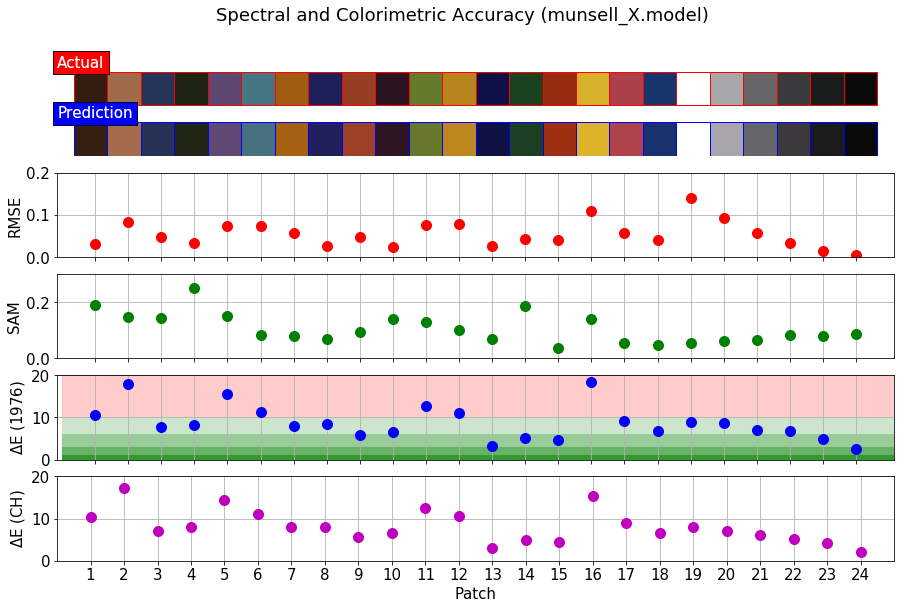

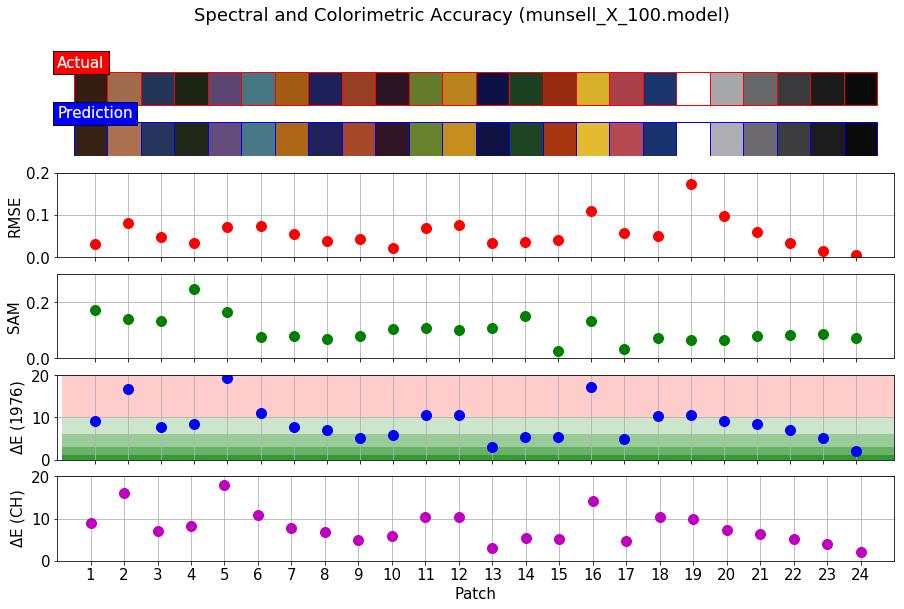

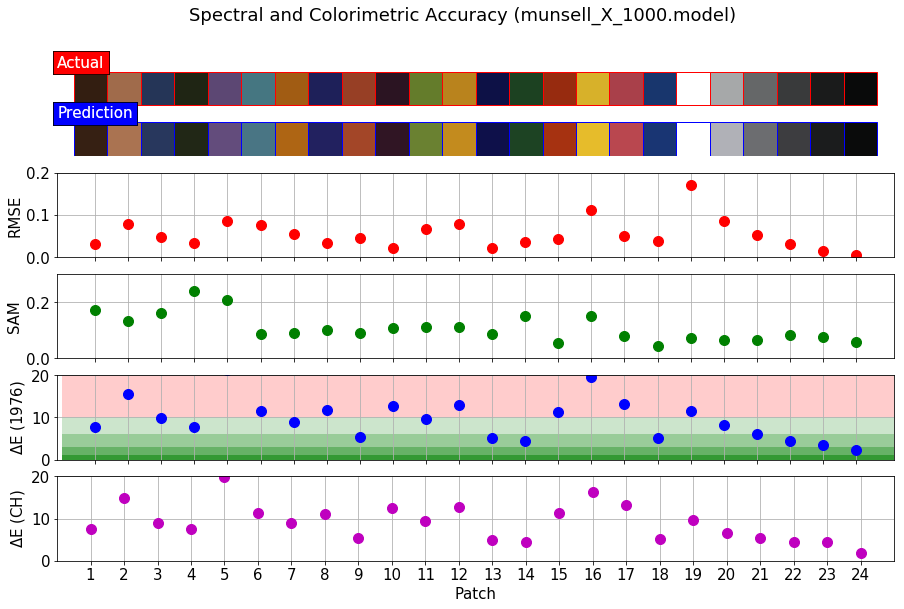

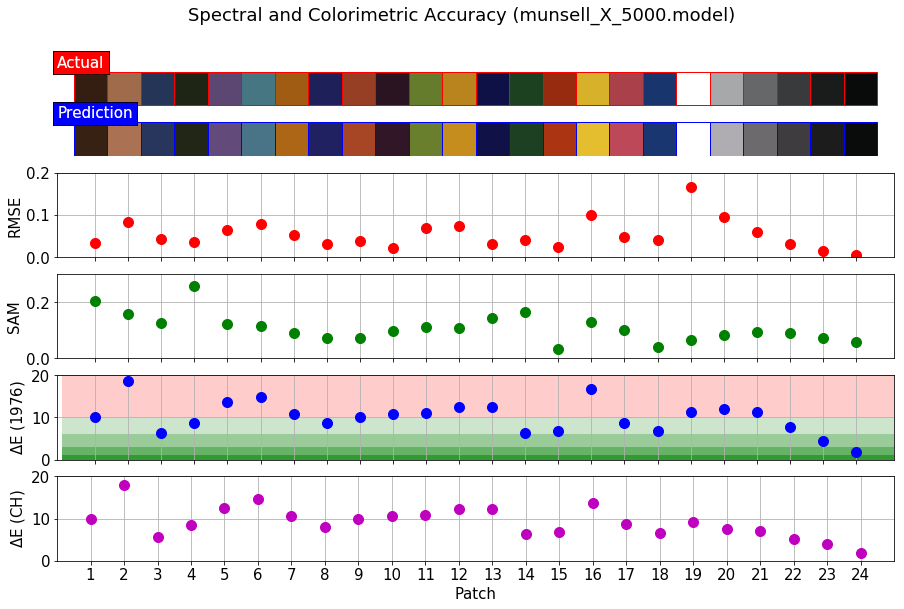

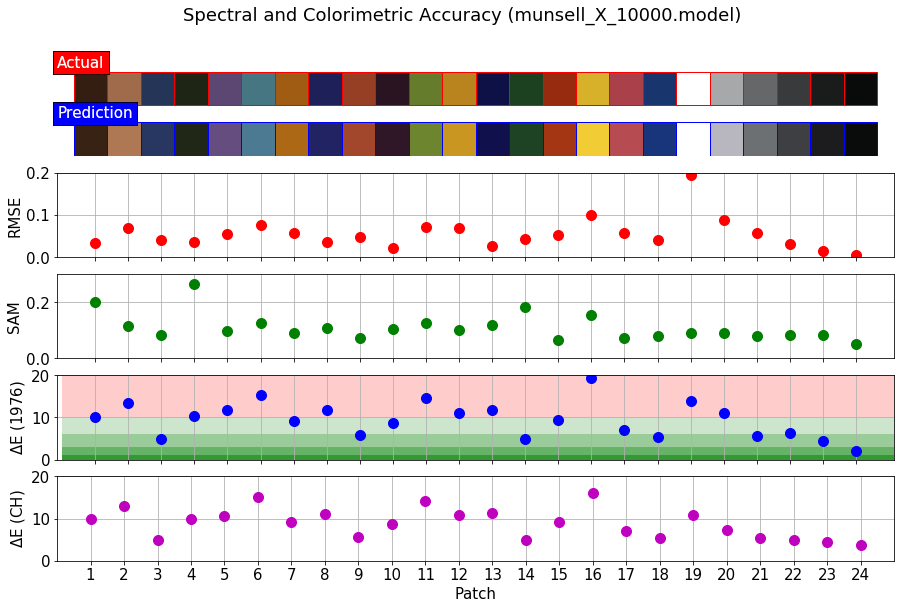

In [275]:
munsell_trained_models = ["munsell_X.model", "munsell_X_100.model",
                         "munsell_X_1000.model", "munsell_X_5000.model","munsell_X_10000.model"]

RMSE_mean, SAM_mean, DE_76_mean, DE_CH_mean = [], [], [], [] 
RMSE_std, SAM_std, DE_76_std, DE_CH_std = [], [], [], [] 


for models in munsell_trained_models:
    RMSE, SAM, DE_76, DE_CH = Error(models)
    
    RMSE_mean.append(np.mean(RMSE))
    RMSE_std.append(np.std(RMSE))
    SAM_mean.append(np.mean(SAM))
    SAM_std.append(np.std(SAM))
    DE_76_mean.append(np.mean(DE_76))
    DE_76_std.append(np.std(DE_76))
    DE_CH_mean.append(np.mean(DE_CH))
    DE_CH_std.append(np.std(DE_CH))

    plt.figure(figsize=[15,9], facecolor = 'w')
    plt.rcParams['axes.titlesize'] = 15
    plt.rcParams.update({'font.size': 15})
    plt.suptitle("Spectral and Colorimetric Accuracy (" + str(models) + ")")

    ax1 = plt.subplot(511)
    for i in range(24):
        plt.gca().add_patch(patch.Rectangle((i+0.5,0),1,0.4, ec = 'b', facecolor = RGB_models[munsell_trained_models.index(models)][i]))
        plt.gca().add_patch(patch.Rectangle((i+0.5,0.6),1,0.4, ec = 'r', facecolor = RGB_mac[:,i]/255))
        plt.text(0,0.45, "Prediction", fontsize = 15, color = 'w',bbox=dict(facecolor='b', alpha=0.5))
        plt.text(0,1.05, "Actual", fontsize = 15, color = 'w',bbox=dict(facecolor='r', alpha=0.5))

    plt.xticks(np.arange(24)+1)
    plt.xlim(0,25)
    plt.setp(ax1.get_yticklabels(), visible=False)
    plt.axis("off")

    ax2 = plt.subplot(512)
    plt.plot(np.arange(24)+1,RMSE, 'ro', ms = 10)
    plt.grid()
    plt.ylabel("RMSE")
    plt.xticks(np.arange(24)+1)
    plt.ylim(0,0.2)
    plt.setp(ax2.get_xticklabels(), visible=False)

    ax3 = plt.subplot(513)
    plt.plot(np.arange(24)+1,SAM, 'go', ms = 10)
    plt.grid()
    plt.ylabel("SAM")
    plt.ylim(0,0.3)
    plt.xticks(np.arange(24)+1)
    plt.setp(ax3.get_xticklabels(), visible=False)

    ax4 = plt.subplot(514)
    plt.plot(np.arange(24)+1,DE_76, 'bo', ms = 10)
    plt.grid()
    plt.ylabel("$\Delta$E (1976)")
    plt.gca().add_patch(patch.Rectangle((0,0),26,1, facecolor = 'g', alpha = 0.8))
    plt.gca().add_patch(patch.Rectangle((0,1),26,2, facecolor = 'g', alpha = 0.6))
    plt.gca().add_patch(patch.Rectangle((0,3),26,3, facecolor = 'g', alpha = 0.4))
    plt.gca().add_patch(patch.Rectangle((0,6),26,4, facecolor = 'g', alpha = 0.2))
    plt.gca().add_patch(patch.Rectangle((0,10),26,10, facecolor = 'r', alpha = 0.2))



    plt.xticks(np.arange(24)+1)
    plt.ylim(0,20)
    plt.setp(ax4.get_xticklabels(), visible=False)

    ax5 = plt.subplot(515, sharex=ax1)
    plt.plot(np.arange(24)+1,DE_CH, 'mo', ms = 10)
    plt.grid()
    plt.xlabel("Patch")
    plt.ylabel("$\Delta$E (CH)")
    plt.ylim(0,20)
    plt.xticks(np.arange(24)+1)
    plt.xlim(0,25)

    plt.tight_layout
    plt.savefig("Macbeth_Accuracy" + str(munsell_trained_models.index(models)) + ".png", dpi = 200)
    plt.show()


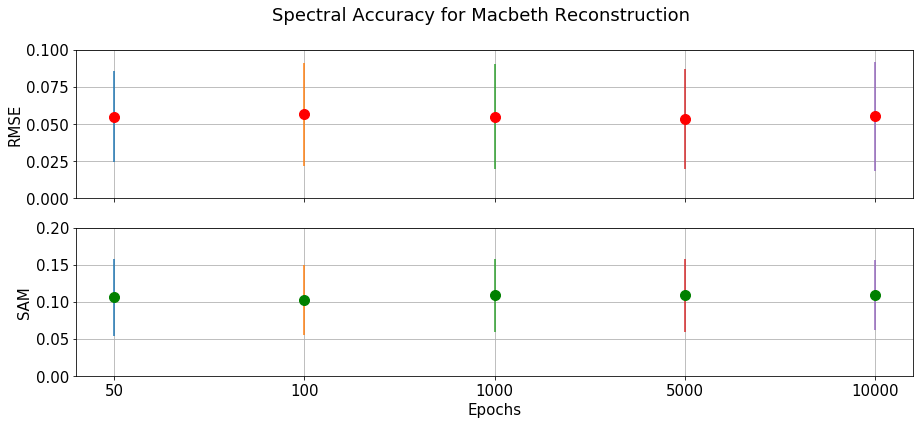

In [273]:
plt.figure(figsize=[15,6], facecolor = 'w')
plt.rcParams['axes.titlesize'] = 15
plt.rcParams.update({'font.size': 15})
plt.suptitle("Spectral Accuracy for Macbeth Reconstruction")
ax1 = plt.subplot(211)
for i in range(5):
    plt.plot(i,RMSE_mean[i], 'ro', ms = 10)
    plt.errorbar(i,RMSE_mean[i], xerr=None, yerr = RMSE_std[i])
    plt.xticks(np.arange(5), ("50","100","1000","5000","10000"))
    plt.ylim(0,0.1)
    plt.grid()
    plt.ylabel("RMSE")
    plt.setp(ax1.get_xticklabels(), visible=False)

ax2 = plt.subplot(212)
for i in range(5):
    plt.plot(i,SAM_mean[i], 'go', ms = 10)
    plt.errorbar(i,SAM_mean[i], xerr=None, yerr = SAM_std[i])
    plt.xticks(np.arange(5), ("50","100","1000","5000","10000"))
    plt.ylim(0,0.2)
    plt.grid()
    plt.ylabel("SAM")
    plt.xlabel("Epochs")

plt.savefig("Average Spectral Accuracy.png", dpi = 200)

In [278]:
DE_76_mean, DE_CH_mean

([8.717562458666825,
  8.660455410245424,
  9.567662508785538,
  10.083128225992787,
  9.508226110116874],
 [8.160373034910931,
  8.041403608343261,
  9.10928683988749,
  9.198269714974087,
  8.915119694722586])

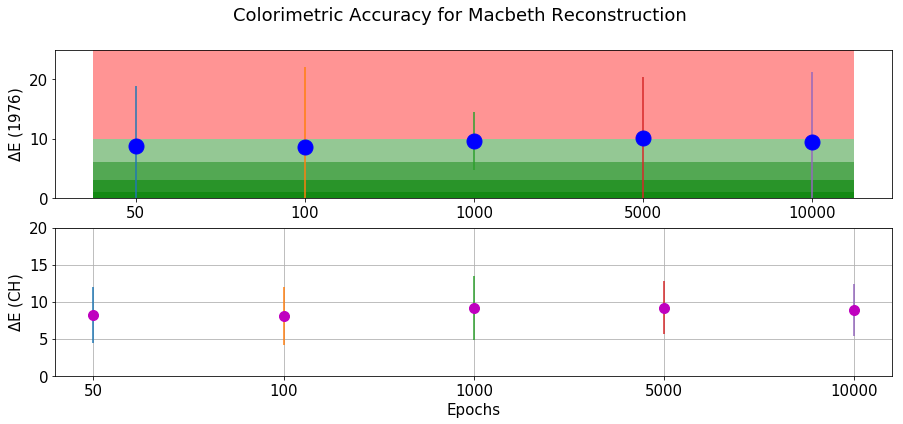

In [284]:
plt.figure(figsize=[15,6], facecolor = 'w')
plt.rcParams['axes.titlesize'] = 15
plt.rcParams.update({'font.size': 15})
plt.suptitle("Colorimetric Accuracy for Macbeth Reconstruction")
ax1 = plt.subplot(211)
for i in range(5):
#     plt.axhline(2.5, color = 'g')
#     plt.axhline(9.509, color = 'r')
    plt.plot(i,DE_76_mean[i], 'bo', ms = 15)
    plt.errorbar(i,DE_76_mean[i], xerr=None, yerr = DE_76[i])
    plt.xticks(np.arange(5), ("50","100","1000","5000","10000"))
    plt.ylim(0,25)
    #plt.grid()
    plt.ylabel("$\Delta$E (1976)")

    #plt.setp(ax1.get_xticklabels(), visible=False)
    plt.gca().add_patch(patch.Rectangle((-0.25,0),4.5,1, facecolor = 'g', alpha = 0.4))
    plt.gca().add_patch(patch.Rectangle((-0.25,1),4.5,2, facecolor = 'g', alpha = 0.3))
    plt.gca().add_patch(patch.Rectangle((-0.25,3),4.5,3, facecolor = 'g', alpha = 0.2))
    plt.gca().add_patch(patch.Rectangle((-0.25,6),4.5,4, facecolor = 'g', alpha = 0.1))
    plt.gca().add_patch(patch.Rectangle((-0.25,10),4.5,15, facecolor = 'r', alpha = 0.1))
    

ax2 = plt.subplot(212)
for i in range(5):
    plt.plot(i,DE_CH_mean[i], 'mo', ms = 10)
    plt.errorbar(i,DE_CH_mean[i], xerr=None, yerr = DE_CH_std[i])
    plt.xticks(np.arange(5), ("50","100","1000","5000","10000"))
    plt.ylim(0,20)
    plt.grid()
    plt.ylabel("$\Delta$E (CH)")
    plt.xlabel("Epochs")
    
plt.savefig("Average Colorimetric Accuracy.png", dpi = 200)

In [87]:
def Render_WB(model, r_sensitivity,g_sensitivity,b_sensitivity, source):
    RGB2REF = tf.keras.models.load_model(model)
    reflectances = RGB2REF.predict(RGB_mac.T)
    fig, axes = plt.subplots(4,6, figsize=(15,9), sharex=True, sharey=True, dpi=200, facecolor = 'w')

    R_w = np.trapz(reflectances[18,:]*r_sensitivity*source)
    G_w = np.trapz(reflectances[18,:]*g_sensitivity*source)
    B_w = np.trapz(reflectances[18,:]*b_sensitivity*source)


    R_m_w = np.trapz(macbeth_r[:,18]*r_sensitivity*source)
    G_m_w = np.trapz(macbeth_r[:,18]*g_sensitivity*source)
    B_m_w = np.trapz(macbeth_r[:,18]*b_sensitivity*source)

    RGB = []
    for i, ax in enumerate(axes.ravel()):
        
        de_76 = del_E_76(CIELab(reflectances[i,:]),CIELab(macbeth_r[:,i]))

        R = 255/R_w*np.trapz(reflectances[i,:]*r_sensitivity*source)
        G = 255/G_w*np.trapz(reflectances[i,:]*g_sensitivity*source)
        B = 255/B_w*np.trapz(reflectances[i,:]*b_sensitivity*source)
        
        R_m = 255/R_m_w*np.trapz(macbeth_r[:,i]*r_sensitivity*source)
        G_m = 255/G_m_w*np.trapz(macbeth_r[:,i]*g_sensitivity*source)
        B_m = 255/B_m_w*np.trapz(macbeth_r[:,i]*b_sensitivity*source) 
        
        if R<0: R = 0
        if G<0: G = 0
        if B<0: B = 0
        if R>255: R = 255
        if G>255: G = 255
        if G>255: B = 255
        
        fig.suptitle(model)
        
        ax.plot(wavelength, macbeth_r[:,i], 'w-', lw = 5 )
        ax.plot(wavelength, macbeth_r[:,i], 'r--', lw = 3, label = 'Theoretical')
        ax.plot(wavelength, reflectances[i,:], 'w-', lw = 5 )
        ax.plot(wavelength, reflectances[i,:], 'b--', lw = 3, label = 'Predicted')
        #ax.set_xlabel("$\Delta$E = " + str(np.round(de_76,2)))

        rr,gg,bb = R/255,G/255,B/255
        rr_m,gg_m,bb_m = R_m/255,G_m/255,B_m/255

        ax.set_facecolor(([rr,gg,bb]))
             
        ax.set_xlim(400,700)
        ax.set_ylim(0,1)
        rect = patches.Rectangle((400,0),150,1,facecolor=([rr_m,gg_m,bb_m])) 
        ax.add_patch(rect)
        RGB.append([rr,gg,bb])
    
        
        #print(rr-rr_m, gg-gg_m, bb-bb_m)
    ax.legend()
    #fig.savefig("C:/Users/renep/Google Drive/Research/Progress Report/" + model + ".png")
    return RGB


ValueError: RGBA values should be within 0-1 range

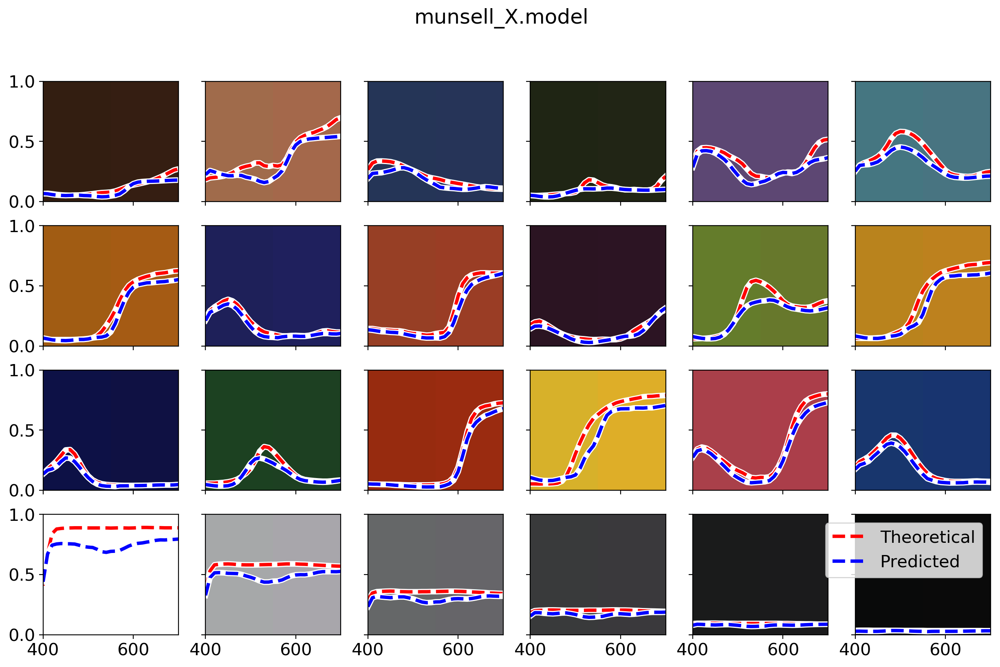

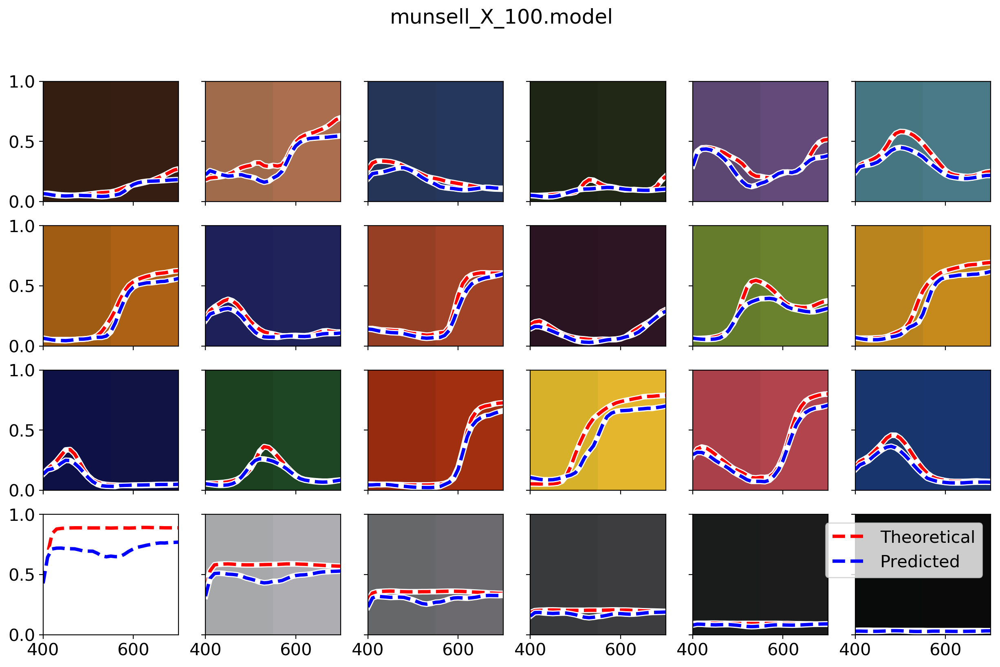

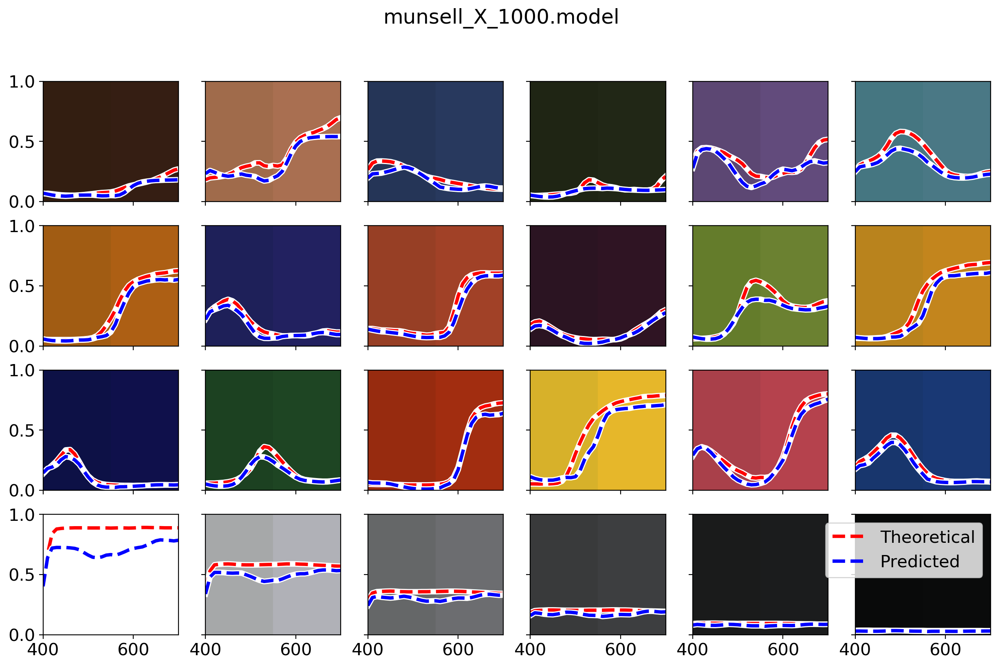

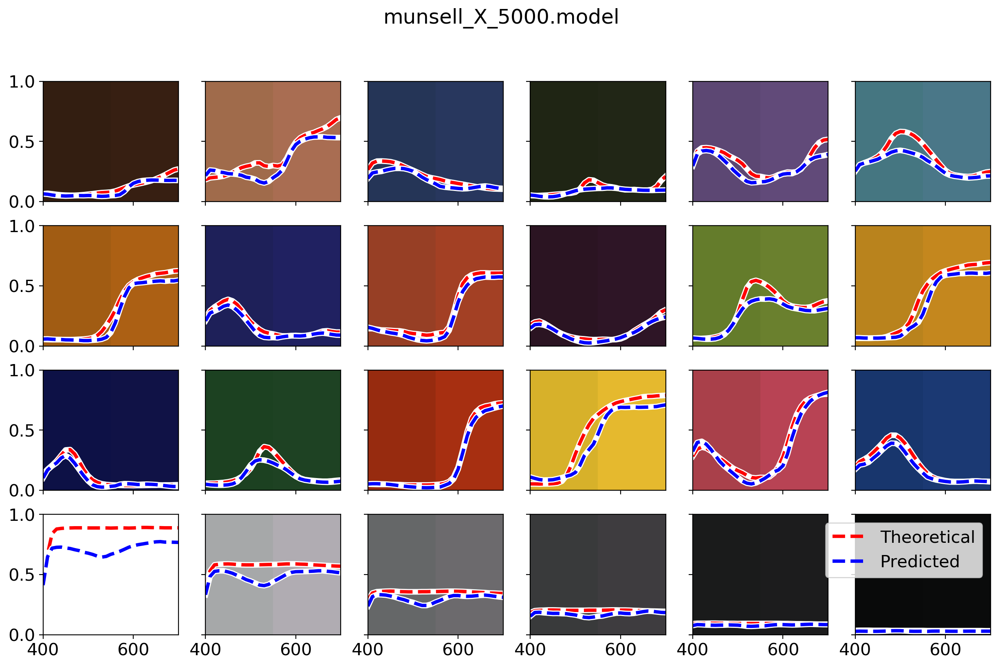

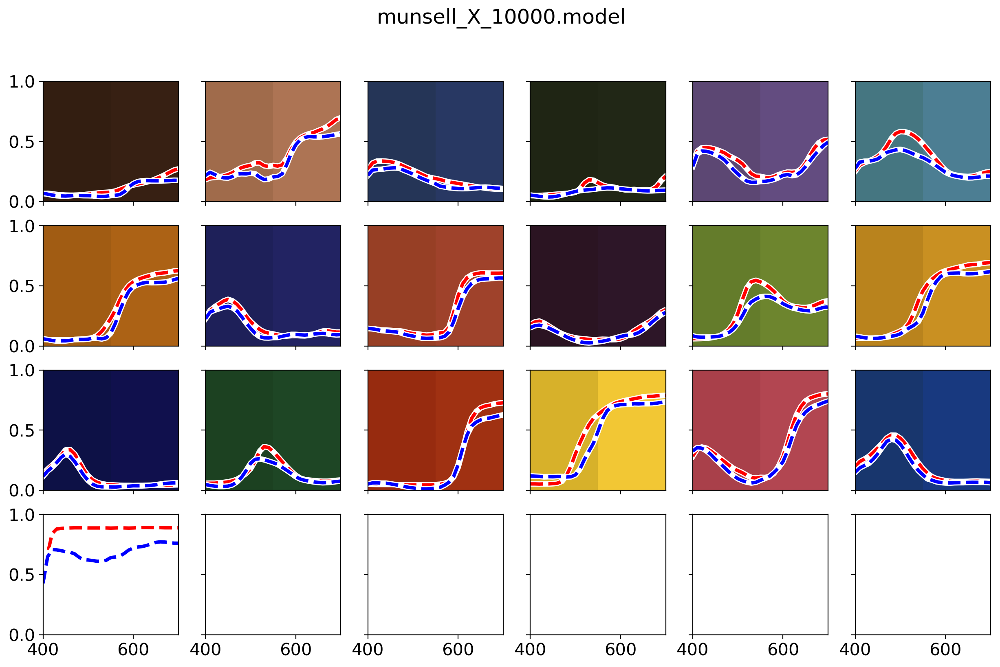

In [124]:
munsell_trained_models = ["munsell_X.model", "munsell_X_100.model",
                         "munsell_X_1000.model", "munsell_X_5000.model","munsell_X_10000.model"]
RGB_models = []
for model in munsell_trained_models:
    RGB = Render_WB(model, r,g,b,D65)
    RGB_models.append(RGB)

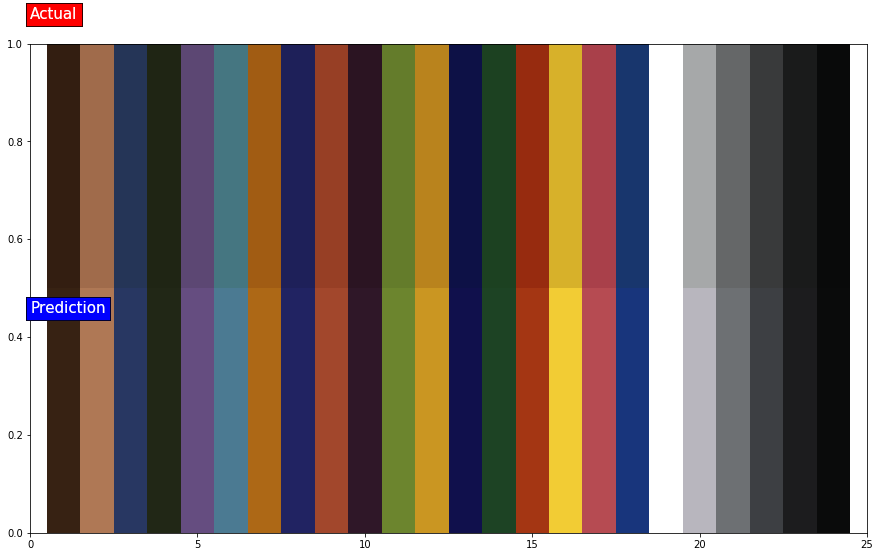

In [331]:
plt.figure(figsize=[15,9], facecolor = 'w')
model = "munsell_X.model"
for i in range(24):
    plt.gca().add_patch(patch.Rectangle((i+0.5,0),1,0.5, facecolor = RGB_models[munsell_trained_models.index(models)][i]))
    plt.gca().add_patch(patch.Rectangle((i+0.5,0.5),1,0.5, facecolor = RGB_mac[:,i]/255))
    plt.text(0,0.45, "Prediction", fontsize = 15, color = 'w',bbox=dict(facecolor='b', alpha=0.5))
    plt.text(0,1.05, "Actual", fontsize = 15, color = 'w',bbox=dict(facecolor='r', alpha=0.5))
    plt.xlim(0,25)


In [105]:
RGB_models[0][1]

[0.6480241120444943, 0.4235737385769449, 0.29490346032116704]

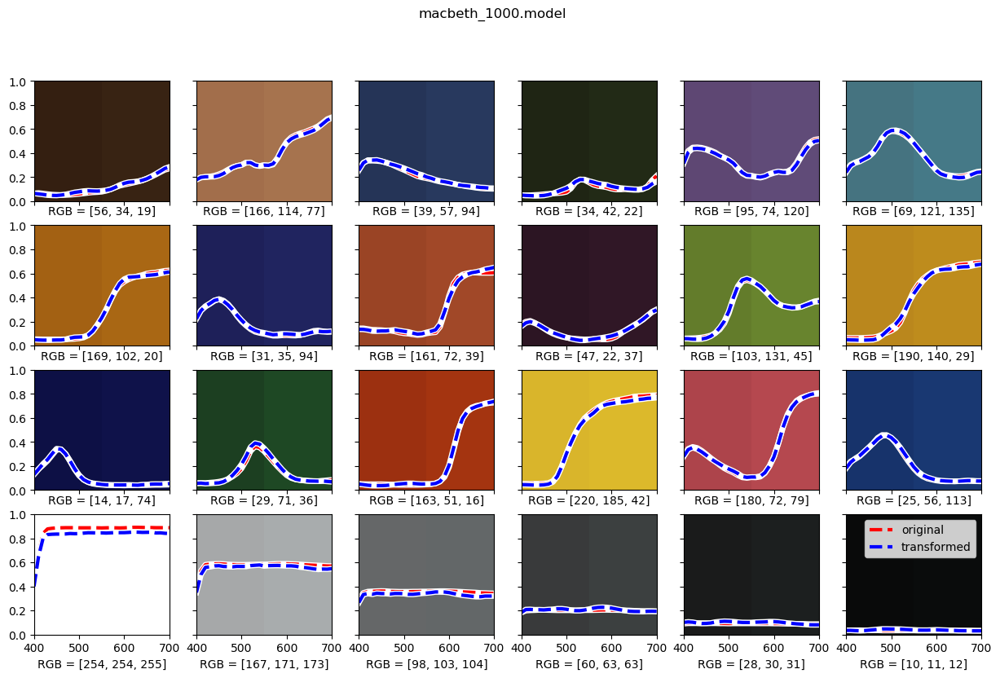

In [14]:
Render_WB("macbeth_1000.model", r,g,b,1)

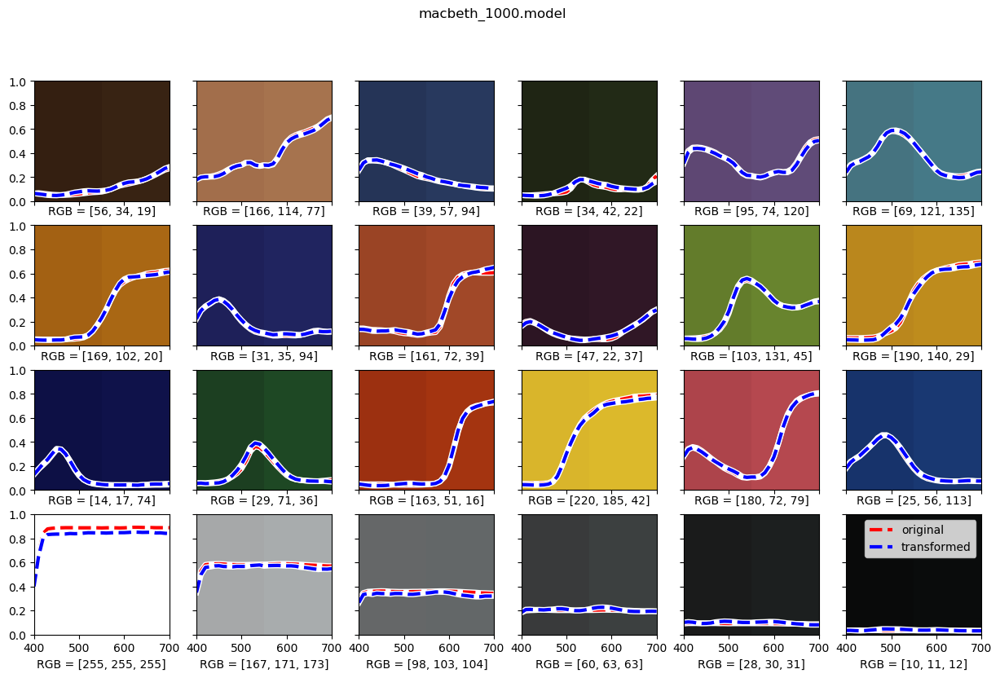

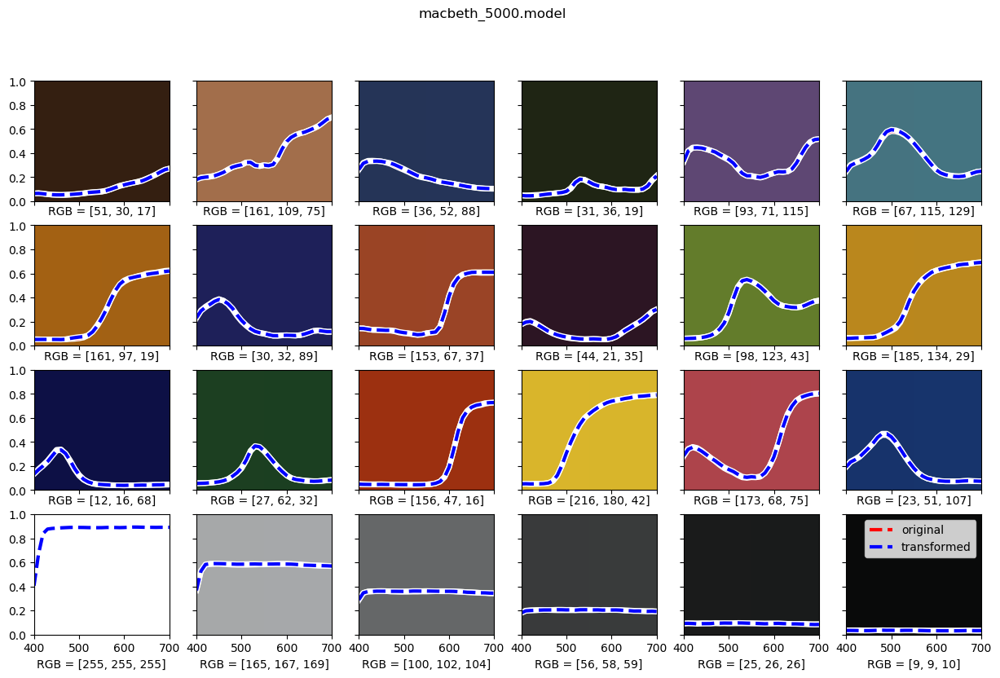

In [43]:
Render_WB("macbeth_1000.model", r,g,b,1)
Render_WB("macbeth_5000.model", r,g,b,1)



In [49]:
from keras import backend as K

def euclidean_distance_loss(y_true, y_pred):
    return K.sqrt(K.sum(K.square(y_pred - y_true), axis = -1))

Using TensorFlow backend.


In [119]:
def SAM(y_true, y_pred):
    a = K.sum(y_pred*y_true)/(K.sqrt(K.sum(K.square(y_pred))*(K.sqrt(K.sum(K.square(y_true))))))
    return tf.math.acos(a) 
    #return K.sqrt(K.sum(K.square(y_pred - y_true), axis = -1))

In [123]:
def Create_Model_DE(RGB_rendition, ensemble, epoch, filename):
    model = Sequential()
    model.add(Dense(300, activation='sigmoid', input_dim=3))
    model.add(Dense(1000, activation='sigmoid'))
    model.add(Dense(31, activation='sigmoid'))
    model.compile(loss= 'mse',
                  optimizer = 'adam',metrics=[SAM])
    
    score = model.evaluate(RGB_rendition.T, ensemble.T)
    #score = model.evaluate(RGB_mun.T, munsell_r.T)
    history = model.fit(RGB_rendition.T, ensemble.T, epochs=epoch)
    
    model.save(filename)

    
    plt.figure(figsize=[15,6])
    plt.plot(history.history['SAM'], 'k-')
    plt.plot(history.history['SAM'], 'ro')
    #plt.title('loss function')
    plt.ylabel('SAM')
    plt.xlabel('epoch')


    #plt.ylim(0,0.001)
    plt.grid()
    plt.show()
    
    return history


11421/11421 [==============================] - 0s 30us/sample - loss: 0.1417 - SAM: nan
Train on 11421 samples
Epoch 1/10
11421/11421 [==============================] - 1s 74us/sample - loss: 0.0055 - SAM: nan
Epoch 2/10
11421/11421 [==============================] - 1s 66us/sample - loss: 4.7012e-04 - SAM: nan
Epoch 3/10
11421/11421 [==============================] - 1s 66us/sample - loss: 3.4256e-04 - SAM: nan
Epoch 4/10
11421/11421 [==============================] - 1s 67us/sample - loss: 3.8362e-04 - SAM: nan
Epoch 5/10
11421/11421 [==============================] - 1s 68us/sample - loss: 3.2837e-04 - SAM: nan
Epoch 6/10
11421/11421 [==============================] - 1s 67us/sample - loss: 3.1365e-04 - SAM: nan
Epoch 7/10
11421/11421 [==============================] - 1s 67us/sample - loss: 2.9498e-04 - SAM: nan
Epoch 8/10
11421/11421 [==============================] - 1s 69us/sample - loss: 3.0362e-04 - SAM: nan
Epoch 9/10
11421/11421 [==============================] - 1s 69us/sam

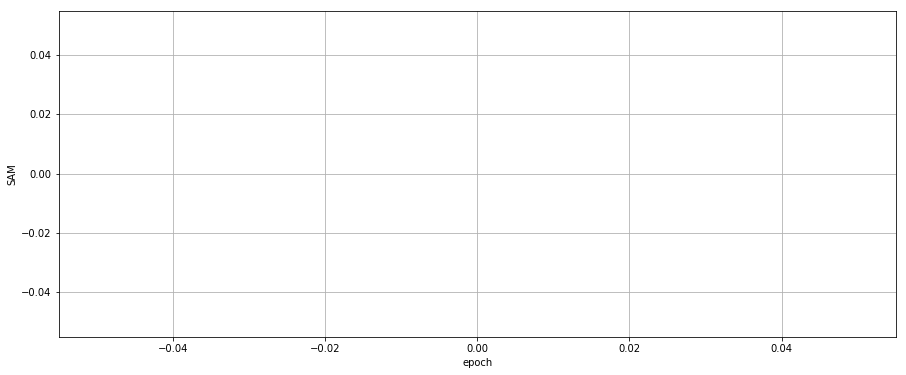

In [124]:
History_dE = Create_Model_DE(RGB_mun, munsell_ensemble, 10, "munsell_100_dE.model")

In [125]:
Render_WB("munsell_100_dE.model", r,g,b,1)


ValueError: Unknown metric function:SAM